# Pytorch Hyperparameter Tuning Example

In [1]:
import torch
import numpy as np

#### Parameters

In [2]:
# N is batch size; D_in is input dimension;
# H is hidden dimension; D_out is output dimension.
N, D_in, H, D_out = 20, 13, 26, 1

#### Helpers functions

In [3]:
class TwoLayerNet(torch.nn.Module):
    def __init__(self, D_in=13, H=26, D_out=1):
        """
        In the constructor we instantiate two nn.Linear modules and assign them as
        member variables.
        """
        super(TwoLayerNet, self).__init__()
        self.linear1 = torch.nn.Linear(D_in, H)
        self.linear2 = torch.nn.Linear(H, D_out)

    def forward(self, x):
        """
        In the forward function we accept a Tensor of input data and we must return
        a Tensor of output data. We can use Modules defined in the constructor as
        well as arbitrary operators on Tensors.
        """
        h_relu = self.linear1(x).clamp(min=0)
        y_pred = self.linear2(h_relu)
        return y_pred

In [4]:
from skorch import NeuralNetRegressor
net = NeuralNetRegressor(TwoLayerNet,
                         max_epochs=1000,
                         lr=0.001,
                         verbose=1)

/Users/dedeco/.pyenv/versions/anaconda3-2019.03/envs/sarvenenv/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


### Load and return the boston house-prices dataset (regression).

In [5]:
from sklearn.datasets import load_boston
X, y = load_boston(return_X_y=True)
print(X.shape)

(506, 13)


In [6]:
load_boston().feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

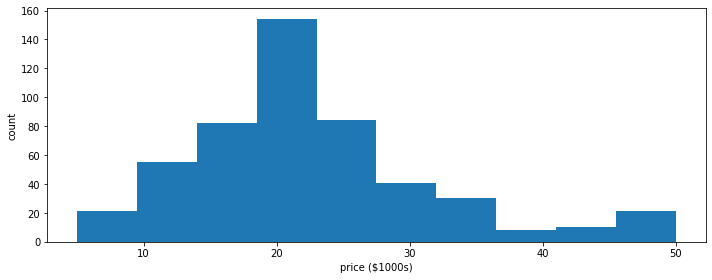

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4))
plt.hist(load_boston().target)
plt.xlabel('price ($1000s)')
plt.ylabel('count')
plt.tight_layout()

### Split data

In [8]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False)

### Scaling

In [9]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0.1,0.9)).fit(X)
X_scaled = min_max_scaler.transform(X_train)

In [10]:
y_train = y_train.reshape(-1, 1)
min_max_scaler_y = preprocessing.MinMaxScaler(feature_range=(0.1,0.9)).fit(y.reshape(-1, 1))
y_scaled = min_max_scaler_y.transform(y_train)

In [11]:
# Just checking!
X_train[:1], X_scaled[:1], min_max_scaler.inverse_transform(X_scaled[:1])

(array([[6.320e-03, 1.800e+01, 2.310e+00, 0.000e+00, 5.380e-01, 6.575e+00,
         6.520e+01, 4.090e+00, 1.000e+00, 2.960e+02, 1.530e+01, 3.969e+02,
         4.980e+00]]),
 array([[0.1       , 0.244     , 0.1542522 , 0.1       , 0.35185185,
         0.56200422, 0.61328527, 0.31536251, 0.1       , 0.26641221,
         0.32978723, 0.9       , 0.17174393]]),
 array([[6.320e-03, 1.800e+01, 2.310e+00, 0.000e+00, 5.380e-01, 6.575e+00,
         6.520e+01, 4.090e+00, 1.000e+00, 2.960e+02, 1.530e+01, 3.969e+02,
         4.980e+00]]))

In [12]:
y_train[:1], y_scaled[:1], min_max_scaler_y.inverse_transform(y_scaled[:1])

(array([[24.]]), array([[0.43777778]]), array([[24.]]))

In [13]:
X_input = torch.from_numpy(
            X_scaled
          ).float()

y_input = torch.from_numpy(
            y_scaled
         ).float()

### Tuning

In [14]:
from sklearn.model_selection import GridSearchCV

In [15]:
params = {
    'lr': [0.0001, 0.005, 0.001, 0.01, 0.02],
    'module__H': [13, 26, 52, 104],
}

gs = GridSearchCV(net, params, refit=False, scoring='r2', verbose=1, cv=10)

In [16]:
gs

GridSearchCV(cv=10, error_score=nan,
             estimator=<class 'skorch.regressor.NeuralNetRegressor'>[uninitialized](
  module=<class '__main__.TwoLayerNet'>,
),
             iid='deprecated', n_jobs=None,
             param_grid={'lr': [0.0001, 0.005, 0.001, 0.01, 0.02],
                         'module__H': [13, 26, 52, 104]},
             pre_dispatch='2*n_jobs', refit=False, return_train_score=False,
             scoring='r2', verbose=1)

In [17]:
gs.fit(X_input, y_input)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.5356        0.4169  0.0162
      2        0.5345        0.4160  0.0078
      3        0.5335        0.4150  0.0076
      4        0.5324        0.4141  0.0101
      5        0.5313        0.4131  0.0078
      6        0.5303        0.4122  0.0077
      7        0.5292        0.4112  0.0110
      8        0.5282        0.4103  0.0098
      9        0.5271        0.4093  0.0083
     10        0.5260        0.4084  0.0089
     11        0.5250        0.4075  0.0132
     12        0.5239        0.4065  0.0080
     13        0.5229        0.4056  0.0083
     14        0.5219        0.4047  0.0123
     15        0.5208        0.4037  0.0094
     16        0.5198        0.4028  0.0087


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


     17        0.5187        0.4019  0.0125
     18        0.5177        0.4010  0.0077
     19        0.5167        0.4000  0.0125
     20        0.5156        0.3991  0.0096
     21        0.5146        0.3982  0.0081
     22        0.5136        0.3973  0.0149
     23        0.5126        0.3964  0.0093
     24        0.5115        0.3955  0.0111
     25        0.5105        0.3946  0.0108
     26        0.5095        0.3937  0.0082
     27        0.5085        0.3928  0.0154
     28        0.5075        0.3919  0.0081
     29        0.5064        0.3909  0.0103
     30        0.5054        0.3901  0.0114
     31        0.5044        0.3892  0.0082
     32        0.5034        0.3883  0.0154
     33        0.5024        0.3874  0.0085
     34        0.5014        0.3865  0.0093
     35        0.5004        0.3856  0.0118
     36        0.4994        0.3847  0.0086
     37        0.4984        0.3838  0.0142
     38        0.4974        0.3829  0.0078
     39        0.4964        0.3

    150        0.3972        0.2947  0.0082
    151        0.3964        0.2940  0.0088
    152        0.3956        0.2933  0.0087
    153        0.3948        0.2926  0.0087
    154        0.3941        0.2919  0.0082
    155        0.3933        0.2912  0.0083
    156        0.3925        0.2905  0.0081
    157        0.3917        0.2898  0.0081
    158        0.3909        0.2891  0.0090
    159        0.3901        0.2885  0.0085
    160        0.3893        0.2878  0.0086
    161        0.3885        0.2871  0.0083
    162        0.3878        0.2864  0.0099
    163        0.3870        0.2857  0.0094
    164        0.3862        0.2851  0.0093
    165        0.3854        0.2844  0.0095
    166        0.3847        0.2837  0.0090
    167        0.3839        0.2830  0.0094
    168        0.3831        0.2824  0.0096
    169        0.3823        0.2817  0.0096
    170        0.3816        0.2810  0.0094
    171        0.3808        0.2804  0.0092
    172        0.3800        0.2

    283        0.3039        0.2138  0.0095
    284        0.3033        0.2133  0.0071
    285        0.3027        0.2128  0.0081
    286        0.3021        0.2123  0.0080
    287        0.3015        0.2118  0.0088
    288        0.3009        0.2112  0.0096
    289        0.3002        0.2107  0.0084
    290        0.2996        0.2102  0.0111
    291        0.2990        0.2097  0.0085
    292        0.2984        0.2092  0.0070
    293        0.2978        0.2086  0.0087
    294        0.2972        0.2081  0.0083
    295        0.2966        0.2076  0.0077
    296        0.2960        0.2071  0.0099
    297        0.2954        0.2066  0.0082
    298        0.2948        0.2061  0.0087
    299        0.2942        0.2056  0.0081
    300        0.2936        0.2051  0.0084
    301        0.2931        0.2046  0.0090
    302        0.2925        0.2041  0.0083
    303        0.2919        0.2036  0.0094
    304        0.2913        0.2031  0.0080
    305        0.2907        0.2

    416        0.2324        0.1532  0.0085
    417        0.2319        0.1528  0.0096
    418        0.2314        0.1524  0.0089
    419        0.2310        0.1521  0.0088
    420        0.2305        0.1517  0.0082
    421        0.2300        0.1513  0.0082
    422        0.2296        0.1509  0.0078
    423        0.2291        0.1505  0.0087
    424        0.2287        0.1501  0.0075
    425        0.2282        0.1497  0.0086
    426        0.2277        0.1494  0.0077
    427        0.2273        0.1490  0.0087
    428        0.2268        0.1486  0.0080
    429        0.2264        0.1482  0.0104
    430        0.2259        0.1478  0.0081
    431        0.2255        0.1475  0.0105
    432        0.2250        0.1471  0.0084
    433        0.2246        0.1467  0.0093
    434        0.2241        0.1463  0.0099
    435        0.2237        0.1459  0.0091
    436        0.2232        0.1456  0.0085
    437        0.2228        0.1452  0.0094
    438        0.2223        0.1

    549        0.1779        0.1083  0.0087
    550        0.1776        0.1080  0.0101
    551        0.1772        0.1077  0.0089
    552        0.1769        0.1074  0.0097
    553        0.1765        0.1071  0.0088
    554        0.1762        0.1068  0.0080
    555        0.1758        0.1065  0.0086
    556        0.1755        0.1063  0.0094
    557        0.1751        0.1060  0.0085
    558        0.1748        0.1057  0.0086
    559        0.1744        0.1054  0.0091
    560        0.1741        0.1051  0.0090
    561        0.1737        0.1049  0.0101
    562        0.1734        0.1046  0.0088
    563        0.1730        0.1043  0.0085
    564        0.1727        0.1040  0.0089
    565        0.1724        0.1037  0.0102
    566        0.1720        0.1035  0.0091
    567        0.1717        0.1032  0.0081
    568        0.1713        0.1029  0.0084
    569        0.1710        0.1026  0.0093
    570        0.1706        0.1024  0.0091
    571        0.1703        0.1

    682        0.1369        0.0755  0.0097
    683        0.1367        0.0753  0.0081
    684        0.1364        0.0751  0.0087
    685        0.1361        0.0749  0.0093
    686        0.1359        0.0747  0.0077
    687        0.1356        0.0745  0.0082
    688        0.1353        0.0742  0.0082
    689        0.1351        0.0740  0.0084
    690        0.1348        0.0738  0.0096
    691        0.1345        0.0736  0.0086
    692        0.1343        0.0734  0.0083
    693        0.1340        0.0732  0.0084
    694        0.1338        0.0730  0.0078
    695        0.1335        0.0728  0.0080
    696        0.1333        0.0726  0.0084
    697        0.1330        0.0724  0.0090
    698        0.1327        0.0722  0.0081
    699        0.1325        0.0720  0.0082
    700        0.1322        0.0718  0.0094
    701        0.1320        0.0716  0.0081
    702        0.1317        0.0714  0.0080
    703        0.1315        0.0712  0.0080
    704        0.1312        0.0

    815        0.1063        0.0521  0.0091
    816        0.1061        0.0519  0.0089
    817        0.1060        0.0518  0.0080
    818        0.1058        0.0516  0.0085
    819        0.1056        0.0515  0.0092
    820        0.1054        0.0513  0.0082
    821        0.1052        0.0512  0.0089
    822        0.1050        0.0511  0.0082
    823        0.1048        0.0509  0.0085
    824        0.1046        0.0508  0.0087
    825        0.1044        0.0506  0.0092
    826        0.1042        0.0505  0.0086
    827        0.1040        0.0504  0.0088
    828        0.1038        0.0502  0.0087
    829        0.1036        0.0501  0.0076
    830        0.1034        0.0499  0.0082
    831        0.1033        0.0498  0.0081
    832        0.1031        0.0496  0.0087
    833        0.1029        0.0495  0.0079
    834        0.1027        0.0494  0.0083
    835        0.1025        0.0492  0.0084
    836        0.1023        0.0491  0.0077
    837        0.1021        0.0

    948        0.0838        0.0358  0.0090
    949        0.0837        0.0357  0.0078
    950        0.0835        0.0356  0.0075
    951        0.0834        0.0355  0.0090
    952        0.0833        0.0354  0.0081
    953        0.0831        0.0353  0.0079
    954        0.0830        0.0352  0.0091
    955        0.0828        0.0351  0.0081
    956        0.0827        0.0350  0.0083
    957        0.0825        0.0349  0.0088
    958        0.0824        0.0348  0.0086
    959        0.0823        0.0347  0.0084
    960        0.0821        0.0346  0.0084
    961        0.0820        0.0345  0.0078
    962        0.0818        0.0344  0.0084
    963        0.0817        0.0343  0.0081
    964        0.0816        0.0342  0.0090
    965        0.0814        0.0342  0.0086
    966        0.0813        0.0341  0.0091
    967        0.0812        0.0340  0.0078
    968        0.0810        0.0339  0.0090
    969        0.0809        0.0338  0.0081
    970        0.0807        0.0

     79        0.3712        0.2707  0.0106
     80        0.3705        0.2700  0.0103
     81        0.3697        0.2694  0.0103
     82        0.3690        0.2687  0.0090
     83        0.3683        0.2681  0.0101
     84        0.3676        0.2674  0.0082
     85        0.3668        0.2668  0.0081
     86        0.3661        0.2661  0.0081
     87        0.3654        0.2655  0.0100
     88        0.3647        0.2648  0.0095
     89        0.3640        0.2642  0.0091
     90        0.3633        0.2636  0.0081
     91        0.3625        0.2629  0.0080
     92        0.3618        0.2623  0.0096
     93        0.3611        0.2617  0.0090
     94        0.3604        0.2610  0.0080
     95        0.3597        0.2604  0.0076
     96        0.3590        0.2598  0.0091
     97        0.3583        0.2592  0.0087
     98        0.3576        0.2585  0.0089
     99        0.3569        0.2579  0.0092
    100        0.3562        0.2573  0.0085
    101        0.3555        0.2

    212        0.2880        0.1971  0.0094
    213        0.2874        0.1966  0.0096
    214        0.2869        0.1962  0.0099
    215        0.2864        0.1957  0.0115
    216        0.2859        0.1952  0.0092
    217        0.2853        0.1948  0.0091
    218        0.2848        0.1943  0.0098
    219        0.2843        0.1939  0.0099
    220        0.2838        0.1934  0.0097
    221        0.2832        0.1930  0.0112
    222        0.2827        0.1925  0.0100
    223        0.2822        0.1920  0.0094
    224        0.2817        0.1916  0.0087
    225        0.2812        0.1911  0.0080
    226        0.2807        0.1907  0.0089
    227        0.2801        0.1903  0.0097
    228        0.2796        0.1898  0.0074
    229        0.2791        0.1894  0.0102
    230        0.2786        0.1889  0.0100
    231        0.2781        0.1885  0.0085
    232        0.2776        0.1880  0.0099
    233        0.2771        0.1876  0.0093
    234        0.2766        0.1

    345        0.2271        0.1446  0.0087
    346        0.2267        0.1443  0.0080
    347        0.2263        0.1439  0.0086
    348        0.2259        0.1436  0.0079
    349        0.2255        0.1433  0.0099
    350        0.2251        0.1430  0.0086
    351        0.2247        0.1426  0.0081
    352        0.2244        0.1423  0.0092
    353        0.2240        0.1420  0.0085
    354        0.2236        0.1417  0.0077
    355        0.2232        0.1413  0.0085
    356        0.2228        0.1410  0.0081
    357        0.2224        0.1407  0.0094
    358        0.2221        0.1404  0.0085
    359        0.2217        0.1400  0.0073
    360        0.2213        0.1397  0.0091
    361        0.2209        0.1394  0.0082
    362        0.2205        0.1391  0.0071
    363        0.2202        0.1388  0.0105
    364        0.2198        0.1384  0.0080
    365        0.2194        0.1381  0.0075
    366        0.2190        0.1378  0.0082
    367        0.2187        0.1

    478        0.1819        0.1069  0.0094
    479        0.1816        0.1067  0.0089
    480        0.1813        0.1065  0.0082
    481        0.1811        0.1062  0.0090
    482        0.1808        0.1060  0.0098
    483        0.1805        0.1057  0.0081
    484        0.1802        0.1055  0.0085
    485        0.1799        0.1053  0.0086
    486        0.1796        0.1050  0.0098
    487        0.1793        0.1048  0.0085
    488        0.1790        0.1046  0.0085
    489        0.1788        0.1043  0.0084
    490        0.1785        0.1041  0.0086
    491        0.1782        0.1039  0.0087
    492        0.1779        0.1036  0.0090
    493        0.1776        0.1034  0.0077
    494        0.1773        0.1032  0.0105
    495        0.1771        0.1030  0.0088
    496        0.1768        0.1027  0.0081
    497        0.1765        0.1025  0.0077
    498        0.1762        0.1023  0.0085
    499        0.1759        0.1020  0.0098
    500        0.1757        0.1

    611        0.1482        0.0798  0.0095
    612        0.1480        0.0797  0.0087
    613        0.1477        0.0795  0.0089
    614        0.1475        0.0793  0.0087
    615        0.1473        0.0791  0.0090
    616        0.1471        0.0790  0.0093
    617        0.1469        0.0788  0.0091
    618        0.1467        0.0786  0.0098
    619        0.1464        0.0785  0.0094
    620        0.1462        0.0783  0.0091
    621        0.1460        0.0781  0.0091
    622        0.1458        0.0780  0.0084
    623        0.1456        0.0778  0.0087
    624        0.1454        0.0776  0.0085
    625        0.1452        0.0775  0.0106
    626        0.1449        0.0773  0.0100
    627        0.1447        0.0771  0.0085
    628        0.1445        0.0770  0.0086
    629        0.1443        0.0768  0.0091
    630        0.1441        0.0766  0.0098
    631        0.1439        0.0765  0.0090
    632        0.1437        0.0763  0.0092
    633        0.1435        0.0

    744        0.1229        0.0604  0.0095
    745        0.1227        0.0603  0.0081
    746        0.1225        0.0602  0.0085
    747        0.1224        0.0600  0.0107
    748        0.1222        0.0599  0.0079
    749        0.1220        0.0598  0.0081
    750        0.1219        0.0597  0.0083
    751        0.1217        0.0596  0.0089
    752        0.1216        0.0594  0.0090
    753        0.1214        0.0593  0.0085
    754        0.1212        0.0592  0.0095
    755        0.1211        0.0591  0.0082
    756        0.1209        0.0590  0.0091
    757        0.1208        0.0588  0.0083
    758        0.1206        0.0587  0.0084
    759        0.1204        0.0586  0.0085
    760        0.1203        0.0585  0.0089
    761        0.1201        0.0584  0.0090
    762        0.1200        0.0582  0.0087
    763        0.1198        0.0581  0.0092
    764        0.1197        0.0580  0.0084
    765        0.1195        0.0579  0.0100
    766        0.1193        0.0

    877        0.1039        0.0465  0.0093
    878        0.1038        0.0465  0.0090
    879        0.1036        0.0464  0.0098
    880        0.1035        0.0463  0.0082
    881        0.1034        0.0462  0.0081
    882        0.1033        0.0461  0.0095
    883        0.1031        0.0460  0.0085
    884        0.1030        0.0459  0.0081
    885        0.1029        0.0459  0.0080
    886        0.1028        0.0458  0.0084
    887        0.1027        0.0457  0.0084
    888        0.1025        0.0456  0.0083
    889        0.1024        0.0455  0.0087
    890        0.1023        0.0454  0.0078
    891        0.1022        0.0453  0.0080
    892        0.1021        0.0453  0.0085
    893        0.1019        0.0452  0.0085
    894        0.1018        0.0451  0.0089
    895        0.1017        0.0450  0.0089
    896        0.1016        0.0449  0.0088
    897        0.1015        0.0448  0.0095
    898        0.1013        0.0448  0.0082
    899        0.1012        0.0

      8        0.1537        0.0715  0.0091
      9        0.1535        0.0714  0.0100
     10        0.1533        0.0712  0.0085
     11        0.1531        0.0711  0.0082
     12        0.1529        0.0709  0.0088
     13        0.1527        0.0708  0.0085
     14        0.1524        0.0706  0.0077
     15        0.1522        0.0705  0.0092
     16        0.1520        0.0703  0.0082
     17        0.1518        0.0702  0.0096
     18        0.1516        0.0701  0.0094
     19        0.1514        0.0699  0.0081
     20        0.1512        0.0698  0.0083
     21        0.1510        0.0696  0.0085
     22        0.1508        0.0695  0.0084
     23        0.1506        0.0694  0.0080
     24        0.1503        0.0692  0.0087
     25        0.1501        0.0691  0.0088
     26        0.1499        0.0689  0.0089
     27        0.1497        0.0688  0.0087
     28        0.1495        0.0687  0.0086
     29        0.1493        0.0685  0.0090
     30        0.1491        0.0

    141        0.1285        0.0548  0.0081
    142        0.1284        0.0547  0.0082
    143        0.1282        0.0546  0.0080
    144        0.1280        0.0545  0.0076
    145        0.1279        0.0544  0.0082
    146        0.1277        0.0543  0.0079
    147        0.1275        0.0542  0.0081
    148        0.1274        0.0541  0.0091
    149        0.1272        0.0540  0.0082
    150        0.1270        0.0539  0.0092
    151        0.1269        0.0538  0.0082
    152        0.1267        0.0537  0.0079
    153        0.1265        0.0535  0.0084
    154        0.1264        0.0534  0.0082
    155        0.1262        0.0533  0.0080
    156        0.1260        0.0532  0.0083
    157        0.1259        0.0531  0.0080
    158        0.1257        0.0530  0.0086
    159        0.1256        0.0529  0.0091
    160        0.1254        0.0528  0.0089
    161        0.1252        0.0527  0.0091
    162        0.1251        0.0526  0.0094
    163        0.1249        0.0

    274        0.1087        0.0425  0.0090
    275        0.1086        0.0425  0.0086
    276        0.1085        0.0424  0.0091
    277        0.1083        0.0423  0.0081
    278        0.1082        0.0422  0.0079
    279        0.1081        0.0422  0.0099
    280        0.1079        0.0421  0.0087
    281        0.1078        0.0420  0.0086
    282        0.1077        0.0419  0.0086
    283        0.1075        0.0418  0.0090
    284        0.1074        0.0418  0.0083
    285        0.1073        0.0417  0.0089
    286        0.1072        0.0416  0.0078
    287        0.1070        0.0415  0.0087
    288        0.1069        0.0415  0.0086
    289        0.1068        0.0414  0.0084
    290        0.1066        0.0413  0.0085
    291        0.1065        0.0412  0.0084
    292        0.1064        0.0412  0.0083
    293        0.1063        0.0411  0.0101
    294        0.1061        0.0410  0.0079
    295        0.1060        0.0409  0.0083
    296        0.1059        0.0

    407        0.0931        0.0336  0.0088
    408        0.0930        0.0335  0.0096
    409        0.0929        0.0335  0.0093
    410        0.0928        0.0334  0.0098
    411        0.0927        0.0334  0.0089
    412        0.0926        0.0333  0.0083
    413        0.0925        0.0333  0.0085
    414        0.0924        0.0332  0.0077
    415        0.0923        0.0331  0.0082
    416        0.0922        0.0331  0.0093
    417        0.0921        0.0330  0.0080
    418        0.0920        0.0330  0.0085
    419        0.0919        0.0329  0.0078
    420        0.0918        0.0329  0.0088
    421        0.0917        0.0328  0.0084
    422        0.0916        0.0328  0.0082
    423        0.0915        0.0327  0.0075
    424        0.0914        0.0326  0.0085
    425        0.0913        0.0326  0.0073
    426        0.0912        0.0325  0.0091
    427        0.0911        0.0325  0.0081
    428        0.0910        0.0324  0.0097
    429        0.0909        0.0

    540        0.0808        0.0271  0.0088
    541        0.0807        0.0271  0.0079
    542        0.0806        0.0271  0.0088
    543        0.0805        0.0270  0.0098
    544        0.0805        0.0270  0.0105
    545        0.0804        0.0269  0.0091
    546        0.0803        0.0269  0.0082
    547        0.0802        0.0269  0.0111
    548        0.0801        0.0268  0.0108
    549        0.0801        0.0268  0.0097
    550        0.0800        0.0267  0.0091
    551        0.0799        0.0267  0.0101
    552        0.0798        0.0267  0.0096
    553        0.0797        0.0266  0.0101
    554        0.0796        0.0266  0.0102
    555        0.0796        0.0266  0.0101
    556        0.0795        0.0265  0.0094
    557        0.0794        0.0265  0.0092
    558        0.0793        0.0264  0.0090
    559        0.0792        0.0264  0.0097
    560        0.0792        0.0264  0.0094
    561        0.0791        0.0263  0.0087
    562        0.0790        0.0

    673        0.0710        0.0226  0.0084
    674        0.0709        0.0226  0.0091
    675        0.0709        0.0226  0.0089
    676        0.0708        0.0225  0.0094
    677        0.0707        0.0225  0.0091
    678        0.0707        0.0225  0.0086
    679        0.0706        0.0224  0.0084
    680        0.0705        0.0224  0.0083
    681        0.0705        0.0224  0.0086
    682        0.0704        0.0224  0.0083
    683        0.0703        0.0223  0.0087
    684        0.0703        0.0223  0.0089
    685        0.0702        0.0223  0.0087
    686        0.0702        0.0222  0.0097
    687        0.0701        0.0222  0.0101
    688        0.0700        0.0222  0.0090
    689        0.0700        0.0222  0.0096
    690        0.0699        0.0221  0.0087
    691        0.0698        0.0221  0.0091
    692        0.0698        0.0221  0.0088
    693        0.0697        0.0221  0.0081
    694        0.0696        0.0220  0.0084
    695        0.0696        0.0

    806        0.0632        0.0195  0.0097
    807        0.0631        0.0195  0.0085
    808        0.0631        0.0195  0.0090
    809        0.0630        0.0194  0.0086
    810        0.0630        0.0194  0.0089
    811        0.0629        0.0194  0.0086
    812        0.0629        0.0194  0.0083
    813        0.0628        0.0194  0.0085
    814        0.0628        0.0194  0.0094
    815        0.0627        0.0193  0.0092
    816        0.0627        0.0193  0.0083
    817        0.0626        0.0193  0.0089
    818        0.0626        0.0193  0.0075
    819        0.0625        0.0193  0.0091
    820        0.0625        0.0192  0.0082
    821        0.0624        0.0192  0.0082
    822        0.0624        0.0192  0.0098
    823        0.0623        0.0192  0.0090
    824        0.0623        0.0192  0.0085
    825        0.0622        0.0192  0.0095
    826        0.0622        0.0191  0.0085
    827        0.0621        0.0191  0.0087
    828        0.0621        0.0

    939        0.0569        0.0175  0.0087
    940        0.0569        0.0175  0.0086
    941        0.0569        0.0175  0.0080
    942        0.0568        0.0174  0.0085
    943        0.0568        0.0174  0.0083
    944        0.0567        0.0174  0.0085
    945        0.0567        0.0174  0.0097
    946        0.0567        0.0174  0.0095
    947        0.0566        0.0174  0.0091
    948        0.0566        0.0174  0.0109
    949        0.0565        0.0174  0.0104
    950        0.0565        0.0173  0.0085
    951        0.0564        0.0173  0.0081
    952        0.0564        0.0173  0.0080
    953        0.0564        0.0173  0.0082
    954        0.0563        0.0173  0.0080
    955        0.0563        0.0173  0.0086
    956        0.0562        0.0173  0.0088
    957        0.0562        0.0173  0.0089
    958        0.0562        0.0173  0.0084
    959        0.0561        0.0172  0.0083
    960        0.0561        0.0172  0.0090
    961        0.0560        0.0

     70        0.1150        0.0484  0.0098
     71        0.1148        0.0483  0.0080
     72        0.1147        0.0482  0.0081
     73        0.1145        0.0481  0.0085
     74        0.1143        0.0480  0.0083
     75        0.1141        0.0478  0.0084
     76        0.1139        0.0477  0.0090
     77        0.1137        0.0476  0.0081
     78        0.1136        0.0475  0.0093
     79        0.1134        0.0474  0.0082
     80        0.1132        0.0473  0.0083
     81        0.1130        0.0472  0.0082
     82        0.1128        0.0470  0.0092
     83        0.1127        0.0469  0.0085
     84        0.1125        0.0468  0.0086
     85        0.1123        0.0467  0.0080
     86        0.1121        0.0466  0.0083
     87        0.1119        0.0465  0.0085
     88        0.1118        0.0464  0.0082
     89        0.1116        0.0463  0.0084
     90        0.1114        0.0461  0.0084
     91        0.1112        0.0460  0.0087
     92        0.1111        0.0

    203        0.0938        0.0356  0.0094
    204        0.0937        0.0355  0.0094
    205        0.0935        0.0354  0.0096
    206        0.0934        0.0354  0.0094
    207        0.0933        0.0353  0.0094
    208        0.0931        0.0352  0.0089
    209        0.0930        0.0351  0.0099
    210        0.0929        0.0351  0.0090
    211        0.0927        0.0350  0.0091
    212        0.0926        0.0349  0.0103
    213        0.0925        0.0348  0.0101
    214        0.0923        0.0348  0.0084
    215        0.0922        0.0347  0.0093
    216        0.0921        0.0346  0.0082
    217        0.0919        0.0345  0.0091
    218        0.0918        0.0345  0.0102
    219        0.0917        0.0344  0.0091
    220        0.0915        0.0343  0.0090
    221        0.0914        0.0342  0.0092
    222        0.0913        0.0342  0.0092
    223        0.0911        0.0341  0.0102
    224        0.0910        0.0340  0.0091
    225        0.0909        0.0

    336        0.0781        0.0272  0.0091
    337        0.0780        0.0272  0.0078
    338        0.0779        0.0271  0.0098
    339        0.0778        0.0271  0.0080
    340        0.0777        0.0270  0.0082
    341        0.0776        0.0270  0.0082
    342        0.0775        0.0270  0.0083
    343        0.0774        0.0269  0.0083
    344        0.0773        0.0269  0.0094
    345        0.0772        0.0268  0.0084
    346        0.0771        0.0268  0.0074
    347        0.0770        0.0267  0.0092
    348        0.0769        0.0267  0.0088
    349        0.0768        0.0266  0.0074
    350        0.0767        0.0266  0.0107
    351        0.0766        0.0265  0.0090
    352        0.0765        0.0265  0.0077
    353        0.0765        0.0264  0.0082
    354        0.0764        0.0264  0.0089
    355        0.0763        0.0263  0.0092
    356        0.0762        0.0263  0.0082
    357        0.0761        0.0262  0.0079
    358        0.0760        0.0

    469        0.0666        0.0220  0.0092
    470        0.0666        0.0220  0.0089
    471        0.0665        0.0220  0.0085
    472        0.0664        0.0220  0.0084
    473        0.0664        0.0219  0.0082
    474        0.0663        0.0219  0.0086
    475        0.0662        0.0219  0.0082
    476        0.0661        0.0218  0.0097
    477        0.0661        0.0218  0.0088
    478        0.0660        0.0218  0.0089
    479        0.0659        0.0218  0.0103
    480        0.0658        0.0217  0.0080
    481        0.0658        0.0217  0.0082
    482        0.0657        0.0217  0.0085
    483        0.0656        0.0216  0.0084
    484        0.0656        0.0216  0.0085
    485        0.0655        0.0216  0.0102
    486        0.0654        0.0216  0.0088
    487        0.0654        0.0215  0.0097
    488        0.0653        0.0215  0.0082
    489        0.0652        0.0215  0.0096
    490        0.0651        0.0214  0.0089
    491        0.0651        0.0

    602        0.0582        0.0190  0.0087
    603        0.0582        0.0190  0.0083
    604        0.0581        0.0190  0.0080
    605        0.0581        0.0190  0.0086
    606        0.0580        0.0189  0.0089
    607        0.0580        0.0189  0.0084
    608        0.0579        0.0189  0.0094
    609        0.0579        0.0189  0.0089
    610        0.0578        0.0189  0.0079
    611        0.0578        0.0189  0.0091
    612        0.0577        0.0188  0.0089
    613        0.0576        0.0188  0.0086
    614        0.0576        0.0188  0.0096
    615        0.0575        0.0188  0.0092
    616        0.0575        0.0188  0.0088
    617        0.0574        0.0188  0.0087
    618        0.0574        0.0188  0.0086
    619        0.0573        0.0187  0.0087
    620        0.0573        0.0187  0.0093
    621        0.0572        0.0187  0.0088
    622        0.0572        0.0187  0.0085
    623        0.0571        0.0187  0.0086
    624        0.0571        0.0

    735        0.0520        0.0174  0.0093
    736        0.0520        0.0174  0.0085
    737        0.0519        0.0174  0.0083
    738        0.0519        0.0174  0.0083
    739        0.0519        0.0174  0.0087
    740        0.0518        0.0174  0.0085
    741        0.0518        0.0174  0.0088
    742        0.0517        0.0174  0.0091
    743        0.0517        0.0173  0.0079
    744        0.0517        0.0173  0.0084
    745        0.0516        0.0173  0.0091
    746        0.0516        0.0173  0.0082
    747        0.0516        0.0173  0.0083
    748        0.0515        0.0173  0.0094
    749        0.0515        0.0173  0.0092
    750        0.0514        0.0173  0.0087
    751        0.0514        0.0173  0.0080
    752        0.0514        0.0173  0.0085
    753        0.0513        0.0173  0.0085
    754        0.0513        0.0173  0.0090
    755        0.0512        0.0173  0.0086
    756        0.0512        0.0173  0.0084
    757        0.0512        0.0

    868        0.0474        0.0168  0.0098
    869        0.0474        0.0167  0.0084
    870        0.0474        0.0167  0.0084
    871        0.0473        0.0167  0.0081
    872        0.0473        0.0167  0.0092
    873        0.0473        0.0167  0.0086
    874        0.0473        0.0167  0.0094
    875        0.0472        0.0167  0.0084
    876        0.0472        0.0167  0.0087
    877        0.0472        0.0167  0.0080
    878        0.0471        0.0167  0.0099
    879        0.0471        0.0167  0.0086
    880        0.0471        0.0167  0.0077
    881        0.0471        0.0167  0.0086
    882        0.0470        0.0167  0.0086
    883        0.0470        0.0167  0.0075
    884        0.0470        0.0167  0.0091
    885        0.0469        0.0167  0.0083
    886        0.0469        0.0167  0.0090
    887        0.0469        0.0167  0.0082
    888        0.0469        0.0167  0.0085
    889        0.0468        0.0167  0.0084
    890        0.0468        0.0

      6        0.3261        0.2457  0.0096
      7        0.3256        0.2453  0.0079
      8        0.3251        0.2448  0.0087
      9        0.3246        0.2444  0.0092
     10        0.3241        0.2440  0.0083
     11        0.3236        0.2436  0.0089
     12        0.3231        0.2432  0.0089
     13        0.3226        0.2427  0.0085
     14        0.3221        0.2423  0.0088
     15        0.3216        0.2419  0.0084
     16        0.3211        0.2415  0.0082
     17        0.3206        0.2410  0.0091
     18        0.3201        0.2406  0.0086
     19        0.3196        0.2402  0.0087
     20        0.3191        0.2398  0.0088
     21        0.3186        0.2394  0.0086
     22        0.3181        0.2390  0.0087
     23        0.3177        0.2386  0.0086
     24        0.3172        0.2381  0.0085
     25        0.3167        0.2377  0.0092
     26        0.3162        0.2373  0.0085
     27        0.3157        0.2369  0.0080
     28        0.3152        0.2

    139        0.2660        0.1950  0.0082
    140        0.2656        0.1947  0.0080
    141        0.2652        0.1944  0.0081
    142        0.2648        0.1940  0.0077
    143        0.2644        0.1937  0.0081
    144        0.2640        0.1934  0.0083
    145        0.2636        0.1930  0.0089
    146        0.2632        0.1927  0.0090
    147        0.2628        0.1923  0.0084
    148        0.2624        0.1920  0.0082
    149        0.2620        0.1917  0.0081
    150        0.2616        0.1913  0.0087
    151        0.2612        0.1910  0.0080
    152        0.2608        0.1907  0.0082
    153        0.2604        0.1903  0.0083
    154        0.2600        0.1900  0.0091
    155        0.2596        0.1897  0.0081
    156        0.2592        0.1893  0.0088
    157        0.2588        0.1890  0.0089
    158        0.2584        0.1887  0.0079
    159        0.2580        0.1883  0.0092
    160        0.2576        0.1880  0.0088
    161        0.2572        0.1

    272        0.2174        0.1545  0.0080
    273        0.2170        0.1542  0.0079
    274        0.2167        0.1540  0.0084
    275        0.2164        0.1537  0.0097
    276        0.2161        0.1534  0.0085
    277        0.2157        0.1531  0.0080
    278        0.2154        0.1529  0.0088
    279        0.2151        0.1526  0.0078
    280        0.2148        0.1523  0.0087
    281        0.2144        0.1521  0.0093
    282        0.2141        0.1518  0.0089
    283        0.2138        0.1515  0.0083
    284        0.2135        0.1513  0.0081
    285        0.2131        0.1510  0.0081
    286        0.2128        0.1507  0.0082
    287        0.2125        0.1505  0.0102
    288        0.2122        0.1502  0.0086
    289        0.2119        0.1499  0.0081
    290        0.2115        0.1497  0.0096
    291        0.2112        0.1494  0.0087
    292        0.2109        0.1491  0.0079
    293        0.2106        0.1489  0.0089
    294        0.2103        0.1

    405        0.1779        0.1220  0.0090
    406        0.1777        0.1218  0.0085
    407        0.1774        0.1216  0.0077
    408        0.1771        0.1214  0.0095
    409        0.1769        0.1212  0.0082
    410        0.1766        0.1209  0.0083
    411        0.1763        0.1207  0.0081
    412        0.1761        0.1205  0.0087
    413        0.1758        0.1203  0.0086
    414        0.1755        0.1201  0.0074
    415        0.1753        0.1199  0.0082
    416        0.1750        0.1197  0.0081
    417        0.1748        0.1194  0.0093
    418        0.1745        0.1192  0.0081
    419        0.1742        0.1190  0.0095
    420        0.1740        0.1188  0.0102
    421        0.1737        0.1186  0.0095
    422        0.1735        0.1184  0.0093
    423        0.1732        0.1182  0.0080
    424        0.1729        0.1180  0.0083
    425        0.1727        0.1177  0.0078
    426        0.1724        0.1175  0.0088
    427        0.1722        0.1

    538        0.1462        0.0963  0.0094
    539        0.1460        0.0961  0.0083
    540        0.1457        0.0960  0.0081
    541        0.1455        0.0958  0.0090
    542        0.1453        0.0956  0.0099
    543        0.1451        0.0955  0.0084
    544        0.1449        0.0953  0.0073
    545        0.1447        0.0951  0.0088
    546        0.1445        0.0950  0.0076
    547        0.1443        0.0948  0.0089
    548        0.1441        0.0946  0.0099
    549        0.1438        0.0944  0.0094
    550        0.1436        0.0943  0.0092
    551        0.1434        0.0941  0.0080
    552        0.1432        0.0939  0.0087
    553        0.1430        0.0938  0.0101
    554        0.1428        0.0936  0.0088
    555        0.1426        0.0935  0.0088
    556        0.1424        0.0933  0.0093
    557        0.1422        0.0931  0.0094
    558        0.1420        0.0930  0.0092
    559        0.1418        0.0928  0.0082
    560        0.1416        0.0

    671        0.1208        0.0762  0.0086
    672        0.1207        0.0761  0.0080
    673        0.1205        0.0759  0.0088
    674        0.1203        0.0758  0.0103
    675        0.1202        0.0757  0.0093
    676        0.1200        0.0755  0.0090
    677        0.1198        0.0754  0.0088
    678        0.1197        0.0753  0.0086
    679        0.1195        0.0751  0.0094
    680        0.1193        0.0750  0.0099
    681        0.1192        0.0749  0.0098
    682        0.1190        0.0747  0.0102
    683        0.1188        0.0746  0.0095
    684        0.1187        0.0745  0.0094
    685        0.1185        0.0744  0.0087
    686        0.1183        0.0742  0.0083
    687        0.1182        0.0741  0.0088
    688        0.1180        0.0740  0.0097
    689        0.1178        0.0738  0.0085
    690        0.1177        0.0737  0.0084
    691        0.1175        0.0736  0.0086
    692        0.1173        0.0735  0.0085
    693        0.1172        0.0

    804        0.1007        0.0606  0.0096
    805        0.1006        0.0604  0.0079
    806        0.1005        0.0603  0.0090
    807        0.1003        0.0602  0.0080
    808        0.1002        0.0601  0.0085
    809        0.1001        0.0600  0.0084
    810        0.0999        0.0599  0.0087
    811        0.0998        0.0598  0.0084
    812        0.0997        0.0597  0.0078
    813        0.0995        0.0596  0.0094
    814        0.0994        0.0595  0.0084
    815        0.0993        0.0594  0.0095
    816        0.0991        0.0593  0.0085
    817        0.0990        0.0592  0.0090
    818        0.0989        0.0591  0.0090
    819        0.0988        0.0590  0.0095
    820        0.0986        0.0589  0.0093
    821        0.0985        0.0588  0.0086
    822        0.0984        0.0587  0.0082
    823        0.0982        0.0586  0.0090
    824        0.0981        0.0585  0.0083
    825        0.0980        0.0584  0.0102
    826        0.0978        0.0

    937        0.0849        0.0485  0.0089
    938        0.0848        0.0485  0.0085
    939        0.0847        0.0484  0.0083
    940        0.0846        0.0483  0.0090
    941        0.0845        0.0482  0.0077
    942        0.0844        0.0482  0.0087
    943        0.0843        0.0481  0.0082
    944        0.0842        0.0480  0.0087
    945        0.0841        0.0479  0.0080
    946        0.0840        0.0478  0.0086
    947        0.0839        0.0478  0.0082
    948        0.0838        0.0477  0.0082
    949        0.0837        0.0476  0.0083
    950        0.0836        0.0475  0.0085
    951        0.0835        0.0475  0.0089
    952        0.0834        0.0474  0.0083
    953        0.0833        0.0473  0.0078
    954        0.0832        0.0472  0.0079
    955        0.0831        0.0472  0.0096
    956        0.0830        0.0471  0.0084
    957        0.0829        0.0470  0.0083
    958        0.0828        0.0469  0.0086
    959        0.0827        0.0

     68        0.1263        0.0758  0.0087
     69        0.1261        0.0756  0.0091
     70        0.1259        0.0754  0.0083
     71        0.1257        0.0753  0.0085
     72        0.1255        0.0751  0.0093
     73        0.1252        0.0749  0.0096
     74        0.1250        0.0748  0.0079
     75        0.1248        0.0746  0.0091
     76        0.1246        0.0744  0.0099
     77        0.1244        0.0743  0.0092
     78        0.1242        0.0741  0.0080
     79        0.1240        0.0739  0.0084
     80        0.1238        0.0738  0.0096
     81        0.1236        0.0736  0.0092
     82        0.1234        0.0734  0.0083
     83        0.1232        0.0733  0.0078
     84        0.1230        0.0731  0.0091
     85        0.1228        0.0729  0.0092
     86        0.1226        0.0728  0.0089
     87        0.1224        0.0726  0.0089
     88        0.1222        0.0725  0.0087
     89        0.1220        0.0723  0.0081
     90        0.1218        0.0

    201        0.1020        0.0564  0.0097
    202        0.1019        0.0563  0.0091
    203        0.1017        0.0562  0.0081
    204        0.1016        0.0561  0.0089
    205        0.1014        0.0559  0.0098
    206        0.1012        0.0558  0.0096
    207        0.1011        0.0557  0.0098
    208        0.1009        0.0556  0.0098
    209        0.1008        0.0554  0.0089
    210        0.1006        0.0553  0.0091
    211        0.1005        0.0552  0.0083
    212        0.1003        0.0551  0.0086
    213        0.1001        0.0550  0.0082
    214        0.1000        0.0548  0.0088
    215        0.0998        0.0547  0.0086
    216        0.0997        0.0546  0.0086
    217        0.0995        0.0545  0.0075
    218        0.0994        0.0544  0.0079
    219        0.0992        0.0542  0.0083
    220        0.0991        0.0541  0.0082
    221        0.0989        0.0540  0.0095
    222        0.0988        0.0539  0.0089
    223        0.0986        0.0

    334        0.0834        0.0423  0.0087
    335        0.0833        0.0422  0.0091
    336        0.0831        0.0421  0.0076
    337        0.0830        0.0420  0.0079
    338        0.0829        0.0419  0.0089
    339        0.0828        0.0418  0.0085
    340        0.0827        0.0417  0.0079
    341        0.0825        0.0416  0.0087
    342        0.0824        0.0415  0.0084
    343        0.0823        0.0415  0.0097
    344        0.0822        0.0414  0.0090
    345        0.0821        0.0413  0.0103
    346        0.0819        0.0412  0.0081
    347        0.0818        0.0411  0.0085
    348        0.0817        0.0410  0.0093
    349        0.0816        0.0409  0.0091
    350        0.0815        0.0408  0.0100
    351        0.0813        0.0408  0.0107
    352        0.0812        0.0407  0.0092
    353        0.0811        0.0406  0.0096
    354        0.0810        0.0405  0.0095
    355        0.0809        0.0404  0.0095
    356        0.0808        0.0

    467        0.0692        0.0321  0.0094
    468        0.0692        0.0321  0.0104
    469        0.0691        0.0320  0.0093
    470        0.0690        0.0319  0.0084
    471        0.0689        0.0319  0.0091
    472        0.0688        0.0318  0.0090
    473        0.0687        0.0318  0.0085
    474        0.0686        0.0317  0.0091
    475        0.0685        0.0316  0.0082
    476        0.0684        0.0316  0.0083
    477        0.0683        0.0315  0.0092
    478        0.0682        0.0314  0.0088
    479        0.0682        0.0314  0.0090
    480        0.0681        0.0313  0.0095
    481        0.0680        0.0313  0.0088
    482        0.0679        0.0312  0.0091
    483        0.0678        0.0311  0.0096
    484        0.0677        0.0311  0.0088
    485        0.0676        0.0310  0.0090
    486        0.0675        0.0310  0.0094
    487        0.0674        0.0309  0.0091
    488        0.0674        0.0308  0.0101
    489        0.0673        0.0

    600        0.0586        0.0250  0.0095
    601        0.0585        0.0249  0.0084
    602        0.0584        0.0249  0.0091
    603        0.0584        0.0249  0.0087
    604        0.0583        0.0248  0.0098
    605        0.0582        0.0248  0.0078
    606        0.0582        0.0247  0.0084
    607        0.0581        0.0247  0.0086
    608        0.0580        0.0246  0.0090
    609        0.0580        0.0246  0.0085
    610        0.0579        0.0246  0.0096
    611        0.0578        0.0245  0.0087
    612        0.0578        0.0245  0.0088
    613        0.0577        0.0244  0.0102
    614        0.0576        0.0244  0.0090
    615        0.0576        0.0243  0.0082
    616        0.0575        0.0243  0.0085
    617        0.0574        0.0243  0.0082
    618        0.0574        0.0242  0.0097
    619        0.0573        0.0242  0.0089
    620        0.0572        0.0241  0.0083
    621        0.0572        0.0241  0.0105
    622        0.0571        0.0

    733        0.0506        0.0201  0.0090
    734        0.0505        0.0200  0.0084
    735        0.0505        0.0200  0.0079
    736        0.0504        0.0200  0.0091
    737        0.0503        0.0200  0.0086
    738        0.0503        0.0199  0.0082
    739        0.0502        0.0199  0.0091
    740        0.0502        0.0199  0.0082
    741        0.0501        0.0198  0.0081
    742        0.0501        0.0198  0.0085
    743        0.0500        0.0198  0.0087
    744        0.0500        0.0197  0.0083
    745        0.0499        0.0197  0.0085
    746        0.0499        0.0197  0.0098
    747        0.0498        0.0197  0.0090
    748        0.0498        0.0196  0.0077
    749        0.0497        0.0196  0.0079
    750        0.0497        0.0196  0.0088
    751        0.0496        0.0195  0.0085
    752        0.0496        0.0195  0.0090
    753        0.0495        0.0195  0.0089
    754        0.0495        0.0195  0.0090
    755        0.0494        0.0

    866        0.0445        0.0168  0.0088
    867        0.0445        0.0168  0.0084
    868        0.0444        0.0167  0.0082
    869        0.0444        0.0167  0.0088
    870        0.0443        0.0167  0.0095
    871        0.0443        0.0167  0.0083
    872        0.0443        0.0167  0.0089
    873        0.0442        0.0166  0.0078
    874        0.0442        0.0166  0.0088
    875        0.0441        0.0166  0.0083
    876        0.0441        0.0166  0.0085
    877        0.0441        0.0166  0.0085
    878        0.0440        0.0165  0.0082
    879        0.0440        0.0165  0.0089
    880        0.0440        0.0165  0.0078
    881        0.0439        0.0165  0.0081
    882        0.0439        0.0165  0.0078
    883        0.0438        0.0164  0.0091
    884        0.0438        0.0164  0.0091
    885        0.0438        0.0164  0.0084
    886        0.0437        0.0164  0.0091
    887        0.0437        0.0164  0.0093
    888        0.0437        0.0

    999        0.0400        0.0147  0.0095
   1000        0.0399        0.0147  0.0086
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2400        0.1699  0.0087
      2        0.2394        0.1694  0.0100
      3        0.2389        0.1689  0.0084
      4        0.2383        0.1685  0.0096
      5        0.2377        0.1680  0.0099
      6        0.2371        0.1675  0.0104
      7        0.2366        0.1670  0.0101
      8        0.2360        0.1665  0.0091
      9        0.2354        0.1660  0.0096
     10        0.2349        0.1656  0.0101
     11        0.2343        0.1651  0.0091
     12        0.2338        0.1646  0.0090
     13        0.2332        0.1641  0.0108
     14        0.2327        0.1637  0.0097
     15        0.2321        0.1632  0.0100
     16        0.2315        0.1627  0.0088
     17        0.2310        0.1623  0.0084
     18        0.2305        0.1618  0.0097
     19        0.2299        0.1

    130        0.1782        0.1180  0.0104
    131        0.1778        0.1176  0.0082
    132        0.1774        0.1173  0.0085
    133        0.1770        0.1170  0.0081
    134        0.1766        0.1167  0.0081
    135        0.1763        0.1163  0.0093
    136        0.1759        0.1160  0.0089
    137        0.1755        0.1157  0.0091
    138        0.1751        0.1154  0.0088
    139        0.1747        0.1151  0.0085
    140        0.1743        0.1148  0.0084
    141        0.1739        0.1144  0.0082
    142        0.1736        0.1141  0.0079
    143        0.1732        0.1138  0.0082
    144        0.1728        0.1135  0.0085
    145        0.1724        0.1132  0.0101
    146        0.1720        0.1129  0.0093
    147        0.1717        0.1126  0.0082
    148        0.1713        0.1123  0.0091
    149        0.1709        0.1120  0.0094
    150        0.1705        0.1116  0.0089
    151        0.1702        0.1113  0.0093
    152        0.1698        0.1

    263        0.1346        0.0824  0.0099
    264        0.1344        0.0822  0.0089
    265        0.1341        0.0820  0.0083
    266        0.1338        0.0818  0.0083
    267        0.1335        0.0816  0.0098
    268        0.1333        0.0813  0.0090
    269        0.1330        0.0811  0.0082
    270        0.1328        0.0809  0.0095
    271        0.1325        0.0807  0.0075
    272        0.1322        0.0805  0.0083
    273        0.1320        0.0803  0.0101
    274        0.1317        0.0801  0.0091
    275        0.1314        0.0799  0.0083
    276        0.1312        0.0797  0.0092
    277        0.1309        0.0794  0.0088
    278        0.1307        0.0792  0.0083
    279        0.1304        0.0790  0.0092
    280        0.1301        0.0788  0.0084
    281        0.1299        0.0786  0.0082
    282        0.1296        0.0784  0.0095
    283        0.1294        0.0782  0.0077
    284        0.1291        0.0780  0.0087
    285        0.1289        0.0

    395        0.1047        0.0589  0.0086
    396        0.1045        0.0587  0.0106
    397        0.1044        0.0586  0.0081
    398        0.1042        0.0584  0.0081
    399        0.1040        0.0583  0.0084
    400        0.1038        0.0582  0.0093
    401        0.1036        0.0580  0.0078
    402        0.1034        0.0579  0.0073
    403        0.1032        0.0577  0.0085
    404        0.1031        0.0576  0.0081
    405        0.1029        0.0575  0.0077
    406        0.1027        0.0573  0.0084
    407        0.1025        0.0572  0.0072
    408        0.1023        0.0570  0.0089
    409        0.1021        0.0569  0.0081
    410        0.1020        0.0568  0.0074
    411        0.1018        0.0566  0.0076
    412        0.1016        0.0565  0.0083
    413        0.1014        0.0563  0.0085
    414        0.1012        0.0562  0.0088
    415        0.1011        0.0561  0.0089
    416        0.1009        0.0559  0.0078
    417        0.1007        0.0

    528        0.0837        0.0431  0.0091
    529        0.0835        0.0430  0.0095
    530        0.0834        0.0429  0.0089
    531        0.0833        0.0428  0.0083
    532        0.0832        0.0427  0.0086
    533        0.0830        0.0426  0.0087
    534        0.0829        0.0425  0.0081
    535        0.0828        0.0424  0.0090
    536        0.0826        0.0423  0.0081
    537        0.0825        0.0422  0.0086
    538        0.0824        0.0421  0.0084
    539        0.0822        0.0420  0.0092
    540        0.0821        0.0420  0.0085
    541        0.0820        0.0419  0.0097
    542        0.0819        0.0418  0.0084
    543        0.0817        0.0417  0.0087
    544        0.0816        0.0416  0.0088
    545        0.0815        0.0415  0.0094
    546        0.0814        0.0414  0.0095
    547        0.0812        0.0413  0.0089
    548        0.0811        0.0412  0.0092
    549        0.0810        0.0411  0.0091
    550        0.0809        0.0

    661        0.0689        0.0327  0.0103
    662        0.0688        0.0326  0.0099
    663        0.0687        0.0325  0.0089
    664        0.0686        0.0325  0.0088
    665        0.0685        0.0324  0.0090
    666        0.0684        0.0324  0.0087
    667        0.0684        0.0323  0.0098
    668        0.0683        0.0322  0.0097
    669        0.0682        0.0322  0.0087
    670        0.0681        0.0321  0.0081
    671        0.0680        0.0320  0.0086
    672        0.0679        0.0320  0.0098
    673        0.0678        0.0319  0.0077
    674        0.0677        0.0319  0.0089
    675        0.0676        0.0318  0.0088
    676        0.0675        0.0317  0.0085
    677        0.0675        0.0317  0.0092
    678        0.0674        0.0316  0.0091
    679        0.0673        0.0316  0.0093
    680        0.0672        0.0315  0.0100
    681        0.0671        0.0315  0.0088
    682        0.0670        0.0314  0.0091
    683        0.0669        0.0

    794        0.0585        0.0259  0.0092
    795        0.0585        0.0258  0.0082
    796        0.0584        0.0258  0.0088
    797        0.0583        0.0258  0.0082
    798        0.0583        0.0257  0.0087
    799        0.0582        0.0257  0.0096
    800        0.0581        0.0256  0.0086
    801        0.0581        0.0256  0.0092
    802        0.0580        0.0256  0.0083
    803        0.0579        0.0255  0.0091
    804        0.0579        0.0255  0.0092
    805        0.0578        0.0254  0.0082
    806        0.0577        0.0254  0.0089
    807        0.0577        0.0254  0.0085
    808        0.0576        0.0253  0.0080
    809        0.0576        0.0253  0.0083
    810        0.0575        0.0252  0.0089
    811        0.0574        0.0252  0.0087
    812        0.0574        0.0252  0.0095
    813        0.0573        0.0251  0.0087
    814        0.0572        0.0251  0.0088
    815        0.0572        0.0250  0.0088
    816        0.0571        0.0

    927        0.0512        0.0215  0.0096
    928        0.0511        0.0215  0.0098
    929        0.0511        0.0215  0.0085
    930        0.0510        0.0214  0.0081
    931        0.0510        0.0214  0.0084
    932        0.0510        0.0214  0.0081
    933        0.0509        0.0213  0.0087
    934        0.0509        0.0213  0.0082
    935        0.0508        0.0213  0.0083
    936        0.0508        0.0213  0.0086
    937        0.0507        0.0212  0.0087
    938        0.0507        0.0212  0.0087
    939        0.0506        0.0212  0.0077
    940        0.0506        0.0212  0.0081
    941        0.0505        0.0211  0.0078
    942        0.0505        0.0211  0.0089
    943        0.0505        0.0211  0.0086
    944        0.0504        0.0211  0.0085
    945        0.0504        0.0211  0.0099
    946        0.0503        0.0210  0.0076
    947        0.0503        0.0210  0.0091
    948        0.0502        0.0210  0.0095
    949        0.0502        0.0

     58        0.1584        0.1188  0.0097
     59        0.1581        0.1185  0.0089
     60        0.1578        0.1182  0.0088
     61        0.1574        0.1179  0.0083
     62        0.1571        0.1176  0.0083
     63        0.1568        0.1173  0.0088
     64        0.1564        0.1171  0.0092
     65        0.1561        0.1168  0.0079
     66        0.1558        0.1165  0.0085
     67        0.1555        0.1162  0.0104
     68        0.1551        0.1159  0.0087
     69        0.1548        0.1157  0.0080
     70        0.1545        0.1154  0.0085
     71        0.1542        0.1151  0.0093
     72        0.1538        0.1148  0.0093
     73        0.1535        0.1146  0.0079
     74        0.1532        0.1143  0.0085
     75        0.1529        0.1140  0.0097
     76        0.1526        0.1137  0.0089
     77        0.1522        0.1135  0.0079
     78        0.1519        0.1132  0.0085
     79        0.1516        0.1129  0.0087
     80        0.1513        0.1

    191        0.1213        0.0871  0.0101
    192        0.1211        0.0869  0.0089
    193        0.1208        0.0867  0.0080
    194        0.1206        0.0865  0.0083
    195        0.1204        0.0863  0.0075
    196        0.1202        0.0861  0.0082
    197        0.1199        0.0859  0.0090
    198        0.1197        0.0857  0.0080
    199        0.1195        0.0855  0.0082
    200        0.1193        0.0854  0.0081
    201        0.1190        0.0852  0.0076
    202        0.1188        0.0850  0.0079
    203        0.1186        0.0848  0.0082
    204        0.1184        0.0846  0.0084
    205        0.1181        0.0844  0.0087
    206        0.1179        0.0842  0.0080
    207        0.1177        0.0840  0.0086
    208        0.1175        0.0838  0.0087
    209        0.1173        0.0837  0.0076
    210        0.1170        0.0835  0.0085
    211        0.1168        0.0833  0.0088
    212        0.1166        0.0831  0.0099
    213        0.1164        0.0

    324        0.0956        0.0654  0.0088
    325        0.0955        0.0653  0.0088
    326        0.0953        0.0652  0.0093
    327        0.0952        0.0650  0.0086
    328        0.0950        0.0649  0.0097
    329        0.0949        0.0648  0.0080
    330        0.0947        0.0646  0.0103
    331        0.0945        0.0645  0.0088
    332        0.0944        0.0644  0.0101
    333        0.0942        0.0642  0.0076
    334        0.0941        0.0641  0.0097
    335        0.0939        0.0640  0.0095
    336        0.0938        0.0639  0.0087
    337        0.0936        0.0637  0.0102
    338        0.0935        0.0636  0.0096
    339        0.0933        0.0635  0.0107
    340        0.0931        0.0633  0.0100
    341        0.0930        0.0632  0.0097
    342        0.0928        0.0631  0.0091
    343        0.0927        0.0630  0.0097
    344        0.0925        0.0628  0.0086
    345        0.0924        0.0627  0.0096
    346        0.0922        0.0

    457        0.0779        0.0507  0.0097
    458        0.0778        0.0506  0.0086
    459        0.0777        0.0505  0.0092
    460        0.0776        0.0504  0.0089
    461        0.0775        0.0503  0.0093
    462        0.0774        0.0502  0.0084
    463        0.0772        0.0501  0.0086
    464        0.0771        0.0500  0.0082
    465        0.0770        0.0499  0.0090
    466        0.0769        0.0499  0.0089
    467        0.0768        0.0498  0.0079
    468        0.0767        0.0497  0.0089
    469        0.0766        0.0496  0.0083
    470        0.0765        0.0495  0.0092
    471        0.0764        0.0494  0.0087
    472        0.0763        0.0493  0.0093
    473        0.0762        0.0492  0.0088
    474        0.0761        0.0492  0.0078
    475        0.0760        0.0491  0.0084
    476        0.0759        0.0490  0.0086
    477        0.0758        0.0489  0.0086
    478        0.0757        0.0488  0.0102
    479        0.0756        0.0

    590        0.0657        0.0407  0.0101
    591        0.0656        0.0406  0.0096
    592        0.0655        0.0405  0.0084
    593        0.0655        0.0405  0.0102
    594        0.0654        0.0404  0.0099
    595        0.0653        0.0404  0.0089
    596        0.0652        0.0403  0.0090
    597        0.0652        0.0402  0.0081
    598        0.0651        0.0402  0.0099
    599        0.0650        0.0401  0.0106
    600        0.0649        0.0401  0.0084
    601        0.0649        0.0400  0.0089
    602        0.0648        0.0399  0.0094
    603        0.0647        0.0399  0.0103
    604        0.0647        0.0398  0.0088
    605        0.0646        0.0398  0.0088
    606        0.0645        0.0397  0.0075
    607        0.0644        0.0396  0.0104
    608        0.0644        0.0396  0.0083
    609        0.0643        0.0395  0.0085
    610        0.0642        0.0395  0.0091
    611        0.0641        0.0394  0.0086
    612        0.0641        0.0

    723        0.0572        0.0339  0.0088
    724        0.0572        0.0338  0.0079
    725        0.0571        0.0338  0.0081
    726        0.0571        0.0338  0.0082
    727        0.0570        0.0337  0.0088
    728        0.0570        0.0337  0.0087
    729        0.0569        0.0336  0.0083
    730        0.0569        0.0336  0.0082
    731        0.0568        0.0336  0.0087
    732        0.0568        0.0335  0.0089
    733        0.0567        0.0335  0.0094
    734        0.0567        0.0334  0.0099
    735        0.0566        0.0334  0.0080
    736        0.0566        0.0334  0.0084
    737        0.0565        0.0333  0.0085
    738        0.0565        0.0333  0.0086
    739        0.0564        0.0332  0.0092
    740        0.0564        0.0332  0.0077
    741        0.0563        0.0332  0.0097
    742        0.0563        0.0331  0.0099
    743        0.0562        0.0331  0.0082
    744        0.0562        0.0330  0.0097
    745        0.0561        0.0

    856        0.0514        0.0293  0.0092
    857        0.0513        0.0293  0.0080
    858        0.0513        0.0292  0.0090
    859        0.0512        0.0292  0.0086
    860        0.0512        0.0292  0.0082
    861        0.0512        0.0291  0.0087
    862        0.0511        0.0291  0.0079
    863        0.0511        0.0291  0.0090
    864        0.0511        0.0291  0.0089
    865        0.0510        0.0290  0.0093
    866        0.0510        0.0290  0.0089
    867        0.0510        0.0290  0.0084
    868        0.0509        0.0290  0.0079
    869        0.0509        0.0289  0.0091
    870        0.0509        0.0289  0.0086
    871        0.0508        0.0289  0.0081
    872        0.0508        0.0288  0.0084
    873        0.0507        0.0288  0.0091
    874        0.0507        0.0288  0.0087
    875        0.0507        0.0288  0.0087
    876        0.0506        0.0287  0.0094
    877        0.0506        0.0287  0.0080
    878        0.0506        0.0

    989        0.0473        0.0262  0.0080
    990        0.0472        0.0262  0.0074
    991        0.0472        0.0262  0.0083
    992        0.0472        0.0261  0.0086
    993        0.0472        0.0261  0.0080
    994        0.0471        0.0261  0.0078
    995        0.0471        0.0261  0.0085
    996        0.0471        0.0261  0.0076
    997        0.0471        0.0260  0.0086
    998        0.0470        0.0260  0.0078
    999        0.0470        0.0260  0.0094
   1000        0.0470        0.0260  0.0094
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.0689        0.0237  0.0067
      2        0.0688        0.0236  0.0094
      3        0.0687        0.0235  0.0074
      4        0.0686        0.0235  0.0092
      5        0.0685        0.0234  0.0078
      6        0.0684        0.0234  0.0090
      7        0.0683        0.0233  0.0094
      8        0.0682        0.0233  0.0078
      9        0.0681        0.0

    120        0.0580        0.0182  0.0101
    121        0.0579        0.0182  0.0083
    122        0.0578        0.0181  0.0082
    123        0.0577        0.0181  0.0086
    124        0.0577        0.0181  0.0088
    125        0.0576        0.0180  0.0086
    126        0.0575        0.0180  0.0093
    127        0.0574        0.0180  0.0094
    128        0.0574        0.0179  0.0080
    129        0.0573        0.0179  0.0080
    130        0.0572        0.0179  0.0080
    131        0.0571        0.0178  0.0095
    132        0.0571        0.0178  0.0086
    133        0.0570        0.0178  0.0090
    134        0.0569        0.0177  0.0088
    135        0.0568        0.0177  0.0088
    136        0.0568        0.0177  0.0077
    137        0.0567        0.0176  0.0085
    138        0.0566        0.0176  0.0093
    139        0.0565        0.0176  0.0093
    140        0.0565        0.0175  0.0083
    141        0.0564        0.0175  0.0093
    142        0.0563        0.0

    253        0.0496        0.0149  0.0093
    254        0.0496        0.0149  0.0083
    255        0.0495        0.0149  0.0094
    256        0.0495        0.0149  0.0101
    257        0.0494        0.0148  0.0088
    258        0.0494        0.0148  0.0079
    259        0.0493        0.0148  0.0095
    260        0.0493        0.0148  0.0090
    261        0.0492        0.0148  0.0086
    262        0.0492        0.0148  0.0099
    263        0.0491        0.0147  0.0100
    264        0.0491        0.0147  0.0083
    265        0.0490        0.0147  0.0087
    266        0.0490        0.0147  0.0086
    267        0.0489        0.0147  0.0086
    268        0.0489        0.0147  0.0083
    269        0.0488        0.0147  0.0085
    270        0.0488        0.0146  0.0083
    271        0.0487        0.0146  0.0086
    272        0.0487        0.0146  0.0105
    273        0.0486        0.0146  0.0081
    274        0.0486        0.0146  0.0083
    275        0.0485        0.0

    386        0.0441        0.0135  0.0099
    387        0.0440        0.0134  0.0078
    388        0.0440        0.0134  0.0089
    389        0.0440        0.0134  0.0079
    390        0.0439        0.0134  0.0081
    391        0.0439        0.0134  0.0095
    392        0.0439        0.0134  0.0095
    393        0.0438        0.0134  0.0086
    394        0.0438        0.0134  0.0084
    395        0.0438        0.0134  0.0092
    396        0.0437        0.0134  0.0092
    397        0.0437        0.0134  0.0087
    398        0.0437        0.0134  0.0073
    399        0.0436        0.0134  0.0092
    400        0.0436        0.0134  0.0089
    401        0.0436        0.0134  0.0101
    402        0.0435        0.0134  0.0091
    403        0.0435        0.0134  0.0110
    404        0.0435        0.0134  0.0084
    405        0.0435        0.0133  0.0097
    406        0.0434        0.0133  0.0089
    407        0.0434        0.0133  0.0076
    408        0.0434        0.0

    519        0.0404        0.0131  0.0092
    520        0.0404        0.0131  0.0091
    521        0.0404        0.0131  0.0088
    522        0.0404        0.0131  0.0094
    523        0.0403        0.0131  0.0092
    524        0.0403        0.0131  0.0087
    525        0.0403        0.0131  0.0092
    526        0.0403        0.0131  0.0094
    527        0.0402        0.0131  0.0079
    528        0.0402        0.0131  0.0081
    529        0.0402        0.0131  0.0088
    530        0.0402        0.0131  0.0089
    531        0.0402        0.0131  0.0092
    532        0.0401        0.0131  0.0086
    533        0.0401        0.0131  0.0091
    534        0.0401        0.0131  0.0087
    535        0.0401        0.0131  0.0094
    536        0.0401        0.0131  0.0096
    537        0.0400        0.0131  0.0087
    538        0.0400        0.0131  0.0079
    539        0.0400        0.0131  0.0087
    540        0.0400        0.0131  0.0091
    541        0.0400        0.0

    673        0.0377        0.0133  0.0078
    674        0.0377        0.0133  0.0081
    675        0.0377        0.0133  0.0091
    676        0.0377        0.0133  0.0085
    677        0.0377        0.0133  0.0081
    678        0.0376        0.0134  0.0087
    679        0.0376        0.0134  0.0102
    680        0.0376        0.0134  0.0103
    681        0.0376        0.0134  0.0102
    682        0.0376        0.0134  0.0102
    683        0.0376        0.0134  0.0110
    684        0.0376        0.0134  0.0102
    685        0.0376        0.0134  0.0102
    686        0.0375        0.0134  0.0081
    687        0.0375        0.0134  0.0087
    688        0.0375        0.0134  0.0093
    689        0.0375        0.0134  0.0098
    690        0.0375        0.0134  0.0084
    691        0.0375        0.0134  0.0097
    692        0.0375        0.0134  0.0085
    693        0.0375        0.0134  0.0091
    694        0.0374        0.0134  0.0102
    695        0.0374        0.0

    828        0.0360        0.0139  0.0100
    829        0.0360        0.0139  0.0086
    830        0.0360        0.0139  0.0100
    831        0.0360        0.0139  0.0086
    832        0.0360        0.0139  0.0088
    833        0.0360        0.0139  0.0091
    834        0.0360        0.0139  0.0089
    835        0.0360        0.0140  0.0088
    836        0.0360        0.0140  0.0093
    837        0.0359        0.0140  0.0088
    838        0.0359        0.0140  0.0087
    839        0.0359        0.0140  0.0087
    840        0.0359        0.0140  0.0089
    841        0.0359        0.0140  0.0089
    842        0.0359        0.0140  0.0091
    843        0.0359        0.0140  0.0089
    844        0.0359        0.0140  0.0090
    845        0.0359        0.0140  0.0097
    846        0.0359        0.0140  0.0087
    847        0.0359        0.0140  0.0086
    848        0.0359        0.0140  0.0091
    849        0.0358        0.0140  0.0091
    850        0.0358        0.0

    983        0.0349        0.0146  0.0091
    984        0.0349        0.0146  0.0081
    985        0.0349        0.0146  0.0108
    986        0.0349        0.0146  0.0089
    987        0.0349        0.0146  0.0094
    988        0.0349        0.0146  0.0081
    989        0.0349        0.0146  0.0088
    990        0.0349        0.0146  0.0084
    991        0.0349        0.0146  0.0096
    992        0.0349        0.0146  0.0084
    993        0.0349        0.0146  0.0086
    994        0.0349        0.0146  0.0085
    995        0.0349        0.0146  0.0090
    996        0.0349        0.0146  0.0074
    997        0.0349        0.0146  0.0083
    998        0.0349        0.0147  0.0084
    999        0.0349        0.0147  0.0085
   1000        0.0348        0.0147  0.0088
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4127        0.3012  0.0067
      2        0.4119        0.3005  0.0088
      3        0.4111        0.2

    117        0.3307        0.2298  0.0089
    118        0.3301        0.2293  0.0092
    119        0.3295        0.2287  0.0083
    120        0.3289        0.2282  0.0081
    121        0.3283        0.2277  0.0086
    122        0.3277        0.2272  0.0085
    123        0.3270        0.2266  0.0094
    124        0.3264        0.2261  0.0079
    125        0.3258        0.2256  0.0085
    126        0.3252        0.2251  0.0080
    127        0.3246        0.2246  0.0081
    128        0.3240        0.2240  0.0085
    129        0.3234        0.2235  0.0089
    130        0.3228        0.2230  0.0105
    131        0.3222        0.2225  0.0093
    132        0.3217        0.2220  0.0090
    133        0.3211        0.2215  0.0086
    134        0.3205        0.2210  0.0092
    135        0.3199        0.2205  0.0082
    136        0.3193        0.2200  0.0079
    137        0.3187        0.2194  0.0083
    138        0.3181        0.2189  0.0090
    139        0.3175        0.2

    250        0.2599        0.1693  0.0097
    251        0.2594        0.1689  0.0083
    252        0.2590        0.1685  0.0086
    253        0.2585        0.1681  0.0081
    254        0.2581        0.1677  0.0079
    255        0.2576        0.1673  0.0092
    256        0.2572        0.1670  0.0080
    257        0.2567        0.1666  0.0084
    258        0.2563        0.1662  0.0090
    259        0.2558        0.1658  0.0091
    260        0.2554        0.1654  0.0085
    261        0.2549        0.1651  0.0078
    262        0.2545        0.1647  0.0085
    263        0.2540        0.1643  0.0092
    264        0.2536        0.1639  0.0095
    265        0.2531        0.1635  0.0087
    266        0.2527        0.1632  0.0079
    267        0.2522        0.1628  0.0082
    268        0.2518        0.1624  0.0085
    269        0.2513        0.1620  0.0090
    270        0.2509        0.1617  0.0095
    271        0.2504        0.1613  0.0092
    272        0.2500        0.1

    383        0.2062        0.1247  0.0103
    384        0.2058        0.1244  0.0086
    385        0.2055        0.1242  0.0081
    386        0.2051        0.1239  0.0086
    387        0.2048        0.1236  0.0086
    388        0.2044        0.1233  0.0088
    389        0.2041        0.1230  0.0084
    390        0.2037        0.1227  0.0098
    391        0.2034        0.1225  0.0094
    392        0.2030        0.1222  0.0094
    393        0.2027        0.1219  0.0094
    394        0.2023        0.1216  0.0087
    395        0.2020        0.1213  0.0096
    396        0.2017        0.1211  0.0085
    397        0.2013        0.1208  0.0094
    398        0.2010        0.1205  0.0103
    399        0.2006        0.1202  0.0087
    400        0.2003        0.1200  0.0075
    401        0.2000        0.1197  0.0092
    402        0.1996        0.1194  0.0083
    403        0.1993        0.1191  0.0084
    404        0.1989        0.1189  0.0089
    405        0.1986        0.1

    516        0.1650        0.0919  0.0096
    517        0.1647        0.0917  0.0085
    518        0.1644        0.0915  0.0091
    519        0.1642        0.0913  0.0093
    520        0.1639        0.0910  0.0088
    521        0.1636        0.0908  0.0085
    522        0.1634        0.0906  0.0098
    523        0.1631        0.0904  0.0090
    524        0.1628        0.0902  0.0089
    525        0.1626        0.0900  0.0090
    526        0.1623        0.0898  0.0086
    527        0.1620        0.0896  0.0094
    528        0.1618        0.0894  0.0095
    529        0.1615        0.0892  0.0093
    530        0.1612        0.0890  0.0089
    531        0.1610        0.0888  0.0091
    532        0.1607        0.0886  0.0096
    533        0.1604        0.0884  0.0097
    534        0.1602        0.0882  0.0086
    535        0.1599        0.0880  0.0089
    536        0.1596        0.0878  0.0088
    537        0.1594        0.0876  0.0084
    538        0.1591        0.0

    649        0.1331        0.0677  0.0083
    650        0.1329        0.0676  0.0092
    651        0.1327        0.0674  0.0090
    652        0.1325        0.0673  0.0099
    653        0.1322        0.0671  0.0081
    654        0.1320        0.0670  0.0086
    655        0.1318        0.0668  0.0087
    656        0.1316        0.0667  0.0089
    657        0.1314        0.0665  0.0093
    658        0.1312        0.0664  0.0089
    659        0.1310        0.0662  0.0090
    660        0.1308        0.0661  0.0088
    661        0.1306        0.0659  0.0095
    662        0.1304        0.0658  0.0094
    663        0.1302        0.0656  0.0093
    664        0.1300        0.0655  0.0084
    665        0.1298        0.0653  0.0097
    666        0.1296        0.0652  0.0093
    667        0.1294        0.0650  0.0091
    668        0.1292        0.0649  0.0083
    669        0.1290        0.0647  0.0084
    670        0.1288        0.0646  0.0095
    671        0.1285        0.0

    782        0.1083        0.0501  0.0090
    783        0.1081        0.0500  0.0082
    784        0.1080        0.0499  0.0082
    785        0.1078        0.0498  0.0090
    786        0.1076        0.0497  0.0095
    787        0.1075        0.0496  0.0086
    788        0.1073        0.0494  0.0086
    789        0.1071        0.0493  0.0092
    790        0.1070        0.0492  0.0095
    791        0.1068        0.0491  0.0091
    792        0.1067        0.0490  0.0085
    793        0.1065        0.0489  0.0088
    794        0.1063        0.0488  0.0092
    795        0.1062        0.0487  0.0105
    796        0.1060        0.0486  0.0087
    797        0.1059        0.0485  0.0087
    798        0.1057        0.0484  0.0113
    799        0.1055        0.0482  0.0078
    800        0.1054        0.0481  0.0098
    801        0.1052        0.0480  0.0087
    802        0.1051        0.0479  0.0094
    803        0.1049        0.0478  0.0083
    804        0.1047        0.0

    915        0.0890        0.0374  0.0089
    916        0.0888        0.0373  0.0083
    917        0.0887        0.0372  0.0082
    918        0.0886        0.0371  0.0094
    919        0.0885        0.0371  0.0099
    920        0.0883        0.0370  0.0083
    921        0.0882        0.0369  0.0081
    922        0.0881        0.0368  0.0083
    923        0.0879        0.0368  0.0087
    924        0.0878        0.0367  0.0087
    925        0.0877        0.0366  0.0095
    926        0.0876        0.0365  0.0090
    927        0.0874        0.0364  0.0086
    928        0.0873        0.0364  0.0091
    929        0.0872        0.0363  0.0084
    930        0.0871        0.0362  0.0087
    931        0.0869        0.0361  0.0088
    932        0.0868        0.0360  0.0085
    933        0.0867        0.0360  0.0092
    934        0.0866        0.0359  0.0092
    935        0.0865        0.0358  0.0090
    936        0.0863        0.0357  0.0090
    937        0.0862        0.0

     46        0.1826        0.1471  0.0091
     47        0.1822        0.1466  0.0088
     48        0.1817        0.1462  0.0088
     49        0.1813        0.1457  0.0094
     50        0.1808        0.1453  0.0083
     51        0.1804        0.1449  0.0082
     52        0.1799        0.1444  0.0092
     53        0.1795        0.1440  0.0091
     54        0.1790        0.1436  0.0080
     55        0.1786        0.1432  0.0086
     56        0.1781        0.1427  0.0088
     57        0.1777        0.1423  0.0081
     58        0.1772        0.1419  0.0082
     59        0.1768        0.1415  0.0086
     60        0.1763        0.1410  0.0084
     61        0.1759        0.1406  0.0111
     62        0.1755        0.1402  0.0086
     63        0.1750        0.1398  0.0102
     64        0.1746        0.1394  0.0082
     65        0.1741        0.1390  0.0089
     66        0.1737        0.1385  0.0087
     67        0.1733        0.1381  0.0081
     68        0.1729        0.1

    179        0.1330        0.0997  0.0086
    180        0.1327        0.0995  0.0094
    181        0.1324        0.0992  0.0088
    182        0.1321        0.0989  0.0092
    183        0.1318        0.0986  0.0085
    184        0.1315        0.0983  0.0099
    185        0.1312        0.0981  0.0097
    186        0.1309        0.0978  0.0095
    187        0.1307        0.0975  0.0099
    188        0.1304        0.0972  0.0092
    189        0.1301        0.0970  0.0106
    190        0.1298        0.0967  0.0095
    191        0.1295        0.0964  0.0090
    192        0.1292        0.0961  0.0102
    193        0.1289        0.0959  0.0094
    194        0.1287        0.0956  0.0096
    195        0.1284        0.0953  0.0096
    196        0.1281        0.0951  0.0092
    197        0.1278        0.0948  0.0092
    198        0.1275        0.0945  0.0098
    199        0.1273        0.0943  0.0102
    200        0.1270        0.0940  0.0085
    201        0.1267        0.0

    312        0.1011        0.0693  0.0087
    313        0.1009        0.0692  0.0081
    314        0.1007        0.0690  0.0088
    315        0.1005        0.0688  0.0083
    316        0.1003        0.0686  0.0079
    317        0.1002        0.0684  0.0084
    318        0.1000        0.0683  0.0087
    319        0.0998        0.0681  0.0077
    320        0.0996        0.0679  0.0089
    321        0.0994        0.0677  0.0102
    322        0.0992        0.0676  0.0079
    323        0.0990        0.0674  0.0090
    324        0.0989        0.0672  0.0081
    325        0.0987        0.0670  0.0089
    326        0.0985        0.0669  0.0082
    327        0.0983        0.0667  0.0077
    328        0.0981        0.0665  0.0080
    329        0.0979        0.0663  0.0098
    330        0.0978        0.0662  0.0084
    331        0.0976        0.0660  0.0077
    332        0.0974        0.0658  0.0084
    333        0.0972        0.0657  0.0093
    334        0.0971        0.0

    445        0.0807        0.0499  0.0113
    446        0.0805        0.0498  0.0085
    447        0.0804        0.0497  0.0081
    448        0.0803        0.0496  0.0095
    449        0.0802        0.0494  0.0090
    450        0.0801        0.0493  0.0084
    451        0.0799        0.0492  0.0079
    452        0.0798        0.0491  0.0086
    453        0.0797        0.0490  0.0073
    454        0.0796        0.0489  0.0083
    455        0.0795        0.0488  0.0100
    456        0.0793        0.0486  0.0089
    457        0.0792        0.0485  0.0100
    458        0.0791        0.0484  0.0081
    459        0.0790        0.0483  0.0095
    460        0.0789        0.0482  0.0088
    461        0.0788        0.0481  0.0087
    462        0.0786        0.0480  0.0079
    463        0.0785        0.0479  0.0074
    464        0.0784        0.0478  0.0083
    465        0.0783        0.0477  0.0094
    466        0.0782        0.0476  0.0085
    467        0.0781        0.0

    578        0.0675        0.0375  0.0082
    579        0.0675        0.0374  0.0079
    580        0.0674        0.0373  0.0088
    581        0.0673        0.0373  0.0097
    582        0.0672        0.0372  0.0081
    583        0.0672        0.0371  0.0094
    584        0.0671        0.0371  0.0083
    585        0.0670        0.0370  0.0084
    586        0.0669        0.0369  0.0095
    587        0.0668        0.0368  0.0081
    588        0.0668        0.0368  0.0093
    589        0.0667        0.0367  0.0094
    590        0.0666        0.0366  0.0086
    591        0.0665        0.0366  0.0089
    592        0.0665        0.0365  0.0088
    593        0.0664        0.0364  0.0093
    594        0.0663        0.0363  0.0094
    595        0.0662        0.0363  0.0089
    596        0.0662        0.0362  0.0087
    597        0.0661        0.0361  0.0089
    598        0.0660        0.0361  0.0093
    599        0.0660        0.0360  0.0111
    600        0.0659        0.0

    711        0.0591        0.0295  0.0099
    712        0.0590        0.0295  0.0089
    713        0.0590        0.0295  0.0086
    714        0.0589        0.0294  0.0086
    715        0.0589        0.0294  0.0086
    716        0.0588        0.0293  0.0094
    717        0.0588        0.0293  0.0088
    718        0.0587        0.0292  0.0088
    719        0.0587        0.0292  0.0085
    720        0.0586        0.0291  0.0099
    721        0.0586        0.0291  0.0087
    722        0.0585        0.0290  0.0096
    723        0.0585        0.0290  0.0088
    724        0.0584        0.0289  0.0086
    725        0.0584        0.0289  0.0088
    726        0.0583        0.0289  0.0095
    727        0.0583        0.0288  0.0087
    728        0.0582        0.0288  0.0098
    729        0.0582        0.0287  0.0086
    730        0.0581        0.0287  0.0086
    731        0.0581        0.0286  0.0091
    732        0.0580        0.0286  0.0095
    733        0.0580        0.0

    844        0.0535        0.0244  0.0096
    845        0.0535        0.0244  0.0095
    846        0.0535        0.0244  0.0080
    847        0.0534        0.0243  0.0092
    848        0.0534        0.0243  0.0084
    849        0.0534        0.0243  0.0106
    850        0.0533        0.0242  0.0085
    851        0.0533        0.0242  0.0090
    852        0.0533        0.0242  0.0086
    853        0.0532        0.0242  0.0095
    854        0.0532        0.0241  0.0094
    855        0.0532        0.0241  0.0078
    856        0.0531        0.0241  0.0093
    857        0.0531        0.0240  0.0081
    858        0.0531        0.0240  0.0082
    859        0.0530        0.0240  0.0088
    860        0.0530        0.0239  0.0097
    861        0.0530        0.0239  0.0087
    862        0.0530        0.0239  0.0086
    863        0.0529        0.0239  0.0078
    864        0.0529        0.0238  0.0086
    865        0.0529        0.0238  0.0092
    866        0.0528        0.0

    977        0.0498        0.0211  0.0086
    978        0.0498        0.0211  0.0102
    979        0.0498        0.0210  0.0083
    980        0.0498        0.0210  0.0080
    981        0.0497        0.0210  0.0087
    982        0.0497        0.0210  0.0089
    983        0.0497        0.0210  0.0095
    984        0.0497        0.0209  0.0081
    985        0.0497        0.0209  0.0084
    986        0.0496        0.0209  0.0088
    987        0.0496        0.0209  0.0084
    988        0.0496        0.0209  0.0080
    989        0.0496        0.0208  0.0084
    990        0.0495        0.0208  0.0089
    991        0.0495        0.0208  0.0089
    992        0.0495        0.0208  0.0086
    993        0.0495        0.0208  0.0087
    994        0.0495        0.0207  0.0091
    995        0.0494        0.0207  0.0083
    996        0.0494        0.0207  0.0096
    997        0.0494        0.0207  0.0081
    998        0.0494        0.0207  0.0085
    999        0.0494        0.0

    108        0.3923        0.2739  0.0094
    109        0.3914        0.2731  0.0091
    110        0.3904        0.2723  0.0081
    111        0.3894        0.2715  0.0086
    112        0.3885        0.2707  0.0092
    113        0.3875        0.2698  0.0091
    114        0.3866        0.2690  0.0087
    115        0.3856        0.2682  0.0087
    116        0.3847        0.2674  0.0082
    117        0.3838        0.2666  0.0092
    118        0.3828        0.2659  0.0099
    119        0.3819        0.2651  0.0103
    120        0.3809        0.2643  0.0098
    121        0.3800        0.2635  0.0099
    122        0.3791        0.2627  0.0090
    123        0.3782        0.2619  0.0085
    124        0.3772        0.2611  0.0087
    125        0.3763        0.2604  0.0085
    126        0.3754        0.2596  0.0093
    127        0.3745        0.2588  0.0092
    128        0.3736        0.2580  0.0092
    129        0.3727        0.2573  0.0086
    130        0.3718        0.2

    241        0.2852        0.1845  0.0094
    242        0.2846        0.1840  0.0088
    243        0.2839        0.1834  0.0083
    244        0.2832        0.1829  0.0083
    245        0.2826        0.1823  0.0101
    246        0.2819        0.1818  0.0092
    247        0.2813        0.1813  0.0093
    248        0.2806        0.1807  0.0081
    249        0.2799        0.1802  0.0087
    250        0.2793        0.1797  0.0088
    251        0.2786        0.1791  0.0092
    252        0.2780        0.1786  0.0080
    253        0.2773        0.1781  0.0086
    254        0.2767        0.1775  0.0092
    255        0.2760        0.1770  0.0092
    256        0.2754        0.1765  0.0086
    257        0.2748        0.1760  0.0085
    258        0.2741        0.1754  0.0085
    259        0.2735        0.1749  0.0087
    260        0.2729        0.1744  0.0092
    261        0.2722        0.1739  0.0101
    262        0.2716        0.1734  0.0093
    263        0.2710        0.1

    374        0.2103        0.1243  0.0076
    375        0.2099        0.1239  0.0094
    376        0.2094        0.1236  0.0101
    377        0.2089        0.1232  0.0100
    378        0.2085        0.1228  0.0096
    379        0.2080        0.1225  0.0086
    380        0.2075        0.1221  0.0080
    381        0.2071        0.1217  0.0088
    382        0.2066        0.1214  0.0074
    383        0.2062        0.1210  0.0092
    384        0.2057        0.1207  0.0084
    385        0.2052        0.1203  0.0079
    386        0.2048        0.1200  0.0085
    387        0.2043        0.1196  0.0088
    388        0.2039        0.1192  0.0093
    389        0.2034        0.1189  0.0087
    390        0.2030        0.1185  0.0074
    391        0.2025        0.1182  0.0101
    392        0.2021        0.1178  0.0084
    393        0.2016        0.1175  0.0086
    394        0.2012        0.1171  0.0084
    395        0.2007        0.1168  0.0076
    396        0.2003        0.1

    507        0.1574        0.0837  0.0103
    508        0.1571        0.0835  0.0109
    509        0.1567        0.0832  0.0098
    510        0.1564        0.0830  0.0100
    511        0.1561        0.0827  0.0102
    512        0.1557        0.0825  0.0097
    513        0.1554        0.0823  0.0093
    514        0.1551        0.0820  0.0084
    515        0.1547        0.0818  0.0102
    516        0.1544        0.0815  0.0109
    517        0.1541        0.0813  0.0079
    518        0.1538        0.0810  0.0088
    519        0.1534        0.0808  0.0084
    520        0.1531        0.0806  0.0090
    521        0.1528        0.0803  0.0094
    522        0.1525        0.0801  0.0106
    523        0.1522        0.0799  0.0101
    524        0.1518        0.0796  0.0106
    525        0.1515        0.0794  0.0109
    526        0.1512        0.0791  0.0096
    527        0.1509        0.0789  0.0103
    528        0.1506        0.0787  0.0101
    529        0.1503        0.0

    640        0.1199        0.0567  0.0097
    641        0.1197        0.0565  0.0090
    642        0.1194        0.0563  0.0082
    643        0.1192        0.0562  0.0084
    644        0.1189        0.0560  0.0098
    645        0.1187        0.0558  0.0093
    646        0.1185        0.0557  0.0080
    647        0.1183        0.0555  0.0092
    648        0.1180        0.0554  0.0093
    649        0.1178        0.0552  0.0081
    650        0.1176        0.0550  0.0095
    651        0.1173        0.0549  0.0094
    652        0.1171        0.0547  0.0097
    653        0.1169        0.0546  0.0088
    654        0.1166        0.0544  0.0094
    655        0.1164        0.0543  0.0098
    656        0.1162        0.0541  0.0089
    657        0.1160        0.0539  0.0103
    658        0.1157        0.0538  0.0089
    659        0.1155        0.0536  0.0093
    660        0.1153        0.0535  0.0094
    661        0.1151        0.0533  0.0096
    662        0.1148        0.0

    773        0.0934        0.0389  0.0111
    774        0.0932        0.0388  0.0091
    775        0.0931        0.0387  0.0089
    776        0.0929        0.0386  0.0090
    777        0.0927        0.0385  0.0094
    778        0.0926        0.0384  0.0085
    779        0.0924        0.0383  0.0088
    780        0.0923        0.0382  0.0100
    781        0.0921        0.0381  0.0094
    782        0.0919        0.0380  0.0102
    783        0.0918        0.0379  0.0086
    784        0.0916        0.0378  0.0085
    785        0.0914        0.0377  0.0089
    786        0.0913        0.0376  0.0086
    787        0.0911        0.0375  0.0092
    788        0.0910        0.0374  0.0107
    789        0.0908        0.0373  0.0096
    790        0.0906        0.0372  0.0098
    791        0.0905        0.0371  0.0088
    792        0.0903        0.0370  0.0084
    793        0.0902        0.0369  0.0090
    794        0.0900        0.0368  0.0091
    795        0.0899        0.0

    906        0.0748        0.0277  0.0092
    907        0.0747        0.0276  0.0080
    908        0.0746        0.0276  0.0090
    909        0.0745        0.0275  0.0091
    910        0.0743        0.0274  0.0092
    911        0.0742        0.0274  0.0097
    912        0.0741        0.0273  0.0080
    913        0.0740        0.0272  0.0091
    914        0.0739        0.0272  0.0085
    915        0.0738        0.0271  0.0090
    916        0.0736        0.0271  0.0088
    917        0.0735        0.0270  0.0086
    918        0.0734        0.0269  0.0091
    919        0.0733        0.0269  0.0083
    920        0.0732        0.0268  0.0097
    921        0.0731        0.0267  0.0096
    922        0.0730        0.0267  0.0097
    923        0.0729        0.0266  0.0086
    924        0.0728        0.0266  0.0082
    925        0.0726        0.0265  0.0076
    926        0.0725        0.0264  0.0097
    927        0.0724        0.0264  0.0087
    928        0.0723        0.0

     37        0.3632        0.2522  0.0098
     38        0.3619        0.2511  0.0085
     39        0.3606        0.2500  0.0088
     40        0.3593        0.2488  0.0094
     41        0.3580        0.2477  0.0080
     42        0.3567        0.2466  0.0087
     43        0.3554        0.2455  0.0090
     44        0.3541        0.2444  0.0094
     45        0.3528        0.2433  0.0088
     46        0.3515        0.2422  0.0084
     47        0.3502        0.2411  0.0104
     48        0.3490        0.2400  0.0094
     49        0.3477        0.2389  0.0090
     50        0.3465        0.2378  0.0085
     51        0.3452        0.2367  0.0093
     52        0.3439        0.2356  0.0093
     53        0.3427        0.2346  0.0082
     54        0.3415        0.2335  0.0085
     55        0.3402        0.2324  0.0099
     56        0.3390        0.2314  0.0096
     57        0.3378        0.2303  0.0090
     58        0.3365        0.2293  0.0092
     59        0.3353        0.2

    170        0.2260        0.1367  0.0101
    171        0.2252        0.1361  0.0085
    172        0.2244        0.1355  0.0089
    173        0.2237        0.1348  0.0082
    174        0.2229        0.1342  0.0088
    175        0.2221        0.1336  0.0095
    176        0.2213        0.1329  0.0096
    177        0.2206        0.1323  0.0091
    178        0.2198        0.1317  0.0107
    179        0.2190        0.1311  0.0094
    180        0.2183        0.1305  0.0088
    181        0.2175        0.1299  0.0101
    182        0.2168        0.1293  0.0091
    183        0.2160        0.1286  0.0093
    184        0.2153        0.1280  0.0093
    185        0.2145        0.1274  0.0092
    186        0.2138        0.1268  0.0080
    187        0.2130        0.1263  0.0087
    188        0.2123        0.1257  0.0091
    189        0.2116        0.1251  0.0092
    190        0.2108        0.1245  0.0087
    191        0.2101        0.1239  0.0095
    192        0.2094        0.1

    303        0.1441        0.0725  0.0080
    304        0.1436        0.0722  0.0095
    305        0.1431        0.0718  0.0097
    306        0.1427        0.0715  0.0092
    307        0.1422        0.0711  0.0096
    308        0.1418        0.0708  0.0082
    309        0.1413        0.0704  0.0077
    310        0.1408        0.0701  0.0087
    311        0.1404        0.0697  0.0091
    312        0.1399        0.0694  0.0090
    313        0.1395        0.0691  0.0084
    314        0.1390        0.0687  0.0087
    315        0.1386        0.0684  0.0085
    316        0.1381        0.0681  0.0093
    317        0.1377        0.0677  0.0080
    318        0.1372        0.0674  0.0077
    319        0.1368        0.0671  0.0088
    320        0.1363        0.0667  0.0084
    321        0.1359        0.0664  0.0075
    322        0.1354        0.0661  0.0096
    323        0.1350        0.0658  0.0088
    324        0.1346        0.0654  0.0081
    325        0.1341        0.0

    436        0.0950        0.0377  0.0095
    437        0.0947        0.0375  0.0089
    438        0.0944        0.0373  0.0090
    439        0.0941        0.0371  0.0086
    440        0.0939        0.0369  0.0083
    441        0.0936        0.0367  0.0091
    442        0.0933        0.0366  0.0097
    443        0.0930        0.0364  0.0079
    444        0.0928        0.0362  0.0084
    445        0.0925        0.0360  0.0086
    446        0.0922        0.0358  0.0082
    447        0.0919        0.0357  0.0087
    448        0.0917        0.0355  0.0084
    449        0.0914        0.0353  0.0089
    450        0.0911        0.0351  0.0106
    451        0.0909        0.0350  0.0093
    452        0.0906        0.0348  0.0085
    453        0.0903        0.0346  0.0094
    454        0.0901        0.0345  0.0080
    455        0.0898        0.0343  0.0097
    456        0.0895        0.0341  0.0089
    457        0.0893        0.0339  0.0078
    458        0.0890        0.0

    569        0.0657        0.0198  0.0107
    570        0.0655        0.0197  0.0098
    571        0.0654        0.0196  0.0105
    572        0.0652        0.0195  0.0091
    573        0.0650        0.0194  0.0097
    574        0.0649        0.0193  0.0105
    575        0.0647        0.0192  0.0100
    576        0.0645        0.0191  0.0094
    577        0.0644        0.0190  0.0084
    578        0.0642        0.0190  0.0097
    579        0.0641        0.0189  0.0092
    580        0.0639        0.0188  0.0091
    581        0.0637        0.0187  0.0086
    582        0.0636        0.0186  0.0100
    583        0.0634        0.0185  0.0096
    584        0.0633        0.0184  0.0092
    585        0.0631        0.0184  0.0100
    586        0.0630        0.0183  0.0087
    587        0.0628        0.0182  0.0100
    588        0.0626        0.0181  0.0091
    589        0.0625        0.0180  0.0092
    590        0.0623        0.0179  0.0087
    591        0.0622        0.0

    702        0.0484        0.0114  0.0098
    703        0.0483        0.0114  0.0090
    704        0.0482        0.0113  0.0090
    705        0.0481        0.0113  0.0080
    706        0.0480        0.0112  0.0089
    707        0.0479        0.0112  0.0098
    708        0.0478        0.0112  0.0088
    709        0.0478        0.0111  0.0080
    710        0.0477        0.0111  0.0079
    711        0.0476        0.0110  0.0092
    712        0.0475        0.0110  0.0095
    713        0.0474        0.0110  0.0087
    714        0.0473        0.0109  0.0086
    715        0.0472        0.0109  0.0087
    716        0.0471        0.0109  0.0102
    717        0.0470        0.0108  0.0096
    718        0.0469        0.0108  0.0089
    719        0.0468        0.0108  0.0085
    720        0.0467        0.0107  0.0098
    721        0.0466        0.0107  0.0092
    722        0.0465        0.0107  0.0093
    723        0.0465        0.0106  0.0097
    724        0.0464        0.0

    835        0.0383        0.0082  0.0095
    836        0.0383        0.0082  0.0081
    837        0.0382        0.0082  0.0079
    838        0.0382        0.0081  0.0090
    839        0.0381        0.0081  0.0091
    840        0.0380        0.0081  0.0092
    841        0.0380        0.0081  0.0088
    842        0.0379        0.0081  0.0090
    843        0.0379        0.0081  0.0085
    844        0.0378        0.0081  0.0089
    845        0.0378        0.0081  0.0089
    846        0.0377        0.0081  0.0093
    847        0.0377        0.0081  0.0084
    848        0.0376        0.0080  0.0092
    849        0.0375        0.0080  0.0096
    850        0.0375        0.0080  0.0080
    851        0.0374        0.0080  0.0096
    852        0.0374        0.0080  0.0099
    853        0.0373        0.0080  0.0086
    854        0.0373        0.0080  0.0098
    855        0.0372        0.0080  0.0081
    856        0.0372        0.0080  0.0097
    857        0.0371        0.0

    971        0.0324        0.0076  0.0092
    972        0.0323        0.0076  0.0077
    973        0.0323        0.0076  0.0082
    974        0.0323        0.0076  0.0089
    975        0.0322        0.0076  0.0089
    976        0.0322        0.0076  0.0083
    977        0.0322        0.0076  0.0079
    978        0.0321        0.0076  0.0087
    979        0.0321        0.0076  0.0088
    980        0.0321        0.0076  0.0084
    981        0.0320        0.0076  0.0085
    982        0.0320        0.0076  0.0096
    983        0.0320        0.0076  0.0089
    984        0.0319        0.0076  0.0088
    985        0.0319        0.0076  0.0087
    986        0.0319        0.0076  0.0095
    987        0.0319        0.0076  0.0080
    988        0.0318        0.0076  0.0099
    989        0.0318        0.0076  0.0089
    990        0.0318        0.0076  0.0084
    991        0.0317        0.0077  0.0094
    992        0.0317        0.0077  0.0078
    993        0.0317        0.0

    107        0.2241        0.1337  0.0082
    108        0.2235        0.1332  0.0084
    109        0.2230        0.1328  0.0086
    110        0.2224        0.1324  0.0098
    111        0.2219        0.1319  0.0094
    112        0.2213        0.1315  0.0090
    113        0.2207        0.1311  0.0093
    114        0.2202        0.1307  0.0098
    115        0.2197        0.1302  0.0090
    116        0.2191        0.1298  0.0089
    117        0.2186        0.1294  0.0093
    118        0.2180        0.1290  0.0087
    119        0.2175        0.1285  0.0094
    120        0.2169        0.1281  0.0096
    121        0.2164        0.1277  0.0090
    122        0.2159        0.1273  0.0094
    123        0.2153        0.1269  0.0098
    124        0.2148        0.1265  0.0103
    125        0.2143        0.1261  0.0088
    126        0.2137        0.1257  0.0109
    127        0.2132        0.1252  0.0094
    128        0.2127        0.1248  0.0109
    129        0.2122        0.1

    240        0.1623        0.0868  0.0100
    241        0.1619        0.0866  0.0096
    242        0.1616        0.0863  0.0083
    243        0.1612        0.0860  0.0099
    244        0.1608        0.0857  0.0089
    245        0.1604        0.0854  0.0109
    246        0.1600        0.0852  0.0082
    247        0.1597        0.0849  0.0087
    248        0.1593        0.0846  0.0088
    249        0.1589        0.0843  0.0080
    250        0.1586        0.0841  0.0092
    251        0.1582        0.0838  0.0086
    252        0.1578        0.0835  0.0094
    253        0.1574        0.0833  0.0101
    254        0.1571        0.0830  0.0089
    255        0.1567        0.0827  0.0084
    256        0.1563        0.0825  0.0095
    257        0.1560        0.0822  0.0083
    258        0.1556        0.0819  0.0098
    259        0.1553        0.0817  0.0092
    260        0.1549        0.0814  0.0096
    261        0.1545        0.0811  0.0097
    262        0.1542        0.0

    373        0.1200        0.0568  0.0095
    374        0.1198        0.0566  0.0077
    375        0.1195        0.0564  0.0096
    376        0.1193        0.0563  0.0094
    377        0.1190        0.0561  0.0085
    378        0.1187        0.0559  0.0081
    379        0.1185        0.0557  0.0089
    380        0.1182        0.0555  0.0076
    381        0.1180        0.0554  0.0088
    382        0.1177        0.0552  0.0085
    383        0.1175        0.0550  0.0077
    384        0.1172        0.0549  0.0088
    385        0.1170        0.0547  0.0082
    386        0.1167        0.0545  0.0082
    387        0.1165        0.0543  0.0087
    388        0.1162        0.0542  0.0085
    389        0.1159        0.0540  0.0078
    390        0.1157        0.0538  0.0086
    391        0.1154        0.0537  0.0077
    392        0.1152        0.0535  0.0094
    393        0.1150        0.0533  0.0084
    394        0.1147        0.0532  0.0074
    395        0.1145        0.0

    506        0.0910        0.0378  0.0092
    507        0.0908        0.0377  0.0083
    508        0.0907        0.0375  0.0092
    509        0.0905        0.0374  0.0086
    510        0.0903        0.0373  0.0085
    511        0.0901        0.0372  0.0075
    512        0.0899        0.0371  0.0086
    513        0.0898        0.0370  0.0081
    514        0.0896        0.0369  0.0083
    515        0.0894        0.0368  0.0092
    516        0.0892        0.0367  0.0090
    517        0.0891        0.0366  0.0089
    518        0.0889        0.0364  0.0083
    519        0.0887        0.0363  0.0098
    520        0.0886        0.0362  0.0098
    521        0.0884        0.0361  0.0095
    522        0.0882        0.0360  0.0092
    523        0.0880        0.0359  0.0093
    524        0.0879        0.0358  0.0100
    525        0.0877        0.0357  0.0094
    526        0.0875        0.0356  0.0091
    527        0.0874        0.0355  0.0085
    528        0.0872        0.0

    639        0.0711        0.0260  0.0091
    640        0.0710        0.0259  0.0077
    641        0.0709        0.0258  0.0090
    642        0.0708        0.0258  0.0079
    643        0.0706        0.0257  0.0090
    644        0.0705        0.0256  0.0092
    645        0.0704        0.0256  0.0089
    646        0.0703        0.0255  0.0097
    647        0.0701        0.0254  0.0097
    648        0.0700        0.0254  0.0099
    649        0.0699        0.0253  0.0093
    650        0.0698        0.0252  0.0101
    651        0.0697        0.0252  0.0090
    652        0.0696        0.0251  0.0103
    653        0.0694        0.0250  0.0093
    654        0.0693        0.0250  0.0079
    655        0.0692        0.0249  0.0106
    656        0.0691        0.0249  0.0103
    657        0.0690        0.0248  0.0088
    658        0.0688        0.0247  0.0101
    659        0.0687        0.0247  0.0085
    660        0.0686        0.0246  0.0084
    661        0.0685        0.0

    772        0.0575        0.0190  0.0082
    773        0.0574        0.0189  0.0089
    774        0.0573        0.0189  0.0093
    775        0.0572        0.0188  0.0093
    776        0.0572        0.0188  0.0097
    777        0.0571        0.0188  0.0094
    778        0.0570        0.0187  0.0097
    779        0.0569        0.0187  0.0094
    780        0.0568        0.0186  0.0087
    781        0.0567        0.0186  0.0092
    782        0.0567        0.0186  0.0095
    783        0.0566        0.0185  0.0102
    784        0.0565        0.0185  0.0089
    785        0.0564        0.0185  0.0101
    786        0.0563        0.0184  0.0094
    787        0.0563        0.0184  0.0098
    788        0.0562        0.0184  0.0096
    789        0.0561        0.0183  0.0085
    790        0.0560        0.0183  0.0098
    791        0.0559        0.0182  0.0099
    792        0.0559        0.0182  0.0088
    793        0.0558        0.0182  0.0099
    794        0.0557        0.0

    905        0.0482        0.0150  0.0095
    906        0.0481        0.0150  0.0082
    907        0.0481        0.0150  0.0087
    908        0.0480        0.0150  0.0105
    909        0.0479        0.0149  0.0089
    910        0.0479        0.0149  0.0099
    911        0.0478        0.0149  0.0099
    912        0.0478        0.0149  0.0084
    913        0.0477        0.0149  0.0084
    914        0.0477        0.0148  0.0088
    915        0.0476        0.0148  0.0081
    916        0.0476        0.0148  0.0088
    917        0.0475        0.0148  0.0094
    918        0.0474        0.0148  0.0091
    919        0.0474        0.0147  0.0088
    920        0.0473        0.0147  0.0096
    921        0.0473        0.0147  0.0093
    922        0.0472        0.0147  0.0085
    923        0.0472        0.0147  0.0091
    924        0.0471        0.0146  0.0089
    925        0.0471        0.0146  0.0091
    926        0.0470        0.0146  0.0079
    927        0.0469        0.0

     36        0.3552        0.2882  0.0082
     37        0.3536        0.2868  0.0092
     38        0.3521        0.2854  0.0087
     39        0.3506        0.2840  0.0097
     40        0.3491        0.2826  0.0095
     41        0.3476        0.2812  0.0096
     42        0.3461        0.2798  0.0085
     43        0.3446        0.2784  0.0096
     44        0.3431        0.2770  0.0093
     45        0.3416        0.2756  0.0089
     46        0.3401        0.2743  0.0092
     47        0.3387        0.2729  0.0090
     48        0.3372        0.2715  0.0098
     49        0.3357        0.2702  0.0087
     50        0.3343        0.2689  0.0088
     51        0.3329        0.2675  0.0096
     52        0.3314        0.2662  0.0084
     53        0.3300        0.2649  0.0093
     54        0.3286        0.2636  0.0083
     55        0.3272        0.2623  0.0111
     56        0.3258        0.2610  0.0091
     57        0.3244        0.2597  0.0082
     58        0.3230        0.2

    169        0.2024        0.1485  0.0090
    170        0.2016        0.1478  0.0075
    171        0.2008        0.1470  0.0077
    172        0.2000        0.1463  0.0094
    173        0.1991        0.1456  0.0082
    174        0.1983        0.1448  0.0084
    175        0.1975        0.1441  0.0091
    176        0.1967        0.1434  0.0094
    177        0.1959        0.1427  0.0089
    178        0.1951        0.1420  0.0083
    179        0.1943        0.1413  0.0091
    180        0.1935        0.1405  0.0104
    181        0.1927        0.1398  0.0094
    182        0.1919        0.1391  0.0084
    183        0.1912        0.1384  0.0084
    184        0.1904        0.1378  0.0105
    185        0.1896        0.1371  0.0101
    186        0.1888        0.1364  0.0080
    187        0.1881        0.1357  0.0084
    188        0.1873        0.1350  0.0081
    189        0.1865        0.1343  0.0099
    190        0.1858        0.1337  0.0076
    191        0.1850        0.1

    302        0.1196        0.0762  0.0090
    303        0.1192        0.0758  0.0084
    304        0.1187        0.0754  0.0077
    305        0.1183        0.0750  0.0092
    306        0.1179        0.0747  0.0102
    307        0.1174        0.0743  0.0085
    308        0.1170        0.0739  0.0108
    309        0.1165        0.0736  0.0083
    310        0.1161        0.0732  0.0085
    311        0.1157        0.0728  0.0084
    312        0.1152        0.0725  0.0086
    313        0.1148        0.0721  0.0079
    314        0.1144        0.0717  0.0085
    315        0.1140        0.0714  0.0094
    316        0.1135        0.0710  0.0095
    317        0.1131        0.0707  0.0100
    318        0.1127        0.0703  0.0083
    319        0.1123        0.0700  0.0077
    320        0.1118        0.0696  0.0087
    321        0.1114        0.0693  0.0099
    322        0.1110        0.0689  0.0085
    323        0.1106        0.0686  0.0083
    324        0.1102        0.0

    435        0.0748        0.0395  0.0097
    436        0.0745        0.0393  0.0091
    437        0.0743        0.0391  0.0101
    438        0.0740        0.0389  0.0104
    439        0.0738        0.0387  0.0094
    440        0.0736        0.0385  0.0096
    441        0.0733        0.0384  0.0088
    442        0.0731        0.0382  0.0099
    443        0.0729        0.0380  0.0087
    444        0.0726        0.0378  0.0085
    445        0.0724        0.0376  0.0080
    446        0.0722        0.0375  0.0084
    447        0.0719        0.0373  0.0094
    448        0.0717        0.0371  0.0093
    449        0.0715        0.0369  0.0089
    450        0.0712        0.0367  0.0088
    451        0.0710        0.0366  0.0082
    452        0.0708        0.0364  0.0095
    453        0.0706        0.0362  0.0085
    454        0.0703        0.0361  0.0094
    455        0.0701        0.0359  0.0086
    456        0.0699        0.0357  0.0083
    457        0.0697        0.0

    568        0.0506        0.0215  0.0081
    569        0.0505        0.0214  0.0082
    570        0.0503        0.0214  0.0084
    571        0.0502        0.0213  0.0096
    572        0.0501        0.0212  0.0083
    573        0.0500        0.0211  0.0092
    574        0.0498        0.0210  0.0100
    575        0.0497        0.0209  0.0084
    576        0.0496        0.0208  0.0092
    577        0.0495        0.0207  0.0084
    578        0.0493        0.0207  0.0091
    579        0.0492        0.0206  0.0090
    580        0.0491        0.0205  0.0095
    581        0.0490        0.0204  0.0086
    582        0.0488        0.0203  0.0095
    583        0.0487        0.0202  0.0091
    584        0.0486        0.0202  0.0088
    585        0.0485        0.0201  0.0113
    586        0.0483        0.0200  0.0092
    587        0.0482        0.0199  0.0094
    588        0.0481        0.0198  0.0085
    589        0.0480        0.0197  0.0070
    590        0.0479        0.0

    701        0.0377        0.0132  0.0098
    702        0.0376        0.0132  0.0090
    703        0.0375        0.0132  0.0093
    704        0.0375        0.0131  0.0091
    705        0.0374        0.0131  0.0096
    706        0.0373        0.0130  0.0097
    707        0.0373        0.0130  0.0093
    708        0.0372        0.0130  0.0094
    709        0.0371        0.0129  0.0090
    710        0.0371        0.0129  0.0097
    711        0.0370        0.0128  0.0090
    712        0.0369        0.0128  0.0088
    713        0.0369        0.0128  0.0100
    714        0.0368        0.0127  0.0096
    715        0.0367        0.0127  0.0079
    716        0.0367        0.0127  0.0096
    717        0.0366        0.0126  0.0092
    718        0.0365        0.0126  0.0079
    719        0.0365        0.0125  0.0096
    720        0.0364        0.0125  0.0079
    721        0.0363        0.0125  0.0093
    722        0.0363        0.0124  0.0100
    723        0.0362        0.0

    834        0.0308        0.0097  0.0095
    835        0.0307        0.0097  0.0086
    836        0.0307        0.0097  0.0076
    837        0.0306        0.0097  0.0086
    838        0.0306        0.0097  0.0089
    839        0.0306        0.0097  0.0087
    840        0.0305        0.0096  0.0079
    841        0.0305        0.0096  0.0092
    842        0.0305        0.0096  0.0092
    843        0.0304        0.0096  0.0088
    844        0.0304        0.0096  0.0089
    845        0.0304        0.0096  0.0086
    846        0.0303        0.0095  0.0098
    847        0.0303        0.0095  0.0081
    848        0.0302        0.0095  0.0089
    849        0.0302        0.0095  0.0079
    850        0.0302        0.0095  0.0092
    851        0.0301        0.0095  0.0095
    852        0.0301        0.0095  0.0086
    853        0.0301        0.0095  0.0079
    854        0.0300        0.0094  0.0105
    855        0.0300        0.0094  0.0086
    856        0.0300        0.0

    967        0.0271        0.0085  0.0097
    968        0.0270        0.0085  0.0080
    969        0.0270        0.0085  0.0090
    970        0.0270        0.0085  0.0080
    971        0.0270        0.0085  0.0087
    972        0.0270        0.0085  0.0088
    973        0.0269        0.0085  0.0078
    974        0.0269        0.0085  0.0085
    975        0.0269        0.0085  0.0096
    976        0.0269        0.0085  0.0098
    977        0.0269        0.0085  0.0083
    978        0.0268        0.0085  0.0095
    979        0.0268        0.0085  0.0084
    980        0.0268        0.0085  0.0098
    981        0.0268        0.0084  0.0088
    982        0.0268        0.0084  0.0093
    983        0.0267        0.0084  0.0093
    984        0.0267        0.0084  0.0089
    985        0.0267        0.0084  0.0106
    986        0.0267        0.0084  0.0082
    987        0.0267        0.0084  0.0081
    988        0.0266        0.0084  0.0091
    989        0.0266        0.0

     98        0.3883        0.2806  0.0090
     99        0.3872        0.2796  0.0102
    100        0.3861        0.2787  0.0082
    101        0.3850        0.2778  0.0084
    102        0.3839        0.2769  0.0083
    103        0.3828        0.2759  0.0088
    104        0.3817        0.2750  0.0098
    105        0.3806        0.2741  0.0083
    106        0.3795        0.2732  0.0080
    107        0.3785        0.2723  0.0083
    108        0.3774        0.2714  0.0100
    109        0.3763        0.2705  0.0092
    110        0.3753        0.2696  0.0091
    111        0.3742        0.2687  0.0080
    112        0.3732        0.2678  0.0088
    113        0.3721        0.2669  0.0085
    114        0.3711        0.2660  0.0096
    115        0.3700        0.2651  0.0101
    116        0.3690        0.2642  0.0108
    117        0.3679        0.2633  0.0084
    118        0.3669        0.2625  0.0086
    119        0.3659        0.2616  0.0096
    120        0.3648        0.2

    231        0.2694        0.1811  0.0097
    232        0.2687        0.1805  0.0095
    233        0.2680        0.1799  0.0093
    234        0.2673        0.1794  0.0078
    235        0.2666        0.1788  0.0091
    236        0.2659        0.1782  0.0085
    237        0.2652        0.1776  0.0092
    238        0.2645        0.1771  0.0097
    239        0.2638        0.1765  0.0093
    240        0.2631        0.1759  0.0085
    241        0.2624        0.1753  0.0085
    242        0.2617        0.1748  0.0084
    243        0.2610        0.1742  0.0084
    244        0.2603        0.1737  0.0089
    245        0.2596        0.1731  0.0083
    246        0.2589        0.1725  0.0085
    247        0.2583        0.1720  0.0108
    248        0.2576        0.1714  0.0094
    249        0.2569        0.1709  0.0103
    250        0.2562        0.1703  0.0086
    251        0.2556        0.1698  0.0085
    252        0.2549        0.1692  0.0098
    253        0.2542        0.1

    364        0.1914        0.1182  0.0095
    365        0.1909        0.1179  0.0097
    366        0.1904        0.1175  0.0080
    367        0.1899        0.1171  0.0107
    368        0.1895        0.1167  0.0098
    369        0.1890        0.1164  0.0088
    370        0.1885        0.1160  0.0087
    371        0.1881        0.1156  0.0097
    372        0.1876        0.1153  0.0092
    373        0.1871        0.1149  0.0084
    374        0.1867        0.1145  0.0080
    375        0.1862        0.1142  0.0099
    376        0.1858        0.1138  0.0089
    377        0.1853        0.1135  0.0080
    378        0.1848        0.1131  0.0088
    379        0.1844        0.1128  0.0079
    380        0.1839        0.1124  0.0087
    381        0.1835        0.1120  0.0098
    382        0.1830        0.1117  0.0075
    383        0.1826        0.1113  0.0087
    384        0.1821        0.1110  0.0074
    385        0.1817        0.1106  0.0093
    386        0.1812        0.1

    497        0.1390        0.0779  0.0096
    498        0.1387        0.0776  0.0081
    499        0.1383        0.0774  0.0085
    500        0.1380        0.0772  0.0088
    501        0.1377        0.0769  0.0095
    502        0.1374        0.0767  0.0092
    503        0.1371        0.0764  0.0091
    504        0.1368        0.0762  0.0094
    505        0.1364        0.0760  0.0091
    506        0.1361        0.0757  0.0095
    507        0.1358        0.0755  0.0088
    508        0.1355        0.0753  0.0087
    509        0.1352        0.0750  0.0089
    510        0.1349        0.0748  0.0076
    511        0.1346        0.0746  0.0086
    512        0.1343        0.0743  0.0087
    513        0.1340        0.0741  0.0081
    514        0.1336        0.0739  0.0094
    515        0.1333        0.0737  0.0091
    516        0.1330        0.0734  0.0098
    517        0.1327        0.0732  0.0092
    518        0.1324        0.0730  0.0110
    519        0.1321        0.0

    630        0.1035        0.0520  0.0094
    631        0.1033        0.0518  0.0088
    632        0.1031        0.0517  0.0087
    633        0.1028        0.0515  0.0085
    634        0.1026        0.0514  0.0096
    635        0.1024        0.0512  0.0086
    636        0.1022        0.0511  0.0098
    637        0.1020        0.0509  0.0093
    638        0.1018        0.0508  0.0090
    639        0.1015        0.0506  0.0095
    640        0.1013        0.0505  0.0091
    641        0.1011        0.0503  0.0087
    642        0.1009        0.0502  0.0083
    643        0.1007        0.0500  0.0085
    644        0.1005        0.0499  0.0091
    645        0.1003        0.0497  0.0098
    646        0.1001        0.0496  0.0091
    647        0.0999        0.0494  0.0102
    648        0.0997        0.0493  0.0099
    649        0.0994        0.0491  0.0081
    650        0.0992        0.0490  0.0092
    651        0.0990        0.0489  0.0085
    652        0.0988        0.0

    763        0.0793        0.0356  0.0092
    764        0.0792        0.0355  0.0082
    765        0.0790        0.0354  0.0087
    766        0.0789        0.0353  0.0100
    767        0.0788        0.0352  0.0095
    768        0.0786        0.0351  0.0082
    769        0.0785        0.0350  0.0083
    770        0.0783        0.0349  0.0096
    771        0.0782        0.0348  0.0094
    772        0.0780        0.0347  0.0094
    773        0.0779        0.0346  0.0087
    774        0.0777        0.0345  0.0092
    775        0.0776        0.0345  0.0086
    776        0.0774        0.0344  0.0102
    777        0.0773        0.0343  0.0081
    778        0.0772        0.0342  0.0098
    779        0.0770        0.0341  0.0093
    780        0.0769        0.0340  0.0085
    781        0.0767        0.0339  0.0093
    782        0.0766        0.0338  0.0094
    783        0.0765        0.0337  0.0100
    784        0.0763        0.0336  0.0084
    785        0.0762        0.0

    896        0.0629        0.0255  0.0093
    897        0.0628        0.0254  0.0096
    898        0.0627        0.0254  0.0085
    899        0.0626        0.0253  0.0085
    900        0.0625        0.0253  0.0096
    901        0.0624        0.0252  0.0097
    902        0.0623        0.0251  0.0104
    903        0.0622        0.0251  0.0096
    904        0.0621        0.0250  0.0104
    905        0.0620        0.0250  0.0091
    906        0.0619        0.0249  0.0089
    907        0.0618        0.0249  0.0089
    908        0.0618        0.0248  0.0090
    909        0.0617        0.0247  0.0082
    910        0.0616        0.0247  0.0099
    911        0.0615        0.0246  0.0082
    912        0.0614        0.0246  0.0086
    913        0.0613        0.0245  0.0080
    914        0.0612        0.0245  0.0088
    915        0.0611        0.0244  0.0088
    916        0.0610        0.0244  0.0096
    917        0.0609        0.0243  0.0088
    918        0.0608        0.0

     27        0.0355        0.0103  0.0097
     28        0.0354        0.0103  0.0086
     29        0.0354        0.0102  0.0094
     30        0.0353        0.0102  0.0082
     31        0.0353        0.0102  0.0101
     32        0.0352        0.0102  0.0088
     33        0.0352        0.0102  0.0094
     34        0.0351        0.0102  0.0095
     35        0.0351        0.0101  0.0088
     36        0.0350        0.0101  0.0084
     37        0.0350        0.0101  0.0096
     38        0.0350        0.0101  0.0102
     39        0.0349        0.0101  0.0105
     40        0.0349        0.0101  0.0104
     41        0.0348        0.0101  0.0091
     42        0.0348        0.0100  0.0084
     43        0.0347        0.0100  0.0096
     44        0.0347        0.0100  0.0091
     45        0.0346        0.0100  0.0100
     46        0.0346        0.0100  0.0096
     47        0.0346        0.0100  0.0091
     48        0.0345        0.0100  0.0098
     49        0.0345        0.0

    160        0.0306        0.0090  0.0087
    161        0.0306        0.0090  0.0102
    162        0.0305        0.0090  0.0096
    163        0.0305        0.0090  0.0090
    164        0.0305        0.0090  0.0095
    165        0.0304        0.0090  0.0091
    166        0.0304        0.0090  0.0094
    167        0.0304        0.0090  0.0100
    168        0.0304        0.0090  0.0090
    169        0.0303        0.0090  0.0097
    170        0.0303        0.0090  0.0100
    171        0.0303        0.0090  0.0092
    172        0.0303        0.0090  0.0084
    173        0.0302        0.0090  0.0090
    174        0.0302        0.0090  0.0083
    175        0.0302        0.0090  0.0082
    176        0.0302        0.0090  0.0087
    177        0.0301        0.0090  0.0086
    178        0.0301        0.0090  0.0096
    179        0.0301        0.0090  0.0095
    180        0.0300        0.0090  0.0099
    181        0.0300        0.0090  0.0095
    182        0.0300        0.0

    304        0.0275        0.0090  0.0091
    305        0.0275        0.0090  0.0083
    306        0.0275        0.0090  0.0080
    307        0.0275        0.0090  0.0084
    308        0.0275        0.0091  0.0081
    309        0.0274        0.0091  0.0083
    310        0.0274        0.0091  0.0087
    311        0.0274        0.0091  0.0094
    312        0.0274        0.0091  0.0083
    313        0.0274        0.0091  0.0081
    314        0.0274        0.0091  0.0088
    315        0.0274        0.0091  0.0093
    316        0.0273        0.0091  0.0088
    317        0.0273        0.0091  0.0085
    318        0.0273        0.0091  0.0077
    319        0.0273        0.0091  0.0094
    320        0.0273        0.0091  0.0089
    321        0.0273        0.0091  0.0075
    322        0.0273        0.0091  0.0088
    323        0.0272        0.0091  0.0078
    324        0.0272        0.0091  0.0095
    325        0.0272        0.0091  0.0089
    326        0.0272        0.0

    459        0.0257        0.0097  0.0097
    460        0.0257        0.0097  0.0080
    461        0.0257        0.0097  0.0087
    462        0.0257        0.0097  0.0085
    463        0.0257        0.0097  0.0079
    464        0.0257        0.0097  0.0089
    465        0.0257        0.0098  0.0086
    466        0.0257        0.0098  0.0082
    467        0.0256        0.0098  0.0096
    468        0.0256        0.0098  0.0092
    469        0.0256        0.0098  0.0093
    470        0.0256        0.0098  0.0092
    471        0.0256        0.0098  0.0098
    472        0.0256        0.0098  0.0095
    473        0.0256        0.0098  0.0083
    474        0.0256        0.0098  0.0092
    475        0.0256        0.0098  0.0086
    476        0.0256        0.0098  0.0093
    477        0.0256        0.0098  0.0087
    478        0.0256        0.0098  0.0086
    479        0.0256        0.0098  0.0089
    480        0.0255        0.0098  0.0076
    481        0.0255        0.0

    614        0.0248        0.0106  0.0086
    615        0.0247        0.0106  0.0085
    616        0.0247        0.0106  0.0094
    617        0.0247        0.0106  0.0089
    618        0.0247        0.0106  0.0089
    619        0.0247        0.0106  0.0092
    620        0.0247        0.0106  0.0098
    621        0.0247        0.0106  0.0093
    622        0.0247        0.0107  0.0090
    623        0.0247        0.0107  0.0088
    624        0.0247        0.0107  0.0094
    625        0.0247        0.0107  0.0087
    626        0.0247        0.0107  0.0097
    627        0.0247        0.0107  0.0105
    628        0.0247        0.0107  0.0086
    629        0.0247        0.0107  0.0100
    630        0.0247        0.0107  0.0098
    631        0.0247        0.0107  0.0099
    632        0.0247        0.0107  0.0092
    633        0.0247        0.0107  0.0088
    634        0.0247        0.0107  0.0087
    635        0.0247        0.0107  0.0101
    636        0.0247        0.0

    769        0.0242        0.0115  0.0106
    770        0.0242        0.0115  0.0086
    771        0.0242        0.0115  0.0096
    772        0.0242        0.0115  0.0103
    773        0.0242        0.0115  0.0090
    774        0.0242        0.0115  0.0094
    775        0.0242        0.0115  0.0106
    776        0.0242        0.0115  0.0082
    777        0.0242        0.0115  0.0098
    778        0.0242        0.0115  0.0089
    779        0.0242        0.0115  0.0095
    780        0.0242        0.0115  0.0090
    781        0.0242        0.0115  0.0085
    782        0.0242        0.0115  0.0079
    783        0.0242        0.0115  0.0091
    784        0.0242        0.0116  0.0083
    785        0.0242        0.0116  0.0079
    786        0.0242        0.0116  0.0092
    787        0.0242        0.0116  0.0087
    788        0.0242        0.0116  0.0097
    789        0.0242        0.0116  0.0101
    790        0.0242        0.0116  0.0077
    791        0.0242        0.0

    924        0.0240        0.0122  0.0100
    925        0.0240        0.0122  0.0095
    926        0.0240        0.0122  0.0103
    927        0.0240        0.0122  0.0090
    928        0.0240        0.0122  0.0085
    929        0.0240        0.0122  0.0089
    930        0.0240        0.0122  0.0107
    931        0.0240        0.0123  0.0101
    932        0.0240        0.0123  0.0095
    933        0.0240        0.0123  0.0108
    934        0.0240        0.0123  0.0100
    935        0.0240        0.0123  0.0087
    936        0.0240        0.0123  0.0089
    937        0.0240        0.0123  0.0088
    938        0.0240        0.0123  0.0088
    939        0.0240        0.0123  0.0078
    940        0.0240        0.0123  0.0095
    941        0.0240        0.0123  0.0081
    942        0.0240        0.0123  0.0086
    943        0.0240        0.0123  0.0098
    944        0.0240        0.0123  0.0080
    945        0.0239        0.0123  0.0092
    946        0.0239        0.0

     66        0.1954        0.1351  0.0098
     67        0.1948        0.1345  0.0110
     68        0.1941        0.1340  0.0102
     69        0.1935        0.1334  0.0088
     70        0.1928        0.1329  0.0088
     71        0.1922        0.1323  0.0080
     72        0.1916        0.1318  0.0095
     73        0.1909        0.1313  0.0085
     74        0.1903        0.1307  0.0088
     75        0.1897        0.1302  0.0087
     76        0.1890        0.1297  0.0089
     77        0.1884        0.1291  0.0091
     78        0.1878        0.1286  0.0086
     79        0.1872        0.1281  0.0082
     80        0.1865        0.1276  0.0097
     81        0.1859        0.1270  0.0097
     82        0.1853        0.1265  0.0083
     83        0.1847        0.1260  0.0081
     84        0.1841        0.1255  0.0084
     85        0.1835        0.1250  0.0091
     86        0.1829        0.1245  0.0083
     87        0.1823        0.1240  0.0094
     88        0.1817        0.1

    199        0.1275        0.0789  0.0101
    200        0.1271        0.0786  0.0094
    201        0.1267        0.0783  0.0086
    202        0.1263        0.0780  0.0089
    203        0.1259        0.0776  0.0091
    204        0.1255        0.0773  0.0088
    205        0.1251        0.0770  0.0085
    206        0.1247        0.0767  0.0082
    207        0.1244        0.0764  0.0084
    208        0.1240        0.0761  0.0089
    209        0.1236        0.0758  0.0094
    210        0.1232        0.0755  0.0099
    211        0.1229        0.0752  0.0091
    212        0.1225        0.0749  0.0094
    213        0.1221        0.0746  0.0098
    214        0.1217        0.0743  0.0089
    215        0.1214        0.0740  0.0085
    216        0.1210        0.0737  0.0081
    217        0.1206        0.0735  0.0089
    218        0.1203        0.0732  0.0087
    219        0.1199        0.0729  0.0093
    220        0.1195        0.0726  0.0094
    221        0.1192        0.0

    332        0.0866        0.0472  0.0090
    333        0.0864        0.0470  0.0082
    334        0.0861        0.0469  0.0091
    335        0.0859        0.0467  0.0093
    336        0.0857        0.0465  0.0083
    337        0.0854        0.0463  0.0079
    338        0.0852        0.0462  0.0091
    339        0.0850        0.0460  0.0083
    340        0.0847        0.0458  0.0084
    341        0.0845        0.0457  0.0082
    342        0.0843        0.0455  0.0089
    343        0.0841        0.0453  0.0091
    344        0.0838        0.0452  0.0085
    345        0.0836        0.0450  0.0094
    346        0.0834        0.0448  0.0089
    347        0.0832        0.0447  0.0079
    348        0.0829        0.0445  0.0091
    349        0.0827        0.0443  0.0084
    350        0.0825        0.0442  0.0085
    351        0.0823        0.0440  0.0099
    352        0.0821        0.0439  0.0096
    353        0.0818        0.0437  0.0088
    354        0.0816        0.0

    465        0.0621        0.0299  0.0097
    466        0.0620        0.0298  0.0089
    467        0.0618        0.0297  0.0093
    468        0.0617        0.0296  0.0085
    469        0.0616        0.0295  0.0088
    470        0.0614        0.0294  0.0083
    471        0.0613        0.0293  0.0090
    472        0.0612        0.0292  0.0087
    473        0.0610        0.0291  0.0095
    474        0.0609        0.0291  0.0086
    475        0.0607        0.0290  0.0081
    476        0.0606        0.0289  0.0090
    477        0.0605        0.0288  0.0077
    478        0.0603        0.0287  0.0090
    479        0.0602        0.0286  0.0095
    480        0.0601        0.0285  0.0095
    481        0.0599        0.0284  0.0101
    482        0.0598        0.0284  0.0082
    483        0.0597        0.0283  0.0091
    484        0.0596        0.0282  0.0086
    485        0.0594        0.0281  0.0092
    486        0.0593        0.0280  0.0085
    487        0.0592        0.0

    598        0.0476        0.0208  0.0109
    599        0.0475        0.0208  0.0084
    600        0.0474        0.0207  0.0080
    601        0.0473        0.0207  0.0089
    602        0.0472        0.0206  0.0098
    603        0.0472        0.0206  0.0090
    604        0.0471        0.0205  0.0095
    605        0.0470        0.0205  0.0095
    606        0.0469        0.0205  0.0088
    607        0.0468        0.0204  0.0092
    608        0.0468        0.0204  0.0094
    609        0.0467        0.0203  0.0091
    610        0.0466        0.0203  0.0097
    611        0.0465        0.0202  0.0095
    612        0.0464        0.0202  0.0098
    613        0.0464        0.0201  0.0089
    614        0.0463        0.0201  0.0092
    615        0.0462        0.0201  0.0098
    616        0.0461        0.0200  0.0092
    617        0.0460        0.0200  0.0094
    618        0.0460        0.0199  0.0088
    619        0.0459        0.0199  0.0094
    620        0.0458        0.0

    731        0.0390        0.0165  0.0108
    732        0.0389        0.0164  0.0097
    733        0.0389        0.0164  0.0095
    734        0.0388        0.0164  0.0102
    735        0.0388        0.0164  0.0089
    736        0.0387        0.0163  0.0088
    737        0.0387        0.0163  0.0090
    738        0.0386        0.0163  0.0111
    739        0.0386        0.0163  0.0098
    740        0.0385        0.0163  0.0096
    741        0.0385        0.0162  0.0102
    742        0.0384        0.0162  0.0104
    743        0.0384        0.0162  0.0090
    744        0.0383        0.0162  0.0107
    745        0.0383        0.0162  0.0092
    746        0.0382        0.0161  0.0088
    747        0.0382        0.0161  0.0090
    748        0.0382        0.0161  0.0104
    749        0.0381        0.0161  0.0090
    750        0.0381        0.0161  0.0088
    751        0.0380        0.0161  0.0097
    752        0.0380        0.0160  0.0082
    753        0.0379        0.0

    864        0.0339        0.0146  0.0091
    865        0.0339        0.0146  0.0083
    866        0.0338        0.0146  0.0098
    867        0.0338        0.0146  0.0085
    868        0.0338        0.0146  0.0079
    869        0.0337        0.0146  0.0088
    870        0.0337        0.0146  0.0085
    871        0.0337        0.0146  0.0094
    872        0.0337        0.0146  0.0096
    873        0.0336        0.0146  0.0096
    874        0.0336        0.0146  0.0097
    875        0.0336        0.0146  0.0078
    876        0.0335        0.0145  0.0093
    877        0.0335        0.0145  0.0083
    878        0.0335        0.0145  0.0091
    879        0.0335        0.0145  0.0085
    880        0.0334        0.0145  0.0081
    881        0.0334        0.0145  0.0089
    882        0.0334        0.0145  0.0087
    883        0.0334        0.0145  0.0082
    884        0.0333        0.0145  0.0081
    885        0.0333        0.0145  0.0090
    886        0.0333        0.0

    997        0.0309        0.0141  0.0103
    998        0.0309        0.0141  0.0079
    999        0.0309        0.0141  0.0104
   1000        0.0308        0.0141  0.0103
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2033        0.1156  0.0065
      2        0.2029        0.1153  0.0100
      3        0.2025        0.1150  0.0091
      4        0.2021        0.1147  0.0098
      5        0.2018        0.1145  0.0100
      6        0.2014        0.1142  0.0090
      7        0.2010        0.1139  0.0087
      8        0.2006        0.1136  0.0087
      9        0.2002        0.1133  0.0081
     10        0.1998        0.1131  0.0087
     11        0.1995        0.1128  0.0089
     12        0.1991        0.1125  0.0078
     13        0.1987        0.1122  0.0103
     14        0.1983        0.1120  0.0090
     15        0.1979        0.1117  0.0092
     16        0.1976        0.1114  0.0091
     17        0.1972        0.1

    128        0.1607        0.0852  0.0095
    129        0.1604        0.0850  0.0092
    130        0.1601        0.0848  0.0084
    131        0.1598        0.0846  0.0096
    132        0.1595        0.0844  0.0085
    133        0.1592        0.0842  0.0089
    134        0.1589        0.0840  0.0084
    135        0.1587        0.0838  0.0092
    136        0.1584        0.0836  0.0096
    137        0.1581        0.0834  0.0097
    138        0.1578        0.0832  0.0094
    139        0.1575        0.0830  0.0096
    140        0.1572        0.0828  0.0096
    141        0.1570        0.0826  0.0085
    142        0.1567        0.0824  0.0085
    143        0.1564        0.0822  0.0089
    144        0.1561        0.0820  0.0077
    145        0.1559        0.0818  0.0090
    146        0.1556        0.0817  0.0084
    147        0.1553        0.0815  0.0085
    148        0.1550        0.0813  0.0087
    149        0.1547        0.0811  0.0092
    150        0.1545        0.0

    261        0.1276        0.0626  0.0100
    262        0.1274        0.0624  0.0085
    263        0.1272        0.0623  0.0077
    264        0.1270        0.0622  0.0086
    265        0.1268        0.0620  0.0096
    266        0.1266        0.0619  0.0085
    267        0.1264        0.0617  0.0085
    268        0.1262        0.0616  0.0085
    269        0.1259        0.0615  0.0089
    270        0.1257        0.0613  0.0094
    271        0.1255        0.0612  0.0089
    272        0.1253        0.0610  0.0098
    273        0.1251        0.0609  0.0099
    274        0.1249        0.0608  0.0081
    275        0.1247        0.0606  0.0083
    276        0.1245        0.0605  0.0083
    277        0.1243        0.0604  0.0083
    278        0.1241        0.0602  0.0095
    279        0.1239        0.0601  0.0085
    280        0.1237        0.0599  0.0084
    281        0.1235        0.0598  0.0081
    282        0.1233        0.0597  0.0095
    283        0.1231        0.0

    394        0.1030        0.0465  0.0112
    395        0.1029        0.0464  0.0092
    396        0.1027        0.0463  0.0114
    397        0.1025        0.0462  0.0082
    398        0.1024        0.0461  0.0102
    399        0.1022        0.0460  0.0099
    400        0.1021        0.0459  0.0089
    401        0.1019        0.0458  0.0079
    402        0.1018        0.0457  0.0105
    403        0.1016        0.0456  0.0108
    404        0.1014        0.0455  0.0100
    405        0.1013        0.0454  0.0113
    406        0.1011        0.0453  0.0097
    407        0.1010        0.0452  0.0105
    408        0.1008        0.0451  0.0108
    409        0.1007        0.0450  0.0086
    410        0.1005        0.0450  0.0091
    411        0.1004        0.0449  0.0101
    412        0.1002        0.0448  0.0099
    413        0.1001        0.0447  0.0105
    414        0.0999        0.0446  0.0097
    415        0.0997        0.0445  0.0098
    416        0.0996        0.0

    527        0.0845        0.0351  0.0092
    528        0.0844        0.0351  0.0093
    529        0.0843        0.0350  0.0104
    530        0.0842        0.0349  0.0092
    531        0.0840        0.0349  0.0093
    532        0.0839        0.0348  0.0089
    533        0.0838        0.0347  0.0092
    534        0.0837        0.0346  0.0089
    535        0.0836        0.0346  0.0080
    536        0.0835        0.0345  0.0089
    537        0.0833        0.0344  0.0088
    538        0.0832        0.0344  0.0102
    539        0.0831        0.0343  0.0096
    540        0.0830        0.0342  0.0095
    541        0.0829        0.0342  0.0105
    542        0.0827        0.0341  0.0092
    543        0.0826        0.0340  0.0096
    544        0.0825        0.0340  0.0089
    545        0.0824        0.0339  0.0096
    546        0.0823        0.0338  0.0095
    547        0.0822        0.0337  0.0099
    548        0.0820        0.0337  0.0095
    549        0.0819        0.0

    660        0.0705        0.0271  0.0093
    661        0.0704        0.0270  0.0086
    662        0.0703        0.0270  0.0092
    663        0.0702        0.0269  0.0086
    664        0.0702        0.0269  0.0082
    665        0.0701        0.0268  0.0090
    666        0.0700        0.0268  0.0105
    667        0.0699        0.0267  0.0094
    668        0.0698        0.0267  0.0095
    669        0.0697        0.0267  0.0091
    670        0.0696        0.0266  0.0092
    671        0.0695        0.0266  0.0091
    672        0.0694        0.0265  0.0086
    673        0.0693        0.0265  0.0097
    674        0.0693        0.0264  0.0091
    675        0.0692        0.0264  0.0090
    676        0.0691        0.0263  0.0095
    677        0.0690        0.0263  0.0101
    678        0.0689        0.0262  0.0098
    679        0.0688        0.0262  0.0101
    680        0.0687        0.0261  0.0094
    681        0.0686        0.0261  0.0085
    682        0.0685        0.0

    793        0.0599        0.0215  0.0100
    794        0.0598        0.0215  0.0106
    795        0.0597        0.0214  0.0107
    796        0.0596        0.0214  0.0099
    797        0.0596        0.0214  0.0086
    798        0.0595        0.0213  0.0085
    799        0.0594        0.0213  0.0093
    800        0.0594        0.0213  0.0088
    801        0.0593        0.0212  0.0089
    802        0.0592        0.0212  0.0084
    803        0.0592        0.0211  0.0095
    804        0.0591        0.0211  0.0095
    805        0.0590        0.0211  0.0080
    806        0.0590        0.0210  0.0089
    807        0.0589        0.0210  0.0085
    808        0.0588        0.0210  0.0105
    809        0.0588        0.0209  0.0091
    810        0.0587        0.0209  0.0089
    811        0.0586        0.0209  0.0095
    812        0.0586        0.0208  0.0087
    813        0.0585        0.0208  0.0091
    814        0.0584        0.0208  0.0093
    815        0.0584        0.0

    926        0.0517        0.0177  0.0102
    927        0.0517        0.0176  0.0089
    928        0.0516        0.0176  0.0103
    929        0.0516        0.0176  0.0090
    930        0.0515        0.0176  0.0087
    931        0.0515        0.0176  0.0085
    932        0.0514        0.0175  0.0091
    933        0.0514        0.0175  0.0100
    934        0.0513        0.0175  0.0087
    935        0.0513        0.0175  0.0088
    936        0.0512        0.0174  0.0084
    937        0.0512        0.0174  0.0088
    938        0.0511        0.0174  0.0093
    939        0.0511        0.0174  0.0094
    940        0.0510        0.0173  0.0093
    941        0.0509        0.0173  0.0098
    942        0.0509        0.0173  0.0078
    943        0.0508        0.0173  0.0111
    944        0.0508        0.0173  0.0086
    945        0.0507        0.0172  0.0077
    946        0.0507        0.0172  0.0087
    947        0.0506        0.0172  0.0094
    948        0.0506        0.0

     57        0.0611        0.0158  0.0082
     58        0.0610        0.0158  0.0086
     59        0.0610        0.0158  0.0092
     60        0.0609        0.0158  0.0105
     61        0.0609        0.0158  0.0099
     62        0.0608        0.0157  0.0097
     63        0.0608        0.0157  0.0105
     64        0.0607        0.0157  0.0095
     65        0.0607        0.0157  0.0091
     66        0.0606        0.0157  0.0102
     67        0.0606        0.0157  0.0092
     68        0.0605        0.0156  0.0085
     69        0.0605        0.0156  0.0087
     70        0.0604        0.0156  0.0095
     71        0.0604        0.0156  0.0099
     72        0.0603        0.0156  0.0097
     73        0.0603        0.0155  0.0098
     74        0.0602        0.0155  0.0101
     75        0.0601        0.0155  0.0099
     76        0.0601        0.0155  0.0088
     77        0.0600        0.0155  0.0093
     78        0.0600        0.0155  0.0104
     79        0.0599        0.0

    190        0.0549        0.0140  0.0094
    191        0.0548        0.0140  0.0092
    192        0.0548        0.0140  0.0095
    193        0.0547        0.0140  0.0100
    194        0.0547        0.0140  0.0103
    195        0.0547        0.0140  0.0103
    196        0.0546        0.0139  0.0093
    197        0.0546        0.0139  0.0098
    198        0.0545        0.0139  0.0099
    199        0.0545        0.0139  0.0096
    200        0.0545        0.0139  0.0101
    201        0.0544        0.0139  0.0092
    202        0.0544        0.0139  0.0082
    203        0.0543        0.0139  0.0089
    204        0.0543        0.0139  0.0082
    205        0.0543        0.0139  0.0084
    206        0.0542        0.0139  0.0089
    207        0.0542        0.0138  0.0089
    208        0.0541        0.0138  0.0084
    209        0.0541        0.0138  0.0093
    210        0.0541        0.0138  0.0089
    211        0.0540        0.0138  0.0093
    212        0.0540        0.0

    323        0.0501        0.0131  0.0091
    324        0.0501        0.0131  0.0075
    325        0.0500        0.0131  0.0094
    326        0.0500        0.0131  0.0088
    327        0.0500        0.0130  0.0079
    328        0.0499        0.0130  0.0086
    329        0.0499        0.0130  0.0089
    330        0.0499        0.0130  0.0096
    331        0.0498        0.0130  0.0074
    332        0.0498        0.0130  0.0098
    333        0.0498        0.0130  0.0082
    334        0.0498        0.0130  0.0085
    335        0.0497        0.0130  0.0087
    336        0.0497        0.0130  0.0092
    337        0.0497        0.0130  0.0088
    338        0.0496        0.0130  0.0078
    339        0.0496        0.0130  0.0094
    340        0.0496        0.0130  0.0087
    341        0.0495        0.0130  0.0079
    342        0.0495        0.0130  0.0084
    343        0.0495        0.0130  0.0094
    344        0.0495        0.0130  0.0090
    345        0.0494        0.0

    456        0.0464        0.0127  0.0094
    457        0.0464        0.0127  0.0085
    458        0.0464        0.0127  0.0093
    459        0.0464        0.0127  0.0083
    460        0.0463        0.0127  0.0146
    461        0.0463        0.0127  0.0113
    462        0.0463        0.0127  0.0107
    463        0.0463        0.0127  0.0110
    464        0.0462        0.0127  0.0115
    465        0.0462        0.0127  0.0103
    466        0.0462        0.0127  0.0090
    467        0.0462        0.0127  0.0098
    468        0.0462        0.0127  0.0101
    469        0.0461        0.0127  0.0090
    470        0.0461        0.0127  0.0094
    471        0.0461        0.0127  0.0083
    472        0.0461        0.0127  0.0090
    473        0.0460        0.0127  0.0091
    474        0.0460        0.0127  0.0084
    475        0.0460        0.0127  0.0103
    476        0.0460        0.0127  0.0126
    477        0.0459        0.0127  0.0110
    478        0.0459        0.0

    604        0.0433        0.0128  0.0095
    605        0.0433        0.0128  0.0092
    606        0.0433        0.0128  0.0090
    607        0.0433        0.0128  0.0083
    608        0.0433        0.0128  0.0095
    609        0.0433        0.0128  0.0099
    610        0.0432        0.0128  0.0083
    611        0.0432        0.0128  0.0099
    612        0.0432        0.0128  0.0097
    613        0.0432        0.0128  0.0082
    614        0.0432        0.0128  0.0099
    615        0.0431        0.0128  0.0087
    616        0.0431        0.0128  0.0091
    617        0.0431        0.0128  0.0101
    618        0.0431        0.0128  0.0093
    619        0.0431        0.0128  0.0093
    620        0.0431        0.0128  0.0093
    621        0.0430        0.0128  0.0094
    622        0.0430        0.0128  0.0089
    623        0.0430        0.0128  0.0106
    624        0.0430        0.0128  0.0083
    625        0.0430        0.0128  0.0094
    626        0.0430        0.0

    759        0.0409        0.0132  0.0092
    760        0.0409        0.0132  0.0075
    761        0.0409        0.0132  0.0089
    762        0.0409        0.0132  0.0090
    763        0.0409        0.0132  0.0099
    764        0.0409        0.0132  0.0096
    765        0.0408        0.0132  0.0083
    766        0.0408        0.0132  0.0093
    767        0.0408        0.0132  0.0080
    768        0.0408        0.0132  0.0093
    769        0.0408        0.0132  0.0087
    770        0.0408        0.0132  0.0103
    771        0.0408        0.0132  0.0088
    772        0.0408        0.0132  0.0091
    773        0.0407        0.0132  0.0091
    774        0.0407        0.0132  0.0088
    775        0.0407        0.0132  0.0090
    776        0.0407        0.0132  0.0081
    777        0.0407        0.0132  0.0088
    778        0.0407        0.0133  0.0089
    779        0.0407        0.0133  0.0094
    780        0.0406        0.0133  0.0105
    781        0.0406        0.0

    914        0.0391        0.0137  0.0092
    915        0.0391        0.0137  0.0083
    916        0.0391        0.0138  0.0076
    917        0.0391        0.0138  0.0091
    918        0.0391        0.0138  0.0100
    919        0.0391        0.0138  0.0093
    920        0.0391        0.0138  0.0097
    921        0.0390        0.0138  0.0080
    922        0.0390        0.0138  0.0095
    923        0.0390        0.0138  0.0084
    924        0.0390        0.0138  0.0091
    925        0.0390        0.0138  0.0097
    926        0.0390        0.0138  0.0090
    927        0.0390        0.0138  0.0096
    928        0.0390        0.0138  0.0093
    929        0.0390        0.0138  0.0084
    930        0.0390        0.0138  0.0093
    931        0.0389        0.0138  0.0080
    932        0.0389        0.0138  0.0103
    933        0.0389        0.0138  0.0088
    934        0.0389        0.0138  0.0099
    935        0.0389        0.0138  0.0088
    936        0.0389        0.0

     58        0.0653        0.0329  0.0115
     59        0.0651        0.0328  0.0117
     60        0.0649        0.0326  0.0114
     61        0.0647        0.0324  0.0112
     62        0.0645        0.0323  0.0110
     63        0.0643        0.0321  0.0114
     64        0.0641        0.0320  0.0113
     65        0.0639        0.0318  0.0110
     66        0.0637        0.0316  0.0111
     67        0.0635        0.0315  0.0102
     68        0.0633        0.0313  0.0110
     69        0.0631        0.0312  0.0112
     70        0.0629        0.0310  0.0113
     71        0.0627        0.0309  0.0109
     72        0.0625        0.0307  0.0114
     73        0.0623        0.0306  0.0112
     74        0.0621        0.0304  0.0112
     75        0.0619        0.0303  0.0117
     76        0.0617        0.0302  0.0112
     77        0.0616        0.0300  0.0110
     78        0.0614        0.0299  0.0112
     79        0.0612        0.0297  0.0107
     80        0.0610        0.0

    191        0.0456        0.0181  0.0102
    192        0.0455        0.0180  0.0103
    193        0.0454        0.0179  0.0118
    194        0.0453        0.0178  0.0100
    195        0.0452        0.0178  0.0110
    196        0.0451        0.0177  0.0108
    197        0.0450        0.0176  0.0104
    198        0.0449        0.0176  0.0109
    199        0.0448        0.0175  0.0107
    200        0.0447        0.0174  0.0101
    201        0.0446        0.0174  0.0109
    202        0.0445        0.0173  0.0110
    203        0.0445        0.0172  0.0098
    204        0.0444        0.0172  0.0106
    205        0.0443        0.0171  0.0111
    206        0.0442        0.0170  0.0112
    207        0.0441        0.0170  0.0112
    208        0.0440        0.0169  0.0110
    209        0.0439        0.0168  0.0108
    210        0.0438        0.0168  0.0097
    211        0.0437        0.0167  0.0108
    212        0.0436        0.0166  0.0103
    213        0.0435        0.0

    324        0.0360        0.0116  0.0117
    325        0.0359        0.0115  0.0104
    326        0.0359        0.0115  0.0114
    327        0.0358        0.0115  0.0125
    328        0.0358        0.0114  0.0112
    329        0.0357        0.0114  0.0111
    330        0.0357        0.0114  0.0111
    331        0.0356        0.0114  0.0114
    332        0.0356        0.0113  0.0114
    333        0.0355        0.0113  0.0108
    334        0.0355        0.0113  0.0114
    335        0.0354        0.0112  0.0109
    336        0.0354        0.0112  0.0108
    337        0.0353        0.0112  0.0110
    338        0.0353        0.0112  0.0110
    339        0.0352        0.0111  0.0110
    340        0.0352        0.0111  0.0110
    341        0.0351        0.0111  0.0117
    342        0.0351        0.0111  0.0107
    343        0.0350        0.0110  0.0114
    344        0.0350        0.0110  0.0114
    345        0.0350        0.0110  0.0111
    346        0.0349        0.0

    457        0.0312        0.0090  0.0115
    458        0.0312        0.0090  0.0111
    459        0.0312        0.0090  0.0110
    460        0.0311        0.0090  0.0120
    461        0.0311        0.0089  0.0111
    462        0.0311        0.0089  0.0108
    463        0.0311        0.0089  0.0114
    464        0.0310        0.0089  0.0111
    465        0.0310        0.0089  0.0112
    466        0.0310        0.0089  0.0115
    467        0.0310        0.0089  0.0109
    468        0.0310        0.0089  0.0113
    469        0.0309        0.0089  0.0115
    470        0.0309        0.0089  0.0113
    471        0.0309        0.0088  0.0114
    472        0.0309        0.0088  0.0106
    473        0.0308        0.0088  0.0118
    474        0.0308        0.0088  0.0114
    475        0.0308        0.0088  0.0113
    476        0.0308        0.0088  0.0116
    477        0.0308        0.0088  0.0112
    478        0.0307        0.0088  0.0099
    479        0.0307        0.0

    590        0.0289        0.0082  0.0114
    591        0.0289        0.0082  0.0109
    592        0.0289        0.0082  0.0105
    593        0.0289        0.0082  0.0115
    594        0.0289        0.0082  0.0108
    595        0.0288        0.0082  0.0112
    596        0.0288        0.0082  0.0108
    597        0.0288        0.0082  0.0110
    598        0.0288        0.0081  0.0100
    599        0.0288        0.0081  0.0111
    600        0.0288        0.0081  0.0109
    601        0.0288        0.0081  0.0110
    602        0.0288        0.0081  0.0107
    603        0.0288        0.0081  0.0106
    604        0.0287        0.0081  0.0103
    605        0.0287        0.0081  0.0111
    606        0.0287        0.0081  0.0106
    607        0.0287        0.0081  0.0112
    608        0.0287        0.0081  0.0112
    609        0.0287        0.0081  0.0114
    610        0.0287        0.0081  0.0115
    611        0.0287        0.0081  0.0110
    612        0.0287        0.0

    729        0.0277        0.0081  0.0115
    730        0.0277        0.0081  0.0110
    731        0.0277        0.0081  0.0112
    732        0.0277        0.0081  0.0110
    733        0.0277        0.0081  0.0116
    734        0.0277        0.0081  0.0105
    735        0.0277        0.0081  0.0111
    736        0.0277        0.0081  0.0113
    737        0.0277        0.0081  0.0109
    738        0.0277        0.0081  0.0109
    739        0.0277        0.0081  0.0110
    740        0.0277        0.0081  0.0111
    741        0.0277        0.0081  0.0111
    742        0.0277        0.0081  0.0106
    743        0.0277        0.0081  0.0105
    744        0.0277        0.0081  0.0111
    745        0.0277        0.0081  0.0106
    746        0.0276        0.0081  0.0115
    747        0.0276        0.0081  0.0100
    748        0.0276        0.0081  0.0112
    749        0.0276        0.0081  0.0114
    750        0.0276        0.0081  0.0116
    751        0.0276        0.0

    884        0.0271        0.0083  0.0112
    885        0.0271        0.0083  0.0102
    886        0.0271        0.0083  0.0114
    887        0.0271        0.0083  0.0106
    888        0.0271        0.0083  0.0112
    889        0.0271        0.0083  0.0112
    890        0.0271        0.0083  0.0110
    891        0.0271        0.0083  0.0119
    892        0.0271        0.0083  0.0111
    893        0.0271        0.0083  0.0095
    894        0.0271        0.0083  0.0121
    895        0.0271        0.0083  0.0106
    896        0.0271        0.0083  0.0111
    897        0.0271        0.0083  0.0113
    898        0.0271        0.0083  0.0145
    899        0.0271        0.0083  0.0119
    900        0.0271        0.0083  0.0121
    901        0.0271        0.0083  0.0117
    902        0.0271        0.0083  0.0112
    903        0.0271        0.0083  0.0103
    904        0.0271        0.0083  0.0118
    905        0.0271        0.0083  0.0110
    906        0.0271        0.0

     32        0.4401        0.3566  0.0150
     33        0.4385        0.3551  0.0145
     34        0.4369        0.3536  0.0126
     35        0.4353        0.3521  0.0117
     36        0.4337        0.3506  0.0117
     37        0.4321        0.3491  0.0110
     38        0.4306        0.3477  0.0118
     39        0.4290        0.3462  0.0124
     40        0.4274        0.3447  0.0119
     41        0.4259        0.3433  0.0117
     42        0.4243        0.3418  0.0114
     43        0.4228        0.3404  0.0125
     44        0.4213        0.3389  0.0119
     45        0.4198        0.3375  0.0116
     46        0.4182        0.3361  0.0125
     47        0.4167        0.3347  0.0118
     48        0.4152        0.3333  0.0123
     49        0.4137        0.3319  0.0115
     50        0.4122        0.3305  0.0120
     51        0.4107        0.3291  0.0109
     52        0.4093        0.3277  0.0119
     53        0.4078        0.3263  0.0134
     54        0.4063        0.3

    165        0.2771        0.2056  0.0129
    166        0.2762        0.2047  0.0158
    167        0.2753        0.2039  0.0118
    168        0.2744        0.2031  0.0123
    169        0.2735        0.2023  0.0109
    170        0.2726        0.2015  0.0119
    171        0.2717        0.2006  0.0104
    172        0.2708        0.1998  0.0116
    173        0.2699        0.1990  0.0113
    174        0.2690        0.1982  0.0130
    175        0.2682        0.1974  0.0107
    176        0.2673        0.1966  0.0117
    177        0.2664        0.1958  0.0107
    178        0.2655        0.1951  0.0108
    179        0.2647        0.1943  0.0104
    180        0.2638        0.1935  0.0113
    181        0.2629        0.1927  0.0119
    182        0.2621        0.1919  0.0101
    183        0.2612        0.1912  0.0118
    184        0.2604        0.1904  0.0118
    185        0.2595        0.1896  0.0119
    186        0.2587        0.1889  0.0115
    187        0.2579        0.1

    298        0.1826        0.1213  0.0112
    299        0.1820        0.1208  0.0115
    300        0.1815        0.1203  0.0111
    301        0.1809        0.1199  0.0113
    302        0.1804        0.1194  0.0111
    303        0.1799        0.1189  0.0104
    304        0.1793        0.1185  0.0111
    305        0.1788        0.1180  0.0112
    306        0.1783        0.1176  0.0108
    307        0.1778        0.1171  0.0116
    308        0.1772        0.1167  0.0115
    309        0.1767        0.1162  0.0126
    310        0.1762        0.1158  0.0112
    311        0.1757        0.1153  0.0116
    312        0.1752        0.1149  0.0116
    313        0.1747        0.1144  0.0110
    314        0.1741        0.1140  0.0109
    315        0.1736        0.1135  0.0123
    316        0.1731        0.1131  0.0120
    317        0.1726        0.1127  0.0117
    318        0.1721        0.1122  0.0114
    319        0.1716        0.1118  0.0114
    320        0.1711        0.1

    431        0.1259        0.0734  0.0120
    432        0.1256        0.0731  0.0125
    433        0.1253        0.0728  0.0110
    434        0.1249        0.0726  0.0108
    435        0.1246        0.0723  0.0119
    436        0.1243        0.0720  0.0118
    437        0.1240        0.0718  0.0122
    438        0.1237        0.0715  0.0117
    439        0.1233        0.0713  0.0121
    440        0.1230        0.0710  0.0105
    441        0.1227        0.0707  0.0114
    442        0.1224        0.0705  0.0120
    443        0.1221        0.0702  0.0113
    444        0.1218        0.0700  0.0113
    445        0.1214        0.0697  0.0113
    446        0.1211        0.0695  0.0124
    447        0.1208        0.0692  0.0115
    448        0.1205        0.0690  0.0115
    449        0.1202        0.0687  0.0112
    450        0.1199        0.0685  0.0120
    451        0.1196        0.0682  0.0117
    452        0.1193        0.0680  0.0117
    453        0.1190        0.0

    564        0.0914        0.0462  0.0127
    565        0.0912        0.0460  0.0134
    566        0.0910        0.0459  0.0127
    567        0.0908        0.0457  0.0111
    568        0.0906        0.0456  0.0125
    569        0.0904        0.0454  0.0117
    570        0.0902        0.0453  0.0124
    571        0.0900        0.0451  0.0122
    572        0.0898        0.0450  0.0119
    573        0.0896        0.0448  0.0114
    574        0.0894        0.0447  0.0121
    575        0.0892        0.0445  0.0119
    576        0.0890        0.0444  0.0119
    577        0.0889        0.0443  0.0114
    578        0.0887        0.0441  0.0117
    579        0.0885        0.0440  0.0118
    580        0.0883        0.0438  0.0124
    581        0.0881        0.0437  0.0118
    582        0.0879        0.0435  0.0119
    583        0.0877        0.0434  0.0127
    584        0.0875        0.0433  0.0117
    585        0.0873        0.0431  0.0115
    586        0.0872        0.0

    697        0.0702        0.0309  0.0114
    698        0.0700        0.0309  0.0107
    699        0.0699        0.0308  0.0117
    700        0.0698        0.0307  0.0113
    701        0.0697        0.0306  0.0112
    702        0.0695        0.0305  0.0103
    703        0.0694        0.0305  0.0115
    704        0.0693        0.0304  0.0112
    705        0.0692        0.0303  0.0111
    706        0.0691        0.0302  0.0113
    707        0.0689        0.0301  0.0118
    708        0.0688        0.0301  0.0117
    709        0.0687        0.0300  0.0115
    710        0.0686        0.0299  0.0113
    711        0.0685        0.0298  0.0114
    712        0.0683        0.0297  0.0106
    713        0.0682        0.0297  0.0109
    714        0.0681        0.0296  0.0105
    715        0.0680        0.0295  0.0116
    716        0.0679        0.0294  0.0133
    717        0.0678        0.0294  0.0114
    718        0.0676        0.0293  0.0114
    719        0.0675        0.0

    830        0.0570        0.0227  0.0122
    831        0.0569        0.0226  0.0116
    832        0.0568        0.0226  0.0120
    833        0.0567        0.0226  0.0118
    834        0.0567        0.0225  0.0114
    835        0.0566        0.0225  0.0116
    836        0.0565        0.0224  0.0130
    837        0.0564        0.0224  0.0117
    838        0.0564        0.0223  0.0110
    839        0.0563        0.0223  0.0109
    840        0.0562        0.0223  0.0119
    841        0.0561        0.0222  0.0115
    842        0.0561        0.0222  0.0116
    843        0.0560        0.0221  0.0114
    844        0.0559        0.0221  0.0107
    845        0.0558        0.0221  0.0114
    846        0.0558        0.0220  0.0103
    847        0.0557        0.0220  0.0124
    848        0.0556        0.0219  0.0118
    849        0.0555        0.0219  0.0122
    850        0.0555        0.0218  0.0124
    851        0.0554        0.0218  0.0116
    852        0.0553        0.0

    963        0.0487        0.0184  0.0135
    964        0.0487        0.0184  0.0139
    965        0.0486        0.0184  0.0126
    966        0.0486        0.0184  0.0119
    967        0.0486        0.0183  0.0115
    968        0.0485        0.0183  0.0122
    969        0.0485        0.0183  0.0122
    970        0.0484        0.0183  0.0121
    971        0.0484        0.0183  0.0115
    972        0.0483        0.0182  0.0123
    973        0.0483        0.0182  0.0134
    974        0.0482        0.0182  0.0129
    975        0.0482        0.0182  0.0113
    976        0.0481        0.0182  0.0121
    977        0.0481        0.0181  0.0117
    978        0.0480        0.0181  0.0123
    979        0.0480        0.0181  0.0110
    980        0.0479        0.0181  0.0111
    981        0.0479        0.0181  0.0117
    982        0.0478        0.0180  0.0120
    983        0.0478        0.0180  0.0113
    984        0.0478        0.0180  0.0142
    985        0.0477        0.0

     94        0.1167        0.0484  0.0129
     95        0.1163        0.0481  0.0115
     96        0.1158        0.0478  0.0117
     97        0.1153        0.0475  0.0117
     98        0.1148        0.0472  0.0141
     99        0.1143        0.0469  0.0220
    100        0.1139        0.0466  0.0194
    101        0.1134        0.0464  0.0132
    102        0.1129        0.0461  0.0153
    103        0.1125        0.0458  0.0147
    104        0.1120        0.0455  0.0136
    105        0.1115        0.0452  0.0117
    106        0.1111        0.0449  0.0129
    107        0.1106        0.0447  0.0118
    108        0.1102        0.0444  0.0127
    109        0.1097        0.0441  0.0120
    110        0.1093        0.0439  0.0105
    111        0.1088        0.0436  0.0119
    112        0.1084        0.0433  0.0114
    113        0.1080        0.0431  0.0119
    114        0.1075        0.0428  0.0118
    115        0.1071        0.0425  0.0113
    116        0.1067        0.0

    227        0.0715        0.0230  0.0122
    228        0.0713        0.0229  0.0118
    229        0.0710        0.0228  0.0120
    230        0.0708        0.0227  0.0119
    231        0.0706        0.0226  0.0111
    232        0.0704        0.0225  0.0147
    233        0.0702        0.0224  0.0136
    234        0.0699        0.0223  0.0152
    235        0.0697        0.0222  0.0122
    236        0.0695        0.0221  0.0118
    237        0.0693        0.0220  0.0122
    238        0.0691        0.0219  0.0116
    239        0.0689        0.0218  0.0124
    240        0.0687        0.0217  0.0113
    241        0.0685        0.0216  0.0108
    242        0.0683        0.0215  0.0115
    243        0.0680        0.0214  0.0111
    244        0.0678        0.0213  0.0124
    245        0.0676        0.0212  0.0143
    246        0.0674        0.0211  0.0114
    247        0.0672        0.0210  0.0115
    248        0.0670        0.0210  0.0123
    249        0.0668        0.0

    360        0.0505        0.0147  0.0158
    361        0.0504        0.0147  0.0141
    362        0.0503        0.0147  0.0117
    363        0.0502        0.0146  0.0119
    364        0.0501        0.0146  0.0119
    365        0.0500        0.0146  0.0120
    366        0.0499        0.0146  0.0114
    367        0.0498        0.0145  0.0119
    368        0.0497        0.0145  0.0114
    369        0.0496        0.0145  0.0120
    370        0.0495        0.0144  0.0126
    371        0.0494        0.0144  0.0113
    372        0.0493        0.0144  0.0116
    373        0.0492        0.0144  0.0127
    374        0.0491        0.0143  0.0112
    375        0.0490        0.0143  0.0098
    376        0.0489        0.0143  0.0128
    377        0.0488        0.0143  0.0124
    378        0.0488        0.0142  0.0120
    379        0.0487        0.0142  0.0128
    380        0.0486        0.0142  0.0127
    381        0.0485        0.0142  0.0115
    382        0.0484        0.0

    493        0.0408        0.0131  0.0135
    494        0.0408        0.0131  0.0124
    495        0.0407        0.0131  0.0120
    496        0.0407        0.0131  0.0120
    497        0.0406        0.0131  0.0126
    498        0.0406        0.0131  0.0120
    499        0.0405        0.0131  0.0147
    500        0.0405        0.0131  0.0126
    501        0.0404        0.0131  0.0127
    502        0.0404        0.0131  0.0154
    503        0.0403        0.0131  0.0139
    504        0.0403        0.0131  0.0135
    505        0.0402        0.0131  0.0123
    506        0.0402        0.0131  0.0111
    507        0.0401        0.0131  0.0129
    508        0.0401        0.0131  0.0121
    509        0.0401        0.0131  0.0116
    510        0.0400        0.0132  0.0118
    511        0.0400        0.0132  0.0120
    512        0.0399        0.0132  0.0116
    513        0.0399        0.0132  0.0113
    514        0.0398        0.0132  0.0123
    515        0.0398        0.0

    648        0.0357        0.0140  0.0130
    649        0.0357        0.0141  0.0111
    650        0.0357        0.0141  0.0114
    651        0.0357        0.0141  0.0111
    652        0.0356        0.0141  0.0107
    653        0.0356        0.0141  0.0120
    654        0.0356        0.0141  0.0139
    655        0.0356        0.0141  0.0124
    656        0.0356        0.0141  0.0135
    657        0.0355        0.0141  0.0122
    658        0.0355        0.0141  0.0112
    659        0.0355        0.0141  0.0117
    660        0.0355        0.0142  0.0145
    661        0.0355        0.0142  0.0128
    662        0.0354        0.0142  0.0133
    663        0.0354        0.0142  0.0118
    664        0.0354        0.0142  0.0122
    665        0.0354        0.0142  0.0109
    666        0.0354        0.0142  0.0123
    667        0.0353        0.0142  0.0122
    668        0.0353        0.0142  0.0119
    669        0.0353        0.0142  0.0125
    670        0.0353        0.0

    803        0.0335        0.0155  0.0115
    804        0.0335        0.0155  0.0113
    805        0.0335        0.0155  0.0113
    806        0.0335        0.0155  0.0112
    807        0.0335        0.0155  0.0163
    808        0.0335        0.0156  0.0121
    809        0.0335        0.0156  0.0147
    810        0.0334        0.0156  0.0223
    811        0.0334        0.0156  0.0307
    812        0.0334        0.0156  0.0117
    813        0.0334        0.0156  0.0108
    814        0.0334        0.0156  0.0107
    815        0.0334        0.0156  0.0116
    816        0.0334        0.0156  0.0158
    817        0.0334        0.0156  0.0155
    818        0.0334        0.0156  0.0160
    819        0.0334        0.0157  0.0147
    820        0.0334        0.0157  0.0166
    821        0.0333        0.0157  0.0170
    822        0.0333        0.0157  0.0115
    823        0.0333        0.0157  0.0143
    824        0.0333        0.0157  0.0133
    825        0.0333        0.0

    958        0.0324        0.0167  0.0138
    959        0.0324        0.0167  0.0122
    960        0.0324        0.0168  0.0140
    961        0.0324        0.0168  0.0122
    962        0.0324        0.0168  0.0135
    963        0.0324        0.0168  0.0140
    964        0.0324        0.0168  0.0121
    965        0.0324        0.0168  0.0119
    966        0.0324        0.0168  0.0114
    967        0.0324        0.0168  0.0113
    968        0.0324        0.0168  0.0117
    969        0.0324        0.0168  0.0123
    970        0.0324        0.0168  0.0115
    971        0.0324        0.0168  0.0131
    972        0.0324        0.0168  0.0130
    973        0.0324        0.0168  0.0125
    974        0.0324        0.0168  0.0123
    975        0.0324        0.0169  0.0118
    976        0.0324        0.0169  0.0115
    977        0.0324        0.0169  0.0116
    978        0.0324        0.0169  0.0116
    979        0.0323        0.0169  0.0113
    980        0.0323        0.0

     95        0.2336        0.1354  0.0127
     96        0.2328        0.1348  0.0121
     97        0.2320        0.1342  0.0124
     98        0.2312        0.1336  0.0124
     99        0.2305        0.1330  0.0104
    100        0.2297        0.1324  0.0119
    101        0.2289        0.1319  0.0120
    102        0.2281        0.1313  0.0121
    103        0.2274        0.1307  0.0140
    104        0.2266        0.1301  0.0124
    105        0.2259        0.1296  0.0132
    106        0.2251        0.1290  0.0123
    107        0.2243        0.1285  0.0124
    108        0.2236        0.1279  0.0121
    109        0.2229        0.1273  0.0130
    110        0.2221        0.1268  0.0125
    111        0.2214        0.1262  0.0133
    112        0.2206        0.1257  0.0136
    113        0.2199        0.1252  0.0122
    114        0.2192        0.1246  0.0126
    115        0.2184        0.1241  0.0125
    116        0.2177        0.1235  0.0126
    117        0.2170        0.1

    228        0.1527        0.0771  0.0127
    229        0.1523        0.0768  0.0118
    230        0.1518        0.0765  0.0140
    231        0.1514        0.0762  0.0127
    232        0.1509        0.0759  0.0124
    233        0.1505        0.0756  0.0122
    234        0.1500        0.0753  0.0130
    235        0.1496        0.0750  0.0128
    236        0.1491        0.0747  0.0123
    237        0.1487        0.0744  0.0121
    238        0.1483        0.0741  0.0126
    239        0.1478        0.0738  0.0125
    240        0.1474        0.0735  0.0125
    241        0.1469        0.0732  0.0119
    242        0.1465        0.0729  0.0143
    243        0.1461        0.0726  0.0162
    244        0.1456        0.0723  0.0122
    245        0.1452        0.0720  0.0122
    246        0.1448        0.0717  0.0126
    247        0.1444        0.0715  0.0128
    248        0.1439        0.0712  0.0150
    249        0.1435        0.0709  0.0131
    250        0.1431        0.0

    361        0.1055        0.0466  0.0128
    362        0.1052        0.0464  0.0117
    363        0.1049        0.0462  0.0120
    364        0.1047        0.0461  0.0121
    365        0.1044        0.0459  0.0137
    366        0.1041        0.0458  0.0129
    367        0.1039        0.0456  0.0123
    368        0.1036        0.0455  0.0133
    369        0.1033        0.0453  0.0123
    370        0.1031        0.0451  0.0120
    371        0.1028        0.0450  0.0120
    372        0.1026        0.0448  0.0128
    373        0.1023        0.0447  0.0125
    374        0.1021        0.0445  0.0118
    375        0.1018        0.0444  0.0121
    376        0.1015        0.0442  0.0127
    377        0.1013        0.0441  0.0130
    378        0.1010        0.0439  0.0132
    379        0.1008        0.0438  0.0129
    380        0.1005        0.0436  0.0125
    381        0.1003        0.0435  0.0130
    382        0.1000        0.0433  0.0128
    383        0.0998        0.0

    494        0.0775        0.0310  0.0119
    495        0.0773        0.0310  0.0116
    496        0.0772        0.0309  0.0131
    497        0.0770        0.0308  0.0124
    498        0.0768        0.0307  0.0118
    499        0.0767        0.0306  0.0119
    500        0.0765        0.0306  0.0119
    501        0.0764        0.0305  0.0120
    502        0.0762        0.0304  0.0122
    503        0.0761        0.0303  0.0120
    504        0.0759        0.0303  0.0118
    505        0.0757        0.0302  0.0126
    506        0.0756        0.0301  0.0125
    507        0.0754        0.0300  0.0122
    508        0.0753        0.0300  0.0118
    509        0.0751        0.0299  0.0117
    510        0.0750        0.0298  0.0116
    511        0.0748        0.0297  0.0117
    512        0.0747        0.0297  0.0128
    513        0.0745        0.0296  0.0119
    514        0.0744        0.0295  0.0122
    515        0.0742        0.0294  0.0134
    516        0.0741        0.0

    627        0.0607        0.0237  0.0117
    628        0.0606        0.0236  0.0124
    629        0.0605        0.0236  0.0115
    630        0.0604        0.0235  0.0119
    631        0.0603        0.0235  0.0127
    632        0.0602        0.0235  0.0140
    633        0.0602        0.0234  0.0127
    634        0.0601        0.0234  0.0126
    635        0.0600        0.0234  0.0115
    636        0.0599        0.0233  0.0122
    637        0.0598        0.0233  0.0119
    638        0.0597        0.0233  0.0141
    639        0.0596        0.0232  0.0113
    640        0.0595        0.0232  0.0127
    641        0.0594        0.0232  0.0121
    642        0.0593        0.0231  0.0119
    643        0.0592        0.0231  0.0133
    644        0.0591        0.0231  0.0124
    645        0.0590        0.0230  0.0129
    646        0.0590        0.0230  0.0138
    647        0.0589        0.0230  0.0120
    648        0.0588        0.0230  0.0138
    649        0.0587        0.0

    760        0.0506        0.0206  0.0120
    761        0.0506        0.0206  0.0113
    762        0.0505        0.0206  0.0113
    763        0.0504        0.0206  0.0119
    764        0.0504        0.0206  0.0132
    765        0.0503        0.0205  0.0128
    766        0.0503        0.0205  0.0126
    767        0.0502        0.0205  0.0163
    768        0.0501        0.0205  0.0120
    769        0.0501        0.0205  0.0129
    770        0.0500        0.0205  0.0134
    771        0.0500        0.0205  0.0116
    772        0.0499        0.0205  0.0120
    773        0.0499        0.0205  0.0120
    774        0.0498        0.0204  0.0116
    775        0.0498        0.0204  0.0128
    776        0.0497        0.0204  0.0118
    777        0.0496        0.0204  0.0126
    778        0.0496        0.0204  0.0116
    779        0.0495        0.0204  0.0127
    780        0.0495        0.0204  0.0136
    781        0.0494        0.0204  0.0123
    782        0.0494        0.0

    893        0.0444        0.0198  0.0120
    894        0.0444        0.0198  0.0116
    895        0.0443        0.0198  0.0121
    896        0.0443        0.0198  0.0125
    897        0.0443        0.0198  0.0130
    898        0.0442        0.0198  0.0126
    899        0.0442        0.0198  0.0120
    900        0.0442        0.0198  0.0124
    901        0.0441        0.0198  0.0135
    902        0.0441        0.0198  0.0109
    903        0.0441        0.0198  0.0120
    904        0.0440        0.0198  0.0144
    905        0.0440        0.0198  0.0117
    906        0.0440        0.0198  0.0128
    907        0.0439        0.0198  0.0124
    908        0.0439        0.0198  0.0131
    909        0.0438        0.0198  0.0130
    910        0.0438        0.0198  0.0108
    911        0.0438        0.0198  0.0126
    912        0.0437        0.0198  0.0120
    913        0.0437        0.0198  0.0117
    914        0.0437        0.0197  0.0123
    915        0.0436        0.0

     36        0.2227        0.1527  0.0124
     37        0.2218        0.1518  0.0121
     38        0.2208        0.1510  0.0127
     39        0.2198        0.1502  0.0119
     40        0.2188        0.1494  0.0116
     41        0.2178        0.1486  0.0111
     42        0.2169        0.1478  0.0126
     43        0.2159        0.1470  0.0121
     44        0.2149        0.1463  0.0114
     45        0.2140        0.1455  0.0123
     46        0.2130        0.1447  0.0122
     47        0.2121        0.1439  0.0100
     48        0.2112        0.1432  0.0135
     49        0.2102        0.1424  0.0125
     50        0.2093        0.1416  0.0120
     51        0.2084        0.1409  0.0107
     52        0.2075        0.1401  0.0120
     53        0.2065        0.1394  0.0126
     54        0.2056        0.1386  0.0126
     55        0.2047        0.1379  0.0128
     56        0.2038        0.1372  0.0119
     57        0.2029        0.1364  0.0117
     58        0.2020        0.1

    169        0.1261        0.0754  0.0128
    170        0.1255        0.0750  0.0118
    171        0.1250        0.0746  0.0140
    172        0.1245        0.0742  0.0119
    173        0.1240        0.0739  0.0127
    174        0.1235        0.0735  0.0127
    175        0.1230        0.0731  0.0123
    176        0.1225        0.0727  0.0118
    177        0.1220        0.0723  0.0118
    178        0.1215        0.0720  0.0124
    179        0.1211        0.0716  0.0118
    180        0.1206        0.0712  0.0117
    181        0.1201        0.0708  0.0136
    182        0.1196        0.0705  0.0127
    183        0.1191        0.0701  0.0134
    184        0.1186        0.0697  0.0125
    185        0.1182        0.0694  0.0118
    186        0.1177        0.0690  0.0128
    187        0.1172        0.0687  0.0138
    188        0.1167        0.0683  0.0118
    189        0.1163        0.0680  0.0114
    190        0.1158        0.0676  0.0119
    191        0.1154        0.0

    302        0.0759        0.0386  0.0124
    303        0.0757        0.0384  0.0125
    304        0.0754        0.0382  0.0123
    305        0.0751        0.0380  0.0138
    306        0.0749        0.0379  0.0125
    307        0.0746        0.0377  0.0120
    308        0.0744        0.0375  0.0124
    309        0.0741        0.0373  0.0129
    310        0.0738        0.0372  0.0120
    311        0.0736        0.0370  0.0131
    312        0.0733        0.0368  0.0135
    313        0.0731        0.0366  0.0124
    314        0.0728        0.0365  0.0131
    315        0.0726        0.0363  0.0127
    316        0.0723        0.0361  0.0130
    317        0.0721        0.0359  0.0132
    318        0.0718        0.0358  0.0124
    319        0.0716        0.0356  0.0126
    320        0.0713        0.0354  0.0114
    321        0.0711        0.0353  0.0124
    322        0.0709        0.0351  0.0122
    323        0.0706        0.0350  0.0123
    324        0.0704        0.0

    435        0.0498        0.0217  0.0121
    436        0.0497        0.0216  0.0123
    437        0.0496        0.0215  0.0124
    438        0.0494        0.0215  0.0124
    439        0.0493        0.0214  0.0127
    440        0.0492        0.0213  0.0130
    441        0.0490        0.0212  0.0130
    442        0.0489        0.0211  0.0137
    443        0.0488        0.0211  0.0124
    444        0.0486        0.0210  0.0124
    445        0.0485        0.0209  0.0123
    446        0.0484        0.0208  0.0129
    447        0.0482        0.0208  0.0116
    448        0.0481        0.0207  0.0126
    449        0.0480        0.0206  0.0125
    450        0.0478        0.0205  0.0124
    451        0.0477        0.0205  0.0123
    452        0.0476        0.0204  0.0124
    453        0.0474        0.0203  0.0118
    454        0.0473        0.0202  0.0120
    455        0.0472        0.0202  0.0112
    456        0.0471        0.0201  0.0126
    457        0.0469        0.0

    568        0.0362        0.0145  0.0116
    569        0.0362        0.0145  0.0120
    570        0.0361        0.0144  0.0121
    571        0.0360        0.0144  0.0126
    572        0.0360        0.0144  0.0124
    573        0.0359        0.0144  0.0118
    574        0.0358        0.0143  0.0127
    575        0.0357        0.0143  0.0122
    576        0.0357        0.0143  0.0122
    577        0.0356        0.0142  0.0121
    578        0.0355        0.0142  0.0131
    579        0.0355        0.0142  0.0117
    580        0.0354        0.0141  0.0132
    581        0.0353        0.0141  0.0135
    582        0.0353        0.0141  0.0129
    583        0.0352        0.0140  0.0123
    584        0.0351        0.0140  0.0125
    585        0.0351        0.0140  0.0130
    586        0.0350        0.0140  0.0132
    587        0.0349        0.0139  0.0134
    588        0.0349        0.0139  0.0122
    589        0.0348        0.0139  0.0115
    590        0.0347        0.0

    701        0.0291        0.0119  0.0127
    702        0.0291        0.0118  0.0102
    703        0.0290        0.0118  0.0116
    704        0.0290        0.0118  0.0130
    705        0.0289        0.0118  0.0116
    706        0.0289        0.0118  0.0122
    707        0.0289        0.0118  0.0144
    708        0.0288        0.0118  0.0180
    709        0.0288        0.0118  0.0117
    710        0.0288        0.0118  0.0115
    711        0.0287        0.0118  0.0121
    712        0.0287        0.0117  0.0126
    713        0.0286        0.0117  0.0122
    714        0.0286        0.0117  0.0123
    715        0.0286        0.0117  0.0129
    716        0.0285        0.0117  0.0120
    717        0.0285        0.0117  0.0128
    718        0.0285        0.0117  0.0118
    719        0.0284        0.0117  0.0127
    720        0.0284        0.0117  0.0122
    721        0.0284        0.0117  0.0129
    722        0.0283        0.0117  0.0123
    723        0.0283        0.0

    834        0.0253        0.0112  0.0119
    835        0.0253        0.0112  0.0120
    836        0.0253        0.0112  0.0121
    837        0.0252        0.0112  0.0113
    838        0.0252        0.0112  0.0118
    839        0.0252        0.0112  0.0117
    840        0.0252        0.0112  0.0128
    841        0.0252        0.0112  0.0112
    842        0.0251        0.0112  0.0120
    843        0.0251        0.0112  0.0108
    844        0.0251        0.0112  0.0114
    845        0.0251        0.0112  0.0116
    846        0.0251        0.0112  0.0133
    847        0.0250        0.0112  0.0128
    848        0.0250        0.0112  0.0122
    849        0.0250        0.0112  0.0132
    850        0.0250        0.0112  0.0127
    851        0.0250        0.0112  0.0113
    852        0.0249        0.0112  0.0111
    853        0.0249        0.0112  0.0118
    854        0.0249        0.0112  0.0118
    855        0.0249        0.0112  0.0119
    856        0.0249        0.0

    985        0.0230        0.0114  0.0122
    986        0.0230        0.0114  0.0121
    987        0.0230        0.0114  0.0123
    988        0.0230        0.0114  0.0120
    989        0.0230        0.0114  0.0126
    990        0.0230        0.0114  0.0123
    991        0.0230        0.0114  0.0120
    992        0.0229        0.0114  0.0119
    993        0.0229        0.0114  0.0113
    994        0.0229        0.0114  0.0119
    995        0.0229        0.0114  0.0125
    996        0.0229        0.0114  0.0115
    997        0.0229        0.0115  0.0117
    998        0.0229        0.0115  0.0123
    999        0.0229        0.0115  0.0123
   1000        0.0229        0.0115  0.0124
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2829        0.1851  0.0113
      2        0.2818        0.1842  0.0124
      3        0.2807        0.1833  0.0122
      4        0.2796        0.1824  0.0113
      5        0.2785        0.1

    119        0.1792        0.1038  0.0121
    120        0.1786        0.1033  0.0121
    121        0.1779        0.1028  0.0123
    122        0.1772        0.1023  0.0126
    123        0.1766        0.1018  0.0149
    124        0.1759        0.1013  0.0112
    125        0.1753        0.1008  0.0122
    126        0.1746        0.1003  0.0114
    127        0.1739        0.0998  0.0118
    128        0.1733        0.0993  0.0125
    129        0.1726        0.0988  0.0130
    130        0.1720        0.0983  0.0112
    131        0.1714        0.0978  0.0123
    132        0.1707        0.0974  0.0115
    133        0.1701        0.0969  0.0123
    134        0.1695        0.0964  0.0116
    135        0.1688        0.0959  0.0124
    136        0.1682        0.0955  0.0122
    137        0.1676        0.0950  0.0123
    138        0.1669        0.0945  0.0118
    139        0.1663        0.0940  0.0124
    140        0.1657        0.0936  0.0119
    141        0.1651        0.0

    252        0.1107        0.0535  0.0122
    253        0.1103        0.0532  0.0120
    254        0.1099        0.0529  0.0122
    255        0.1096        0.0527  0.0126
    256        0.1092        0.0524  0.0129
    257        0.1088        0.0521  0.0133
    258        0.1084        0.0519  0.0132
    259        0.1081        0.0516  0.0135
    260        0.1077        0.0513  0.0144
    261        0.1073        0.0511  0.0132
    262        0.1070        0.0508  0.0150
    263        0.1066        0.0506  0.0128
    264        0.1062        0.0503  0.0127
    265        0.1059        0.0501  0.0124
    266        0.1055        0.0498  0.0124
    267        0.1051        0.0496  0.0120
    268        0.1048        0.0493  0.0119
    269        0.1044        0.0491  0.0127
    270        0.1041        0.0488  0.0127
    271        0.1037        0.0486  0.0131
    272        0.1033        0.0483  0.0127
    273        0.1030        0.0481  0.0139
    274        0.1026        0.0

    385        0.0716        0.0274  0.0135
    386        0.0714        0.0273  0.0160
    387        0.0711        0.0271  0.0127
    388        0.0709        0.0270  0.0120
    389        0.0707        0.0269  0.0117
    390        0.0705        0.0267  0.0115
    391        0.0703        0.0266  0.0129
    392        0.0701        0.0265  0.0124
    393        0.0699        0.0263  0.0126
    394        0.0696        0.0262  0.0125
    395        0.0694        0.0261  0.0127
    396        0.0692        0.0260  0.0125
    397        0.0690        0.0258  0.0116
    398        0.0688        0.0257  0.0128
    399        0.0686        0.0256  0.0129
    400        0.0684        0.0255  0.0122
    401        0.0682        0.0253  0.0117
    402        0.0680        0.0252  0.0123
    403        0.0678        0.0251  0.0122
    404        0.0676        0.0250  0.0123
    405        0.0674        0.0248  0.0121
    406        0.0672        0.0247  0.0126
    407        0.0670        0.0

    518        0.0493        0.0147  0.0126
    519        0.0491        0.0146  0.0131
    520        0.0490        0.0145  0.0119
    521        0.0489        0.0145  0.0121
    522        0.0488        0.0144  0.0122
    523        0.0487        0.0144  0.0131
    524        0.0485        0.0143  0.0118
    525        0.0484        0.0142  0.0157
    526        0.0483        0.0142  0.0126
    527        0.0482        0.0141  0.0146
    528        0.0480        0.0141  0.0131
    529        0.0479        0.0140  0.0119
    530        0.0478        0.0139  0.0127
    531        0.0477        0.0139  0.0122
    532        0.0476        0.0138  0.0117
    533        0.0475        0.0138  0.0109
    534        0.0473        0.0137  0.0128
    535        0.0472        0.0137  0.0127
    536        0.0471        0.0136  0.0129
    537        0.0470        0.0135  0.0117
    538        0.0469        0.0135  0.0123
    539        0.0468        0.0134  0.0126
    540        0.0466        0.0

    651        0.0366        0.0091  0.0118
    652        0.0366        0.0091  0.0111
    653        0.0365        0.0091  0.0118
    654        0.0364        0.0090  0.0124
    655        0.0364        0.0090  0.0123
    656        0.0363        0.0090  0.0123
    657        0.0362        0.0090  0.0109
    658        0.0362        0.0089  0.0122
    659        0.0361        0.0089  0.0121
    660        0.0360        0.0089  0.0117
    661        0.0359        0.0089  0.0126
    662        0.0359        0.0088  0.0118
    663        0.0358        0.0088  0.0121
    664        0.0357        0.0088  0.0128
    665        0.0357        0.0088  0.0122
    666        0.0356        0.0088  0.0127
    667        0.0355        0.0087  0.0106
    668        0.0355        0.0087  0.0120
    669        0.0354        0.0087  0.0124
    670        0.0354        0.0087  0.0124
    671        0.0353        0.0086  0.0115
    672        0.0352        0.0086  0.0123
    673        0.0352        0.0

    784        0.0296        0.0073  0.0132
    785        0.0295        0.0073  0.0115
    786        0.0295        0.0072  0.0123
    787        0.0295        0.0072  0.0119
    788        0.0294        0.0072  0.0123
    789        0.0294        0.0072  0.0132
    790        0.0293        0.0072  0.0136
    791        0.0293        0.0072  0.0121
    792        0.0293        0.0072  0.0121
    793        0.0292        0.0072  0.0117
    794        0.0292        0.0072  0.0119
    795        0.0291        0.0072  0.0124
    796        0.0291        0.0072  0.0120
    797        0.0291        0.0072  0.0108
    798        0.0290        0.0072  0.0116
    799        0.0290        0.0072  0.0116
    800        0.0290        0.0072  0.0123
    801        0.0289        0.0072  0.0124
    802        0.0289        0.0072  0.0122
    803        0.0289        0.0072  0.0122
    804        0.0288        0.0072  0.0126
    805        0.0288        0.0072  0.0127
    806        0.0287        0.0

    928        0.0254        0.0073  0.0138
    929        0.0254        0.0073  0.0132
    930        0.0254        0.0073  0.0122
    931        0.0254        0.0073  0.0120
    932        0.0254        0.0073  0.0120
    933        0.0253        0.0073  0.0116
    934        0.0253        0.0073  0.0139
    935        0.0253        0.0073  0.0122
    936        0.0253        0.0073  0.0135
    937        0.0253        0.0073  0.0115
    938        0.0252        0.0073  0.0116
    939        0.0252        0.0073  0.0119
    940        0.0252        0.0073  0.0108
    941        0.0252        0.0073  0.0117
    942        0.0252        0.0073  0.0133
    943        0.0251        0.0073  0.0116
    944        0.0251        0.0073  0.0125
    945        0.0251        0.0073  0.0121
    946        0.0251        0.0074  0.0123
    947        0.0251        0.0074  0.0135
    948        0.0250        0.0074  0.0120
    949        0.0250        0.0074  0.0114
    950        0.0250        0.0

     70        0.2368        0.1720  0.0121
     71        0.2360        0.1713  0.0133
     72        0.2351        0.1706  0.0131
     73        0.2343        0.1699  0.0113
     74        0.2335        0.1693  0.0119
     75        0.2327        0.1686  0.0120
     76        0.2319        0.1679  0.0121
     77        0.2311        0.1672  0.0125
     78        0.2304        0.1665  0.0135
     79        0.2296        0.1659  0.0131
     80        0.2288        0.1652  0.0124
     81        0.2280        0.1645  0.0128
     82        0.2272        0.1639  0.0123
     83        0.2264        0.1632  0.0133
     84        0.2257        0.1625  0.0115
     85        0.2249        0.1619  0.0123
     86        0.2241        0.1612  0.0122
     87        0.2234        0.1606  0.0115
     88        0.2226        0.1599  0.0120
     89        0.2219        0.1593  0.0124
     90        0.2211        0.1586  0.0122
     91        0.2204        0.1580  0.0139
     92        0.2196        0.1

    203        0.1526        0.1008  0.0134
    204        0.1521        0.1004  0.0121
    205        0.1516        0.1000  0.0121
    206        0.1512        0.0996  0.0126
    207        0.1507        0.0992  0.0120
    208        0.1502        0.0988  0.0124
    209        0.1497        0.0985  0.0121
    210        0.1493        0.0981  0.0127
    211        0.1488        0.0977  0.0127
    212        0.1483        0.0973  0.0128
    213        0.1479        0.0969  0.0134
    214        0.1474        0.0965  0.0134
    215        0.1470        0.0962  0.0127
    216        0.1465        0.0958  0.0125
    217        0.1460        0.0954  0.0128
    218        0.1456        0.0950  0.0128
    219        0.1451        0.0947  0.0124
    220        0.1447        0.0943  0.0123
    221        0.1442        0.0939  0.0129
    222        0.1438        0.0935  0.0135
    223        0.1434        0.0932  0.0129
    224        0.1429        0.0928  0.0144
    225        0.1425        0.0

    336        0.1031        0.0605  0.0126
    337        0.1028        0.0603  0.0121
    338        0.1025        0.0601  0.0122
    339        0.1022        0.0598  0.0117
    340        0.1019        0.0596  0.0121
    341        0.1017        0.0594  0.0119
    342        0.1014        0.0592  0.0120
    343        0.1011        0.0590  0.0120
    344        0.1008        0.0588  0.0120
    345        0.1006        0.0585  0.0122
    346        0.1003        0.0583  0.0124
    347        0.1000        0.0581  0.0127
    348        0.0998        0.0579  0.0133
    349        0.0995        0.0577  0.0125
    350        0.0992        0.0575  0.0129
    351        0.0990        0.0573  0.0123
    352        0.0987        0.0571  0.0125
    353        0.0984        0.0569  0.0122
    354        0.0982        0.0567  0.0125
    355        0.0979        0.0564  0.0123
    356        0.0976        0.0562  0.0121
    357        0.0974        0.0560  0.0119
    358        0.0971        0.0

    469        0.0741        0.0382  0.0129
    470        0.0740        0.0381  0.0119
    471        0.0738        0.0380  0.0119
    472        0.0736        0.0379  0.0121
    473        0.0735        0.0377  0.0123
    474        0.0733        0.0376  0.0116
    475        0.0732        0.0375  0.0117
    476        0.0730        0.0374  0.0124
    477        0.0728        0.0373  0.0120
    478        0.0727        0.0371  0.0122
    479        0.0725        0.0370  0.0129
    480        0.0724        0.0369  0.0129
    481        0.0722        0.0368  0.0122
    482        0.0721        0.0367  0.0123
    483        0.0719        0.0366  0.0132
    484        0.0717        0.0365  0.0120
    485        0.0716        0.0363  0.0123
    486        0.0714        0.0362  0.0123
    487        0.0713        0.0361  0.0123
    488        0.0711        0.0360  0.0120
    489        0.0710        0.0359  0.0117
    490        0.0708        0.0358  0.0126
    491        0.0707        0.0

    602        0.0574        0.0262  0.0132
    603        0.0573        0.0262  0.0113
    604        0.0572        0.0261  0.0129
    605        0.0571        0.0261  0.0117
    606        0.0570        0.0260  0.0126
    607        0.0569        0.0259  0.0104
    608        0.0568        0.0259  0.0129
    609        0.0567        0.0258  0.0120
    610        0.0566        0.0257  0.0129
    611        0.0565        0.0257  0.0124
    612        0.0564        0.0256  0.0119
    613        0.0563        0.0256  0.0127
    614        0.0562        0.0255  0.0124
    615        0.0562        0.0254  0.0122
    616        0.0561        0.0254  0.0120
    617        0.0560        0.0253  0.0114
    618        0.0559        0.0253  0.0116
    619        0.0558        0.0252  0.0114
    620        0.0557        0.0251  0.0118
    621        0.0556        0.0251  0.0127
    622        0.0555        0.0250  0.0119
    623        0.0555        0.0250  0.0121
    624        0.0554        0.0

    735        0.0477        0.0201  0.0120
    736        0.0476        0.0200  0.0113
    737        0.0476        0.0200  0.0138
    738        0.0475        0.0200  0.0116
    739        0.0475        0.0199  0.0127
    740        0.0474        0.0199  0.0112
    741        0.0474        0.0199  0.0127
    742        0.0473        0.0198  0.0129
    743        0.0472        0.0198  0.0123
    744        0.0472        0.0198  0.0110
    745        0.0471        0.0198  0.0124
    746        0.0471        0.0197  0.0115
    747        0.0470        0.0197  0.0128
    748        0.0470        0.0197  0.0145
    749        0.0469        0.0196  0.0121
    750        0.0469        0.0196  0.0126
    751        0.0468        0.0196  0.0111
    752        0.0468        0.0195  0.0117
    753        0.0467        0.0195  0.0119
    754        0.0467        0.0195  0.0137
    755        0.0466        0.0195  0.0116
    756        0.0466        0.0194  0.0117
    757        0.0465        0.0

    868        0.0421        0.0170  0.0117
    869        0.0420        0.0170  0.0106
    870        0.0420        0.0170  0.0116
    871        0.0420        0.0170  0.0125
    872        0.0419        0.0170  0.0136
    873        0.0419        0.0170  0.0114
    874        0.0419        0.0169  0.0127
    875        0.0418        0.0169  0.0114
    876        0.0418        0.0169  0.0121
    877        0.0418        0.0169  0.0124
    878        0.0418        0.0169  0.0125
    879        0.0417        0.0169  0.0118
    880        0.0417        0.0169  0.0130
    881        0.0417        0.0168  0.0128
    882        0.0416        0.0168  0.0123
    883        0.0416        0.0168  0.0115
    884        0.0416        0.0168  0.0122
    885        0.0415        0.0168  0.0114
    886        0.0415        0.0168  0.0125
    887        0.0415        0.0168  0.0126
    888        0.0415        0.0168  0.0127
    889        0.0414        0.0167  0.0109
    890        0.0414        0.0

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4088        0.3065  0.0112
      2        0.4068        0.3048  0.0126
      3        0.4048        0.3032  0.0116
      4        0.4029        0.3016  0.0129
      5        0.4009        0.3000  0.0119
      6        0.3990        0.2983  0.0115
      7        0.3970        0.2967  0.0128
      8        0.3951        0.2952  0.0114
      9        0.3932        0.2936  0.0127
     10        0.3913        0.2920  0.0116
     11        0.3894        0.2904  0.0119
     12        0.3875        0.2889  0.0124
     13        0.3856        0.2873  0.0102
     14        0.3838        0.2858  0.0122
     15        0.3819        0.2843  0.0119
     16        0.3801        0.2827  0.0117
     17        0.3782        0.2812  0.0119
     18        0.3764        0.2797  0.0115
     19        0.3746        0.2782  0.0133
     20        0.3728        0.2767  0.0119
     21        0.3710        0.2

    132        0.2191        0.1517  0.0123
    133        0.2181        0.1509  0.0118
    134        0.2171        0.1500  0.0126
    135        0.2161        0.1492  0.0114
    136        0.2151        0.1484  0.0145
    137        0.2141        0.1477  0.0117
    138        0.2131        0.1469  0.0115
    139        0.2121        0.1461  0.0127
    140        0.2112        0.1453  0.0124
    141        0.2102        0.1445  0.0121
    142        0.2092        0.1437  0.0125
    143        0.2083        0.1430  0.0125
    144        0.2073        0.1422  0.0132
    145        0.2063        0.1415  0.0118
    146        0.2054        0.1407  0.0132
    147        0.2044        0.1399  0.0120
    148        0.2035        0.1392  0.0118
    149        0.2026        0.1385  0.0127
    150        0.2016        0.1377  0.0114
    151        0.2007        0.1370  0.0128
    152        0.1998        0.1362  0.0124
    153        0.1989        0.1355  0.0120
    154        0.1980        0.1

    265        0.1208        0.0747  0.0127
    266        0.1202        0.0743  0.0140
    267        0.1197        0.0739  0.0125
    268        0.1192        0.0735  0.0127
    269        0.1187        0.0731  0.0125
    270        0.1182        0.0727  0.0125
    271        0.1177        0.0724  0.0129
    272        0.1172        0.0720  0.0125
    273        0.1167        0.0716  0.0140
    274        0.1162        0.0712  0.0131
    275        0.1157        0.0709  0.0131
    276        0.1152        0.0705  0.0134
    277        0.1147        0.0701  0.0132
    278        0.1143        0.0698  0.0136
    279        0.1138        0.0694  0.0132
    280        0.1133        0.0690  0.0126
    281        0.1128        0.0687  0.0132
    282        0.1123        0.0683  0.0134
    283        0.1119        0.0680  0.0123
    284        0.1114        0.0676  0.0126
    285        0.1109        0.0673  0.0149
    286        0.1105        0.0669  0.0168
    287        0.1100        0.0

    398        0.0709        0.0381  0.0136
    399        0.0707        0.0379  0.0121
    400        0.0704        0.0377  0.0116
    401        0.0701        0.0375  0.0118
    402        0.0699        0.0374  0.0120
    403        0.0696        0.0372  0.0119
    404        0.0694        0.0370  0.0131
    405        0.0691        0.0368  0.0126
    406        0.0689        0.0367  0.0123
    407        0.0686        0.0365  0.0122
    408        0.0684        0.0363  0.0128
    409        0.0681        0.0361  0.0116
    410        0.0679        0.0360  0.0121
    411        0.0676        0.0358  0.0126
    412        0.0674        0.0356  0.0130
    413        0.0672        0.0355  0.0121
    414        0.0669        0.0353  0.0124
    415        0.0667        0.0351  0.0129
    416        0.0664        0.0350  0.0119
    417        0.0662        0.0348  0.0124
    418        0.0660        0.0346  0.0131
    419        0.0657        0.0345  0.0120
    420        0.0655        0.0

    531        0.0459        0.0215  0.0143
    532        0.0458        0.0214  0.0111
    533        0.0456        0.0213  0.0132
    534        0.0455        0.0213  0.0125
    535        0.0454        0.0212  0.0122
    536        0.0453        0.0211  0.0128
    537        0.0451        0.0210  0.0115
    538        0.0450        0.0209  0.0123
    539        0.0449        0.0209  0.0117
    540        0.0448        0.0208  0.0110
    541        0.0446        0.0207  0.0119
    542        0.0445        0.0206  0.0124
    543        0.0444        0.0206  0.0118
    544        0.0443        0.0205  0.0120
    545        0.0442        0.0204  0.0120
    546        0.0440        0.0204  0.0122
    547        0.0439        0.0203  0.0121
    548        0.0438        0.0202  0.0124
    549        0.0437        0.0201  0.0134
    550        0.0436        0.0201  0.0123
    551        0.0434        0.0200  0.0125
    552        0.0433        0.0199  0.0128
    553        0.0432        0.0

    664        0.0335        0.0146  0.0126
    665        0.0335        0.0145  0.0114
    666        0.0334        0.0145  0.0127
    667        0.0334        0.0145  0.0116
    668        0.0333        0.0144  0.0121
    669        0.0332        0.0144  0.0110
    670        0.0332        0.0144  0.0119
    671        0.0331        0.0143  0.0110
    672        0.0330        0.0143  0.0122
    673        0.0330        0.0143  0.0118
    674        0.0329        0.0143  0.0120
    675        0.0329        0.0142  0.0135
    676        0.0328        0.0142  0.0130
    677        0.0327        0.0142  0.0114
    678        0.0327        0.0141  0.0120
    679        0.0326        0.0141  0.0118
    680        0.0326        0.0141  0.0128
    681        0.0325        0.0141  0.0113
    682        0.0324        0.0140  0.0123
    683        0.0324        0.0140  0.0135
    684        0.0323        0.0140  0.0113
    685        0.0323        0.0139  0.0120
    686        0.0322        0.0

    797        0.0275        0.0120  0.0135
    798        0.0275        0.0120  0.0124
    799        0.0274        0.0120  0.0123
    800        0.0274        0.0120  0.0122
    801        0.0274        0.0120  0.0116
    802        0.0273        0.0120  0.0144
    803        0.0273        0.0120  0.0124
    804        0.0273        0.0120  0.0118
    805        0.0273        0.0120  0.0125
    806        0.0272        0.0120  0.0133
    807        0.0272        0.0119  0.0110
    808        0.0272        0.0119  0.0116
    809        0.0271        0.0119  0.0133
    810        0.0271        0.0119  0.0116
    811        0.0271        0.0119  0.0124
    812        0.0270        0.0119  0.0120
    813        0.0270        0.0119  0.0132
    814        0.0270        0.0119  0.0125
    815        0.0270        0.0119  0.0120
    816        0.0269        0.0119  0.0115
    817        0.0269        0.0119  0.0121
    818        0.0269        0.0119  0.0151
    819        0.0268        0.0

    930        0.0245        0.0114  0.0118
    931        0.0245        0.0114  0.0124
    932        0.0245        0.0114  0.0115
    933        0.0245        0.0114  0.0117
    934        0.0245        0.0114  0.0131
    935        0.0245        0.0114  0.0119
    936        0.0245        0.0114  0.0118
    937        0.0244        0.0114  0.0118
    938        0.0244        0.0114  0.0124
    939        0.0244        0.0114  0.0124
    940        0.0244        0.0114  0.0116
    941        0.0244        0.0114  0.0120
    942        0.0244        0.0114  0.0112
    943        0.0243        0.0114  0.0119
    944        0.0243        0.0114  0.0121
    945        0.0243        0.0114  0.0126
    946        0.0243        0.0114  0.0124
    947        0.0243        0.0114  0.0116
    948        0.0243        0.0114  0.0134
    949        0.0243        0.0114  0.0125
    950        0.0243        0.0114  0.0123
    951        0.0242        0.0114  0.0127
    952        0.0242        0.0

     67        0.1708        0.0968  0.0119
     68        0.1703        0.0964  0.0119
     69        0.1697        0.0960  0.0124
     70        0.1692        0.0956  0.0129
     71        0.1687        0.0952  0.0116
     72        0.1682        0.0949  0.0129
     73        0.1676        0.0945  0.0112
     74        0.1671        0.0941  0.0124
     75        0.1666        0.0937  0.0110
     76        0.1661        0.0933  0.0125
     77        0.1656        0.0930  0.0115
     78        0.1651        0.0926  0.0125
     79        0.1645        0.0922  0.0115
     80        0.1640        0.0918  0.0120
     81        0.1635        0.0915  0.0120
     82        0.1630        0.0911  0.0132
     83        0.1625        0.0907  0.0122
     84        0.1620        0.0904  0.0128
     85        0.1615        0.0900  0.0128
     86        0.1611        0.0897  0.0123
     87        0.1606        0.0893  0.0129
     88        0.1601        0.0890  0.0132
     89        0.1596        0.0

    200        0.1175        0.0591  0.0133
    201        0.1172        0.0589  0.0117
    202        0.1169        0.0587  0.0121
    203        0.1166        0.0585  0.0131
    204        0.1163        0.0584  0.0129
    205        0.1161        0.0582  0.0118
    206        0.1158        0.0580  0.0121
    207        0.1155        0.0578  0.0120
    208        0.1152        0.0576  0.0117
    209        0.1149        0.0574  0.0116
    210        0.1147        0.0572  0.0120
    211        0.1144        0.0571  0.0117
    212        0.1141        0.0569  0.0119
    213        0.1138        0.0567  0.0120
    214        0.1136        0.0565  0.0116
    215        0.1133        0.0563  0.0124
    216        0.1130        0.0561  0.0113
    217        0.1127        0.0560  0.0121
    218        0.1125        0.0558  0.0117
    219        0.1122        0.0556  0.0142
    220        0.1119        0.0554  0.0179
    221        0.1117        0.0553  0.0124
    222        0.1114        0.0

    333        0.0884        0.0407  0.0121
    334        0.0882        0.0406  0.0127
    335        0.0881        0.0406  0.0127
    336        0.0879        0.0405  0.0124
    337        0.0878        0.0404  0.0130
    338        0.0876        0.0403  0.0126
    339        0.0874        0.0402  0.0130
    340        0.0873        0.0401  0.0131
    341        0.0871        0.0400  0.0122
    342        0.0870        0.0399  0.0125
    343        0.0868        0.0398  0.0133
    344        0.0867        0.0397  0.0122
    345        0.0865        0.0397  0.0121
    346        0.0864        0.0396  0.0139
    347        0.0862        0.0395  0.0129
    348        0.0861        0.0394  0.0125
    349        0.0859        0.0393  0.0124
    350        0.0858        0.0392  0.0131
    351        0.0856        0.0391  0.0127
    352        0.0855        0.0391  0.0127
    353        0.0853        0.0390  0.0133
    354        0.0852        0.0389  0.0127
    355        0.0850        0.0

    466        0.0722        0.0320  0.0130
    467        0.0721        0.0319  0.0112
    468        0.0720        0.0319  0.0122
    469        0.0719        0.0319  0.0127
    470        0.0718        0.0318  0.0123
    471        0.0717        0.0318  0.0126
    472        0.0716        0.0317  0.0119
    473        0.0716        0.0317  0.0126
    474        0.0715        0.0316  0.0112
    475        0.0714        0.0316  0.0115
    476        0.0713        0.0316  0.0126
    477        0.0712        0.0315  0.0121
    478        0.0711        0.0315  0.0117
    479        0.0710        0.0314  0.0122
    480        0.0709        0.0314  0.0127
    481        0.0709        0.0314  0.0118
    482        0.0708        0.0313  0.0128
    483        0.0707        0.0313  0.0130
    484        0.0706        0.0312  0.0122
    485        0.0705        0.0312  0.0125
    486        0.0704        0.0312  0.0119
    487        0.0704        0.0311  0.0126
    488        0.0703        0.0

    599        0.0629        0.0279  0.0128
    600        0.0628        0.0279  0.0115
    601        0.0628        0.0279  0.0128
    602        0.0627        0.0279  0.0117
    603        0.0627        0.0278  0.0127
    604        0.0626        0.0278  0.0122
    605        0.0626        0.0278  0.0135
    606        0.0625        0.0278  0.0129
    607        0.0625        0.0278  0.0125
    608        0.0624        0.0277  0.0124
    609        0.0623        0.0277  0.0130
    610        0.0623        0.0277  0.0121
    611        0.0622        0.0277  0.0128
    612        0.0622        0.0277  0.0125
    613        0.0621        0.0277  0.0124
    614        0.0621        0.0276  0.0122
    615        0.0620        0.0276  0.0125
    616        0.0620        0.0276  0.0133
    617        0.0619        0.0276  0.0122
    618        0.0619        0.0276  0.0126
    619        0.0618        0.0275  0.0123
    620        0.0618        0.0275  0.0123
    621        0.0617        0.0

    732        0.0573        0.0261  0.0123
    733        0.0573        0.0261  0.0120
    734        0.0572        0.0261  0.0125
    735        0.0572        0.0261  0.0116
    736        0.0572        0.0260  0.0129
    737        0.0571        0.0260  0.0119
    738        0.0571        0.0260  0.0114
    739        0.0571        0.0260  0.0118
    740        0.0570        0.0260  0.0134
    741        0.0570        0.0260  0.0112
    742        0.0570        0.0260  0.0130
    743        0.0569        0.0260  0.0128
    744        0.0569        0.0260  0.0126
    745        0.0569        0.0260  0.0123
    746        0.0568        0.0260  0.0135
    747        0.0568        0.0259  0.0115
    748        0.0568        0.0259  0.0123
    749        0.0567        0.0259  0.0131
    750        0.0567        0.0259  0.0124
    751        0.0567        0.0259  0.0116
    752        0.0566        0.0259  0.0114
    753        0.0566        0.0259  0.0122
    754        0.0566        0.0

    865        0.0537        0.0252  0.0124
    866        0.0537        0.0252  0.0104
    867        0.0537        0.0252  0.0120
    868        0.0537        0.0252  0.0119
    869        0.0536        0.0252  0.0128
    870        0.0536        0.0252  0.0116
    871        0.0536        0.0252  0.0119
    872        0.0536        0.0252  0.0112
    873        0.0536        0.0252  0.0124
    874        0.0535        0.0252  0.0122
    875        0.0535        0.0252  0.0116
    876        0.0535        0.0252  0.0114
    877        0.0535        0.0252  0.0124
    878        0.0535        0.0252  0.0128
    879        0.0534        0.0252  0.0210
    880        0.0534        0.0252  0.0122
    881        0.0534        0.0252  0.0114
    882        0.0534        0.0252  0.0119
    883        0.0534        0.0252  0.0118
    884        0.0533        0.0252  0.0117
    885        0.0533        0.0252  0.0117
    886        0.0533        0.0252  0.0125
    887        0.0533        0.0

    998        0.0513        0.0248  0.0117
    999        0.0513        0.0248  0.0118
   1000        0.0513        0.0248  0.0119
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3691        0.2954  0.0117
      2        0.3674        0.2939  0.0116
      3        0.3658        0.2924  0.0119
      4        0.3642        0.2909  0.0120
      5        0.3626        0.2894  0.0115
      6        0.3609        0.2879  0.0144
      7        0.3593        0.2864  0.0138
      8        0.3578        0.2850  0.0203
      9        0.3562        0.2835  0.0133
     10        0.3546        0.2821  0.0146
     11        0.3530        0.2806  0.0146
     12        0.3515        0.2792  0.0127
     13        0.3499        0.2778  0.0115
     14        0.3484        0.2763  0.0119
     15        0.3468        0.2749  0.0128
     16        0.3453        0.2735  0.0111
     17        0.3438        0.2721  0.0134
     18        0.3423        0.2

    129        0.2147        0.1551  0.0128
    130        0.2138        0.1543  0.0120
    131        0.2130        0.1536  0.0120
    132        0.2121        0.1528  0.0125
    133        0.2113        0.1521  0.0129
    134        0.2104        0.1513  0.0119
    135        0.2096        0.1506  0.0122
    136        0.2088        0.1499  0.0121
    137        0.2080        0.1491  0.0113
    138        0.2071        0.1484  0.0137
    139        0.2063        0.1477  0.0129
    140        0.2055        0.1470  0.0118
    141        0.2047        0.1462  0.0124
    142        0.2039        0.1455  0.0125
    143        0.2031        0.1448  0.0120
    144        0.2023        0.1441  0.0121
    145        0.2015        0.1434  0.0132
    146        0.2007        0.1427  0.0119
    147        0.1999        0.1420  0.0113
    148        0.1991        0.1413  0.0115
    149        0.1984        0.1406  0.0123
    150        0.1976        0.1400  0.0119
    151        0.1968        0.1

    262        0.1313        0.0826  0.0124
    263        0.1309        0.0822  0.0111
    264        0.1305        0.0819  0.0131
    265        0.1300        0.0815  0.0123
    266        0.1296        0.0811  0.0118
    267        0.1292        0.0808  0.0126
    268        0.1287        0.0804  0.0184
    269        0.1283        0.0800  0.0126
    270        0.1279        0.0797  0.0120
    271        0.1275        0.0793  0.0130
    272        0.1270        0.0790  0.0126
    273        0.1266        0.0786  0.0122
    274        0.1262        0.0783  0.0131
    275        0.1258        0.0779  0.0130
    276        0.1254        0.0776  0.0130
    277        0.1249        0.0772  0.0134
    278        0.1245        0.0769  0.0129
    279        0.1241        0.0766  0.0129
    280        0.1237        0.0762  0.0131
    281        0.1233        0.0759  0.0134
    282        0.1229        0.0755  0.0127
    283        0.1225        0.0752  0.0138
    284        0.1221        0.0

    395        0.0881        0.0473  0.0131
    396        0.0878        0.0471  0.0122
    397        0.0876        0.0470  0.0123
    398        0.0874        0.0468  0.0121
    399        0.0872        0.0466  0.0120
    400        0.0869        0.0464  0.0118
    401        0.0867        0.0462  0.0124
    402        0.0865        0.0461  0.0123
    403        0.0863        0.0459  0.0135
    404        0.0860        0.0457  0.0133
    405        0.0858        0.0456  0.0122
    406        0.0856        0.0454  0.0121
    407        0.0854        0.0452  0.0112
    408        0.0852        0.0451  0.0127
    409        0.0850        0.0449  0.0118
    410        0.0847        0.0447  0.0127
    411        0.0845        0.0446  0.0119
    412        0.0843        0.0444  0.0123
    413        0.0841        0.0442  0.0132
    414        0.0839        0.0441  0.0122
    415        0.0837        0.0439  0.0118
    416        0.0835        0.0437  0.0118
    417        0.0833        0.0

    528        0.0654        0.0305  0.0124
    529        0.0653        0.0304  0.0109
    530        0.0652        0.0303  0.0119
    531        0.0651        0.0303  0.0122
    532        0.0650        0.0302  0.0125
    533        0.0648        0.0301  0.0129
    534        0.0647        0.0300  0.0126
    535        0.0646        0.0299  0.0123
    536        0.0645        0.0298  0.0124
    537        0.0644        0.0298  0.0121
    538        0.0643        0.0297  0.0129
    539        0.0641        0.0296  0.0119
    540        0.0640        0.0295  0.0115
    541        0.0639        0.0294  0.0125
    542        0.0638        0.0294  0.0122
    543        0.0637        0.0293  0.0126
    544        0.0636        0.0292  0.0122
    545        0.0635        0.0291  0.0131
    546        0.0634        0.0291  0.0122
    547        0.0632        0.0290  0.0122
    548        0.0631        0.0289  0.0130
    549        0.0630        0.0288  0.0124
    550        0.0629        0.0

    661        0.0535        0.0228  0.0122
    662        0.0534        0.0228  0.0129
    663        0.0534        0.0227  0.0129
    664        0.0533        0.0227  0.0123
    665        0.0532        0.0227  0.0134
    666        0.0532        0.0226  0.0128
    667        0.0531        0.0226  0.0131
    668        0.0531        0.0226  0.0133
    669        0.0530        0.0225  0.0123
    670        0.0529        0.0225  0.0129
    671        0.0529        0.0225  0.0137
    672        0.0528        0.0224  0.0117
    673        0.0528        0.0224  0.0124
    674        0.0527        0.0223  0.0161
    675        0.0526        0.0223  0.0124
    676        0.0526        0.0223  0.0115
    677        0.0525        0.0222  0.0127
    678        0.0524        0.0222  0.0116
    679        0.0524        0.0222  0.0141
    680        0.0523        0.0221  0.0123
    681        0.0523        0.0221  0.0129
    682        0.0522        0.0221  0.0123
    683        0.0522        0.0

    794        0.0471        0.0195  0.0120
    795        0.0471        0.0195  0.0131
    796        0.0470        0.0195  0.0113
    797        0.0470        0.0195  0.0124
    798        0.0470        0.0195  0.0111
    799        0.0469        0.0194  0.0123
    800        0.0469        0.0194  0.0124
    801        0.0469        0.0194  0.0130
    802        0.0468        0.0194  0.0121
    803        0.0468        0.0194  0.0117
    804        0.0468        0.0194  0.0120
    805        0.0467        0.0194  0.0125
    806        0.0467        0.0193  0.0116
    807        0.0467        0.0193  0.0123
    808        0.0466        0.0193  0.0131
    809        0.0466        0.0193  0.0120
    810        0.0466        0.0193  0.0112
    811        0.0465        0.0193  0.0120
    812        0.0465        0.0193  0.0122
    813        0.0465        0.0192  0.0126
    814        0.0464        0.0192  0.0127
    815        0.0464        0.0192  0.0136
    816        0.0464        0.0

    927        0.0436        0.0183  0.0115
    928        0.0436        0.0183  0.0140
    929        0.0435        0.0183  0.0121
    930        0.0435        0.0182  0.0125
    931        0.0435        0.0182  0.0122
    932        0.0435        0.0182  0.0121
    933        0.0435        0.0182  0.0122
    934        0.0435        0.0182  0.0133
    935        0.0434        0.0182  0.0127
    936        0.0434        0.0182  0.0117
    937        0.0434        0.0182  0.0134
    938        0.0434        0.0182  0.0121
    939        0.0434        0.0182  0.0119
    940        0.0433        0.0182  0.0121
    941        0.0433        0.0182  0.0129
    942        0.0433        0.0182  0.0145
    943        0.0433        0.0182  0.0124
    944        0.0433        0.0182  0.0127
    945        0.0432        0.0182  0.0118
    946        0.0432        0.0182  0.0131
    947        0.0432        0.0182  0.0128
    948        0.0432        0.0182  0.0140
    949        0.0432        0.0

     58        0.2095        0.1593  0.0127
     59        0.2079        0.1578  0.0128
     60        0.2062        0.1564  0.0138
     61        0.2046        0.1549  0.0123
     62        0.2030        0.1535  0.0139
     63        0.2014        0.1521  0.0129
     64        0.1998        0.1507  0.0124
     65        0.1982        0.1494  0.0120
     66        0.1967        0.1480  0.0114
     67        0.1951        0.1466  0.0125
     68        0.1936        0.1453  0.0107
     69        0.1921        0.1440  0.0129
     70        0.1906        0.1427  0.0122
     71        0.1891        0.1414  0.0142
     72        0.1876        0.1401  0.0112
     73        0.1862        0.1388  0.0130
     74        0.1847        0.1376  0.0110
     75        0.1833        0.1363  0.0124
     76        0.1819        0.1351  0.0118
     77        0.1805        0.1338  0.0119
     78        0.1791        0.1326  0.0141
     79        0.1777        0.1314  0.0130
     80        0.1764        0.1

    191        0.0821        0.0489  0.0125
    192        0.0816        0.0485  0.0117
    193        0.0811        0.0481  0.0138
    194        0.0806        0.0477  0.0138
    195        0.0802        0.0473  0.0119
    196        0.0797        0.0469  0.0119
    197        0.0792        0.0465  0.0136
    198        0.0788        0.0461  0.0129
    199        0.0783        0.0457  0.0127
    200        0.0779        0.0453  0.0124
    201        0.0774        0.0450  0.0118
    202        0.0770        0.0446  0.0125
    203        0.0766        0.0442  0.0130
    204        0.0761        0.0438  0.0128
    205        0.0757        0.0435  0.0125
    206        0.0753        0.0431  0.0125
    207        0.0748        0.0428  0.0126
    208        0.0744        0.0424  0.0136
    209        0.0740        0.0421  0.0125
    210        0.0736        0.0417  0.0131
    211        0.0732        0.0414  0.0123
    212        0.0728        0.0411  0.0121
    213        0.0724        0.0

    324        0.0448        0.0182  0.0127
    325        0.0447        0.0181  0.0117
    326        0.0446        0.0180  0.0135
    327        0.0444        0.0179  0.0120
    328        0.0443        0.0178  0.0129
    329        0.0441        0.0177  0.0124
    330        0.0440        0.0176  0.0124
    331        0.0439        0.0175  0.0132
    332        0.0437        0.0174  0.0130
    333        0.0436        0.0173  0.0133
    334        0.0435        0.0171  0.0118
    335        0.0433        0.0170  0.0133
    336        0.0432        0.0170  0.0129
    337        0.0431        0.0169  0.0149
    338        0.0430        0.0168  0.0176
    339        0.0428        0.0167  0.0129
    340        0.0427        0.0166  0.0122
    341        0.0426        0.0165  0.0125
    342        0.0425        0.0164  0.0134
    343        0.0424        0.0163  0.0132
    344        0.0422        0.0162  0.0144
    345        0.0421        0.0161  0.0136
    346        0.0420        0.0

    457        0.0339        0.0102  0.0127
    458        0.0339        0.0101  0.0125
    459        0.0338        0.0101  0.0121
    460        0.0338        0.0101  0.0120
    461        0.0337        0.0101  0.0113
    462        0.0337        0.0100  0.0140
    463        0.0337        0.0100  0.0117
    464        0.0336        0.0100  0.0133
    465        0.0336        0.0100  0.0131
    466        0.0335        0.0099  0.0126
    467        0.0335        0.0099  0.0122
    468        0.0335        0.0099  0.0124
    469        0.0334        0.0099  0.0138
    470        0.0334        0.0098  0.0125
    471        0.0333        0.0098  0.0124
    472        0.0333        0.0098  0.0130
    473        0.0333        0.0098  0.0136
    474        0.0332        0.0097  0.0125
    475        0.0332        0.0097  0.0135
    476        0.0332        0.0097  0.0126
    477        0.0331        0.0097  0.0120
    478        0.0331        0.0096  0.0119
    479        0.0331        0.0

    590        0.0306        0.0083  0.0126
    591        0.0306        0.0083  0.0122
    592        0.0306        0.0083  0.0122
    593        0.0305        0.0083  0.0113
    594        0.0305        0.0083  0.0121
    595        0.0305        0.0083  0.0116
    596        0.0305        0.0083  0.0124
    597        0.0305        0.0083  0.0124
    598        0.0305        0.0083  0.0124
    599        0.0305        0.0083  0.0120
    600        0.0305        0.0083  0.0118
    601        0.0304        0.0083  0.0132
    602        0.0304        0.0082  0.0123
    603        0.0304        0.0082  0.0139
    604        0.0304        0.0082  0.0132
    605        0.0304        0.0082  0.0135
    606        0.0304        0.0082  0.0131
    607        0.0304        0.0082  0.0123
    608        0.0304        0.0082  0.0125
    609        0.0303        0.0082  0.0138
    610        0.0303        0.0082  0.0121
    611        0.0303        0.0082  0.0129
    612        0.0303        0.0

    723        0.0294        0.0080  0.0125
    724        0.0294        0.0080  0.0123
    725        0.0294        0.0080  0.0131
    726        0.0294        0.0080  0.0126
    727        0.0294        0.0080  0.0118
    728        0.0294        0.0080  0.0138
    729        0.0294        0.0080  0.0121
    730        0.0294        0.0080  0.0128
    731        0.0294        0.0080  0.0123
    732        0.0294        0.0080  0.0148
    733        0.0294        0.0080  0.0121
    734        0.0294        0.0080  0.0133
    735        0.0294        0.0080  0.0130
    736        0.0294        0.0080  0.0110
    737        0.0294        0.0080  0.0126
    738        0.0294        0.0080  0.0135
    739        0.0294        0.0080  0.0126
    740        0.0294        0.0080  0.0131
    741        0.0293        0.0080  0.0158
    742        0.0293        0.0080  0.0117
    743        0.0293        0.0080  0.0126
    744        0.0293        0.0080  0.0124
    745        0.0293        0.0

    874        0.0289        0.0081  0.0135
    875        0.0289        0.0081  0.0118
    876        0.0289        0.0081  0.0117
    877        0.0289        0.0081  0.0117
    878        0.0289        0.0081  0.0135
    879        0.0288        0.0081  0.0137
    880        0.0288        0.0081  0.0124
    881        0.0288        0.0081  0.0123
    882        0.0288        0.0081  0.0122
    883        0.0288        0.0081  0.0133
    884        0.0288        0.0081  0.0123
    885        0.0288        0.0081  0.0135
    886        0.0288        0.0081  0.0123
    887        0.0288        0.0081  0.0127
    888        0.0288        0.0081  0.0120
    889        0.0288        0.0081  0.0124
    890        0.0288        0.0081  0.0121
    891        0.0288        0.0081  0.0122
    892        0.0288        0.0081  0.0131
    893        0.0288        0.0081  0.0140
    894        0.0288        0.0081  0.0116
    895        0.0288        0.0081  0.0127
    896        0.0288        0.0

     24        0.1072        0.0527  0.0106
     25        0.1067        0.0524  0.0118
     26        0.1063        0.0521  0.0123
     27        0.1059        0.0518  0.0113
     28        0.1055        0.0515  0.0128
     29        0.1051        0.0512  0.0116
     30        0.1046        0.0509  0.0125
     31        0.1042        0.0506  0.0128
     32        0.1038        0.0503  0.0127
     33        0.1034        0.0500  0.0109
     34        0.1030        0.0497  0.0131
     35        0.1026        0.0494  0.0131
     36        0.1022        0.0491  0.0133
     37        0.1018        0.0488  0.0116
     38        0.1014        0.0485  0.0130
     39        0.1011        0.0483  0.0127
     40        0.1007        0.0480  0.0122
     41        0.1003        0.0477  0.0111
     42        0.0999        0.0474  0.0133
     43        0.0995        0.0472  0.0117
     44        0.0992        0.0469  0.0128
     45        0.0988        0.0466  0.0127
     46        0.0984        0.0

    157        0.0699        0.0271  0.0125
    158        0.0697        0.0270  0.0114
    159        0.0695        0.0269  0.0117
    160        0.0694        0.0268  0.0125
    161        0.0692        0.0267  0.0124
    162        0.0690        0.0266  0.0125
    163        0.0689        0.0265  0.0113
    164        0.0687        0.0264  0.0120
    165        0.0685        0.0263  0.0124
    166        0.0684        0.0262  0.0122
    167        0.0682        0.0261  0.0127
    168        0.0680        0.0260  0.0132
    169        0.0679        0.0259  0.0123
    170        0.0677        0.0258  0.0120
    171        0.0676        0.0257  0.0126
    172        0.0674        0.0256  0.0128
    173        0.0673        0.0255  0.0124
    174        0.0671        0.0254  0.0127
    175        0.0669        0.0253  0.0137
    176        0.0668        0.0252  0.0133
    177        0.0666        0.0252  0.0121
    178        0.0665        0.0251  0.0115
    179        0.0663        0.0

    290        0.0544        0.0187  0.0132
    291        0.0544        0.0187  0.0119
    292        0.0543        0.0187  0.0138
    293        0.0542        0.0186  0.0124
    294        0.0541        0.0186  0.0126
    295        0.0541        0.0186  0.0133
    296        0.0540        0.0186  0.0134
    297        0.0539        0.0185  0.0130
    298        0.0539        0.0185  0.0127
    299        0.0538        0.0185  0.0127
    300        0.0537        0.0184  0.0152
    301        0.0536        0.0184  0.0129
    302        0.0536        0.0184  0.0129
    303        0.0535        0.0183  0.0130
    304        0.0534        0.0183  0.0139
    305        0.0534        0.0183  0.0132
    306        0.0533        0.0183  0.0140
    307        0.0532        0.0182  0.0137
    308        0.0532        0.0182  0.0134
    309        0.0531        0.0182  0.0140
    310        0.0530        0.0181  0.0142
    311        0.0530        0.0181  0.0128
    312        0.0529        0.0

    423        0.0475        0.0162  0.0122
    424        0.0475        0.0162  0.0122
    425        0.0474        0.0162  0.0125
    426        0.0474        0.0162  0.0129
    427        0.0474        0.0162  0.0128
    428        0.0473        0.0162  0.0135
    429        0.0473        0.0162  0.0135
    430        0.0473        0.0161  0.0123
    431        0.0472        0.0161  0.0126
    432        0.0472        0.0161  0.0117
    433        0.0472        0.0161  0.0128
    434        0.0471        0.0161  0.0122
    435        0.0471        0.0161  0.0128
    436        0.0471        0.0161  0.0123
    437        0.0470        0.0161  0.0129
    438        0.0470        0.0161  0.0133
    439        0.0470        0.0161  0.0128
    440        0.0469        0.0161  0.0124
    441        0.0469        0.0161  0.0118
    442        0.0469        0.0160  0.0134
    443        0.0468        0.0160  0.0125
    444        0.0468        0.0160  0.0126
    445        0.0468        0.0

    556        0.0440        0.0155  0.0135
    557        0.0440        0.0155  0.0124
    558        0.0440        0.0155  0.0130
    559        0.0439        0.0155  0.0123
    560        0.0439        0.0155  0.0111
    561        0.0439        0.0155  0.0172
    562        0.0439        0.0155  0.0131
    563        0.0439        0.0155  0.0159
    564        0.0439        0.0155  0.0127
    565        0.0438        0.0155  0.0132
    566        0.0438        0.0155  0.0139
    567        0.0438        0.0155  0.0120
    568        0.0438        0.0155  0.0136
    569        0.0438        0.0155  0.0127
    570        0.0437        0.0155  0.0165
    571        0.0437        0.0155  0.0140
    572        0.0437        0.0155  0.0132
    573        0.0437        0.0155  0.0141
    574        0.0437        0.0155  0.0130
    575        0.0436        0.0155  0.0128
    576        0.0436        0.0155  0.0140
    577        0.0436        0.0155  0.0121
    578        0.0436        0.0

    689        0.0420        0.0153  0.0141
    690        0.0419        0.0153  0.0121
    691        0.0419        0.0153  0.0118
    692        0.0419        0.0153  0.0129
    693        0.0419        0.0153  0.0123
    694        0.0419        0.0153  0.0121
    695        0.0419        0.0153  0.0121
    696        0.0419        0.0153  0.0134
    697        0.0419        0.0153  0.0138
    698        0.0419        0.0153  0.0129
    699        0.0418        0.0153  0.0131
    700        0.0418        0.0153  0.0124
    701        0.0418        0.0153  0.0119
    702        0.0418        0.0153  0.0123
    703        0.0418        0.0153  0.0141
    704        0.0418        0.0153  0.0119
    705        0.0418        0.0153  0.0131
    706        0.0418        0.0153  0.0121
    707        0.0417        0.0153  0.0174
    708        0.0417        0.0153  0.0139
    709        0.0417        0.0153  0.0122
    710        0.0417        0.0153  0.0124
    711        0.0417        0.0

    822        0.0406        0.0152  0.0120
    823        0.0406        0.0152  0.0122
    824        0.0406        0.0152  0.0133
    825        0.0406        0.0152  0.0127
    826        0.0405        0.0152  0.0118
    827        0.0405        0.0152  0.0119
    828        0.0405        0.0152  0.0120
    829        0.0405        0.0152  0.0123
    830        0.0405        0.0152  0.0126
    831        0.0405        0.0152  0.0126
    832        0.0405        0.0152  0.0129
    833        0.0405        0.0152  0.0121
    834        0.0405        0.0152  0.0121
    835        0.0405        0.0152  0.0124
    836        0.0405        0.0152  0.0138
    837        0.0404        0.0152  0.0127
    838        0.0404        0.0152  0.0135
    839        0.0404        0.0152  0.0144
    840        0.0404        0.0152  0.0126
    841        0.0404        0.0152  0.0131
    842        0.0404        0.0152  0.0130
    843        0.0404        0.0152  0.0120
    844        0.0404        0.0

    955        0.0395        0.0152  0.0127
    956        0.0395        0.0152  0.0125
    957        0.0395        0.0152  0.0122
    958        0.0395        0.0152  0.0126
    959        0.0395        0.0152  0.0122
    960        0.0395        0.0151  0.0126
    961        0.0395        0.0151  0.0120
    962        0.0395        0.0151  0.0127
    963        0.0395        0.0151  0.0131
    964        0.0395        0.0151  0.0128
    965        0.0395        0.0151  0.0139
    966        0.0394        0.0151  0.0126
    967        0.0394        0.0151  0.0130
    968        0.0394        0.0151  0.0116
    969        0.0394        0.0151  0.0113
    970        0.0394        0.0151  0.0136
    971        0.0394        0.0151  0.0120
    972        0.0394        0.0151  0.0119
    973        0.0394        0.0151  0.0121
    974        0.0394        0.0151  0.0141
    975        0.0394        0.0151  0.0130
    976        0.0394        0.0151  0.0122
    977        0.0394        0.0

     86        0.1266        0.0782  0.0123
     87        0.1256        0.0775  0.0138
     88        0.1246        0.0767  0.0118
     89        0.1236        0.0759  0.0137
     90        0.1227        0.0752  0.0125
     91        0.1217        0.0744  0.0122
     92        0.1207        0.0737  0.0117
     93        0.1198        0.0729  0.0123
     94        0.1189        0.0722  0.0114
     95        0.1180        0.0715  0.0125
     96        0.1170        0.0708  0.0125
     97        0.1161        0.0701  0.0121
     98        0.1153        0.0694  0.0129
     99        0.1144        0.0687  0.0124
    100        0.1135        0.0680  0.0127
    101        0.1126        0.0674  0.0121
    102        0.1118        0.0667  0.0134
    103        0.1109        0.0661  0.0144
    104        0.1101        0.0654  0.0119
    105        0.1093        0.0648  0.0122
    106        0.1084        0.0641  0.0132
    107        0.1076        0.0635  0.0118
    108        0.1068        0.0

    219        0.0541        0.0241  0.0128
    220        0.0538        0.0239  0.0136
    221        0.0536        0.0237  0.0138
    222        0.0533        0.0236  0.0128
    223        0.0531        0.0234  0.0123
    224        0.0528        0.0232  0.0130
    225        0.0526        0.0231  0.0118
    226        0.0523        0.0229  0.0123
    227        0.0521        0.0227  0.0126
    228        0.0519        0.0226  0.0123
    229        0.0516        0.0224  0.0145
    230        0.0514        0.0223  0.0116
    231        0.0512        0.0221  0.0124
    232        0.0510        0.0220  0.0119
    233        0.0507        0.0218  0.0132
    234        0.0505        0.0217  0.0122
    235        0.0503        0.0215  0.0139
    236        0.0501        0.0214  0.0139
    237        0.0499        0.0213  0.0141
    238        0.0497        0.0211  0.0142
    239        0.0494        0.0210  0.0130
    240        0.0492        0.0209  0.0125
    241        0.0490        0.0

    352        0.0353        0.0127  0.0129
    353        0.0353        0.0126  0.0123
    354        0.0352        0.0126  0.0129
    355        0.0351        0.0126  0.0130
    356        0.0351        0.0125  0.0132
    357        0.0350        0.0125  0.0129
    358        0.0349        0.0125  0.0122
    359        0.0349        0.0124  0.0124
    360        0.0348        0.0124  0.0125
    361        0.0347        0.0124  0.0125
    362        0.0347        0.0123  0.0118
    363        0.0346        0.0123  0.0123
    364        0.0346        0.0123  0.0132
    365        0.0345        0.0123  0.0124
    366        0.0344        0.0122  0.0137
    367        0.0344        0.0122  0.0117
    368        0.0343        0.0122  0.0131
    369        0.0343        0.0122  0.0128
    370        0.0342        0.0121  0.0126
    371        0.0341        0.0121  0.0133
    372        0.0341        0.0121  0.0130
    373        0.0340        0.0121  0.0123
    374        0.0340        0.0

    485        0.0301        0.0107  0.0127
    486        0.0301        0.0107  0.0123
    487        0.0300        0.0107  0.0127
    488        0.0300        0.0107  0.0122
    489        0.0300        0.0107  0.0128
    490        0.0300        0.0107  0.0137
    491        0.0300        0.0107  0.0124
    492        0.0299        0.0107  0.0124
    493        0.0299        0.0107  0.0124
    494        0.0299        0.0107  0.0131
    495        0.0299        0.0107  0.0124
    496        0.0299        0.0107  0.0124
    497        0.0298        0.0107  0.0122
    498        0.0298        0.0107  0.0127
    499        0.0298        0.0107  0.0125
    500        0.0298        0.0107  0.0121
    501        0.0298        0.0106  0.0124
    502        0.0298        0.0106  0.0128
    503        0.0297        0.0106  0.0126
    504        0.0297        0.0106  0.0120
    505        0.0297        0.0106  0.0128
    506        0.0297        0.0106  0.0120
    507        0.0297        0.0

    625        0.0283        0.0106  0.0125
    626        0.0283        0.0106  0.0109
    627        0.0283        0.0106  0.0117
    628        0.0282        0.0106  0.0128
    629        0.0282        0.0106  0.0136
    630        0.0282        0.0106  0.0125
    631        0.0282        0.0106  0.0139
    632        0.0282        0.0106  0.0122
    633        0.0282        0.0106  0.0128
    634        0.0282        0.0106  0.0119
    635        0.0282        0.0106  0.0127
    636        0.0282        0.0106  0.0141
    637        0.0282        0.0106  0.0129
    638        0.0282        0.0106  0.0129
    639        0.0282        0.0106  0.0236
    640        0.0282        0.0106  0.0133
    641        0.0281        0.0106  0.0121
    642        0.0281        0.0106  0.0123
    643        0.0281        0.0106  0.0125
    644        0.0281        0.0106  0.0120
    645        0.0281        0.0106  0.0120
    646        0.0281        0.0106  0.0124
    647        0.0281        0.0

    780        0.0274        0.0107  0.0125
    781        0.0274        0.0107  0.0122
    782        0.0274        0.0107  0.0120
    783        0.0274        0.0107  0.0136
    784        0.0274        0.0107  0.0135
    785        0.0274        0.0107  0.0121
    786        0.0274        0.0107  0.0108
    787        0.0274        0.0107  0.0120
    788        0.0274        0.0107  0.0125
    789        0.0274        0.0107  0.0204
    790        0.0273        0.0107  0.0123
    791        0.0273        0.0107  0.0125
    792        0.0273        0.0107  0.0126
    793        0.0273        0.0107  0.0118
    794        0.0273        0.0107  0.0133
    795        0.0273        0.0107  0.0132
    796        0.0273        0.0107  0.0133
    797        0.0273        0.0107  0.0138
    798        0.0273        0.0107  0.0121
    799        0.0273        0.0107  0.0146
    800        0.0273        0.0107  0.0143
    801        0.0273        0.0107  0.0121
    802        0.0273        0.0

    935        0.0268        0.0108  0.0122
    936        0.0268        0.0108  0.0120
    937        0.0268        0.0108  0.0120
    938        0.0268        0.0108  0.0127
    939        0.0268        0.0108  0.0118
    940        0.0268        0.0108  0.0127
    941        0.0268        0.0108  0.0127
    942        0.0268        0.0108  0.0123
    943        0.0268        0.0108  0.0117
    944        0.0268        0.0108  0.0124
    945        0.0268        0.0108  0.0120
    946        0.0268        0.0108  0.0124
    947        0.0268        0.0108  0.0125
    948        0.0268        0.0108  0.0125
    949        0.0268        0.0108  0.0122
    950        0.0268        0.0108  0.0126
    951        0.0268        0.0108  0.0135
    952        0.0268        0.0108  0.0125
    953        0.0268        0.0108  0.0123
    954        0.0268        0.0108  0.0122
    955        0.0268        0.0108  0.0122
    956        0.0268        0.0108  0.0121
    957        0.0268        0.0

     76        0.1864        0.1121  0.0124
     77        0.1853        0.1112  0.0124
     78        0.1842        0.1104  0.0143
     79        0.1831        0.1095  0.0128
     80        0.1821        0.1087  0.0123
     81        0.1810        0.1079  0.0119
     82        0.1800        0.1070  0.0118
     83        0.1789        0.1062  0.0122
     84        0.1779        0.1054  0.0116
     85        0.1768        0.1046  0.0127
     86        0.1758        0.1038  0.0124
     87        0.1748        0.1030  0.0130
     88        0.1738        0.1023  0.0116
     89        0.1728        0.1015  0.0123
     90        0.1718        0.1007  0.0120
     91        0.1708        0.0999  0.0119
     92        0.1699        0.0992  0.0122
     93        0.1689        0.0984  0.0124
     94        0.1679        0.0977  0.0137
     95        0.1670        0.0970  0.0125
     96        0.1660        0.0962  0.0126
     97        0.1651        0.0955  0.0126
     98        0.1642        0.0

    209        0.0936        0.0432  0.0131
    210        0.0932        0.0429  0.0129
    211        0.0927        0.0426  0.0128
    212        0.0923        0.0424  0.0120
    213        0.0919        0.0421  0.0131
    214        0.0915        0.0418  0.0126
    215        0.0911        0.0416  0.0128
    216        0.0907        0.0413  0.0124
    217        0.0904        0.0410  0.0119
    218        0.0900        0.0408  0.0123
    219        0.0896        0.0405  0.0132
    220        0.0892        0.0403  0.0133
    221        0.0888        0.0400  0.0137
    222        0.0884        0.0398  0.0133
    223        0.0881        0.0395  0.0144
    224        0.0877        0.0393  0.0122
    225        0.0873        0.0390  0.0129
    226        0.0869        0.0388  0.0126
    227        0.0866        0.0385  0.0134
    228        0.0862        0.0383  0.0151
    229        0.0859        0.0381  0.0128
    230        0.0855        0.0378  0.0128
    231        0.0852        0.0

    342        0.0579        0.0214  0.0135
    343        0.0578        0.0213  0.0121
    344        0.0576        0.0213  0.0143
    345        0.0575        0.0212  0.0131
    346        0.0573        0.0211  0.0120
    347        0.0571        0.0210  0.0127
    348        0.0570        0.0209  0.0137
    349        0.0568        0.0209  0.0127
    350        0.0567        0.0208  0.0130
    351        0.0565        0.0207  0.0123
    352        0.0564        0.0206  0.0131
    353        0.0562        0.0205  0.0132
    354        0.0561        0.0205  0.0124
    355        0.0559        0.0204  0.0143
    356        0.0558        0.0203  0.0204
    357        0.0556        0.0203  0.0119
    358        0.0555        0.0202  0.0131
    359        0.0553        0.0201  0.0131
    360        0.0552        0.0200  0.0125
    361        0.0550        0.0200  0.0121
    362        0.0549        0.0199  0.0131
    363        0.0548        0.0198  0.0124
    364        0.0546        0.0

    475        0.0436        0.0153  0.0124
    476        0.0435        0.0152  0.0121
    477        0.0434        0.0152  0.0109
    478        0.0434        0.0152  0.0122
    479        0.0433        0.0152  0.0131
    480        0.0432        0.0152  0.0123
    481        0.0432        0.0151  0.0121
    482        0.0431        0.0151  0.0123
    483        0.0430        0.0151  0.0128
    484        0.0430        0.0151  0.0123
    485        0.0429        0.0151  0.0127
    486        0.0428        0.0150  0.0130
    487        0.0428        0.0150  0.0124
    488        0.0427        0.0150  0.0120
    489        0.0426        0.0150  0.0122
    490        0.0426        0.0150  0.0141
    491        0.0425        0.0149  0.0110
    492        0.0425        0.0149  0.0129
    493        0.0424        0.0149  0.0114
    494        0.0423        0.0149  0.0120
    495        0.0423        0.0149  0.0119
    496        0.0422        0.0149  0.0130
    497        0.0422        0.0

    608        0.0373        0.0139  0.0126
    609        0.0373        0.0139  0.0114
    610        0.0373        0.0139  0.0115
    611        0.0372        0.0139  0.0126
    612        0.0372        0.0139  0.0120
    613        0.0372        0.0139  0.0124
    614        0.0371        0.0139  0.0130
    615        0.0371        0.0139  0.0129
    616        0.0371        0.0139  0.0122
    617        0.0370        0.0139  0.0128
    618        0.0370        0.0139  0.0136
    619        0.0370        0.0139  0.0128
    620        0.0369        0.0139  0.0129
    621        0.0369        0.0139  0.0120
    622        0.0369        0.0139  0.0119
    623        0.0369        0.0139  0.0128
    624        0.0368        0.0139  0.0122
    625        0.0368        0.0139  0.0123
    626        0.0368        0.0139  0.0180
    627        0.0367        0.0139  0.0119
    628        0.0367        0.0139  0.0124
    629        0.0367        0.0139  0.0128
    630        0.0367        0.0

    754        0.0341        0.0140  0.0115
    755        0.0341        0.0140  0.0153
    756        0.0341        0.0140  0.0117
    757        0.0340        0.0140  0.0124
    758        0.0340        0.0140  0.0128
    759        0.0340        0.0140  0.0121
    760        0.0340        0.0140  0.0125
    761        0.0340        0.0140  0.0109
    762        0.0340        0.0140  0.0126
    763        0.0340        0.0140  0.0121
    764        0.0339        0.0140  0.0125
    765        0.0339        0.0140  0.0122
    766        0.0339        0.0140  0.0120
    767        0.0339        0.0140  0.0122
    768        0.0339        0.0140  0.0115
    769        0.0339        0.0140  0.0121
    770        0.0339        0.0140  0.0121
    771        0.0338        0.0140  0.0127
    772        0.0338        0.0140  0.0131
    773        0.0338        0.0140  0.0129
    774        0.0338        0.0140  0.0116
    775        0.0338        0.0140  0.0135
    776        0.0338        0.0

    909        0.0323        0.0143  0.0128
    910        0.0323        0.0143  0.0133
    911        0.0323        0.0143  0.0134
    912        0.0323        0.0143  0.0126
    913        0.0323        0.0143  0.0119
    914        0.0323        0.0143  0.0155
    915        0.0323        0.0143  0.0124
    916        0.0323        0.0143  0.0120
    917        0.0323        0.0143  0.0122
    918        0.0322        0.0143  0.0119
    919        0.0322        0.0143  0.0135
    920        0.0322        0.0143  0.0122
    921        0.0322        0.0143  0.0117
    922        0.0322        0.0143  0.0135
    923        0.0322        0.0143  0.0124
    924        0.0322        0.0143  0.0119
    925        0.0322        0.0143  0.0116
    926        0.0322        0.0144  0.0133
    927        0.0322        0.0144  0.0119
    928        0.0322        0.0144  0.0124
    929        0.0322        0.0144  0.0126
    930        0.0322        0.0144  0.0120
    931        0.0321        0.0

     54        0.2226        0.1465  0.0131
     55        0.2210        0.1452  0.0125
     56        0.2195        0.1439  0.0124
     57        0.2179        0.1427  0.0140
     58        0.2164        0.1414  0.0118
     59        0.2148        0.1402  0.0129
     60        0.2133        0.1390  0.0119
     61        0.2118        0.1378  0.0127
     62        0.2103        0.1366  0.0119
     63        0.2089        0.1354  0.0119
     64        0.2074        0.1342  0.0117
     65        0.2060        0.1330  0.0126
     66        0.2045        0.1319  0.0126
     67        0.2031        0.1307  0.0127
     68        0.2017        0.1296  0.0123
     69        0.2003        0.1285  0.0105
     70        0.1989        0.1274  0.0124
     71        0.1975        0.1263  0.0119
     72        0.1962        0.1252  0.0138
     73        0.1948        0.1241  0.0126
     74        0.1935        0.1230  0.0125
     75        0.1921        0.1220  0.0116
     76        0.1908        0.1

    187        0.0966        0.0491  0.0126
    188        0.0961        0.0488  0.0123
    189        0.0956        0.0484  0.0120
    190        0.0951        0.0481  0.0121
    191        0.0946        0.0477  0.0128
    192        0.0941        0.0474  0.0119
    193        0.0936        0.0470  0.0128
    194        0.0931        0.0467  0.0129
    195        0.0926        0.0463  0.0139
    196        0.0921        0.0460  0.0128
    197        0.0917        0.0457  0.0124
    198        0.0912        0.0454  0.0125
    199        0.0907        0.0450  0.0125
    200        0.0903        0.0447  0.0132
    201        0.0898        0.0444  0.0132
    202        0.0893        0.0441  0.0126
    203        0.0889        0.0438  0.0120
    204        0.0884        0.0435  0.0128
    205        0.0880        0.0432  0.0132
    206        0.0876        0.0428  0.0122
    207        0.0871        0.0426  0.0123
    208        0.0867        0.0423  0.0129
    209        0.0863        0.0

    320        0.0551        0.0223  0.0123
    321        0.0549        0.0223  0.0127
    322        0.0548        0.0222  0.0120
    323        0.0546        0.0221  0.0138
    324        0.0544        0.0220  0.0117
    325        0.0543        0.0219  0.0121
    326        0.0541        0.0218  0.0127
    327        0.0539        0.0217  0.0125
    328        0.0538        0.0216  0.0125
    329        0.0536        0.0215  0.0129
    330        0.0534        0.0214  0.0132
    331        0.0533        0.0214  0.0131
    332        0.0531        0.0213  0.0132
    333        0.0530        0.0212  0.0183
    334        0.0528        0.0211  0.0185
    335        0.0526        0.0210  0.0121
    336        0.0525        0.0210  0.0127
    337        0.0523        0.0209  0.0136
    338        0.0522        0.0208  0.0137
    339        0.0520        0.0207  0.0132
    340        0.0519        0.0206  0.0126
    341        0.0517        0.0206  0.0127
    342        0.0516        0.0

    453        0.0407        0.0157  0.0133
    454        0.0406        0.0157  0.0115
    455        0.0405        0.0157  0.0127
    456        0.0405        0.0157  0.0124
    457        0.0404        0.0156  0.0129
    458        0.0403        0.0156  0.0129
    459        0.0403        0.0156  0.0127
    460        0.0402        0.0156  0.0134
    461        0.0402        0.0156  0.0128
    462        0.0401        0.0155  0.0119
    463        0.0400        0.0155  0.0123
    464        0.0400        0.0155  0.0129
    465        0.0399        0.0155  0.0129
    466        0.0399        0.0155  0.0128
    467        0.0398        0.0155  0.0121
    468        0.0397        0.0154  0.0117
    469        0.0397        0.0154  0.0124
    470        0.0396        0.0154  0.0122
    471        0.0396        0.0154  0.0122
    472        0.0395        0.0154  0.0128
    473        0.0395        0.0154  0.0121
    474        0.0394        0.0153  0.0118
    475        0.0394        0.0

    586        0.0351        0.0145  0.0123
    587        0.0351        0.0145  0.0124
    588        0.0351        0.0145  0.0118
    589        0.0350        0.0145  0.0123
    590        0.0350        0.0145  0.0127
    591        0.0350        0.0145  0.0124
    592        0.0350        0.0145  0.0118
    593        0.0349        0.0145  0.0129
    594        0.0349        0.0145  0.0133
    595        0.0349        0.0145  0.0125
    596        0.0349        0.0145  0.0127
    597        0.0348        0.0145  0.0126
    598        0.0348        0.0145  0.0113
    599        0.0348        0.0145  0.0119
    600        0.0348        0.0145  0.0129
    601        0.0347        0.0145  0.0113
    602        0.0347        0.0145  0.0133
    603        0.0347        0.0145  0.0114
    604        0.0347        0.0145  0.0120
    605        0.0347        0.0145  0.0159
    606        0.0346        0.0145  0.0130
    607        0.0346        0.0145  0.0133
    608        0.0346        0.0

    733        0.0325        0.0146  0.0125
    734        0.0325        0.0146  0.0118
    735        0.0325        0.0146  0.0131
    736        0.0325        0.0146  0.0129
    737        0.0325        0.0146  0.0120
    738        0.0325        0.0146  0.0146
    739        0.0324        0.0146  0.0114
    740        0.0324        0.0146  0.0118
    741        0.0324        0.0146  0.0122
    742        0.0324        0.0146  0.0114
    743        0.0324        0.0146  0.0118
    744        0.0324        0.0146  0.0126
    745        0.0324        0.0146  0.0122
    746        0.0324        0.0146  0.0121
    747        0.0324        0.0146  0.0126
    748        0.0323        0.0146  0.0135
    749        0.0323        0.0146  0.0130
    750        0.0323        0.0146  0.0123
    751        0.0323        0.0146  0.0124
    752        0.0323        0.0146  0.0136
    753        0.0323        0.0146  0.0123
    754        0.0323        0.0146  0.0127
    755        0.0323        0.0

    888        0.0312        0.0148  0.0131
    889        0.0312        0.0148  0.0123
    890        0.0312        0.0148  0.0139
    891        0.0311        0.0148  0.0125
    892        0.0311        0.0148  0.0122
    893        0.0311        0.0148  0.0133
    894        0.0311        0.0148  0.0124
    895        0.0311        0.0148  0.0132
    896        0.0311        0.0148  0.0119
    897        0.0311        0.0148  0.0129
    898        0.0311        0.0148  0.0126
    899        0.0311        0.0148  0.0129
    900        0.0311        0.0148  0.0133
    901        0.0311        0.0148  0.0125
    902        0.0311        0.0148  0.0121
    903        0.0311        0.0148  0.0123
    904        0.0311        0.0148  0.0134
    905        0.0311        0.0148  0.0133
    906        0.0311        0.0148  0.0122
    907        0.0310        0.0148  0.0120
    908        0.0310        0.0148  0.0121
    909        0.0310        0.0148  0.0121
    910        0.0310        0.0

     36        0.1922        0.1441  0.0131
     37        0.1911        0.1431  0.0136
     38        0.1901        0.1421  0.0126
     39        0.1890        0.1412  0.0125
     40        0.1879        0.1403  0.0113
     41        0.1869        0.1393  0.0122
     42        0.1859        0.1384  0.0129
     43        0.1848        0.1375  0.0113
     44        0.1838        0.1366  0.0129
     45        0.1828        0.1357  0.0115
     46        0.1818        0.1348  0.0120
     47        0.1808        0.1339  0.0123
     48        0.1798        0.1330  0.0138
     49        0.1788        0.1321  0.0126
     50        0.1778        0.1312  0.0119
     51        0.1768        0.1304  0.0126
     52        0.1759        0.1295  0.0118
     53        0.1749        0.1287  0.0121
     54        0.1739        0.1278  0.0131
     55        0.1730        0.1270  0.0123
     56        0.1721        0.1261  0.0126
     57        0.1711        0.1253  0.0114
     58        0.1702        0.1

    169        0.0981        0.0619  0.0130
    170        0.0977        0.0616  0.0127
    171        0.0972        0.0612  0.0130
    172        0.0968        0.0609  0.0124
    173        0.0964        0.0605  0.0138
    174        0.0960        0.0601  0.0129
    175        0.0955        0.0598  0.0117
    176        0.0951        0.0594  0.0123
    177        0.0947        0.0591  0.0129
    178        0.0943        0.0588  0.0119
    179        0.0939        0.0584  0.0135
    180        0.0935        0.0581  0.0131
    181        0.0931        0.0577  0.0122
    182        0.0927        0.0574  0.0125
    183        0.0923        0.0571  0.0124
    184        0.0919        0.0567  0.0128
    185        0.0915        0.0564  0.0130
    186        0.0911        0.0561  0.0136
    187        0.0907        0.0558  0.0143
    188        0.0903        0.0555  0.0130
    189        0.0900        0.0551  0.0129
    190        0.0896        0.0548  0.0117
    191        0.0892        0.0

    302        0.0598        0.0310  0.0125
    303        0.0596        0.0308  0.0125
    304        0.0594        0.0307  0.0131
    305        0.0592        0.0306  0.0124
    306        0.0590        0.0304  0.0127
    307        0.0589        0.0303  0.0130
    308        0.0587        0.0302  0.0130
    309        0.0585        0.0300  0.0136
    310        0.0584        0.0299  0.0134
    311        0.0582        0.0298  0.0238
    312        0.0580        0.0296  0.0145
    313        0.0578        0.0295  0.0128
    314        0.0577        0.0294  0.0140
    315        0.0575        0.0293  0.0129
    316        0.0574        0.0291  0.0125
    317        0.0572        0.0290  0.0123
    318        0.0570        0.0289  0.0128
    319        0.0569        0.0288  0.0140
    320        0.0567        0.0287  0.0130
    321        0.0565        0.0285  0.0124
    322        0.0564        0.0284  0.0126
    323        0.0562        0.0283  0.0139
    324        0.0561        0.0

    435        0.0437        0.0195  0.0125
    436        0.0436        0.0194  0.0106
    437        0.0435        0.0194  0.0118
    438        0.0435        0.0193  0.0118
    439        0.0434        0.0193  0.0123
    440        0.0433        0.0192  0.0131
    441        0.0432        0.0192  0.0129
    442        0.0432        0.0191  0.0135
    443        0.0431        0.0191  0.0118
    444        0.0430        0.0190  0.0129
    445        0.0429        0.0190  0.0123
    446        0.0429        0.0189  0.0122
    447        0.0428        0.0189  0.0127
    448        0.0427        0.0189  0.0125
    449        0.0427        0.0188  0.0118
    450        0.0426        0.0188  0.0120
    451        0.0425        0.0187  0.0126
    452        0.0424        0.0187  0.0125
    453        0.0424        0.0186  0.0127
    454        0.0423        0.0186  0.0128
    455        0.0422        0.0185  0.0121
    456        0.0422        0.0185  0.0130
    457        0.0421        0.0

    568        0.0366        0.0153  0.0122
    569        0.0366        0.0153  0.0125
    570        0.0366        0.0153  0.0129
    571        0.0365        0.0152  0.0129
    572        0.0365        0.0152  0.0123
    573        0.0365        0.0152  0.0130
    574        0.0364        0.0152  0.0130
    575        0.0364        0.0152  0.0123
    576        0.0364        0.0152  0.0122
    577        0.0363        0.0151  0.0123
    578        0.0363        0.0151  0.0136
    579        0.0363        0.0151  0.0131
    580        0.0362        0.0151  0.0135
    581        0.0362        0.0151  0.0119
    582        0.0362        0.0151  0.0129
    583        0.0361        0.0150  0.0135
    584        0.0361        0.0150  0.0121
    585        0.0361        0.0150  0.0125
    586        0.0360        0.0150  0.0135
    587        0.0360        0.0150  0.0132
    588        0.0360        0.0150  0.0125
    589        0.0359        0.0149  0.0125
    590        0.0359        0.0

    701        0.0333        0.0138  0.0120
    702        0.0333        0.0138  0.0125
    703        0.0332        0.0138  0.0112
    704        0.0332        0.0138  0.0117
    705        0.0332        0.0138  0.0123
    706        0.0332        0.0138  0.0158
    707        0.0332        0.0138  0.0120
    708        0.0332        0.0138  0.0117
    709        0.0331        0.0138  0.0121
    710        0.0331        0.0137  0.0127
    711        0.0331        0.0137  0.0116
    712        0.0331        0.0137  0.0131
    713        0.0331        0.0137  0.0128
    714        0.0331        0.0137  0.0125
    715        0.0330        0.0137  0.0126
    716        0.0330        0.0137  0.0142
    717        0.0330        0.0137  0.0129
    718        0.0330        0.0137  0.0121
    719        0.0330        0.0137  0.0130
    720        0.0330        0.0137  0.0125
    721        0.0329        0.0137  0.0129
    722        0.0329        0.0137  0.0122
    723        0.0329        0.0

    834        0.0315        0.0133  0.0121
    835        0.0315        0.0133  0.0112
    836        0.0315        0.0133  0.0143
    837        0.0315        0.0132  0.0122
    838        0.0315        0.0132  0.0125
    839        0.0315        0.0132  0.0131
    840        0.0315        0.0132  0.0114
    841        0.0314        0.0132  0.0124
    842        0.0314        0.0132  0.0122
    843        0.0314        0.0132  0.0122
    844        0.0314        0.0132  0.0129
    845        0.0314        0.0132  0.0120
    846        0.0314        0.0132  0.0125
    847        0.0314        0.0132  0.0131
    848        0.0314        0.0132  0.0120
    849        0.0314        0.0132  0.0119
    850        0.0314        0.0132  0.0112
    851        0.0314        0.0132  0.0117
    852        0.0313        0.0132  0.0116
    853        0.0313        0.0132  0.0125
    854        0.0313        0.0132  0.0125
    855        0.0313        0.0132  0.0125
    856        0.0313        0.0

    967        0.0305        0.0130  0.0117
    968        0.0305        0.0130  0.0119
    969        0.0305        0.0130  0.0125
    970        0.0304        0.0130  0.0121
    971        0.0304        0.0130  0.0118
    972        0.0304        0.0130  0.0121
    973        0.0304        0.0130  0.0128
    974        0.0304        0.0130  0.0128
    975        0.0304        0.0130  0.0120
    976        0.0304        0.0130  0.0117
    977        0.0304        0.0130  0.0130
    978        0.0304        0.0130  0.0123
    979        0.0304        0.0130  0.0124
    980        0.0304        0.0130  0.0126
    981        0.0304        0.0130  0.0131
    982        0.0304        0.0130  0.0123
    983        0.0304        0.0130  0.0121
    984        0.0304        0.0130  0.0115
    985        0.0304        0.0130  0.0128
    986        0.0303        0.0130  0.0118
    987        0.0303        0.0130  0.0125
    988        0.0303        0.0130  0.0122
    989        0.0303        0.0

     98        0.0753        0.0216  0.0127
     99        0.0749        0.0214  0.0126
    100        0.0745        0.0212  0.0132
    101        0.0740        0.0210  0.0125
    102        0.0736        0.0208  0.0134
    103        0.0732        0.0206  0.0129
    104        0.0728        0.0204  0.0189
    105        0.0724        0.0202  0.0117
    106        0.0720        0.0200  0.0132
    107        0.0716        0.0198  0.0130
    108        0.0713        0.0197  0.0134
    109        0.0709        0.0195  0.0137
    110        0.0705        0.0193  0.0135
    111        0.0701        0.0191  0.0159
    112        0.0697        0.0190  0.0126
    113        0.0694        0.0188  0.0131
    114        0.0690        0.0186  0.0146
    115        0.0686        0.0184  0.0130
    116        0.0683        0.0183  0.0122
    117        0.0679        0.0181  0.0118
    118        0.0676        0.0180  0.0127
    119        0.0672        0.0178  0.0134
    120        0.0669        0.0

    230        0.0433        0.0103  0.0122
    231        0.0431        0.0103  0.0128
    232        0.0430        0.0102  0.0121
    233        0.0429        0.0102  0.0128
    234        0.0428        0.0102  0.0127
    235        0.0427        0.0102  0.0128
    236        0.0425        0.0102  0.0120
    237        0.0424        0.0102  0.0117
    238        0.0423        0.0102  0.0122
    239        0.0422        0.0102  0.0127
    240        0.0421        0.0102  0.0125
    241        0.0420        0.0102  0.0126
    242        0.0419        0.0102  0.0125
    243        0.0418        0.0102  0.0129
    244        0.0417        0.0101  0.0132
    245        0.0416        0.0101  0.0119
    246        0.0414        0.0101  0.0132
    247        0.0413        0.0101  0.0126
    248        0.0412        0.0101  0.0130
    249        0.0411        0.0101  0.0129
    250        0.0410        0.0101  0.0130
    251        0.0409        0.0101  0.0134
    252        0.0408        0.0

    381        0.0333        0.0120  0.0129
    382        0.0333        0.0120  0.0121
    383        0.0333        0.0120  0.0147
    384        0.0332        0.0120  0.0169
    385        0.0332        0.0120  0.0137
    386        0.0332        0.0121  0.0140
    387        0.0331        0.0121  0.0128
    388        0.0331        0.0121  0.0144
    389        0.0331        0.0121  0.0183
    390        0.0331        0.0122  0.0125
    391        0.0330        0.0122  0.0127
    392        0.0330        0.0122  0.0128
    393        0.0330        0.0122  0.0140
    394        0.0329        0.0122  0.0133
    395        0.0329        0.0123  0.0125
    396        0.0329        0.0123  0.0151
    397        0.0329        0.0123  0.0134
    398        0.0328        0.0123  0.0135
    399        0.0328        0.0123  0.0143
    400        0.0328        0.0124  0.0136
    401        0.0328        0.0124  0.0129
    402        0.0327        0.0124  0.0129
    403        0.0327        0.0

    536        0.0307        0.0149  0.0120
    537        0.0307        0.0149  0.0122
    538        0.0306        0.0150  0.0121
    539        0.0306        0.0150  0.0123
    540        0.0306        0.0150  0.0127
    541        0.0306        0.0150  0.0122
    542        0.0306        0.0150  0.0126
    543        0.0306        0.0150  0.0129
    544        0.0306        0.0151  0.0118
    545        0.0306        0.0151  0.0122
    546        0.0306        0.0151  0.0112
    547        0.0306        0.0151  0.0124
    548        0.0306        0.0151  0.0125
    549        0.0306        0.0151  0.0123
    550        0.0305        0.0151  0.0109
    551        0.0305        0.0152  0.0122
    552        0.0305        0.0152  0.0129
    553        0.0305        0.0152  0.0124
    554        0.0305        0.0152  0.0120
    555        0.0305        0.0152  0.0139
    556        0.0305        0.0152  0.0125
    557        0.0305        0.0152  0.0122
    558        0.0305        0.0

    691        0.0298        0.0167  0.0128
    692        0.0298        0.0167  0.0120
    693        0.0298        0.0168  0.0126
    694        0.0298        0.0168  0.0122
    695        0.0298        0.0168  0.0122
    696        0.0298        0.0168  0.0131
    697        0.0298        0.0168  0.0124
    698        0.0297        0.0168  0.0127
    699        0.0297        0.0168  0.0118
    700        0.0297        0.0168  0.0115
    701        0.0297        0.0168  0.0116
    702        0.0297        0.0168  0.0129
    703        0.0297        0.0168  0.0121
    704        0.0297        0.0168  0.0123
    705        0.0297        0.0168  0.0124
    706        0.0297        0.0169  0.0121
    707        0.0297        0.0169  0.0133
    708        0.0297        0.0169  0.0130
    709        0.0297        0.0169  0.0134
    710        0.0297        0.0169  0.0127
    711        0.0297        0.0169  0.0121
    712        0.0297        0.0169  0.0121
    713        0.0297        0.0

    846        0.0293        0.0176  0.0118
    847        0.0293        0.0176  0.0114
    848        0.0293        0.0176  0.0122
    849        0.0293        0.0176  0.0130
    850        0.0293        0.0176  0.0118
    851        0.0293        0.0176  0.0120
    852        0.0293        0.0176  0.0130
    853        0.0293        0.0176  0.0121
    854        0.0293        0.0176  0.0119
    855        0.0293        0.0176  0.0114
    856        0.0293        0.0176  0.0119
    857        0.0293        0.0177  0.0134
    858        0.0293        0.0177  0.0120
    859        0.0293        0.0177  0.0124
    860        0.0293        0.0177  0.0126
    861        0.0293        0.0177  0.0135
    862        0.0293        0.0177  0.0124
    863        0.0293        0.0177  0.0130
    864        0.0293        0.0177  0.0121
    865        0.0293        0.0177  0.0124
    866        0.0293        0.0177  0.0124
    867        0.0293        0.0177  0.0127
    868        0.0293        0.0

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1492        0.0940  0.0121
      2        0.1484        0.0934  0.0117
      3        0.1477        0.0928  0.0116
      4        0.1469        0.0923  0.0128
      5        0.1462        0.0917  0.0118
      6        0.1454        0.0911  0.0126
      7        0.1447        0.0905  0.0141
      8        0.1440        0.0899  0.0135
      9        0.1433        0.0894  0.0113
     10        0.1425        0.0888  0.0122
     11        0.1418        0.0883  0.0135
     12        0.1411        0.0877  0.0129
     13        0.1404        0.0871  0.0131
     14        0.1397        0.0866  0.0134
     15        0.1390        0.0861  0.0221
     16        0.1383        0.0855  0.0129
     17        0.1376        0.0850  0.0133
     18        0.1369        0.0844  0.0153
     19        0.1362        0.0839  0.0116
     20        0.1356        0.0834  0.0114
     21        0.1349        0.0

    132        0.0810        0.0423  0.0129
    133        0.0806        0.0421  0.0131
    134        0.0803        0.0418  0.0124
    135        0.0800        0.0416  0.0128
    136        0.0796        0.0414  0.0134
    137        0.0793        0.0411  0.0121
    138        0.0790        0.0409  0.0128
    139        0.0787        0.0407  0.0128
    140        0.0783        0.0404  0.0123
    141        0.0780        0.0402  0.0125
    142        0.0777        0.0400  0.0132
    143        0.0774        0.0398  0.0135
    144        0.0771        0.0395  0.0127
    145        0.0767        0.0393  0.0134
    146        0.0764        0.0391  0.0135
    147        0.0761        0.0389  0.0121
    148        0.0758        0.0387  0.0124
    149        0.0755        0.0385  0.0130
    150        0.0752        0.0382  0.0127
    151        0.0749        0.0380  0.0122
    152        0.0746        0.0378  0.0122
    153        0.0743        0.0376  0.0130
    154        0.0740        0.0

    265        0.0504        0.0217  0.0137
    266        0.0502        0.0216  0.0172
    267        0.0501        0.0215  0.0138
    268        0.0499        0.0214  0.0142
    269        0.0498        0.0213  0.0127
    270        0.0496        0.0212  0.0127
    271        0.0495        0.0211  0.0126
    272        0.0494        0.0210  0.0134
    273        0.0492        0.0210  0.0134
    274        0.0491        0.0209  0.0130
    275        0.0489        0.0208  0.0139
    276        0.0488        0.0207  0.0138
    277        0.0487        0.0206  0.0128
    278        0.0485        0.0205  0.0130
    279        0.0484        0.0205  0.0125
    280        0.0482        0.0204  0.0122
    281        0.0481        0.0203  0.0127
    282        0.0480        0.0202  0.0129
    283        0.0478        0.0201  0.0126
    284        0.0477        0.0201  0.0134
    285        0.0476        0.0200  0.0137
    286        0.0475        0.0199  0.0128
    287        0.0473        0.0

    398        0.0369        0.0143  0.0126
    399        0.0369        0.0142  0.0120
    400        0.0368        0.0142  0.0124
    401        0.0367        0.0142  0.0120
    402        0.0367        0.0141  0.0136
    403        0.0366        0.0141  0.0120
    404        0.0365        0.0141  0.0128
    405        0.0365        0.0141  0.0127
    406        0.0364        0.0140  0.0126
    407        0.0363        0.0140  0.0128
    408        0.0363        0.0140  0.0120
    409        0.0362        0.0139  0.0127
    410        0.0362        0.0139  0.0127
    411        0.0361        0.0139  0.0135
    412        0.0360        0.0139  0.0126
    413        0.0360        0.0138  0.0123
    414        0.0359        0.0138  0.0129
    415        0.0359        0.0138  0.0112
    416        0.0358        0.0138  0.0122
    417        0.0357        0.0137  0.0130
    418        0.0357        0.0137  0.0123
    419        0.0356        0.0137  0.0131
    420        0.0356        0.0

    531        0.0310        0.0121  0.0126
    532        0.0309        0.0121  0.0125
    533        0.0309        0.0121  0.0129
    534        0.0309        0.0121  0.0128
    535        0.0308        0.0120  0.0121
    536        0.0308        0.0120  0.0133
    537        0.0308        0.0120  0.0129
    538        0.0308        0.0120  0.0124
    539        0.0307        0.0120  0.0120
    540        0.0307        0.0120  0.0117
    541        0.0307        0.0120  0.0114
    542        0.0306        0.0120  0.0129
    543        0.0306        0.0120  0.0124
    544        0.0306        0.0120  0.0130
    545        0.0306        0.0120  0.0126
    546        0.0305        0.0120  0.0130
    547        0.0305        0.0120  0.0126
    548        0.0305        0.0120  0.0121
    549        0.0305        0.0120  0.0128
    550        0.0304        0.0120  0.0119
    551        0.0304        0.0120  0.0120
    552        0.0304        0.0120  0.0129
    553        0.0303        0.0

    668        0.0282        0.0118  0.0123
    669        0.0282        0.0118  0.0125
    670        0.0281        0.0118  0.0122
    671        0.0281        0.0118  0.0122
    672        0.0281        0.0118  0.0120
    673        0.0281        0.0118  0.0119
    674        0.0281        0.0118  0.0114
    675        0.0281        0.0118  0.0127
    676        0.0281        0.0118  0.0123
    677        0.0281        0.0118  0.0136
    678        0.0280        0.0118  0.0127
    679        0.0280        0.0118  0.0119
    680        0.0280        0.0118  0.0124
    681        0.0280        0.0118  0.0129
    682        0.0280        0.0118  0.0120
    683        0.0280        0.0118  0.0123
    684        0.0280        0.0118  0.0128
    685        0.0280        0.0118  0.0121
    686        0.0279        0.0118  0.0121
    687        0.0279        0.0118  0.0143
    688        0.0279        0.0118  0.0125
    689        0.0279        0.0118  0.0120
    690        0.0279        0.0

    823        0.0267        0.0121  0.0119
    824        0.0267        0.0121  0.0126
    825        0.0267        0.0121  0.0122
    826        0.0267        0.0121  0.0129
    827        0.0267        0.0121  0.0123
    828        0.0267        0.0121  0.0120
    829        0.0267        0.0121  0.0127
    830        0.0267        0.0121  0.0155
    831        0.0267        0.0121  0.0149
    832        0.0267        0.0121  0.0123
    833        0.0267        0.0121  0.0129
    834        0.0267        0.0121  0.0134
    835        0.0267        0.0121  0.0116
    836        0.0267        0.0121  0.0120
    837        0.0267        0.0121  0.0107
    838        0.0266        0.0122  0.0128
    839        0.0266        0.0122  0.0125
    840        0.0266        0.0122  0.0123
    841        0.0266        0.0122  0.0128
    842        0.0266        0.0122  0.0119
    843        0.0266        0.0122  0.0120
    844        0.0266        0.0122  0.0132
    845        0.0266        0.0

    978        0.0260        0.0125  0.0127
    979        0.0260        0.0125  0.0116
    980        0.0260        0.0125  0.0126
    981        0.0260        0.0125  0.0120
    982        0.0260        0.0125  0.0112
    983        0.0260        0.0125  0.0117
    984        0.0260        0.0125  0.0126
    985        0.0260        0.0125  0.0127
    986        0.0260        0.0125  0.0132
    987        0.0260        0.0125  0.0119
    988        0.0260        0.0125  0.0123
    989        0.0260        0.0125  0.0135
    990        0.0260        0.0125  0.0127
    991        0.0260        0.0125  0.0122
    992        0.0260        0.0126  0.0121
    993        0.0260        0.0126  0.0125
    994        0.0260        0.0126  0.0124
    995        0.0260        0.0126  0.0130
    996        0.0260        0.0126  0.0126
    997        0.0260        0.0126  0.0129
    998        0.0260        0.0126  0.0121
    999        0.0260        0.0126  0.0128
   1000        0.0259        0.0

    113        0.1184        0.0457  0.0124
    114        0.1177        0.0453  0.0120
    115        0.1170        0.0448  0.0126
    116        0.1163        0.0444  0.0119
    117        0.1155        0.0440  0.0120
    118        0.1148        0.0436  0.0127
    119        0.1142        0.0432  0.0118
    120        0.1135        0.0427  0.0129
    121        0.1128        0.0423  0.0119
    122        0.1121        0.0419  0.0142
    123        0.1114        0.0416  0.0129
    124        0.1108        0.0412  0.0123
    125        0.1101        0.0408  0.0169
    126        0.1095        0.0404  0.0141
    127        0.1088        0.0400  0.0119
    128        0.1082        0.0397  0.0126
    129        0.1076        0.0393  0.0126
    130        0.1069        0.0389  0.0128
    131        0.1063        0.0386  0.0122
    132        0.1057        0.0382  0.0134
    133        0.1051        0.0379  0.0130
    134        0.1045        0.0376  0.0121
    135        0.1039        0.0

    246        0.0627        0.0177  0.0123
    247        0.0625        0.0176  0.0127
    248        0.0623        0.0175  0.0123
    249        0.0621        0.0175  0.0131
    250        0.0619        0.0174  0.0124
    251        0.0617        0.0173  0.0129
    252        0.0615        0.0173  0.0133
    253        0.0613        0.0172  0.0131
    254        0.0611        0.0171  0.0134
    255        0.0609        0.0171  0.0128
    256        0.0607        0.0170  0.0126
    257        0.0605        0.0170  0.0136
    258        0.0603        0.0169  0.0133
    259        0.0601        0.0168  0.0142
    260        0.0599        0.0168  0.0151
    261        0.0597        0.0167  0.0135
    262        0.0595        0.0167  0.0125
    263        0.0594        0.0166  0.0118
    264        0.0592        0.0166  0.0134
    265        0.0590        0.0165  0.0133
    266        0.0588        0.0165  0.0120
    267        0.0586        0.0164  0.0123
    268        0.0585        0.0

    381        0.0458        0.0148  0.0139
    382        0.0458        0.0148  0.0146
    383        0.0457        0.0148  0.0139
    384        0.0456        0.0148  0.0149
    385        0.0456        0.0148  0.0127
    386        0.0455        0.0148  0.0134
    387        0.0454        0.0148  0.0132
    388        0.0454        0.0148  0.0130
    389        0.0453        0.0148  0.0129
    390        0.0453        0.0148  0.0130
    391        0.0452        0.0148  0.0133
    392        0.0451        0.0148  0.0136
    393        0.0451        0.0148  0.0134
    394        0.0450        0.0149  0.0131
    395        0.0450        0.0149  0.0122
    396        0.0449        0.0149  0.0127
    397        0.0448        0.0149  0.0127
    398        0.0448        0.0149  0.0124
    399        0.0447        0.0149  0.0136
    400        0.0447        0.0149  0.0129
    401        0.0446        0.0149  0.0129
    402        0.0445        0.0149  0.0117
    403        0.0445        0.0

    536        0.0398        0.0166  0.0127
    537        0.0397        0.0166  0.0116
    538        0.0397        0.0166  0.0121
    539        0.0397        0.0166  0.0118
    540        0.0397        0.0167  0.0122
    541        0.0397        0.0167  0.0132
    542        0.0396        0.0167  0.0122
    543        0.0396        0.0167  0.0129
    544        0.0396        0.0167  0.0131
    545        0.0396        0.0167  0.0123
    546        0.0396        0.0167  0.0128
    547        0.0395        0.0167  0.0112
    548        0.0395        0.0168  0.0117
    549        0.0395        0.0168  0.0119
    550        0.0395        0.0168  0.0124
    551        0.0395        0.0168  0.0125
    552        0.0394        0.0168  0.0126
    553        0.0394        0.0168  0.0127
    554        0.0394        0.0168  0.0126
    555        0.0394        0.0168  0.0120
    556        0.0394        0.0169  0.0128
    557        0.0393        0.0169  0.0118
    558        0.0393        0.0

    691        0.0375        0.0182  0.0124
    692        0.0375        0.0182  0.0120
    693        0.0375        0.0183  0.0131
    694        0.0375        0.0183  0.0129
    695        0.0375        0.0183  0.0122
    696        0.0375        0.0183  0.0129
    697        0.0375        0.0183  0.0125
    698        0.0375        0.0183  0.0125
    699        0.0374        0.0183  0.0119
    700        0.0374        0.0183  0.0130
    701        0.0374        0.0183  0.0124
    702        0.0374        0.0183  0.0125
    703        0.0374        0.0183  0.0125
    704        0.0374        0.0183  0.0124
    705        0.0374        0.0183  0.0119
    706        0.0374        0.0184  0.0127
    707        0.0374        0.0184  0.0123
    708        0.0374        0.0184  0.0129
    709        0.0374        0.0184  0.0123
    710        0.0373        0.0184  0.0121
    711        0.0373        0.0184  0.0129
    712        0.0373        0.0184  0.0134
    713        0.0373        0.0

    846        0.0363        0.0191  0.0115
    847        0.0363        0.0191  0.0105
    848        0.0363        0.0191  0.0109
    849        0.0363        0.0191  0.0136
    850        0.0363        0.0191  0.0128
    851        0.0363        0.0191  0.0125
    852        0.0363        0.0191  0.0123
    853        0.0363        0.0192  0.0130
    854        0.0363        0.0192  0.0119
    855        0.0363        0.0192  0.0120
    856        0.0363        0.0192  0.0122
    857        0.0363        0.0192  0.0118
    858        0.0363        0.0192  0.0124
    859        0.0363        0.0192  0.0132
    860        0.0363        0.0192  0.0131
    861        0.0363        0.0192  0.0121
    862        0.0363        0.0192  0.0128
    863        0.0362        0.0192  0.0121
    864        0.0362        0.0192  0.0124
    865        0.0362        0.0192  0.0117
    866        0.0362        0.0192  0.0122
    867        0.0362        0.0192  0.0123
    868        0.0362        0.0

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2795        0.1751  0.0114
      2        0.2782        0.1740  0.0099
      3        0.2769        0.1730  0.0132
      4        0.2756        0.1719  0.0125
      5        0.2743        0.1709  0.0135
      6        0.2731        0.1699  0.0114
      7        0.2718        0.1689  0.0125
      8        0.2706        0.1679  0.0118
      9        0.2693        0.1669  0.0110
     10        0.2681        0.1659  0.0128
     11        0.2669        0.1649  0.0121
     12        0.2657        0.1639  0.0133
     13        0.2645        0.1629  0.0106
     14        0.2633        0.1620  0.0131
     15        0.2621        0.1610  0.0122
     16        0.2609        0.1601  0.0123
     17        0.2597        0.1591  0.0124
     18        0.2585        0.1582  0.0119
     19        0.2573        0.1572  0.0135
     20        0.2562        0.1563  0.0126
     21        0.2550        0.1

    132        0.1593        0.0819  0.0155
    133        0.1586        0.0814  0.0184
    134        0.1580        0.0810  0.0144
    135        0.1574        0.0805  0.0134
    136        0.1568        0.0801  0.0140
    137        0.1562        0.0796  0.0116
    138        0.1556        0.0792  0.0130
    139        0.1550        0.0788  0.0108
    140        0.1544        0.0783  0.0127
    141        0.1538        0.0779  0.0151
    142        0.1532        0.0775  0.0132
    143        0.1526        0.0771  0.0110
    144        0.1520        0.0766  0.0130
    145        0.1514        0.0762  0.0126
    146        0.1508        0.0758  0.0135
    147        0.1503        0.0754  0.0141
    148        0.1497        0.0750  0.0128
    149        0.1491        0.0746  0.0122
    150        0.1486        0.0742  0.0124
    151        0.1480        0.0738  0.0129
    152        0.1474        0.0734  0.0119
    153        0.1469        0.0730  0.0127
    154        0.1463        0.0

    265        0.1001        0.0419  0.0128
    266        0.0998        0.0417  0.0119
    267        0.0995        0.0415  0.0120
    268        0.0992        0.0414  0.0117
    269        0.0989        0.0412  0.0122
    270        0.0986        0.0410  0.0131
    271        0.0983        0.0408  0.0134
    272        0.0980        0.0407  0.0139
    273        0.0977        0.0405  0.0141
    274        0.0975        0.0403  0.0124
    275        0.0972        0.0401  0.0127
    276        0.0969        0.0400  0.0151
    277        0.0966        0.0398  0.0125
    278        0.0963        0.0396  0.0130
    279        0.0960        0.0395  0.0120
    280        0.0957        0.0393  0.0117
    281        0.0955        0.0391  0.0115
    282        0.0952        0.0390  0.0119
    283        0.0949        0.0388  0.0121
    284        0.0946        0.0386  0.0126
    285        0.0944        0.0385  0.0121
    286        0.0941        0.0383  0.0143
    287        0.0938        0.0

    398        0.0712        0.0263  0.0132
    399        0.0710        0.0262  0.0139
    400        0.0709        0.0262  0.0120
    401        0.0707        0.0261  0.0124
    402        0.0706        0.0260  0.0119
    403        0.0704        0.0260  0.0126
    404        0.0703        0.0259  0.0132
    405        0.0701        0.0259  0.0123
    406        0.0700        0.0258  0.0125
    407        0.0699        0.0257  0.0127
    408        0.0697        0.0257  0.0130
    409        0.0696        0.0256  0.0125
    410        0.0694        0.0255  0.0123
    411        0.0693        0.0255  0.0125
    412        0.0692        0.0254  0.0127
    413        0.0690        0.0254  0.0123
    414        0.0689        0.0253  0.0126
    415        0.0687        0.0253  0.0130
    416        0.0686        0.0252  0.0128
    417        0.0685        0.0251  0.0122
    418        0.0683        0.0251  0.0124
    419        0.0682        0.0250  0.0125
    420        0.0681        0.0

    531        0.0567        0.0211  0.0139
    532        0.0567        0.0211  0.0116
    533        0.0566        0.0211  0.0121
    534        0.0565        0.0210  0.0129
    535        0.0564        0.0210  0.0124
    536        0.0564        0.0210  0.0128
    537        0.0563        0.0210  0.0145
    538        0.0562        0.0210  0.0123
    539        0.0561        0.0210  0.0124
    540        0.0561        0.0209  0.0130
    541        0.0560        0.0209  0.0130
    542        0.0559        0.0209  0.0125
    543        0.0559        0.0209  0.0126
    544        0.0558        0.0209  0.0125
    545        0.0557        0.0209  0.0130
    546        0.0556        0.0208  0.0134
    547        0.0556        0.0208  0.0127
    548        0.0555        0.0208  0.0129
    549        0.0554        0.0208  0.0118
    550        0.0554        0.0208  0.0115
    551        0.0553        0.0208  0.0132
    552        0.0552        0.0208  0.0124
    553        0.0552        0.0

    664        0.0493        0.0200  0.0127
    665        0.0493        0.0200  0.0128
    666        0.0493        0.0200  0.0130
    667        0.0492        0.0200  0.0120
    668        0.0492        0.0200  0.0130
    669        0.0491        0.0200  0.0125
    670        0.0491        0.0200  0.0135
    671        0.0491        0.0200  0.0134
    672        0.0490        0.0200  0.0123
    673        0.0490        0.0200  0.0125
    674        0.0489        0.0200  0.0129
    675        0.0489        0.0200  0.0131
    676        0.0489        0.0200  0.0132
    677        0.0488        0.0200  0.0133
    678        0.0488        0.0200  0.0125
    679        0.0488        0.0200  0.0122
    680        0.0487        0.0200  0.0128
    681        0.0487        0.0200  0.0128
    682        0.0486        0.0200  0.0124
    683        0.0486        0.0200  0.0129
    684        0.0486        0.0200  0.0116
    685        0.0485        0.0201  0.0119
    686        0.0485        0.0

    818        0.0449        0.0205  0.0125
    819        0.0449        0.0205  0.0118
    820        0.0449        0.0205  0.0145
    821        0.0448        0.0206  0.0132
    822        0.0448        0.0206  0.0128
    823        0.0448        0.0206  0.0123
    824        0.0448        0.0206  0.0132
    825        0.0448        0.0206  0.0120
    826        0.0447        0.0206  0.0121
    827        0.0447        0.0206  0.0121
    828        0.0447        0.0206  0.0123
    829        0.0447        0.0206  0.0124
    830        0.0447        0.0206  0.0123
    831        0.0446        0.0206  0.0121
    832        0.0446        0.0206  0.0124
    833        0.0446        0.0206  0.0120
    834        0.0446        0.0206  0.0124
    835        0.0446        0.0206  0.0128
    836        0.0445        0.0206  0.0125
    837        0.0445        0.0206  0.0129
    838        0.0445        0.0206  0.0117
    839        0.0445        0.0206  0.0121
    840        0.0445        0.0

    973        0.0425        0.0214  0.0134
    974        0.0425        0.0214  0.0132
    975        0.0425        0.0214  0.0120
    976        0.0425        0.0214  0.0122
    977        0.0425        0.0214  0.0125
    978        0.0425        0.0214  0.0122
    979        0.0425        0.0214  0.0121
    980        0.0425        0.0214  0.0120
    981        0.0424        0.0214  0.0129
    982        0.0424        0.0214  0.0125
    983        0.0424        0.0214  0.0125
    984        0.0424        0.0214  0.0132
    985        0.0424        0.0214  0.0128
    986        0.0424        0.0214  0.0129
    987        0.0424        0.0215  0.0128
    988        0.0424        0.0215  0.0122
    989        0.0424        0.0215  0.0121
    990        0.0423        0.0215  0.0124
    991        0.0423        0.0215  0.0124
    992        0.0423        0.0215  0.0123
    993        0.0423        0.0215  0.0124
    994        0.0423        0.0215  0.0122
    995        0.0423        0.0

    112        0.0341        0.0151  0.0112
    113        0.0341        0.0151  0.0112
    114        0.0340        0.0151  0.0108
    115        0.0340        0.0151  0.0114
    116        0.0340        0.0151  0.0108
    117        0.0339        0.0151  0.0107
    118        0.0339        0.0151  0.0094
    119        0.0339        0.0151  0.0101
    120        0.0338        0.0151  0.0123
    121        0.0338        0.0151  0.0093
    122        0.0338        0.0151  0.0115
    123        0.0337        0.0151  0.0082
    124        0.0337        0.0151  0.0105
    125        0.0337        0.0150  0.0106
    126        0.0336        0.0150  0.0113
    127        0.0336        0.0150  0.0099
    128        0.0336        0.0150  0.0110
    129        0.0335        0.0150  0.0130
    130        0.0335        0.0150  0.0107
    131        0.0335        0.0150  0.0126
    132        0.0334        0.0150  0.0095
    133        0.0334        0.0150  0.0133
    134        0.0334        0.0

    247        0.0306        0.0147  0.0106
    248        0.0305        0.0147  0.0109
    249        0.0305        0.0147  0.0116
    250        0.0305        0.0147  0.0101
    251        0.0305        0.0147  0.0109
    252        0.0305        0.0147  0.0132
    253        0.0305        0.0147  0.0101
    254        0.0304        0.0147  0.0107
    255        0.0304        0.0147  0.0118
    256        0.0304        0.0147  0.0108
    257        0.0304        0.0147  0.0092
    258        0.0304        0.0147  0.0113
    259        0.0303        0.0147  0.0095
    260        0.0303        0.0147  0.0110
    261        0.0303        0.0147  0.0109
    262        0.0303        0.0147  0.0109
    263        0.0303        0.0147  0.0120
    264        0.0302        0.0147  0.0111
    265        0.0302        0.0147  0.0096
    266        0.0302        0.0147  0.0113
    267        0.0302        0.0147  0.0104
    268        0.0302        0.0147  0.0091
    269        0.0302        0.0

    380        0.0284        0.0142  0.0096
    381        0.0284        0.0142  0.0092
    382        0.0284        0.0142  0.0095
    383        0.0284        0.0142  0.0084
    384        0.0284        0.0142  0.0093
    385        0.0284        0.0142  0.0106
    386        0.0283        0.0142  0.0102
    387        0.0283        0.0142  0.0100
    388        0.0283        0.0142  0.0099
    389        0.0283        0.0142  0.0101
    390        0.0283        0.0142  0.0107
    391        0.0283        0.0142  0.0102
    392        0.0283        0.0142  0.0109
    393        0.0283        0.0142  0.0098
    394        0.0282        0.0142  0.0107
    395        0.0282        0.0142  0.0130
    396        0.0282        0.0142  0.0106
    397        0.0282        0.0142  0.0117
    398        0.0282        0.0142  0.0095
    399        0.0282        0.0141  0.0111
    400        0.0282        0.0141  0.0099
    401        0.0281        0.0141  0.0099
    402        0.0281        0.0

    513        0.0268        0.0136  0.0127
    514        0.0268        0.0136  0.0137
    515        0.0268        0.0136  0.0114
    516        0.0268        0.0136  0.0124
    517        0.0268        0.0136  0.0095
    518        0.0267        0.0136  0.0191
    519        0.0267        0.0136  0.0104
    520        0.0267        0.0136  0.0119
    521        0.0267        0.0136  0.0121
    522        0.0267        0.0136  0.0109
    523        0.0267        0.0136  0.0109
    524        0.0267        0.0136  0.0106
    525        0.0267        0.0136  0.0119
    526        0.0267        0.0136  0.0121
    527        0.0267        0.0136  0.0114
    528        0.0266        0.0136  0.0114
    529        0.0266        0.0136  0.0128
    530        0.0266        0.0136  0.0105
    531        0.0266        0.0136  0.0118
    532        0.0266        0.0136  0.0118
    533        0.0266        0.0136  0.0104
    534        0.0266        0.0136  0.0101
    535        0.0266        0.0

    646        0.0255        0.0131  0.0112
    647        0.0255        0.0131  0.0075
    648        0.0255        0.0131  0.0109
    649        0.0255        0.0131  0.0099
    650        0.0255        0.0131  0.0117
    651        0.0254        0.0131  0.0089
    652        0.0254        0.0131  0.0091
    653        0.0254        0.0131  0.0101
    654        0.0254        0.0131  0.0112
    655        0.0254        0.0131  0.0108
    656        0.0254        0.0131  0.0138
    657        0.0254        0.0131  0.0106
    658        0.0254        0.0131  0.0116
    659        0.0254        0.0131  0.0113
    660        0.0254        0.0130  0.0097
    661        0.0254        0.0130  0.0100
    662        0.0253        0.0130  0.0117
    663        0.0253        0.0130  0.0102
    664        0.0253        0.0130  0.0110
    665        0.0253        0.0130  0.0090
    666        0.0253        0.0130  0.0156
    667        0.0253        0.0130  0.0117
    668        0.0253        0.0

    779        0.0244        0.0125  0.0086
    780        0.0243        0.0125  0.0111
    781        0.0243        0.0125  0.0087
    782        0.0243        0.0125  0.0088
    783        0.0243        0.0125  0.0100
    784        0.0243        0.0125  0.0090
    785        0.0243        0.0125  0.0098
    786        0.0243        0.0125  0.0096
    787        0.0243        0.0125  0.0103
    788        0.0243        0.0125  0.0092
    789        0.0243        0.0125  0.0110
    790        0.0243        0.0125  0.0109
    791        0.0243        0.0125  0.0100
    792        0.0243        0.0125  0.0114
    793        0.0242        0.0125  0.0120
    794        0.0242        0.0125  0.0093
    795        0.0242        0.0125  0.0107
    796        0.0242        0.0125  0.0110
    797        0.0242        0.0125  0.0096
    798        0.0242        0.0125  0.0113
    799        0.0242        0.0124  0.0099
    800        0.0242        0.0124  0.0092
    801        0.0242        0.0

    912        0.0233        0.0120  0.0104
    913        0.0233        0.0120  0.0079
    914        0.0233        0.0120  0.0115
    915        0.0233        0.0120  0.0118
    916        0.0233        0.0120  0.0097
    917        0.0233        0.0119  0.0108
    918        0.0233        0.0119  0.0122
    919        0.0233        0.0119  0.0108
    920        0.0233        0.0119  0.0104
    921        0.0233        0.0119  0.0111
    922        0.0233        0.0119  0.0103
    923        0.0233        0.0119  0.0095
    924        0.0232        0.0119  0.0113
    925        0.0232        0.0119  0.0108
    926        0.0232        0.0119  0.0101
    927        0.0232        0.0119  0.0115
    928        0.0232        0.0119  0.0098
    929        0.0232        0.0119  0.0109
    930        0.0232        0.0119  0.0110
    931        0.0232        0.0119  0.0114
    932        0.0232        0.0119  0.0105
    933        0.0232        0.0119  0.0113
    934        0.0232        0.0

     46        0.0362        0.0176  0.0115
     47        0.0361        0.0176  0.0120
     48        0.0361        0.0176  0.0087
     49        0.0360        0.0177  0.0104
     50        0.0359        0.0177  0.0111
     51        0.0358        0.0177  0.0114
     52        0.0358        0.0177  0.0122
     53        0.0357        0.0177  0.0115
     54        0.0356        0.0177  0.0118
     55        0.0355        0.0177  0.0111
     56        0.0355        0.0177  0.0103
     57        0.0354        0.0177  0.0078
     58        0.0353        0.0177  0.0120
     59        0.0353        0.0177  0.0098
     60        0.0352        0.0177  0.0113
     61        0.0351        0.0177  0.0083
     62        0.0351        0.0177  0.0098
     63        0.0350        0.0177  0.0116
     64        0.0350        0.0177  0.0082
     65        0.0349        0.0177  0.0125
     66        0.0348        0.0176  0.0110
     67        0.0348        0.0176  0.0120
     68        0.0347        0.0

    200        0.0291        0.0162  0.0100
    201        0.0290        0.0162  0.0109
    202        0.0290        0.0162  0.0130
    203        0.0290        0.0162  0.0128
    204        0.0289        0.0161  0.0124
    205        0.0289        0.0161  0.0100
    206        0.0289        0.0161  0.0112
    207        0.0288        0.0161  0.0100
    208        0.0288        0.0161  0.0103
    209        0.0288        0.0161  0.0106
    210        0.0287        0.0161  0.0101
    211        0.0287        0.0161  0.0139
    212        0.0287        0.0161  0.0122
    213        0.0286        0.0160  0.0104
    214        0.0286        0.0160  0.0109
    215        0.0286        0.0160  0.0120
    216        0.0285        0.0160  0.0113
    217        0.0285        0.0160  0.0114
    218        0.0285        0.0160  0.0119
    219        0.0284        0.0160  0.0125
    220        0.0284        0.0160  0.0097
    221        0.0284        0.0160  0.0114
    222        0.0284        0.0

    333        0.0254        0.0147  0.0108
    334        0.0253        0.0147  0.0102
    335        0.0253        0.0147  0.0098
    336        0.0253        0.0147  0.0096
    337        0.0253        0.0147  0.0086
    338        0.0253        0.0147  0.0116
    339        0.0252        0.0147  0.0091
    340        0.0252        0.0146  0.0094
    341        0.0252        0.0146  0.0127
    342        0.0252        0.0146  0.0120
    343        0.0251        0.0146  0.0110
    344        0.0251        0.0146  0.0115
    345        0.0251        0.0146  0.0120
    346        0.0251        0.0146  0.0129
    347        0.0250        0.0146  0.0107
    348        0.0250        0.0146  0.0104
    349        0.0250        0.0145  0.0095
    350        0.0250        0.0145  0.0108
    351        0.0250        0.0145  0.0102
    352        0.0249        0.0145  0.0101
    353        0.0249        0.0145  0.0102
    354        0.0249        0.0145  0.0119
    355        0.0249        0.0

    466        0.0226        0.0133  0.0099
    467        0.0226        0.0132  0.0110
    468        0.0226        0.0132  0.0121
    469        0.0226        0.0132  0.0124
    470        0.0225        0.0132  0.0117
    471        0.0225        0.0132  0.0118
    472        0.0225        0.0132  0.0092
    473        0.0225        0.0132  0.0104
    474        0.0225        0.0132  0.0105
    475        0.0225        0.0132  0.0101
    476        0.0224        0.0132  0.0094
    477        0.0224        0.0131  0.0084
    478        0.0224        0.0131  0.0116
    479        0.0224        0.0131  0.0109
    480        0.0224        0.0131  0.0104
    481        0.0224        0.0131  0.0100
    482        0.0223        0.0131  0.0106
    483        0.0223        0.0131  0.0118
    484        0.0223        0.0131  0.0105
    485        0.0223        0.0131  0.0098
    486        0.0223        0.0130  0.0130
    487        0.0222        0.0130  0.0114
    488        0.0222        0.0

    599        0.0205        0.0119  0.0115
    600        0.0205        0.0119  0.0108
    601        0.0205        0.0119  0.0107
    602        0.0205        0.0119  0.0117
    603        0.0204        0.0118  0.0118
    604        0.0204        0.0118  0.0099
    605        0.0204        0.0118  0.0102
    606        0.0204        0.0118  0.0108
    607        0.0204        0.0118  0.0097
    608        0.0204        0.0118  0.0118
    609        0.0204        0.0118  0.0094
    610        0.0203        0.0118  0.0091
    611        0.0203        0.0118  0.0107
    612        0.0203        0.0118  0.0099
    613        0.0203        0.0118  0.0115
    614        0.0203        0.0117  0.0099
    615        0.0203        0.0117  0.0103
    616        0.0203        0.0117  0.0113
    617        0.0203        0.0117  0.0110
    618        0.0202        0.0117  0.0114
    619        0.0202        0.0117  0.0120
    620        0.0202        0.0117  0.0096
    621        0.0202        0.0

    732        0.0188        0.0107  0.0100
    733        0.0188        0.0106  0.0092
    734        0.0188        0.0106  0.0099
    735        0.0188        0.0106  0.0091
    736        0.0188        0.0106  0.0096
    737        0.0187        0.0106  0.0093
    738        0.0187        0.0106  0.0095
    739        0.0187        0.0106  0.0126
    740        0.0187        0.0106  0.0093
    741        0.0187        0.0106  0.0118
    742        0.0187        0.0106  0.0122
    743        0.0187        0.0106  0.0106
    744        0.0187        0.0105  0.0093
    745        0.0187        0.0105  0.0109
    746        0.0186        0.0105  0.0117
    747        0.0186        0.0105  0.0090
    748        0.0186        0.0105  0.0101
    749        0.0186        0.0105  0.0123
    750        0.0186        0.0105  0.0110
    751        0.0186        0.0105  0.0093
    752        0.0186        0.0105  0.0111
    753        0.0186        0.0105  0.0115
    754        0.0185        0.0

    865        0.0174        0.0095  0.0102
    866        0.0174        0.0095  0.0085
    867        0.0173        0.0095  0.0122
    868        0.0173        0.0095  0.0106
    869        0.0173        0.0095  0.0083
    870        0.0173        0.0095  0.0108
    871        0.0173        0.0095  0.0109
    872        0.0173        0.0095  0.0096
    873        0.0173        0.0094  0.0095
    874        0.0173        0.0094  0.0114
    875        0.0173        0.0094  0.0112
    876        0.0173        0.0094  0.0097
    877        0.0172        0.0094  0.0099
    878        0.0172        0.0094  0.0087
    879        0.0172        0.0094  0.0089
    880        0.0172        0.0094  0.0096
    881        0.0172        0.0094  0.0107
    882        0.0172        0.0094  0.0119
    883        0.0172        0.0094  0.0090
    884        0.0172        0.0094  0.0102
    885        0.0172        0.0094  0.0104
    886        0.0172        0.0094  0.0103
    887        0.0172        0.0

    998        0.0162        0.0086  0.0110
    999        0.0162        0.0086  0.0079
   1000        0.0162        0.0086  0.0111
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3877        0.2550  0.0092
      2        0.3506        0.2266  0.0100
      3        0.3175        0.2015  0.0085
      4        0.2879        0.1791  0.0107
      5        0.2614        0.1592  0.0118
      6        0.2375        0.1415  0.0102
      7        0.2161        0.1257  0.0120
      8        0.1968        0.1117  0.0096
      9        0.1794        0.0992  0.0121
     10        0.1638        0.0881  0.0100
     11        0.1498        0.0782  0.0099
     12        0.1372        0.0695  0.0115
     13        0.1258        0.0618  0.0096
     14        0.1156        0.0550  0.0120
     15        0.1064        0.0490  0.0115
     16        0.0981        0.0437  0.0117
     17        0.0907        0.0390  0.0105
     18        0.0840        0.0

    144        0.0236        0.0115  0.0147
    145        0.0236        0.0115  0.0125
    146        0.0236        0.0115  0.0122
    147        0.0235        0.0115  0.0121
    148        0.0235        0.0115  0.0119
    149        0.0235        0.0115  0.0109
    150        0.0235        0.0115  0.0097
    151        0.0235        0.0115  0.0113
    152        0.0234        0.0115  0.0114
    153        0.0234        0.0115  0.0126
    154        0.0234        0.0115  0.0123
    155        0.0234        0.0115  0.0117
    156        0.0233        0.0114  0.0106
    157        0.0233        0.0114  0.0101
    158        0.0233        0.0114  0.0132
    159        0.0233        0.0114  0.0124
    160        0.0233        0.0114  0.0095
    161        0.0232        0.0114  0.0118
    162        0.0232        0.0114  0.0128
    163        0.0232        0.0114  0.0110
    164        0.0232        0.0114  0.0118
    165        0.0231        0.0114  0.0108
    166        0.0231        0.0

    299        0.0208        0.0108  0.0096
    300        0.0208        0.0108  0.0087
    301        0.0208        0.0108  0.0107
    302        0.0208        0.0108  0.0104
    303        0.0208        0.0108  0.0098
    304        0.0208        0.0108  0.0098
    305        0.0208        0.0108  0.0106
    306        0.0208        0.0108  0.0098
    307        0.0207        0.0108  0.0097
    308        0.0207        0.0108  0.0127
    309        0.0207        0.0107  0.0153
    310        0.0207        0.0107  0.0091
    311        0.0207        0.0107  0.0091
    312        0.0207        0.0107  0.0089
    313        0.0207        0.0107  0.0115
    314        0.0206        0.0107  0.0115
    315        0.0206        0.0107  0.0110
    316        0.0206        0.0107  0.0090
    317        0.0206        0.0107  0.0104
    318        0.0206        0.0107  0.0117
    319        0.0206        0.0107  0.0096
    320        0.0206        0.0107  0.0103
    321        0.0206        0.0

    453        0.0192        0.0103  0.0088
    454        0.0191        0.0103  0.0085
    455        0.0191        0.0103  0.0095
    456        0.0191        0.0103  0.0111
    457        0.0191        0.0103  0.0093
    458        0.0191        0.0103  0.0107
    459        0.0191        0.0103  0.0094
    460        0.0191        0.0103  0.0087
    461        0.0191        0.0103  0.0103
    462        0.0191        0.0103  0.0087
    463        0.0191        0.0103  0.0099
    464        0.0191        0.0103  0.0088
    465        0.0191        0.0103  0.0093
    466        0.0190        0.0103  0.0104
    467        0.0190        0.0103  0.0108
    468        0.0190        0.0103  0.0103
    469        0.0190        0.0103  0.0116
    470        0.0190        0.0103  0.0107
    471        0.0190        0.0103  0.0109
    472        0.0190        0.0102  0.0117
    473        0.0190        0.0102  0.0107
    474        0.0190        0.0102  0.0116
    475        0.0190        0.0

    586        0.0182        0.0099  0.0110
    587        0.0182        0.0099  0.0104
    588        0.0182        0.0099  0.0119
    589        0.0181        0.0099  0.0100
    590        0.0181        0.0099  0.0108
    591        0.0181        0.0099  0.0093
    592        0.0181        0.0099  0.0116
    593        0.0181        0.0099  0.0147
    594        0.0181        0.0099  0.0116
    595        0.0181        0.0099  0.0102
    596        0.0181        0.0099  0.0138
    597        0.0181        0.0099  0.0132
    598        0.0181        0.0099  0.0126
    599        0.0181        0.0099  0.0111
    600        0.0181        0.0099  0.0110
    601        0.0181        0.0099  0.0104
    602        0.0181        0.0099  0.0126
    603        0.0181        0.0098  0.0105
    604        0.0181        0.0098  0.0129
    605        0.0180        0.0098  0.0109
    606        0.0180        0.0098  0.0123
    607        0.0180        0.0098  0.0114
    608        0.0180        0.0

    719        0.0174        0.0095  0.0091
    720        0.0174        0.0095  0.0116
    721        0.0174        0.0095  0.0110
    722        0.0174        0.0094  0.0102
    723        0.0174        0.0094  0.0103
    724        0.0174        0.0094  0.0126
    725        0.0174        0.0094  0.0106
    726        0.0174        0.0094  0.0112
    727        0.0174        0.0094  0.0093
    728        0.0174        0.0094  0.0112
    729        0.0174        0.0094  0.0110
    730        0.0174        0.0094  0.0122
    731        0.0173        0.0094  0.0107
    732        0.0173        0.0094  0.0128
    733        0.0173        0.0094  0.0128
    734        0.0173        0.0094  0.0164
    735        0.0173        0.0094  0.0134
    736        0.0173        0.0094  0.0090
    737        0.0173        0.0094  0.0109
    738        0.0173        0.0094  0.0101
    739        0.0173        0.0094  0.0111
    740        0.0173        0.0094  0.0100
    741        0.0173        0.0

    852        0.0168        0.0090  0.0112
    853        0.0168        0.0090  0.0083
    854        0.0168        0.0090  0.0099
    855        0.0168        0.0090  0.0105
    856        0.0168        0.0089  0.0124
    857        0.0168        0.0089  0.0092
    858        0.0168        0.0089  0.0098
    859        0.0167        0.0089  0.0115
    860        0.0167        0.0089  0.0088
    861        0.0167        0.0089  0.0107
    862        0.0167        0.0089  0.0140
    863        0.0167        0.0089  0.0105
    864        0.0167        0.0089  0.0104
    865        0.0167        0.0089  0.0093
    866        0.0167        0.0089  0.0100
    867        0.0167        0.0089  0.0104
    868        0.0167        0.0089  0.0088
    869        0.0167        0.0089  0.0099
    870        0.0167        0.0089  0.0099
    871        0.0167        0.0089  0.0098
    872        0.0167        0.0089  0.0102
    873        0.0167        0.0089  0.0092
    874        0.0167        0.0

    985        0.0162        0.0084  0.0109
    986        0.0162        0.0084  0.0083
    987        0.0162        0.0084  0.0116
    988        0.0162        0.0084  0.0086
    989        0.0162        0.0084  0.0116
    990        0.0162        0.0084  0.0094
    991        0.0162        0.0084  0.0103
    992        0.0162        0.0084  0.0117
    993        0.0162        0.0084  0.0114
    994        0.0162        0.0084  0.0090
    995        0.0162        0.0084  0.0086
    996        0.0162        0.0084  0.0102
    997        0.0162        0.0084  0.0105
    998        0.0162        0.0084  0.0115
    999        0.0162        0.0084  0.0102
   1000        0.0162        0.0084  0.0112
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3732        0.2422  0.0107
      2        0.3407        0.2174  0.0103
      3        0.3108        0.1949  0.0107
      4        0.2834        0.1744  0.0143
      5        0.2583        0.1

    129        0.0283        0.0205  0.0118
    130        0.0283        0.0205  0.0119
    131        0.0283        0.0205  0.0105
    132        0.0282        0.0205  0.0112
    133        0.0282        0.0205  0.0104
    134        0.0282        0.0205  0.0124
    135        0.0281        0.0205  0.0099
    136        0.0281        0.0204  0.0102
    137        0.0280        0.0204  0.0090
    138        0.0280        0.0204  0.0117
    139        0.0280        0.0204  0.0096
    140        0.0279        0.0204  0.0113
    141        0.0279        0.0204  0.0109
    142        0.0279        0.0204  0.0082
    143        0.0278        0.0204  0.0108
    144        0.0278        0.0204  0.0088
    145        0.0277        0.0204  0.0108
    146        0.0277        0.0203  0.0099
    147        0.0277        0.0203  0.0097
    148        0.0276        0.0203  0.0096
    149        0.0276        0.0203  0.0123
    150        0.0276        0.0203  0.0105
    151        0.0275        0.0

    269        0.0243        0.0194  0.0096
    270        0.0243        0.0194  0.0084
    271        0.0243        0.0193  0.0115
    272        0.0243        0.0193  0.0110
    273        0.0243        0.0193  0.0086
    274        0.0242        0.0193  0.0089
    275        0.0242        0.0193  0.0118
    276        0.0242        0.0193  0.0097
    277        0.0242        0.0193  0.0101
    278        0.0242        0.0193  0.0114
    279        0.0241        0.0193  0.0106
    280        0.0241        0.0193  0.0102
    281        0.0241        0.0193  0.0107
    282        0.0241        0.0193  0.0086
    283        0.0241        0.0193  0.0098
    284        0.0240        0.0192  0.0114
    285        0.0240        0.0192  0.0091
    286        0.0240        0.0192  0.0117
    287        0.0240        0.0192  0.0103
    288        0.0240        0.0192  0.0112
    289        0.0239        0.0192  0.0110
    290        0.0239        0.0192  0.0080
    291        0.0239        0.0

    401        0.0221        0.0183  0.0132
    402        0.0221        0.0183  0.0097
    403        0.0220        0.0183  0.0127
    404        0.0220        0.0183  0.0108
    405        0.0220        0.0183  0.0096
    406        0.0220        0.0183  0.0125
    407        0.0220        0.0183  0.0104
    408        0.0220        0.0183  0.0114
    409        0.0220        0.0182  0.0088
    410        0.0220        0.0182  0.0108
    411        0.0219        0.0182  0.0116
    412        0.0219        0.0182  0.0100
    413        0.0219        0.0182  0.0120
    414        0.0219        0.0182  0.0100
    415        0.0219        0.0182  0.0111
    416        0.0219        0.0182  0.0110
    417        0.0219        0.0182  0.0106
    418        0.0218        0.0182  0.0095
    419        0.0218        0.0182  0.0119
    420        0.0218        0.0181  0.0116
    421        0.0218        0.0181  0.0110
    422        0.0218        0.0181  0.0111
    423        0.0218        0.0

    534        0.0204        0.0171  0.0097
    535        0.0204        0.0171  0.0115
    536        0.0204        0.0171  0.0096
    537        0.0204        0.0171  0.0116
    538        0.0204        0.0171  0.0113
    539        0.0204        0.0171  0.0112
    540        0.0204        0.0170  0.0111
    541        0.0203        0.0170  0.0102
    542        0.0203        0.0170  0.0105
    543        0.0203        0.0170  0.0104
    544        0.0203        0.0170  0.0112
    545        0.0203        0.0170  0.0119
    546        0.0203        0.0170  0.0118
    547        0.0203        0.0170  0.0111
    548        0.0203        0.0170  0.0107
    549        0.0203        0.0170  0.0092
    550        0.0203        0.0170  0.0110
    551        0.0202        0.0169  0.0102
    552        0.0202        0.0169  0.0120
    553        0.0202        0.0169  0.0092
    554        0.0202        0.0169  0.0133
    555        0.0202        0.0169  0.0104
    556        0.0202        0.0

    667        0.0191        0.0158  0.0099
    668        0.0191        0.0158  0.0091
    669        0.0191        0.0158  0.0125
    670        0.0191        0.0157  0.0122
    671        0.0191        0.0157  0.0109
    672        0.0191        0.0157  0.0100
    673        0.0191        0.0157  0.0109
    674        0.0190        0.0157  0.0097
    675        0.0190        0.0157  0.0105
    676        0.0190        0.0157  0.0105
    677        0.0190        0.0157  0.0104
    678        0.0190        0.0157  0.0114
    679        0.0190        0.0157  0.0090
    680        0.0190        0.0156  0.0087
    681        0.0190        0.0156  0.0114
    682        0.0190        0.0156  0.0112
    683        0.0190        0.0156  0.0101
    684        0.0190        0.0156  0.0097
    685        0.0190        0.0156  0.0087
    686        0.0189        0.0156  0.0096
    687        0.0189        0.0156  0.0093
    688        0.0189        0.0156  0.0109
    689        0.0189        0.0

    800        0.0180        0.0144  0.0114
    801        0.0180        0.0144  0.0090
    802        0.0180        0.0144  0.0122
    803        0.0180        0.0144  0.0110
    804        0.0180        0.0143  0.0093
    805        0.0180        0.0143  0.0106
    806        0.0180        0.0143  0.0098
    807        0.0179        0.0143  0.0105
    808        0.0179        0.0143  0.0105
    809        0.0179        0.0143  0.0112
    810        0.0179        0.0143  0.0108
    811        0.0179        0.0143  0.0105
    812        0.0179        0.0143  0.0098
    813        0.0179        0.0142  0.0113
    814        0.0179        0.0142  0.0132
    815        0.0179        0.0142  0.0112
    816        0.0179        0.0142  0.0097
    817        0.0179        0.0142  0.0107
    818        0.0179        0.0142  0.0119
    819        0.0179        0.0142  0.0094
    820        0.0178        0.0142  0.0124
    821        0.0178        0.0142  0.0095
    822        0.0178        0.0

    933        0.0170        0.0130  0.0094
    934        0.0170        0.0130  0.0083
    935        0.0170        0.0130  0.0099
    936        0.0170        0.0129  0.0106
    937        0.0170        0.0129  0.0102
    938        0.0170        0.0129  0.0099
    939        0.0170        0.0129  0.0121
    940        0.0170        0.0129  0.0098
    941        0.0170        0.0129  0.0106
    942        0.0170        0.0129  0.0102
    943        0.0170        0.0129  0.0098
    944        0.0169        0.0129  0.0092
    945        0.0169        0.0129  0.0086
    946        0.0169        0.0128  0.0107
    947        0.0169        0.0128  0.0098
    948        0.0169        0.0128  0.0114
    949        0.0169        0.0128  0.0105
    950        0.0169        0.0128  0.0112
    951        0.0169        0.0128  0.0092
    952        0.0169        0.0128  0.0110
    953        0.0169        0.0128  0.0112
    954        0.0169        0.0128  0.0106
    955        0.0169        0.0

     67        0.0342        0.0198  0.0093
     68        0.0341        0.0198  0.0119
     69        0.0340        0.0197  0.0135
     70        0.0340        0.0197  0.0107
     71        0.0339        0.0197  0.0117
     72        0.0338        0.0197  0.0137
     73        0.0337        0.0197  0.0101
     74        0.0337        0.0197  0.0109
     75        0.0336        0.0196  0.0096
     76        0.0335        0.0196  0.0130
     77        0.0334        0.0196  0.0116
     78        0.0334        0.0196  0.0110
     79        0.0333        0.0196  0.0100
     80        0.0332        0.0195  0.0113
     81        0.0332        0.0195  0.0098
     82        0.0331        0.0195  0.0115
     83        0.0330        0.0195  0.0109
     84        0.0330        0.0195  0.0110
     85        0.0329        0.0195  0.0123
     86        0.0328        0.0194  0.0120
     87        0.0328        0.0194  0.0130
     88        0.0327        0.0194  0.0110
     89        0.0326        0.0

    200        0.0272        0.0180  0.0090
    201        0.0271        0.0180  0.0100
    202        0.0271        0.0179  0.0107
    203        0.0271        0.0179  0.0100
    204        0.0270        0.0179  0.0117
    205        0.0270        0.0179  0.0116
    206        0.0269        0.0179  0.0098
    207        0.0269        0.0179  0.0113
    208        0.0269        0.0179  0.0097
    209        0.0268        0.0179  0.0114
    210        0.0268        0.0179  0.0123
    211        0.0268        0.0179  0.0099
    212        0.0267        0.0179  0.0119
    213        0.0267        0.0179  0.0148
    214        0.0267        0.0178  0.0118
    215        0.0266        0.0178  0.0126
    216        0.0266        0.0178  0.0103
    217        0.0266        0.0178  0.0097
    218        0.0265        0.0178  0.0093
    219        0.0265        0.0178  0.0108
    220        0.0265        0.0178  0.0101
    221        0.0264        0.0178  0.0117
    222        0.0264        0.0

    333        0.0234        0.0169  0.0104
    334        0.0233        0.0169  0.0120
    335        0.0233        0.0169  0.0122
    336        0.0233        0.0169  0.0117
    337        0.0233        0.0169  0.0119
    338        0.0232        0.0169  0.0121
    339        0.0232        0.0169  0.0091
    340        0.0232        0.0169  0.0097
    341        0.0232        0.0169  0.0092
    342        0.0232        0.0169  0.0113
    343        0.0231        0.0169  0.0117
    344        0.0231        0.0169  0.0120
    345        0.0231        0.0168  0.0126
    346        0.0231        0.0168  0.0127
    347        0.0230        0.0168  0.0097
    348        0.0230        0.0168  0.0098
    349        0.0230        0.0168  0.0116
    350        0.0230        0.0168  0.0127
    351        0.0230        0.0168  0.0122
    352        0.0229        0.0168  0.0127
    353        0.0229        0.0168  0.0120
    354        0.0229        0.0168  0.0107
    355        0.0229        0.0

    466        0.0209        0.0160  0.0118
    467        0.0209        0.0160  0.0088
    468        0.0208        0.0160  0.0106
    469        0.0208        0.0160  0.0098
    470        0.0208        0.0160  0.0106
    471        0.0208        0.0160  0.0095
    472        0.0208        0.0160  0.0109
    473        0.0208        0.0160  0.0121
    474        0.0207        0.0160  0.0131
    475        0.0207        0.0159  0.0121
    476        0.0207        0.0159  0.0132
    477        0.0207        0.0159  0.0120
    478        0.0207        0.0159  0.0112
    479        0.0207        0.0159  0.0098
    480        0.0207        0.0159  0.0106
    481        0.0206        0.0159  0.0103
    482        0.0206        0.0159  0.0116
    483        0.0206        0.0159  0.0121
    484        0.0206        0.0159  0.0110
    485        0.0206        0.0159  0.0126
    486        0.0206        0.0159  0.0106
    487        0.0205        0.0159  0.0114
    488        0.0205        0.0

    599        0.0190        0.0151  0.0125
    600        0.0190        0.0151  0.0122
    601        0.0190        0.0151  0.0107
    602        0.0190        0.0150  0.0119
    603        0.0190        0.0150  0.0127
    604        0.0190        0.0150  0.0115
    605        0.0190        0.0150  0.0111
    606        0.0190        0.0150  0.0096
    607        0.0190        0.0150  0.0114
    608        0.0189        0.0150  0.0117
    609        0.0189        0.0150  0.0103
    610        0.0189        0.0150  0.0107
    611        0.0189        0.0150  0.0095
    612        0.0189        0.0150  0.0107
    613        0.0189        0.0150  0.0124
    614        0.0189        0.0150  0.0098
    615        0.0189        0.0150  0.0104
    616        0.0188        0.0149  0.0122
    617        0.0188        0.0149  0.0103
    618        0.0188        0.0149  0.0098
    619        0.0188        0.0149  0.0101
    620        0.0188        0.0149  0.0114
    621        0.0188        0.0

    732        0.0176        0.0141  0.0098
    733        0.0176        0.0141  0.0095
    734        0.0176        0.0141  0.0101
    735        0.0176        0.0141  0.0093
    736        0.0176        0.0141  0.0099
    737        0.0176        0.0141  0.0113
    738        0.0176        0.0141  0.0101
    739        0.0176        0.0141  0.0121
    740        0.0175        0.0141  0.0117
    741        0.0175        0.0140  0.0110
    742        0.0175        0.0140  0.0115
    743        0.0175        0.0140  0.0123
    744        0.0175        0.0140  0.0112
    745        0.0175        0.0140  0.0123
    746        0.0175        0.0140  0.0113
    747        0.0175        0.0140  0.0102
    748        0.0175        0.0140  0.0098
    749        0.0175        0.0140  0.0119
    750        0.0175        0.0140  0.0114
    751        0.0174        0.0140  0.0093
    752        0.0174        0.0140  0.0119
    753        0.0174        0.0140  0.0108
    754        0.0174        0.0

    865        0.0165        0.0132  0.0103
    866        0.0165        0.0132  0.0102
    867        0.0165        0.0132  0.0091
    868        0.0164        0.0131  0.0089
    869        0.0164        0.0131  0.0107
    870        0.0164        0.0131  0.0102
    871        0.0164        0.0131  0.0112
    872        0.0164        0.0131  0.0109
    873        0.0164        0.0131  0.0114
    874        0.0164        0.0131  0.0093
    875        0.0164        0.0131  0.0117
    876        0.0164        0.0131  0.0096
    877        0.0164        0.0131  0.0092
    878        0.0164        0.0131  0.0099
    879        0.0164        0.0131  0.0102
    880        0.0164        0.0131  0.0096
    881        0.0163        0.0131  0.0112
    882        0.0163        0.0130  0.0105
    883        0.0163        0.0130  0.0108
    884        0.0163        0.0130  0.0084
    885        0.0163        0.0130  0.0090
    886        0.0163        0.0130  0.0116
    887        0.0163        0.0

    998        0.0155        0.0123  0.0117
    999        0.0155        0.0123  0.0088
   1000        0.0155        0.0123  0.0112
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2345        0.1384  0.0084
      2        0.2038        0.1165  0.0113
      3        0.1776        0.0979  0.0085
      4        0.1552        0.0824  0.0112
      5        0.1361        0.0694  0.0114
      6        0.1199        0.0586  0.0091
      7        0.1060        0.0496  0.0113
      8        0.0943        0.0422  0.0101
      9        0.0843        0.0362  0.0102
     10        0.0759        0.0313  0.0119
     11        0.0688        0.0273  0.0099
     12        0.0629        0.0241  0.0109
     13        0.0578        0.0215  0.0103
     14        0.0536        0.0195  0.0110
     15        0.0501        0.0179  0.0092
     16        0.0471        0.0166  0.0111
     17        0.0446        0.0156  0.0121
     18        0.0424        0.0

    147        0.0275        0.0142  0.0102
    148        0.0274        0.0142  0.0105
    149        0.0274        0.0142  0.0089
    150        0.0274        0.0142  0.0104
    151        0.0274        0.0142  0.0106
    152        0.0274        0.0142  0.0096
    153        0.0273        0.0142  0.0115
    154        0.0273        0.0142  0.0105
    155        0.0273        0.0142  0.0106
    156        0.0273        0.0142  0.0109
    157        0.0272        0.0142  0.0110
    158        0.0272        0.0142  0.0113
    159        0.0272        0.0142  0.0106
    160        0.0272        0.0142  0.0117
    161        0.0271        0.0142  0.0116
    162        0.0271        0.0142  0.0123
    163        0.0271        0.0142  0.0130
    164        0.0271        0.0141  0.0128
    165        0.0271        0.0141  0.0100
    166        0.0270        0.0141  0.0125
    167        0.0270        0.0141  0.0128
    168        0.0270        0.0141  0.0107
    169        0.0270        0.0

    302        0.0246        0.0137  0.0122
    303        0.0246        0.0137  0.0111
    304        0.0245        0.0137  0.0113
    305        0.0245        0.0137  0.0123
    306        0.0245        0.0137  0.0114
    307        0.0245        0.0137  0.0115
    308        0.0245        0.0137  0.0096
    309        0.0245        0.0137  0.0094
    310        0.0245        0.0137  0.0110
    311        0.0244        0.0137  0.0110
    312        0.0244        0.0137  0.0103
    313        0.0244        0.0137  0.0105
    314        0.0244        0.0137  0.0109
    315        0.0244        0.0137  0.0106
    316        0.0244        0.0137  0.0110
    317        0.0243        0.0137  0.0095
    318        0.0243        0.0137  0.0107
    319        0.0243        0.0137  0.0108
    320        0.0243        0.0137  0.0101
    321        0.0243        0.0137  0.0106
    322        0.0243        0.0137  0.0111
    323        0.0243        0.0137  0.0112
    324        0.0242        0.0

    457        0.0226        0.0134  0.0117
    458        0.0226        0.0134  0.0116
    459        0.0226        0.0134  0.0115
    460        0.0225        0.0134  0.0110
    461        0.0225        0.0134  0.0112
    462        0.0225        0.0134  0.0106
    463        0.0225        0.0134  0.0102
    464        0.0225        0.0134  0.0101
    465        0.0225        0.0134  0.0099
    466        0.0225        0.0134  0.0109
    467        0.0225        0.0134  0.0094
    468        0.0225        0.0134  0.0093
    469        0.0224        0.0134  0.0092
    470        0.0224        0.0134  0.0106
    471        0.0224        0.0134  0.0097
    472        0.0224        0.0134  0.0096
    473        0.0224        0.0133  0.0119
    474        0.0224        0.0133  0.0109
    475        0.0224        0.0133  0.0159
    476        0.0224        0.0133  0.0143
    477        0.0224        0.0133  0.0110
    478        0.0224        0.0133  0.0114
    479        0.0223        0.0

    595        0.0212        0.0130  0.0120
    596        0.0212        0.0130  0.0088
    597        0.0212        0.0130  0.0092
    598        0.0212        0.0130  0.0117
    599        0.0212        0.0130  0.0101
    600        0.0212        0.0130  0.0108
    601        0.0212        0.0130  0.0099
    602        0.0212        0.0130  0.0100
    603        0.0211        0.0130  0.0094
    604        0.0211        0.0130  0.0093
    605        0.0211        0.0130  0.0108
    606        0.0211        0.0130  0.0100
    607        0.0211        0.0130  0.0101
    608        0.0211        0.0130  0.0129
    609        0.0211        0.0130  0.0123
    610        0.0211        0.0129  0.0119
    611        0.0211        0.0129  0.0102
    612        0.0211        0.0129  0.0095
    613        0.0211        0.0129  0.0099
    614        0.0211        0.0129  0.0109
    615        0.0210        0.0129  0.0104
    616        0.0210        0.0129  0.0107
    617        0.0210        0.0

    728        0.0201        0.0125  0.0104
    729        0.0201        0.0125  0.0083
    730        0.0201        0.0125  0.0116
    731        0.0201        0.0125  0.0112
    732        0.0201        0.0125  0.0099
    733        0.0201        0.0124  0.0116
    734        0.0201        0.0124  0.0096
    735        0.0201        0.0124  0.0103
    736        0.0201        0.0124  0.0115
    737        0.0201        0.0124  0.0116
    738        0.0201        0.0124  0.0104
    739        0.0201        0.0124  0.0094
    740        0.0200        0.0124  0.0109
    741        0.0200        0.0124  0.0096
    742        0.0200        0.0124  0.0086
    743        0.0200        0.0124  0.0116
    744        0.0200        0.0124  0.0116
    745        0.0200        0.0124  0.0105
    746        0.0200        0.0124  0.0110
    747        0.0200        0.0124  0.0112
    748        0.0200        0.0124  0.0095
    749        0.0200        0.0124  0.0111
    750        0.0200        0.0

    861        0.0192        0.0118  0.0126
    862        0.0192        0.0118  0.0091
    863        0.0192        0.0118  0.0096
    864        0.0192        0.0118  0.0112
    865        0.0192        0.0118  0.0104
    866        0.0192        0.0118  0.0110
    867        0.0191        0.0118  0.0101
    868        0.0191        0.0118  0.0106
    869        0.0191        0.0118  0.0088
    870        0.0191        0.0118  0.0092
    871        0.0191        0.0118  0.0106
    872        0.0191        0.0118  0.0114
    873        0.0191        0.0118  0.0120
    874        0.0191        0.0118  0.0100
    875        0.0191        0.0118  0.0080
    876        0.0191        0.0118  0.0116
    877        0.0191        0.0118  0.0098
    878        0.0191        0.0118  0.0097
    879        0.0191        0.0117  0.0101
    880        0.0191        0.0117  0.0104
    881        0.0191        0.0117  0.0098
    882        0.0190        0.0117  0.0103
    883        0.0190        0.0

    994        0.0184        0.0112  0.0094
    995        0.0183        0.0112  0.0111
    996        0.0183        0.0112  0.0095
    997        0.0183        0.0112  0.0107
    998        0.0183        0.0112  0.0102
    999        0.0183        0.0112  0.0105
   1000        0.0183        0.0112  0.0108
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4697        0.3349  0.0092
      2        0.4187        0.2953  0.0104
      3        0.3741        0.2605  0.0106
      4        0.3349        0.2298  0.0090
      5        0.3006        0.2029  0.0114
      6        0.2703        0.1793  0.0107
      7        0.2436        0.1585  0.0108
      8        0.2199        0.1402  0.0116
      9        0.1990        0.1242  0.0093
     10        0.1804        0.1101  0.0098
     11        0.1639        0.0977  0.0121
     12        0.1493        0.0867  0.0105
     13        0.1363        0.0771  0.0121
     14        0.1247        0.0

    137        0.0259        0.0109  0.0117
    138        0.0259        0.0109  0.0122
    139        0.0258        0.0109  0.0105
    140        0.0258        0.0109  0.0114
    141        0.0258        0.0109  0.0102
    142        0.0258        0.0109  0.0115
    143        0.0257        0.0109  0.0114
    144        0.0257        0.0109  0.0107
    145        0.0257        0.0109  0.0106
    146        0.0256        0.0109  0.0122
    147        0.0256        0.0109  0.0128
    148        0.0256        0.0109  0.0113
    149        0.0255        0.0109  0.0092
    150        0.0255        0.0109  0.0111
    151        0.0255        0.0109  0.0104
    152        0.0255        0.0109  0.0104
    153        0.0254        0.0109  0.0100
    154        0.0254        0.0109  0.0106
    155        0.0254        0.0109  0.0101
    156        0.0253        0.0109  0.0120
    157        0.0253        0.0109  0.0109
    158        0.0253        0.0109  0.0115
    159        0.0252        0.0

    292        0.0220        0.0110  0.0103
    293        0.0220        0.0110  0.0105
    294        0.0220        0.0110  0.0096
    295        0.0220        0.0110  0.0108
    296        0.0220        0.0110  0.0115
    297        0.0219        0.0110  0.0125
    298        0.0219        0.0110  0.0095
    299        0.0219        0.0110  0.0120
    300        0.0219        0.0110  0.0110
    301        0.0219        0.0110  0.0093
    302        0.0218        0.0110  0.0102
    303        0.0218        0.0110  0.0142
    304        0.0218        0.0110  0.0104
    305        0.0218        0.0110  0.0114
    306        0.0218        0.0110  0.0091
    307        0.0218        0.0110  0.0109
    308        0.0217        0.0110  0.0114
    309        0.0217        0.0110  0.0107
    310        0.0217        0.0110  0.0091
    311        0.0217        0.0110  0.0107
    312        0.0217        0.0110  0.0113
    313        0.0216        0.0110  0.0110
    314        0.0216        0.0

    447        0.0197        0.0107  0.0099
    448        0.0196        0.0107  0.0105
    449        0.0196        0.0107  0.0107
    450        0.0196        0.0107  0.0103
    451        0.0196        0.0107  0.0117
    452        0.0196        0.0107  0.0098
    453        0.0196        0.0107  0.0100
    454        0.0196        0.0107  0.0103
    455        0.0196        0.0107  0.0100
    456        0.0196        0.0107  0.0113
    457        0.0195        0.0107  0.0121
    458        0.0195        0.0107  0.0128
    459        0.0195        0.0107  0.0114
    460        0.0195        0.0107  0.0112
    461        0.0195        0.0107  0.0125
    462        0.0195        0.0107  0.0106
    463        0.0195        0.0107  0.0112
    464        0.0195        0.0107  0.0122
    465        0.0194        0.0107  0.0116
    466        0.0194        0.0107  0.0116
    467        0.0194        0.0107  0.0129
    468        0.0194        0.0107  0.0134
    469        0.0194        0.0

    584        0.0182        0.0103  0.0111
    585        0.0182        0.0103  0.0101
    586        0.0182        0.0103  0.0099
    587        0.0182        0.0103  0.0105
    588        0.0182        0.0103  0.0110
    589        0.0182        0.0103  0.0116
    590        0.0182        0.0103  0.0114
    591        0.0182        0.0103  0.0105
    592        0.0182        0.0103  0.0110
    593        0.0182        0.0103  0.0099
    594        0.0181        0.0103  0.0099
    595        0.0181        0.0103  0.0122
    596        0.0181        0.0103  0.0113
    597        0.0181        0.0103  0.0110
    598        0.0181        0.0103  0.0122
    599        0.0181        0.0103  0.0134
    600        0.0181        0.0103  0.0125
    601        0.0181        0.0102  0.0097
    602        0.0181        0.0102  0.0113
    603        0.0181        0.0102  0.0114
    604        0.0181        0.0102  0.0120
    605        0.0180        0.0102  0.0116
    606        0.0180        0.0

    717        0.0171        0.0098  0.0117
    718        0.0171        0.0098  0.0088
    719        0.0171        0.0097  0.0112
    720        0.0171        0.0097  0.0109
    721        0.0171        0.0097  0.0105
    722        0.0171        0.0097  0.0097
    723        0.0170        0.0097  0.0125
    724        0.0170        0.0097  0.0095
    725        0.0170        0.0097  0.0098
    726        0.0170        0.0097  0.0121
    727        0.0170        0.0097  0.0106
    728        0.0170        0.0097  0.0111
    729        0.0170        0.0097  0.0120
    730        0.0170        0.0097  0.0100
    731        0.0170        0.0097  0.0109
    732        0.0170        0.0097  0.0130
    733        0.0170        0.0097  0.0097
    734        0.0170        0.0097  0.0114
    735        0.0170        0.0097  0.0093
    736        0.0169        0.0097  0.0131
    737        0.0169        0.0097  0.0123
    738        0.0169        0.0097  0.0104
    739        0.0169        0.0

    850        0.0161        0.0090  0.0125
    851        0.0161        0.0090  0.0109
    852        0.0161        0.0090  0.0109
    853        0.0161        0.0090  0.0091
    854        0.0161        0.0090  0.0119
    855        0.0161        0.0090  0.0097
    856        0.0161        0.0090  0.0104
    857        0.0161        0.0090  0.0109
    858        0.0161        0.0090  0.0114
    859        0.0161        0.0090  0.0118
    860        0.0161        0.0090  0.0112
    861        0.0160        0.0090  0.0121
    862        0.0160        0.0090  0.0102
    863        0.0160        0.0090  0.0112
    864        0.0160        0.0090  0.0121
    865        0.0160        0.0090  0.0127
    866        0.0160        0.0089  0.0104
    867        0.0160        0.0089  0.0095
    868        0.0160        0.0089  0.0117
    869        0.0160        0.0089  0.0107
    870        0.0160        0.0089  0.0110
    871        0.0160        0.0089  0.0109
    872        0.0160        0.0

    983        0.0152        0.0083  0.0118
    984        0.0152        0.0083  0.0083
    985        0.0152        0.0083  0.0112
    986        0.0152        0.0082  0.0096
    987        0.0152        0.0082  0.0098
    988        0.0152        0.0082  0.0101
    989        0.0152        0.0082  0.0110
    990        0.0152        0.0082  0.0111
    991        0.0152        0.0082  0.0095
    992        0.0152        0.0082  0.0114
    993        0.0152        0.0082  0.0116
    994        0.0152        0.0082  0.0126
    995        0.0152        0.0082  0.0122
    996        0.0152        0.0082  0.0092
    997        0.0152        0.0082  0.0105
    998        0.0152        0.0082  0.0096
    999        0.0152        0.0082  0.0095
   1000        0.0151        0.0082  0.0105
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.0528        0.0249  0.0085
      2        0.0509        0.0237  0.0112
      3        0.0492        0.0

    114        0.0305        0.0133  0.0121
    115        0.0304        0.0132  0.0095
    116        0.0304        0.0132  0.0110
    117        0.0304        0.0132  0.0173
    118        0.0303        0.0132  0.0095
    119        0.0303        0.0132  0.0150
    120        0.0303        0.0132  0.0096
    121        0.0302        0.0132  0.0123
    122        0.0302        0.0132  0.0111
    123        0.0302        0.0132  0.0098
    124        0.0301        0.0131  0.0121
    125        0.0301        0.0131  0.0096
    126        0.0301        0.0131  0.0116
    127        0.0300        0.0131  0.0109
    128        0.0300        0.0131  0.0110
    129        0.0300        0.0131  0.0102
    130        0.0299        0.0131  0.0118
    131        0.0299        0.0131  0.0080
    132        0.0299        0.0131  0.0116
    133        0.0298        0.0131  0.0105
    134        0.0298        0.0130  0.0123
    135        0.0298        0.0130  0.0113
    136        0.0297        0.0

    247        0.0268        0.0120  0.0093
    248        0.0267        0.0120  0.0093
    249        0.0267        0.0120  0.0111
    250        0.0267        0.0120  0.0107
    251        0.0267        0.0120  0.0096
    252        0.0266        0.0120  0.0116
    253        0.0266        0.0120  0.0101
    254        0.0266        0.0120  0.0110
    255        0.0266        0.0120  0.0117
    256        0.0266        0.0120  0.0120
    257        0.0265        0.0119  0.0110
    258        0.0265        0.0119  0.0111
    259        0.0265        0.0119  0.0118
    260        0.0265        0.0119  0.0100
    261        0.0264        0.0119  0.0166
    262        0.0264        0.0119  0.0160
    263        0.0264        0.0119  0.0103
    264        0.0264        0.0119  0.0098
    265        0.0264        0.0119  0.0106
    266        0.0263        0.0119  0.0107
    267        0.0263        0.0119  0.0113
    268        0.0263        0.0119  0.0111
    269        0.0263        0.0

    380        0.0241        0.0109  0.0128
    381        0.0241        0.0109  0.0093
    382        0.0241        0.0109  0.0110
    383        0.0240        0.0109  0.0092
    384        0.0240        0.0109  0.0108
    385        0.0240        0.0109  0.0118
    386        0.0240        0.0109  0.0113
    387        0.0240        0.0109  0.0097
    388        0.0239        0.0109  0.0095
    389        0.0239        0.0109  0.0116
    390        0.0239        0.0109  0.0090
    391        0.0239        0.0108  0.0098
    392        0.0239        0.0108  0.0104
    393        0.0239        0.0108  0.0113
    394        0.0238        0.0108  0.0113
    395        0.0238        0.0108  0.0108
    396        0.0238        0.0108  0.0094
    397        0.0238        0.0108  0.0093
    398        0.0238        0.0108  0.0098
    399        0.0238        0.0108  0.0103
    400        0.0237        0.0108  0.0110
    401        0.0237        0.0108  0.0117
    402        0.0237        0.0

    513        0.0219        0.0100  0.0106
    514        0.0219        0.0100  0.0097
    515        0.0219        0.0100  0.0111
    516        0.0219        0.0100  0.0118
    517        0.0219        0.0099  0.0112
    518        0.0218        0.0099  0.0112
    519        0.0218        0.0099  0.0095
    520        0.0218        0.0099  0.0099
    521        0.0218        0.0099  0.0118
    522        0.0218        0.0099  0.0097
    523        0.0218        0.0099  0.0111
    524        0.0217        0.0099  0.0099
    525        0.0217        0.0099  0.0127
    526        0.0217        0.0099  0.0118
    527        0.0217        0.0099  0.0108
    528        0.0217        0.0099  0.0106
    529        0.0217        0.0099  0.0118
    530        0.0217        0.0099  0.0117
    531        0.0216        0.0099  0.0115
    532        0.0216        0.0098  0.0103
    533        0.0216        0.0098  0.0144
    534        0.0216        0.0098  0.0112
    535        0.0216        0.0

    646        0.0200        0.0091  0.0106
    647        0.0200        0.0091  0.0105
    648        0.0200        0.0091  0.0113
    649        0.0200        0.0091  0.0109
    650        0.0200        0.0091  0.0116
    651        0.0199        0.0091  0.0106
    652        0.0199        0.0091  0.0108
    653        0.0199        0.0091  0.0113
    654        0.0199        0.0091  0.0118
    655        0.0199        0.0091  0.0115
    656        0.0199        0.0091  0.0122
    657        0.0199        0.0091  0.0108
    658        0.0198        0.0091  0.0120
    659        0.0198        0.0090  0.0105
    660        0.0198        0.0090  0.0095
    661        0.0198        0.0090  0.0098
    662        0.0198        0.0090  0.0114
    663        0.0198        0.0090  0.0119
    664        0.0198        0.0090  0.0112
    665        0.0198        0.0090  0.0117
    666        0.0197        0.0090  0.0102
    667        0.0197        0.0090  0.0124
    668        0.0197        0.0

    779        0.0183        0.0083  0.0120
    780        0.0183        0.0083  0.0094
    781        0.0183        0.0083  0.0097
    782        0.0183        0.0083  0.0098
    783        0.0183        0.0083  0.0090
    784        0.0183        0.0083  0.0095
    785        0.0183        0.0083  0.0116
    786        0.0183        0.0083  0.0101
    787        0.0182        0.0083  0.0090
    788        0.0182        0.0083  0.0118
    789        0.0182        0.0083  0.0124
    790        0.0182        0.0083  0.0133
    791        0.0182        0.0083  0.0119
    792        0.0182        0.0083  0.0136
    793        0.0182        0.0083  0.0102
    794        0.0182        0.0083  0.0109
    795        0.0182        0.0082  0.0102
    796        0.0181        0.0082  0.0108
    797        0.0181        0.0082  0.0108
    798        0.0181        0.0082  0.0115
    799        0.0181        0.0082  0.0108
    800        0.0181        0.0082  0.0095
    801        0.0181        0.0

    912        0.0169        0.0076  0.0102
    913        0.0169        0.0076  0.0099
    914        0.0169        0.0076  0.0100
    915        0.0168        0.0076  0.0104
    916        0.0168        0.0075  0.0109
    917        0.0168        0.0075  0.0092
    918        0.0168        0.0075  0.0107
    919        0.0168        0.0075  0.0102
    920        0.0168        0.0075  0.0107
    921        0.0168        0.0075  0.0092
    922        0.0168        0.0075  0.0113
    923        0.0168        0.0075  0.0095
    924        0.0167        0.0075  0.0107
    925        0.0167        0.0075  0.0116
    926        0.0167        0.0075  0.0085
    927        0.0167        0.0075  0.0102
    928        0.0167        0.0075  0.0096
    929        0.0167        0.0075  0.0104
    930        0.0167        0.0075  0.0090
    931        0.0167        0.0075  0.0095
    932        0.0167        0.0075  0.0098
    933        0.0167        0.0075  0.0094
    934        0.0167        0.0

     48        0.0263        0.0212  0.0113
     49        0.0263        0.0213  0.0110
     50        0.0262        0.0215  0.0128
     51        0.0262        0.0217  0.0115
     52        0.0262        0.0218  0.0106
     53        0.0262        0.0220  0.0135
     54        0.0262        0.0221  0.0107
     55        0.0262        0.0222  0.0114
     56        0.0262        0.0223  0.0112
     57        0.0262        0.0224  0.0097
     58        0.0262        0.0225  0.0126
     59        0.0262        0.0226  0.0120
     60        0.0262        0.0227  0.0093
     61        0.0261        0.0228  0.0134
     62        0.0261        0.0229  0.0119
     63        0.0261        0.0230  0.0119
     64        0.0261        0.0230  0.0113
     65        0.0261        0.0231  0.0142
     66        0.0261        0.0231  0.0131
     67        0.0261        0.0232  0.0117
     68        0.0260        0.0232  0.0141
     69        0.0260        0.0233  0.0127
     70        0.0260        0.0

    203        0.0227        0.0212  0.0105
    204        0.0227        0.0212  0.0102
    205        0.0227        0.0212  0.0104
    206        0.0227        0.0212  0.0120
    207        0.0227        0.0212  0.0110
    208        0.0227        0.0211  0.0126
    209        0.0227        0.0211  0.0122
    210        0.0226        0.0211  0.0117
    211        0.0226        0.0211  0.0143
    212        0.0226        0.0210  0.0152
    213        0.0226        0.0210  0.0125
    214        0.0226        0.0210  0.0114
    215        0.0226        0.0210  0.0110
    216        0.0226        0.0210  0.0112
    217        0.0225        0.0209  0.0125
    218        0.0225        0.0209  0.0098
    219        0.0225        0.0209  0.0132
    220        0.0225        0.0209  0.0155
    221        0.0225        0.0209  0.0108
    222        0.0225        0.0209  0.0123
    223        0.0225        0.0208  0.0124
    224        0.0224        0.0208  0.0100
    225        0.0224        0.0

    358        0.0210        0.0184  0.0105
    359        0.0209        0.0184  0.0092
    360        0.0209        0.0184  0.0108
    361        0.0209        0.0183  0.0109
    362        0.0209        0.0183  0.0100
    363        0.0209        0.0183  0.0076
    364        0.0209        0.0183  0.0105
    365        0.0209        0.0183  0.0102
    366        0.0209        0.0183  0.0107
    367        0.0209        0.0182  0.0101
    368        0.0209        0.0182  0.0098
    369        0.0208        0.0182  0.0097
    370        0.0208        0.0182  0.0114
    371        0.0208        0.0182  0.0102
    372        0.0208        0.0182  0.0107
    373        0.0208        0.0182  0.0092
    374        0.0208        0.0181  0.0111
    375        0.0208        0.0181  0.0121
    376        0.0208        0.0181  0.0095
    377        0.0208        0.0181  0.0134
    378        0.0208        0.0181  0.0123
    379        0.0207        0.0181  0.0127
    380        0.0207        0.0

    513        0.0196        0.0162  0.0121
    514        0.0196        0.0161  0.0133
    515        0.0195        0.0161  0.0126
    516        0.0195        0.0161  0.0096
    517        0.0195        0.0161  0.0092
    518        0.0195        0.0161  0.0107
    519        0.0195        0.0161  0.0098
    520        0.0195        0.0161  0.0112
    521        0.0195        0.0161  0.0101
    522        0.0195        0.0160  0.0133
    523        0.0195        0.0160  0.0100
    524        0.0195        0.0160  0.0120
    525        0.0195        0.0160  0.0116
    526        0.0195        0.0160  0.0126
    527        0.0195        0.0160  0.0103
    528        0.0194        0.0160  0.0115
    529        0.0194        0.0160  0.0111
    530        0.0194        0.0160  0.0122
    531        0.0194        0.0159  0.0114
    532        0.0194        0.0159  0.0120
    533        0.0194        0.0159  0.0128
    534        0.0194        0.0159  0.0123
    535        0.0194        0.0

    668        0.0184        0.0144  0.0115
    669        0.0184        0.0144  0.0088
    670        0.0184        0.0144  0.0103
    671        0.0183        0.0144  0.0114
    672        0.0183        0.0144  0.0102
    673        0.0183        0.0144  0.0104
    674        0.0183        0.0143  0.0098
    675        0.0183        0.0143  0.0095
    676        0.0183        0.0143  0.0112
    677        0.0183        0.0143  0.0097
    678        0.0183        0.0143  0.0114
    679        0.0183        0.0143  0.0108
    680        0.0183        0.0143  0.0081
    681        0.0183        0.0143  0.0094
    682        0.0183        0.0143  0.0103
    683        0.0183        0.0143  0.0120
    684        0.0183        0.0142  0.0092
    685        0.0182        0.0142  0.0106
    686        0.0182        0.0142  0.0118
    687        0.0182        0.0142  0.0104
    688        0.0182        0.0142  0.0117
    689        0.0182        0.0142  0.0112
    690        0.0182        0.0

    823        0.0173        0.0129  0.0115
    824        0.0173        0.0129  0.0092
    825        0.0173        0.0129  0.0118
    826        0.0173        0.0129  0.0089
    827        0.0173        0.0129  0.0105
    828        0.0172        0.0129  0.0100
    829        0.0172        0.0128  0.0108
    830        0.0172        0.0128  0.0105
    831        0.0172        0.0128  0.0102
    832        0.0172        0.0128  0.0105
    833        0.0172        0.0128  0.0117
    834        0.0172        0.0128  0.0113
    835        0.0172        0.0128  0.0101
    836        0.0172        0.0128  0.0114
    837        0.0172        0.0128  0.0110
    838        0.0172        0.0128  0.0088
    839        0.0172        0.0128  0.0110
    840        0.0172        0.0128  0.0106
    841        0.0172        0.0127  0.0095
    842        0.0172        0.0127  0.0093
    843        0.0171        0.0127  0.0122
    844        0.0171        0.0127  0.0107
    845        0.0171        0.0

    978        0.0163        0.0117  0.0119
    979        0.0163        0.0117  0.0097
    980        0.0163        0.0117  0.0124
    981        0.0163        0.0117  0.0115
    982        0.0163        0.0117  0.0110
    983        0.0163        0.0117  0.0114
    984        0.0163        0.0117  0.0106
    985        0.0163        0.0117  0.0099
    986        0.0163        0.0117  0.0098
    987        0.0162        0.0117  0.0112
    988        0.0162        0.0116  0.0110
    989        0.0162        0.0116  0.0106
    990        0.0162        0.0116  0.0098
    991        0.0162        0.0116  0.0094
    992        0.0162        0.0116  0.0097
    993        0.0162        0.0116  0.0113
    994        0.0162        0.0116  0.0102
    995        0.0162        0.0116  0.0102
    996        0.0162        0.0116  0.0099
    997        0.0162        0.0116  0.0094
    998        0.0162        0.0116  0.0117
    999        0.0162        0.0116  0.0101
   1000        0.0162        0.0

    127        0.0216        0.0115  0.0115
    128        0.0216        0.0115  0.0095
    129        0.0216        0.0115  0.0097
    130        0.0216        0.0115  0.0121
    131        0.0216        0.0115  0.0079
    132        0.0216        0.0115  0.0122
    133        0.0216        0.0115  0.0099
    134        0.0215        0.0115  0.0119
    135        0.0215        0.0115  0.0094
    136        0.0215        0.0114  0.0103
    137        0.0215        0.0114  0.0099
    138        0.0215        0.0114  0.0108
    139        0.0215        0.0114  0.0124
    140        0.0215        0.0114  0.0113
    141        0.0214        0.0114  0.0113
    142        0.0214        0.0114  0.0092
    143        0.0214        0.0114  0.0107
    144        0.0214        0.0114  0.0093
    145        0.0214        0.0114  0.0114
    146        0.0214        0.0113  0.0111
    147        0.0214        0.0113  0.0107
    148        0.0213        0.0113  0.0115
    149        0.0213        0.0

    281        0.0195        0.0101  0.0112
    282        0.0195        0.0101  0.0098
    283        0.0195        0.0101  0.0113
    284        0.0195        0.0101  0.0105
    285        0.0195        0.0101  0.0125
    286        0.0195        0.0101  0.0120
    287        0.0194        0.0101  0.0091
    288        0.0194        0.0101  0.0115
    289        0.0194        0.0101  0.0104
    290        0.0194        0.0101  0.0094
    291        0.0194        0.0101  0.0112
    292        0.0194        0.0101  0.0115
    293        0.0194        0.0101  0.0125
    294        0.0194        0.0100  0.0105
    295        0.0193        0.0100  0.0109
    296        0.0193        0.0100  0.0108
    297        0.0193        0.0100  0.0122
    298        0.0193        0.0100  0.0108
    299        0.0193        0.0100  0.0107
    300        0.0193        0.0100  0.0109
    301        0.0193        0.0100  0.0114
    302        0.0193        0.0100  0.0090
    303        0.0192        0.0

    432        0.0177        0.0090  0.0138
    433        0.0177        0.0090  0.0122
    434        0.0176        0.0090  0.0111
    435        0.0176        0.0090  0.0115
    436        0.0176        0.0090  0.0095
    437        0.0176        0.0090  0.0115
    438        0.0176        0.0089  0.0096
    439        0.0176        0.0089  0.0098
    440        0.0176        0.0089  0.0091
    441        0.0176        0.0089  0.0109
    442        0.0176        0.0089  0.0103
    443        0.0175        0.0089  0.0118
    444        0.0175        0.0089  0.0116
    445        0.0175        0.0089  0.0101
    446        0.0175        0.0089  0.0108
    447        0.0175        0.0089  0.0105
    448        0.0175        0.0089  0.0108
    449        0.0175        0.0089  0.0097
    450        0.0175        0.0089  0.0098
    451        0.0175        0.0089  0.0104
    452        0.0174        0.0088  0.0115
    453        0.0174        0.0088  0.0110
    454        0.0174        0.0

    565        0.0162        0.0081  0.0100
    566        0.0162        0.0081  0.0086
    567        0.0162        0.0081  0.0100
    568        0.0162        0.0081  0.0103
    569        0.0161        0.0081  0.0101
    570        0.0161        0.0081  0.0118
    571        0.0161        0.0081  0.0094
    572        0.0161        0.0081  0.0120
    573        0.0161        0.0080  0.0115
    574        0.0161        0.0080  0.0101
    575        0.0161        0.0080  0.0117
    576        0.0161        0.0080  0.0095
    577        0.0161        0.0080  0.0098
    578        0.0160        0.0080  0.0102
    579        0.0160        0.0080  0.0116
    580        0.0160        0.0080  0.0104
    581        0.0160        0.0080  0.0127
    582        0.0160        0.0080  0.0114
    583        0.0160        0.0080  0.0098
    584        0.0160        0.0080  0.0111
    585        0.0160        0.0080  0.0108
    586        0.0160        0.0080  0.0106
    587        0.0160        0.0

    698        0.0148        0.0073  0.0125
    699        0.0148        0.0073  0.0090
    700        0.0148        0.0073  0.0089
    701        0.0148        0.0073  0.0100
    702        0.0148        0.0073  0.0095
    703        0.0148        0.0073  0.0092
    704        0.0148        0.0073  0.0108
    705        0.0148        0.0072  0.0096
    706        0.0147        0.0072  0.0124
    707        0.0147        0.0072  0.0088
    708        0.0147        0.0072  0.0106
    709        0.0147        0.0072  0.0097
    710        0.0147        0.0072  0.0112
    711        0.0147        0.0072  0.0092
    712        0.0147        0.0072  0.0110
    713        0.0147        0.0072  0.0107
    714        0.0147        0.0072  0.0112
    715        0.0147        0.0072  0.0116
    716        0.0146        0.0072  0.0118
    717        0.0146        0.0072  0.0102
    718        0.0146        0.0072  0.0090
    719        0.0146        0.0072  0.0100
    720        0.0146        0.0

    831        0.0136        0.0066  0.0117
    832        0.0136        0.0066  0.0084
    833        0.0135        0.0066  0.0111
    834        0.0135        0.0066  0.0104
    835        0.0135        0.0065  0.0122
    836        0.0135        0.0065  0.0112
    837        0.0135        0.0065  0.0113
    838        0.0135        0.0065  0.0099
    839        0.0135        0.0065  0.0116
    840        0.0135        0.0065  0.0119
    841        0.0135        0.0065  0.0098
    842        0.0135        0.0065  0.0109
    843        0.0135        0.0065  0.0097
    844        0.0134        0.0065  0.0103
    845        0.0134        0.0065  0.0123
    846        0.0134        0.0065  0.0104
    847        0.0134        0.0065  0.0086
    848        0.0134        0.0065  0.0106
    849        0.0134        0.0065  0.0105
    850        0.0134        0.0065  0.0103
    851        0.0134        0.0065  0.0110
    852        0.0134        0.0065  0.0090
    853        0.0134        0.0

    964        0.0124        0.0059  0.0104
    965        0.0124        0.0059  0.0095
    966        0.0124        0.0059  0.0107
    967        0.0124        0.0059  0.0091
    968        0.0124        0.0059  0.0104
    969        0.0124        0.0059  0.0091
    970        0.0124        0.0059  0.0086
    971        0.0124        0.0059  0.0110
    972        0.0123        0.0059  0.0094
    973        0.0123        0.0059  0.0118
    974        0.0123        0.0059  0.0105
    975        0.0123        0.0059  0.0100
    976        0.0123        0.0059  0.0114
    977        0.0123        0.0059  0.0108
    978        0.0123        0.0059  0.0104
    979        0.0123        0.0059  0.0104
    980        0.0123        0.0059  0.0118
    981        0.0123        0.0059  0.0113
    982        0.0123        0.0059  0.0086
    983        0.0123        0.0059  0.0091
    984        0.0122        0.0058  0.0109
    985        0.0122        0.0058  0.0105
    986        0.0122        0.0

    100        0.0257        0.0089  0.0094
    101        0.0257        0.0089  0.0106
    102        0.0256        0.0089  0.0116
    103        0.0256        0.0089  0.0100
    104        0.0256        0.0089  0.0142
    105        0.0255        0.0089  0.0100
    106        0.0255        0.0089  0.0110
    107        0.0255        0.0089  0.0105
    108        0.0254        0.0089  0.0122
    109        0.0254        0.0089  0.0161
    110        0.0254        0.0089  0.0128
    111        0.0254        0.0088  0.0111
    112        0.0253        0.0088  0.0108
    113        0.0253        0.0088  0.0110
    114        0.0253        0.0088  0.0114
    115        0.0252        0.0088  0.0120
    116        0.0252        0.0088  0.0126
    117        0.0252        0.0088  0.0103
    118        0.0251        0.0088  0.0117
    119        0.0251        0.0088  0.0094
    120        0.0251        0.0088  0.0107
    121        0.0251        0.0088  0.0112
    122        0.0250        0.0

    233        0.0224        0.0085  0.0128
    234        0.0224        0.0085  0.0108
    235        0.0224        0.0085  0.0126
    236        0.0223        0.0085  0.0108
    237        0.0223        0.0085  0.0124
    238        0.0223        0.0085  0.0096
    239        0.0223        0.0085  0.0128
    240        0.0223        0.0085  0.0100
    241        0.0222        0.0085  0.0119
    242        0.0222        0.0085  0.0122
    243        0.0222        0.0085  0.0102
    244        0.0222        0.0085  0.0101
    245        0.0222        0.0085  0.0118
    246        0.0222        0.0085  0.0100
    247        0.0221        0.0085  0.0113
    248        0.0221        0.0085  0.0107
    249        0.0221        0.0085  0.0104
    250        0.0221        0.0085  0.0107
    251        0.0221        0.0084  0.0095
    252        0.0220        0.0084  0.0116
    253        0.0220        0.0084  0.0107
    254        0.0220        0.0084  0.0092
    255        0.0220        0.0

    368        0.0201        0.0082  0.0097
    369        0.0201        0.0082  0.0090
    370        0.0201        0.0082  0.0111
    371        0.0201        0.0082  0.0120
    372        0.0201        0.0082  0.0107
    373        0.0201        0.0082  0.0115
    374        0.0201        0.0082  0.0110
    375        0.0200        0.0082  0.0099
    376        0.0200        0.0082  0.0117
    377        0.0200        0.0082  0.0096
    378        0.0200        0.0082  0.0111
    379        0.0200        0.0082  0.0120
    380        0.0200        0.0082  0.0110
    381        0.0200        0.0082  0.0109
    382        0.0199        0.0082  0.0092
    383        0.0199        0.0082  0.0129
    384        0.0199        0.0082  0.0135
    385        0.0199        0.0082  0.0089
    386        0.0199        0.0082  0.0100
    387        0.0199        0.0082  0.0103
    388        0.0199        0.0082  0.0109
    389        0.0199        0.0082  0.0114
    390        0.0198        0.0

    503        0.0185        0.0081  0.0114
    504        0.0185        0.0081  0.0084
    505        0.0185        0.0081  0.0106
    506        0.0185        0.0081  0.0113
    507        0.0185        0.0081  0.0111
    508        0.0185        0.0081  0.0125
    509        0.0185        0.0081  0.0107
    510        0.0184        0.0081  0.0124
    511        0.0184        0.0081  0.0128
    512        0.0184        0.0081  0.0119
    513        0.0184        0.0081  0.0127
    514        0.0184        0.0081  0.0110
    515        0.0184        0.0081  0.0124
    516        0.0184        0.0081  0.0105
    517        0.0184        0.0081  0.0124
    518        0.0184        0.0081  0.0108
    519        0.0184        0.0081  0.0111
    520        0.0183        0.0081  0.0123
    521        0.0183        0.0081  0.0120
    522        0.0183        0.0081  0.0109
    523        0.0183        0.0081  0.0127
    524        0.0183        0.0081  0.0127
    525        0.0183        0.0

    636        0.0173        0.0078  0.0105
    637        0.0173        0.0078  0.0099
    638        0.0173        0.0078  0.0105
    639        0.0173        0.0078  0.0105
    640        0.0172        0.0078  0.0111
    641        0.0172        0.0078  0.0092
    642        0.0172        0.0078  0.0106
    643        0.0172        0.0078  0.0111
    644        0.0172        0.0078  0.0114
    645        0.0172        0.0078  0.0140
    646        0.0172        0.0078  0.0104
    647        0.0172        0.0078  0.0126
    648        0.0172        0.0078  0.0103
    649        0.0172        0.0078  0.0113
    650        0.0172        0.0078  0.0097
    651        0.0172        0.0078  0.0109
    652        0.0171        0.0078  0.0110
    653        0.0171        0.0078  0.0103
    654        0.0171        0.0078  0.0109
    655        0.0171        0.0078  0.0127
    656        0.0171        0.0078  0.0109
    657        0.0171        0.0078  0.0108
    658        0.0171        0.0

    769        0.0162        0.0075  0.0094
    770        0.0162        0.0075  0.0089
    771        0.0162        0.0075  0.0113
    772        0.0162        0.0075  0.0099
    773        0.0162        0.0075  0.0093
    774        0.0162        0.0075  0.0114
    775        0.0162        0.0075  0.0115
    776        0.0162        0.0075  0.0101
    777        0.0162        0.0075  0.0102
    778        0.0162        0.0075  0.0123
    779        0.0162        0.0074  0.0100
    780        0.0162        0.0074  0.0110
    781        0.0161        0.0074  0.0100
    782        0.0161        0.0074  0.0118
    783        0.0161        0.0074  0.0105
    784        0.0161        0.0074  0.0114
    785        0.0161        0.0074  0.0093
    786        0.0161        0.0074  0.0097
    787        0.0161        0.0074  0.0105
    788        0.0161        0.0074  0.0105
    789        0.0161        0.0074  0.0105
    790        0.0161        0.0074  0.0113
    791        0.0161        0.0

    902        0.0153        0.0071  0.0092
    903        0.0153        0.0071  0.0098
    904        0.0153        0.0071  0.0097
    905        0.0153        0.0071  0.0098
    906        0.0153        0.0071  0.0111
    907        0.0153        0.0071  0.0115
    908        0.0153        0.0071  0.0121
    909        0.0153        0.0071  0.0079
    910        0.0152        0.0071  0.0106
    911        0.0152        0.0071  0.0110
    912        0.0152        0.0071  0.0091
    913        0.0152        0.0071  0.0099
    914        0.0152        0.0071  0.0086
    915        0.0152        0.0071  0.0102
    916        0.0152        0.0071  0.0108
    917        0.0152        0.0071  0.0125
    918        0.0152        0.0071  0.0106
    919        0.0152        0.0071  0.0098
    920        0.0152        0.0071  0.0109
    921        0.0152        0.0071  0.0117
    922        0.0152        0.0071  0.0098
    923        0.0152        0.0070  0.0104
    924        0.0152        0.0

     33        0.0501        0.0207  0.0100
     34        0.0496        0.0207  0.0118
     35        0.0490        0.0207  0.0106
     36        0.0486        0.0207  0.0108
     37        0.0481        0.0208  0.0110
     38        0.0477        0.0208  0.0109
     39        0.0474        0.0208  0.0120
     40        0.0470        0.0208  0.0092
     41        0.0467        0.0208  0.0124
     42        0.0464        0.0208  0.0096
     43        0.0461        0.0208  0.0115
     44        0.0458        0.0208  0.0101
     45        0.0455        0.0208  0.0105
     46        0.0453        0.0208  0.0116
     47        0.0450        0.0208  0.0112
     48        0.0448        0.0208  0.0108
     49        0.0445        0.0207  0.0091
     50        0.0443        0.0207  0.0103
     51        0.0441        0.0207  0.0106
     52        0.0439        0.0206  0.0118
     53        0.0437        0.0206  0.0111
     54        0.0435        0.0206  0.0108
     55        0.0433        0.0

    168        0.0302        0.0148  0.0138
    169        0.0301        0.0147  0.0100
    170        0.0301        0.0147  0.0092
    171        0.0300        0.0146  0.0113
    172        0.0299        0.0146  0.0111
    173        0.0298        0.0146  0.0103
    174        0.0298        0.0145  0.0102
    175        0.0297        0.0145  0.0109
    176        0.0296        0.0145  0.0113
    177        0.0296        0.0144  0.0109
    178        0.0295        0.0144  0.0118
    179        0.0294        0.0144  0.0109
    180        0.0294        0.0143  0.0112
    181        0.0293        0.0143  0.0112
    182        0.0292        0.0143  0.0103
    183        0.0291        0.0142  0.0122
    184        0.0291        0.0142  0.0119
    185        0.0290        0.0142  0.0112
    186        0.0289        0.0141  0.0114
    187        0.0289        0.0141  0.0122
    188        0.0288        0.0141  0.0087
    189        0.0288        0.0140  0.0112
    190        0.0287        0.0

    301        0.0236        0.0113  0.0104
    302        0.0236        0.0113  0.0103
    303        0.0235        0.0113  0.0111
    304        0.0235        0.0113  0.0102
    305        0.0235        0.0112  0.0105
    306        0.0234        0.0112  0.0095
    307        0.0234        0.0112  0.0088
    308        0.0234        0.0112  0.0102
    309        0.0233        0.0112  0.0099
    310        0.0233        0.0111  0.0102
    311        0.0233        0.0111  0.0120
    312        0.0232        0.0111  0.0097
    313        0.0232        0.0111  0.0086
    314        0.0232        0.0111  0.0113
    315        0.0232        0.0111  0.0113
    316        0.0231        0.0110  0.0095
    317        0.0231        0.0110  0.0093
    318        0.0231        0.0110  0.0102
    319        0.0230        0.0110  0.0106
    320        0.0230        0.0110  0.0115
    321        0.0230        0.0109  0.0097
    322        0.0229        0.0109  0.0118
    323        0.0229        0.0

    434        0.0203        0.0091  0.0161
    435        0.0203        0.0091  0.0081
    436        0.0203        0.0091  0.0098
    437        0.0203        0.0091  0.0094
    438        0.0202        0.0091  0.0106
    439        0.0202        0.0091  0.0109
    440        0.0202        0.0090  0.0110
    441        0.0202        0.0090  0.0112
    442        0.0202        0.0090  0.0104
    443        0.0201        0.0090  0.0113
    444        0.0201        0.0090  0.0116
    445        0.0201        0.0090  0.0108
    446        0.0201        0.0090  0.0110
    447        0.0201        0.0090  0.0098
    448        0.0201        0.0089  0.0113
    449        0.0200        0.0089  0.0099
    450        0.0200        0.0089  0.0092
    451        0.0200        0.0089  0.0111
    452        0.0200        0.0089  0.0117
    453        0.0200        0.0089  0.0108
    454        0.0200        0.0089  0.0120
    455        0.0199        0.0089  0.0104
    456        0.0199        0.0

    567        0.0183        0.0076  0.0112
    568        0.0183        0.0076  0.0091
    569        0.0183        0.0076  0.0121
    570        0.0183        0.0076  0.0116
    571        0.0183        0.0076  0.0107
    572        0.0183        0.0076  0.0108
    573        0.0182        0.0076  0.0115
    574        0.0182        0.0075  0.0110
    575        0.0182        0.0075  0.0103
    576        0.0182        0.0075  0.0113
    577        0.0182        0.0075  0.0108
    578        0.0182        0.0075  0.0114
    579        0.0182        0.0075  0.0118
    580        0.0182        0.0075  0.0106
    581        0.0182        0.0075  0.0120
    582        0.0181        0.0075  0.0122
    583        0.0181        0.0075  0.0109
    584        0.0181        0.0074  0.0108
    585        0.0181        0.0074  0.0112
    586        0.0181        0.0074  0.0091
    587        0.0181        0.0074  0.0089
    588        0.0181        0.0074  0.0096
    589        0.0181        0.0

    700        0.0169        0.0065  0.0094
    701        0.0169        0.0065  0.0095
    702        0.0169        0.0065  0.0084
    703        0.0169        0.0065  0.0107
    704        0.0169        0.0065  0.0117
    705        0.0169        0.0065  0.0120
    706        0.0169        0.0065  0.0106
    707        0.0169        0.0065  0.0117
    708        0.0169        0.0065  0.0095
    709        0.0169        0.0064  0.0107
    710        0.0169        0.0064  0.0098
    711        0.0168        0.0064  0.0092
    712        0.0168        0.0064  0.0128
    713        0.0168        0.0064  0.0107
    714        0.0168        0.0064  0.0097
    715        0.0168        0.0064  0.0114
    716        0.0168        0.0064  0.0104
    717        0.0168        0.0064  0.0101
    718        0.0168        0.0064  0.0109
    719        0.0168        0.0064  0.0100
    720        0.0168        0.0064  0.0093
    721        0.0168        0.0064  0.0125
    722        0.0167        0.0

    833        0.0159        0.0057  0.0111
    834        0.0159        0.0057  0.0125
    835        0.0159        0.0057  0.0123
    836        0.0159        0.0057  0.0104
    837        0.0159        0.0057  0.0104
    838        0.0158        0.0057  0.0111
    839        0.0158        0.0057  0.0106
    840        0.0158        0.0057  0.0100
    841        0.0158        0.0057  0.0136
    842        0.0158        0.0057  0.0112
    843        0.0158        0.0056  0.0109
    844        0.0158        0.0056  0.0098
    845        0.0158        0.0056  0.0104
    846        0.0158        0.0056  0.0125
    847        0.0158        0.0056  0.0105
    848        0.0158        0.0056  0.0106
    849        0.0158        0.0056  0.0105
    850        0.0158        0.0056  0.0102
    851        0.0158        0.0056  0.0103
    852        0.0157        0.0056  0.0092
    853        0.0157        0.0056  0.0111
    854        0.0157        0.0056  0.0120
    855        0.0157        0.0

    966        0.0150        0.0051  0.0094
    967        0.0150        0.0051  0.0087
    968        0.0150        0.0051  0.0117
    969        0.0150        0.0051  0.0082
    970        0.0150        0.0051  0.0097
    971        0.0150        0.0051  0.0118
    972        0.0150        0.0051  0.0089
    973        0.0150        0.0051  0.0093
    974        0.0150        0.0051  0.0089
    975        0.0150        0.0051  0.0107
    976        0.0150        0.0051  0.0097
    977        0.0150        0.0051  0.0108
    978        0.0150        0.0051  0.0096
    979        0.0150        0.0051  0.0097
    980        0.0149        0.0051  0.0109
    981        0.0149        0.0051  0.0112
    982        0.0149        0.0051  0.0103
    983        0.0149        0.0051  0.0114
    984        0.0149        0.0051  0.0118
    985        0.0149        0.0051  0.0117
    986        0.0149        0.0051  0.0104
    987        0.0149        0.0051  0.0099
    988        0.0149        0.0

    111        0.0307        0.0151  0.0116
    112        0.0306        0.0151  0.0116
    113        0.0306        0.0151  0.0080
    114        0.0306        0.0151  0.0103
    115        0.0305        0.0151  0.0122
    116        0.0305        0.0151  0.0112
    117        0.0304        0.0151  0.0112
    118        0.0304        0.0151  0.0082
    119        0.0303        0.0151  0.0115
    120        0.0303        0.0151  0.0104
    121        0.0303        0.0151  0.0119
    122        0.0302        0.0151  0.0132
    123        0.0302        0.0151  0.0154
    124        0.0301        0.0151  0.0112
    125        0.0301        0.0151  0.0150
    126        0.0300        0.0151  0.0095
    127        0.0300        0.0151  0.0124
    128        0.0300        0.0151  0.0115
    129        0.0299        0.0151  0.0102
    130        0.0299        0.0151  0.0106
    131        0.0298        0.0151  0.0096
    132        0.0298        0.0151  0.0094
    133        0.0298        0.0

    266        0.0260        0.0146  0.0166
    267        0.0260        0.0146  0.0116
    268        0.0260        0.0146  0.0085
    269        0.0259        0.0146  0.0120
    270        0.0259        0.0146  0.0114
    271        0.0259        0.0146  0.0105
    272        0.0259        0.0146  0.0095
    273        0.0259        0.0146  0.0101
    274        0.0258        0.0146  0.0113
    275        0.0258        0.0146  0.0098
    276        0.0258        0.0145  0.0097
    277        0.0258        0.0145  0.0112
    278        0.0258        0.0145  0.0111
    279        0.0257        0.0145  0.0108
    280        0.0257        0.0145  0.0099
    281        0.0257        0.0145  0.0107
    282        0.0257        0.0145  0.0120
    283        0.0257        0.0145  0.0102
    284        0.0256        0.0145  0.0095
    285        0.0256        0.0145  0.0116
    286        0.0256        0.0145  0.0106
    287        0.0256        0.0145  0.0099
    288        0.0256        0.0

    412        0.0235        0.0136  0.0116
    413        0.0235        0.0136  0.0109
    414        0.0235        0.0136  0.0115
    415        0.0234        0.0136  0.0098
    416        0.0234        0.0136  0.0099
    417        0.0234        0.0136  0.0102
    418        0.0234        0.0135  0.0110
    419        0.0234        0.0135  0.0107
    420        0.0234        0.0135  0.0115
    421        0.0234        0.0135  0.0115
    422        0.0233        0.0135  0.0102
    423        0.0233        0.0135  0.0121
    424        0.0233        0.0135  0.0129
    425        0.0233        0.0135  0.0113
    426        0.0233        0.0135  0.0109
    427        0.0233        0.0135  0.0108
    428        0.0233        0.0135  0.0108
    429        0.0232        0.0135  0.0106
    430        0.0232        0.0134  0.0111
    431        0.0232        0.0134  0.0112
    432        0.0232        0.0134  0.0114
    433        0.0232        0.0134  0.0100
    434        0.0232        0.0

    545        0.0217        0.0124  0.0117
    546        0.0217        0.0124  0.0100
    547        0.0217        0.0124  0.0097
    548        0.0217        0.0124  0.0115
    549        0.0217        0.0124  0.0098
    550        0.0217        0.0124  0.0087
    551        0.0217        0.0124  0.0091
    552        0.0217        0.0124  0.0100
    553        0.0216        0.0124  0.0123
    554        0.0216        0.0124  0.0131
    555        0.0216        0.0123  0.0099
    556        0.0216        0.0123  0.0111
    557        0.0216        0.0123  0.0122
    558        0.0216        0.0123  0.0114
    559        0.0216        0.0123  0.0101
    560        0.0216        0.0123  0.0111
    561        0.0215        0.0123  0.0111
    562        0.0215        0.0123  0.0118
    563        0.0215        0.0123  0.0088
    564        0.0215        0.0123  0.0104
    565        0.0215        0.0123  0.0103
    566        0.0215        0.0123  0.0111
    567        0.0215        0.0

    678        0.0202        0.0113  0.0117
    679        0.0202        0.0113  0.0097
    680        0.0202        0.0113  0.0108
    681        0.0202        0.0113  0.0123
    682        0.0202        0.0113  0.0085
    683        0.0202        0.0112  0.0114
    684        0.0202        0.0112  0.0109
    685        0.0202        0.0112  0.0115
    686        0.0202        0.0112  0.0085
    687        0.0202        0.0112  0.0100
    688        0.0201        0.0112  0.0119
    689        0.0201        0.0112  0.0115
    690        0.0201        0.0112  0.0097
    691        0.0201        0.0112  0.0114
    692        0.0201        0.0112  0.0096
    693        0.0201        0.0112  0.0127
    694        0.0201        0.0112  0.0138
    695        0.0201        0.0111  0.0115
    696        0.0201        0.0111  0.0098
    697        0.0201        0.0111  0.0100
    698        0.0200        0.0111  0.0111
    699        0.0200        0.0111  0.0126
    700        0.0200        0.0

    811        0.0189        0.0102  0.0096
    812        0.0189        0.0102  0.0096
    813        0.0189        0.0102  0.0101
    814        0.0189        0.0102  0.0095
    815        0.0189        0.0102  0.0105
    816        0.0189        0.0102  0.0112
    817        0.0189        0.0102  0.0101
    818        0.0189        0.0102  0.0124
    819        0.0188        0.0102  0.0096
    820        0.0188        0.0102  0.0115
    821        0.0188        0.0102  0.0137
    822        0.0188        0.0101  0.0107
    823        0.0188        0.0101  0.0118
    824        0.0188        0.0101  0.0126
    825        0.0188        0.0101  0.0124
    826        0.0188        0.0101  0.0120
    827        0.0188        0.0101  0.0168
    828        0.0188        0.0101  0.0096
    829        0.0188        0.0101  0.0115
    830        0.0187        0.0101  0.0142
    831        0.0187        0.0101  0.0102
    832        0.0187        0.0101  0.0098
    833        0.0187        0.0

    944        0.0177        0.0093  0.0126
    945        0.0177        0.0093  0.0105
    946        0.0177        0.0093  0.0102
    947        0.0177        0.0093  0.0100
    948        0.0177        0.0093  0.0098
    949        0.0177        0.0092  0.0106
    950        0.0177        0.0092  0.0098
    951        0.0177        0.0092  0.0115
    952        0.0176        0.0092  0.0094
    953        0.0176        0.0092  0.0110
    954        0.0176        0.0092  0.0101
    955        0.0176        0.0092  0.0110
    956        0.0176        0.0092  0.0102
    957        0.0176        0.0092  0.0107
    958        0.0176        0.0092  0.0101
    959        0.0176        0.0092  0.0094
    960        0.0176        0.0092  0.0101
    961        0.0176        0.0092  0.0118
    962        0.0176        0.0092  0.0093
    963        0.0175        0.0092  0.0108
    964        0.0175        0.0091  0.0094
    965        0.0175        0.0091  0.0092
    966        0.0175        0.0

     84        0.0212        0.0161  0.0119
     85        0.0212        0.0161  0.0104
     86        0.0212        0.0161  0.0121
     87        0.0212        0.0161  0.0098
     88        0.0211        0.0161  0.0094
     89        0.0211        0.0161  0.0113
     90        0.0211        0.0161  0.0094
     91        0.0211        0.0161  0.0120
     92        0.0211        0.0161  0.0118
     93        0.0211        0.0161  0.0121
     94        0.0211        0.0161  0.0101
     95        0.0210        0.0161  0.0096
     96        0.0210        0.0161  0.0113
     97        0.0210        0.0161  0.0099
     98        0.0210        0.0161  0.0117
     99        0.0210        0.0161  0.0095
    100        0.0210        0.0161  0.0105
    101        0.0209        0.0161  0.0094
    102        0.0209        0.0161  0.0107
    103        0.0209        0.0161  0.0109
    104        0.0209        0.0161  0.0111
    105        0.0209        0.0161  0.0102
    106        0.0209        0.0

    239        0.0193        0.0154  0.0116
    240        0.0193        0.0154  0.0111
    241        0.0193        0.0154  0.0105
    242        0.0193        0.0153  0.0129
    243        0.0192        0.0153  0.0130
    244        0.0192        0.0153  0.0119
    245        0.0192        0.0153  0.0099
    246        0.0192        0.0153  0.0108
    247        0.0192        0.0153  0.0108
    248        0.0192        0.0153  0.0118
    249        0.0192        0.0153  0.0100
    250        0.0192        0.0153  0.0104
    251        0.0192        0.0153  0.0119
    252        0.0192        0.0153  0.0121
    253        0.0191        0.0153  0.0114
    254        0.0191        0.0153  0.0098
    255        0.0191        0.0152  0.0116
    256        0.0191        0.0152  0.0100
    257        0.0191        0.0152  0.0115
    258        0.0191        0.0152  0.0113
    259        0.0191        0.0152  0.0124
    260        0.0191        0.0152  0.0117
    261        0.0191        0.0

    394        0.0180        0.0142  0.0102
    395        0.0179        0.0141  0.0101
    396        0.0179        0.0141  0.0128
    397        0.0179        0.0141  0.0103
    398        0.0179        0.0141  0.0095
    399        0.0179        0.0141  0.0086
    400        0.0179        0.0141  0.0176
    401        0.0179        0.0141  0.0093
    402        0.0179        0.0141  0.0087
    403        0.0179        0.0141  0.0101
    404        0.0179        0.0141  0.0122
    405        0.0179        0.0141  0.0115
    406        0.0179        0.0141  0.0098
    407        0.0179        0.0140  0.0118
    408        0.0179        0.0140  0.0112
    409        0.0178        0.0140  0.0104
    410        0.0178        0.0140  0.0087
    411        0.0178        0.0140  0.0097
    412        0.0178        0.0140  0.0115
    413        0.0178        0.0140  0.0124
    414        0.0178        0.0140  0.0116
    415        0.0178        0.0140  0.0124
    416        0.0178        0.0

    549        0.0168        0.0128  0.0101
    550        0.0168        0.0128  0.0103
    551        0.0168        0.0128  0.0111
    552        0.0168        0.0128  0.0105
    553        0.0168        0.0128  0.0114
    554        0.0168        0.0128  0.0115
    555        0.0168        0.0128  0.0121
    556        0.0168        0.0128  0.0120
    557        0.0168        0.0128  0.0104
    558        0.0168        0.0127  0.0088
    559        0.0168        0.0127  0.0116
    560        0.0168        0.0127  0.0118
    561        0.0167        0.0127  0.0096
    562        0.0167        0.0127  0.0102
    563        0.0167        0.0127  0.0117
    564        0.0167        0.0127  0.0117
    565        0.0167        0.0127  0.0111
    566        0.0167        0.0127  0.0103
    567        0.0167        0.0127  0.0093
    568        0.0167        0.0127  0.0090
    569        0.0167        0.0126  0.0105
    570        0.0167        0.0126  0.0131
    571        0.0167        0.0

    701        0.0158        0.0114  0.0097
    702        0.0158        0.0114  0.0096
    703        0.0158        0.0114  0.0113
    704        0.0158        0.0114  0.0118
    705        0.0158        0.0114  0.0094
    706        0.0158        0.0114  0.0098
    707        0.0157        0.0113  0.0118
    708        0.0157        0.0113  0.0119
    709        0.0157        0.0113  0.0122
    710        0.0157        0.0113  0.0107
    711        0.0157        0.0113  0.0117
    712        0.0157        0.0113  0.0125
    713        0.0157        0.0113  0.0093
    714        0.0157        0.0113  0.0101
    715        0.0157        0.0113  0.0115
    716        0.0157        0.0113  0.0116
    717        0.0157        0.0113  0.0097
    718        0.0157        0.0112  0.0117
    719        0.0157        0.0112  0.0100
    720        0.0157        0.0112  0.0105
    721        0.0157        0.0112  0.0108
    722        0.0156        0.0112  0.0118
    723        0.0156        0.0

    834        0.0149        0.0101  0.0111
    835        0.0149        0.0101  0.0086
    836        0.0149        0.0101  0.0091
    837        0.0149        0.0101  0.0106
    838        0.0149        0.0101  0.0096
    839        0.0149        0.0101  0.0115
    840        0.0149        0.0101  0.0093
    841        0.0149        0.0101  0.0095
    842        0.0149        0.0101  0.0115
    843        0.0149        0.0101  0.0108
    844        0.0148        0.0101  0.0103
    845        0.0148        0.0100  0.0111
    846        0.0148        0.0100  0.0120
    847        0.0148        0.0100  0.0108
    848        0.0148        0.0100  0.0102
    849        0.0148        0.0100  0.0094
    850        0.0148        0.0100  0.0102
    851        0.0148        0.0100  0.0106
    852        0.0148        0.0100  0.0122
    853        0.0148        0.0100  0.0099
    854        0.0148        0.0100  0.0119
    855        0.0148        0.0100  0.0096
    856        0.0148        0.0

    967        0.0141        0.0090  0.0166
    968        0.0141        0.0090  0.0093
    969        0.0141        0.0090  0.0090
    970        0.0141        0.0089  0.0101
    971        0.0141        0.0089  0.0107
    972        0.0141        0.0089  0.0117
    973        0.0141        0.0089  0.0106
    974        0.0141        0.0089  0.0101
    975        0.0141        0.0089  0.0104
    976        0.0140        0.0089  0.0111
    977        0.0140        0.0089  0.0114
    978        0.0140        0.0089  0.0097
    979        0.0140        0.0089  0.0104
    980        0.0140        0.0089  0.0112
    981        0.0140        0.0088  0.0113
    982        0.0140        0.0088  0.0117
    983        0.0140        0.0088  0.0092
    984        0.0140        0.0088  0.0111
    985        0.0140        0.0088  0.0097
    986        0.0140        0.0088  0.0105
    987        0.0140        0.0088  0.0100
    988        0.0140        0.0088  0.0115
    989        0.0140        0.0

    112        0.0263        0.0197  0.0096
    113        0.0263        0.0196  0.0112
    114        0.0263        0.0196  0.0121
    115        0.0263        0.0196  0.0127
    116        0.0262        0.0196  0.0111
    117        0.0262        0.0196  0.0132
    118        0.0262        0.0195  0.0100
    119        0.0262        0.0195  0.0104
    120        0.0261        0.0195  0.0098
    121        0.0261        0.0195  0.0113
    122        0.0261        0.0195  0.0116
    123        0.0261        0.0194  0.0105
    124        0.0260        0.0194  0.0134
    125        0.0260        0.0194  0.0114
    126        0.0260        0.0194  0.0112
    127        0.0259        0.0194  0.0150
    128        0.0259        0.0193  0.0102
    129        0.0259        0.0193  0.0137
    130        0.0259        0.0193  0.0122
    131        0.0258        0.0193  0.0120
    132        0.0258        0.0193  0.0112
    133        0.0258        0.0192  0.0123
    134        0.0258        0.0

    266        0.0229        0.0172  0.0117
    267        0.0229        0.0172  0.0081
    268        0.0228        0.0172  0.0104
    269        0.0228        0.0172  0.0127
    270        0.0228        0.0172  0.0112
    271        0.0228        0.0172  0.0110
    272        0.0228        0.0172  0.0115
    273        0.0227        0.0171  0.0120
    274        0.0227        0.0171  0.0126
    275        0.0227        0.0171  0.0119
    276        0.0227        0.0171  0.0101
    277        0.0227        0.0171  0.0115
    278        0.0227        0.0171  0.0115
    279        0.0226        0.0171  0.0109
    280        0.0226        0.0170  0.0106
    281        0.0226        0.0170  0.0112
    282        0.0226        0.0170  0.0115
    283        0.0226        0.0170  0.0125
    284        0.0225        0.0170  0.0111
    285        0.0225        0.0170  0.0094
    286        0.0225        0.0170  0.0095
    287        0.0225        0.0169  0.0122
    288        0.0225        0.0

    421        0.0201        0.0152  0.0110
    422        0.0201        0.0152  0.0108
    423        0.0201        0.0152  0.0121
    424        0.0201        0.0152  0.0110
    425        0.0200        0.0152  0.0106
    426        0.0200        0.0152  0.0126
    427        0.0200        0.0152  0.0122
    428        0.0200        0.0152  0.0093
    429        0.0200        0.0151  0.0108
    430        0.0200        0.0151  0.0121
    431        0.0199        0.0151  0.0106
    432        0.0199        0.0151  0.0119
    433        0.0199        0.0151  0.0116
    434        0.0199        0.0151  0.0097
    435        0.0199        0.0151  0.0107
    436        0.0199        0.0151  0.0101
    437        0.0198        0.0151  0.0105
    438        0.0198        0.0150  0.0103
    439        0.0198        0.0150  0.0097
    440        0.0198        0.0150  0.0075
    441        0.0198        0.0150  0.0098
    442        0.0198        0.0150  0.0093
    443        0.0198        0.0

    576        0.0178        0.0134  0.0111
    577        0.0178        0.0134  0.0088
    578        0.0178        0.0134  0.0117
    579        0.0178        0.0134  0.0103
    580        0.0178        0.0134  0.0100
    581        0.0178        0.0134  0.0103
    582        0.0178        0.0133  0.0112
    583        0.0178        0.0133  0.0093
    584        0.0177        0.0133  0.0110
    585        0.0177        0.0133  0.0123
    586        0.0177        0.0133  0.0104
    587        0.0177        0.0133  0.0099
    588        0.0177        0.0133  0.0104
    589        0.0177        0.0133  0.0106
    590        0.0177        0.0133  0.0126
    591        0.0177        0.0132  0.0121
    592        0.0176        0.0132  0.0104
    593        0.0176        0.0132  0.0092
    594        0.0176        0.0132  0.0137
    595        0.0176        0.0132  0.0099
    596        0.0176        0.0132  0.0123
    597        0.0176        0.0132  0.0112
    598        0.0176        0.0

    724        0.0161        0.0119  0.0116
    725        0.0161        0.0119  0.0116
    726        0.0161        0.0118  0.0101
    727        0.0161        0.0118  0.0130
    728        0.0161        0.0118  0.0115
    729        0.0161        0.0118  0.0100
    730        0.0161        0.0118  0.0119
    731        0.0160        0.0118  0.0124
    732        0.0160        0.0118  0.0107
    733        0.0160        0.0118  0.0115
    734        0.0160        0.0118  0.0114
    735        0.0160        0.0118  0.0127
    736        0.0160        0.0118  0.0142
    737        0.0160        0.0117  0.0091
    738        0.0160        0.0117  0.0118
    739        0.0160        0.0117  0.0108
    740        0.0160        0.0117  0.0116
    741        0.0159        0.0117  0.0127
    742        0.0159        0.0117  0.0095
    743        0.0159        0.0117  0.0104
    744        0.0159        0.0117  0.0100
    745        0.0159        0.0117  0.0118
    746        0.0159        0.0

    857        0.0149        0.0107  0.0081
    858        0.0149        0.0107  0.0085
    859        0.0149        0.0107  0.0101
    860        0.0148        0.0106  0.0118
    861        0.0148        0.0106  0.0118
    862        0.0148        0.0106  0.0109
    863        0.0148        0.0106  0.0111
    864        0.0148        0.0106  0.0096
    865        0.0148        0.0106  0.0108
    866        0.0148        0.0106  0.0094
    867        0.0148        0.0106  0.0159
    868        0.0148        0.0106  0.0097
    869        0.0148        0.0106  0.0106
    870        0.0148        0.0106  0.0117
    871        0.0148        0.0106  0.0119
    872        0.0147        0.0106  0.0109
    873        0.0147        0.0105  0.0102
    874        0.0147        0.0105  0.0131
    875        0.0147        0.0105  0.0107
    876        0.0147        0.0105  0.0112
    877        0.0147        0.0105  0.0099
    878        0.0147        0.0105  0.0111
    879        0.0147        0.0

    990        0.0139        0.0097  0.0119
    991        0.0139        0.0097  0.0081
    992        0.0139        0.0097  0.0115
    993        0.0139        0.0096  0.0119
    994        0.0138        0.0096  0.0078
    995        0.0138        0.0096  0.0105
    996        0.0138        0.0096  0.0089
    997        0.0138        0.0096  0.0100
    998        0.0138        0.0096  0.0100
    999        0.0138        0.0096  0.0094
   1000        0.0138        0.0096  0.0094
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2390        0.1455  0.0104
      2        0.2115        0.1253  0.0113
      3        0.1874        0.1078  0.0090
      4        0.1662        0.0928  0.0123
      5        0.1476        0.0798  0.0111
      6        0.1313        0.0688  0.0111
      7        0.1170        0.0594  0.0124
      8        0.1046        0.0514  0.0099
      9        0.0937        0.0447  0.0140
     10        0.0843        0.0

    137        0.0234        0.0201  0.0121
    138        0.0234        0.0201  0.0104
    139        0.0234        0.0200  0.0099
    140        0.0233        0.0200  0.0129
    141        0.0233        0.0200  0.0114
    142        0.0233        0.0200  0.0101
    143        0.0233        0.0200  0.0126
    144        0.0233        0.0200  0.0105
    145        0.0232        0.0200  0.0123
    146        0.0232        0.0199  0.0105
    147        0.0232        0.0199  0.0117
    148        0.0232        0.0199  0.0103
    149        0.0232        0.0199  0.0111
    150        0.0231        0.0199  0.0139
    151        0.0231        0.0199  0.0114
    152        0.0231        0.0199  0.0112
    153        0.0231        0.0198  0.0126
    154        0.0231        0.0198  0.0104
    155        0.0230        0.0198  0.0117
    156        0.0230        0.0198  0.0137
    157        0.0230        0.0198  0.0135
    158        0.0230        0.0198  0.0118
    159        0.0230        0.0

    292        0.0209        0.0181  0.0108
    293        0.0209        0.0181  0.0081
    294        0.0209        0.0181  0.0106
    295        0.0209        0.0181  0.0105
    296        0.0209        0.0181  0.0125
    297        0.0209        0.0181  0.0092
    298        0.0208        0.0181  0.0110
    299        0.0208        0.0180  0.0099
    300        0.0208        0.0180  0.0106
    301        0.0208        0.0180  0.0105
    302        0.0208        0.0180  0.0095
    303        0.0208        0.0180  0.0102
    304        0.0208        0.0180  0.0113
    305        0.0208        0.0180  0.0095
    306        0.0208        0.0180  0.0107
    307        0.0207        0.0180  0.0105
    308        0.0207        0.0180  0.0112
    309        0.0207        0.0180  0.0110
    310        0.0207        0.0180  0.0097
    311        0.0207        0.0180  0.0116
    312        0.0207        0.0179  0.0111
    313        0.0207        0.0179  0.0091
    314        0.0207        0.0

    447        0.0193        0.0168  0.0117
    448        0.0193        0.0168  0.0090
    449        0.0193        0.0168  0.0106
    450        0.0193        0.0168  0.0112
    451        0.0193        0.0168  0.0105
    452        0.0193        0.0168  0.0102
    453        0.0193        0.0168  0.0099
    454        0.0193        0.0168  0.0118
    455        0.0193        0.0168  0.0117
    456        0.0193        0.0168  0.0114
    457        0.0193        0.0168  0.0103
    458        0.0192        0.0168  0.0117
    459        0.0192        0.0167  0.0125
    460        0.0192        0.0167  0.0159
    461        0.0192        0.0167  0.0089
    462        0.0192        0.0167  0.0114
    463        0.0192        0.0167  0.0108
    464        0.0192        0.0167  0.0093
    465        0.0192        0.0167  0.0114
    466        0.0192        0.0167  0.0118
    467        0.0192        0.0167  0.0125
    468        0.0192        0.0167  0.0104
    469        0.0191        0.0

    587        0.0182        0.0157  0.0104
    588        0.0182        0.0157  0.0089
    589        0.0182        0.0157  0.0092
    590        0.0182        0.0157  0.0087
    591        0.0182        0.0157  0.0095
    592        0.0182        0.0157  0.0090
    593        0.0182        0.0157  0.0110
    594        0.0182        0.0157  0.0112
    595        0.0182        0.0157  0.0121
    596        0.0182        0.0157  0.0103
    597        0.0182        0.0156  0.0107
    598        0.0182        0.0156  0.0107
    599        0.0182        0.0156  0.0113
    600        0.0182        0.0156  0.0094
    601        0.0181        0.0156  0.0110
    602        0.0181        0.0156  0.0113
    603        0.0181        0.0156  0.0121
    604        0.0181        0.0156  0.0101
    605        0.0181        0.0156  0.0104
    606        0.0181        0.0156  0.0120
    607        0.0181        0.0156  0.0114
    608        0.0181        0.0156  0.0112
    609        0.0181        0.0

    720        0.0174        0.0147  0.0106
    721        0.0174        0.0147  0.0089
    722        0.0174        0.0147  0.0117
    723        0.0174        0.0147  0.0106
    724        0.0174        0.0147  0.0109
    725        0.0174        0.0147  0.0094
    726        0.0173        0.0147  0.0098
    727        0.0173        0.0147  0.0112
    728        0.0173        0.0147  0.0110
    729        0.0173        0.0147  0.0093
    730        0.0173        0.0146  0.0104
    731        0.0173        0.0146  0.0109
    732        0.0173        0.0146  0.0108
    733        0.0173        0.0146  0.0100
    734        0.0173        0.0146  0.0119
    735        0.0173        0.0146  0.0108
    736        0.0173        0.0146  0.0091
    737        0.0173        0.0146  0.0112
    738        0.0173        0.0146  0.0103
    739        0.0173        0.0146  0.0101
    740        0.0173        0.0146  0.0121
    741        0.0173        0.0146  0.0114
    742        0.0173        0.0

    853        0.0166        0.0138  0.0105
    854        0.0166        0.0138  0.0084
    855        0.0166        0.0138  0.0090
    856        0.0166        0.0138  0.0100
    857        0.0166        0.0138  0.0109
    858        0.0166        0.0138  0.0112
    859        0.0166        0.0137  0.0089
    860        0.0166        0.0137  0.0121
    861        0.0166        0.0137  0.0122
    862        0.0166        0.0137  0.0106
    863        0.0166        0.0137  0.0103
    864        0.0166        0.0137  0.0101
    865        0.0166        0.0137  0.0104
    866        0.0166        0.0137  0.0102
    867        0.0166        0.0137  0.0114
    868        0.0166        0.0137  0.0111
    869        0.0166        0.0137  0.0119
    870        0.0165        0.0137  0.0096
    871        0.0165        0.0137  0.0097
    872        0.0165        0.0137  0.0098
    873        0.0165        0.0137  0.0107
    874        0.0165        0.0137  0.0112
    875        0.0165        0.0

    986        0.0160        0.0130  0.0094
    987        0.0160        0.0130  0.0100
    988        0.0159        0.0130  0.0087
    989        0.0159        0.0130  0.0111
    990        0.0159        0.0130  0.0104
    991        0.0159        0.0129  0.0089
    992        0.0159        0.0129  0.0102
    993        0.0159        0.0129  0.0097
    994        0.0159        0.0129  0.0100
    995        0.0159        0.0129  0.0100
    996        0.0159        0.0129  0.0090
    997        0.0159        0.0129  0.0108
    998        0.0159        0.0129  0.0119
    999        0.0159        0.0129  0.0108
   1000        0.0159        0.0129  0.0095
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.5564        0.3442  0.0074
      2        0.4744        0.2881  0.0117
      3        0.4069        0.2421  0.0114
      4        0.3507        0.2040  0.0109
      5        0.3037        0.1723  0.0120
      6        0.2639        0.1

    132        0.0238        0.0173  0.0111
    133        0.0238        0.0173  0.0111
    134        0.0237        0.0173  0.0099
    135        0.0237        0.0173  0.0108
    136        0.0237        0.0172  0.0090
    137        0.0237        0.0172  0.0127
    138        0.0236        0.0172  0.0113
    139        0.0236        0.0172  0.0103
    140        0.0236        0.0172  0.0180
    141        0.0236        0.0172  0.0099
    142        0.0236        0.0171  0.0144
    143        0.0235        0.0171  0.0123
    144        0.0235        0.0171  0.0112
    145        0.0235        0.0171  0.0114
    146        0.0235        0.0171  0.0134
    147        0.0234        0.0171  0.0102
    148        0.0234        0.0170  0.0100
    149        0.0234        0.0170  0.0111
    150        0.0234        0.0170  0.0122
    151        0.0233        0.0170  0.0125
    152        0.0233        0.0170  0.0111
    153        0.0233        0.0169  0.0114
    154        0.0233        0.0

    287        0.0207        0.0148  0.0091
    288        0.0206        0.0148  0.0123
    289        0.0206        0.0148  0.0142
    290        0.0206        0.0148  0.0109
    291        0.0206        0.0148  0.0101
    292        0.0206        0.0148  0.0110
    293        0.0206        0.0147  0.0116
    294        0.0205        0.0147  0.0097
    295        0.0205        0.0147  0.0118
    296        0.0205        0.0147  0.0105
    297        0.0205        0.0147  0.0126
    298        0.0205        0.0147  0.0128
    299        0.0205        0.0147  0.0095
    300        0.0205        0.0147  0.0097
    301        0.0204        0.0146  0.0111
    302        0.0204        0.0146  0.0114
    303        0.0204        0.0146  0.0123
    304        0.0204        0.0146  0.0106
    305        0.0204        0.0146  0.0104
    306        0.0204        0.0146  0.0094
    307        0.0203        0.0146  0.0112
    308        0.0203        0.0146  0.0131
    309        0.0203        0.0

    442        0.0186        0.0132  0.0107
    443        0.0185        0.0132  0.0098
    444        0.0185        0.0132  0.0107
    445        0.0185        0.0132  0.0116
    446        0.0185        0.0132  0.0100
    447        0.0185        0.0132  0.0132
    448        0.0185        0.0132  0.0126
    449        0.0185        0.0132  0.0131
    450        0.0185        0.0132  0.0121
    451        0.0184        0.0131  0.0125
    452        0.0184        0.0131  0.0118
    453        0.0184        0.0131  0.0122
    454        0.0184        0.0131  0.0118
    455        0.0184        0.0131  0.0127
    456        0.0184        0.0131  0.0101
    457        0.0184        0.0131  0.0118
    458        0.0184        0.0131  0.0115
    459        0.0184        0.0131  0.0126
    460        0.0183        0.0131  0.0115
    461        0.0183        0.0131  0.0118
    462        0.0183        0.0131  0.0104
    463        0.0183        0.0130  0.0096
    464        0.0183        0.0

    591        0.0170        0.0120  0.0114
    592        0.0169        0.0120  0.0102
    593        0.0169        0.0119  0.0128
    594        0.0169        0.0119  0.0116
    595        0.0169        0.0119  0.0117
    596        0.0169        0.0119  0.0099
    597        0.0169        0.0119  0.0103
    598        0.0169        0.0119  0.0103
    599        0.0169        0.0119  0.0139
    600        0.0169        0.0119  0.0124
    601        0.0169        0.0119  0.0103
    602        0.0169        0.0119  0.0114
    603        0.0168        0.0119  0.0107
    604        0.0168        0.0119  0.0117
    605        0.0168        0.0119  0.0111
    606        0.0168        0.0118  0.0092
    607        0.0168        0.0118  0.0124
    608        0.0168        0.0118  0.0105
    609        0.0168        0.0118  0.0121
    610        0.0168        0.0118  0.0106
    611        0.0168        0.0118  0.0090
    612        0.0168        0.0118  0.0103
    613        0.0168        0.0

    723        0.0158        0.0109  0.0109
    724        0.0158        0.0109  0.0110
    725        0.0158        0.0109  0.0089
    726        0.0158        0.0109  0.0121
    727        0.0158        0.0109  0.0130
    728        0.0158        0.0109  0.0103
    729        0.0158        0.0109  0.0102
    730        0.0158        0.0109  0.0106
    731        0.0158        0.0109  0.0125
    732        0.0158        0.0109  0.0109
    733        0.0157        0.0109  0.0106
    734        0.0157        0.0109  0.0117
    735        0.0157        0.0108  0.0103
    736        0.0157        0.0108  0.0083
    737        0.0157        0.0108  0.0102
    738        0.0157        0.0108  0.0091
    739        0.0157        0.0108  0.0110
    740        0.0157        0.0108  0.0107
    741        0.0157        0.0108  0.0109
    742        0.0157        0.0108  0.0088
    743        0.0157        0.0108  0.0119
    744        0.0157        0.0108  0.0108
    745        0.0157        0.0

    856        0.0149        0.0100  0.0104
    857        0.0149        0.0100  0.0083
    858        0.0149        0.0100  0.0120
    859        0.0149        0.0100  0.0093
    860        0.0149        0.0100  0.0098
    861        0.0149        0.0100  0.0113
    862        0.0149        0.0100  0.0102
    863        0.0148        0.0100  0.0106
    864        0.0148        0.0100  0.0106
    865        0.0148        0.0100  0.0095
    866        0.0148        0.0100  0.0104
    867        0.0148        0.0099  0.0095
    868        0.0148        0.0099  0.0113
    869        0.0148        0.0099  0.0108
    870        0.0148        0.0099  0.0095
    871        0.0148        0.0099  0.0119
    872        0.0148        0.0099  0.0118
    873        0.0148        0.0099  0.0117
    874        0.0148        0.0099  0.0083
    875        0.0148        0.0099  0.0102
    876        0.0148        0.0099  0.0101
    877        0.0148        0.0099  0.0086
    878        0.0148        0.0

    989        0.0141        0.0092  0.0108
    990        0.0141        0.0092  0.0090
    991        0.0141        0.0092  0.0128
    992        0.0141        0.0092  0.0099
    993        0.0141        0.0092  0.0111
    994        0.0141        0.0092  0.0101
    995        0.0141        0.0092  0.0107
    996        0.0141        0.0092  0.0114
    997        0.0141        0.0092  0.0091
    998        0.0141        0.0092  0.0112
    999        0.0141        0.0092  0.0110
   1000        0.0141        0.0092  0.0107
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2715        0.1954  0.0109
      2        0.2439        0.1728  0.0106
      3        0.2195        0.1530  0.0096
      4        0.1979        0.1356  0.0108
      5        0.1789        0.1202  0.0092
      6        0.1620        0.1067  0.0110
      7        0.1471        0.0949  0.0116
      8        0.1339        0.0846  0.0107
      9        0.1223        0.0

    120        0.0295        0.0120  0.0123
    121        0.0294        0.0120  0.0124
    122        0.0294        0.0120  0.0113
    123        0.0293        0.0120  0.0108
    124        0.0293        0.0120  0.0122
    125        0.0292        0.0120  0.0098
    126        0.0292        0.0119  0.0112
    127        0.0291        0.0119  0.0096
    128        0.0291        0.0119  0.0109
    129        0.0290        0.0119  0.0103
    130        0.0290        0.0119  0.0119
    131        0.0289        0.0119  0.0119
    132        0.0289        0.0119  0.0107
    133        0.0288        0.0118  0.0111
    134        0.0288        0.0118  0.0096
    135        0.0287        0.0118  0.0134
    136        0.0287        0.0118  0.0110
    137        0.0286        0.0118  0.0098
    138        0.0286        0.0118  0.0122
    139        0.0285        0.0118  0.0097
    140        0.0285        0.0117  0.0106
    141        0.0284        0.0117  0.0101
    142        0.0284        0.0

    253        0.0245        0.0109  0.0110
    254        0.0245        0.0109  0.0099
    255        0.0245        0.0109  0.0106
    256        0.0244        0.0109  0.0103
    257        0.0244        0.0109  0.0099
    258        0.0244        0.0109  0.0082
    259        0.0244        0.0109  0.0118
    260        0.0243        0.0109  0.0114
    261        0.0243        0.0109  0.0085
    262        0.0243        0.0109  0.0106
    263        0.0243        0.0109  0.0124
    264        0.0242        0.0109  0.0107
    265        0.0242        0.0109  0.0121
    266        0.0242        0.0109  0.0105
    267        0.0242        0.0109  0.0121
    268        0.0241        0.0109  0.0097
    269        0.0241        0.0109  0.0114
    270        0.0241        0.0109  0.0120
    271        0.0241        0.0109  0.0103
    272        0.0240        0.0108  0.0090
    273        0.0240        0.0108  0.0108
    274        0.0240        0.0108  0.0102
    275        0.0240        0.0

    386        0.0218        0.0106  0.0103
    387        0.0217        0.0106  0.0105
    388        0.0217        0.0106  0.0119
    389        0.0217        0.0106  0.0121
    390        0.0217        0.0106  0.0091
    391        0.0217        0.0106  0.0098
    392        0.0217        0.0106  0.0103
    393        0.0216        0.0106  0.0097
    394        0.0216        0.0106  0.0105
    395        0.0216        0.0106  0.0100
    396        0.0216        0.0106  0.0139
    397        0.0216        0.0106  0.0114
    398        0.0216        0.0106  0.0092
    399        0.0215        0.0106  0.0110
    400        0.0215        0.0106  0.0121
    401        0.0215        0.0106  0.0131
    402        0.0215        0.0106  0.0134
    403        0.0215        0.0106  0.0114
    404        0.0215        0.0106  0.0125
    405        0.0214        0.0106  0.0124
    406        0.0214        0.0105  0.0100
    407        0.0214        0.0105  0.0106
    408        0.0214        0.0

    519        0.0198        0.0101  0.0128
    520        0.0198        0.0101  0.0100
    521        0.0198        0.0101  0.0107
    522        0.0198        0.0101  0.0123
    523        0.0198        0.0101  0.0100
    524        0.0198        0.0101  0.0111
    525        0.0198        0.0101  0.0123
    526        0.0198        0.0101  0.0103
    527        0.0197        0.0101  0.0098
    528        0.0197        0.0101  0.0107
    529        0.0197        0.0100  0.0134
    530        0.0197        0.0100  0.0096
    531        0.0197        0.0100  0.0106
    532        0.0197        0.0100  0.0113
    533        0.0197        0.0100  0.0127
    534        0.0197        0.0100  0.0117
    535        0.0196        0.0100  0.0106
    536        0.0196        0.0100  0.0106
    537        0.0196        0.0100  0.0100
    538        0.0196        0.0100  0.0111
    539        0.0196        0.0100  0.0102
    540        0.0196        0.0100  0.0106
    541        0.0196        0.0

    652        0.0183        0.0093  0.0090
    653        0.0183        0.0093  0.0085
    654        0.0183        0.0093  0.0117
    655        0.0183        0.0093  0.0121
    656        0.0183        0.0093  0.0089
    657        0.0182        0.0093  0.0110
    658        0.0182        0.0093  0.0109
    659        0.0182        0.0093  0.0114
    660        0.0182        0.0092  0.0136
    661        0.0182        0.0092  0.0156
    662        0.0182        0.0092  0.0104
    663        0.0182        0.0092  0.0101
    664        0.0182        0.0092  0.0096
    665        0.0182        0.0092  0.0113
    666        0.0182        0.0092  0.0122
    667        0.0181        0.0092  0.0104
    668        0.0181        0.0092  0.0104
    669        0.0181        0.0092  0.0106
    670        0.0181        0.0092  0.0116
    671        0.0181        0.0092  0.0110
    672        0.0181        0.0092  0.0111
    673        0.0181        0.0092  0.0111
    674        0.0181        0.0

    785        0.0170        0.0085  0.0092
    786        0.0170        0.0085  0.0090
    787        0.0170        0.0085  0.0112
    788        0.0170        0.0085  0.0098
    789        0.0169        0.0085  0.0102
    790        0.0169        0.0085  0.0127
    791        0.0169        0.0085  0.0090
    792        0.0169        0.0085  0.0111
    793        0.0169        0.0085  0.0150
    794        0.0169        0.0085  0.0087
    795        0.0169        0.0085  0.0093
    796        0.0169        0.0085  0.0089
    797        0.0169        0.0085  0.0092
    798        0.0169        0.0085  0.0109
    799        0.0169        0.0085  0.0091
    800        0.0169        0.0084  0.0103
    801        0.0168        0.0084  0.0098
    802        0.0168        0.0084  0.0098
    803        0.0168        0.0084  0.0099
    804        0.0168        0.0084  0.0119
    805        0.0168        0.0084  0.0102
    806        0.0168        0.0084  0.0138
    807        0.0168        0.0

    918        0.0160        0.0079  0.0124
    919        0.0159        0.0079  0.0082
    920        0.0159        0.0079  0.0097
    921        0.0159        0.0079  0.0119
    922        0.0159        0.0079  0.0116
    923        0.0159        0.0079  0.0105
    924        0.0159        0.0079  0.0104
    925        0.0159        0.0079  0.0102
    926        0.0159        0.0079  0.0114
    927        0.0159        0.0079  0.0118
    928        0.0159        0.0079  0.0100
    929        0.0159        0.0079  0.0097
    930        0.0159        0.0079  0.0123
    931        0.0159        0.0079  0.0111
    932        0.0159        0.0079  0.0113
    933        0.0158        0.0079  0.0117
    934        0.0158        0.0079  0.0090
    935        0.0158        0.0079  0.0123
    936        0.0158        0.0079  0.0107
    937        0.0158        0.0078  0.0113
    938        0.0158        0.0078  0.0109
    939        0.0158        0.0078  0.0121
    940        0.0158        0.0

     53        0.0359        0.0205  0.0128
     54        0.0358        0.0205  0.0127
     55        0.0356        0.0205  0.0100
     56        0.0355        0.0205  0.0119
     57        0.0354        0.0205  0.0102
     58        0.0353        0.0205  0.0114
     59        0.0351        0.0205  0.0118
     60        0.0350        0.0206  0.0106
     61        0.0349        0.0206  0.0117
     62        0.0348        0.0206  0.0091
     63        0.0347        0.0206  0.0098
     64        0.0346        0.0206  0.0127
     65        0.0344        0.0206  0.0126
     66        0.0343        0.0206  0.0100
     67        0.0342        0.0206  0.0108
     68        0.0341        0.0206  0.0117
     69        0.0340        0.0206  0.0110
     70        0.0339        0.0206  0.0116
     71        0.0338        0.0206  0.0133
     72        0.0337        0.0206  0.0112
     73        0.0336        0.0206  0.0175
     74        0.0335        0.0206  0.0141
     75        0.0334        0.0

    208        0.0257        0.0210  0.0117
    209        0.0257        0.0210  0.0117
    210        0.0257        0.0210  0.0119
    211        0.0257        0.0210  0.0148
    212        0.0256        0.0210  0.0112
    213        0.0256        0.0210  0.0114
    214        0.0256        0.0210  0.0092
    215        0.0255        0.0210  0.0119
    216        0.0255        0.0210  0.0107
    217        0.0255        0.0210  0.0096
    218        0.0254        0.0210  0.0121
    219        0.0254        0.0211  0.0112
    220        0.0254        0.0211  0.0097
    221        0.0254        0.0211  0.0129
    222        0.0253        0.0211  0.0095
    223        0.0253        0.0211  0.0114
    224        0.0253        0.0211  0.0107
    225        0.0252        0.0211  0.0117
    226        0.0252        0.0211  0.0096
    227        0.0252        0.0211  0.0108
    228        0.0252        0.0211  0.0125
    229        0.0251        0.0211  0.0100
    230        0.0251        0.0

    363        0.0227        0.0210  0.0111
    364        0.0227        0.0210  0.0111
    365        0.0227        0.0210  0.0113
    366        0.0226        0.0210  0.0128
    367        0.0226        0.0210  0.0112
    368        0.0226        0.0210  0.0110
    369        0.0226        0.0210  0.0112
    370        0.0226        0.0210  0.0112
    371        0.0226        0.0210  0.0095
    372        0.0226        0.0210  0.0109
    373        0.0226        0.0210  0.0123
    374        0.0225        0.0210  0.0096
    375        0.0225        0.0210  0.0116
    376        0.0225        0.0210  0.0103
    377        0.0225        0.0210  0.0101
    378        0.0225        0.0210  0.0116
    379        0.0225        0.0210  0.0101
    380        0.0225        0.0210  0.0105
    381        0.0224        0.0210  0.0106
    382        0.0224        0.0210  0.0095
    383        0.0224        0.0210  0.0101
    384        0.0224        0.0210  0.0101
    385        0.0224        0.0

    518        0.0210        0.0201  0.0147
    519        0.0210        0.0201  0.0114
    520        0.0210        0.0201  0.0103
    521        0.0210        0.0201  0.0225
    522        0.0210        0.0201  0.0093
    523        0.0209        0.0201  0.0121
    524        0.0209        0.0201  0.0109
    525        0.0209        0.0201  0.0099
    526        0.0209        0.0201  0.0089
    527        0.0209        0.0201  0.0111
    528        0.0209        0.0201  0.0102
    529        0.0209        0.0200  0.0104
    530        0.0209        0.0200  0.0092
    531        0.0209        0.0200  0.0116
    532        0.0209        0.0200  0.0124
    533        0.0209        0.0200  0.0112
    534        0.0208        0.0200  0.0113
    535        0.0208        0.0200  0.0099
    536        0.0208        0.0200  0.0110
    537        0.0208        0.0200  0.0102
    538        0.0208        0.0200  0.0120
    539        0.0208        0.0200  0.0114
    540        0.0208        0.0

    665        0.0198        0.0188  0.0117
    666        0.0198        0.0188  0.0100
    667        0.0198        0.0188  0.0120
    668        0.0197        0.0188  0.0100
    669        0.0197        0.0188  0.0117
    670        0.0197        0.0188  0.0115
    671        0.0197        0.0188  0.0103
    672        0.0197        0.0187  0.0087
    673        0.0197        0.0187  0.0096
    674        0.0197        0.0187  0.0114
    675        0.0197        0.0187  0.0133
    676        0.0197        0.0187  0.0119
    677        0.0197        0.0187  0.0114
    678        0.0197        0.0187  0.0104
    679        0.0197        0.0187  0.0114
    680        0.0197        0.0187  0.0110
    681        0.0196        0.0187  0.0102
    682        0.0196        0.0187  0.0107
    683        0.0196        0.0186  0.0103
    684        0.0196        0.0186  0.0100
    685        0.0196        0.0186  0.0117
    686        0.0196        0.0186  0.0098
    687        0.0196        0.0

    798        0.0188        0.0176  0.0087
    799        0.0188        0.0175  0.0082
    800        0.0188        0.0175  0.0114
    801        0.0188        0.0175  0.0120
    802        0.0188        0.0175  0.0114
    803        0.0188        0.0175  0.0100
    804        0.0188        0.0175  0.0108
    805        0.0188        0.0175  0.0115
    806        0.0188        0.0175  0.0099
    807        0.0188        0.0175  0.0092
    808        0.0187        0.0175  0.0099
    809        0.0187        0.0175  0.0111
    810        0.0187        0.0174  0.0090
    811        0.0187        0.0174  0.0151
    812        0.0187        0.0174  0.0099
    813        0.0187        0.0174  0.0105
    814        0.0187        0.0174  0.0114
    815        0.0187        0.0174  0.0088
    816        0.0187        0.0174  0.0102
    817        0.0187        0.0174  0.0100
    818        0.0187        0.0174  0.0097
    819        0.0187        0.0174  0.0114
    820        0.0187        0.0

    931        0.0180        0.0163  0.0105
    932        0.0180        0.0163  0.0098
    933        0.0180        0.0163  0.0118
    934        0.0179        0.0163  0.0105
    935        0.0179        0.0163  0.0120
    936        0.0179        0.0163  0.0117
    937        0.0179        0.0163  0.0116
    938        0.0179        0.0163  0.0092
    939        0.0179        0.0163  0.0092
    940        0.0179        0.0163  0.0113
    941        0.0179        0.0162  0.0119
    942        0.0179        0.0162  0.0119
    943        0.0179        0.0162  0.0110
    944        0.0179        0.0162  0.0095
    945        0.0179        0.0162  0.0096
    946        0.0179        0.0162  0.0106
    947        0.0179        0.0162  0.0104
    948        0.0179        0.0162  0.0098
    949        0.0179        0.0162  0.0138
    950        0.0179        0.0162  0.0108
    951        0.0178        0.0162  0.0116
    952        0.0178        0.0161  0.0112
    953        0.0178        0.0

     67        0.0240        0.0152  0.0120
     68        0.0240        0.0152  0.0101
     69        0.0239        0.0153  0.0104
     70        0.0239        0.0153  0.0120
     71        0.0239        0.0153  0.0103
     72        0.0238        0.0154  0.0116
     73        0.0238        0.0154  0.0100
     74        0.0238        0.0154  0.0148
     75        0.0237        0.0154  0.0105
     76        0.0237        0.0155  0.0134
     77        0.0237        0.0155  0.0114
     78        0.0236        0.0155  0.0106
     79        0.0236        0.0155  0.0109
     80        0.0236        0.0155  0.0111
     81        0.0235        0.0155  0.0119
     82        0.0235        0.0155  0.0105
     83        0.0235        0.0155  0.0120
     84        0.0235        0.0155  0.0113
     85        0.0234        0.0155  0.0116
     86        0.0234        0.0155  0.0116
     87        0.0234        0.0155  0.0117
     88        0.0234        0.0155  0.0104
     89        0.0233        0.0

    222        0.0208        0.0141  0.0083
    223        0.0208        0.0141  0.0107
    224        0.0208        0.0141  0.0121
    225        0.0208        0.0141  0.0105
    226        0.0208        0.0141  0.0102
    227        0.0208        0.0140  0.0108
    228        0.0207        0.0140  0.0135
    229        0.0207        0.0140  0.0120
    230        0.0207        0.0140  0.0090
    231        0.0207        0.0140  0.0110
    232        0.0207        0.0140  0.0106
    233        0.0207        0.0140  0.0098
    234        0.0206        0.0140  0.0111
    235        0.0206        0.0140  0.0101
    236        0.0206        0.0139  0.0098
    237        0.0206        0.0139  0.0111
    238        0.0206        0.0139  0.0124
    239        0.0206        0.0139  0.0106
    240        0.0205        0.0139  0.0101
    241        0.0205        0.0139  0.0117
    242        0.0205        0.0139  0.0094
    243        0.0205        0.0139  0.0096
    244        0.0205        0.0

    377        0.0186        0.0125  0.0108
    378        0.0185        0.0125  0.0091
    379        0.0185        0.0125  0.0124
    380        0.0185        0.0125  0.0156
    381        0.0185        0.0125  0.0138
    382        0.0185        0.0125  0.0109
    383        0.0185        0.0124  0.0119
    384        0.0185        0.0124  0.0120
    385        0.0185        0.0124  0.0094
    386        0.0184        0.0124  0.0093
    387        0.0184        0.0124  0.0104
    388        0.0184        0.0124  0.0091
    389        0.0184        0.0124  0.0116
    390        0.0184        0.0124  0.0126
    391        0.0184        0.0124  0.0116
    392        0.0184        0.0124  0.0116
    393        0.0184        0.0124  0.0098
    394        0.0183        0.0124  0.0120
    395        0.0183        0.0123  0.0085
    396        0.0183        0.0123  0.0112
    397        0.0183        0.0123  0.0113
    398        0.0183        0.0123  0.0112
    399        0.0183        0.0

    519        0.0170        0.0115  0.0113
    520        0.0170        0.0114  0.0103
    521        0.0170        0.0114  0.0125
    522        0.0170        0.0114  0.0109
    523        0.0170        0.0114  0.0116
    524        0.0170        0.0114  0.0100
    525        0.0170        0.0114  0.0119
    526        0.0170        0.0114  0.0128
    527        0.0169        0.0114  0.0119
    528        0.0169        0.0114  0.0106
    529        0.0169        0.0114  0.0103
    530        0.0169        0.0114  0.0106
    531        0.0169        0.0114  0.0105
    532        0.0169        0.0114  0.0095
    533        0.0169        0.0114  0.0126
    534        0.0169        0.0113  0.0114
    535        0.0169        0.0113  0.0116
    536        0.0169        0.0113  0.0101
    537        0.0168        0.0113  0.0104
    538        0.0168        0.0113  0.0105
    539        0.0168        0.0113  0.0100
    540        0.0168        0.0113  0.0094
    541        0.0168        0.0

    652        0.0159        0.0106  0.0114
    653        0.0158        0.0106  0.0117
    654        0.0158        0.0106  0.0100
    655        0.0158        0.0106  0.0099
    656        0.0158        0.0106  0.0112
    657        0.0158        0.0106  0.0107
    658        0.0158        0.0106  0.0099
    659        0.0158        0.0106  0.0120
    660        0.0158        0.0106  0.0106
    661        0.0158        0.0106  0.0097
    662        0.0158        0.0106  0.0104
    663        0.0158        0.0106  0.0097
    664        0.0158        0.0106  0.0116
    665        0.0158        0.0106  0.0094
    666        0.0157        0.0106  0.0106
    667        0.0157        0.0106  0.0114
    668        0.0157        0.0106  0.0111
    669        0.0157        0.0106  0.0120
    670        0.0157        0.0106  0.0109
    671        0.0157        0.0105  0.0136
    672        0.0157        0.0105  0.0100
    673        0.0157        0.0105  0.0116
    674        0.0157        0.0

    785        0.0149        0.0100  0.0091
    786        0.0149        0.0100  0.0113
    787        0.0148        0.0100  0.0103
    788        0.0148        0.0100  0.0114
    789        0.0148        0.0100  0.0110
    790        0.0148        0.0100  0.0120
    791        0.0148        0.0100  0.0101
    792        0.0148        0.0100  0.0096
    793        0.0148        0.0100  0.0166
    794        0.0148        0.0100  0.0104
    795        0.0148        0.0100  0.0094
    796        0.0148        0.0099  0.0095
    797        0.0148        0.0099  0.0103
    798        0.0148        0.0099  0.0113
    799        0.0148        0.0099  0.0107
    800        0.0148        0.0099  0.0101
    801        0.0148        0.0099  0.0118
    802        0.0147        0.0099  0.0122
    803        0.0147        0.0099  0.0097
    804        0.0147        0.0099  0.0085
    805        0.0147        0.0099  0.0108
    806        0.0147        0.0099  0.0111
    807        0.0147        0.0

    918        0.0140        0.0094  0.0130
    919        0.0140        0.0094  0.0103
    920        0.0140        0.0094  0.0109
    921        0.0140        0.0094  0.0111
    922        0.0140        0.0094  0.0096
    923        0.0139        0.0094  0.0107
    924        0.0139        0.0094  0.0089
    925        0.0139        0.0094  0.0113
    926        0.0139        0.0094  0.0096
    927        0.0139        0.0094  0.0113
    928        0.0139        0.0094  0.0105
    929        0.0139        0.0094  0.0117
    930        0.0139        0.0094  0.0108
    931        0.0139        0.0094  0.0117
    932        0.0139        0.0093  0.0118
    933        0.0139        0.0093  0.0111
    934        0.0139        0.0093  0.0094
    935        0.0139        0.0093  0.0087
    936        0.0139        0.0093  0.0117
    937        0.0139        0.0093  0.0122
    938        0.0139        0.0093  0.0105
    939        0.0138        0.0093  0.0109
    940        0.0138        0.0

     49        0.0338        0.0126  0.0121
     50        0.0337        0.0125  0.0124
     51        0.0336        0.0124  0.0128
     52        0.0335        0.0124  0.0121
     53        0.0333        0.0123  0.0122
     54        0.0332        0.0122  0.0129
     55        0.0331        0.0122  0.0128
     56        0.0329        0.0121  0.0130
     57        0.0328        0.0120  0.0124
     58        0.0327        0.0120  0.0132
     59        0.0326        0.0119  0.0111
     60        0.0325        0.0119  0.0126
     61        0.0323        0.0118  0.0125
     62        0.0322        0.0117  0.0134
     63        0.0321        0.0117  0.0122
     64        0.0320        0.0116  0.0133
     65        0.0319        0.0116  0.0130
     66        0.0318        0.0115  0.0127
     67        0.0317        0.0115  0.0129
     68        0.0316        0.0114  0.0127
     69        0.0314        0.0113  0.0138
     70        0.0313        0.0113  0.0113
     71        0.0312        0.0

    182        0.0237        0.0083  0.0117
    183        0.0237        0.0082  0.0119
    184        0.0236        0.0082  0.0123
    185        0.0236        0.0082  0.0126
    186        0.0235        0.0082  0.0120
    187        0.0235        0.0082  0.0131
    188        0.0234        0.0082  0.0114
    189        0.0234        0.0082  0.0121
    190        0.0234        0.0082  0.0123
    191        0.0233        0.0081  0.0121
    192        0.0233        0.0081  0.0129
    193        0.0232        0.0081  0.0119
    194        0.0232        0.0081  0.0125
    195        0.0232        0.0081  0.0122
    196        0.0231        0.0081  0.0137
    197        0.0231        0.0081  0.0140
    198        0.0230        0.0081  0.0110
    199        0.0230        0.0080  0.0127
    200        0.0230        0.0080  0.0120
    201        0.0229        0.0080  0.0128
    202        0.0229        0.0080  0.0121
    203        0.0228        0.0080  0.0116
    204        0.0228        0.0

    314        0.0196        0.0070  0.0124
    315        0.0196        0.0070  0.0120
    316        0.0196        0.0070  0.0122
    317        0.0195        0.0070  0.0128
    318        0.0195        0.0070  0.0127
    319        0.0195        0.0070  0.0131
    320        0.0195        0.0069  0.0128
    321        0.0194        0.0069  0.0127
    322        0.0194        0.0069  0.0122
    323        0.0194        0.0069  0.0129
    324        0.0194        0.0069  0.0135
    325        0.0194        0.0069  0.0125
    326        0.0193        0.0069  0.0124
    327        0.0193        0.0069  0.0125
    328        0.0193        0.0069  0.0127
    329        0.0193        0.0069  0.0123
    330        0.0193        0.0069  0.0155
    331        0.0192        0.0069  0.0135
    332        0.0192        0.0069  0.0125
    333        0.0192        0.0068  0.0141
    334        0.0192        0.0068  0.0135
    335        0.0191        0.0068  0.0134
    336        0.0191        0.0

    447        0.0171        0.0061  0.0125
    448        0.0171        0.0061  0.0121
    449        0.0171        0.0061  0.0124
    450        0.0171        0.0061  0.0126
    451        0.0170        0.0061  0.0135
    452        0.0170        0.0061  0.0129
    453        0.0170        0.0061  0.0128
    454        0.0170        0.0060  0.0129
    455        0.0170        0.0060  0.0125
    456        0.0170        0.0060  0.0123
    457        0.0170        0.0060  0.0123
    458        0.0169        0.0060  0.0125
    459        0.0169        0.0060  0.0134
    460        0.0169        0.0060  0.0129
    461        0.0169        0.0060  0.0118
    462        0.0169        0.0060  0.0138
    463        0.0169        0.0060  0.0131
    464        0.0168        0.0060  0.0130
    465        0.0168        0.0060  0.0122
    466        0.0168        0.0060  0.0126
    467        0.0168        0.0060  0.0124
    468        0.0168        0.0060  0.0125
    469        0.0168        0.0

    580        0.0153        0.0054  0.0124
    581        0.0153        0.0054  0.0123
    582        0.0153        0.0054  0.0139
    583        0.0153        0.0054  0.0129
    584        0.0152        0.0054  0.0127
    585        0.0152        0.0054  0.0128
    586        0.0152        0.0054  0.0133
    587        0.0152        0.0054  0.0129
    588        0.0152        0.0054  0.0127
    589        0.0152        0.0054  0.0126
    590        0.0152        0.0053  0.0125
    591        0.0152        0.0053  0.0124
    592        0.0151        0.0053  0.0125
    593        0.0151        0.0053  0.0135
    594        0.0151        0.0053  0.0130
    595        0.0151        0.0053  0.0122
    596        0.0151        0.0053  0.0127
    597        0.0151        0.0053  0.0134
    598        0.0151        0.0053  0.0134
    599        0.0151        0.0053  0.0126
    600        0.0150        0.0053  0.0158
    601        0.0150        0.0053  0.0121
    602        0.0150        0.0

    713        0.0138        0.0049  0.0131
    714        0.0138        0.0049  0.0114
    715        0.0138        0.0049  0.0126
    716        0.0138        0.0049  0.0120
    717        0.0138        0.0049  0.0127
    718        0.0138        0.0049  0.0134
    719        0.0138        0.0049  0.0127
    720        0.0138        0.0049  0.0123
    721        0.0138        0.0049  0.0124
    722        0.0138        0.0048  0.0124
    723        0.0137        0.0048  0.0122
    724        0.0137        0.0048  0.0123
    725        0.0137        0.0048  0.0182
    726        0.0137        0.0048  0.0129
    727        0.0137        0.0048  0.0121
    728        0.0137        0.0048  0.0123
    729        0.0137        0.0048  0.0124
    730        0.0137        0.0048  0.0142
    731        0.0137        0.0048  0.0118
    732        0.0137        0.0048  0.0132
    733        0.0137        0.0048  0.0122
    734        0.0136        0.0048  0.0122
    735        0.0136        0.0

    846        0.0127        0.0045  0.0120
    847        0.0127        0.0045  0.0124
    848        0.0127        0.0045  0.0123
    849        0.0127        0.0045  0.0126
    850        0.0126        0.0045  0.0128
    851        0.0126        0.0045  0.0127
    852        0.0126        0.0045  0.0124
    853        0.0126        0.0045  0.0121
    854        0.0126        0.0045  0.0128
    855        0.0126        0.0045  0.0127
    856        0.0126        0.0045  0.0127
    857        0.0126        0.0045  0.0136
    858        0.0126        0.0045  0.0124
    859        0.0126        0.0045  0.0118
    860        0.0126        0.0045  0.0120
    861        0.0126        0.0045  0.0129
    862        0.0126        0.0045  0.0129
    863        0.0125        0.0045  0.0120
    864        0.0125        0.0045  0.0120
    865        0.0125        0.0045  0.0121
    866        0.0125        0.0045  0.0162
    867        0.0125        0.0045  0.0119
    868        0.0125        0.0

    979        0.0117        0.0043  0.0116
    980        0.0117        0.0043  0.0113
    981        0.0117        0.0043  0.0126
    982        0.0117        0.0043  0.0115
    983        0.0117        0.0043  0.0118
    984        0.0117        0.0043  0.0127
    985        0.0117        0.0043  0.0122
    986        0.0117        0.0043  0.0120
    987        0.0117        0.0043  0.0128
    988        0.0117        0.0043  0.0127
    989        0.0116        0.0043  0.0125
    990        0.0116        0.0043  0.0120
    991        0.0116        0.0043  0.0111
    992        0.0116        0.0043  0.0132
    993        0.0116        0.0043  0.0127
    994        0.0116        0.0043  0.0127
    995        0.0116        0.0043  0.0119
    996        0.0116        0.0043  0.0115
    997        0.0116        0.0043  0.0120
    998        0.0116        0.0043  0.0126
    999        0.0116        0.0043  0.0121
   1000        0.0116        0.0043  0.0122
  epoch    train_loss    valid_l

    125        0.0248        0.0163  0.0121
    126        0.0248        0.0163  0.0118
    127        0.0248        0.0163  0.0137
    128        0.0247        0.0162  0.0119
    129        0.0247        0.0162  0.0129
    130        0.0247        0.0162  0.0131
    131        0.0246        0.0162  0.0120
    132        0.0246        0.0162  0.0127
    133        0.0246        0.0161  0.0125
    134        0.0246        0.0161  0.0121
    135        0.0245        0.0161  0.0133
    136        0.0245        0.0161  0.0126
    137        0.0245        0.0160  0.0142
    138        0.0245        0.0160  0.0123
    139        0.0244        0.0160  0.0125
    140        0.0244        0.0160  0.0146
    141        0.0244        0.0160  0.0126
    142        0.0244        0.0159  0.0130
    143        0.0243        0.0159  0.0130
    144        0.0243        0.0159  0.0142
    145        0.0243        0.0159  0.0125
    146        0.0243        0.0159  0.0126
    147        0.0242        0.0

    268        0.0220        0.0137  0.0138
    269        0.0220        0.0137  0.0117
    270        0.0220        0.0136  0.0125
    271        0.0219        0.0136  0.0127
    272        0.0219        0.0136  0.0131
    273        0.0219        0.0136  0.0133
    274        0.0219        0.0136  0.0137
    275        0.0219        0.0136  0.0133
    276        0.0219        0.0135  0.0135
    277        0.0219        0.0135  0.0126
    278        0.0219        0.0135  0.0124
    279        0.0218        0.0135  0.0132
    280        0.0218        0.0135  0.0127
    281        0.0218        0.0135  0.0128
    282        0.0218        0.0135  0.0131
    283        0.0218        0.0134  0.0139
    284        0.0218        0.0134  0.0132
    285        0.0218        0.0134  0.0131
    286        0.0218        0.0134  0.0130
    287        0.0217        0.0134  0.0129
    288        0.0217        0.0134  0.0131
    289        0.0217        0.0134  0.0124
    290        0.0217        0.0

    401        0.0206        0.0118  0.0139
    402        0.0206        0.0118  0.0118
    403        0.0206        0.0118  0.0132
    404        0.0205        0.0118  0.0137
    405        0.0205        0.0118  0.0123
    406        0.0205        0.0118  0.0136
    407        0.0205        0.0118  0.0127
    408        0.0205        0.0118  0.0123
    409        0.0205        0.0117  0.0125
    410        0.0205        0.0117  0.0128
    411        0.0205        0.0117  0.0122
    412        0.0205        0.0117  0.0133
    413        0.0205        0.0117  0.0147
    414        0.0205        0.0117  0.0126
    415        0.0204        0.0117  0.0120
    416        0.0204        0.0117  0.0124
    417        0.0204        0.0116  0.0127
    418        0.0204        0.0116  0.0125
    419        0.0204        0.0116  0.0125
    420        0.0204        0.0116  0.0131
    421        0.0204        0.0116  0.0116
    422        0.0204        0.0116  0.0133
    423        0.0204        0.0

    534        0.0195        0.0105  0.0122
    535        0.0195        0.0105  0.0126
    536        0.0195        0.0105  0.0119
    537        0.0195        0.0105  0.0132
    538        0.0195        0.0105  0.0129
    539        0.0195        0.0105  0.0128
    540        0.0195        0.0105  0.0128
    541        0.0195        0.0104  0.0126
    542        0.0195        0.0104  0.0131
    543        0.0195        0.0104  0.0120
    544        0.0195        0.0104  0.0136
    545        0.0194        0.0104  0.0123
    546        0.0194        0.0104  0.0121
    547        0.0194        0.0104  0.0127
    548        0.0194        0.0104  0.0130
    549        0.0194        0.0104  0.0130
    550        0.0194        0.0104  0.0124
    551        0.0194        0.0104  0.0135
    552        0.0194        0.0104  0.0127
    553        0.0194        0.0103  0.0123
    554        0.0194        0.0103  0.0121
    555        0.0194        0.0103  0.0124
    556        0.0194        0.0

    667        0.0186        0.0096  0.0123
    668        0.0186        0.0096  0.0125
    669        0.0186        0.0096  0.0123
    670        0.0186        0.0096  0.0121
    671        0.0186        0.0095  0.0138
    672        0.0186        0.0095  0.0121
    673        0.0185        0.0095  0.0121
    674        0.0185        0.0095  0.0130
    675        0.0185        0.0095  0.0128
    676        0.0185        0.0095  0.0121
    677        0.0185        0.0095  0.0137
    678        0.0185        0.0095  0.0124
    679        0.0185        0.0095  0.0129
    680        0.0185        0.0095  0.0127
    681        0.0185        0.0095  0.0122
    682        0.0185        0.0095  0.0124
    683        0.0185        0.0095  0.0131
    684        0.0185        0.0095  0.0121
    685        0.0185        0.0095  0.0121
    686        0.0185        0.0095  0.0114
    687        0.0185        0.0095  0.0116
    688        0.0184        0.0094  0.0137
    689        0.0184        0.0

    800        0.0177        0.0089  0.0123
    801        0.0177        0.0089  0.0111
    802        0.0177        0.0088  0.0120
    803        0.0177        0.0088  0.0118
    804        0.0177        0.0088  0.0127
    805        0.0177        0.0088  0.0129
    806        0.0177        0.0088  0.0124
    807        0.0177        0.0088  0.0142
    808        0.0177        0.0088  0.0135
    809        0.0177        0.0088  0.0123
    810        0.0176        0.0088  0.0146
    811        0.0176        0.0088  0.0130
    812        0.0176        0.0088  0.0121
    813        0.0176        0.0088  0.0125
    814        0.0176        0.0088  0.0146
    815        0.0176        0.0088  0.0127
    816        0.0176        0.0088  0.0137
    817        0.0176        0.0088  0.0134
    818        0.0176        0.0088  0.0125
    819        0.0176        0.0088  0.0118
    820        0.0176        0.0088  0.0121
    821        0.0176        0.0088  0.0123
    822        0.0176        0.0

    933        0.0169        0.0083  0.0122
    934        0.0169        0.0083  0.0120
    935        0.0168        0.0083  0.0127
    936        0.0168        0.0083  0.0123
    937        0.0168        0.0083  0.0128
    938        0.0168        0.0083  0.0146
    939        0.0168        0.0083  0.0123
    940        0.0168        0.0083  0.0121
    941        0.0168        0.0083  0.0121
    942        0.0168        0.0083  0.0121
    943        0.0168        0.0083  0.0115
    944        0.0168        0.0083  0.0123
    945        0.0168        0.0082  0.0115
    946        0.0168        0.0082  0.0123
    947        0.0168        0.0082  0.0127
    948        0.0168        0.0082  0.0125
    949        0.0168        0.0082  0.0134
    950        0.0168        0.0082  0.0118
    951        0.0168        0.0082  0.0128
    952        0.0167        0.0082  0.0127
    953        0.0167        0.0082  0.0124
    954        0.0167        0.0082  0.0122
    955        0.0167        0.0

     73        0.0308        0.0172  0.0174
     74        0.0307        0.0172  0.0158
     75        0.0306        0.0172  0.0125
     76        0.0305        0.0171  0.0128
     77        0.0305        0.0171  0.0138
     78        0.0304        0.0171  0.0117
     79        0.0303        0.0171  0.0135
     80        0.0302        0.0170  0.0130
     81        0.0301        0.0170  0.0128
     82        0.0300        0.0170  0.0127
     83        0.0300        0.0170  0.0129
     84        0.0299        0.0169  0.0105
     85        0.0298        0.0169  0.0130
     86        0.0297        0.0169  0.0120
     87        0.0296        0.0169  0.0118
     88        0.0295        0.0168  0.0123
     89        0.0295        0.0168  0.0128
     90        0.0294        0.0168  0.0120
     91        0.0293        0.0168  0.0134
     92        0.0292        0.0167  0.0121
     93        0.0292        0.0167  0.0129
     94        0.0291        0.0167  0.0123
     95        0.0290        0.0

    211        0.0229        0.0142  0.0119
    212        0.0229        0.0142  0.0124
    213        0.0228        0.0142  0.0130
    214        0.0228        0.0141  0.0125
    215        0.0228        0.0141  0.0127
    216        0.0227        0.0141  0.0125
    217        0.0227        0.0141  0.0133
    218        0.0227        0.0141  0.0125
    219        0.0226        0.0140  0.0119
    220        0.0226        0.0140  0.0129
    221        0.0225        0.0140  0.0121
    222        0.0225        0.0140  0.0121
    223        0.0225        0.0140  0.0155
    224        0.0224        0.0140  0.0135
    225        0.0224        0.0139  0.0152
    226        0.0224        0.0139  0.0138
    227        0.0223        0.0139  0.0132
    228        0.0223        0.0139  0.0121
    229        0.0223        0.0139  0.0118
    230        0.0222        0.0138  0.0145
    231        0.0222        0.0138  0.0125
    232        0.0222        0.0138  0.0208
    233        0.0221        0.0

    344        0.0192        0.0116  0.0133
    345        0.0192        0.0116  0.0124
    346        0.0192        0.0116  0.0128
    347        0.0192        0.0115  0.0130
    348        0.0192        0.0115  0.0130
    349        0.0191        0.0115  0.0135
    350        0.0191        0.0115  0.0124
    351        0.0191        0.0115  0.0131
    352        0.0191        0.0115  0.0135
    353        0.0191        0.0114  0.0122
    354        0.0190        0.0114  0.0123
    355        0.0190        0.0114  0.0134
    356        0.0190        0.0114  0.0143
    357        0.0190        0.0114  0.0124
    358        0.0190        0.0113  0.0138
    359        0.0189        0.0113  0.0165
    360        0.0189        0.0113  0.0122
    361        0.0189        0.0113  0.0125
    362        0.0189        0.0113  0.0130
    363        0.0189        0.0113  0.0137
    364        0.0188        0.0112  0.0163
    365        0.0188        0.0112  0.0123
    366        0.0188        0.0

    477        0.0170        0.0095  0.0144
    478        0.0170        0.0095  0.0117
    479        0.0170        0.0094  0.0123
    480        0.0170        0.0094  0.0119
    481        0.0170        0.0094  0.0127
    482        0.0169        0.0094  0.0131
    483        0.0169        0.0094  0.0126
    484        0.0169        0.0094  0.0119
    485        0.0169        0.0093  0.0121
    486        0.0169        0.0093  0.0125
    487        0.0169        0.0093  0.0124
    488        0.0169        0.0093  0.0135
    489        0.0169        0.0093  0.0128
    490        0.0168        0.0093  0.0126
    491        0.0168        0.0093  0.0131
    492        0.0168        0.0092  0.0126
    493        0.0168        0.0092  0.0124
    494        0.0168        0.0092  0.0116
    495        0.0168        0.0092  0.0133
    496        0.0168        0.0092  0.0124
    497        0.0168        0.0092  0.0121
    498        0.0167        0.0092  0.0117
    499        0.0167        0.0

    610        0.0155        0.0078  0.0131
    611        0.0155        0.0078  0.0125
    612        0.0155        0.0078  0.0121
    613        0.0155        0.0078  0.0127
    614        0.0155        0.0078  0.0127
    615        0.0155        0.0078  0.0122
    616        0.0155        0.0078  0.0125
    617        0.0155        0.0078  0.0127
    618        0.0155        0.0077  0.0121
    619        0.0155        0.0077  0.0127
    620        0.0154        0.0077  0.0135
    621        0.0154        0.0077  0.0120
    622        0.0154        0.0077  0.0120
    623        0.0154        0.0077  0.0121
    624        0.0154        0.0077  0.0126
    625        0.0154        0.0077  0.0123
    626        0.0154        0.0077  0.0136
    627        0.0154        0.0077  0.0124
    628        0.0154        0.0076  0.0122
    629        0.0154        0.0076  0.0121
    630        0.0153        0.0076  0.0119
    631        0.0153        0.0076  0.0139
    632        0.0153        0.0

    743        0.0144        0.0067  0.0133
    744        0.0144        0.0067  0.0133
    745        0.0144        0.0066  0.0119
    746        0.0144        0.0066  0.0123
    747        0.0144        0.0066  0.0121
    748        0.0144        0.0066  0.0130
    749        0.0144        0.0066  0.0118
    750        0.0144        0.0066  0.0131
    751        0.0144        0.0066  0.0122
    752        0.0144        0.0066  0.0128
    753        0.0144        0.0066  0.0124
    754        0.0144        0.0066  0.0129
    755        0.0143        0.0066  0.0125
    756        0.0143        0.0066  0.0140
    757        0.0143        0.0066  0.0118
    758        0.0143        0.0066  0.0132
    759        0.0143        0.0066  0.0126
    760        0.0143        0.0065  0.0138
    761        0.0143        0.0065  0.0131
    762        0.0143        0.0065  0.0127
    763        0.0143        0.0065  0.0129
    764        0.0143        0.0065  0.0125
    765        0.0143        0.0

    876        0.0135        0.0058  0.0127
    877        0.0135        0.0058  0.0119
    878        0.0135        0.0058  0.0121
    879        0.0135        0.0058  0.0130
    880        0.0135        0.0058  0.0124
    881        0.0135        0.0058  0.0127
    882        0.0135        0.0058  0.0122
    883        0.0135        0.0058  0.0120
    884        0.0135        0.0058  0.0127
    885        0.0135        0.0058  0.0126
    886        0.0135        0.0058  0.0123
    887        0.0135        0.0058  0.0126
    888        0.0135        0.0058  0.0125
    889        0.0135        0.0058  0.0125
    890        0.0134        0.0058  0.0124
    891        0.0134        0.0058  0.0129
    892        0.0134        0.0058  0.0122
    893        0.0134        0.0058  0.0133
    894        0.0134        0.0058  0.0129
    895        0.0134        0.0058  0.0129
    896        0.0134        0.0057  0.0124
    897        0.0134        0.0057  0.0128
    898        0.0134        0.0

      7        0.0672        0.0235  0.0137
      8        0.0614        0.0215  0.0126
      9        0.0566        0.0201  0.0127
     10        0.0527        0.0190  0.0121
     11        0.0495        0.0183  0.0114
     12        0.0468        0.0179  0.0124
     13        0.0446        0.0176  0.0144
     14        0.0427        0.0175  0.0137
     15        0.0412        0.0174  0.0127
     16        0.0399        0.0175  0.0132
     17        0.0388        0.0176  0.0122
     18        0.0379        0.0177  0.0126
     19        0.0371        0.0178  0.0153
     20        0.0364        0.0180  0.0140
     21        0.0358        0.0181  0.0122
     22        0.0353        0.0183  0.0143
     23        0.0349        0.0184  0.0130
     24        0.0345        0.0186  0.0122
     25        0.0341        0.0187  0.0121
     26        0.0338        0.0188  0.0138
     27        0.0335        0.0189  0.0119
     28        0.0333        0.0190  0.0125
     29        0.0331        0.0

    161        0.0249        0.0196  0.0143
    162        0.0249        0.0196  0.0113
    163        0.0249        0.0196  0.0130
    164        0.0248        0.0196  0.0131
    165        0.0248        0.0196  0.0119
    166        0.0248        0.0196  0.0129
    167        0.0247        0.0196  0.0131
    168        0.0247        0.0196  0.0119
    169        0.0247        0.0196  0.0163
    170        0.0247        0.0196  0.0120
    171        0.0246        0.0196  0.0173
    172        0.0246        0.0195  0.0131
    173        0.0246        0.0195  0.0135
    174        0.0245        0.0195  0.0128
    175        0.0245        0.0195  0.0127
    176        0.0245        0.0195  0.0120
    177        0.0245        0.0195  0.0129
    178        0.0244        0.0195  0.0128
    179        0.0244        0.0195  0.0134
    180        0.0244        0.0195  0.0120
    181        0.0243        0.0195  0.0118
    182        0.0243        0.0195  0.0142
    183        0.0243        0.0

    315        0.0217        0.0183  0.0139
    316        0.0217        0.0183  0.0141
    317        0.0217        0.0182  0.0141
    318        0.0216        0.0182  0.0141
    319        0.0216        0.0182  0.0129
    320        0.0216        0.0182  0.0137
    321        0.0216        0.0182  0.0142
    322        0.0216        0.0182  0.0133
    323        0.0216        0.0182  0.0133
    324        0.0216        0.0182  0.0139
    325        0.0215        0.0181  0.0127
    326        0.0215        0.0181  0.0124
    327        0.0215        0.0181  0.0124
    328        0.0215        0.0181  0.0132
    329        0.0215        0.0181  0.0125
    330        0.0215        0.0181  0.0124
    331        0.0215        0.0181  0.0138
    332        0.0214        0.0181  0.0131
    333        0.0214        0.0180  0.0128
    334        0.0214        0.0180  0.0137
    335        0.0214        0.0180  0.0139
    336        0.0214        0.0180  0.0124
    337        0.0214        0.0

    457        0.0199        0.0165  0.0128
    458        0.0199        0.0164  0.0125
    459        0.0198        0.0164  0.0127
    460        0.0198        0.0164  0.0119
    461        0.0198        0.0164  0.0125
    462        0.0198        0.0164  0.0126
    463        0.0198        0.0164  0.0133
    464        0.0198        0.0164  0.0120
    465        0.0198        0.0164  0.0132
    466        0.0198        0.0163  0.0128
    467        0.0198        0.0163  0.0124
    468        0.0197        0.0163  0.0130
    469        0.0197        0.0163  0.0121
    470        0.0197        0.0163  0.0125
    471        0.0197        0.0163  0.0125
    472        0.0197        0.0163  0.0133
    473        0.0197        0.0163  0.0120
    474        0.0197        0.0162  0.0130
    475        0.0197        0.0162  0.0136
    476        0.0197        0.0162  0.0129
    477        0.0196        0.0162  0.0127
    478        0.0196        0.0162  0.0125
    479        0.0196        0.0

    590        0.0185        0.0148  0.0117
    591        0.0185        0.0147  0.0124
    592        0.0185        0.0147  0.0122
    593        0.0185        0.0147  0.0134
    594        0.0185        0.0147  0.0122
    595        0.0185        0.0147  0.0125
    596        0.0185        0.0147  0.0130
    597        0.0185        0.0147  0.0125
    598        0.0184        0.0147  0.0134
    599        0.0184        0.0146  0.0129
    600        0.0184        0.0146  0.0126
    601        0.0184        0.0146  0.0120
    602        0.0184        0.0146  0.0137
    603        0.0184        0.0146  0.0126
    604        0.0184        0.0146  0.0119
    605        0.0184        0.0146  0.0123
    606        0.0184        0.0146  0.0123
    607        0.0184        0.0145  0.0126
    608        0.0184        0.0145  0.0122
    609        0.0183        0.0145  0.0121
    610        0.0183        0.0145  0.0121
    611        0.0183        0.0145  0.0122
    612        0.0183        0.0

    723        0.0173        0.0132  0.0126
    724        0.0173        0.0132  0.0117
    725        0.0173        0.0132  0.0124
    726        0.0173        0.0132  0.0125
    727        0.0173        0.0131  0.0127
    728        0.0173        0.0131  0.0132
    729        0.0173        0.0131  0.0122
    730        0.0173        0.0131  0.0145
    731        0.0173        0.0131  0.0124
    732        0.0173        0.0131  0.0136
    733        0.0173        0.0131  0.0122
    734        0.0173        0.0131  0.0132
    735        0.0172        0.0131  0.0134
    736        0.0172        0.0130  0.0127
    737        0.0172        0.0130  0.0125
    738        0.0172        0.0130  0.0123
    739        0.0172        0.0130  0.0131
    740        0.0172        0.0130  0.0142
    741        0.0172        0.0130  0.0132
    742        0.0172        0.0130  0.0128
    743        0.0172        0.0130  0.0124
    744        0.0172        0.0130  0.0128
    745        0.0172        0.0

    856        0.0163        0.0118  0.0127
    857        0.0163        0.0118  0.0124
    858        0.0163        0.0118  0.0127
    859        0.0163        0.0118  0.0129
    860        0.0163        0.0118  0.0125
    861        0.0163        0.0118  0.0119
    862        0.0163        0.0118  0.0121
    863        0.0163        0.0118  0.0124
    864        0.0163        0.0117  0.0138
    865        0.0163        0.0117  0.0126
    866        0.0162        0.0117  0.0124
    867        0.0162        0.0117  0.0125
    868        0.0162        0.0117  0.0122
    869        0.0162        0.0117  0.0127
    870        0.0162        0.0117  0.0119
    871        0.0162        0.0117  0.0125
    872        0.0162        0.0117  0.0128
    873        0.0162        0.0117  0.0130
    874        0.0162        0.0117  0.0132
    875        0.0162        0.0116  0.0136
    876        0.0162        0.0116  0.0136
    877        0.0162        0.0116  0.0126
    878        0.0162        0.0

    989        0.0154        0.0107  0.0124
    990        0.0154        0.0106  0.0128
    991        0.0154        0.0106  0.0129
    992        0.0154        0.0106  0.0116
    993        0.0154        0.0106  0.0133
    994        0.0154        0.0106  0.0120
    995        0.0154        0.0106  0.0125
    996        0.0154        0.0106  0.0130
    997        0.0154        0.0106  0.0119
    998        0.0154        0.0106  0.0119
    999        0.0153        0.0106  0.0120
   1000        0.0153        0.0106  0.0123
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3078        0.1874  0.0118
      2        0.2543        0.1499  0.0122
      3        0.2108        0.1199  0.0129
      4        0.1755        0.0960  0.0120
      5        0.1469        0.0769  0.0154
      6        0.1237        0.0617  0.0140
      7        0.1049        0.0498  0.0188
      8        0.0897        0.0404  0.0147
      9        0.0774        0.0

    136        0.0211        0.0104  0.0129
    137        0.0211        0.0104  0.0111
    138        0.0211        0.0104  0.0125
    139        0.0211        0.0104  0.0122
    140        0.0210        0.0104  0.0134
    141        0.0210        0.0104  0.0124
    142        0.0210        0.0104  0.0120
    143        0.0210        0.0104  0.0123
    144        0.0210        0.0104  0.0121
    145        0.0209        0.0104  0.0132
    146        0.0209        0.0104  0.0131
    147        0.0209        0.0104  0.0114
    148        0.0209        0.0104  0.0127
    149        0.0209        0.0104  0.0120
    150        0.0208        0.0104  0.0124
    151        0.0208        0.0104  0.0126
    152        0.0208        0.0104  0.0135
    153        0.0208        0.0104  0.0129
    154        0.0207        0.0104  0.0120
    155        0.0207        0.0104  0.0123
    156        0.0207        0.0104  0.0125
    157        0.0207        0.0104  0.0128
    158        0.0207        0.0

    291        0.0187        0.0105  0.0145
    292        0.0186        0.0105  0.0129
    293        0.0186        0.0105  0.0138
    294        0.0186        0.0105  0.0141
    295        0.0186        0.0105  0.0130
    296        0.0186        0.0105  0.0129
    297        0.0186        0.0105  0.0141
    298        0.0186        0.0105  0.0129
    299        0.0186        0.0105  0.0131
    300        0.0185        0.0105  0.0128
    301        0.0185        0.0105  0.0126
    302        0.0185        0.0105  0.0139
    303        0.0185        0.0105  0.0129
    304        0.0185        0.0105  0.0128
    305        0.0185        0.0105  0.0136
    306        0.0185        0.0105  0.0131
    307        0.0185        0.0105  0.0129
    308        0.0185        0.0105  0.0129
    309        0.0184        0.0105  0.0130
    310        0.0184        0.0105  0.0125
    311        0.0184        0.0105  0.0126
    312        0.0184        0.0105  0.0130
    313        0.0184        0.0

    446        0.0171        0.0101  0.0124
    447        0.0171        0.0101  0.0130
    448        0.0171        0.0101  0.0126
    449        0.0171        0.0101  0.0124
    450        0.0171        0.0101  0.0119
    451        0.0171        0.0101  0.0130
    452        0.0171        0.0101  0.0126
    453        0.0171        0.0101  0.0124
    454        0.0170        0.0101  0.0120
    455        0.0170        0.0101  0.0129
    456        0.0170        0.0101  0.0126
    457        0.0170        0.0101  0.0124
    458        0.0170        0.0101  0.0128
    459        0.0170        0.0101  0.0127
    460        0.0170        0.0101  0.0134
    461        0.0170        0.0101  0.0123
    462        0.0170        0.0101  0.0123
    463        0.0170        0.0101  0.0128
    464        0.0170        0.0101  0.0130
    465        0.0170        0.0101  0.0118
    466        0.0169        0.0101  0.0131
    467        0.0169        0.0101  0.0130
    468        0.0169        0.0

    601        0.0160        0.0096  0.0123
    602        0.0160        0.0096  0.0126
    603        0.0160        0.0096  0.0121
    604        0.0159        0.0096  0.0203
    605        0.0159        0.0096  0.0135
    606        0.0159        0.0096  0.0124
    607        0.0159        0.0096  0.0123
    608        0.0159        0.0095  0.0121
    609        0.0159        0.0095  0.0122
    610        0.0159        0.0095  0.0127
    611        0.0159        0.0095  0.0130
    612        0.0159        0.0095  0.0129
    613        0.0159        0.0095  0.0131
    614        0.0159        0.0095  0.0127
    615        0.0159        0.0095  0.0121
    616        0.0159        0.0095  0.0134
    617        0.0159        0.0095  0.0126
    618        0.0159        0.0095  0.0130
    619        0.0159        0.0095  0.0132
    620        0.0158        0.0095  0.0122
    621        0.0158        0.0095  0.0127
    622        0.0158        0.0095  0.0116
    623        0.0158        0.0

    739        0.0151        0.0090  0.0124
    740        0.0151        0.0090  0.0120
    741        0.0151        0.0090  0.0124
    742        0.0151        0.0090  0.0121
    743        0.0151        0.0090  0.0126
    744        0.0151        0.0090  0.0108
    745        0.0151        0.0090  0.0119
    746        0.0151        0.0090  0.0129
    747        0.0151        0.0090  0.0119
    748        0.0151        0.0090  0.0121
    749        0.0151        0.0090  0.0117
    750        0.0151        0.0090  0.0122
    751        0.0151        0.0090  0.0123
    752        0.0151        0.0090  0.0122
    753        0.0151        0.0090  0.0117
    754        0.0151        0.0090  0.0120
    755        0.0150        0.0090  0.0127
    756        0.0150        0.0090  0.0114
    757        0.0150        0.0090  0.0121
    758        0.0150        0.0089  0.0123
    759        0.0150        0.0089  0.0128
    760        0.0150        0.0089  0.0124
    761        0.0150        0.0

    872        0.0144        0.0086  0.0144
    873        0.0144        0.0086  0.0117
    874        0.0144        0.0085  0.0133
    875        0.0144        0.0085  0.0119
    876        0.0144        0.0085  0.0129
    877        0.0144        0.0085  0.0128
    878        0.0144        0.0085  0.0128
    879        0.0144        0.0085  0.0132
    880        0.0144        0.0085  0.0124
    881        0.0144        0.0085  0.0128
    882        0.0144        0.0085  0.0121
    883        0.0144        0.0085  0.0123
    884        0.0144        0.0085  0.0126
    885        0.0144        0.0085  0.0132
    886        0.0144        0.0085  0.0130
    887        0.0144        0.0085  0.0122
    888        0.0144        0.0085  0.0122
    889        0.0144        0.0085  0.0124
    890        0.0144        0.0085  0.0128
    891        0.0144        0.0085  0.0134
    892        0.0143        0.0085  0.0115
    893        0.0143        0.0085  0.0129
    894        0.0143        0.0

      3        0.1700        0.0844  0.0122
      4        0.1392        0.0665  0.0122
      5        0.1159        0.0534  0.0121
      6        0.0984        0.0437  0.0133
      7        0.0851        0.0367  0.0124
      8        0.0750        0.0315  0.0126
      9        0.0673        0.0278  0.0121
     10        0.0614        0.0250  0.0133
     11        0.0569        0.0230  0.0118
     12        0.0534        0.0216  0.0113
     13        0.0507        0.0206  0.0127
     14        0.0485        0.0198  0.0132
     15        0.0468        0.0192  0.0146
     16        0.0455        0.0188  0.0119
     17        0.0444        0.0186  0.0118
     18        0.0435        0.0183  0.0114
     19        0.0428        0.0182  0.0166
     20        0.0421        0.0181  0.0121
     21        0.0416        0.0180  0.0133
     22        0.0412        0.0179  0.0134
     23        0.0408        0.0178  0.0183
     24        0.0404        0.0178  0.0152
     25        0.0401        0.0

    136        0.0284        0.0149  0.0122
    137        0.0284        0.0149  0.0117
    138        0.0283        0.0149  0.0127
    139        0.0282        0.0149  0.0141
    140        0.0282        0.0149  0.0121
    141        0.0281        0.0149  0.0121
    142        0.0281        0.0149  0.0128
    143        0.0280        0.0149  0.0122
    144        0.0279        0.0149  0.0129
    145        0.0279        0.0149  0.0129
    146        0.0278        0.0149  0.0132
    147        0.0278        0.0149  0.0126
    148        0.0277        0.0149  0.0133
    149        0.0277        0.0149  0.0134
    150        0.0276        0.0149  0.0122
    151        0.0276        0.0149  0.0127
    152        0.0275        0.0149  0.0133
    153        0.0275        0.0149  0.0138
    154        0.0274        0.0149  0.0127
    155        0.0273        0.0149  0.0123
    156        0.0273        0.0149  0.0127
    157        0.0272        0.0149  0.0120
    158        0.0272        0.0

    269        0.0233        0.0145  0.0135
    270        0.0233        0.0145  0.0116
    271        0.0233        0.0145  0.0124
    272        0.0233        0.0145  0.0136
    273        0.0232        0.0145  0.0123
    274        0.0232        0.0145  0.0140
    275        0.0232        0.0145  0.0149
    276        0.0232        0.0145  0.0133
    277        0.0231        0.0145  0.0137
    278        0.0231        0.0145  0.0130
    279        0.0231        0.0145  0.0135
    280        0.0231        0.0145  0.0138
    281        0.0230        0.0145  0.0136
    282        0.0230        0.0145  0.0118
    283        0.0230        0.0145  0.0131
    284        0.0230        0.0145  0.0137
    285        0.0230        0.0145  0.0142
    286        0.0229        0.0145  0.0134
    287        0.0229        0.0145  0.0130
    288        0.0229        0.0145  0.0147
    289        0.0229        0.0145  0.0132
    290        0.0228        0.0145  0.0139
    291        0.0228        0.0

    402        0.0209        0.0138  0.0127
    403        0.0209        0.0138  0.0122
    404        0.0209        0.0138  0.0124
    405        0.0209        0.0138  0.0121
    406        0.0209        0.0138  0.0122
    407        0.0209        0.0138  0.0122
    408        0.0208        0.0138  0.0135
    409        0.0208        0.0138  0.0131
    410        0.0208        0.0138  0.0123
    411        0.0208        0.0138  0.0127
    412        0.0208        0.0138  0.0125
    413        0.0208        0.0138  0.0122
    414        0.0208        0.0138  0.0136
    415        0.0208        0.0138  0.0126
    416        0.0207        0.0137  0.0131
    417        0.0207        0.0137  0.0121
    418        0.0207        0.0137  0.0140
    419        0.0207        0.0137  0.0121
    420        0.0207        0.0137  0.0130
    421        0.0207        0.0137  0.0130
    422        0.0207        0.0137  0.0132
    423        0.0206        0.0137  0.0124
    424        0.0206        0.0

    535        0.0194        0.0128  0.0124
    536        0.0194        0.0128  0.0121
    537        0.0194        0.0128  0.0121
    538        0.0194        0.0128  0.0131
    539        0.0194        0.0128  0.0126
    540        0.0193        0.0128  0.0119
    541        0.0193        0.0128  0.0129
    542        0.0193        0.0128  0.0124
    543        0.0193        0.0128  0.0121
    544        0.0193        0.0128  0.0129
    545        0.0193        0.0128  0.0127
    546        0.0193        0.0128  0.0125
    547        0.0193        0.0127  0.0128
    548        0.0193        0.0127  0.0128
    549        0.0193        0.0127  0.0121
    550        0.0192        0.0127  0.0122
    551        0.0192        0.0127  0.0127
    552        0.0192        0.0127  0.0125
    553        0.0192        0.0127  0.0129
    554        0.0192        0.0127  0.0124
    555        0.0192        0.0127  0.0120
    556        0.0192        0.0127  0.0124
    557        0.0192        0.0

    668        0.0182        0.0118  0.0125
    669        0.0182        0.0118  0.0095
    670        0.0182        0.0118  0.0125
    671        0.0182        0.0118  0.0121
    672        0.0182        0.0118  0.0123
    673        0.0182        0.0118  0.0121
    674        0.0182        0.0118  0.0127
    675        0.0182        0.0118  0.0125
    676        0.0182        0.0118  0.0122
    677        0.0181        0.0118  0.0133
    678        0.0181        0.0118  0.0122
    679        0.0181        0.0117  0.0119
    680        0.0181        0.0117  0.0126
    681        0.0181        0.0117  0.0126
    682        0.0181        0.0117  0.0120
    683        0.0181        0.0117  0.0134
    684        0.0181        0.0117  0.0137
    685        0.0181        0.0117  0.0116
    686        0.0181        0.0117  0.0122
    687        0.0181        0.0117  0.0128
    688        0.0181        0.0117  0.0119
    689        0.0181        0.0117  0.0136
    690        0.0180        0.0

    801        0.0172        0.0109  0.0124
    802        0.0172        0.0109  0.0131
    803        0.0172        0.0109  0.0122
    804        0.0172        0.0109  0.0137
    805        0.0172        0.0109  0.0118
    806        0.0172        0.0109  0.0128
    807        0.0172        0.0109  0.0121
    808        0.0172        0.0109  0.0143
    809        0.0172        0.0109  0.0128
    810        0.0172        0.0109  0.0123
    811        0.0172        0.0109  0.0124
    812        0.0172        0.0109  0.0126
    813        0.0172        0.0109  0.0124
    814        0.0172        0.0109  0.0127
    815        0.0171        0.0109  0.0130
    816        0.0171        0.0109  0.0127
    817        0.0171        0.0108  0.0122
    818        0.0171        0.0108  0.0135
    819        0.0171        0.0108  0.0122
    820        0.0171        0.0108  0.0127
    821        0.0171        0.0108  0.0123
    822        0.0171        0.0108  0.0128
    823        0.0171        0.0

    934        0.0164        0.0102  0.0131
    935        0.0164        0.0102  0.0113
    936        0.0164        0.0102  0.0122
    937        0.0164        0.0102  0.0131
    938        0.0164        0.0102  0.0122
    939        0.0164        0.0102  0.0150
    940        0.0163        0.0102  0.0119
    941        0.0163        0.0102  0.0134
    942        0.0163        0.0102  0.0124
    943        0.0163        0.0102  0.0125
    944        0.0163        0.0102  0.0124
    945        0.0163        0.0102  0.0122
    946        0.0163        0.0102  0.0140
    947        0.0163        0.0102  0.0134
    948        0.0163        0.0102  0.0133
    949        0.0163        0.0102  0.0119
    950        0.0163        0.0102  0.0127
    951        0.0163        0.0101  0.0124
    952        0.0163        0.0101  0.0128
    953        0.0163        0.0101  0.0121
    954        0.0163        0.0101  0.0126
    955        0.0163        0.0101  0.0128
    956        0.0163        0.0

     65        0.0250        0.0120  0.0120
     66        0.0249        0.0119  0.0131
     67        0.0248        0.0118  0.0118
     68        0.0246        0.0118  0.0119
     69        0.0245        0.0117  0.0122
     70        0.0244        0.0117  0.0128
     71        0.0243        0.0116  0.0129
     72        0.0242        0.0116  0.0133
     73        0.0240        0.0115  0.0117
     74        0.0239        0.0115  0.0130
     75        0.0238        0.0115  0.0127
     76        0.0237        0.0114  0.0125
     77        0.0236        0.0114  0.0135
     78        0.0235        0.0113  0.0120
     79        0.0234        0.0113  0.0123
     80        0.0233        0.0112  0.0127
     81        0.0232        0.0112  0.0121
     82        0.0231        0.0112  0.0122
     83        0.0229        0.0111  0.0119
     84        0.0228        0.0111  0.0123
     85        0.0227        0.0110  0.0128
     86        0.0226        0.0110  0.0115
     87        0.0225        0.0

    198        0.0162        0.0089  0.0120
    199        0.0162        0.0088  0.0132
    200        0.0162        0.0088  0.0124
    201        0.0161        0.0088  0.0117
    202        0.0161        0.0088  0.0126
    203        0.0161        0.0088  0.0118
    204        0.0161        0.0088  0.0126
    205        0.0160        0.0088  0.0113
    206        0.0160        0.0088  0.0109
    207        0.0160        0.0088  0.0120
    208        0.0159        0.0088  0.0122
    209        0.0159        0.0088  0.0120
    210        0.0159        0.0087  0.0112
    211        0.0159        0.0087  0.0123
    212        0.0158        0.0087  0.0144
    213        0.0158        0.0087  0.0132
    214        0.0158        0.0087  0.0136
    215        0.0158        0.0087  0.0136
    216        0.0157        0.0087  0.0120
    217        0.0157        0.0087  0.0128
    218        0.0157        0.0087  0.0118
    219        0.0156        0.0087  0.0123
    220        0.0156        0.0

    331        0.0138        0.0080  0.0129
    332        0.0138        0.0080  0.0127
    333        0.0138        0.0080  0.0129
    334        0.0137        0.0080  0.0144
    335        0.0137        0.0080  0.0142
    336        0.0137        0.0080  0.0127
    337        0.0137        0.0080  0.0136
    338        0.0137        0.0080  0.0135
    339        0.0137        0.0080  0.0153
    340        0.0137        0.0080  0.0133
    341        0.0137        0.0080  0.0133
    342        0.0137        0.0079  0.0135
    343        0.0137        0.0079  0.0133
    344        0.0136        0.0079  0.0133
    345        0.0136        0.0079  0.0131
    346        0.0136        0.0079  0.0144
    347        0.0136        0.0079  0.0124
    348        0.0136        0.0079  0.0132
    349        0.0136        0.0079  0.0126
    350        0.0136        0.0079  0.0144
    351        0.0136        0.0079  0.0128
    352        0.0136        0.0079  0.0128
    353        0.0136        0.0

    464        0.0128        0.0073  0.0123
    465        0.0128        0.0073  0.0121
    466        0.0127        0.0073  0.0122
    467        0.0127        0.0073  0.0127
    468        0.0127        0.0073  0.0132
    469        0.0127        0.0073  0.0115
    470        0.0127        0.0073  0.0131
    471        0.0127        0.0073  0.0129
    472        0.0127        0.0073  0.0130
    473        0.0127        0.0073  0.0128
    474        0.0127        0.0073  0.0132
    475        0.0127        0.0073  0.0129
    476        0.0127        0.0073  0.0126
    477        0.0127        0.0073  0.0127
    478        0.0127        0.0073  0.0131
    479        0.0127        0.0073  0.0125
    480        0.0127        0.0073  0.0124
    481        0.0127        0.0073  0.0131
    482        0.0127        0.0073  0.0132
    483        0.0127        0.0072  0.0110
    484        0.0127        0.0072  0.0141
    485        0.0126        0.0072  0.0139
    486        0.0126        0.0

    597        0.0122        0.0068  0.0128
    598        0.0122        0.0068  0.0118
    599        0.0122        0.0068  0.0131
    600        0.0121        0.0068  0.0123
    601        0.0121        0.0068  0.0129
    602        0.0121        0.0068  0.0125
    603        0.0121        0.0068  0.0137
    604        0.0121        0.0068  0.0123
    605        0.0121        0.0068  0.0126
    606        0.0121        0.0068  0.0122
    607        0.0121        0.0068  0.0143
    608        0.0121        0.0068  0.0132
    609        0.0121        0.0068  0.0130
    610        0.0121        0.0068  0.0122
    611        0.0121        0.0067  0.0127
    612        0.0121        0.0067  0.0124
    613        0.0121        0.0067  0.0127
    614        0.0121        0.0067  0.0126
    615        0.0121        0.0067  0.0119
    616        0.0121        0.0067  0.0136
    617        0.0121        0.0067  0.0125
    618        0.0121        0.0067  0.0133
    619        0.0121        0.0

    730        0.0117        0.0064  0.0129
    731        0.0117        0.0064  0.0124
    732        0.0117        0.0064  0.0123
    733        0.0117        0.0064  0.0129
    734        0.0117        0.0064  0.0125
    735        0.0117        0.0064  0.0129
    736        0.0117        0.0064  0.0130
    737        0.0117        0.0064  0.0126
    738        0.0117        0.0064  0.0132
    739        0.0117        0.0064  0.0123
    740        0.0117        0.0064  0.0135
    741        0.0117        0.0064  0.0123
    742        0.0117        0.0064  0.0121
    743        0.0117        0.0064  0.0133
    744        0.0117        0.0064  0.0130
    745        0.0117        0.0063  0.0126
    746        0.0117        0.0063  0.0115
    747        0.0117        0.0063  0.0144
    748        0.0117        0.0063  0.0120
    749        0.0117        0.0063  0.0136
    750        0.0117        0.0063  0.0123
    751        0.0117        0.0063  0.0141
    752        0.0117        0.0

    863        0.0114        0.0061  0.0126
    864        0.0114        0.0061  0.0115
    865        0.0114        0.0061  0.0130
    866        0.0114        0.0061  0.0131
    867        0.0114        0.0061  0.0124
    868        0.0113        0.0061  0.0129
    869        0.0113        0.0061  0.0124
    870        0.0113        0.0061  0.0147
    871        0.0113        0.0061  0.0119
    872        0.0113        0.0061  0.0122
    873        0.0113        0.0061  0.0118
    874        0.0113        0.0061  0.0118
    875        0.0113        0.0061  0.0127
    876        0.0113        0.0061  0.0123
    877        0.0113        0.0061  0.0124
    878        0.0113        0.0061  0.0138
    879        0.0113        0.0061  0.0131
    880        0.0113        0.0061  0.0128
    881        0.0113        0.0061  0.0127
    882        0.0113        0.0060  0.0125
    883        0.0113        0.0060  0.0133
    884        0.0113        0.0060  0.0127
    885        0.0113        0.0

    996        0.0111        0.0059  0.0120
    997        0.0111        0.0059  0.0117
    998        0.0111        0.0059  0.0131
    999        0.0110        0.0059  0.0122
   1000        0.0110        0.0059  0.0111
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1378        0.0663  0.0113
      2        0.1161        0.0533  0.0119
      3        0.0984        0.0431  0.0128
      4        0.0840        0.0350  0.0134
      5        0.0723        0.0287  0.0134
      6        0.0628        0.0239  0.0131
      7        0.0550        0.0202  0.0108
      8        0.0488        0.0174  0.0130
      9        0.0437        0.0153  0.0123
     10        0.0397        0.0138  0.0134
     11        0.0364        0.0127  0.0118
     12        0.0337        0.0120  0.0126
     13        0.0316        0.0115  0.0133
     14        0.0299        0.0112  0.0120
     15        0.0285        0.0111  0.0135
     16        0.0274        0.0

    146        0.0190        0.0118  0.0128
    147        0.0190        0.0117  0.0117
    148        0.0190        0.0117  0.0134
    149        0.0189        0.0117  0.0145
    150        0.0189        0.0117  0.0127
    151        0.0189        0.0117  0.0128
    152        0.0189        0.0117  0.0153
    153        0.0189        0.0116  0.0130
    154        0.0188        0.0116  0.0117
    155        0.0188        0.0116  0.0135
    156        0.0188        0.0116  0.0123
    157        0.0188        0.0116  0.0112
    158        0.0187        0.0116  0.0124
    159        0.0187        0.0115  0.0134
    160        0.0187        0.0115  0.0125
    161        0.0187        0.0115  0.0121
    162        0.0187        0.0115  0.0124
    163        0.0186        0.0115  0.0124
    164        0.0186        0.0115  0.0129
    165        0.0186        0.0114  0.0125
    166        0.0186        0.0114  0.0125
    167        0.0186        0.0114  0.0126
    168        0.0185        0.0

    285        0.0167        0.0098  0.0132
    286        0.0167        0.0098  0.0155
    287        0.0167        0.0098  0.0131
    288        0.0167        0.0098  0.0130
    289        0.0166        0.0098  0.0147
    290        0.0166        0.0098  0.0148
    291        0.0166        0.0097  0.0133
    292        0.0166        0.0097  0.0143
    293        0.0166        0.0097  0.0137
    294        0.0166        0.0097  0.0141
    295        0.0166        0.0097  0.0133
    296        0.0166        0.0097  0.0130
    297        0.0165        0.0097  0.0131
    298        0.0165        0.0097  0.0136
    299        0.0165        0.0097  0.0136
    300        0.0165        0.0096  0.0126
    301        0.0165        0.0096  0.0133
    302        0.0165        0.0096  0.0142
    303        0.0165        0.0096  0.0128
    304        0.0165        0.0096  0.0134
    305        0.0165        0.0096  0.0122
    306        0.0164        0.0096  0.0129
    307        0.0164        0.0

    418        0.0153        0.0085  0.0139
    419        0.0153        0.0085  0.0128
    420        0.0153        0.0085  0.0132
    421        0.0153        0.0085  0.0128
    422        0.0153        0.0085  0.0126
    423        0.0153        0.0085  0.0130
    424        0.0153        0.0085  0.0131
    425        0.0153        0.0085  0.0119
    426        0.0153        0.0085  0.0125
    427        0.0153        0.0084  0.0130
    428        0.0152        0.0084  0.0123
    429        0.0152        0.0084  0.0125
    430        0.0152        0.0084  0.0129
    431        0.0152        0.0084  0.0127
    432        0.0152        0.0084  0.0127
    433        0.0152        0.0084  0.0128
    434        0.0152        0.0084  0.0118
    435        0.0152        0.0084  0.0120
    436        0.0152        0.0084  0.0121
    437        0.0152        0.0084  0.0130
    438        0.0152        0.0084  0.0117
    439        0.0151        0.0083  0.0126
    440        0.0151        0.0

    551        0.0143        0.0075  0.0129
    552        0.0143        0.0075  0.0126
    553        0.0143        0.0075  0.0123
    554        0.0143        0.0075  0.0128
    555        0.0143        0.0075  0.0126
    556        0.0143        0.0075  0.0130
    557        0.0143        0.0075  0.0129
    558        0.0143        0.0075  0.0118
    559        0.0143        0.0075  0.0120
    560        0.0143        0.0075  0.0120
    561        0.0142        0.0075  0.0135
    562        0.0142        0.0075  0.0121
    563        0.0142        0.0075  0.0130
    564        0.0142        0.0075  0.0126
    565        0.0142        0.0074  0.0134
    566        0.0142        0.0074  0.0120
    567        0.0142        0.0074  0.0128
    568        0.0142        0.0074  0.0123
    569        0.0142        0.0074  0.0118
    570        0.0142        0.0074  0.0119
    571        0.0142        0.0074  0.0127
    572        0.0142        0.0074  0.0118
    573        0.0142        0.0

    684        0.0135        0.0068  0.0120
    685        0.0135        0.0068  0.0118
    686        0.0135        0.0068  0.0124
    687        0.0135        0.0068  0.0122
    688        0.0135        0.0068  0.0112
    689        0.0135        0.0068  0.0120
    690        0.0135        0.0068  0.0132
    691        0.0135        0.0068  0.0124
    692        0.0135        0.0068  0.0120
    693        0.0135        0.0068  0.0119
    694        0.0135        0.0068  0.0126
    695        0.0135        0.0068  0.0117
    696        0.0135        0.0068  0.0132
    697        0.0134        0.0067  0.0128
    698        0.0134        0.0067  0.0123
    699        0.0134        0.0067  0.0123
    700        0.0134        0.0067  0.0126
    701        0.0134        0.0067  0.0120
    702        0.0134        0.0067  0.0118
    703        0.0134        0.0067  0.0131
    704        0.0134        0.0067  0.0118
    705        0.0134        0.0067  0.0119
    706        0.0134        0.0

    817        0.0129        0.0063  0.0123
    818        0.0129        0.0063  0.0126
    819        0.0129        0.0063  0.0120
    820        0.0129        0.0063  0.0119
    821        0.0128        0.0063  0.0122
    822        0.0128        0.0063  0.0126
    823        0.0128        0.0063  0.0130
    824        0.0128        0.0063  0.0119
    825        0.0128        0.0063  0.0126
    826        0.0128        0.0063  0.0122
    827        0.0128        0.0063  0.0128
    828        0.0128        0.0063  0.0130
    829        0.0128        0.0063  0.0124
    830        0.0128        0.0062  0.0136
    831        0.0128        0.0062  0.0133
    832        0.0128        0.0062  0.0124
    833        0.0128        0.0062  0.0123
    834        0.0128        0.0062  0.0113
    835        0.0128        0.0062  0.0123
    836        0.0128        0.0062  0.0122
    837        0.0128        0.0062  0.0125
    838        0.0128        0.0062  0.0118
    839        0.0128        0.0

    950        0.0123        0.0059  0.0128
    951        0.0123        0.0059  0.0130
    952        0.0123        0.0059  0.0138
    953        0.0123        0.0059  0.0127
    954        0.0123        0.0059  0.0129
    955        0.0123        0.0059  0.0127
    956        0.0123        0.0059  0.0125
    957        0.0123        0.0059  0.0126
    958        0.0123        0.0059  0.0122
    959        0.0123        0.0059  0.0124
    960        0.0123        0.0058  0.0134
    961        0.0123        0.0058  0.0124
    962        0.0123        0.0058  0.0120
    963        0.0123        0.0058  0.0127
    964        0.0122        0.0058  0.0141
    965        0.0122        0.0058  0.0128
    966        0.0122        0.0058  0.0127
    967        0.0122        0.0058  0.0124
    968        0.0122        0.0058  0.0126
    969        0.0122        0.0058  0.0119
    970        0.0122        0.0058  0.0118
    971        0.0122        0.0058  0.0128
    972        0.0122        0.0

     92        0.0258        0.0149  0.0132
     93        0.0257        0.0149  0.0123
     94        0.0257        0.0149  0.0119
     95        0.0256        0.0149  0.0131
     96        0.0255        0.0149  0.0124
     97        0.0255        0.0149  0.0121
     98        0.0254        0.0149  0.0111
     99        0.0253        0.0149  0.0125
    100        0.0253        0.0149  0.0136
    101        0.0252        0.0149  0.0123
    102        0.0251        0.0149  0.0117
    103        0.0251        0.0148  0.0130
    104        0.0250        0.0148  0.0120
    105        0.0250        0.0148  0.0127
    106        0.0249        0.0148  0.0124
    107        0.0248        0.0148  0.0118
    108        0.0248        0.0148  0.0131
    109        0.0247        0.0148  0.0132
    110        0.0247        0.0148  0.0123
    111        0.0246        0.0148  0.0125
    112        0.0246        0.0148  0.0137
    113        0.0245        0.0148  0.0120
    114        0.0244        0.0

    247        0.0202        0.0144  0.0142
    248        0.0202        0.0144  0.0132
    249        0.0202        0.0143  0.0127
    250        0.0202        0.0143  0.0121
    251        0.0202        0.0143  0.0122
    252        0.0201        0.0143  0.0117
    253        0.0201        0.0143  0.0132
    254        0.0201        0.0143  0.0130
    255        0.0201        0.0143  0.0140
    256        0.0201        0.0143  0.0131
    257        0.0200        0.0143  0.0140
    258        0.0200        0.0143  0.0130
    259        0.0200        0.0143  0.0136
    260        0.0200        0.0143  0.0131
    261        0.0200        0.0143  0.0124
    262        0.0200        0.0143  0.0127
    263        0.0199        0.0143  0.0121
    264        0.0199        0.0143  0.0126
    265        0.0199        0.0143  0.0130
    266        0.0199        0.0142  0.0137
    267        0.0199        0.0142  0.0134
    268        0.0198        0.0142  0.0130
    269        0.0198        0.0

    402        0.0181        0.0132  0.0150
    403        0.0181        0.0132  0.0144
    404        0.0181        0.0132  0.0129
    405        0.0181        0.0132  0.0119
    406        0.0181        0.0132  0.0121
    407        0.0180        0.0132  0.0126
    408        0.0180        0.0132  0.0132
    409        0.0180        0.0132  0.0124
    410        0.0180        0.0132  0.0132
    411        0.0180        0.0132  0.0125
    412        0.0180        0.0132  0.0126
    413        0.0180        0.0132  0.0128
    414        0.0180        0.0132  0.0134
    415        0.0180        0.0132  0.0128
    416        0.0180        0.0131  0.0132
    417        0.0179        0.0131  0.0126
    418        0.0179        0.0131  0.0126
    419        0.0179        0.0131  0.0155
    420        0.0179        0.0131  0.0131
    421        0.0179        0.0131  0.0123
    422        0.0179        0.0131  0.0120
    423        0.0179        0.0131  0.0139
    424        0.0179        0.0

    536        0.0169        0.0123  0.0123
    537        0.0169        0.0123  0.0109
    538        0.0169        0.0123  0.0128
    539        0.0169        0.0123  0.0113
    540        0.0169        0.0123  0.0127
    541        0.0169        0.0123  0.0130
    542        0.0169        0.0123  0.0130
    543        0.0169        0.0123  0.0125
    544        0.0169        0.0123  0.0128
    545        0.0169        0.0123  0.0126
    546        0.0169        0.0123  0.0121
    547        0.0169        0.0123  0.0136
    548        0.0169        0.0123  0.0140
    549        0.0168        0.0123  0.0127
    550        0.0168        0.0123  0.0133
    551        0.0168        0.0123  0.0120
    552        0.0168        0.0122  0.0126
    553        0.0168        0.0122  0.0134
    554        0.0168        0.0122  0.0127
    555        0.0168        0.0122  0.0151
    556        0.0168        0.0122  0.0123
    557        0.0168        0.0122  0.0126
    558        0.0168        0.0

    669        0.0161        0.0116  0.0121
    670        0.0161        0.0116  0.0118
    671        0.0161        0.0116  0.0120
    672        0.0161        0.0116  0.0126
    673        0.0160        0.0116  0.0130
    674        0.0160        0.0116  0.0124
    675        0.0160        0.0116  0.0122
    676        0.0160        0.0115  0.0120
    677        0.0160        0.0115  0.0137
    678        0.0160        0.0115  0.0129
    679        0.0160        0.0115  0.0121
    680        0.0160        0.0115  0.0137
    681        0.0160        0.0115  0.0218
    682        0.0160        0.0115  0.0142
    683        0.0160        0.0115  0.0133
    684        0.0160        0.0115  0.0166
    685        0.0160        0.0115  0.0134
    686        0.0160        0.0115  0.0150
    687        0.0160        0.0115  0.0127
    688        0.0160        0.0115  0.0135
    689        0.0160        0.0115  0.0123
    690        0.0159        0.0115  0.0133
    691        0.0159        0.0

    802        0.0153        0.0110  0.0124
    803        0.0153        0.0110  0.0129
    804        0.0153        0.0110  0.0122
    805        0.0153        0.0110  0.0141
    806        0.0153        0.0110  0.0118
    807        0.0153        0.0110  0.0122
    808        0.0153        0.0110  0.0118
    809        0.0153        0.0110  0.0131
    810        0.0153        0.0110  0.0135
    811        0.0153        0.0110  0.0132
    812        0.0153        0.0110  0.0143
    813        0.0153        0.0110  0.0131
    814        0.0153        0.0110  0.0127
    815        0.0153        0.0110  0.0126
    816        0.0153        0.0110  0.0123
    817        0.0153        0.0110  0.0117
    818        0.0153        0.0110  0.0125
    819        0.0152        0.0110  0.0132
    820        0.0152        0.0110  0.0124
    821        0.0152        0.0109  0.0123
    822        0.0152        0.0109  0.0121
    823        0.0152        0.0109  0.0117
    824        0.0152        0.0

    935        0.0147        0.0105  0.0119
    936        0.0147        0.0105  0.0099
    937        0.0147        0.0105  0.0117
    938        0.0147        0.0105  0.0118
    939        0.0147        0.0105  0.0119
    940        0.0147        0.0105  0.0117
    941        0.0147        0.0105  0.0118
    942        0.0147        0.0105  0.0118
    943        0.0147        0.0105  0.0120
    944        0.0147        0.0105  0.0115
    945        0.0147        0.0105  0.0121
    946        0.0146        0.0105  0.0118
    947        0.0146        0.0105  0.0115
    948        0.0146        0.0105  0.0119
    949        0.0146        0.0105  0.0119
    950        0.0146        0.0105  0.0119
    951        0.0146        0.0105  0.0120
    952        0.0146        0.0105  0.0115
    953        0.0146        0.0105  0.0123
    954        0.0146        0.0104  0.0117
    955        0.0146        0.0104  0.0115
    956        0.0146        0.0104  0.0134
    957        0.0146        0.0

     73        0.0256        0.0189  0.0115
     74        0.0256        0.0189  0.0109
     75        0.0255        0.0189  0.0116
     76        0.0255        0.0189  0.0118
     77        0.0254        0.0188  0.0121
     78        0.0254        0.0188  0.0120
     79        0.0253        0.0188  0.0117
     80        0.0253        0.0188  0.0120
     81        0.0252        0.0187  0.0114
     82        0.0252        0.0187  0.0118
     83        0.0251        0.0187  0.0108
     84        0.0251        0.0186  0.0108
     85        0.0250        0.0186  0.0104
     86        0.0250        0.0186  0.0113
     87        0.0249        0.0185  0.0118
     88        0.0249        0.0185  0.0117
     89        0.0248        0.0185  0.0119
     90        0.0248        0.0185  0.0117
     91        0.0248        0.0184  0.0118
     92        0.0247        0.0184  0.0118
     93        0.0247        0.0184  0.0114
     94        0.0246        0.0183  0.0116
     95        0.0246        0.0

    226        0.0197        0.0152  0.0115
    227        0.0197        0.0151  0.0109
    228        0.0197        0.0151  0.0118
    229        0.0197        0.0151  0.0116
    230        0.0196        0.0151  0.0130
    231        0.0196        0.0151  0.0129
    232        0.0196        0.0151  0.0117
    233        0.0195        0.0150  0.0122
    234        0.0195        0.0150  0.0122
    235        0.0195        0.0150  0.0117
    236        0.0195        0.0150  0.0117
    237        0.0194        0.0150  0.0118
    238        0.0194        0.0149  0.0114
    239        0.0194        0.0149  0.0120
    240        0.0193        0.0149  0.0116
    241        0.0193        0.0149  0.0117
    242        0.0193        0.0149  0.0120
    243        0.0193        0.0149  0.0122
    244        0.0192        0.0148  0.0121
    245        0.0192        0.0148  0.0117
    246        0.0192        0.0148  0.0116
    247        0.0192        0.0148  0.0118
    248        0.0191        0.0

    359        0.0166        0.0131  0.0117
    360        0.0165        0.0131  0.0118
    361        0.0165        0.0131  0.0109
    362        0.0165        0.0131  0.0116
    363        0.0165        0.0130  0.0113
    364        0.0165        0.0130  0.0117
    365        0.0164        0.0130  0.0118
    366        0.0164        0.0130  0.0122
    367        0.0164        0.0130  0.0111
    368        0.0164        0.0130  0.0123
    369        0.0164        0.0130  0.0121
    370        0.0164        0.0130  0.0116
    371        0.0163        0.0129  0.0114
    372        0.0163        0.0129  0.0125
    373        0.0163        0.0129  0.0134
    374        0.0163        0.0129  0.0117
    375        0.0163        0.0129  0.0115
    376        0.0162        0.0129  0.0151
    377        0.0162        0.0129  0.0115
    378        0.0162        0.0129  0.0116
    379        0.0162        0.0128  0.0114
    380        0.0162        0.0128  0.0115
    381        0.0161        0.0

    492        0.0144        0.0117  0.0117
    493        0.0144        0.0117  0.0119
    494        0.0144        0.0117  0.0112
    495        0.0144        0.0117  0.0113
    496        0.0144        0.0116  0.0105
    497        0.0144        0.0116  0.0118
    498        0.0143        0.0116  0.0125
    499        0.0143        0.0116  0.0106
    500        0.0143        0.0116  0.0105
    501        0.0143        0.0116  0.0113
    502        0.0143        0.0116  0.0109
    503        0.0143        0.0116  0.0106
    504        0.0143        0.0116  0.0105
    505        0.0142        0.0116  0.0095
    506        0.0142        0.0116  0.0101
    507        0.0142        0.0115  0.0094
    508        0.0142        0.0115  0.0098
    509        0.0142        0.0115  0.0090
    510        0.0142        0.0115  0.0094
    511        0.0142        0.0115  0.0109
    512        0.0142        0.0115  0.0103
    513        0.0141        0.0115  0.0103
    514        0.0141        0.0

    625        0.0129        0.0106  0.0120
    626        0.0129        0.0106  0.0109
    627        0.0129        0.0106  0.0115
    628        0.0129        0.0106  0.0122
    629        0.0129        0.0106  0.0118
    630        0.0128        0.0106  0.0116
    631        0.0128        0.0106  0.0115
    632        0.0128        0.0106  0.0115
    633        0.0128        0.0106  0.0115
    634        0.0128        0.0106  0.0112
    635        0.0128        0.0106  0.0115
    636        0.0128        0.0106  0.0114
    637        0.0128        0.0106  0.0114
    638        0.0128        0.0106  0.0115
    639        0.0128        0.0106  0.0116
    640        0.0127        0.0105  0.0116
    641        0.0127        0.0105  0.0118
    642        0.0127        0.0105  0.0118
    643        0.0127        0.0105  0.0115
    644        0.0127        0.0105  0.0113
    645        0.0127        0.0105  0.0117
    646        0.0127        0.0105  0.0116
    647        0.0127        0.0

    758        0.0117        0.0098  0.0115
    759        0.0117        0.0098  0.0096
    760        0.0117        0.0098  0.0117
    761        0.0117        0.0098  0.0112
    762        0.0117        0.0098  0.0121
    763        0.0117        0.0098  0.0127
    764        0.0117        0.0098  0.0114
    765        0.0117        0.0098  0.0114
    766        0.0117        0.0098  0.0114
    767        0.0117        0.0098  0.0114
    768        0.0117        0.0098  0.0119
    769        0.0117        0.0098  0.0117
    770        0.0117        0.0098  0.0115
    771        0.0117        0.0098  0.0119
    772        0.0116        0.0098  0.0113
    773        0.0116        0.0098  0.0115
    774        0.0116        0.0098  0.0119
    775        0.0116        0.0097  0.0115
    776        0.0116        0.0097  0.0116
    777        0.0116        0.0097  0.0117
    778        0.0116        0.0097  0.0124
    779        0.0116        0.0097  0.0119
    780        0.0116        0.0

    891        0.0108        0.0092  0.0120
    892        0.0108        0.0092  0.0107
    893        0.0108        0.0091  0.0115
    894        0.0108        0.0091  0.0119
    895        0.0108        0.0091  0.0115
    896        0.0108        0.0091  0.0113
    897        0.0108        0.0091  0.0115
    898        0.0108        0.0091  0.0113
    899        0.0108        0.0091  0.0115
    900        0.0108        0.0091  0.0116
    901        0.0108        0.0091  0.0116
    902        0.0108        0.0091  0.0116
    903        0.0108        0.0091  0.0117
    904        0.0108        0.0091  0.0117
    905        0.0108        0.0091  0.0114
    906        0.0107        0.0091  0.0116
    907        0.0107        0.0091  0.0119
    908        0.0107        0.0091  0.0118
    909        0.0107        0.0091  0.0114
    910        0.0107        0.0091  0.0115
    911        0.0107        0.0091  0.0116
    912        0.0107        0.0091  0.0115
    913        0.0107        0.0

     22        0.0352        0.0103  0.0107
     23        0.0350        0.0102  0.0110
     24        0.0348        0.0102  0.0113
     25        0.0346        0.0101  0.0114
     26        0.0344        0.0101  0.0124
     27        0.0342        0.0101  0.0119
     28        0.0340        0.0100  0.0119
     29        0.0338        0.0100  0.0118
     30        0.0336        0.0099  0.0118
     31        0.0335        0.0099  0.0124
     32        0.0333        0.0099  0.0117
     33        0.0331        0.0098  0.0120
     34        0.0330        0.0098  0.0119
     35        0.0328        0.0098  0.0116
     36        0.0327        0.0097  0.0122
     37        0.0325        0.0097  0.0117
     38        0.0323        0.0097  0.0115
     39        0.0322        0.0096  0.0114
     40        0.0320        0.0096  0.0117
     41        0.0319        0.0096  0.0120
     42        0.0317        0.0096  0.0110
     43        0.0316        0.0095  0.0120
     44        0.0315        0.0

    155        0.0225        0.0084  0.0119
    156        0.0224        0.0084  0.0105
    157        0.0224        0.0084  0.0109
    158        0.0223        0.0084  0.0106
    159        0.0223        0.0084  0.0119
    160        0.0222        0.0084  0.0112
    161        0.0222        0.0084  0.0110
    162        0.0221        0.0084  0.0117
    163        0.0221        0.0084  0.0115
    164        0.0220        0.0084  0.0119
    165        0.0220        0.0084  0.0112
    166        0.0220        0.0084  0.0115
    167        0.0219        0.0084  0.0119
    168        0.0219        0.0084  0.0111
    169        0.0218        0.0083  0.0122
    170        0.0218        0.0083  0.0114
    171        0.0217        0.0083  0.0112
    172        0.0217        0.0083  0.0116
    173        0.0217        0.0083  0.0116
    174        0.0216        0.0083  0.0119
    175        0.0216        0.0083  0.0114
    176        0.0215        0.0083  0.0112
    177        0.0215        0.0

    288        0.0180        0.0074  0.0123
    289        0.0180        0.0074  0.0106
    290        0.0180        0.0074  0.0119
    291        0.0180        0.0074  0.0114
    292        0.0179        0.0073  0.0121
    293        0.0179        0.0073  0.0118
    294        0.0179        0.0073  0.0118
    295        0.0179        0.0073  0.0114
    296        0.0178        0.0073  0.0120
    297        0.0178        0.0073  0.0121
    298        0.0178        0.0073  0.0117
    299        0.0178        0.0073  0.0116
    300        0.0178        0.0073  0.0125
    301        0.0177        0.0073  0.0115
    302        0.0177        0.0073  0.0117
    303        0.0177        0.0072  0.0118
    304        0.0177        0.0072  0.0121
    305        0.0176        0.0072  0.0118
    306        0.0176        0.0072  0.0122
    307        0.0176        0.0072  0.0118
    308        0.0176        0.0072  0.0118
    309        0.0175        0.0072  0.0120
    310        0.0175        0.0

    421        0.0155        0.0064  0.0118
    422        0.0155        0.0064  0.0109
    423        0.0155        0.0064  0.0121
    424        0.0155        0.0064  0.0112
    425        0.0155        0.0063  0.0118
    426        0.0155        0.0063  0.0115
    427        0.0154        0.0063  0.0121
    428        0.0154        0.0063  0.0114
    429        0.0154        0.0063  0.0124
    430        0.0154        0.0063  0.0119
    431        0.0154        0.0063  0.0115
    432        0.0154        0.0063  0.0117
    433        0.0153        0.0063  0.0120
    434        0.0153        0.0063  0.0117
    435        0.0153        0.0063  0.0116
    436        0.0153        0.0063  0.0121
    437        0.0153        0.0063  0.0120
    438        0.0153        0.0063  0.0117
    439        0.0153        0.0063  0.0117
    440        0.0152        0.0063  0.0121
    441        0.0152        0.0063  0.0117
    442        0.0152        0.0062  0.0114
    443        0.0152        0.0

    554        0.0138        0.0056  0.0122
    555        0.0138        0.0056  0.0113
    556        0.0138        0.0056  0.0118
    557        0.0138        0.0056  0.0115
    558        0.0138        0.0056  0.0115
    559        0.0138        0.0056  0.0122
    560        0.0137        0.0056  0.0111
    561        0.0137        0.0056  0.0119
    562        0.0137        0.0056  0.0115
    563        0.0137        0.0056  0.0117
    564        0.0137        0.0056  0.0121
    565        0.0137        0.0056  0.0113
    566        0.0137        0.0056  0.0116
    567        0.0137        0.0056  0.0117
    568        0.0137        0.0056  0.0121
    569        0.0137        0.0056  0.0125
    570        0.0136        0.0056  0.0122
    571        0.0136        0.0056  0.0117
    572        0.0136        0.0056  0.0118
    573        0.0136        0.0056  0.0118
    574        0.0136        0.0056  0.0127
    575        0.0136        0.0056  0.0117
    576        0.0136        0.0

    687        0.0126        0.0052  0.0115
    688        0.0126        0.0052  0.0109
    689        0.0126        0.0052  0.0120
    690        0.0126        0.0052  0.0120
    691        0.0126        0.0052  0.0120
    692        0.0126        0.0052  0.0118
    693        0.0126        0.0052  0.0119
    694        0.0126        0.0052  0.0121
    695        0.0126        0.0052  0.0118
    696        0.0126        0.0052  0.0120
    697        0.0126        0.0052  0.0116
    698        0.0126        0.0052  0.0117
    699        0.0126        0.0052  0.0118
    700        0.0125        0.0052  0.0114
    701        0.0125        0.0052  0.0122
    702        0.0125        0.0052  0.0118
    703        0.0125        0.0052  0.0116
    704        0.0125        0.0052  0.0116
    705        0.0125        0.0052  0.0117
    706        0.0125        0.0052  0.0119
    707        0.0125        0.0052  0.0114
    708        0.0125        0.0051  0.0117
    709        0.0125        0.0

    820        0.0118        0.0049  0.0128
    821        0.0118        0.0049  0.0110
    822        0.0118        0.0049  0.0125
    823        0.0118        0.0049  0.0120
    824        0.0118        0.0049  0.0116
    825        0.0118        0.0049  0.0119
    826        0.0118        0.0049  0.0120
    827        0.0118        0.0049  0.0122
    828        0.0118        0.0049  0.0118
    829        0.0118        0.0049  0.0117
    830        0.0118        0.0049  0.0126
    831        0.0118        0.0049  0.0117
    832        0.0118        0.0049  0.0125
    833        0.0118        0.0049  0.0116
    834        0.0117        0.0049  0.0116
    835        0.0117        0.0049  0.0114
    836        0.0117        0.0049  0.0114
    837        0.0117        0.0049  0.0120
    838        0.0117        0.0049  0.0116
    839        0.0117        0.0049  0.0117
    840        0.0117        0.0049  0.0115
    841        0.0117        0.0049  0.0115
    842        0.0117        0.0

    953        0.0112        0.0048  0.0121
    954        0.0112        0.0048  0.0113
    955        0.0112        0.0048  0.0116
    956        0.0112        0.0048  0.0116
    957        0.0112        0.0048  0.0117
    958        0.0112        0.0048  0.0116
    959        0.0112        0.0048  0.0117
    960        0.0112        0.0048  0.0114
    961        0.0112        0.0048  0.0118
    962        0.0112        0.0048  0.0117
    963        0.0112        0.0048  0.0120
    964        0.0112        0.0048  0.0114
    965        0.0112        0.0048  0.0114
    966        0.0112        0.0047  0.0115
    967        0.0112        0.0047  0.0116
    968        0.0111        0.0047  0.0115
    969        0.0111        0.0047  0.0115
    970        0.0111        0.0047  0.0114
    971        0.0111        0.0047  0.0109
    972        0.0111        0.0047  0.0106
    973        0.0111        0.0047  0.0117
    974        0.0111        0.0047  0.0118
    975        0.0111        0.0

     84        0.0232        0.0115  0.0121
     85        0.0230        0.0114  0.0119
     86        0.0229        0.0114  0.0115
     87        0.0228        0.0113  0.0119
     88        0.0227        0.0113  0.0114
     89        0.0226        0.0113  0.0116
     90        0.0225        0.0112  0.0119
     91        0.0224        0.0112  0.0122
     92        0.0222        0.0112  0.0124
     93        0.0221        0.0111  0.0119
     94        0.0220        0.0111  0.0120
     95        0.0219        0.0110  0.0119
     96        0.0218        0.0110  0.0115
     97        0.0217        0.0110  0.0115
     98        0.0216        0.0109  0.0122
     99        0.0215        0.0109  0.0121
    100        0.0214        0.0109  0.0119
    101        0.0213        0.0108  0.0123
    102        0.0213        0.0108  0.0108
    103        0.0212        0.0108  0.0121
    104        0.0211        0.0107  0.0121
    105        0.0210        0.0107  0.0117
    106        0.0209        0.0

    217        0.0162        0.0083  0.0112
    218        0.0162        0.0083  0.0124
    219        0.0162        0.0083  0.0122
    220        0.0161        0.0083  0.0135
    221        0.0161        0.0083  0.0118
    222        0.0161        0.0083  0.0131
    223        0.0161        0.0083  0.0119
    224        0.0160        0.0082  0.0121
    225        0.0160        0.0082  0.0130
    226        0.0160        0.0082  0.0132
    227        0.0160        0.0082  0.0132
    228        0.0160        0.0082  0.0140
    229        0.0159        0.0082  0.0125
    230        0.0159        0.0081  0.0125
    231        0.0159        0.0081  0.0112
    232        0.0159        0.0081  0.0109
    233        0.0159        0.0081  0.0112
    234        0.0158        0.0081  0.0112
    235        0.0158        0.0081  0.0121
    236        0.0158        0.0081  0.0111
    237        0.0158        0.0081  0.0119
    238        0.0158        0.0080  0.0113
    239        0.0158        0.0

    350        0.0142        0.0068  0.0109
    351        0.0142        0.0068  0.0113
    352        0.0142        0.0068  0.0109
    353        0.0142        0.0068  0.0116
    354        0.0141        0.0068  0.0108
    355        0.0141        0.0068  0.0110
    356        0.0141        0.0068  0.0112
    357        0.0141        0.0067  0.0108
    358        0.0141        0.0067  0.0107
    359        0.0141        0.0067  0.0119
    360        0.0141        0.0067  0.0130
    361        0.0141        0.0067  0.0124
    362        0.0141        0.0067  0.0111
    363        0.0141        0.0067  0.0112
    364        0.0140        0.0067  0.0111
    365        0.0140        0.0067  0.0115
    366        0.0140        0.0067  0.0112
    367        0.0140        0.0067  0.0112
    368        0.0140        0.0067  0.0133
    369        0.0140        0.0066  0.0123
    370        0.0140        0.0066  0.0124
    371        0.0140        0.0066  0.0131
    372        0.0140        0.0

    483        0.0130        0.0060  0.0109
    484        0.0130        0.0060  0.0116
    485        0.0130        0.0060  0.0112
    486        0.0130        0.0060  0.0111
    487        0.0130        0.0060  0.0112
    488        0.0130        0.0060  0.0113
    489        0.0130        0.0059  0.0115
    490        0.0130        0.0059  0.0123
    491        0.0130        0.0059  0.0114
    492        0.0130        0.0059  0.0112
    493        0.0130        0.0059  0.0109
    494        0.0129        0.0059  0.0112
    495        0.0129        0.0059  0.0113
    496        0.0129        0.0059  0.0121
    497        0.0129        0.0059  0.0114
    498        0.0129        0.0059  0.0109
    499        0.0129        0.0059  0.0110
    500        0.0129        0.0059  0.0117
    501        0.0129        0.0059  0.0118
    502        0.0129        0.0059  0.0125
    503        0.0129        0.0059  0.0123
    504        0.0129        0.0059  0.0119
    505        0.0129        0.0

    616        0.0122        0.0055  0.0127
    617        0.0122        0.0055  0.0116
    618        0.0122        0.0055  0.0115
    619        0.0122        0.0055  0.0121
    620        0.0122        0.0055  0.0120
    621        0.0122        0.0055  0.0117
    622        0.0122        0.0055  0.0118
    623        0.0122        0.0055  0.0118
    624        0.0122        0.0055  0.0106
    625        0.0122        0.0055  0.0117
    626        0.0122        0.0055  0.0121
    627        0.0122        0.0055  0.0119
    628        0.0122        0.0055  0.0116
    629        0.0122        0.0055  0.0117
    630        0.0122        0.0055  0.0118
    631        0.0122        0.0055  0.0117
    632        0.0122        0.0055  0.0118
    633        0.0122        0.0055  0.0118
    634        0.0121        0.0055  0.0120
    635        0.0121        0.0055  0.0120
    636        0.0121        0.0055  0.0117
    637        0.0121        0.0055  0.0120
    638        0.0121        0.0

    749        0.0117        0.0053  0.0120
    750        0.0117        0.0053  0.0111
    751        0.0117        0.0053  0.0115
    752        0.0117        0.0053  0.0116
    753        0.0117        0.0053  0.0117
    754        0.0117        0.0053  0.0113
    755        0.0117        0.0053  0.0113
    756        0.0117        0.0053  0.0105
    757        0.0116        0.0053  0.0124
    758        0.0116        0.0053  0.0115
    759        0.0116        0.0053  0.0122
    760        0.0116        0.0053  0.0119
    761        0.0116        0.0053  0.0115
    762        0.0116        0.0053  0.0116
    763        0.0116        0.0053  0.0116
    764        0.0116        0.0053  0.0116
    765        0.0116        0.0053  0.0119
    766        0.0116        0.0053  0.0115
    767        0.0116        0.0053  0.0117
    768        0.0116        0.0053  0.0121
    769        0.0116        0.0053  0.0117
    770        0.0116        0.0053  0.0116
    771        0.0116        0.0

    882        0.0113        0.0052  0.0118
    883        0.0113        0.0052  0.0111
    884        0.0113        0.0052  0.0119
    885        0.0113        0.0052  0.0115
    886        0.0113        0.0052  0.0123
    887        0.0113        0.0052  0.0117
    888        0.0113        0.0052  0.0117
    889        0.0112        0.0052  0.0108
    890        0.0112        0.0052  0.0116
    891        0.0112        0.0052  0.0106
    892        0.0112        0.0052  0.0115
    893        0.0112        0.0052  0.0114
    894        0.0112        0.0052  0.0114
    895        0.0112        0.0052  0.0116
    896        0.0112        0.0052  0.0116
    897        0.0112        0.0052  0.0118
    898        0.0112        0.0052  0.0116
    899        0.0112        0.0052  0.0115
    900        0.0112        0.0052  0.0116
    901        0.0112        0.0052  0.0122
    902        0.0112        0.0052  0.0121
    903        0.0112        0.0052  0.0117
    904        0.0112        0.0

     14        0.0446        0.0191  0.0113
     15        0.0437        0.0195  0.0108
     16        0.0431        0.0198  0.0108
     17        0.0425        0.0201  0.0111
     18        0.0421        0.0204  0.0109
     19        0.0417        0.0206  0.0114
     20        0.0414        0.0208  0.0118
     21        0.0411        0.0209  0.0118
     22        0.0408        0.0210  0.0117
     23        0.0406        0.0211  0.0113
     24        0.0403        0.0212  0.0114
     25        0.0401        0.0212  0.0113
     26        0.0399        0.0212  0.0114
     27        0.0397        0.0213  0.0115
     28        0.0396        0.0213  0.0119
     29        0.0394        0.0213  0.0115
     30        0.0392        0.0213  0.0113
     31        0.0390        0.0213  0.0113
     32        0.0389        0.0213  0.0116
     33        0.0387        0.0213  0.0117
     34        0.0386        0.0212  0.0115
     35        0.0384        0.0212  0.0115
     36        0.0383        0.0

    168        0.0265        0.0177  0.0112
    169        0.0265        0.0176  0.0118
    170        0.0264        0.0176  0.0116
    171        0.0263        0.0176  0.0110
    172        0.0263        0.0175  0.0118
    173        0.0262        0.0175  0.0108
    174        0.0262        0.0175  0.0115
    175        0.0261        0.0175  0.0114
    176        0.0261        0.0174  0.0109
    177        0.0260        0.0174  0.0113
    178        0.0260        0.0174  0.0117
    179        0.0259        0.0174  0.0111
    180        0.0259        0.0173  0.0117
    181        0.0258        0.0173  0.0116
    182        0.0258        0.0173  0.0111
    183        0.0257        0.0172  0.0112
    184        0.0257        0.0172  0.0116
    185        0.0256        0.0172  0.0110
    186        0.0256        0.0172  0.0115
    187        0.0255        0.0171  0.0109
    188        0.0255        0.0171  0.0118
    189        0.0254        0.0171  0.0109
    190        0.0254        0.0

    303        0.0210        0.0142  0.0120
    304        0.0210        0.0141  0.0119
    305        0.0209        0.0141  0.0123
    306        0.0209        0.0141  0.0116
    307        0.0209        0.0141  0.0119
    308        0.0208        0.0140  0.0119
    309        0.0208        0.0140  0.0117
    310        0.0208        0.0140  0.0119
    311        0.0208        0.0140  0.0116
    312        0.0207        0.0139  0.0118
    313        0.0207        0.0139  0.0117
    314        0.0207        0.0139  0.0113
    315        0.0206        0.0139  0.0115
    316        0.0206        0.0139  0.0119
    317        0.0206        0.0138  0.0118
    318        0.0206        0.0138  0.0119
    319        0.0205        0.0138  0.0120
    320        0.0205        0.0138  0.0117
    321        0.0205        0.0137  0.0115
    322        0.0204        0.0137  0.0116
    323        0.0204        0.0137  0.0116
    324        0.0204        0.0137  0.0115
    325        0.0204        0.0

    436        0.0178        0.0114  0.0118
    437        0.0178        0.0114  0.0106
    438        0.0178        0.0114  0.0123
    439        0.0178        0.0114  0.0119
    440        0.0177        0.0113  0.0116
    441        0.0177        0.0113  0.0121
    442        0.0177        0.0113  0.0114
    443        0.0177        0.0113  0.0123
    444        0.0177        0.0113  0.0123
    445        0.0177        0.0113  0.0115
    446        0.0176        0.0112  0.0117
    447        0.0176        0.0112  0.0121
    448        0.0176        0.0112  0.0121
    449        0.0176        0.0112  0.0121
    450        0.0176        0.0112  0.0123
    451        0.0175        0.0112  0.0118
    452        0.0175        0.0111  0.0120
    453        0.0175        0.0111  0.0121
    454        0.0175        0.0111  0.0120
    455        0.0175        0.0111  0.0120
    456        0.0175        0.0111  0.0119
    457        0.0174        0.0110  0.0121
    458        0.0174        0.0

    569        0.0157        0.0094  0.0120
    570        0.0157        0.0094  0.0113
    571        0.0157        0.0094  0.0121
    572        0.0157        0.0094  0.0116
    573        0.0157        0.0094  0.0117
    574        0.0156        0.0093  0.0118
    575        0.0156        0.0093  0.0117
    576        0.0156        0.0093  0.0119
    577        0.0156        0.0093  0.0121
    578        0.0156        0.0093  0.0115
    579        0.0156        0.0093  0.0117
    580        0.0156        0.0093  0.0117
    581        0.0156        0.0093  0.0116
    582        0.0155        0.0092  0.0115
    583        0.0155        0.0092  0.0117
    584        0.0155        0.0092  0.0117
    585        0.0155        0.0092  0.0110
    586        0.0155        0.0092  0.0120
    587        0.0155        0.0092  0.0114
    588        0.0155        0.0092  0.0114
    589        0.0155        0.0092  0.0116
    590        0.0154        0.0091  0.0115
    591        0.0154        0.0

    702        0.0142        0.0080  0.0118
    703        0.0142        0.0080  0.0112
    704        0.0142        0.0080  0.0116
    705        0.0142        0.0080  0.0115
    706        0.0142        0.0080  0.0116
    707        0.0142        0.0079  0.0114
    708        0.0141        0.0079  0.0112
    709        0.0141        0.0079  0.0113
    710        0.0141        0.0079  0.0118
    711        0.0141        0.0079  0.0115
    712        0.0141        0.0079  0.0118
    713        0.0141        0.0079  0.0116
    714        0.0141        0.0079  0.0113
    715        0.0141        0.0079  0.0116
    716        0.0141        0.0079  0.0113
    717        0.0141        0.0079  0.0116
    718        0.0140        0.0079  0.0118
    719        0.0140        0.0078  0.0119
    720        0.0140        0.0078  0.0111
    721        0.0140        0.0078  0.0118
    722        0.0140        0.0078  0.0120
    723        0.0140        0.0078  0.0119
    724        0.0140        0.0

    835        0.0131        0.0070  0.0116
    836        0.0131        0.0070  0.0097
    837        0.0131        0.0070  0.0121
    838        0.0131        0.0070  0.0116
    839        0.0130        0.0070  0.0115
    840        0.0130        0.0070  0.0113
    841        0.0130        0.0070  0.0109
    842        0.0130        0.0070  0.0115
    843        0.0130        0.0070  0.0117
    844        0.0130        0.0069  0.0116
    845        0.0130        0.0069  0.0117
    846        0.0130        0.0069  0.0117
    847        0.0130        0.0069  0.0117
    848        0.0130        0.0069  0.0118
    849        0.0130        0.0069  0.0121
    850        0.0130        0.0069  0.0121
    851        0.0130        0.0069  0.0115
    852        0.0130        0.0069  0.0120
    853        0.0129        0.0069  0.0116
    854        0.0129        0.0069  0.0119
    855        0.0129        0.0069  0.0112
    856        0.0129        0.0069  0.0113
    857        0.0129        0.0

    968        0.0122        0.0063  0.0113
    969        0.0122        0.0063  0.0105
    970        0.0122        0.0063  0.0116
    971        0.0122        0.0063  0.0114
    972        0.0122        0.0063  0.0118
    973        0.0122        0.0063  0.0116
    974        0.0122        0.0063  0.0117
    975        0.0122        0.0063  0.0115
    976        0.0122        0.0063  0.0116
    977        0.0122        0.0063  0.0116
    978        0.0122        0.0063  0.0117
    979        0.0122        0.0063  0.0121
    980        0.0122        0.0063  0.0116
    981        0.0121        0.0063  0.0117
    982        0.0121        0.0063  0.0116
    983        0.0121        0.0063  0.0115
    984        0.0121        0.0063  0.0117
    985        0.0121        0.0063  0.0115
    986        0.0121        0.0063  0.0115
    987        0.0121        0.0062  0.0121
    988        0.0121        0.0062  0.0106
    989        0.0121        0.0062  0.0115
    990        0.0121        0.0

    115        0.0239        0.0220  0.0114
    116        0.0239        0.0220  0.0110
    117        0.0238        0.0219  0.0116
    118        0.0238        0.0219  0.0113
    119        0.0237        0.0219  0.0117
    120        0.0237        0.0219  0.0114
    121        0.0237        0.0218  0.0111
    122        0.0236        0.0218  0.0114
    123        0.0236        0.0218  0.0116
    124        0.0236        0.0218  0.0120
    125        0.0235        0.0218  0.0105
    126        0.0235        0.0217  0.0115
    127        0.0235        0.0217  0.0112
    128        0.0234        0.0217  0.0116
    129        0.0234        0.0217  0.0114
    130        0.0234        0.0216  0.0113
    131        0.0233        0.0216  0.0112
    132        0.0233        0.0216  0.0111
    133        0.0233        0.0216  0.0110
    134        0.0232        0.0215  0.0116
    135        0.0232        0.0215  0.0114
    136        0.0232        0.0215  0.0115
    137        0.0231        0.0

    267        0.0201        0.0177  0.0119
    268        0.0201        0.0177  0.0115
    269        0.0201        0.0177  0.0117
    270        0.0201        0.0177  0.0118
    271        0.0200        0.0176  0.0123
    272        0.0200        0.0176  0.0124
    273        0.0200        0.0176  0.0130
    274        0.0200        0.0175  0.0113
    275        0.0200        0.0175  0.0122
    276        0.0200        0.0175  0.0118
    277        0.0199        0.0175  0.0119
    278        0.0199        0.0174  0.0123
    279        0.0199        0.0174  0.0120
    280        0.0199        0.0174  0.0119
    281        0.0199        0.0174  0.0120
    282        0.0198        0.0173  0.0124
    283        0.0198        0.0173  0.0120
    284        0.0198        0.0173  0.0118
    285        0.0198        0.0172  0.0120
    286        0.0198        0.0172  0.0117
    287        0.0198        0.0172  0.0125
    288        0.0197        0.0172  0.0119
    289        0.0197        0.0

    400        0.0180        0.0145  0.0118
    401        0.0180        0.0144  0.0113
    402        0.0180        0.0144  0.0118
    403        0.0180        0.0144  0.0106
    404        0.0180        0.0144  0.0117
    405        0.0180        0.0143  0.0115
    406        0.0180        0.0143  0.0119
    407        0.0179        0.0143  0.0128
    408        0.0179        0.0143  0.0117
    409        0.0179        0.0143  0.0116
    410        0.0179        0.0142  0.0107
    411        0.0179        0.0142  0.0117
    412        0.0179        0.0142  0.0122
    413        0.0179        0.0142  0.0118
    414        0.0179        0.0142  0.0117
    415        0.0178        0.0141  0.0118
    416        0.0178        0.0141  0.0116
    417        0.0178        0.0141  0.0116
    418        0.0178        0.0141  0.0118
    419        0.0178        0.0141  0.0117
    420        0.0178        0.0140  0.0118
    421        0.0178        0.0140  0.0120
    422        0.0177        0.0

    533        0.0164        0.0120  0.0124
    534        0.0164        0.0120  0.0103
    535        0.0164        0.0120  0.0117
    536        0.0164        0.0120  0.0121
    537        0.0164        0.0120  0.0122
    538        0.0164        0.0120  0.0116
    539        0.0164        0.0120  0.0118
    540        0.0164        0.0119  0.0114
    541        0.0164        0.0119  0.0117
    542        0.0163        0.0119  0.0122
    543        0.0163        0.0119  0.0118
    544        0.0163        0.0119  0.0117
    545        0.0163        0.0119  0.0122
    546        0.0163        0.0119  0.0122
    547        0.0163        0.0118  0.0125
    548        0.0163        0.0118  0.0116
    549        0.0163        0.0118  0.0119
    550        0.0163        0.0118  0.0117
    551        0.0163        0.0118  0.0122
    552        0.0162        0.0118  0.0114
    553        0.0162        0.0117  0.0121
    554        0.0162        0.0117  0.0118
    555        0.0162        0.0

    666        0.0152        0.0103  0.0114
    667        0.0152        0.0103  0.0115
    668        0.0152        0.0103  0.0108
    669        0.0151        0.0102  0.0116
    670        0.0151        0.0102  0.0121
    671        0.0151        0.0102  0.0119
    672        0.0151        0.0102  0.0113
    673        0.0151        0.0102  0.0116
    674        0.0151        0.0102  0.0115
    675        0.0151        0.0102  0.0120
    676        0.0151        0.0102  0.0115
    677        0.0151        0.0102  0.0125
    678        0.0151        0.0101  0.0117
    679        0.0151        0.0101  0.0114
    680        0.0150        0.0101  0.0117
    681        0.0150        0.0101  0.0117
    682        0.0150        0.0101  0.0117
    683        0.0150        0.0101  0.0115
    684        0.0150        0.0101  0.0115
    685        0.0150        0.0101  0.0117
    686        0.0150        0.0101  0.0116
    687        0.0150        0.0100  0.0108
    688        0.0150        0.0

    799        0.0141        0.0090  0.0114
    800        0.0141        0.0089  0.0116
    801        0.0141        0.0089  0.0117
    802        0.0141        0.0089  0.0116
    803        0.0141        0.0089  0.0109
    804        0.0141        0.0089  0.0114
    805        0.0141        0.0089  0.0119
    806        0.0141        0.0089  0.0114
    807        0.0141        0.0089  0.0115
    808        0.0141        0.0089  0.0116
    809        0.0141        0.0089  0.0119
    810        0.0141        0.0089  0.0112
    811        0.0140        0.0089  0.0113
    812        0.0140        0.0088  0.0120
    813        0.0140        0.0088  0.0114
    814        0.0140        0.0088  0.0114
    815        0.0140        0.0088  0.0115
    816        0.0140        0.0088  0.0114
    817        0.0140        0.0088  0.0116
    818        0.0140        0.0088  0.0115
    819        0.0140        0.0088  0.0117
    820        0.0140        0.0088  0.0114
    821        0.0140        0.0

    932        0.0133        0.0080  0.0116
    933        0.0133        0.0080  0.0100
    934        0.0133        0.0079  0.0114
    935        0.0133        0.0079  0.0120
    936        0.0133        0.0079  0.0116
    937        0.0132        0.0079  0.0115
    938        0.0132        0.0079  0.0117
    939        0.0132        0.0079  0.0116
    940        0.0132        0.0079  0.0121
    941        0.0132        0.0079  0.0116
    942        0.0132        0.0079  0.0121
    943        0.0132        0.0079  0.0116
    944        0.0132        0.0079  0.0115
    945        0.0132        0.0079  0.0117
    946        0.0132        0.0079  0.0122
    947        0.0132        0.0079  0.0114
    948        0.0132        0.0079  0.0113
    949        0.0132        0.0079  0.0117
    950        0.0132        0.0078  0.0115
    951        0.0132        0.0078  0.0116
    952        0.0132        0.0078  0.0116
    953        0.0132        0.0078  0.0113
    954        0.0131        0.0

     73        0.0186        0.0102  0.0115
     74        0.0185        0.0102  0.0121
     75        0.0185        0.0102  0.0112
     76        0.0185        0.0102  0.0114
     77        0.0184        0.0101  0.0117
     78        0.0184        0.0101  0.0115
     79        0.0184        0.0101  0.0117
     80        0.0184        0.0101  0.0119
     81        0.0183        0.0100  0.0112
     82        0.0183        0.0100  0.0111
     83        0.0183        0.0100  0.0118
     84        0.0183        0.0100  0.0116
     85        0.0182        0.0099  0.0114
     86        0.0182        0.0099  0.0118
     87        0.0182        0.0099  0.0114
     88        0.0182        0.0099  0.0114
     89        0.0181        0.0098  0.0109
     90        0.0181        0.0098  0.0116
     91        0.0181        0.0098  0.0114
     92        0.0180        0.0098  0.0120
     93        0.0180        0.0097  0.0117
     94        0.0180        0.0097  0.0113
     95        0.0180        0.0

    219        0.0154        0.0074  0.0116
    220        0.0154        0.0074  0.0111
    221        0.0154        0.0074  0.0116
    222        0.0154        0.0073  0.0117
    223        0.0154        0.0073  0.0119
    224        0.0153        0.0073  0.0121
    225        0.0153        0.0073  0.0120
    226        0.0153        0.0073  0.0118
    227        0.0153        0.0073  0.0119
    228        0.0153        0.0073  0.0120
    229        0.0153        0.0072  0.0119
    230        0.0152        0.0072  0.0118
    231        0.0152        0.0072  0.0118
    232        0.0152        0.0072  0.0119
    233        0.0152        0.0072  0.0117
    234        0.0152        0.0072  0.0123
    235        0.0152        0.0072  0.0117
    236        0.0151        0.0072  0.0115
    237        0.0151        0.0071  0.0115
    238        0.0151        0.0071  0.0123
    239        0.0151        0.0071  0.0119
    240        0.0151        0.0071  0.0117
    241        0.0151        0.0

    352        0.0136        0.0060  0.0118
    353        0.0136        0.0060  0.0096
    354        0.0135        0.0060  0.0118
    355        0.0135        0.0059  0.0117
    356        0.0135        0.0059  0.0119
    357        0.0135        0.0059  0.0117
    358        0.0135        0.0059  0.0116
    359        0.0135        0.0059  0.0118
    360        0.0135        0.0059  0.0117
    361        0.0135        0.0059  0.0116
    362        0.0135        0.0059  0.0113
    363        0.0134        0.0059  0.0115
    364        0.0134        0.0059  0.0115
    365        0.0134        0.0059  0.0118
    366        0.0134        0.0059  0.0107
    367        0.0134        0.0059  0.0118
    368        0.0134        0.0059  0.0117
    369        0.0134        0.0058  0.0118
    370        0.0134        0.0058  0.0116
    371        0.0134        0.0058  0.0116
    372        0.0133        0.0058  0.0115
    373        0.0133        0.0058  0.0113
    374        0.0133        0.0

    485        0.0122        0.0052  0.0127
    486        0.0122        0.0052  0.0110
    487        0.0122        0.0052  0.0116
    488        0.0122        0.0052  0.0119
    489        0.0122        0.0052  0.0120
    490        0.0122        0.0052  0.0123
    491        0.0122        0.0052  0.0118
    492        0.0122        0.0052  0.0117
    493        0.0122        0.0052  0.0123
    494        0.0121        0.0052  0.0117
    495        0.0121        0.0052  0.0118
    496        0.0121        0.0052  0.0117
    497        0.0121        0.0051  0.0120
    498        0.0121        0.0051  0.0116
    499        0.0121        0.0051  0.0114
    500        0.0121        0.0051  0.0115
    501        0.0121        0.0051  0.0118
    502        0.0121        0.0051  0.0115
    503        0.0121        0.0051  0.0118
    504        0.0121        0.0051  0.0116
    505        0.0121        0.0051  0.0117
    506        0.0120        0.0051  0.0116
    507        0.0120        0.0

    618        0.0112        0.0048  0.0122
    619        0.0112        0.0048  0.0115
    620        0.0112        0.0048  0.0122
    621        0.0112        0.0048  0.0106
    622        0.0112        0.0048  0.0106
    623        0.0112        0.0048  0.0104
    624        0.0112        0.0048  0.0112
    625        0.0112        0.0048  0.0108
    626        0.0112        0.0048  0.0105
    627        0.0112        0.0048  0.0102
    628        0.0112        0.0048  0.0105
    629        0.0112        0.0048  0.0105
    630        0.0112        0.0048  0.0105
    631        0.0111        0.0048  0.0108
    632        0.0111        0.0048  0.0104
    633        0.0111        0.0048  0.0102
    634        0.0111        0.0048  0.0110
    635        0.0111        0.0048  0.0102
    636        0.0111        0.0048  0.0107
    637        0.0111        0.0047  0.0115
    638        0.0111        0.0047  0.0119
    639        0.0111        0.0047  0.0117
    640        0.0111        0.0

    751        0.0105        0.0046  0.0115
    752        0.0105        0.0046  0.0105
    753        0.0105        0.0046  0.0118
    754        0.0105        0.0046  0.0116
    755        0.0105        0.0046  0.0119
    756        0.0105        0.0046  0.0118
    757        0.0105        0.0046  0.0120
    758        0.0105        0.0046  0.0116
    759        0.0105        0.0046  0.0116
    760        0.0104        0.0046  0.0116
    761        0.0104        0.0046  0.0115
    762        0.0104        0.0046  0.0119
    763        0.0104        0.0046  0.0119
    764        0.0104        0.0046  0.0117
    765        0.0104        0.0046  0.0117
    766        0.0104        0.0046  0.0116
    767        0.0104        0.0046  0.0118
    768        0.0104        0.0046  0.0111
    769        0.0104        0.0046  0.0115
    770        0.0104        0.0046  0.0118
    771        0.0104        0.0046  0.0115
    772        0.0104        0.0046  0.0117
    773        0.0104        0.0

    884        0.0099        0.0045  0.0115
    885        0.0099        0.0045  0.0114
    886        0.0099        0.0045  0.0116
    887        0.0099        0.0045  0.0116
    888        0.0099        0.0045  0.0116
    889        0.0099        0.0045  0.0115
    890        0.0099        0.0045  0.0116
    891        0.0099        0.0045  0.0119
    892        0.0099        0.0045  0.0114
    893        0.0099        0.0045  0.0117
    894        0.0099        0.0045  0.0115
    895        0.0099        0.0045  0.0111
    896        0.0099        0.0045  0.0116
    897        0.0099        0.0045  0.0116
    898        0.0099        0.0045  0.0117
    899        0.0099        0.0045  0.0116
    900        0.0099        0.0045  0.0116
    901        0.0099        0.0045  0.0114
    902        0.0099        0.0045  0.0113
    903        0.0099        0.0045  0.0117
    904        0.0099        0.0045  0.0115
    905        0.0099        0.0045  0.0116
    906        0.0099        0.0

     26        0.0318        0.0167  0.0116
     27        0.0316        0.0167  0.0110
     28        0.0315        0.0166  0.0113
     29        0.0313        0.0165  0.0112
     30        0.0312        0.0164  0.0118
     31        0.0310        0.0164  0.0114
     32        0.0309        0.0163  0.0114
     33        0.0308        0.0162  0.0120
     34        0.0306        0.0162  0.0117
     35        0.0305        0.0161  0.0119
     36        0.0304        0.0160  0.0118
     37        0.0302        0.0160  0.0116
     38        0.0301        0.0159  0.0118
     39        0.0300        0.0158  0.0116
     40        0.0298        0.0158  0.0114
     41        0.0297        0.0157  0.0118
     42        0.0296        0.0156  0.0119
     43        0.0295        0.0156  0.0119
     44        0.0293        0.0155  0.0122
     45        0.0292        0.0155  0.0124
     46        0.0291        0.0154  0.0115
     47        0.0290        0.0154  0.0115
     48        0.0289        0.0

    159        0.0213        0.0118  0.0108
    160        0.0212        0.0118  0.0115
    161        0.0212        0.0118  0.0113
    162        0.0212        0.0117  0.0119
    163        0.0211        0.0117  0.0115
    164        0.0211        0.0117  0.0125
    165        0.0210        0.0117  0.0113
    166        0.0210        0.0117  0.0112
    167        0.0210        0.0116  0.0116
    168        0.0209        0.0116  0.0118
    169        0.0209        0.0116  0.0115
    170        0.0209        0.0116  0.0115
    171        0.0208        0.0116  0.0120
    172        0.0208        0.0115  0.0124
    173        0.0207        0.0115  0.0113
    174        0.0207        0.0115  0.0121
    175        0.0207        0.0115  0.0111
    176        0.0206        0.0115  0.0116
    177        0.0206        0.0114  0.0112
    178        0.0206        0.0114  0.0113
    179        0.0205        0.0114  0.0112
    180        0.0205        0.0114  0.0118
    181        0.0205        0.0

    292        0.0176        0.0095  0.0124
    293        0.0175        0.0094  0.0114
    294        0.0175        0.0094  0.0125
    295        0.0175        0.0094  0.0121
    296        0.0175        0.0094  0.0120
    297        0.0175        0.0094  0.0116
    298        0.0174        0.0094  0.0121
    299        0.0174        0.0093  0.0108
    300        0.0174        0.0093  0.0119
    301        0.0174        0.0093  0.0120
    302        0.0174        0.0093  0.0122
    303        0.0174        0.0093  0.0122
    304        0.0173        0.0093  0.0118
    305        0.0173        0.0093  0.0116
    306        0.0173        0.0092  0.0122
    307        0.0173        0.0092  0.0119
    308        0.0173        0.0092  0.0121
    309        0.0172        0.0092  0.0119
    310        0.0172        0.0092  0.0115
    311        0.0172        0.0092  0.0118
    312        0.0172        0.0092  0.0120
    313        0.0172        0.0091  0.0122
    314        0.0171        0.0

    425        0.0155        0.0077  0.0120
    426        0.0155        0.0077  0.0117
    427        0.0155        0.0077  0.0121
    428        0.0155        0.0077  0.0117
    429        0.0154        0.0077  0.0117
    430        0.0154        0.0077  0.0120
    431        0.0154        0.0077  0.0120
    432        0.0154        0.0077  0.0119
    433        0.0154        0.0077  0.0120
    434        0.0154        0.0076  0.0118
    435        0.0154        0.0076  0.0120
    436        0.0154        0.0076  0.0117
    437        0.0153        0.0076  0.0110
    438        0.0153        0.0076  0.0119
    439        0.0153        0.0076  0.0115
    440        0.0153        0.0076  0.0121
    441        0.0153        0.0076  0.0118
    442        0.0153        0.0076  0.0118
    443        0.0153        0.0076  0.0117
    444        0.0153        0.0076  0.0119
    445        0.0153        0.0075  0.0118
    446        0.0152        0.0075  0.0112
    447        0.0152        0.0

    558        0.0141        0.0066  0.0111
    559        0.0141        0.0066  0.0114
    560        0.0141        0.0066  0.0118
    561        0.0141        0.0066  0.0123
    562        0.0141        0.0066  0.0113
    563        0.0141        0.0066  0.0121
    564        0.0141        0.0066  0.0118
    565        0.0141        0.0066  0.0118
    566        0.0140        0.0066  0.0121
    567        0.0140        0.0066  0.0110
    568        0.0140        0.0066  0.0114
    569        0.0140        0.0066  0.0115
    570        0.0140        0.0066  0.0122
    571        0.0140        0.0065  0.0121
    572        0.0140        0.0065  0.0114
    573        0.0140        0.0065  0.0119
    574        0.0140        0.0065  0.0125
    575        0.0140        0.0065  0.0115
    576        0.0140        0.0065  0.0118
    577        0.0140        0.0065  0.0117
    578        0.0139        0.0065  0.0114
    579        0.0139        0.0065  0.0117
    580        0.0139        0.0

    691        0.0131        0.0059  0.0116
    692        0.0131        0.0059  0.0106
    693        0.0131        0.0059  0.0120
    694        0.0131        0.0059  0.0116
    695        0.0131        0.0059  0.0114
    696        0.0131        0.0059  0.0113
    697        0.0130        0.0059  0.0123
    698        0.0130        0.0059  0.0118
    699        0.0130        0.0059  0.0119
    700        0.0130        0.0059  0.0117
    701        0.0130        0.0059  0.0113
    702        0.0130        0.0059  0.0115
    703        0.0130        0.0059  0.0115
    704        0.0130        0.0059  0.0113
    705        0.0130        0.0059  0.0106
    706        0.0130        0.0059  0.0121
    707        0.0130        0.0059  0.0119
    708        0.0130        0.0059  0.0119
    709        0.0130        0.0059  0.0123
    710        0.0130        0.0058  0.0115
    711        0.0130        0.0058  0.0118
    712        0.0129        0.0058  0.0111
    713        0.0129        0.0

    824        0.0123        0.0055  0.0115
    825        0.0123        0.0055  0.0112
    826        0.0123        0.0055  0.0117
    827        0.0123        0.0055  0.0113
    828        0.0123        0.0055  0.0114
    829        0.0123        0.0055  0.0119
    830        0.0123        0.0055  0.0116
    831        0.0122        0.0055  0.0115
    832        0.0122        0.0055  0.0118
    833        0.0122        0.0055  0.0114
    834        0.0122        0.0055  0.0118
    835        0.0122        0.0055  0.0117
    836        0.0122        0.0055  0.0119
    837        0.0122        0.0055  0.0118
    838        0.0122        0.0054  0.0113
    839        0.0122        0.0054  0.0126
    840        0.0122        0.0054  0.0107
    841        0.0122        0.0054  0.0112
    842        0.0122        0.0054  0.0115
    843        0.0122        0.0054  0.0118
    844        0.0122        0.0054  0.0116
    845        0.0122        0.0054  0.0125
    846        0.0122        0.0

    957        0.0117        0.0052  0.0115
    958        0.0117        0.0052  0.0113
    959        0.0117        0.0052  0.0117
    960        0.0116        0.0052  0.0115
    961        0.0116        0.0052  0.0118
    962        0.0116        0.0052  0.0114
    963        0.0116        0.0052  0.0115
    964        0.0116        0.0052  0.0114
    965        0.0116        0.0052  0.0118
    966        0.0116        0.0052  0.0117
    967        0.0116        0.0052  0.0115
    968        0.0116        0.0052  0.0114
    969        0.0116        0.0052  0.0115
    970        0.0116        0.0052  0.0115
    971        0.0116        0.0052  0.0116
    972        0.0116        0.0052  0.0119
    973        0.0116        0.0052  0.0108
    974        0.0116        0.0052  0.0115
    975        0.0116        0.0052  0.0113
    976        0.0116        0.0052  0.0115
    977        0.0116        0.0052  0.0116
    978        0.0116        0.0052  0.0117
    979        0.0116        0.0

     88        0.0259        0.0172  0.0115
     89        0.0259        0.0171  0.0110
     90        0.0258        0.0171  0.0112
     91        0.0257        0.0171  0.0115
     92        0.0256        0.0171  0.0114
     93        0.0256        0.0171  0.0108
     94        0.0255        0.0171  0.0113
     95        0.0254        0.0171  0.0113
     96        0.0253        0.0170  0.0116
     97        0.0253        0.0170  0.0119
     98        0.0252        0.0170  0.0115
     99        0.0251        0.0170  0.0115
    100        0.0251        0.0170  0.0113
    101        0.0250        0.0170  0.0112
    102        0.0249        0.0170  0.0112
    103        0.0249        0.0169  0.0110
    104        0.0248        0.0169  0.0116
    105        0.0248        0.0169  0.0118
    106        0.0247        0.0169  0.0120
    107        0.0246        0.0169  0.0112
    108        0.0246        0.0169  0.0113
    109        0.0245        0.0169  0.0105
    110        0.0245        0.0

    221        0.0203        0.0150  0.0106
    222        0.0203        0.0150  0.0106
    223        0.0203        0.0150  0.0115
    224        0.0202        0.0150  0.0117
    225        0.0202        0.0150  0.0116
    226        0.0202        0.0149  0.0112
    227        0.0202        0.0149  0.0118
    228        0.0201        0.0149  0.0113
    229        0.0201        0.0149  0.0113
    230        0.0201        0.0149  0.0112
    231        0.0201        0.0149  0.0114
    232        0.0200        0.0148  0.0114
    233        0.0200        0.0148  0.0115
    234        0.0200        0.0148  0.0119
    235        0.0200        0.0148  0.0115
    236        0.0199        0.0148  0.0110
    237        0.0199        0.0148  0.0116
    238        0.0199        0.0147  0.0113
    239        0.0199        0.0147  0.0114
    240        0.0198        0.0147  0.0114
    241        0.0198        0.0147  0.0114
    242        0.0198        0.0147  0.0118
    243        0.0198        0.0

    354        0.0177        0.0127  0.0115
    355        0.0176        0.0127  0.0102
    356        0.0176        0.0127  0.0126
    357        0.0176        0.0127  0.0117
    358        0.0176        0.0127  0.0119
    359        0.0176        0.0127  0.0118
    360        0.0176        0.0126  0.0114
    361        0.0175        0.0126  0.0120
    362        0.0175        0.0126  0.0118
    363        0.0175        0.0126  0.0115
    364        0.0175        0.0126  0.0113
    365        0.0175        0.0126  0.0118
    366        0.0175        0.0125  0.0116
    367        0.0175        0.0125  0.0121
    368        0.0174        0.0125  0.0120
    369        0.0174        0.0125  0.0120
    370        0.0174        0.0125  0.0122
    371        0.0174        0.0125  0.0114
    372        0.0174        0.0125  0.0118
    373        0.0174        0.0124  0.0121
    374        0.0173        0.0124  0.0120
    375        0.0173        0.0124  0.0118
    376        0.0173        0.0

    487        0.0158        0.0109  0.0114
    488        0.0158        0.0109  0.0114
    489        0.0158        0.0109  0.0121
    490        0.0158        0.0109  0.0115
    491        0.0158        0.0108  0.0120
    492        0.0158        0.0108  0.0117
    493        0.0158        0.0108  0.0114
    494        0.0157        0.0108  0.0119
    495        0.0157        0.0108  0.0118
    496        0.0157        0.0108  0.0115
    497        0.0157        0.0108  0.0117
    498        0.0157        0.0108  0.0112
    499        0.0157        0.0108  0.0118
    500        0.0157        0.0107  0.0113
    501        0.0157        0.0107  0.0114
    502        0.0157        0.0107  0.0115
    503        0.0156        0.0107  0.0122
    504        0.0156        0.0107  0.0114
    505        0.0156        0.0107  0.0115
    506        0.0156        0.0107  0.0118
    507        0.0156        0.0107  0.0114
    508        0.0156        0.0107  0.0117
    509        0.0156        0.0

    620        0.0145        0.0096  0.0111
    621        0.0145        0.0096  0.0110
    622        0.0145        0.0096  0.0115
    623        0.0144        0.0096  0.0119
    624        0.0144        0.0095  0.0115
    625        0.0144        0.0095  0.0119
    626        0.0144        0.0095  0.0117
    627        0.0144        0.0095  0.0121
    628        0.0144        0.0095  0.0114
    629        0.0144        0.0095  0.0113
    630        0.0144        0.0095  0.0118
    631        0.0144        0.0095  0.0122
    632        0.0144        0.0095  0.0114
    633        0.0144        0.0095  0.0112
    634        0.0143        0.0095  0.0115
    635        0.0143        0.0095  0.0116
    636        0.0143        0.0094  0.0127
    637        0.0143        0.0094  0.0119
    638        0.0143        0.0094  0.0114
    639        0.0143        0.0094  0.0124
    640        0.0143        0.0094  0.0116
    641        0.0143        0.0094  0.0109
    642        0.0143        0.0

    753        0.0134        0.0086  0.0116
    754        0.0134        0.0086  0.0110
    755        0.0134        0.0086  0.0120
    756        0.0134        0.0086  0.0116
    757        0.0134        0.0086  0.0115
    758        0.0134        0.0086  0.0115
    759        0.0134        0.0086  0.0114
    760        0.0134        0.0086  0.0123
    761        0.0134        0.0086  0.0117
    762        0.0134        0.0086  0.0114
    763        0.0134        0.0086  0.0115
    764        0.0133        0.0086  0.0120
    765        0.0133        0.0086  0.0117
    766        0.0133        0.0086  0.0115
    767        0.0133        0.0086  0.0118
    768        0.0133        0.0085  0.0114
    769        0.0133        0.0085  0.0116
    770        0.0133        0.0085  0.0115
    771        0.0133        0.0085  0.0115
    772        0.0133        0.0085  0.0117
    773        0.0133        0.0085  0.0116
    774        0.0133        0.0085  0.0117
    775        0.0133        0.0

    886        0.0126        0.0079  0.0113
    887        0.0126        0.0079  0.0107
    888        0.0126        0.0079  0.0116
    889        0.0126        0.0079  0.0115
    890        0.0126        0.0079  0.0116
    891        0.0126        0.0079  0.0118
    892        0.0126        0.0079  0.0107
    893        0.0126        0.0079  0.0117
    894        0.0125        0.0079  0.0115
    895        0.0125        0.0079  0.0114
    896        0.0125        0.0079  0.0116
    897        0.0125        0.0079  0.0117
    898        0.0125        0.0079  0.0119
    899        0.0125        0.0079  0.0115
    900        0.0125        0.0079  0.0114
    901        0.0125        0.0079  0.0116
    902        0.0125        0.0079  0.0115
    903        0.0125        0.0079  0.0116
    904        0.0125        0.0079  0.0121
    905        0.0125        0.0079  0.0115
    906        0.0125        0.0079  0.0114
    907        0.0125        0.0079  0.0114
    908        0.0125        0.0

     18        0.0236        0.0101  0.0112
     19        0.0233        0.0104  0.0110
     20        0.0232        0.0107  0.0115
     21        0.0230        0.0110  0.0112
     22        0.0229        0.0113  0.0114
     23        0.0229        0.0115  0.0117
     24        0.0228        0.0117  0.0115
     25        0.0228        0.0119  0.0118
     26        0.0227        0.0120  0.0117
     27        0.0227        0.0121  0.0119
     28        0.0227        0.0122  0.0117
     29        0.0226        0.0123  0.0119
     30        0.0226        0.0123  0.0117
     31        0.0225        0.0124  0.0117
     32        0.0225        0.0124  0.0115
     33        0.0225        0.0125  0.0120
     34        0.0224        0.0125  0.0119
     35        0.0224        0.0125  0.0118
     36        0.0224        0.0125  0.0118
     37        0.0223        0.0125  0.0119
     38        0.0223        0.0125  0.0118
     39        0.0223        0.0125  0.0116
     40        0.0222        0.0

    173        0.0188        0.0101  0.0113
    174        0.0187        0.0101  0.0109
    175        0.0187        0.0101  0.0109
    176        0.0187        0.0101  0.0118
    177        0.0187        0.0101  0.0114
    178        0.0187        0.0100  0.0108
    179        0.0186        0.0100  0.0118
    180        0.0186        0.0100  0.0116
    181        0.0186        0.0100  0.0111
    182        0.0186        0.0100  0.0117
    183        0.0186        0.0100  0.0111
    184        0.0186        0.0099  0.0112
    185        0.0185        0.0099  0.0106
    186        0.0185        0.0099  0.0111
    187        0.0185        0.0099  0.0114
    188        0.0185        0.0099  0.0117
    189        0.0185        0.0099  0.0109
    190        0.0184        0.0098  0.0114
    191        0.0184        0.0098  0.0108
    192        0.0184        0.0098  0.0107
    193        0.0184        0.0098  0.0112
    194        0.0184        0.0098  0.0110
    195        0.0184        0.0

    327        0.0164        0.0080  0.0117
    328        0.0164        0.0080  0.0113
    329        0.0164        0.0080  0.0115
    330        0.0164        0.0080  0.0117
    331        0.0164        0.0080  0.0114
    332        0.0163        0.0080  0.0113
    333        0.0163        0.0079  0.0111
    334        0.0163        0.0079  0.0114
    335        0.0163        0.0079  0.0114
    336        0.0163        0.0079  0.0119
    337        0.0163        0.0079  0.0118
    338        0.0163        0.0079  0.0118
    339        0.0163        0.0079  0.0118
    340        0.0162        0.0079  0.0120
    341        0.0162        0.0079  0.0119
    342        0.0162        0.0078  0.0117
    343        0.0162        0.0078  0.0112
    344        0.0162        0.0078  0.0112
    345        0.0162        0.0078  0.0114
    346        0.0162        0.0078  0.0115
    347        0.0162        0.0078  0.0122
    348        0.0161        0.0078  0.0118
    349        0.0161        0.0

    460        0.0149        0.0068  0.0117
    461        0.0149        0.0068  0.0102
    462        0.0149        0.0068  0.0114
    463        0.0149        0.0068  0.0115
    464        0.0149        0.0068  0.0121
    465        0.0149        0.0068  0.0117
    466        0.0149        0.0068  0.0122
    467        0.0149        0.0068  0.0114
    468        0.0148        0.0068  0.0117
    469        0.0148        0.0067  0.0117
    470        0.0148        0.0067  0.0116
    471        0.0148        0.0067  0.0113
    472        0.0148        0.0067  0.0111
    473        0.0148        0.0067  0.0118
    474        0.0148        0.0067  0.0117
    475        0.0148        0.0067  0.0117
    476        0.0148        0.0067  0.0115
    477        0.0148        0.0067  0.0114
    478        0.0147        0.0067  0.0114
    479        0.0147        0.0067  0.0117
    480        0.0147        0.0067  0.0117
    481        0.0147        0.0067  0.0119
    482        0.0147        0.0

    593        0.0137        0.0060  0.0115
    594        0.0137        0.0060  0.0116
    595        0.0137        0.0060  0.0121
    596        0.0137        0.0060  0.0137
    597        0.0137        0.0060  0.0123
    598        0.0137        0.0060  0.0122
    599        0.0137        0.0060  0.0129
    600        0.0137        0.0060  0.0120
    601        0.0137        0.0060  0.0126
    602        0.0137        0.0060  0.0121
    603        0.0137        0.0060  0.0117
    604        0.0137        0.0060  0.0123
    605        0.0136        0.0060  0.0115
    606        0.0136        0.0060  0.0119
    607        0.0136        0.0060  0.0107
    608        0.0136        0.0059  0.0122
    609        0.0136        0.0059  0.0126
    610        0.0136        0.0059  0.0135
    611        0.0136        0.0059  0.0120
    612        0.0136        0.0059  0.0124
    613        0.0136        0.0059  0.0128
    614        0.0136        0.0059  0.0115
    615        0.0136        0.0

    726        0.0128        0.0055  0.0115
    727        0.0128        0.0055  0.0108
    728        0.0128        0.0055  0.0113
    729        0.0128        0.0055  0.0113
    730        0.0127        0.0055  0.0114
    731        0.0127        0.0055  0.0123
    732        0.0127        0.0055  0.0108
    733        0.0127        0.0055  0.0119
    734        0.0127        0.0055  0.0115
    735        0.0127        0.0055  0.0114
    736        0.0127        0.0055  0.0114
    737        0.0127        0.0055  0.0115
    738        0.0127        0.0054  0.0118
    739        0.0127        0.0054  0.0115
    740        0.0127        0.0054  0.0119
    741        0.0127        0.0054  0.0113
    742        0.0127        0.0054  0.0116
    743        0.0127        0.0054  0.0119
    744        0.0127        0.0054  0.0118
    745        0.0126        0.0054  0.0119
    746        0.0126        0.0054  0.0116
    747        0.0126        0.0054  0.0119
    748        0.0126        0.0

    859        0.0120        0.0051  0.0114
    860        0.0120        0.0051  0.0109
    861        0.0120        0.0051  0.0108
    862        0.0120        0.0051  0.0117
    863        0.0120        0.0051  0.0115
    864        0.0119        0.0051  0.0118
    865        0.0119        0.0051  0.0115
    866        0.0119        0.0051  0.0121
    867        0.0119        0.0051  0.0107
    868        0.0119        0.0051  0.0117
    869        0.0119        0.0051  0.0118
    870        0.0119        0.0051  0.0116
    871        0.0119        0.0051  0.0111
    872        0.0119        0.0051  0.0114
    873        0.0119        0.0051  0.0114
    874        0.0119        0.0051  0.0115
    875        0.0119        0.0051  0.0126
    876        0.0119        0.0051  0.0113
    877        0.0119        0.0051  0.0115
    878        0.0119        0.0051  0.0115
    879        0.0119        0.0051  0.0116
    880        0.0119        0.0051  0.0116
    881        0.0119        0.0

    992        0.0113        0.0049  0.0114
    993        0.0113        0.0049  0.0107
    994        0.0113        0.0049  0.0117
    995        0.0113        0.0049  0.0114
    996        0.0113        0.0049  0.0115
    997        0.0113        0.0049  0.0117
    998        0.0113        0.0049  0.0115
    999        0.0113        0.0049  0.0115
   1000        0.0113        0.0049  0.0116
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2543        0.1028  0.0108
      2        0.1849        0.0673  0.0108
      3        0.1375        0.0448  0.0117
      4        0.1050        0.0307  0.0119
      5        0.0827        0.0221  0.0117
      6        0.0674        0.0171  0.0115
      7        0.0569        0.0144  0.0116
      8        0.0495        0.0132  0.0116
      9        0.0444        0.0128  0.0111
     10        0.0409        0.0129  0.0113
     11        0.0384        0.0132  0.0112
     12        0.0366        0.0

    142        0.0243        0.0178  0.0115
    143        0.0243        0.0178  0.0127
    144        0.0242        0.0178  0.0122
    145        0.0242        0.0178  0.0129
    146        0.0242        0.0178  0.0125
    147        0.0242        0.0178  0.0122
    148        0.0241        0.0178  0.0132
    149        0.0241        0.0178  0.0122
    150        0.0241        0.0177  0.0130
    151        0.0240        0.0177  0.0124
    152        0.0240        0.0177  0.0124
    153        0.0240        0.0177  0.0120
    154        0.0239        0.0177  0.0130
    155        0.0239        0.0177  0.0113
    156        0.0239        0.0177  0.0128
    157        0.0238        0.0176  0.0125
    158        0.0238        0.0176  0.0116
    159        0.0238        0.0176  0.0128
    160        0.0238        0.0176  0.0120
    161        0.0237        0.0176  0.0123
    162        0.0237        0.0176  0.0125
    163        0.0237        0.0176  0.0143
    164        0.0236        0.0

    297        0.0205        0.0153  0.0119
    298        0.0205        0.0153  0.0106
    299        0.0205        0.0153  0.0117
    300        0.0205        0.0153  0.0114
    301        0.0205        0.0153  0.0120
    302        0.0205        0.0153  0.0110
    303        0.0204        0.0152  0.0114
    304        0.0204        0.0152  0.0116
    305        0.0204        0.0152  0.0116
    306        0.0204        0.0152  0.0115
    307        0.0204        0.0152  0.0117
    308        0.0203        0.0152  0.0114
    309        0.0203        0.0151  0.0114
    310        0.0203        0.0151  0.0117
    311        0.0203        0.0151  0.0117
    312        0.0203        0.0151  0.0115
    313        0.0203        0.0151  0.0121
    314        0.0202        0.0151  0.0115
    315        0.0202        0.0150  0.0111
    316        0.0202        0.0150  0.0120
    317        0.0202        0.0150  0.0117
    318        0.0202        0.0150  0.0114
    319        0.0201        0.0

    452        0.0181        0.0130  0.0118
    453        0.0181        0.0129  0.0114
    454        0.0181        0.0129  0.0125
    455        0.0181        0.0129  0.0125
    456        0.0181        0.0129  0.0116
    457        0.0181        0.0129  0.0118
    458        0.0180        0.0129  0.0120
    459        0.0180        0.0129  0.0117
    460        0.0180        0.0128  0.0118
    461        0.0180        0.0128  0.0105
    462        0.0180        0.0128  0.0123
    463        0.0180        0.0128  0.0118
    464        0.0180        0.0128  0.0116
    465        0.0180        0.0128  0.0125
    466        0.0179        0.0128  0.0115
    467        0.0179        0.0128  0.0117
    468        0.0179        0.0127  0.0119
    469        0.0179        0.0127  0.0115
    470        0.0179        0.0127  0.0120
    471        0.0179        0.0127  0.0117
    472        0.0179        0.0127  0.0117
    473        0.0178        0.0127  0.0120
    474        0.0178        0.0

    587        0.0165        0.0113  0.0129
    588        0.0165        0.0113  0.0112
    589        0.0165        0.0113  0.0116
    590        0.0165        0.0113  0.0121
    591        0.0164        0.0113  0.0114
    592        0.0164        0.0113  0.0119
    593        0.0164        0.0113  0.0115
    594        0.0164        0.0113  0.0114
    595        0.0164        0.0113  0.0119
    596        0.0164        0.0112  0.0116
    597        0.0164        0.0112  0.0114
    598        0.0164        0.0112  0.0117
    599        0.0164        0.0112  0.0119
    600        0.0163        0.0112  0.0118
    601        0.0163        0.0112  0.0117
    602        0.0163        0.0112  0.0117
    603        0.0163        0.0112  0.0120
    604        0.0163        0.0112  0.0116
    605        0.0163        0.0112  0.0115
    606        0.0163        0.0111  0.0119
    607        0.0163        0.0111  0.0118
    608        0.0163        0.0111  0.0115
    609        0.0163        0.0

    720        0.0152        0.0101  0.0115
    721        0.0152        0.0101  0.0109
    722        0.0151        0.0101  0.0121
    723        0.0151        0.0101  0.0118
    724        0.0151        0.0101  0.0114
    725        0.0151        0.0100  0.0115
    726        0.0151        0.0100  0.0114
    727        0.0151        0.0100  0.0118
    728        0.0151        0.0100  0.0121
    729        0.0151        0.0100  0.0121
    730        0.0151        0.0100  0.0117
    731        0.0151        0.0100  0.0116
    732        0.0151        0.0100  0.0115
    733        0.0150        0.0100  0.0117
    734        0.0150        0.0100  0.0116
    735        0.0150        0.0100  0.0113
    736        0.0150        0.0100  0.0113
    737        0.0150        0.0100  0.0113
    738        0.0150        0.0099  0.0123
    739        0.0150        0.0099  0.0121
    740        0.0150        0.0099  0.0118
    741        0.0150        0.0099  0.0117
    742        0.0150        0.0

    853        0.0141        0.0091  0.0113
    854        0.0140        0.0091  0.0107
    855        0.0140        0.0091  0.0117
    856        0.0140        0.0091  0.0116
    857        0.0140        0.0091  0.0116
    858        0.0140        0.0091  0.0113
    859        0.0140        0.0091  0.0115
    860        0.0140        0.0091  0.0116
    861        0.0140        0.0091  0.0115
    862        0.0140        0.0091  0.0114
    863        0.0140        0.0090  0.0118
    864        0.0140        0.0090  0.0114
    865        0.0140        0.0090  0.0116
    866        0.0140        0.0090  0.0114
    867        0.0139        0.0090  0.0114
    868        0.0139        0.0090  0.0114
    869        0.0139        0.0090  0.0116
    870        0.0139        0.0090  0.0115
    871        0.0139        0.0090  0.0116
    872        0.0139        0.0090  0.0115
    873        0.0139        0.0090  0.0117
    874        0.0139        0.0090  0.0115
    875        0.0139        0.0

    986        0.0131        0.0083  0.0119
    987        0.0131        0.0083  0.0110
    988        0.0131        0.0083  0.0114
    989        0.0131        0.0083  0.0116
    990        0.0131        0.0083  0.0116
    991        0.0131        0.0083  0.0117
    992        0.0131        0.0083  0.0114
    993        0.0131        0.0083  0.0116
    994        0.0131        0.0083  0.0116
    995        0.0131        0.0083  0.0114
    996        0.0131        0.0083  0.0115
    997        0.0131        0.0083  0.0115
    998        0.0131        0.0083  0.0116
    999        0.0130        0.0083  0.0115
   1000        0.0130        0.0083  0.0115
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3324        0.1919  0.0101
      2        0.2626        0.1440  0.0117
      3        0.2093        0.1084  0.0116
      4        0.1685        0.0820  0.0119
      5        0.1372        0.0626  0.0113
      6        0.1133        0.0

    132        0.0258        0.0165  0.0118
    133        0.0257        0.0165  0.0091
    134        0.0257        0.0164  0.0115
    135        0.0256        0.0164  0.0109
    136        0.0256        0.0164  0.0112
    137        0.0255        0.0163  0.0116
    138        0.0255        0.0163  0.0114
    139        0.0254        0.0163  0.0118
    140        0.0253        0.0163  0.0116
    141        0.0253        0.0162  0.0111
    142        0.0252        0.0162  0.0113
    143        0.0252        0.0162  0.0118
    144        0.0251        0.0161  0.0115
    145        0.0251        0.0161  0.0114
    146        0.0250        0.0161  0.0113
    147        0.0250        0.0161  0.0108
    148        0.0249        0.0160  0.0115
    149        0.0249        0.0160  0.0114
    150        0.0248        0.0160  0.0112
    151        0.0248        0.0159  0.0114
    152        0.0247        0.0159  0.0115
    153        0.0246        0.0159  0.0117
    154        0.0246        0.0

    265        0.0198        0.0132  0.0124
    266        0.0198        0.0132  0.0114
    267        0.0198        0.0132  0.0117
    268        0.0197        0.0132  0.0116
    269        0.0197        0.0131  0.0114
    270        0.0197        0.0131  0.0111
    271        0.0196        0.0131  0.0124
    272        0.0196        0.0131  0.0124
    273        0.0196        0.0131  0.0120
    274        0.0195        0.0130  0.0118
    275        0.0195        0.0130  0.0127
    276        0.0195        0.0130  0.0121
    277        0.0194        0.0130  0.0120
    278        0.0194        0.0130  0.0115
    279        0.0194        0.0129  0.0126
    280        0.0193        0.0129  0.0122
    281        0.0193        0.0129  0.0121
    282        0.0193        0.0129  0.0116
    283        0.0192        0.0129  0.0117
    284        0.0192        0.0129  0.0123
    285        0.0192        0.0128  0.0117
    286        0.0191        0.0128  0.0116
    287        0.0191        0.0

    398        0.0159        0.0111  0.0111
    399        0.0159        0.0110  0.0115
    400        0.0159        0.0110  0.0113
    401        0.0159        0.0110  0.0114
    402        0.0158        0.0110  0.0115
    403        0.0158        0.0110  0.0117
    404        0.0158        0.0110  0.0121
    405        0.0158        0.0110  0.0121
    406        0.0157        0.0110  0.0119
    407        0.0157        0.0109  0.0120
    408        0.0157        0.0109  0.0110
    409        0.0157        0.0109  0.0117
    410        0.0157        0.0109  0.0118
    411        0.0156        0.0109  0.0115
    412        0.0156        0.0109  0.0115
    413        0.0156        0.0109  0.0115
    414        0.0156        0.0109  0.0125
    415        0.0155        0.0108  0.0121
    416        0.0155        0.0108  0.0115
    417        0.0155        0.0108  0.0116
    418        0.0155        0.0108  0.0119
    419        0.0154        0.0108  0.0117
    420        0.0154        0.0

    531        0.0132        0.0096  0.0117
    532        0.0132        0.0096  0.0111
    533        0.0132        0.0096  0.0120
    534        0.0132        0.0096  0.0115
    535        0.0131        0.0096  0.0116
    536        0.0131        0.0096  0.0117
    537        0.0131        0.0096  0.0116
    538        0.0131        0.0095  0.0117
    539        0.0131        0.0095  0.0122
    540        0.0131        0.0095  0.0116
    541        0.0130        0.0095  0.0114
    542        0.0130        0.0095  0.0117
    543        0.0130        0.0095  0.0115
    544        0.0130        0.0095  0.0116
    545        0.0130        0.0095  0.0115
    546        0.0130        0.0095  0.0114
    547        0.0130        0.0095  0.0125
    548        0.0129        0.0095  0.0116
    549        0.0129        0.0095  0.0115
    550        0.0129        0.0094  0.0109
    551        0.0129        0.0094  0.0115
    552        0.0129        0.0094  0.0114
    553        0.0129        0.0

    664        0.0113        0.0086  0.0113
    665        0.0113        0.0086  0.0109
    666        0.0113        0.0086  0.0116
    667        0.0113        0.0086  0.0112
    668        0.0112        0.0085  0.0119
    669        0.0112        0.0085  0.0118
    670        0.0112        0.0085  0.0120
    671        0.0112        0.0085  0.0121
    672        0.0112        0.0085  0.0113
    673        0.0112        0.0085  0.0124
    674        0.0112        0.0085  0.0124
    675        0.0112        0.0085  0.0120
    676        0.0112        0.0085  0.0119
    677        0.0111        0.0085  0.0114
    678        0.0111        0.0085  0.0115
    679        0.0111        0.0085  0.0117
    680        0.0111        0.0085  0.0118
    681        0.0111        0.0085  0.0117
    682        0.0111        0.0085  0.0115
    683        0.0111        0.0084  0.0117
    684        0.0111        0.0084  0.0118
    685        0.0110        0.0084  0.0122
    686        0.0110        0.0

    797        0.0099        0.0078  0.0122
    798        0.0099        0.0078  0.0113
    799        0.0099        0.0078  0.0115
    800        0.0099        0.0077  0.0114
    801        0.0099        0.0077  0.0114
    802        0.0098        0.0077  0.0117
    803        0.0098        0.0077  0.0117
    804        0.0098        0.0077  0.0114
    805        0.0098        0.0077  0.0108
    806        0.0098        0.0077  0.0120
    807        0.0098        0.0077  0.0115
    808        0.0098        0.0077  0.0116
    809        0.0098        0.0077  0.0114
    810        0.0098        0.0077  0.0124
    811        0.0098        0.0077  0.0109
    812        0.0098        0.0077  0.0116
    813        0.0097        0.0077  0.0116
    814        0.0097        0.0077  0.0115
    815        0.0097        0.0077  0.0116
    816        0.0097        0.0077  0.0119
    817        0.0097        0.0077  0.0115
    818        0.0097        0.0077  0.0122
    819        0.0097        0.0

    930        0.0088        0.0071  0.0116
    931        0.0088        0.0071  0.0097
    932        0.0088        0.0071  0.0114
    933        0.0088        0.0071  0.0115
    934        0.0088        0.0071  0.0113
    935        0.0088        0.0071  0.0114
    936        0.0088        0.0071  0.0116
    937        0.0088        0.0071  0.0125
    938        0.0088        0.0071  0.0116
    939        0.0088        0.0071  0.0122
    940        0.0088        0.0071  0.0117
    941        0.0088        0.0071  0.0117
    942        0.0087        0.0070  0.0117
    943        0.0087        0.0070  0.0126
    944        0.0087        0.0070  0.0120
    945        0.0087        0.0070  0.0114
    946        0.0087        0.0070  0.0116
    947        0.0087        0.0070  0.0117
    948        0.0087        0.0070  0.0119
    949        0.0087        0.0070  0.0114
    950        0.0087        0.0070  0.0119
    951        0.0087        0.0070  0.0118
    952        0.0087        0.0

     61        0.1495        0.1228  0.0088
     62        0.1467        0.1202  0.0104
     63        0.1441        0.1176  0.0086
     64        0.1414        0.1151  0.0082
     65        0.1389        0.1126  0.0100
     66        0.1364        0.1103  0.0086
     67        0.1339        0.1079  0.0094
     68        0.1315        0.1057  0.0089
     69        0.1292        0.1034  0.0085
     70        0.1269        0.1013  0.0094
     71        0.1247        0.0991  0.0087
     72        0.1225        0.0971  0.0092
     73        0.1204        0.0950  0.0093
     74        0.1183        0.0930  0.0077
     75        0.1163        0.0911  0.0083
     76        0.1143        0.0892  0.0098
     77        0.1123        0.0873  0.0094
     78        0.1104        0.0855  0.0095
     79        0.1085        0.0838  0.0094
     80        0.1067        0.0820  0.0095
     81        0.1049        0.0803  0.0092
     82        0.1032        0.0787  0.0094
     83        0.1015        0.0

    194        0.0333        0.0133  0.0099
    195        0.0332        0.0132  0.0097
    196        0.0330        0.0130  0.0089
    197        0.0329        0.0129  0.0096
    198        0.0328        0.0128  0.0088
    199        0.0327        0.0127  0.0100
    200        0.0326        0.0126  0.0102
    201        0.0324        0.0125  0.0101
    202        0.0323        0.0124  0.0099
    203        0.0322        0.0123  0.0094
    204        0.0321        0.0122  0.0101
    205        0.0320        0.0121  0.0090
    206        0.0319        0.0120  0.0103
    207        0.0318        0.0120  0.0089
    208        0.0317        0.0119  0.0093
    209        0.0316        0.0118  0.0085
    210        0.0315        0.0117  0.0105
    211        0.0314        0.0116  0.0094
    212        0.0313        0.0115  0.0093
    213        0.0312        0.0115  0.0101
    214        0.0312        0.0114  0.0095
    215        0.0311        0.0113  0.0098
    216        0.0310        0.0

    327        0.0273        0.0084  0.0106
    328        0.0273        0.0084  0.0092
    329        0.0273        0.0084  0.0094
    330        0.0273        0.0084  0.0086
    331        0.0273        0.0084  0.0096
    332        0.0273        0.0084  0.0090
    333        0.0272        0.0084  0.0079
    334        0.0272        0.0084  0.0092
    335        0.0272        0.0084  0.0085
    336        0.0272        0.0084  0.0098
    337        0.0272        0.0084  0.0092
    338        0.0272        0.0084  0.0103
    339        0.0272        0.0084  0.0088
    340        0.0272        0.0084  0.0098
    341        0.0272        0.0083  0.0105
    342        0.0271        0.0083  0.0095
    343        0.0271        0.0083  0.0096
    344        0.0271        0.0083  0.0090
    345        0.0271        0.0083  0.0094
    346        0.0271        0.0083  0.0083
    347        0.0271        0.0083  0.0084
    348        0.0271        0.0083  0.0092
    349        0.0271        0.0

    460        0.0262        0.0080  0.0079
    461        0.0262        0.0080  0.0080
    462        0.0262        0.0080  0.0103
    463        0.0262        0.0080  0.0091
    464        0.0262        0.0080  0.0103
    465        0.0262        0.0080  0.0089
    466        0.0262        0.0080  0.0093
    467        0.0262        0.0080  0.0107
    468        0.0262        0.0080  0.0090
    469        0.0262        0.0080  0.0106
    470        0.0262        0.0080  0.0094
    471        0.0262        0.0080  0.0076
    472        0.0262        0.0080  0.0102
    473        0.0262        0.0080  0.0093
    474        0.0261        0.0080  0.0085
    475        0.0261        0.0080  0.0080
    476        0.0261        0.0080  0.0102
    477        0.0261        0.0080  0.0090
    478        0.0261        0.0080  0.0102
    479        0.0261        0.0080  0.0110
    480        0.0261        0.0080  0.0108
    481        0.0261        0.0079  0.0095
    482        0.0261        0.0

    593        0.0255        0.0078  0.0087
    594        0.0255        0.0078  0.0086
    595        0.0255        0.0078  0.0088
    596        0.0255        0.0078  0.0092
    597        0.0255        0.0077  0.0078
    598        0.0254        0.0077  0.0089
    599        0.0254        0.0077  0.0098
    600        0.0254        0.0077  0.0108
    601        0.0254        0.0077  0.0097
    602        0.0254        0.0077  0.0100
    603        0.0254        0.0077  0.0099
    604        0.0254        0.0077  0.0089
    605        0.0254        0.0077  0.0086
    606        0.0254        0.0077  0.0118
    607        0.0254        0.0077  0.0082
    608        0.0254        0.0077  0.0096
    609        0.0254        0.0077  0.0098
    610        0.0254        0.0077  0.0086
    611        0.0254        0.0077  0.0089
    612        0.0254        0.0077  0.0104
    613        0.0254        0.0077  0.0093
    614        0.0254        0.0077  0.0103
    615        0.0254        0.0

    726        0.0248        0.0076  0.0097
    727        0.0248        0.0076  0.0087
    728        0.0248        0.0076  0.0086
    729        0.0248        0.0076  0.0108
    730        0.0248        0.0076  0.0098
    731        0.0248        0.0076  0.0084
    732        0.0248        0.0076  0.0091
    733        0.0248        0.0076  0.0111
    734        0.0248        0.0076  0.0103
    735        0.0248        0.0075  0.0105
    736        0.0248        0.0075  0.0098
    737        0.0247        0.0075  0.0102
    738        0.0247        0.0075  0.0088
    739        0.0247        0.0075  0.0089
    740        0.0247        0.0075  0.0100
    741        0.0247        0.0075  0.0092
    742        0.0247        0.0075  0.0099
    743        0.0247        0.0075  0.0100
    744        0.0247        0.0075  0.0098
    745        0.0247        0.0075  0.0092
    746        0.0247        0.0075  0.0086
    747        0.0247        0.0075  0.0096
    748        0.0247        0.0

    859        0.0242        0.0074  0.0092
    860        0.0242        0.0074  0.0088
    861        0.0242        0.0074  0.0100
    862        0.0242        0.0074  0.0080
    863        0.0242        0.0074  0.0090
    864        0.0242        0.0074  0.0087
    865        0.0242        0.0074  0.0083
    866        0.0242        0.0074  0.0088
    867        0.0242        0.0074  0.0089
    868        0.0242        0.0074  0.0096
    869        0.0242        0.0074  0.0096
    870        0.0242        0.0074  0.0108
    871        0.0241        0.0074  0.0107
    872        0.0241        0.0074  0.0102
    873        0.0241        0.0074  0.0093
    874        0.0241        0.0074  0.0097
    875        0.0241        0.0074  0.0096
    876        0.0241        0.0074  0.0088
    877        0.0241        0.0074  0.0098
    878        0.0241        0.0074  0.0077
    879        0.0241        0.0074  0.0104
    880        0.0241        0.0074  0.0092
    881        0.0241        0.0

    992        0.0237        0.0073  0.0086
    993        0.0237        0.0073  0.0085
    994        0.0237        0.0073  0.0094
    995        0.0236        0.0073  0.0087
    996        0.0236        0.0073  0.0089
    997        0.0236        0.0073  0.0092
    998        0.0236        0.0073  0.0101
    999        0.0236        0.0073  0.0083
   1000        0.0236        0.0073  0.0088
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.5141        0.3559  0.0094
      2        0.5045        0.3480  0.0105
      3        0.4951        0.3403  0.0087
      4        0.4859        0.3328  0.0096
      5        0.4768        0.3254  0.0098
      6        0.4680        0.3182  0.0094
      7        0.4593        0.3112  0.0098
      8        0.4508        0.3043  0.0096
      9        0.4424        0.2976  0.0100
     10        0.4342        0.2910  0.0104
     11        0.4262        0.2845  0.0086
     12        0.4183        0.2

    123        0.0629        0.0194  0.0093
    124        0.0621        0.0190  0.0110
    125        0.0613        0.0187  0.0089
    126        0.0605        0.0183  0.0099
    127        0.0598        0.0180  0.0097
    128        0.0591        0.0177  0.0096
    129        0.0584        0.0174  0.0105
    130        0.0577        0.0171  0.0084
    131        0.0570        0.0168  0.0082
    132        0.0563        0.0165  0.0102
    133        0.0557        0.0163  0.0103
    134        0.0551        0.0160  0.0079
    135        0.0545        0.0158  0.0104
    136        0.0539        0.0155  0.0100
    137        0.0533        0.0153  0.0102
    138        0.0527        0.0151  0.0096
    139        0.0521        0.0149  0.0083
    140        0.0516        0.0147  0.0093
    141        0.0511        0.0145  0.0104
    142        0.0506        0.0143  0.0097
    143        0.0500        0.0142  0.0096
    144        0.0496        0.0140  0.0102
    145        0.0491        0.0

    269        0.0305        0.0150  0.0113
    270        0.0305        0.0151  0.0081
    271        0.0305        0.0151  0.0088
    272        0.0305        0.0151  0.0075
    273        0.0304        0.0152  0.0082
    274        0.0304        0.0152  0.0106
    275        0.0304        0.0152  0.0103
    276        0.0304        0.0153  0.0090
    277        0.0303        0.0153  0.0101
    278        0.0303        0.0153  0.0101
    279        0.0303        0.0154  0.0091
    280        0.0303        0.0154  0.0089
    281        0.0303        0.0154  0.0100
    282        0.0302        0.0155  0.0084
    283        0.0302        0.0155  0.0085
    284        0.0302        0.0155  0.0105
    285        0.0302        0.0155  0.0096
    286        0.0302        0.0156  0.0091
    287        0.0301        0.0156  0.0095
    288        0.0301        0.0156  0.0086
    289        0.0301        0.0157  0.0101
    290        0.0301        0.0157  0.0096
    291        0.0301        0.0

    424        0.0288        0.0174  0.0083
    425        0.0288        0.0174  0.0079
    426        0.0288        0.0174  0.0092
    427        0.0287        0.0174  0.0094
    428        0.0287        0.0174  0.0096
    429        0.0287        0.0174  0.0095
    430        0.0287        0.0174  0.0094
    431        0.0287        0.0174  0.0091
    432        0.0287        0.0174  0.0106
    433        0.0287        0.0174  0.0088
    434        0.0287        0.0174  0.0080
    435        0.0287        0.0174  0.0080
    436        0.0287        0.0174  0.0088
    437        0.0287        0.0174  0.0089
    438        0.0287        0.0174  0.0100
    439        0.0287        0.0174  0.0090
    440        0.0287        0.0174  0.0102
    441        0.0287        0.0174  0.0093
    442        0.0287        0.0174  0.0100
    443        0.0286        0.0174  0.0104
    444        0.0286        0.0174  0.0102
    445        0.0286        0.0174  0.0083
    446        0.0286        0.0

    579        0.0279        0.0175  0.0111
    580        0.0279        0.0175  0.0093
    581        0.0279        0.0175  0.0094
    582        0.0279        0.0175  0.0095
    583        0.0279        0.0175  0.0084
    584        0.0279        0.0175  0.0091
    585        0.0279        0.0175  0.0092
    586        0.0279        0.0175  0.0109
    587        0.0279        0.0175  0.0113
    588        0.0278        0.0175  0.0092
    589        0.0278        0.0175  0.0105
    590        0.0278        0.0175  0.0085
    591        0.0278        0.0175  0.0103
    592        0.0278        0.0175  0.0106
    593        0.0278        0.0175  0.0114
    594        0.0278        0.0175  0.0092
    595        0.0278        0.0175  0.0103
    596        0.0278        0.0175  0.0098
    597        0.0278        0.0175  0.0099
    598        0.0278        0.0175  0.0104
    599        0.0278        0.0175  0.0095
    600        0.0278        0.0175  0.0097
    601        0.0278        0.0

    734        0.0271        0.0174  0.0090
    735        0.0271        0.0174  0.0080
    736        0.0271        0.0174  0.0100
    737        0.0271        0.0174  0.0100
    738        0.0271        0.0174  0.0095
    739        0.0271        0.0174  0.0092
    740        0.0271        0.0174  0.0089
    741        0.0271        0.0174  0.0097
    742        0.0271        0.0174  0.0114
    743        0.0271        0.0174  0.0101
    744        0.0271        0.0174  0.0093
    745        0.0271        0.0174  0.0098
    746        0.0271        0.0174  0.0094
    747        0.0271        0.0174  0.0092
    748        0.0271        0.0174  0.0088
    749        0.0271        0.0173  0.0085
    750        0.0271        0.0173  0.0105
    751        0.0271        0.0173  0.0096
    752        0.0271        0.0173  0.0097
    753        0.0271        0.0173  0.0103
    754        0.0271        0.0173  0.0094
    755        0.0271        0.0173  0.0091
    756        0.0271        0.0

    889        0.0265        0.0172  0.0087
    890        0.0265        0.0172  0.0078
    891        0.0265        0.0172  0.0095
    892        0.0265        0.0172  0.0086
    893        0.0265        0.0172  0.0090
    894        0.0265        0.0172  0.0106
    895        0.0265        0.0172  0.0108
    896        0.0265        0.0172  0.0103
    897        0.0264        0.0172  0.0096
    898        0.0264        0.0172  0.0094
    899        0.0264        0.0172  0.0081
    900        0.0264        0.0172  0.0090
    901        0.0264        0.0172  0.0096
    902        0.0264        0.0172  0.0109
    903        0.0264        0.0172  0.0089
    904        0.0264        0.0172  0.0103
    905        0.0264        0.0172  0.0099
    906        0.0264        0.0172  0.0108
    907        0.0264        0.0172  0.0093
    908        0.0264        0.0172  0.0087
    909        0.0264        0.0172  0.0098
    910        0.0264        0.0172  0.0086
    911        0.0264        0.0

     36        0.2367        0.1429  0.0099
     37        0.2322        0.1394  0.0102
     38        0.2279        0.1359  0.0097
     39        0.2236        0.1326  0.0096
     40        0.2194        0.1293  0.0091
     41        0.2153        0.1261  0.0096
     42        0.2113        0.1230  0.0096
     43        0.2074        0.1199  0.0089
     44        0.2035        0.1170  0.0102
     45        0.1998        0.1141  0.0099
     46        0.1961        0.1113  0.0090
     47        0.1925        0.1086  0.0088
     48        0.1890        0.1059  0.0102
     49        0.1856        0.1033  0.0078
     50        0.1822        0.1008  0.0099
     51        0.1789        0.0983  0.0094
     52        0.1757        0.0959  0.0107
     53        0.1726        0.0936  0.0102
     54        0.1695        0.0913  0.0106
     55        0.1665        0.0891  0.0105
     56        0.1636        0.0869  0.0103
     57        0.1607        0.0848  0.0082
     58        0.1579        0.0

    169        0.0475        0.0191  0.0092
    170        0.0473        0.0191  0.0094
    171        0.0471        0.0191  0.0079
    172        0.0469        0.0191  0.0083
    173        0.0467        0.0191  0.0104
    174        0.0465        0.0191  0.0094
    175        0.0463        0.0191  0.0071
    176        0.0462        0.0191  0.0105
    177        0.0460        0.0191  0.0094
    178        0.0458        0.0191  0.0075
    179        0.0457        0.0192  0.0105
    180        0.0455        0.0192  0.0105
    181        0.0453        0.0192  0.0097
    182        0.0452        0.0192  0.0096
    183        0.0450        0.0192  0.0082
    184        0.0449        0.0192  0.0093
    185        0.0448        0.0192  0.0095
    186        0.0446        0.0193  0.0087
    187        0.0445        0.0193  0.0103
    188        0.0443        0.0193  0.0102
    189        0.0442        0.0193  0.0094
    190        0.0441        0.0194  0.0103
    191        0.0440        0.0

    323        0.0376        0.0228  0.0088
    324        0.0376        0.0228  0.0096
    325        0.0376        0.0228  0.0096
    326        0.0376        0.0228  0.0098
    327        0.0376        0.0228  0.0089
    328        0.0375        0.0228  0.0096
    329        0.0375        0.0228  0.0089
    330        0.0375        0.0228  0.0094
    331        0.0375        0.0228  0.0089
    332        0.0375        0.0228  0.0101
    333        0.0374        0.0229  0.0085
    334        0.0374        0.0229  0.0083
    335        0.0374        0.0229  0.0092
    336        0.0374        0.0229  0.0093
    337        0.0374        0.0229  0.0078
    338        0.0373        0.0229  0.0097
    339        0.0373        0.0229  0.0083
    340        0.0373        0.0229  0.0107
    341        0.0373        0.0229  0.0092
    342        0.0373        0.0229  0.0092
    343        0.0373        0.0229  0.0101
    344        0.0372        0.0229  0.0089
    345        0.0372        0.0

    478        0.0352        0.0229  0.0097
    479        0.0351        0.0229  0.0083
    480        0.0351        0.0229  0.0108
    481        0.0351        0.0229  0.0095
    482        0.0351        0.0229  0.0106
    483        0.0351        0.0229  0.0092
    484        0.0351        0.0229  0.0096
    485        0.0351        0.0229  0.0087
    486        0.0350        0.0229  0.0087
    487        0.0350        0.0229  0.0083
    488        0.0350        0.0229  0.0091
    489        0.0350        0.0229  0.0105
    490        0.0350        0.0228  0.0100
    491        0.0350        0.0228  0.0089
    492        0.0350        0.0228  0.0099
    493        0.0349        0.0228  0.0091
    494        0.0349        0.0228  0.0112
    495        0.0349        0.0228  0.0102
    496        0.0349        0.0228  0.0105
    497        0.0349        0.0228  0.0100
    498        0.0349        0.0228  0.0096
    499        0.0349        0.0228  0.0097
    500        0.0348        0.0

    633        0.0333        0.0222  0.0111
    634        0.0333        0.0222  0.0098
    635        0.0333        0.0222  0.0100
    636        0.0333        0.0222  0.0100
    637        0.0333        0.0222  0.0090
    638        0.0332        0.0222  0.0092
    639        0.0332        0.0222  0.0097
    640        0.0332        0.0222  0.0090
    641        0.0332        0.0222  0.0089
    642        0.0332        0.0222  0.0104
    643        0.0332        0.0222  0.0092
    644        0.0332        0.0222  0.0101
    645        0.0332        0.0221  0.0112
    646        0.0332        0.0221  0.0085
    647        0.0331        0.0221  0.0090
    648        0.0331        0.0221  0.0092
    649        0.0331        0.0221  0.0095
    650        0.0331        0.0221  0.0097
    651        0.0331        0.0221  0.0098
    652        0.0331        0.0221  0.0091
    653        0.0331        0.0221  0.0109
    654        0.0331        0.0221  0.0092
    655        0.0331        0.0

    788        0.0317        0.0214  0.0094
    789        0.0316        0.0214  0.0084
    790        0.0316        0.0214  0.0098
    791        0.0316        0.0214  0.0089
    792        0.0316        0.0214  0.0090
    793        0.0316        0.0214  0.0107
    794        0.0316        0.0214  0.0096
    795        0.0316        0.0214  0.0113
    796        0.0316        0.0214  0.0096
    797        0.0316        0.0214  0.0097
    798        0.0316        0.0214  0.0096
    799        0.0315        0.0214  0.0101
    800        0.0315        0.0214  0.0095
    801        0.0315        0.0214  0.0104
    802        0.0315        0.0213  0.0098
    803        0.0315        0.0213  0.0102
    804        0.0315        0.0213  0.0101
    805        0.0315        0.0213  0.0095
    806        0.0315        0.0213  0.0090
    807        0.0315        0.0213  0.0079
    808        0.0315        0.0213  0.0106
    809        0.0314        0.0213  0.0097
    810        0.0314        0.0

    943        0.0302        0.0207  0.0093
    944        0.0302        0.0207  0.0075
    945        0.0301        0.0207  0.0107
    946        0.0301        0.0207  0.0101
    947        0.0301        0.0207  0.0094
    948        0.0301        0.0207  0.0112
    949        0.0301        0.0207  0.0093
    950        0.0301        0.0206  0.0091
    951        0.0301        0.0206  0.0094
    952        0.0301        0.0206  0.0085
    953        0.0301        0.0206  0.0100
    954        0.0301        0.0206  0.0087
    955        0.0301        0.0206  0.0096
    956        0.0300        0.0206  0.0095
    957        0.0300        0.0206  0.0096
    958        0.0300        0.0206  0.0100
    959        0.0300        0.0206  0.0085
    960        0.0300        0.0206  0.0093
    961        0.0300        0.0206  0.0076
    962        0.0300        0.0206  0.0093
    963        0.0300        0.0206  0.0102
    964        0.0300        0.0206  0.0103
    965        0.0300        0.0

     93        0.0303        0.0181  0.0103
     94        0.0302        0.0181  0.0099
     95        0.0302        0.0182  0.0103
     96        0.0301        0.0183  0.0095
     97        0.0301        0.0184  0.0086
     98        0.0300        0.0185  0.0100
     99        0.0299        0.0185  0.0106
    100        0.0299        0.0186  0.0104
    101        0.0298        0.0187  0.0105
    102        0.0298        0.0188  0.0098
    103        0.0297        0.0188  0.0099
    104        0.0297        0.0189  0.0102
    105        0.0296        0.0190  0.0096
    106        0.0296        0.0191  0.0105
    107        0.0295        0.0191  0.0086
    108        0.0295        0.0192  0.0112
    109        0.0294        0.0193  0.0099
    110        0.0294        0.0194  0.0099
    111        0.0294        0.0194  0.0102
    112        0.0293        0.0195  0.0088
    113        0.0293        0.0196  0.0107
    114        0.0292        0.0196  0.0095
    115        0.0292        0.0

    248        0.0274        0.0239  0.0106
    249        0.0274        0.0239  0.0090
    250        0.0274        0.0239  0.0096
    251        0.0274        0.0239  0.0097
    252        0.0274        0.0239  0.0077
    253        0.0274        0.0239  0.0099
    254        0.0274        0.0239  0.0090
    255        0.0274        0.0239  0.0086
    256        0.0274        0.0239  0.0097
    257        0.0274        0.0239  0.0105
    258        0.0274        0.0239  0.0090
    259        0.0274        0.0239  0.0090
    260        0.0274        0.0239  0.0098
    261        0.0274        0.0239  0.0087
    262        0.0274        0.0240  0.0090
    263        0.0274        0.0240  0.0088
    264        0.0274        0.0240  0.0095
    265        0.0274        0.0240  0.0088
    266        0.0274        0.0240  0.0096
    267        0.0274        0.0240  0.0086
    268        0.0274        0.0240  0.0084
    269        0.0274        0.0240  0.0090
    270        0.0273        0.0

    403        0.0270        0.0240  0.0101
    404        0.0270        0.0240  0.0072
    405        0.0269        0.0240  0.0094
    406        0.0269        0.0240  0.0098
    407        0.0269        0.0240  0.0094
    408        0.0269        0.0240  0.0083
    409        0.0269        0.0240  0.0096
    410        0.0269        0.0240  0.0092
    411        0.0269        0.0240  0.0099
    412        0.0269        0.0240  0.0108
    413        0.0269        0.0240  0.0099
    414        0.0269        0.0240  0.0089
    415        0.0269        0.0240  0.0093
    416        0.0269        0.0240  0.0099
    417        0.0269        0.0240  0.0110
    418        0.0269        0.0240  0.0093
    419        0.0269        0.0240  0.0097
    420        0.0269        0.0240  0.0098
    421        0.0269        0.0240  0.0082
    422        0.0269        0.0240  0.0108
    423        0.0269        0.0240  0.0098
    424        0.0269        0.0240  0.0087
    425        0.0269        0.0

    558        0.0266        0.0236  0.0093
    559        0.0266        0.0236  0.0076
    560        0.0266        0.0236  0.0094
    561        0.0266        0.0236  0.0093
    562        0.0266        0.0236  0.0093
    563        0.0265        0.0236  0.0079
    564        0.0265        0.0236  0.0089
    565        0.0265        0.0236  0.0094
    566        0.0265        0.0236  0.0094
    567        0.0265        0.0236  0.0098
    568        0.0265        0.0236  0.0102
    569        0.0265        0.0236  0.0101
    570        0.0265        0.0236  0.0100
    571        0.0265        0.0236  0.0098
    572        0.0265        0.0236  0.0101
    573        0.0265        0.0235  0.0096
    574        0.0265        0.0235  0.0086
    575        0.0265        0.0235  0.0088
    576        0.0265        0.0235  0.0093
    577        0.0265        0.0235  0.0096
    578        0.0265        0.0235  0.0097
    579        0.0265        0.0235  0.0097
    580        0.0265        0.0

    713        0.0262        0.0230  0.0093
    714        0.0262        0.0230  0.0096
    715        0.0262        0.0230  0.0092
    716        0.0262        0.0230  0.0091
    717        0.0262        0.0230  0.0100
    718        0.0262        0.0230  0.0084
    719        0.0262        0.0230  0.0102
    720        0.0262        0.0230  0.0100
    721        0.0262        0.0230  0.0100
    722        0.0262        0.0230  0.0092
    723        0.0262        0.0230  0.0098
    724        0.0262        0.0230  0.0103
    725        0.0262        0.0230  0.0106
    726        0.0262        0.0230  0.0100
    727        0.0262        0.0230  0.0116
    728        0.0262        0.0230  0.0100
    729        0.0262        0.0230  0.0102
    730        0.0262        0.0229  0.0101
    731        0.0262        0.0229  0.0096
    732        0.0262        0.0229  0.0104
    733        0.0262        0.0229  0.0101
    734        0.0262        0.0229  0.0085
    735        0.0262        0.0

    868        0.0259        0.0224  0.0085
    869        0.0259        0.0224  0.0090
    870        0.0259        0.0224  0.0102
    871        0.0259        0.0224  0.0092
    872        0.0259        0.0224  0.0098
    873        0.0259        0.0224  0.0087
    874        0.0259        0.0224  0.0096
    875        0.0259        0.0224  0.0091
    876        0.0259        0.0224  0.0099
    877        0.0259        0.0224  0.0090
    878        0.0259        0.0224  0.0103
    879        0.0259        0.0224  0.0099
    880        0.0259        0.0224  0.0110
    881        0.0259        0.0224  0.0096
    882        0.0259        0.0224  0.0091
    883        0.0259        0.0224  0.0097
    884        0.0259        0.0224  0.0115
    885        0.0259        0.0224  0.0098
    886        0.0259        0.0224  0.0094
    887        0.0258        0.0224  0.0102
    888        0.0258        0.0224  0.0095
    889        0.0258        0.0224  0.0082
    890        0.0258        0.0

     19        0.1782        0.1047  0.0093
     20        0.1739        0.1015  0.0100
     21        0.1697        0.0983  0.0092
     22        0.1656        0.0952  0.0098
     23        0.1616        0.0922  0.0084
     24        0.1577        0.0893  0.0095
     25        0.1539        0.0865  0.0087
     26        0.1503        0.0838  0.0082
     27        0.1467        0.0811  0.0098
     28        0.1432        0.0786  0.0092
     29        0.1398        0.0761  0.0097
     30        0.1365        0.0737  0.0111
     31        0.1333        0.0714  0.0108
     32        0.1302        0.0691  0.0098
     33        0.1272        0.0669  0.0112
     34        0.1242        0.0648  0.0096
     35        0.1214        0.0628  0.0110
     36        0.1186        0.0608  0.0109
     37        0.1158        0.0588  0.0096
     38        0.1132        0.0570  0.0091
     39        0.1106        0.0552  0.0103
     40        0.1081        0.0534  0.0107
     41        0.1057        0.0

    155        0.0237        0.0094  0.0095
    156        0.0237        0.0094  0.0099
    157        0.0236        0.0095  0.0090
    158        0.0235        0.0095  0.0097
    159        0.0234        0.0096  0.0096
    160        0.0233        0.0096  0.0098
    161        0.0233        0.0096  0.0097
    162        0.0232        0.0097  0.0089
    163        0.0231        0.0097  0.0088
    164        0.0231        0.0098  0.0095
    165        0.0230        0.0098  0.0099
    166        0.0229        0.0098  0.0107
    167        0.0229        0.0099  0.0095
    168        0.0228        0.0099  0.0097
    169        0.0228        0.0100  0.0088
    170        0.0227        0.0100  0.0093
    171        0.0226        0.0100  0.0110
    172        0.0226        0.0101  0.0088
    173        0.0225        0.0101  0.0087
    174        0.0225        0.0102  0.0094
    175        0.0224        0.0102  0.0087
    176        0.0224        0.0103  0.0091
    177        0.0224        0.0

    310        0.0207        0.0134  0.0088
    311        0.0207        0.0134  0.0085
    312        0.0207        0.0134  0.0094
    313        0.0207        0.0134  0.0091
    314        0.0207        0.0134  0.0091
    315        0.0207        0.0134  0.0087
    316        0.0207        0.0134  0.0085
    317        0.0207        0.0134  0.0100
    318        0.0207        0.0134  0.0096
    319        0.0207        0.0134  0.0078
    320        0.0207        0.0134  0.0108
    321        0.0207        0.0134  0.0098
    322        0.0207        0.0134  0.0101
    323        0.0207        0.0135  0.0085
    324        0.0207        0.0135  0.0092
    325        0.0206        0.0135  0.0097
    326        0.0206        0.0135  0.0095
    327        0.0206        0.0135  0.0100
    328        0.0206        0.0135  0.0095
    329        0.0206        0.0135  0.0098
    330        0.0206        0.0135  0.0088
    331        0.0206        0.0135  0.0100
    332        0.0206        0.0

    465        0.0203        0.0136  0.0105
    466        0.0203        0.0136  0.0087
    467        0.0203        0.0136  0.0087
    468        0.0203        0.0136  0.0081
    469        0.0203        0.0136  0.0090
    470        0.0203        0.0136  0.0092
    471        0.0203        0.0136  0.0105
    472        0.0203        0.0136  0.0100
    473        0.0203        0.0136  0.0106
    474        0.0203        0.0136  0.0087
    475        0.0203        0.0136  0.0085
    476        0.0203        0.0136  0.0107
    477        0.0203        0.0136  0.0095
    478        0.0203        0.0136  0.0092
    479        0.0203        0.0136  0.0091
    480        0.0203        0.0136  0.0101
    481        0.0203        0.0136  0.0100
    482        0.0203        0.0136  0.0103
    483        0.0202        0.0136  0.0104
    484        0.0202        0.0136  0.0100
    485        0.0202        0.0136  0.0095
    486        0.0202        0.0136  0.0107
    487        0.0202        0.0

    620        0.0199        0.0133  0.0091
    621        0.0199        0.0133  0.0088
    622        0.0199        0.0133  0.0114
    623        0.0199        0.0133  0.0120
    624        0.0199        0.0133  0.0094
    625        0.0199        0.0133  0.0103
    626        0.0199        0.0133  0.0107
    627        0.0199        0.0133  0.0112
    628        0.0199        0.0133  0.0091
    629        0.0199        0.0133  0.0103
    630        0.0199        0.0133  0.0096
    631        0.0199        0.0133  0.0089
    632        0.0199        0.0133  0.0110
    633        0.0199        0.0133  0.0099
    634        0.0199        0.0133  0.0090
    635        0.0199        0.0133  0.0103
    636        0.0199        0.0133  0.0106
    637        0.0199        0.0133  0.0095
    638        0.0199        0.0133  0.0090
    639        0.0199        0.0133  0.0093
    640        0.0199        0.0133  0.0077
    641        0.0199        0.0133  0.0100
    642        0.0199        0.0

    775        0.0196        0.0130  0.0095
    776        0.0196        0.0130  0.0083
    777        0.0196        0.0130  0.0101
    778        0.0196        0.0130  0.0098
    779        0.0196        0.0130  0.0095
    780        0.0196        0.0130  0.0103
    781        0.0195        0.0130  0.0099
    782        0.0195        0.0130  0.0090
    783        0.0195        0.0130  0.0103
    784        0.0195        0.0130  0.0091
    785        0.0195        0.0130  0.0090
    786        0.0195        0.0130  0.0079
    787        0.0195        0.0130  0.0108
    788        0.0195        0.0130  0.0090
    789        0.0195        0.0130  0.0086
    790        0.0195        0.0130  0.0095
    791        0.0195        0.0130  0.0081
    792        0.0195        0.0130  0.0098
    793        0.0195        0.0130  0.0086
    794        0.0195        0.0130  0.0103
    795        0.0195        0.0130  0.0101
    796        0.0195        0.0130  0.0098
    797        0.0195        0.0

    930        0.0192        0.0126  0.0098
    931        0.0192        0.0126  0.0087
    932        0.0192        0.0126  0.0107
    933        0.0192        0.0126  0.0085
    934        0.0192        0.0126  0.0095
    935        0.0192        0.0126  0.0086
    936        0.0192        0.0126  0.0107
    937        0.0192        0.0126  0.0090
    938        0.0192        0.0126  0.0102
    939        0.0192        0.0126  0.0093
    940        0.0192        0.0126  0.0091
    941        0.0192        0.0126  0.0102
    942        0.0192        0.0126  0.0087
    943        0.0192        0.0126  0.0078
    944        0.0192        0.0126  0.0099
    945        0.0192        0.0126  0.0089
    946        0.0192        0.0126  0.0089
    947        0.0192        0.0126  0.0099
    948        0.0192        0.0126  0.0092
    949        0.0192        0.0126  0.0092
    950        0.0192        0.0126  0.0080
    951        0.0192        0.0126  0.0101
    952        0.0192        0.0

     72        0.0495        0.0189  0.0104
     73        0.0489        0.0187  0.0094
     74        0.0484        0.0184  0.0080
     75        0.0479        0.0182  0.0101
     76        0.0474        0.0179  0.0101
     77        0.0469        0.0177  0.0103
     78        0.0465        0.0175  0.0087
     79        0.0460        0.0172  0.0101
     80        0.0456        0.0170  0.0098
     81        0.0451        0.0168  0.0100
     82        0.0447        0.0166  0.0105
     83        0.0443        0.0164  0.0090
     84        0.0438        0.0162  0.0107
     85        0.0434        0.0160  0.0089
     86        0.0430        0.0159  0.0106
     87        0.0426        0.0157  0.0089
     88        0.0423        0.0155  0.0105
     89        0.0419        0.0154  0.0099
     90        0.0415        0.0152  0.0103
     91        0.0412        0.0151  0.0095
     92        0.0408        0.0149  0.0095
     93        0.0405        0.0148  0.0094
     94        0.0401        0.0

    214        0.0257        0.0128  0.0087
    215        0.0256        0.0129  0.0096
    216        0.0256        0.0129  0.0111
    217        0.0256        0.0129  0.0101
    218        0.0256        0.0129  0.0100
    219        0.0255        0.0130  0.0104
    220        0.0255        0.0130  0.0082
    221        0.0255        0.0130  0.0089
    222        0.0255        0.0130  0.0108
    223        0.0254        0.0130  0.0084
    224        0.0254        0.0131  0.0095
    225        0.0254        0.0131  0.0105
    226        0.0254        0.0131  0.0091
    227        0.0254        0.0131  0.0095
    228        0.0253        0.0132  0.0090
    229        0.0253        0.0132  0.0083
    230        0.0253        0.0132  0.0103
    231        0.0253        0.0132  0.0102
    232        0.0253        0.0132  0.0083
    233        0.0253        0.0133  0.0088
    234        0.0252        0.0133  0.0099
    235        0.0252        0.0133  0.0098
    236        0.0252        0.0

    369        0.0244        0.0152  0.0083
    370        0.0244        0.0152  0.0089
    371        0.0244        0.0152  0.0085
    372        0.0244        0.0152  0.0075
    373        0.0244        0.0152  0.0096
    374        0.0244        0.0153  0.0095
    375        0.0244        0.0153  0.0088
    376        0.0244        0.0153  0.0098
    377        0.0244        0.0153  0.0111
    378        0.0244        0.0153  0.0104
    379        0.0244        0.0153  0.0107
    380        0.0244        0.0153  0.0088
    381        0.0244        0.0153  0.0104
    382        0.0244        0.0153  0.0094
    383        0.0244        0.0153  0.0086
    384        0.0244        0.0153  0.0082
    385        0.0244        0.0153  0.0089
    386        0.0243        0.0153  0.0084
    387        0.0243        0.0153  0.0089
    388        0.0243        0.0153  0.0081
    389        0.0243        0.0153  0.0097
    390        0.0243        0.0153  0.0085
    391        0.0243        0.0

    524        0.0241        0.0156  0.0096
    525        0.0241        0.0156  0.0085
    526        0.0241        0.0156  0.0103
    527        0.0241        0.0156  0.0097
    528        0.0241        0.0156  0.0095
    529        0.0241        0.0156  0.0093
    530        0.0241        0.0156  0.0104
    531        0.0241        0.0156  0.0080
    532        0.0241        0.0156  0.0106
    533        0.0241        0.0156  0.0103
    534        0.0241        0.0156  0.0109
    535        0.0241        0.0156  0.0091
    536        0.0241        0.0156  0.0103
    537        0.0241        0.0156  0.0080
    538        0.0241        0.0156  0.0097
    539        0.0241        0.0156  0.0094
    540        0.0241        0.0156  0.0100
    541        0.0241        0.0156  0.0101
    542        0.0241        0.0156  0.0088
    543        0.0241        0.0156  0.0096
    544        0.0241        0.0156  0.0094
    545        0.0241        0.0156  0.0096
    546        0.0241        0.0

    679        0.0238        0.0155  0.0095
    680        0.0238        0.0155  0.0080
    681        0.0238        0.0155  0.0110
    682        0.0238        0.0155  0.0095
    683        0.0238        0.0155  0.0106
    684        0.0238        0.0155  0.0081
    685        0.0238        0.0155  0.0085
    686        0.0238        0.0155  0.0095
    687        0.0238        0.0155  0.0094
    688        0.0238        0.0155  0.0105
    689        0.0238        0.0155  0.0112
    690        0.0238        0.0155  0.0087
    691        0.0238        0.0155  0.0103
    692        0.0238        0.0155  0.0100
    693        0.0238        0.0155  0.0110
    694        0.0238        0.0155  0.0100
    695        0.0238        0.0155  0.0110
    696        0.0238        0.0155  0.0106
    697        0.0238        0.0155  0.0116
    698        0.0238        0.0155  0.0090
    699        0.0238        0.0155  0.0117
    700        0.0238        0.0155  0.0095
    701        0.0238        0.0

    834        0.0235        0.0153  0.0095
    835        0.0235        0.0153  0.0086
    836        0.0235        0.0153  0.0085
    837        0.0235        0.0153  0.0079
    838        0.0235        0.0153  0.0107
    839        0.0235        0.0153  0.0096
    840        0.0235        0.0153  0.0105
    841        0.0235        0.0153  0.0106
    842        0.0235        0.0153  0.0088
    843        0.0235        0.0153  0.0101
    844        0.0235        0.0153  0.0095
    845        0.0235        0.0153  0.0103
    846        0.0235        0.0153  0.0098
    847        0.0235        0.0153  0.0089
    848        0.0235        0.0153  0.0101
    849        0.0235        0.0153  0.0108
    850        0.0235        0.0153  0.0105
    851        0.0235        0.0153  0.0096
    852        0.0235        0.0153  0.0097
    853        0.0235        0.0153  0.0094
    854        0.0235        0.0153  0.0095
    855        0.0235        0.0153  0.0090
    856        0.0235        0.0

    989        0.0233        0.0150  0.0095
    990        0.0233        0.0150  0.0099
    991        0.0233        0.0150  0.0098
    992        0.0233        0.0150  0.0101
    993        0.0233        0.0150  0.0095
    994        0.0233        0.0150  0.0097
    995        0.0233        0.0150  0.0097
    996        0.0233        0.0150  0.0106
    997        0.0233        0.0150  0.0094
    998        0.0233        0.0150  0.0089
    999        0.0233        0.0150  0.0087
   1000        0.0233        0.0150  0.0098
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4661        0.3861  0.0087
      2        0.4572        0.3779  0.0087
      3        0.4484        0.3698  0.0080
      4        0.4399        0.3620  0.0080
      5        0.4315        0.3543  0.0099
      6        0.4233        0.3468  0.0099
      7        0.4153        0.3394  0.0107
      8        0.4074        0.3322  0.0098
      9        0.3997        0.3

    122        0.0637        0.0323  0.0080
    123        0.0630        0.0318  0.0096
    124        0.0624        0.0313  0.0076
    125        0.0617        0.0309  0.0119
    126        0.0611        0.0304  0.0107
    127        0.0604        0.0300  0.0089
    128        0.0598        0.0295  0.0099
    129        0.0592        0.0291  0.0111
    130        0.0586        0.0287  0.0095
    131        0.0581        0.0283  0.0102
    132        0.0575        0.0279  0.0091
    133        0.0570        0.0275  0.0091
    134        0.0564        0.0272  0.0093
    135        0.0559        0.0268  0.0090
    136        0.0554        0.0265  0.0094
    137        0.0549        0.0261  0.0093
    138        0.0544        0.0258  0.0086
    139        0.0539        0.0255  0.0089
    140        0.0535        0.0252  0.0107
    141        0.0530        0.0249  0.0095
    142        0.0526        0.0246  0.0110
    143        0.0522        0.0243  0.0082
    144        0.0517        0.0

    255        0.0352        0.0159  0.0107
    256        0.0351        0.0159  0.0092
    257        0.0351        0.0159  0.0097
    258        0.0351        0.0159  0.0105
    259        0.0350        0.0159  0.0090
    260        0.0350        0.0159  0.0090
    261        0.0350        0.0159  0.0089
    262        0.0349        0.0159  0.0097
    263        0.0349        0.0159  0.0091
    264        0.0349        0.0159  0.0076
    265        0.0348        0.0159  0.0105
    266        0.0348        0.0159  0.0093
    267        0.0348        0.0159  0.0090
    268        0.0347        0.0159  0.0087
    269        0.0347        0.0159  0.0106
    270        0.0347        0.0159  0.0107
    271        0.0347        0.0159  0.0104
    272        0.0346        0.0159  0.0092
    273        0.0346        0.0159  0.0106
    274        0.0346        0.0159  0.0096
    275        0.0345        0.0159  0.0089
    276        0.0345        0.0159  0.0104
    277        0.0345        0.0

    408        0.0326        0.0160  0.0102
    409        0.0326        0.0160  0.0080
    410        0.0326        0.0160  0.0086
    411        0.0326        0.0160  0.0095
    412        0.0326        0.0160  0.0101
    413        0.0326        0.0160  0.0094
    414        0.0326        0.0160  0.0092
    415        0.0326        0.0160  0.0094
    416        0.0326        0.0160  0.0107
    417        0.0326        0.0160  0.0095
    418        0.0326        0.0160  0.0090
    419        0.0326        0.0160  0.0104
    420        0.0325        0.0160  0.0099
    421        0.0325        0.0160  0.0093
    422        0.0325        0.0160  0.0081
    423        0.0325        0.0160  0.0104
    424        0.0325        0.0160  0.0098
    425        0.0325        0.0160  0.0097
    426        0.0325        0.0160  0.0088
    427        0.0325        0.0160  0.0097
    428        0.0325        0.0160  0.0094
    429        0.0325        0.0160  0.0086
    430        0.0325        0.0

    563        0.0315        0.0159  0.0107
    564        0.0315        0.0159  0.0082
    565        0.0315        0.0159  0.0082
    566        0.0315        0.0159  0.0130
    567        0.0315        0.0159  0.0094
    568        0.0315        0.0159  0.0102
    569        0.0315        0.0159  0.0091
    570        0.0314        0.0159  0.0080
    571        0.0314        0.0159  0.0100
    572        0.0314        0.0159  0.0084
    573        0.0314        0.0159  0.0096
    574        0.0314        0.0159  0.0104
    575        0.0314        0.0159  0.0132
    576        0.0314        0.0159  0.0095
    577        0.0314        0.0159  0.0097
    578        0.0314        0.0159  0.0091
    579        0.0314        0.0159  0.0090
    580        0.0314        0.0159  0.0089
    581        0.0314        0.0159  0.0102
    582        0.0314        0.0158  0.0105
    583        0.0314        0.0158  0.0105
    584        0.0314        0.0158  0.0097
    585        0.0313        0.0

    696        0.0307        0.0157  0.0098
    697        0.0307        0.0157  0.0087
    698        0.0307        0.0157  0.0090
    699        0.0307        0.0157  0.0101
    700        0.0307        0.0157  0.0102
    701        0.0307        0.0157  0.0090
    702        0.0306        0.0157  0.0089
    703        0.0306        0.0157  0.0105
    704        0.0306        0.0157  0.0078
    705        0.0306        0.0157  0.0094
    706        0.0306        0.0157  0.0101
    707        0.0306        0.0157  0.0095
    708        0.0306        0.0157  0.0092
    709        0.0306        0.0157  0.0089
    710        0.0306        0.0157  0.0100
    711        0.0306        0.0157  0.0085
    712        0.0306        0.0157  0.0096
    713        0.0306        0.0157  0.0095
    714        0.0306        0.0157  0.0089
    715        0.0306        0.0157  0.0090
    716        0.0306        0.0157  0.0090
    717        0.0306        0.0157  0.0091
    718        0.0306        0.0

    829        0.0300        0.0156  0.0093
    830        0.0300        0.0156  0.0084
    831        0.0300        0.0156  0.0089
    832        0.0300        0.0156  0.0092
    833        0.0300        0.0156  0.0090
    834        0.0299        0.0156  0.0100
    835        0.0299        0.0156  0.0091
    836        0.0299        0.0156  0.0082
    837        0.0299        0.0156  0.0083
    838        0.0299        0.0156  0.0110
    839        0.0299        0.0156  0.0087
    840        0.0299        0.0156  0.0095
    841        0.0299        0.0156  0.0111
    842        0.0299        0.0156  0.0090
    843        0.0299        0.0156  0.0089
    844        0.0299        0.0156  0.0086
    845        0.0299        0.0155  0.0087
    846        0.0299        0.0155  0.0100
    847        0.0299        0.0155  0.0089
    848        0.0299        0.0155  0.0113
    849        0.0299        0.0155  0.0087
    850        0.0299        0.0155  0.0097
    851        0.0299        0.0

    962        0.0294        0.0154  0.0102
    963        0.0294        0.0154  0.0088
    964        0.0294        0.0154  0.0091
    965        0.0294        0.0154  0.0104
    966        0.0293        0.0154  0.0099
    967        0.0293        0.0154  0.0094
    968        0.0293        0.0154  0.0088
    969        0.0293        0.0154  0.0095
    970        0.0293        0.0154  0.0091
    971        0.0293        0.0154  0.0108
    972        0.0293        0.0154  0.0101
    973        0.0293        0.0154  0.0080
    974        0.0293        0.0154  0.0096
    975        0.0293        0.0154  0.0094
    976        0.0293        0.0154  0.0093
    977        0.0293        0.0154  0.0085
    978        0.0293        0.0154  0.0092
    979        0.0293        0.0154  0.0107
    980        0.0293        0.0154  0.0089
    981        0.0293        0.0154  0.0090
    982        0.0293        0.0154  0.0099
    983        0.0293        0.0154  0.0099
    984        0.0293        0.0

     93        0.0425        0.0155  0.0098
     94        0.0422        0.0154  0.0097
     95        0.0420        0.0154  0.0101
     96        0.0417        0.0153  0.0090
     97        0.0414        0.0152  0.0085
     98        0.0412        0.0152  0.0090
     99        0.0409        0.0151  0.0098
    100        0.0407        0.0150  0.0098
    101        0.0405        0.0150  0.0098
    102        0.0402        0.0149  0.0095
    103        0.0400        0.0149  0.0105
    104        0.0398        0.0149  0.0099
    105        0.0396        0.0148  0.0092
    106        0.0393        0.0148  0.0106
    107        0.0391        0.0147  0.0101
    108        0.0389        0.0147  0.0115
    109        0.0387        0.0147  0.0090
    110        0.0385        0.0146  0.0101
    111        0.0383        0.0146  0.0116
    112        0.0381        0.0146  0.0096
    113        0.0380        0.0146  0.0097
    114        0.0378        0.0145  0.0102
    115        0.0376        0.0

    242        0.0299        0.0172  0.0098
    243        0.0299        0.0172  0.0096
    244        0.0298        0.0172  0.0101
    245        0.0298        0.0172  0.0085
    246        0.0298        0.0172  0.0102
    247        0.0298        0.0173  0.0111
    248        0.0298        0.0173  0.0095
    249        0.0298        0.0173  0.0092
    250        0.0298        0.0173  0.0102
    251        0.0298        0.0174  0.0092
    252        0.0298        0.0174  0.0083
    253        0.0297        0.0174  0.0082
    254        0.0297        0.0174  0.0100
    255        0.0297        0.0174  0.0090
    256        0.0297        0.0175  0.0097
    257        0.0297        0.0175  0.0107
    258        0.0297        0.0175  0.0090
    259        0.0297        0.0175  0.0099
    260        0.0297        0.0175  0.0095
    261        0.0297        0.0176  0.0098
    262        0.0296        0.0176  0.0102
    263        0.0296        0.0176  0.0088
    264        0.0296        0.0

    397        0.0289        0.0188  0.0109
    398        0.0289        0.0188  0.0102
    399        0.0289        0.0188  0.0102
    400        0.0289        0.0188  0.0099
    401        0.0289        0.0188  0.0097
    402        0.0289        0.0188  0.0103
    403        0.0289        0.0188  0.0096
    404        0.0288        0.0188  0.0091
    405        0.0288        0.0188  0.0097
    406        0.0288        0.0188  0.0095
    407        0.0288        0.0188  0.0097
    408        0.0288        0.0188  0.0085
    409        0.0288        0.0188  0.0105
    410        0.0288        0.0188  0.0089
    411        0.0288        0.0188  0.0103
    412        0.0288        0.0188  0.0100
    413        0.0288        0.0188  0.0106
    414        0.0288        0.0188  0.0089
    415        0.0288        0.0188  0.0093
    416        0.0288        0.0188  0.0102
    417        0.0288        0.0188  0.0085
    418        0.0288        0.0188  0.0092
    419        0.0288        0.0

    552        0.0281        0.0188  0.0102
    553        0.0281        0.0188  0.0082
    554        0.0281        0.0188  0.0086
    555        0.0281        0.0188  0.0088
    556        0.0281        0.0188  0.0102
    557        0.0281        0.0188  0.0102
    558        0.0281        0.0188  0.0101
    559        0.0281        0.0188  0.0098
    560        0.0281        0.0188  0.0085
    561        0.0281        0.0188  0.0093
    562        0.0281        0.0188  0.0093
    563        0.0281        0.0188  0.0089
    564        0.0281        0.0188  0.0107
    565        0.0281        0.0188  0.0095
    566        0.0281        0.0188  0.0124
    567        0.0281        0.0188  0.0090
    568        0.0281        0.0188  0.0085
    569        0.0281        0.0188  0.0089
    570        0.0281        0.0188  0.0103
    571        0.0281        0.0188  0.0091
    572        0.0280        0.0188  0.0095
    573        0.0280        0.0188  0.0086
    574        0.0280        0.0

    707        0.0275        0.0185  0.0095
    708        0.0275        0.0185  0.0094
    709        0.0275        0.0185  0.0100
    710        0.0275        0.0185  0.0088
    711        0.0275        0.0185  0.0091
    712        0.0275        0.0185  0.0097
    713        0.0274        0.0185  0.0091
    714        0.0274        0.0184  0.0093
    715        0.0274        0.0184  0.0087
    716        0.0274        0.0184  0.0103
    717        0.0274        0.0184  0.0090
    718        0.0274        0.0184  0.0091
    719        0.0274        0.0184  0.0102
    720        0.0274        0.0184  0.0087
    721        0.0274        0.0184  0.0101
    722        0.0274        0.0184  0.0097
    723        0.0274        0.0184  0.0106
    724        0.0274        0.0184  0.0090
    725        0.0274        0.0184  0.0101
    726        0.0274        0.0184  0.0101
    727        0.0274        0.0184  0.0094
    728        0.0274        0.0184  0.0107
    729        0.0274        0.0

    862        0.0269        0.0180  0.0079
    863        0.0268        0.0180  0.0086
    864        0.0268        0.0180  0.0101
    865        0.0268        0.0180  0.0097
    866        0.0268        0.0180  0.0088
    867        0.0268        0.0180  0.0092
    868        0.0268        0.0180  0.0098
    869        0.0268        0.0180  0.0106
    870        0.0268        0.0180  0.0094
    871        0.0268        0.0180  0.0086
    872        0.0268        0.0180  0.0103
    873        0.0268        0.0180  0.0090
    874        0.0268        0.0180  0.0097
    875        0.0268        0.0180  0.0096
    876        0.0268        0.0180  0.0101
    877        0.0268        0.0180  0.0086
    878        0.0268        0.0180  0.0112
    879        0.0268        0.0180  0.0099
    880        0.0268        0.0180  0.0092
    881        0.0268        0.0180  0.0079
    882        0.0268        0.0180  0.0107
    883        0.0268        0.0180  0.0090
    884        0.0268        0.0

     13        0.3869        0.2522  0.0097
     14        0.3800        0.2467  0.0098
     15        0.3732        0.2412  0.0103
     16        0.3666        0.2359  0.0097
     17        0.3601        0.2306  0.0107
     18        0.3537        0.2254  0.0083
     19        0.3474        0.2204  0.0091
     20        0.3411        0.2154  0.0106
     21        0.3350        0.2105  0.0086
     22        0.3291        0.2057  0.0085
     23        0.3232        0.2010  0.0089
     24        0.3174        0.1963  0.0095
     25        0.3117        0.1918  0.0091
     26        0.3061        0.1873  0.0098
     27        0.3006        0.1829  0.0087
     28        0.2952        0.1786  0.0105
     29        0.2898        0.1743  0.0093
     30        0.2846        0.1702  0.0087
     31        0.2795        0.1661  0.0096
     32        0.2744        0.1621  0.0092
     33        0.2695        0.1581  0.0084
     34        0.2646        0.1542  0.0113
     35        0.2598        0.1

    146        0.0571        0.0168  0.0094
    147        0.0568        0.0167  0.0090
    148        0.0564        0.0167  0.0085
    149        0.0561        0.0166  0.0103
    150        0.0558        0.0166  0.0090
    151        0.0555        0.0165  0.0100
    152        0.0552        0.0165  0.0099
    153        0.0549        0.0164  0.0084
    154        0.0546        0.0164  0.0099
    155        0.0543        0.0164  0.0089
    156        0.0540        0.0163  0.0098
    157        0.0537        0.0163  0.0106
    158        0.0535        0.0163  0.0095
    159        0.0532        0.0163  0.0099
    160        0.0530        0.0163  0.0115
    161        0.0527        0.0163  0.0108
    162        0.0525        0.0163  0.0085
    163        0.0522        0.0162  0.0098
    164        0.0520        0.0162  0.0104
    165        0.0518        0.0162  0.0094
    166        0.0516        0.0162  0.0097
    167        0.0514        0.0162  0.0086
    168        0.0512        0.0

    298        0.0423        0.0196  0.0085
    299        0.0423        0.0196  0.0089
    300        0.0423        0.0196  0.0088
    301        0.0423        0.0196  0.0079
    302        0.0422        0.0196  0.0092
    303        0.0422        0.0197  0.0100
    304        0.0422        0.0197  0.0085
    305        0.0422        0.0197  0.0109
    306        0.0422        0.0197  0.0108
    307        0.0421        0.0197  0.0102
    308        0.0421        0.0197  0.0110
    309        0.0421        0.0197  0.0101
    310        0.0421        0.0197  0.0091
    311        0.0421        0.0197  0.0088
    312        0.0420        0.0198  0.0094
    313        0.0420        0.0198  0.0082
    314        0.0420        0.0198  0.0090
    315        0.0420        0.0198  0.0091
    316        0.0420        0.0198  0.0092
    317        0.0419        0.0198  0.0096
    318        0.0419        0.0198  0.0085
    319        0.0419        0.0198  0.0091
    320        0.0419        0.0

    453        0.0399        0.0201  0.0120
    454        0.0399        0.0201  0.0104
    455        0.0399        0.0201  0.0098
    456        0.0399        0.0201  0.0091
    457        0.0399        0.0201  0.0088
    458        0.0399        0.0201  0.0095
    459        0.0399        0.0201  0.0093
    460        0.0399        0.0201  0.0101
    461        0.0398        0.0201  0.0105
    462        0.0398        0.0201  0.0096
    463        0.0398        0.0201  0.0104
    464        0.0398        0.0201  0.0084
    465        0.0398        0.0201  0.0101
    466        0.0398        0.0201  0.0089
    467        0.0398        0.0201  0.0097
    468        0.0398        0.0201  0.0092
    469        0.0398        0.0201  0.0103
    470        0.0397        0.0201  0.0101
    471        0.0397        0.0201  0.0088
    472        0.0397        0.0201  0.0097
    473        0.0397        0.0201  0.0093
    474        0.0397        0.0201  0.0089
    475        0.0397        0.0

    608        0.0383        0.0200  0.0112
    609        0.0383        0.0200  0.0075
    610        0.0383        0.0200  0.0096
    611        0.0383        0.0200  0.0083
    612        0.0382        0.0200  0.0091
    613        0.0382        0.0200  0.0099
    614        0.0382        0.0199  0.0088
    615        0.0382        0.0199  0.0087
    616        0.0382        0.0199  0.0078
    617        0.0382        0.0199  0.0087
    618        0.0382        0.0199  0.0114
    619        0.0382        0.0199  0.0083
    620        0.0382        0.0199  0.0080
    621        0.0382        0.0199  0.0096
    622        0.0382        0.0199  0.0093
    623        0.0381        0.0199  0.0100
    624        0.0381        0.0199  0.0088
    625        0.0381        0.0199  0.0097
    626        0.0381        0.0199  0.0097
    627        0.0381        0.0199  0.0090
    628        0.0381        0.0199  0.0089
    629        0.0381        0.0199  0.0093
    630        0.0381        0.0

    763        0.0369        0.0197  0.0102
    764        0.0369        0.0197  0.0077
    765        0.0369        0.0197  0.0084
    766        0.0369        0.0197  0.0090
    767        0.0369        0.0197  0.0098
    768        0.0368        0.0197  0.0087
    769        0.0368        0.0197  0.0097
    770        0.0368        0.0197  0.0088
    771        0.0368        0.0197  0.0096
    772        0.0368        0.0197  0.0099
    773        0.0368        0.0197  0.0089
    774        0.0368        0.0197  0.0107
    775        0.0368        0.0197  0.0096
    776        0.0368        0.0197  0.0092
    777        0.0368        0.0197  0.0092
    778        0.0368        0.0197  0.0105
    779        0.0368        0.0197  0.0094
    780        0.0367        0.0197  0.0095
    781        0.0367        0.0197  0.0100
    782        0.0367        0.0197  0.0098
    783        0.0367        0.0197  0.0083
    784        0.0367        0.0197  0.0103
    785        0.0367        0.0

    918        0.0357        0.0195  0.0098
    919        0.0357        0.0195  0.0084
    920        0.0357        0.0195  0.0086
    921        0.0357        0.0195  0.0105
    922        0.0357        0.0195  0.0076
    923        0.0356        0.0195  0.0103
    924        0.0356        0.0195  0.0104
    925        0.0356        0.0195  0.0085
    926        0.0356        0.0195  0.0099
    927        0.0356        0.0195  0.0090
    928        0.0356        0.0195  0.0102
    929        0.0356        0.0195  0.0089
    930        0.0356        0.0195  0.0090
    931        0.0356        0.0195  0.0085
    932        0.0356        0.0195  0.0098
    933        0.0356        0.0195  0.0100
    934        0.0356        0.0195  0.0078
    935        0.0356        0.0195  0.0090
    936        0.0356        0.0195  0.0091
    937        0.0355        0.0195  0.0085
    938        0.0355        0.0195  0.0089
    939        0.0355        0.0195  0.0092
    940        0.0355        0.0

     61        0.1940        0.1205  0.0094
     62        0.1909        0.1180  0.0095
     63        0.1878        0.1156  0.0086
     64        0.1847        0.1132  0.0092
     65        0.1817        0.1108  0.0087
     66        0.1788        0.1085  0.0109
     67        0.1759        0.1063  0.0119
     68        0.1731        0.1041  0.0083
     69        0.1704        0.1019  0.0098
     70        0.1677        0.0998  0.0093
     71        0.1651        0.0978  0.0101
     72        0.1625        0.0958  0.0104
     73        0.1599        0.0939  0.0095
     74        0.1574        0.0919  0.0096
     75        0.1550        0.0901  0.0113
     76        0.1526        0.0883  0.0104
     77        0.1503        0.0865  0.0101
     78        0.1480        0.0847  0.0101
     79        0.1457        0.0830  0.0105
     80        0.1435        0.0814  0.0100
     81        0.1414        0.0798  0.0108
     82        0.1393        0.0782  0.0102
     83        0.1372        0.0

    194        0.0426        0.0168  0.0101
    195        0.0423        0.0168  0.0098
    196        0.0421        0.0167  0.0091
    197        0.0418        0.0166  0.0093
    198        0.0416        0.0165  0.0110
    199        0.0413        0.0165  0.0084
    200        0.0411        0.0164  0.0090
    201        0.0409        0.0163  0.0099
    202        0.0407        0.0163  0.0091
    203        0.0404        0.0162  0.0100
    204        0.0402        0.0161  0.0094
    205        0.0400        0.0161  0.0106
    206        0.0398        0.0160  0.0096
    207        0.0396        0.0160  0.0098
    208        0.0394        0.0159  0.0100
    209        0.0392        0.0159  0.0108
    210        0.0390        0.0158  0.0085
    211        0.0388        0.0158  0.0094
    212        0.0386        0.0157  0.0099
    213        0.0384        0.0157  0.0102
    214        0.0383        0.0157  0.0081
    215        0.0381        0.0156  0.0101
    216        0.0379        0.0

    340        0.0290        0.0164  0.0093
    341        0.0290        0.0164  0.0074
    342        0.0289        0.0164  0.0103
    343        0.0289        0.0165  0.0108
    344        0.0289        0.0165  0.0101
    345        0.0289        0.0165  0.0100
    346        0.0289        0.0165  0.0092
    347        0.0288        0.0165  0.0091
    348        0.0288        0.0165  0.0084
    349        0.0288        0.0165  0.0106
    350        0.0288        0.0166  0.0104
    351        0.0287        0.0166  0.0085
    352        0.0287        0.0166  0.0089
    353        0.0287        0.0166  0.0093
    354        0.0287        0.0166  0.0090
    355        0.0287        0.0166  0.0079
    356        0.0286        0.0166  0.0101
    357        0.0286        0.0167  0.0087
    358        0.0286        0.0167  0.0085
    359        0.0286        0.0167  0.0093
    360        0.0286        0.0167  0.0106
    361        0.0285        0.0167  0.0088
    362        0.0285        0.0

    495        0.0271        0.0176  0.0103
    496        0.0271        0.0176  0.0087
    497        0.0271        0.0176  0.0093
    498        0.0271        0.0176  0.0095
    499        0.0271        0.0176  0.0088
    500        0.0271        0.0176  0.0087
    501        0.0270        0.0176  0.0099
    502        0.0270        0.0176  0.0083
    503        0.0270        0.0176  0.0099
    504        0.0270        0.0176  0.0105
    505        0.0270        0.0176  0.0103
    506        0.0270        0.0176  0.0095
    507        0.0270        0.0176  0.0090
    508        0.0270        0.0176  0.0089
    509        0.0270        0.0176  0.0102
    510        0.0270        0.0176  0.0122
    511        0.0270        0.0176  0.0106
    512        0.0270        0.0176  0.0099
    513        0.0270        0.0176  0.0083
    514        0.0270        0.0176  0.0092
    515        0.0270        0.0176  0.0092
    516        0.0269        0.0176  0.0088
    517        0.0269        0.0

    650        0.0262        0.0175  0.0103
    651        0.0262        0.0175  0.0085
    652        0.0262        0.0175  0.0103
    653        0.0262        0.0175  0.0091
    654        0.0262        0.0174  0.0105
    655        0.0262        0.0174  0.0091
    656        0.0262        0.0174  0.0094
    657        0.0262        0.0174  0.0099
    658        0.0262        0.0174  0.0096
    659        0.0262        0.0174  0.0086
    660        0.0262        0.0174  0.0096
    661        0.0262        0.0174  0.0105
    662        0.0261        0.0174  0.0081
    663        0.0261        0.0174  0.0102
    664        0.0261        0.0174  0.0092
    665        0.0261        0.0174  0.0099
    666        0.0261        0.0174  0.0105
    667        0.0261        0.0174  0.0094
    668        0.0261        0.0174  0.0104
    669        0.0261        0.0174  0.0099
    670        0.0261        0.0174  0.0095
    671        0.0261        0.0174  0.0096
    672        0.0261        0.0

    805        0.0255        0.0171  0.0093
    806        0.0255        0.0171  0.0078
    807        0.0255        0.0171  0.0099
    808        0.0255        0.0171  0.0097
    809        0.0255        0.0171  0.0097
    810        0.0255        0.0171  0.0096
    811        0.0255        0.0171  0.0099
    812        0.0255        0.0171  0.0090
    813        0.0255        0.0171  0.0084
    814        0.0255        0.0171  0.0099
    815        0.0255        0.0170  0.0082
    816        0.0255        0.0170  0.0094
    817        0.0255        0.0170  0.0103
    818        0.0255        0.0170  0.0079
    819        0.0255        0.0170  0.0104
    820        0.0255        0.0170  0.0092
    821        0.0255        0.0170  0.0096
    822        0.0255        0.0170  0.0088
    823        0.0255        0.0170  0.0082
    824        0.0255        0.0170  0.0098
    825        0.0255        0.0170  0.0087
    826        0.0255        0.0170  0.0100
    827        0.0255        0.0

    960        0.0250        0.0167  0.0097
    961        0.0250        0.0167  0.0081
    962        0.0250        0.0167  0.0097
    963        0.0250        0.0167  0.0107
    964        0.0250        0.0167  0.0092
    965        0.0250        0.0167  0.0085
    966        0.0250        0.0167  0.0089
    967        0.0250        0.0167  0.0089
    968        0.0250        0.0167  0.0097
    969        0.0250        0.0167  0.0107
    970        0.0250        0.0167  0.0083
    971        0.0249        0.0166  0.0083
    972        0.0249        0.0166  0.0090
    973        0.0249        0.0166  0.0103
    974        0.0249        0.0166  0.0091
    975        0.0249        0.0166  0.0112
    976        0.0249        0.0166  0.0087
    977        0.0249        0.0166  0.0084
    978        0.0249        0.0166  0.0109
    979        0.0249        0.0166  0.0107
    980        0.0249        0.0166  0.0093
    981        0.0249        0.0166  0.0105
    982        0.0249        0.0

     97        0.0458        0.0220  0.0106
     98        0.0453        0.0216  0.0090
     99        0.0449        0.0212  0.0101
    100        0.0444        0.0209  0.0110
    101        0.0440        0.0205  0.0098
    102        0.0436        0.0202  0.0097
    103        0.0432        0.0198  0.0096
    104        0.0429        0.0195  0.0108
    105        0.0425        0.0192  0.0099
    106        0.0422        0.0189  0.0106
    107        0.0418        0.0186  0.0112
    108        0.0415        0.0183  0.0111
    109        0.0412        0.0180  0.0104
    110        0.0409        0.0177  0.0101
    111        0.0406        0.0175  0.0106
    112        0.0403        0.0172  0.0096
    113        0.0400        0.0170  0.0099
    114        0.0397        0.0167  0.0102
    115        0.0395        0.0165  0.0096
    116        0.0392        0.0163  0.0103
    117        0.0390        0.0161  0.0099
    118        0.0387        0.0159  0.0097
    119        0.0385        0.0

    230        0.0306        0.0094  0.0090
    231        0.0306        0.0094  0.0104
    232        0.0306        0.0094  0.0093
    233        0.0305        0.0094  0.0095
    234        0.0305        0.0094  0.0098
    235        0.0305        0.0094  0.0089
    236        0.0305        0.0094  0.0088
    237        0.0305        0.0094  0.0088
    238        0.0304        0.0094  0.0099
    239        0.0304        0.0094  0.0092
    240        0.0304        0.0093  0.0093
    241        0.0304        0.0093  0.0088
    242        0.0304        0.0093  0.0101
    243        0.0303        0.0093  0.0096
    244        0.0303        0.0093  0.0099
    245        0.0303        0.0093  0.0098
    246        0.0303        0.0093  0.0086
    247        0.0303        0.0093  0.0095
    248        0.0303        0.0093  0.0097
    249        0.0302        0.0093  0.0098
    250        0.0302        0.0093  0.0097
    251        0.0302        0.0093  0.0089
    252        0.0302        0.0

    363        0.0285        0.0087  0.0091
    364        0.0285        0.0087  0.0080
    365        0.0285        0.0087  0.0087
    366        0.0285        0.0087  0.0106
    367        0.0285        0.0087  0.0090
    368        0.0284        0.0087  0.0089
    369        0.0284        0.0087  0.0088
    370        0.0284        0.0087  0.0088
    371        0.0284        0.0086  0.0100
    372        0.0284        0.0086  0.0101
    373        0.0284        0.0086  0.0096
    374        0.0284        0.0086  0.0094
    375        0.0283        0.0086  0.0098
    376        0.0283        0.0086  0.0089
    377        0.0283        0.0086  0.0109
    378        0.0283        0.0086  0.0099
    379        0.0283        0.0086  0.0091
    380        0.0283        0.0086  0.0087
    381        0.0283        0.0086  0.0104
    382        0.0283        0.0086  0.0083
    383        0.0282        0.0086  0.0101
    384        0.0282        0.0086  0.0094
    385        0.0282        0.0

    496        0.0270        0.0083  0.0101
    497        0.0270        0.0083  0.0089
    498        0.0270        0.0083  0.0089
    499        0.0270        0.0083  0.0090
    500        0.0269        0.0083  0.0090
    501        0.0269        0.0083  0.0107
    502        0.0269        0.0083  0.0089
    503        0.0269        0.0083  0.0092
    504        0.0269        0.0083  0.0105
    505        0.0269        0.0083  0.0087
    506        0.0269        0.0083  0.0085
    507        0.0269        0.0083  0.0100
    508        0.0269        0.0083  0.0097
    509        0.0269        0.0082  0.0093
    510        0.0268        0.0082  0.0103
    511        0.0268        0.0082  0.0096
    512        0.0268        0.0082  0.0098
    513        0.0268        0.0082  0.0097
    514        0.0268        0.0082  0.0114
    515        0.0268        0.0082  0.0095
    516        0.0268        0.0082  0.0097
    517        0.0268        0.0082  0.0083
    518        0.0268        0.0

    629        0.0258        0.0080  0.0090
    630        0.0258        0.0080  0.0088
    631        0.0258        0.0080  0.0101
    632        0.0258        0.0080  0.0089
    633        0.0258        0.0080  0.0100
    634        0.0257        0.0080  0.0089
    635        0.0257        0.0080  0.0099
    636        0.0257        0.0080  0.0086
    637        0.0257        0.0080  0.0098
    638        0.0257        0.0080  0.0105
    639        0.0257        0.0080  0.0100
    640        0.0257        0.0080  0.0091
    641        0.0257        0.0080  0.0098
    642        0.0257        0.0080  0.0096
    643        0.0257        0.0080  0.0103
    644        0.0257        0.0080  0.0096
    645        0.0257        0.0080  0.0096
    646        0.0256        0.0080  0.0096
    647        0.0256        0.0080  0.0100
    648        0.0256        0.0080  0.0094
    649        0.0256        0.0080  0.0094
    650        0.0256        0.0080  0.0087
    651        0.0256        0.0

    762        0.0248        0.0078  0.0095
    763        0.0248        0.0078  0.0087
    764        0.0248        0.0078  0.0088
    765        0.0248        0.0078  0.0101
    766        0.0248        0.0078  0.0092
    767        0.0248        0.0078  0.0101
    768        0.0248        0.0078  0.0116
    769        0.0248        0.0078  0.0100
    770        0.0248        0.0078  0.0095
    771        0.0248        0.0078  0.0100
    772        0.0247        0.0078  0.0097
    773        0.0247        0.0078  0.0088
    774        0.0247        0.0078  0.0091
    775        0.0247        0.0078  0.0095
    776        0.0247        0.0078  0.0112
    777        0.0247        0.0078  0.0095
    778        0.0247        0.0078  0.0101
    779        0.0247        0.0078  0.0098
    780        0.0247        0.0078  0.0096
    781        0.0247        0.0078  0.0101
    782        0.0247        0.0078  0.0094
    783        0.0247        0.0078  0.0092
    784        0.0247        0.0

    895        0.0240        0.0077  0.0093
    896        0.0240        0.0077  0.0085
    897        0.0240        0.0077  0.0098
    898        0.0240        0.0077  0.0087
    899        0.0240        0.0077  0.0095
    900        0.0240        0.0077  0.0103
    901        0.0240        0.0077  0.0089
    902        0.0240        0.0077  0.0092
    903        0.0240        0.0077  0.0105
    904        0.0240        0.0077  0.0080
    905        0.0240        0.0077  0.0080
    906        0.0240        0.0077  0.0101
    907        0.0240        0.0077  0.0108
    908        0.0240        0.0077  0.0094
    909        0.0240        0.0077  0.0082
    910        0.0239        0.0077  0.0104
    911        0.0239        0.0077  0.0078
    912        0.0239        0.0077  0.0105
    913        0.0239        0.0077  0.0090
    914        0.0239        0.0077  0.0097
    915        0.0239        0.0076  0.0109
    916        0.0239        0.0076  0.0100
    917        0.0239        0.0

     26        0.2228        0.1460  0.0094
     27        0.2165        0.1409  0.0090
     28        0.2105        0.1361  0.0088
     29        0.2046        0.1314  0.0101
     30        0.1990        0.1270  0.0091
     31        0.1935        0.1226  0.0093
     32        0.1882        0.1184  0.0080
     33        0.1831        0.1144  0.0098
     34        0.1781        0.1105  0.0089
     35        0.1733        0.1067  0.0104
     36        0.1687        0.1031  0.0088
     37        0.1642        0.0996  0.0098
     38        0.1599        0.0963  0.0093
     39        0.1557        0.0930  0.0092
     40        0.1516        0.0899  0.0098
     41        0.1477        0.0869  0.0104
     42        0.1439        0.0840  0.0095
     43        0.1402        0.0812  0.0077
     44        0.1367        0.0785  0.0088
     45        0.1332        0.0760  0.0088
     46        0.1299        0.0735  0.0104
     47        0.1267        0.0711  0.0105
     48        0.1236        0.0

    161        0.0381        0.0169  0.0098
    162        0.0380        0.0169  0.0100
    163        0.0380        0.0169  0.0079
    164        0.0379        0.0169  0.0092
    165        0.0379        0.0169  0.0094
    166        0.0378        0.0169  0.0085
    167        0.0377        0.0170  0.0093
    168        0.0377        0.0170  0.0113
    169        0.0376        0.0170  0.0104
    170        0.0376        0.0170  0.0093
    171        0.0375        0.0170  0.0089
    172        0.0375        0.0170  0.0088
    173        0.0374        0.0170  0.0083
    174        0.0374        0.0170  0.0085
    175        0.0374        0.0171  0.0082
    176        0.0373        0.0171  0.0101
    177        0.0373        0.0171  0.0095
    178        0.0372        0.0171  0.0114
    179        0.0372        0.0171  0.0087
    180        0.0372        0.0171  0.0098
    181        0.0371        0.0171  0.0089
    182        0.0371        0.0172  0.0090
    183        0.0370        0.0

    316        0.0349        0.0178  0.0100
    317        0.0349        0.0178  0.0081
    318        0.0349        0.0178  0.0106
    319        0.0349        0.0178  0.0103
    320        0.0349        0.0178  0.0089
    321        0.0349        0.0178  0.0104
    322        0.0348        0.0178  0.0096
    323        0.0348        0.0178  0.0085
    324        0.0348        0.0178  0.0092
    325        0.0348        0.0178  0.0094
    326        0.0348        0.0178  0.0098
    327        0.0348        0.0178  0.0094
    328        0.0348        0.0178  0.0082
    329        0.0348        0.0178  0.0092
    330        0.0348        0.0178  0.0089
    331        0.0348        0.0178  0.0090
    332        0.0348        0.0178  0.0105
    333        0.0347        0.0178  0.0093
    334        0.0347        0.0178  0.0101
    335        0.0347        0.0178  0.0099
    336        0.0347        0.0178  0.0092
    337        0.0347        0.0178  0.0117
    338        0.0347        0.0

    471        0.0336        0.0175  0.0105
    472        0.0336        0.0175  0.0094
    473        0.0336        0.0175  0.0096
    474        0.0336        0.0175  0.0098
    475        0.0335        0.0175  0.0117
    476        0.0335        0.0175  0.0102
    477        0.0335        0.0175  0.0087
    478        0.0335        0.0175  0.0106
    479        0.0335        0.0175  0.0096
    480        0.0335        0.0175  0.0099
    481        0.0335        0.0175  0.0091
    482        0.0335        0.0175  0.0073
    483        0.0335        0.0175  0.0106
    484        0.0335        0.0175  0.0105
    485        0.0335        0.0175  0.0101
    486        0.0335        0.0175  0.0102
    487        0.0335        0.0175  0.0090
    488        0.0334        0.0175  0.0100
    489        0.0334        0.0175  0.0105
    490        0.0334        0.0175  0.0101
    491        0.0334        0.0175  0.0087
    492        0.0334        0.0175  0.0083
    493        0.0334        0.0

    626        0.0325        0.0172  0.0091
    627        0.0325        0.0172  0.0081
    628        0.0324        0.0172  0.0103
    629        0.0324        0.0172  0.0084
    630        0.0324        0.0172  0.0081
    631        0.0324        0.0172  0.0102
    632        0.0324        0.0172  0.0107
    633        0.0324        0.0172  0.0094
    634        0.0324        0.0172  0.0099
    635        0.0324        0.0172  0.0102
    636        0.0324        0.0172  0.0100
    637        0.0324        0.0172  0.0089
    638        0.0324        0.0172  0.0098
    639        0.0324        0.0172  0.0094
    640        0.0324        0.0172  0.0088
    641        0.0324        0.0172  0.0085
    642        0.0324        0.0172  0.0079
    643        0.0324        0.0172  0.0084
    644        0.0323        0.0172  0.0108
    645        0.0323        0.0172  0.0082
    646        0.0323        0.0172  0.0093
    647        0.0323        0.0172  0.0088
    648        0.0323        0.0

    781        0.0315        0.0169  0.0112
    782        0.0315        0.0169  0.0084
    783        0.0315        0.0169  0.0097
    784        0.0315        0.0169  0.0098
    785        0.0315        0.0169  0.0107
    786        0.0315        0.0169  0.0083
    787        0.0315        0.0169  0.0085
    788        0.0315        0.0169  0.0097
    789        0.0315        0.0169  0.0079
    790        0.0314        0.0169  0.0102
    791        0.0314        0.0169  0.0098
    792        0.0314        0.0169  0.0088
    793        0.0314        0.0169  0.0101
    794        0.0314        0.0169  0.0106
    795        0.0314        0.0169  0.0082
    796        0.0314        0.0169  0.0084
    797        0.0314        0.0169  0.0095
    798        0.0314        0.0169  0.0080
    799        0.0314        0.0169  0.0077
    800        0.0314        0.0169  0.0105
    801        0.0314        0.0169  0.0100
    802        0.0314        0.0169  0.0104
    803        0.0314        0.0

    923        0.0307        0.0167  0.0088
    924        0.0307        0.0167  0.0085
    925        0.0307        0.0167  0.0083
    926        0.0307        0.0167  0.0094
    927        0.0307        0.0167  0.0077
    928        0.0307        0.0167  0.0087
    929        0.0307        0.0167  0.0098
    930        0.0307        0.0166  0.0091
    931        0.0307        0.0166  0.0094
    932        0.0307        0.0166  0.0099
    933        0.0307        0.0166  0.0088
    934        0.0307        0.0166  0.0099
    935        0.0307        0.0166  0.0081
    936        0.0306        0.0166  0.0092
    937        0.0306        0.0166  0.0088
    938        0.0306        0.0166  0.0100
    939        0.0306        0.0166  0.0099
    940        0.0306        0.0166  0.0088
    941        0.0306        0.0166  0.0093
    942        0.0306        0.0166  0.0087
    943        0.0306        0.0166  0.0102
    944        0.0306        0.0166  0.0092
    945        0.0306        0.0

     55        0.0391        0.0117  0.0091
     56        0.0388        0.0118  0.0101
     57        0.0385        0.0118  0.0092
     58        0.0383        0.0119  0.0097
     59        0.0380        0.0119  0.0098
     60        0.0378        0.0120  0.0086
     61        0.0376        0.0120  0.0099
     62        0.0374        0.0121  0.0091
     63        0.0372        0.0121  0.0090
     64        0.0370        0.0122  0.0099
     65        0.0368        0.0123  0.0094
     66        0.0366        0.0123  0.0090
     67        0.0364        0.0124  0.0102
     68        0.0362        0.0125  0.0088
     69        0.0361        0.0126  0.0090
     70        0.0359        0.0126  0.0094
     71        0.0358        0.0127  0.0084
     72        0.0356        0.0128  0.0099
     73        0.0355        0.0128  0.0076
     74        0.0354        0.0129  0.0083
     75        0.0352        0.0130  0.0105
     76        0.0351        0.0131  0.0083
     77        0.0350        0.0

    210        0.0309        0.0182  0.0086
    211        0.0309        0.0182  0.0089
    212        0.0309        0.0182  0.0090
    213        0.0309        0.0182  0.0082
    214        0.0309        0.0182  0.0101
    215        0.0309        0.0182  0.0107
    216        0.0308        0.0182  0.0098
    217        0.0308        0.0182  0.0088
    218        0.0308        0.0183  0.0090
    219        0.0308        0.0183  0.0091
    220        0.0308        0.0183  0.0096
    221        0.0308        0.0183  0.0102
    222        0.0308        0.0183  0.0086
    223        0.0308        0.0183  0.0109
    224        0.0308        0.0183  0.0103
    225        0.0308        0.0183  0.0092
    226        0.0308        0.0183  0.0085
    227        0.0307        0.0183  0.0101
    228        0.0307        0.0183  0.0096
    229        0.0307        0.0183  0.0097
    230        0.0307        0.0183  0.0105
    231        0.0307        0.0183  0.0076
    232        0.0307        0.0

    365        0.0297        0.0186  0.0082
    366        0.0297        0.0186  0.0102
    367        0.0297        0.0186  0.0110
    368        0.0297        0.0186  0.0097
    369        0.0297        0.0186  0.0096
    370        0.0297        0.0186  0.0105
    371        0.0297        0.0186  0.0105
    372        0.0297        0.0186  0.0100
    373        0.0297        0.0186  0.0092
    374        0.0297        0.0186  0.0096
    375        0.0297        0.0186  0.0091
    376        0.0296        0.0186  0.0088
    377        0.0296        0.0186  0.0093
    378        0.0296        0.0186  0.0093
    379        0.0296        0.0186  0.0109
    380        0.0296        0.0186  0.0098
    381        0.0296        0.0186  0.0098
    382        0.0296        0.0186  0.0090
    383        0.0296        0.0186  0.0088
    384        0.0296        0.0186  0.0102
    385        0.0296        0.0186  0.0108
    386        0.0296        0.0186  0.0089
    387        0.0296        0.0

    520        0.0287        0.0186  0.0097
    521        0.0287        0.0186  0.0092
    522        0.0287        0.0186  0.0085
    523        0.0287        0.0186  0.0091
    524        0.0287        0.0186  0.0114
    525        0.0287        0.0186  0.0086
    526        0.0287        0.0186  0.0086
    527        0.0287        0.0186  0.0087
    528        0.0287        0.0186  0.0112
    529        0.0287        0.0186  0.0091
    530        0.0287        0.0186  0.0112
    531        0.0287        0.0186  0.0090
    532        0.0287        0.0186  0.0107
    533        0.0287        0.0186  0.0097
    534        0.0287        0.0186  0.0098
    535        0.0287        0.0186  0.0101
    536        0.0287        0.0186  0.0111
    537        0.0286        0.0186  0.0088
    538        0.0286        0.0186  0.0095
    539        0.0286        0.0186  0.0109
    540        0.0286        0.0186  0.0098
    541        0.0286        0.0186  0.0095
    542        0.0286        0.0

    675        0.0279        0.0185  0.0105
    676        0.0279        0.0185  0.0081
    677        0.0279        0.0185  0.0091
    678        0.0279        0.0185  0.0092
    679        0.0279        0.0185  0.0101
    680        0.0279        0.0185  0.0101
    681        0.0279        0.0185  0.0089
    682        0.0279        0.0185  0.0095
    683        0.0279        0.0185  0.0091
    684        0.0279        0.0185  0.0093
    685        0.0279        0.0185  0.0103
    686        0.0279        0.0185  0.0092
    687        0.0279        0.0185  0.0093
    688        0.0278        0.0185  0.0089
    689        0.0278        0.0185  0.0098
    690        0.0278        0.0185  0.0102
    691        0.0278        0.0185  0.0097
    692        0.0278        0.0185  0.0087
    693        0.0278        0.0185  0.0090
    694        0.0278        0.0185  0.0082
    695        0.0278        0.0185  0.0101
    696        0.0278        0.0185  0.0102
    697        0.0278        0.0

    830        0.0272        0.0184  0.0087
    831        0.0272        0.0184  0.0082
    832        0.0272        0.0184  0.0084
    833        0.0271        0.0184  0.0099
    834        0.0271        0.0184  0.0095
    835        0.0271        0.0184  0.0094
    836        0.0271        0.0184  0.0102
    837        0.0271        0.0184  0.0090
    838        0.0271        0.0184  0.0092
    839        0.0271        0.0184  0.0099
    840        0.0271        0.0184  0.0077
    841        0.0271        0.0184  0.0093
    842        0.0271        0.0184  0.0096
    843        0.0271        0.0184  0.0087
    844        0.0271        0.0184  0.0101
    845        0.0271        0.0184  0.0109
    846        0.0271        0.0184  0.0098
    847        0.0271        0.0184  0.0103
    848        0.0271        0.0184  0.0093
    849        0.0271        0.0184  0.0091
    850        0.0271        0.0184  0.0090
    851        0.0271        0.0184  0.0117
    852        0.0271        0.0

    985        0.0265        0.0182  0.0095
    986        0.0265        0.0182  0.0085
    987        0.0265        0.0182  0.0094
    988        0.0265        0.0182  0.0080
    989        0.0265        0.0182  0.0097
    990        0.0265        0.0182  0.0088
    991        0.0265        0.0182  0.0092
    992        0.0265        0.0182  0.0109
    993        0.0264        0.0182  0.0091
    994        0.0264        0.0182  0.0088
    995        0.0264        0.0182  0.0089
    996        0.0264        0.0182  0.0088
    997        0.0264        0.0182  0.0080
    998        0.0264        0.0182  0.0095
    999        0.0264        0.0182  0.0087
   1000        0.0264        0.0182  0.0104
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3957        0.2720  0.0080
      2        0.3859        0.2639  0.0096
      3        0.3763        0.2559  0.0100
      4        0.3670        0.2482  0.0104
      5        0.3580        0.2

    119        0.0458        0.0143  0.0100
    120        0.0454        0.0142  0.0117
    121        0.0451        0.0141  0.0115
    122        0.0447        0.0140  0.0092
    123        0.0444        0.0139  0.0118
    124        0.0441        0.0139  0.0120
    125        0.0438        0.0138  0.0112
    126        0.0435        0.0137  0.0109
    127        0.0432        0.0137  0.0120
    128        0.0429        0.0136  0.0118
    129        0.0426        0.0136  0.0094
    130        0.0423        0.0135  0.0124
    131        0.0420        0.0135  0.0128
    132        0.0418        0.0135  0.0108
    133        0.0415        0.0134  0.0115
    134        0.0413        0.0134  0.0116
    135        0.0411        0.0134  0.0115
    136        0.0408        0.0133  0.0122
    137        0.0406        0.0133  0.0114
    138        0.0404        0.0133  0.0117
    139        0.0402        0.0133  0.0106
    140        0.0400        0.0132  0.0096
    141        0.0397        0.0

    269        0.0312        0.0144  0.0099
    270        0.0311        0.0144  0.0082
    271        0.0311        0.0144  0.0098
    272        0.0311        0.0144  0.0093
    273        0.0311        0.0144  0.0098
    274        0.0311        0.0144  0.0089
    275        0.0310        0.0144  0.0084
    276        0.0310        0.0144  0.0094
    277        0.0310        0.0144  0.0094
    278        0.0310        0.0144  0.0089
    279        0.0310        0.0144  0.0076
    280        0.0309        0.0144  0.0099
    281        0.0309        0.0144  0.0087
    282        0.0309        0.0144  0.0090
    283        0.0309        0.0144  0.0098
    284        0.0309        0.0144  0.0095
    285        0.0308        0.0144  0.0085
    286        0.0308        0.0144  0.0087
    287        0.0308        0.0144  0.0095
    288        0.0308        0.0144  0.0088
    289        0.0308        0.0144  0.0092
    290        0.0307        0.0145  0.0099
    291        0.0307        0.0

    424        0.0289        0.0142  0.0093
    425        0.0288        0.0142  0.0109
    426        0.0288        0.0142  0.0107
    427        0.0288        0.0142  0.0086
    428        0.0288        0.0142  0.0100
    429        0.0288        0.0142  0.0098
    430        0.0288        0.0141  0.0100
    431        0.0288        0.0141  0.0091
    432        0.0288        0.0141  0.0101
    433        0.0287        0.0141  0.0103
    434        0.0287        0.0141  0.0105
    435        0.0287        0.0141  0.0093
    436        0.0287        0.0141  0.0091
    437        0.0287        0.0141  0.0104
    438        0.0287        0.0141  0.0084
    439        0.0287        0.0141  0.0101
    440        0.0287        0.0141  0.0094
    441        0.0287        0.0141  0.0089
    442        0.0286        0.0141  0.0092
    443        0.0286        0.0141  0.0094
    444        0.0286        0.0141  0.0094
    445        0.0286        0.0141  0.0086
    446        0.0286        0.0

    579        0.0273        0.0138  0.0102
    580        0.0273        0.0137  0.0079
    581        0.0273        0.0137  0.0092
    582        0.0273        0.0137  0.0085
    583        0.0273        0.0137  0.0098
    584        0.0273        0.0137  0.0110
    585        0.0273        0.0137  0.0110
    586        0.0272        0.0137  0.0107
    587        0.0272        0.0137  0.0096
    588        0.0272        0.0137  0.0097
    589        0.0272        0.0137  0.0094
    590        0.0272        0.0137  0.0094
    591        0.0272        0.0137  0.0097
    592        0.0272        0.0137  0.0094
    593        0.0272        0.0137  0.0090
    594        0.0272        0.0137  0.0093
    595        0.0272        0.0137  0.0093
    596        0.0272        0.0137  0.0095
    597        0.0272        0.0137  0.0091
    598        0.0271        0.0137  0.0102
    599        0.0271        0.0137  0.0084
    600        0.0271        0.0137  0.0094
    601        0.0271        0.0

    734        0.0261        0.0134  0.0105
    735        0.0261        0.0134  0.0093
    736        0.0261        0.0134  0.0089
    737        0.0260        0.0134  0.0102
    738        0.0260        0.0134  0.0099
    739        0.0260        0.0133  0.0097
    740        0.0260        0.0133  0.0087
    741        0.0260        0.0133  0.0086
    742        0.0260        0.0133  0.0086
    743        0.0260        0.0133  0.0100
    744        0.0260        0.0133  0.0092
    745        0.0260        0.0133  0.0096
    746        0.0260        0.0133  0.0090
    747        0.0260        0.0133  0.0086
    748        0.0260        0.0133  0.0101
    749        0.0260        0.0133  0.0106
    750        0.0260        0.0133  0.0096
    751        0.0259        0.0133  0.0081
    752        0.0259        0.0133  0.0089
    753        0.0259        0.0133  0.0094
    754        0.0259        0.0133  0.0092
    755        0.0259        0.0133  0.0102
    756        0.0259        0.0

    879        0.0251        0.0130  0.0098
    880        0.0251        0.0130  0.0082
    881        0.0251        0.0130  0.0108
    882        0.0251        0.0130  0.0100
    883        0.0251        0.0130  0.0084
    884        0.0251        0.0130  0.0093
    885        0.0251        0.0130  0.0083
    886        0.0251        0.0130  0.0090
    887        0.0251        0.0130  0.0106
    888        0.0250        0.0130  0.0091
    889        0.0250        0.0130  0.0096
    890        0.0250        0.0130  0.0103
    891        0.0250        0.0130  0.0105
    892        0.0250        0.0130  0.0107
    893        0.0250        0.0130  0.0105
    894        0.0250        0.0130  0.0100
    895        0.0250        0.0130  0.0088
    896        0.0250        0.0130  0.0083
    897        0.0250        0.0130  0.0098
    898        0.0250        0.0130  0.0097
    899        0.0250        0.0130  0.0093
    900        0.0250        0.0130  0.0084
    901        0.0250        0.0

     10        0.2350        0.1587  0.0108
     11        0.2255        0.1511  0.0087
     12        0.2164        0.1439  0.0091
     13        0.2077        0.1370  0.0110
     14        0.1994        0.1305  0.0092
     15        0.1914        0.1243  0.0085
     16        0.1838        0.1183  0.0095
     17        0.1765        0.1126  0.0089
     18        0.1695        0.1072  0.0103
     19        0.1629        0.1021  0.0101
     20        0.1565        0.0972  0.0097
     21        0.1504        0.0925  0.0087
     22        0.1446        0.0880  0.0100
     23        0.1390        0.0838  0.0092
     24        0.1337        0.0798  0.0104
     25        0.1287        0.0759  0.0102
     26        0.1238        0.0722  0.0094
     27        0.1192        0.0688  0.0103
     28        0.1147        0.0654  0.0108
     29        0.1105        0.0623  0.0091
     30        0.1065        0.0593  0.0103
     31        0.1026        0.0564  0.0095
     32        0.0989        0.0

    149        0.0238        0.0090  0.0092
    150        0.0238        0.0090  0.0104
    151        0.0237        0.0091  0.0101
    152        0.0237        0.0091  0.0090
    153        0.0237        0.0091  0.0102
    154        0.0237        0.0091  0.0100
    155        0.0237        0.0091  0.0104
    156        0.0237        0.0092  0.0096
    157        0.0237        0.0092  0.0092
    158        0.0237        0.0092  0.0078
    159        0.0237        0.0092  0.0083
    160        0.0237        0.0092  0.0095
    161        0.0236        0.0093  0.0104
    162        0.0236        0.0093  0.0095
    163        0.0236        0.0093  0.0087
    164        0.0236        0.0093  0.0090
    165        0.0236        0.0093  0.0087
    166        0.0236        0.0093  0.0098
    167        0.0236        0.0094  0.0099
    168        0.0236        0.0094  0.0099
    169        0.0236        0.0094  0.0105
    170        0.0236        0.0094  0.0105
    171        0.0236        0.0

    304        0.0229        0.0099  0.0093
    305        0.0229        0.0099  0.0082
    306        0.0229        0.0099  0.0100
    307        0.0229        0.0099  0.0113
    308        0.0229        0.0098  0.0097
    309        0.0228        0.0098  0.0082
    310        0.0228        0.0098  0.0091
    311        0.0228        0.0098  0.0087
    312        0.0228        0.0098  0.0097
    313        0.0228        0.0098  0.0091
    314        0.0228        0.0098  0.0087
    315        0.0228        0.0098  0.0101
    316        0.0228        0.0098  0.0088
    317        0.0228        0.0098  0.0097
    318        0.0228        0.0098  0.0085
    319        0.0228        0.0098  0.0099
    320        0.0228        0.0098  0.0089
    321        0.0228        0.0098  0.0092
    322        0.0228        0.0098  0.0093
    323        0.0228        0.0098  0.0091
    324        0.0228        0.0098  0.0084
    325        0.0228        0.0098  0.0094
    326        0.0228        0.0

    459        0.0221        0.0096  0.0097
    460        0.0221        0.0096  0.0074
    461        0.0221        0.0096  0.0103
    462        0.0221        0.0096  0.0098
    463        0.0221        0.0096  0.0099
    464        0.0221        0.0096  0.0096
    465        0.0221        0.0096  0.0082
    466        0.0221        0.0096  0.0093
    467        0.0221        0.0096  0.0092
    468        0.0221        0.0096  0.0094
    469        0.0221        0.0096  0.0104
    470        0.0221        0.0096  0.0098
    471        0.0221        0.0096  0.0090
    472        0.0221        0.0096  0.0096
    473        0.0221        0.0096  0.0094
    474        0.0221        0.0096  0.0088
    475        0.0221        0.0096  0.0096
    476        0.0221        0.0096  0.0081
    477        0.0221        0.0096  0.0084
    478        0.0220        0.0095  0.0103
    479        0.0220        0.0095  0.0089
    480        0.0220        0.0095  0.0106
    481        0.0220        0.0

    614        0.0215        0.0093  0.0103
    615        0.0215        0.0093  0.0139
    616        0.0215        0.0093  0.0094
    617        0.0215        0.0093  0.0088
    618        0.0215        0.0093  0.0100
    619        0.0215        0.0093  0.0099
    620        0.0215        0.0093  0.0096
    621        0.0215        0.0093  0.0095
    622        0.0214        0.0093  0.0101
    623        0.0214        0.0093  0.0108
    624        0.0214        0.0093  0.0089
    625        0.0214        0.0093  0.0088
    626        0.0214        0.0093  0.0082
    627        0.0214        0.0093  0.0096
    628        0.0214        0.0093  0.0102
    629        0.0214        0.0093  0.0086
    630        0.0214        0.0093  0.0103
    631        0.0214        0.0093  0.0082
    632        0.0214        0.0093  0.0092
    633        0.0214        0.0093  0.0093
    634        0.0214        0.0093  0.0087
    635        0.0214        0.0093  0.0089
    636        0.0214        0.0

    769        0.0209        0.0090  0.0090
    770        0.0209        0.0090  0.0086
    771        0.0209        0.0090  0.0101
    772        0.0209        0.0090  0.0093
    773        0.0209        0.0090  0.0094
    774        0.0209        0.0090  0.0091
    775        0.0209        0.0090  0.0094
    776        0.0209        0.0090  0.0087
    777        0.0209        0.0090  0.0087
    778        0.0209        0.0090  0.0108
    779        0.0209        0.0090  0.0092
    780        0.0209        0.0090  0.0098
    781        0.0209        0.0090  0.0095
    782        0.0209        0.0090  0.0097
    783        0.0208        0.0090  0.0105
    784        0.0208        0.0090  0.0089
    785        0.0208        0.0090  0.0095
    786        0.0208        0.0090  0.0087
    787        0.0208        0.0090  0.0104
    788        0.0208        0.0090  0.0100
    789        0.0208        0.0090  0.0094
    790        0.0208        0.0090  0.0104
    791        0.0208        0.0

    924        0.0204        0.0088  0.0102
    925        0.0204        0.0088  0.0082
    926        0.0204        0.0088  0.0096
    927        0.0204        0.0088  0.0094
    928        0.0203        0.0088  0.0106
    929        0.0203        0.0088  0.0097
    930        0.0203        0.0088  0.0105
    931        0.0203        0.0088  0.0099
    932        0.0203        0.0088  0.0097
    933        0.0203        0.0088  0.0115
    934        0.0203        0.0088  0.0115
    935        0.0203        0.0088  0.0103
    936        0.0203        0.0088  0.0096
    937        0.0203        0.0088  0.0107
    938        0.0203        0.0088  0.0095
    939        0.0203        0.0088  0.0101
    940        0.0203        0.0088  0.0086
    941        0.0203        0.0088  0.0084
    942        0.0203        0.0087  0.0088
    943        0.0203        0.0087  0.0082
    944        0.0203        0.0087  0.0105
    945        0.0203        0.0087  0.0084
    946        0.0203        0.0

     66        0.0343        0.0135  0.0079
     67        0.0341        0.0134  0.0076
     68        0.0339        0.0133  0.0102
     69        0.0337        0.0133  0.0107
     70        0.0335        0.0132  0.0100
     71        0.0333        0.0131  0.0096
     72        0.0332        0.0130  0.0100
     73        0.0330        0.0129  0.0090
     74        0.0328        0.0129  0.0093
     75        0.0326        0.0128  0.0105
     76        0.0325        0.0127  0.0101
     77        0.0323        0.0127  0.0085
     78        0.0322        0.0126  0.0091
     79        0.0320        0.0126  0.0097
     80        0.0319        0.0125  0.0102
     81        0.0318        0.0125  0.0111
     82        0.0316        0.0124  0.0106
     83        0.0315        0.0124  0.0103
     84        0.0314        0.0123  0.0107
     85        0.0313        0.0123  0.0096
     86        0.0311        0.0123  0.0096
     87        0.0310        0.0122  0.0098
     88        0.0309        0.0

    204        0.0266        0.0116  0.0091
    205        0.0265        0.0116  0.0096
    206        0.0265        0.0116  0.0096
    207        0.0265        0.0116  0.0105
    208        0.0265        0.0116  0.0113
    209        0.0265        0.0116  0.0099
    210        0.0265        0.0116  0.0085
    211        0.0265        0.0116  0.0083
    212        0.0264        0.0116  0.0113
    213        0.0264        0.0116  0.0099
    214        0.0264        0.0116  0.0097
    215        0.0264        0.0116  0.0080
    216        0.0264        0.0116  0.0095
    217        0.0264        0.0116  0.0093
    218        0.0264        0.0116  0.0095
    219        0.0264        0.0116  0.0092
    220        0.0264        0.0116  0.0094
    221        0.0263        0.0116  0.0090
    222        0.0263        0.0116  0.0100
    223        0.0263        0.0116  0.0101
    224        0.0263        0.0116  0.0092
    225        0.0263        0.0116  0.0092
    226        0.0263        0.0

    337        0.0253        0.0114  0.0092
    338        0.0253        0.0114  0.0081
    339        0.0252        0.0114  0.0106
    340        0.0252        0.0114  0.0096
    341        0.0252        0.0114  0.0093
    342        0.0252        0.0114  0.0117
    343        0.0252        0.0114  0.0089
    344        0.0252        0.0114  0.0110
    345        0.0252        0.0114  0.0101
    346        0.0252        0.0114  0.0099
    347        0.0252        0.0114  0.0102
    348        0.0252        0.0114  0.0085
    349        0.0252        0.0114  0.0087
    350        0.0252        0.0114  0.0103
    351        0.0252        0.0114  0.0090
    352        0.0251        0.0114  0.0082
    353        0.0251        0.0114  0.0096
    354        0.0251        0.0114  0.0101
    355        0.0251        0.0114  0.0090
    356        0.0251        0.0114  0.0082
    357        0.0251        0.0114  0.0102
    358        0.0251        0.0114  0.0092
    359        0.0251        0.0

    470        0.0243        0.0113  0.0103
    471        0.0243        0.0113  0.0086
    472        0.0243        0.0113  0.0084
    473        0.0243        0.0113  0.0109
    474        0.0243        0.0113  0.0100
    475        0.0243        0.0113  0.0109
    476        0.0243        0.0113  0.0103
    477        0.0242        0.0113  0.0101
    478        0.0242        0.0113  0.0099
    479        0.0242        0.0113  0.0088
    480        0.0242        0.0113  0.0100
    481        0.0242        0.0113  0.0103
    482        0.0242        0.0113  0.0103
    483        0.0242        0.0113  0.0095
    484        0.0242        0.0113  0.0098
    485        0.0242        0.0113  0.0104
    486        0.0242        0.0113  0.0104
    487        0.0242        0.0113  0.0091
    488        0.0242        0.0113  0.0094
    489        0.0242        0.0113  0.0087
    490        0.0242        0.0113  0.0090
    491        0.0242        0.0113  0.0101
    492        0.0242        0.0

    603        0.0235        0.0112  0.0103
    604        0.0235        0.0112  0.0085
    605        0.0235        0.0112  0.0104
    606        0.0235        0.0112  0.0081
    607        0.0235        0.0112  0.0103
    608        0.0234        0.0112  0.0092
    609        0.0234        0.0112  0.0097
    610        0.0234        0.0112  0.0085
    611        0.0234        0.0112  0.0109
    612        0.0234        0.0112  0.0113
    613        0.0234        0.0112  0.0084
    614        0.0234        0.0112  0.0109
    615        0.0234        0.0112  0.0103
    616        0.0234        0.0112  0.0092
    617        0.0234        0.0112  0.0099
    618        0.0234        0.0112  0.0097
    619        0.0234        0.0112  0.0114
    620        0.0234        0.0112  0.0084
    621        0.0234        0.0112  0.0082
    622        0.0234        0.0112  0.0084
    623        0.0234        0.0112  0.0090
    624        0.0234        0.0112  0.0100
    625        0.0234        0.0

    736        0.0228        0.0111  0.0091
    737        0.0228        0.0111  0.0085
    738        0.0228        0.0111  0.0095
    739        0.0228        0.0111  0.0090
    740        0.0228        0.0111  0.0094
    741        0.0228        0.0111  0.0084
    742        0.0227        0.0111  0.0088
    743        0.0227        0.0111  0.0105
    744        0.0227        0.0111  0.0100
    745        0.0227        0.0111  0.0089
    746        0.0227        0.0111  0.0106
    747        0.0227        0.0111  0.0106
    748        0.0227        0.0111  0.0084
    749        0.0227        0.0111  0.0093
    750        0.0227        0.0111  0.0102
    751        0.0227        0.0111  0.0106
    752        0.0227        0.0111  0.0092
    753        0.0227        0.0111  0.0088
    754        0.0227        0.0111  0.0094
    755        0.0227        0.0111  0.0093
    756        0.0227        0.0111  0.0091
    757        0.0227        0.0111  0.0099
    758        0.0227        0.0

    869        0.0222        0.0110  0.0084
    870        0.0222        0.0110  0.0084
    871        0.0222        0.0110  0.0076
    872        0.0222        0.0110  0.0095
    873        0.0221        0.0110  0.0090
    874        0.0221        0.0110  0.0089
    875        0.0221        0.0110  0.0098
    876        0.0221        0.0110  0.0105
    877        0.0221        0.0110  0.0096
    878        0.0221        0.0110  0.0086
    879        0.0221        0.0110  0.0097
    880        0.0221        0.0110  0.0090
    881        0.0221        0.0110  0.0094
    882        0.0221        0.0110  0.0085
    883        0.0221        0.0110  0.0089
    884        0.0221        0.0110  0.0099
    885        0.0221        0.0110  0.0081
    886        0.0221        0.0110  0.0105
    887        0.0221        0.0110  0.0092
    888        0.0221        0.0110  0.0081
    889        0.0221        0.0110  0.0107
    890        0.0221        0.0110  0.0105
    891        0.0221        0.0

      2        0.4015        0.2934  0.0096
      3        0.3927        0.2861  0.0097
      4        0.3841        0.2789  0.0081
      5        0.3757        0.2719  0.0082
      6        0.3675        0.2651  0.0092
      7        0.3595        0.2584  0.0098
      8        0.3517        0.2519  0.0097
      9        0.3440        0.2456  0.0105
     10        0.3366        0.2394  0.0101
     11        0.3293        0.2334  0.0095
     12        0.3221        0.2275  0.0108
     13        0.3151        0.2217  0.0099
     14        0.3083        0.2161  0.0093
     15        0.3017        0.2107  0.0089
     16        0.2952        0.2053  0.0096
     17        0.2888        0.2001  0.0092
     18        0.2826        0.1950  0.0112
     19        0.2765        0.1901  0.0094
     20        0.2706        0.1852  0.0097
     21        0.2648        0.1805  0.0111
     22        0.2591        0.1759  0.0099
     23        0.2535        0.1714  0.0100
     24        0.2481        0.1

    135        0.0447        0.0179  0.0105
    136        0.0444        0.0178  0.0095
    137        0.0441        0.0177  0.0101
    138        0.0438        0.0176  0.0086
    139        0.0436        0.0175  0.0104
    140        0.0433        0.0174  0.0101
    141        0.0431        0.0173  0.0107
    142        0.0428        0.0172  0.0080
    143        0.0426        0.0172  0.0097
    144        0.0424        0.0171  0.0105
    145        0.0421        0.0170  0.0100
    146        0.0419        0.0169  0.0093
    147        0.0417        0.0169  0.0087
    148        0.0415        0.0168  0.0095
    149        0.0413        0.0168  0.0100
    150        0.0411        0.0167  0.0105
    151        0.0409        0.0167  0.0091
    152        0.0407        0.0166  0.0089
    153        0.0406        0.0166  0.0090
    154        0.0404        0.0166  0.0104
    155        0.0402        0.0165  0.0104
    156        0.0401        0.0165  0.0115
    157        0.0399        0.0

    283        0.0336        0.0173  0.0093
    284        0.0336        0.0173  0.0098
    285        0.0335        0.0173  0.0101
    286        0.0335        0.0173  0.0102
    287        0.0335        0.0173  0.0115
    288        0.0335        0.0173  0.0105
    289        0.0335        0.0173  0.0117
    290        0.0335        0.0173  0.0120
    291        0.0334        0.0173  0.0112
    292        0.0334        0.0173  0.0117
    293        0.0334        0.0173  0.0101
    294        0.0334        0.0174  0.0120
    295        0.0334        0.0174  0.0112
    296        0.0334        0.0174  0.0114
    297        0.0333        0.0174  0.0093
    298        0.0333        0.0174  0.0117
    299        0.0333        0.0174  0.0106
    300        0.0333        0.0174  0.0103
    301        0.0333        0.0174  0.0101
    302        0.0333        0.0174  0.0112
    303        0.0332        0.0174  0.0101
    304        0.0332        0.0174  0.0116
    305        0.0332        0.0

    438        0.0314        0.0168  0.0089
    439        0.0314        0.0168  0.0088
    440        0.0314        0.0168  0.0094
    441        0.0314        0.0167  0.0103
    442        0.0313        0.0167  0.0106
    443        0.0313        0.0167  0.0095
    444        0.0313        0.0167  0.0101
    445        0.0313        0.0167  0.0100
    446        0.0313        0.0167  0.0106
    447        0.0313        0.0167  0.0103
    448        0.0313        0.0167  0.0099
    449        0.0313        0.0167  0.0110
    450        0.0312        0.0167  0.0094
    451        0.0312        0.0167  0.0090
    452        0.0312        0.0167  0.0081
    453        0.0312        0.0167  0.0098
    454        0.0312        0.0167  0.0087
    455        0.0312        0.0166  0.0104
    456        0.0312        0.0166  0.0096
    457        0.0312        0.0166  0.0100
    458        0.0311        0.0166  0.0078
    459        0.0311        0.0166  0.0087
    460        0.0311        0.0

    582        0.0298        0.0158  0.0093
    583        0.0297        0.0158  0.0091
    584        0.0297        0.0158  0.0090
    585        0.0297        0.0158  0.0082
    586        0.0297        0.0158  0.0105
    587        0.0297        0.0158  0.0097
    588        0.0297        0.0158  0.0103
    589        0.0297        0.0158  0.0102
    590        0.0297        0.0158  0.0086
    591        0.0297        0.0158  0.0094
    592        0.0297        0.0158  0.0104
    593        0.0296        0.0158  0.0105
    594        0.0296        0.0158  0.0090
    595        0.0296        0.0158  0.0100
    596        0.0296        0.0158  0.0102
    597        0.0296        0.0158  0.0085
    598        0.0296        0.0157  0.0096
    599        0.0296        0.0157  0.0083
    600        0.0296        0.0157  0.0086
    601        0.0296        0.0157  0.0103
    602        0.0296        0.0157  0.0085
    603        0.0295        0.0157  0.0096
    604        0.0295        0.0

    715        0.0284        0.0151  0.0098
    716        0.0284        0.0151  0.0082
    717        0.0284        0.0151  0.0103
    718        0.0284        0.0151  0.0100
    719        0.0284        0.0151  0.0080
    720        0.0284        0.0151  0.0089
    721        0.0284        0.0151  0.0096
    722        0.0284        0.0151  0.0110
    723        0.0284        0.0151  0.0099
    724        0.0283        0.0151  0.0103
    725        0.0283        0.0151  0.0091
    726        0.0283        0.0151  0.0110
    727        0.0283        0.0151  0.0086
    728        0.0283        0.0150  0.0102
    729        0.0283        0.0150  0.0091
    730        0.0283        0.0150  0.0102
    731        0.0283        0.0150  0.0099
    732        0.0283        0.0150  0.0104
    733        0.0283        0.0150  0.0101
    734        0.0282        0.0150  0.0097
    735        0.0282        0.0150  0.0082
    736        0.0282        0.0150  0.0090
    737        0.0282        0.0

    848        0.0272        0.0145  0.0083
    849        0.0272        0.0145  0.0086
    850        0.0272        0.0145  0.0097
    851        0.0272        0.0145  0.0091
    852        0.0272        0.0144  0.0083
    853        0.0272        0.0144  0.0079
    854        0.0272        0.0144  0.0111
    855        0.0272        0.0144  0.0098
    856        0.0272        0.0144  0.0099
    857        0.0272        0.0144  0.0094
    858        0.0271        0.0144  0.0091
    859        0.0271        0.0144  0.0103
    860        0.0271        0.0144  0.0091
    861        0.0271        0.0144  0.0094
    862        0.0271        0.0144  0.0094
    863        0.0271        0.0144  0.0102
    864        0.0271        0.0144  0.0093
    865        0.0271        0.0144  0.0099
    866        0.0271        0.0144  0.0117
    867        0.0271        0.0144  0.0087
    868        0.0271        0.0144  0.0097
    869        0.0271        0.0144  0.0104
    870        0.0270        0.0

    981        0.0262        0.0139  0.0106
    982        0.0262        0.0139  0.0079
    983        0.0261        0.0139  0.0099
    984        0.0261        0.0139  0.0086
    985        0.0261        0.0139  0.0090
    986        0.0261        0.0139  0.0097
    987        0.0261        0.0139  0.0088
    988        0.0261        0.0139  0.0096
    989        0.0261        0.0139  0.0082
    990        0.0261        0.0139  0.0088
    991        0.0261        0.0139  0.0106
    992        0.0261        0.0138  0.0095
    993        0.0261        0.0138  0.0096
    994        0.0261        0.0138  0.0104
    995        0.0261        0.0138  0.0092
    996        0.0261        0.0138  0.0077
    997        0.0260        0.0138  0.0104
    998        0.0260        0.0138  0.0099
    999        0.0260        0.0138  0.0112
   1000        0.0260        0.0138  0.0092
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.5820        0.4

    112        0.0400        0.0107  0.0089
    113        0.0396        0.0107  0.0099
    114        0.0392        0.0106  0.0087
    115        0.0389        0.0105  0.0099
    116        0.0385        0.0105  0.0105
    117        0.0382        0.0105  0.0097
    118        0.0378        0.0104  0.0085
    119        0.0375        0.0104  0.0081
    120        0.0372        0.0104  0.0094
    121        0.0369        0.0103  0.0094
    122        0.0366        0.0103  0.0099
    123        0.0364        0.0103  0.0092
    124        0.0361        0.0103  0.0087
    125        0.0359        0.0103  0.0102
    126        0.0356        0.0103  0.0097
    127        0.0354        0.0103  0.0093
    128        0.0351        0.0103  0.0094
    129        0.0349        0.0103  0.0100
    130        0.0347        0.0103  0.0093
    131        0.0345        0.0104  0.0094
    132        0.0343        0.0104  0.0089
    133        0.0341        0.0104  0.0101
    134        0.0339        0.0

    265        0.0280        0.0144  0.0105
    266        0.0280        0.0144  0.0093
    267        0.0280        0.0144  0.0104
    268        0.0280        0.0144  0.0106
    269        0.0280        0.0144  0.0095
    270        0.0280        0.0144  0.0099
    271        0.0280        0.0144  0.0104
    272        0.0280        0.0145  0.0087
    273        0.0280        0.0145  0.0102
    274        0.0279        0.0145  0.0109
    275        0.0279        0.0145  0.0112
    276        0.0279        0.0145  0.0108
    277        0.0279        0.0145  0.0080
    278        0.0279        0.0145  0.0105
    279        0.0279        0.0145  0.0083
    280        0.0279        0.0145  0.0087
    281        0.0279        0.0145  0.0104
    282        0.0279        0.0145  0.0086
    283        0.0279        0.0145  0.0095
    284        0.0279        0.0145  0.0095
    285        0.0278        0.0145  0.0091
    286        0.0278        0.0145  0.0101
    287        0.0278        0.0

    420        0.0268        0.0145  0.0096
    421        0.0268        0.0145  0.0096
    422        0.0268        0.0145  0.0087
    423        0.0268        0.0145  0.0099
    424        0.0268        0.0145  0.0105
    425        0.0268        0.0145  0.0097
    426        0.0267        0.0145  0.0094
    427        0.0267        0.0145  0.0107
    428        0.0267        0.0145  0.0101
    429        0.0267        0.0145  0.0096
    430        0.0267        0.0145  0.0096
    431        0.0267        0.0145  0.0092
    432        0.0267        0.0145  0.0093
    433        0.0267        0.0145  0.0109
    434        0.0267        0.0145  0.0097
    435        0.0267        0.0144  0.0093
    436        0.0267        0.0144  0.0090
    437        0.0267        0.0144  0.0100
    438        0.0267        0.0144  0.0101
    439        0.0267        0.0144  0.0104
    440        0.0266        0.0144  0.0094
    441        0.0266        0.0144  0.0095
    442        0.0266        0.0

    575        0.0257        0.0141  0.0085
    576        0.0256        0.0141  0.0106
    577        0.0256        0.0141  0.0100
    578        0.0256        0.0141  0.0112
    579        0.0256        0.0141  0.0090
    580        0.0256        0.0141  0.0093
    581        0.0256        0.0141  0.0092
    582        0.0256        0.0141  0.0092
    583        0.0256        0.0141  0.0107
    584        0.0256        0.0141  0.0097
    585        0.0256        0.0141  0.0091
    586        0.0256        0.0141  0.0095
    587        0.0256        0.0141  0.0104
    588        0.0256        0.0141  0.0088
    589        0.0256        0.0141  0.0093
    590        0.0255        0.0141  0.0093
    591        0.0255        0.0141  0.0106
    592        0.0255        0.0141  0.0101
    593        0.0255        0.0141  0.0106
    594        0.0255        0.0141  0.0087
    595        0.0255        0.0141  0.0099
    596        0.0255        0.0141  0.0096
    597        0.0255        0.0

    730        0.0245        0.0138  0.0091
    731        0.0245        0.0138  0.0087
    732        0.0245        0.0138  0.0103
    733        0.0245        0.0138  0.0088
    734        0.0245        0.0138  0.0097
    735        0.0245        0.0138  0.0094
    736        0.0245        0.0138  0.0103
    737        0.0245        0.0138  0.0100
    738        0.0245        0.0138  0.0115
    739        0.0245        0.0138  0.0096
    740        0.0245        0.0138  0.0092
    741        0.0245        0.0138  0.0100
    742        0.0244        0.0138  0.0098
    743        0.0244        0.0138  0.0097
    744        0.0244        0.0138  0.0093
    745        0.0244        0.0138  0.0101
    746        0.0244        0.0138  0.0110
    747        0.0244        0.0138  0.0098
    748        0.0244        0.0138  0.0086
    749        0.0244        0.0138  0.0088
    750        0.0244        0.0138  0.0093
    751        0.0244        0.0138  0.0080
    752        0.0244        0.0

    885        0.0236        0.0137  0.0095
    886        0.0236        0.0137  0.0080
    887        0.0235        0.0137  0.0094
    888        0.0235        0.0137  0.0087
    889        0.0235        0.0137  0.0103
    890        0.0235        0.0137  0.0098
    891        0.0235        0.0137  0.0093
    892        0.0235        0.0137  0.0095
    893        0.0235        0.0137  0.0096
    894        0.0235        0.0137  0.0094
    895        0.0235        0.0137  0.0101
    896        0.0235        0.0137  0.0093
    897        0.0235        0.0136  0.0088
    898        0.0235        0.0136  0.0092
    899        0.0235        0.0136  0.0083
    900        0.0235        0.0136  0.0098
    901        0.0235        0.0136  0.0100
    902        0.0235        0.0136  0.0098
    903        0.0235        0.0136  0.0098
    904        0.0235        0.0136  0.0113
    905        0.0234        0.0136  0.0110
    906        0.0234        0.0136  0.0088
    907        0.0234        0.0

     33        0.0663        0.0265  0.0093
     34        0.0647        0.0255  0.0102
     35        0.0632        0.0245  0.0097
     36        0.0618        0.0236  0.0093
     37        0.0604        0.0228  0.0091
     38        0.0591        0.0220  0.0093
     39        0.0578        0.0212  0.0110
     40        0.0566        0.0205  0.0109
     41        0.0555        0.0198  0.0114
     42        0.0544        0.0192  0.0085
     43        0.0533        0.0186  0.0084
     44        0.0523        0.0181  0.0083
     45        0.0514        0.0175  0.0092
     46        0.0505        0.0170  0.0097
     47        0.0496        0.0165  0.0104
     48        0.0487        0.0161  0.0106
     49        0.0479        0.0157  0.0093
     50        0.0472        0.0153  0.0098
     51        0.0464        0.0149  0.0084
     52        0.0457        0.0146  0.0098
     53        0.0450        0.0142  0.0107
     54        0.0444        0.0139  0.0099
     55        0.0438        0.0

    178        0.0282        0.0114  0.0105
    179        0.0282        0.0114  0.0097
    180        0.0281        0.0114  0.0087
    181        0.0281        0.0114  0.0100
    182        0.0281        0.0114  0.0102
    183        0.0281        0.0114  0.0105
    184        0.0281        0.0114  0.0085
    185        0.0281        0.0114  0.0101
    186        0.0280        0.0114  0.0094
    187        0.0280        0.0114  0.0099
    188        0.0280        0.0114  0.0102
    189        0.0280        0.0114  0.0118
    190        0.0280        0.0114  0.0092
    191        0.0280        0.0114  0.0101
    192        0.0279        0.0115  0.0097
    193        0.0279        0.0115  0.0099
    194        0.0279        0.0115  0.0105
    195        0.0279        0.0115  0.0091
    196        0.0279        0.0115  0.0096
    197        0.0279        0.0115  0.0097
    198        0.0278        0.0115  0.0096
    199        0.0278        0.0115  0.0080
    200        0.0278        0.0

    333        0.0261        0.0113  0.0107
    334        0.0261        0.0113  0.0084
    335        0.0261        0.0113  0.0102
    336        0.0261        0.0113  0.0091
    337        0.0261        0.0113  0.0093
    338        0.0261        0.0113  0.0106
    339        0.0261        0.0112  0.0095
    340        0.0260        0.0112  0.0093
    341        0.0260        0.0112  0.0108
    342        0.0260        0.0112  0.0078
    343        0.0260        0.0112  0.0087
    344        0.0260        0.0112  0.0105
    345        0.0260        0.0112  0.0102
    346        0.0260        0.0112  0.0090
    347        0.0260        0.0112  0.0084
    348        0.0260        0.0112  0.0079
    349        0.0260        0.0112  0.0095
    350        0.0259        0.0112  0.0093
    351        0.0259        0.0112  0.0104
    352        0.0259        0.0112  0.0087
    353        0.0259        0.0112  0.0083
    354        0.0259        0.0112  0.0086
    355        0.0259        0.0

    488        0.0246        0.0109  0.0115
    489        0.0246        0.0109  0.0102
    490        0.0246        0.0109  0.0086
    491        0.0246        0.0109  0.0107
    492        0.0246        0.0109  0.0099
    493        0.0246        0.0108  0.0103
    494        0.0245        0.0108  0.0096
    495        0.0245        0.0108  0.0097
    496        0.0245        0.0108  0.0114
    497        0.0245        0.0108  0.0096
    498        0.0245        0.0108  0.0112
    499        0.0245        0.0108  0.0090
    500        0.0245        0.0108  0.0111
    501        0.0245        0.0108  0.0107
    502        0.0245        0.0108  0.0104
    503        0.0245        0.0108  0.0084
    504        0.0245        0.0108  0.0092
    505        0.0245        0.0108  0.0100
    506        0.0244        0.0108  0.0107
    507        0.0244        0.0108  0.0102
    508        0.0244        0.0108  0.0110
    509        0.0244        0.0108  0.0108
    510        0.0244        0.0

    643        0.0234        0.0106  0.0097
    644        0.0233        0.0106  0.0096
    645        0.0233        0.0106  0.0100
    646        0.0233        0.0106  0.0095
    647        0.0233        0.0106  0.0086
    648        0.0233        0.0106  0.0106
    649        0.0233        0.0105  0.0101
    650        0.0233        0.0105  0.0114
    651        0.0233        0.0105  0.0093
    652        0.0233        0.0105  0.0087
    653        0.0233        0.0105  0.0085
    654        0.0233        0.0105  0.0091
    655        0.0233        0.0105  0.0099
    656        0.0233        0.0105  0.0089
    657        0.0233        0.0105  0.0095
    658        0.0232        0.0105  0.0100
    659        0.0232        0.0105  0.0093
    660        0.0232        0.0105  0.0104
    661        0.0232        0.0105  0.0092
    662        0.0232        0.0105  0.0101
    663        0.0232        0.0105  0.0091
    664        0.0232        0.0105  0.0091
    665        0.0232        0.0

    798        0.0223        0.0103  0.0084
    799        0.0223        0.0103  0.0087
    800        0.0223        0.0103  0.0103
    801        0.0223        0.0103  0.0100
    802        0.0223        0.0103  0.0099
    803        0.0223        0.0103  0.0088
    804        0.0223        0.0103  0.0105
    805        0.0223        0.0103  0.0098
    806        0.0223        0.0103  0.0105
    807        0.0223        0.0103  0.0085
    808        0.0223        0.0103  0.0086
    809        0.0223        0.0103  0.0083
    810        0.0222        0.0103  0.0100
    811        0.0222        0.0103  0.0107
    812        0.0222        0.0103  0.0103
    813        0.0222        0.0103  0.0087
    814        0.0222        0.0103  0.0078
    815        0.0222        0.0103  0.0118
    816        0.0222        0.0103  0.0094
    817        0.0222        0.0103  0.0091
    818        0.0222        0.0103  0.0091
    819        0.0222        0.0103  0.0088
    820        0.0222        0.0

    937        0.0215        0.0102  0.0091
    938        0.0215        0.0102  0.0089
    939        0.0215        0.0102  0.0108
    940        0.0215        0.0102  0.0095
    941        0.0215        0.0102  0.0104
    942        0.0215        0.0102  0.0087
    943        0.0215        0.0102  0.0090
    944        0.0215        0.0102  0.0101
    945        0.0215        0.0102  0.0111
    946        0.0215        0.0102  0.0085
    947        0.0215        0.0102  0.0093
    948        0.0215        0.0102  0.0091
    949        0.0215        0.0102  0.0084
    950        0.0214        0.0102  0.0103
    951        0.0214        0.0101  0.0085
    952        0.0214        0.0101  0.0094
    953        0.0214        0.0101  0.0089
    954        0.0214        0.0101  0.0094
    955        0.0214        0.0101  0.0108
    956        0.0214        0.0101  0.0092
    957        0.0214        0.0101  0.0086
    958        0.0214        0.0101  0.0087
    959        0.0214        0.0

     68        0.1150        0.0536  0.0097
     69        0.1129        0.0522  0.0105
     70        0.1109        0.0509  0.0093
     71        0.1089        0.0496  0.0091
     72        0.1071        0.0483  0.0083
     73        0.1052        0.0471  0.0105
     74        0.1034        0.0460  0.0102
     75        0.1017        0.0449  0.0101
     76        0.1000        0.0438  0.0085
     77        0.0983        0.0427  0.0106
     78        0.0967        0.0417  0.0104
     79        0.0952        0.0407  0.0096
     80        0.0937        0.0398  0.0097
     81        0.0922        0.0389  0.0089
     82        0.0908        0.0380  0.0091
     83        0.0894        0.0372  0.0100
     84        0.0880        0.0364  0.0111
     85        0.0867        0.0356  0.0097
     86        0.0854        0.0349  0.0103
     87        0.0842        0.0342  0.0103
     88        0.0830        0.0335  0.0097
     89        0.0818        0.0328  0.0095
     90        0.0807        0.0

    208        0.0419        0.0208  0.0101
    209        0.0419        0.0208  0.0107
    210        0.0418        0.0208  0.0092
    211        0.0418        0.0209  0.0098
    212        0.0417        0.0209  0.0087
    213        0.0417        0.0209  0.0088
    214        0.0416        0.0209  0.0098
    215        0.0416        0.0210  0.0085
    216        0.0415        0.0210  0.0104
    217        0.0415        0.0210  0.0107
    218        0.0415        0.0210  0.0095
    219        0.0414        0.0211  0.0096
    220        0.0414        0.0211  0.0099
    221        0.0413        0.0211  0.0100
    222        0.0413        0.0211  0.0081
    223        0.0412        0.0212  0.0113
    224        0.0412        0.0212  0.0092
    225        0.0412        0.0212  0.0085
    226        0.0411        0.0212  0.0102
    227        0.0411        0.0213  0.0092
    228        0.0410        0.0213  0.0083
    229        0.0410        0.0213  0.0101
    230        0.0410        0.0

    363        0.0382        0.0220  0.0103
    364        0.0382        0.0220  0.0079
    365        0.0382        0.0220  0.0094
    366        0.0382        0.0220  0.0123
    367        0.0382        0.0220  0.0094
    368        0.0382        0.0220  0.0105
    369        0.0382        0.0220  0.0090
    370        0.0381        0.0220  0.0100
    371        0.0381        0.0220  0.0105
    372        0.0381        0.0220  0.0094
    373        0.0381        0.0220  0.0113
    374        0.0381        0.0220  0.0089
    375        0.0381        0.0220  0.0088
    376        0.0381        0.0220  0.0104
    377        0.0381        0.0220  0.0104
    378        0.0380        0.0220  0.0096
    379        0.0380        0.0220  0.0093
    380        0.0380        0.0220  0.0101
    381        0.0380        0.0219  0.0099
    382        0.0380        0.0219  0.0092
    383        0.0380        0.0219  0.0105
    384        0.0380        0.0219  0.0103
    385        0.0379        0.0

    518        0.0363        0.0211  0.0108
    519        0.0363        0.0211  0.0083
    520        0.0362        0.0210  0.0105
    521        0.0362        0.0210  0.0096
    522        0.0362        0.0210  0.0090
    523        0.0362        0.0210  0.0092
    524        0.0362        0.0210  0.0096
    525        0.0362        0.0210  0.0102
    526        0.0362        0.0210  0.0109
    527        0.0362        0.0210  0.0094
    528        0.0361        0.0210  0.0097
    529        0.0361        0.0210  0.0095
    530        0.0361        0.0210  0.0084
    531        0.0361        0.0210  0.0096
    532        0.0361        0.0210  0.0099
    533        0.0361        0.0210  0.0097
    534        0.0361        0.0209  0.0111
    535        0.0361        0.0209  0.0097
    536        0.0361        0.0209  0.0115
    537        0.0360        0.0209  0.0088
    538        0.0360        0.0209  0.0103
    539        0.0360        0.0209  0.0091
    540        0.0360        0.0

    673        0.0346        0.0201  0.0079
    674        0.0346        0.0201  0.0106
    675        0.0345        0.0201  0.0080
    676        0.0345        0.0201  0.0084
    677        0.0345        0.0201  0.0088
    678        0.0345        0.0201  0.0107
    679        0.0345        0.0201  0.0093
    680        0.0345        0.0200  0.0094
    681        0.0345        0.0200  0.0098
    682        0.0345        0.0200  0.0089
    683        0.0345        0.0200  0.0083
    684        0.0345        0.0200  0.0090
    685        0.0344        0.0200  0.0096
    686        0.0344        0.0200  0.0103
    687        0.0344        0.0200  0.0096
    688        0.0344        0.0200  0.0104
    689        0.0344        0.0200  0.0094
    690        0.0344        0.0200  0.0087
    691        0.0344        0.0200  0.0096
    692        0.0344        0.0200  0.0101
    693        0.0344        0.0200  0.0100
    694        0.0344        0.0200  0.0088
    695        0.0343        0.0

    821        0.0331        0.0193  0.0091
    822        0.0331        0.0193  0.0077
    823        0.0331        0.0193  0.0100
    824        0.0331        0.0193  0.0079
    825        0.0331        0.0193  0.0102
    826        0.0331        0.0193  0.0095
    827        0.0331        0.0193  0.0092
    828        0.0331        0.0193  0.0103
    829        0.0331        0.0193  0.0110
    830        0.0331        0.0193  0.0096
    831        0.0330        0.0193  0.0096
    832        0.0330        0.0192  0.0092
    833        0.0330        0.0192  0.0108
    834        0.0330        0.0192  0.0084
    835        0.0330        0.0192  0.0102
    836        0.0330        0.0192  0.0107
    837        0.0330        0.0192  0.0103
    838        0.0330        0.0192  0.0105
    839        0.0330        0.0192  0.0093
    840        0.0330        0.0192  0.0101
    841        0.0330        0.0192  0.0080
    842        0.0329        0.0192  0.0085
    843        0.0329        0.0

    954        0.0320        0.0187  0.0098
    955        0.0320        0.0187  0.0089
    956        0.0320        0.0187  0.0107
    957        0.0320        0.0187  0.0095
    958        0.0320        0.0187  0.0096
    959        0.0320        0.0187  0.0095
    960        0.0320        0.0187  0.0101
    961        0.0320        0.0187  0.0099
    962        0.0319        0.0187  0.0107
    963        0.0319        0.0186  0.0094
    964        0.0319        0.0186  0.0092
    965        0.0319        0.0186  0.0093
    966        0.0319        0.0186  0.0112
    967        0.0319        0.0186  0.0080
    968        0.0319        0.0186  0.0088
    969        0.0319        0.0186  0.0104
    970        0.0319        0.0186  0.0097
    971        0.0319        0.0186  0.0105
    972        0.0319        0.0186  0.0081
    973        0.0319        0.0186  0.0098
    974        0.0319        0.0186  0.0115
    975        0.0318        0.0186  0.0101
    976        0.0318        0.0

     85        0.0671        0.0325  0.0112
     86        0.0668        0.0322  0.0115
     87        0.0664        0.0319  0.0110
     88        0.0661        0.0315  0.0118
     89        0.0658        0.0312  0.0120
     90        0.0655        0.0309  0.0118
     91        0.0652        0.0307  0.0111
     92        0.0649        0.0304  0.0120
     93        0.0646        0.0301  0.0116
     94        0.0643        0.0299  0.0129
     95        0.0640        0.0296  0.0122
     96        0.0638        0.0294  0.0118
     97        0.0635        0.0291  0.0118
     98        0.0633        0.0289  0.0114
     99        0.0630        0.0287  0.0123
    100        0.0628        0.0284  0.0124
    101        0.0625        0.0282  0.0116
    102        0.0623        0.0280  0.0165
    103        0.0621        0.0278  0.0108
    104        0.0619        0.0276  0.0119
    105        0.0617        0.0274  0.0118
    106        0.0615        0.0273  0.0110
    107        0.0613        0.0

    218        0.0500        0.0184  0.0114
    219        0.0500        0.0183  0.0108
    220        0.0499        0.0183  0.0119
    221        0.0499        0.0183  0.0111
    222        0.0498        0.0182  0.0125
    223        0.0497        0.0182  0.0117
    224        0.0497        0.0181  0.0119
    225        0.0496        0.0181  0.0114
    226        0.0495        0.0181  0.0120
    227        0.0495        0.0180  0.0122
    228        0.0494        0.0180  0.0114
    229        0.0494        0.0179  0.0118
    230        0.0493        0.0179  0.0113
    231        0.0492        0.0179  0.0114
    232        0.0492        0.0178  0.0117
    233        0.0491        0.0178  0.0121
    234        0.0491        0.0178  0.0115
    235        0.0490        0.0177  0.0115
    236        0.0489        0.0177  0.0117
    237        0.0489        0.0176  0.0117
    238        0.0488        0.0176  0.0117
    239        0.0488        0.0176  0.0119
    240        0.0487        0.0

    351        0.0431        0.0143  0.0120
    352        0.0431        0.0142  0.0110
    353        0.0430        0.0142  0.0118
    354        0.0430        0.0142  0.0120
    355        0.0429        0.0142  0.0119
    356        0.0429        0.0141  0.0120
    357        0.0428        0.0141  0.0120
    358        0.0428        0.0141  0.0118
    359        0.0428        0.0141  0.0120
    360        0.0427        0.0141  0.0125
    361        0.0427        0.0140  0.0121
    362        0.0426        0.0140  0.0115
    363        0.0426        0.0140  0.0118
    364        0.0426        0.0140  0.0122
    365        0.0425        0.0139  0.0121
    366        0.0425        0.0139  0.0116
    367        0.0424        0.0139  0.0118
    368        0.0424        0.0139  0.0118
    369        0.0423        0.0138  0.0118
    370        0.0423        0.0138  0.0116
    371        0.0423        0.0138  0.0117
    372        0.0422        0.0138  0.0119
    373        0.0422        0.0

    484        0.0381        0.0117  0.0118
    485        0.0381        0.0117  0.0105
    486        0.0381        0.0116  0.0114
    487        0.0380        0.0116  0.0128
    488        0.0380        0.0116  0.0116
    489        0.0380        0.0116  0.0111
    490        0.0379        0.0116  0.0114
    491        0.0379        0.0116  0.0116
    492        0.0379        0.0116  0.0115
    493        0.0379        0.0115  0.0119
    494        0.0378        0.0115  0.0118
    495        0.0378        0.0115  0.0116
    496        0.0378        0.0115  0.0119
    497        0.0377        0.0115  0.0120
    498        0.0377        0.0115  0.0121
    499        0.0377        0.0114  0.0118
    500        0.0376        0.0114  0.0117
    501        0.0376        0.0114  0.0116
    502        0.0376        0.0114  0.0119
    503        0.0375        0.0114  0.0116
    504        0.0375        0.0114  0.0114
    505        0.0375        0.0114  0.0120
    506        0.0375        0.0

    617        0.0344        0.0100  0.0116
    618        0.0344        0.0100  0.0113
    619        0.0344        0.0100  0.0125
    620        0.0344        0.0100  0.0122
    621        0.0343        0.0100  0.0118
    622        0.0343        0.0099  0.0115
    623        0.0343        0.0099  0.0113
    624        0.0343        0.0099  0.0115
    625        0.0342        0.0099  0.0120
    626        0.0342        0.0099  0.0117
    627        0.0342        0.0099  0.0117
    628        0.0342        0.0099  0.0113
    629        0.0341        0.0099  0.0116
    630        0.0341        0.0099  0.0115
    631        0.0341        0.0099  0.0113
    632        0.0341        0.0098  0.0117
    633        0.0341        0.0098  0.0118
    634        0.0340        0.0098  0.0114
    635        0.0340        0.0098  0.0113
    636        0.0340        0.0098  0.0114
    637        0.0340        0.0098  0.0114
    638        0.0339        0.0098  0.0116
    639        0.0339        0.0

    750        0.0316        0.0089  0.0113
    751        0.0316        0.0089  0.0103
    752        0.0316        0.0089  0.0112
    753        0.0316        0.0089  0.0107
    754        0.0316        0.0089  0.0113
    755        0.0315        0.0089  0.0119
    756        0.0315        0.0089  0.0121
    757        0.0315        0.0089  0.0109
    758        0.0315        0.0089  0.0113
    759        0.0315        0.0089  0.0113
    760        0.0314        0.0089  0.0115
    761        0.0314        0.0088  0.0115
    762        0.0314        0.0088  0.0122
    763        0.0314        0.0088  0.0115
    764        0.0314        0.0088  0.0114
    765        0.0314        0.0088  0.0115
    766        0.0313        0.0088  0.0116
    767        0.0313        0.0088  0.0115
    768        0.0313        0.0088  0.0114
    769        0.0313        0.0088  0.0115
    770        0.0313        0.0088  0.0115
    771        0.0312        0.0088  0.0119
    772        0.0312        0.0

    883        0.0295        0.0082  0.0115
    884        0.0295        0.0082  0.0108
    885        0.0294        0.0082  0.0114
    886        0.0294        0.0082  0.0113
    887        0.0294        0.0082  0.0114
    888        0.0294        0.0082  0.0116
    889        0.0294        0.0082  0.0116
    890        0.0294        0.0082  0.0112
    891        0.0294        0.0082  0.0114
    892        0.0293        0.0082  0.0114
    893        0.0293        0.0082  0.0116
    894        0.0293        0.0082  0.0113
    895        0.0293        0.0082  0.0112
    896        0.0293        0.0082  0.0115
    897        0.0293        0.0082  0.0116
    898        0.0293        0.0082  0.0111
    899        0.0292        0.0082  0.0114
    900        0.0292        0.0082  0.0115
    901        0.0292        0.0082  0.0114
    902        0.0292        0.0082  0.0113
    903        0.0292        0.0082  0.0113
    904        0.0292        0.0082  0.0114
    905        0.0292        0.0

     14        0.1812        0.1074  0.0111
     15        0.1740        0.1018  0.0110
     16        0.1671        0.0966  0.0105
     17        0.1605        0.0916  0.0116
     18        0.1543        0.0870  0.0104
     19        0.1485        0.0826  0.0116
     20        0.1429        0.0785  0.0112
     21        0.1377        0.0746  0.0110
     22        0.1327        0.0709  0.0118
     23        0.1280        0.0675  0.0118
     24        0.1235        0.0643  0.0119
     25        0.1193        0.0613  0.0108
     26        0.1153        0.0584  0.0112
     27        0.1115        0.0558  0.0110
     28        0.1079        0.0533  0.0108
     29        0.1045        0.0509  0.0112
     30        0.1013        0.0487  0.0111
     31        0.0982        0.0466  0.0118
     32        0.0953        0.0447  0.0109
     33        0.0926        0.0429  0.0113
     34        0.0900        0.0412  0.0111
     35        0.0875        0.0396  0.0115
     36        0.0852        0.0

    155        0.0393        0.0190  0.0115
    156        0.0393        0.0190  0.0112
    157        0.0392        0.0190  0.0113
    158        0.0392        0.0190  0.0116
    159        0.0392        0.0190  0.0106
    160        0.0391        0.0190  0.0111
    161        0.0391        0.0190  0.0117
    162        0.0391        0.0190  0.0113
    163        0.0390        0.0190  0.0111
    164        0.0390        0.0190  0.0118
    165        0.0390        0.0190  0.0113
    166        0.0389        0.0190  0.0116
    167        0.0389        0.0190  0.0109
    168        0.0389        0.0190  0.0109
    169        0.0388        0.0190  0.0117
    170        0.0388        0.0190  0.0101
    171        0.0388        0.0190  0.0114
    172        0.0387        0.0190  0.0111
    173        0.0387        0.0190  0.0117
    174        0.0387        0.0190  0.0114
    175        0.0386        0.0190  0.0118
    176        0.0386        0.0190  0.0108
    177        0.0386        0.0

    310        0.0354        0.0187  0.0116
    311        0.0354        0.0187  0.0111
    312        0.0353        0.0187  0.0117
    313        0.0353        0.0187  0.0123
    314        0.0353        0.0187  0.0113
    315        0.0353        0.0187  0.0114
    316        0.0353        0.0187  0.0117
    317        0.0352        0.0187  0.0120
    318        0.0352        0.0187  0.0109
    319        0.0352        0.0187  0.0120
    320        0.0352        0.0187  0.0118
    321        0.0352        0.0187  0.0116
    322        0.0351        0.0187  0.0112
    323        0.0351        0.0187  0.0112
    324        0.0351        0.0187  0.0116
    325        0.0351        0.0187  0.0111
    326        0.0351        0.0187  0.0110
    327        0.0350        0.0187  0.0113
    328        0.0350        0.0187  0.0116
    329        0.0350        0.0187  0.0112
    330        0.0350        0.0187  0.0126
    331        0.0350        0.0187  0.0113
    332        0.0350        0.0

    464        0.0327        0.0184  0.0117
    465        0.0327        0.0184  0.0111
    466        0.0327        0.0184  0.0112
    467        0.0327        0.0184  0.0122
    468        0.0327        0.0184  0.0113
    469        0.0327        0.0184  0.0113
    470        0.0327        0.0184  0.0121
    471        0.0326        0.0184  0.0117
    472        0.0326        0.0184  0.0112
    473        0.0326        0.0184  0.0114
    474        0.0326        0.0184  0.0119
    475        0.0326        0.0184  0.0121
    476        0.0326        0.0184  0.0114
    477        0.0325        0.0184  0.0117
    478        0.0325        0.0184  0.0113
    479        0.0325        0.0184  0.0119
    480        0.0325        0.0184  0.0113
    481        0.0325        0.0184  0.0112
    482        0.0325        0.0184  0.0127
    483        0.0325        0.0184  0.0114
    484        0.0325        0.0184  0.0116
    485        0.0324        0.0184  0.0117
    486        0.0324        0.0

    597        0.0310        0.0182  0.0117
    598        0.0310        0.0182  0.0099
    599        0.0310        0.0182  0.0111
    600        0.0310        0.0182  0.0120
    601        0.0310        0.0182  0.0126
    602        0.0309        0.0182  0.0114
    603        0.0309        0.0182  0.0113
    604        0.0309        0.0182  0.0118
    605        0.0309        0.0182  0.0121
    606        0.0309        0.0182  0.0120
    607        0.0309        0.0182  0.0114
    608        0.0309        0.0182  0.0116
    609        0.0309        0.0182  0.0115
    610        0.0309        0.0182  0.0112
    611        0.0308        0.0182  0.0116
    612        0.0308        0.0182  0.0110
    613        0.0308        0.0182  0.0118
    614        0.0308        0.0182  0.0120
    615        0.0308        0.0182  0.0113
    616        0.0308        0.0182  0.0115
    617        0.0308        0.0182  0.0111
    618        0.0308        0.0182  0.0117
    619        0.0308        0.0

    730        0.0296        0.0181  0.0114
    731        0.0296        0.0181  0.0102
    732        0.0296        0.0181  0.0114
    733        0.0296        0.0181  0.0114
    734        0.0296        0.0181  0.0112
    735        0.0296        0.0181  0.0109
    736        0.0296        0.0181  0.0118
    737        0.0296        0.0181  0.0116
    738        0.0295        0.0181  0.0119
    739        0.0295        0.0181  0.0115
    740        0.0295        0.0181  0.0112
    741        0.0295        0.0181  0.0114
    742        0.0295        0.0181  0.0113
    743        0.0295        0.0181  0.0112
    744        0.0295        0.0181  0.0116
    745        0.0295        0.0181  0.0119
    746        0.0295        0.0181  0.0120
    747        0.0295        0.0181  0.0114
    748        0.0295        0.0181  0.0113
    749        0.0294        0.0181  0.0113
    750        0.0294        0.0181  0.0117
    751        0.0294        0.0181  0.0108
    752        0.0294        0.0

    863        0.0285        0.0180  0.0106
    864        0.0285        0.0180  0.0113
    865        0.0285        0.0180  0.0114
    866        0.0285        0.0180  0.0117
    867        0.0285        0.0180  0.0114
    868        0.0285        0.0180  0.0119
    869        0.0284        0.0180  0.0113
    870        0.0284        0.0179  0.0114
    871        0.0284        0.0179  0.0112
    872        0.0284        0.0179  0.0117
    873        0.0284        0.0179  0.0111
    874        0.0284        0.0179  0.0112
    875        0.0284        0.0179  0.0112
    876        0.0284        0.0179  0.0118
    877        0.0284        0.0179  0.0115
    878        0.0284        0.0179  0.0114
    879        0.0284        0.0179  0.0115
    880        0.0284        0.0179  0.0112
    881        0.0284        0.0179  0.0114
    882        0.0283        0.0179  0.0114
    883        0.0283        0.0179  0.0118
    884        0.0283        0.0179  0.0113
    885        0.0283        0.0

    996        0.0275        0.0178  0.0113
    997        0.0275        0.0178  0.0114
    998        0.0275        0.0178  0.0114
    999        0.0275        0.0178  0.0114
   1000        0.0275        0.0178  0.0112
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.5400        0.3761  0.0103
      2        0.5119        0.3534  0.0114
      3        0.4854        0.3321  0.0108
      4        0.4605        0.3121  0.0106
      5        0.4371        0.2934  0.0110
      6        0.4149        0.2758  0.0113
      7        0.3941        0.2593  0.0116
      8        0.3744        0.2438  0.0114
      9        0.3558        0.2292  0.0116
     10        0.3383        0.2156  0.0117
     11        0.3218        0.2027  0.0111
     12        0.3061        0.1907  0.0112
     13        0.2914        0.1793  0.0109
     14        0.2775        0.1687  0.0111
     15        0.2643        0.1587  0.0115
     16        0.2519        0.1

    135        0.0343        0.0200  0.0115
    136        0.0343        0.0201  0.0114
    137        0.0342        0.0201  0.0113
    138        0.0342        0.0201  0.0121
    139        0.0342        0.0202  0.0122
    140        0.0341        0.0202  0.0115
    141        0.0341        0.0202  0.0114
    142        0.0340        0.0203  0.0120
    143        0.0340        0.0203  0.0120
    144        0.0340        0.0203  0.0108
    145        0.0339        0.0204  0.0118
    146        0.0339        0.0204  0.0118
    147        0.0339        0.0204  0.0115
    148        0.0338        0.0204  0.0119
    149        0.0338        0.0205  0.0115
    150        0.0338        0.0205  0.0109
    151        0.0337        0.0205  0.0116
    152        0.0337        0.0205  0.0118
    153        0.0337        0.0205  0.0115
    154        0.0336        0.0206  0.0110
    155        0.0336        0.0206  0.0121
    156        0.0336        0.0206  0.0118
    157        0.0335        0.0

    290        0.0307        0.0206  0.0120
    291        0.0307        0.0206  0.0113
    292        0.0306        0.0205  0.0125
    293        0.0306        0.0205  0.0116
    294        0.0306        0.0205  0.0117
    295        0.0306        0.0205  0.0115
    296        0.0306        0.0205  0.0116
    297        0.0305        0.0205  0.0124
    298        0.0305        0.0205  0.0115
    299        0.0305        0.0205  0.0119
    300        0.0305        0.0205  0.0122
    301        0.0305        0.0205  0.0116
    302        0.0305        0.0205  0.0115
    303        0.0304        0.0205  0.0113
    304        0.0304        0.0205  0.0115
    305        0.0304        0.0205  0.0116
    306        0.0304        0.0205  0.0118
    307        0.0304        0.0205  0.0115
    308        0.0304        0.0205  0.0121
    309        0.0303        0.0204  0.0111
    310        0.0303        0.0204  0.0112
    311        0.0303        0.0204  0.0121
    312        0.0303        0.0

    445        0.0282        0.0197  0.0111
    446        0.0282        0.0197  0.0113
    447        0.0282        0.0197  0.0121
    448        0.0282        0.0197  0.0117
    449        0.0282        0.0197  0.0116
    450        0.0282        0.0197  0.0117
    451        0.0281        0.0196  0.0112
    452        0.0281        0.0196  0.0118
    453        0.0281        0.0196  0.0114
    454        0.0281        0.0196  0.0118
    455        0.0281        0.0196  0.0118
    456        0.0281        0.0196  0.0117
    457        0.0281        0.0196  0.0116
    458        0.0281        0.0196  0.0118
    459        0.0280        0.0196  0.0112
    460        0.0280        0.0196  0.0117
    461        0.0280        0.0196  0.0122
    462        0.0280        0.0196  0.0119
    463        0.0280        0.0196  0.0117
    464        0.0280        0.0196  0.0116
    465        0.0280        0.0196  0.0121
    466        0.0279        0.0196  0.0123
    467        0.0279        0.0

    600        0.0263        0.0189  0.0119
    601        0.0263        0.0189  0.0108
    602        0.0263        0.0189  0.0115
    603        0.0263        0.0189  0.0116
    604        0.0263        0.0189  0.0116
    605        0.0262        0.0189  0.0115
    606        0.0262        0.0189  0.0116
    607        0.0262        0.0188  0.0120
    608        0.0262        0.0188  0.0128
    609        0.0262        0.0188  0.0106
    610        0.0262        0.0188  0.0115
    611        0.0262        0.0188  0.0115
    612        0.0262        0.0188  0.0119
    613        0.0262        0.0188  0.0115
    614        0.0261        0.0188  0.0117
    615        0.0261        0.0188  0.0117
    616        0.0261        0.0188  0.0119
    617        0.0261        0.0188  0.0118
    618        0.0261        0.0188  0.0116
    619        0.0261        0.0188  0.0123
    620        0.0261        0.0188  0.0116
    621        0.0261        0.0188  0.0113
    622        0.0261        0.0

    755        0.0248        0.0182  0.0117
    756        0.0248        0.0182  0.0111
    757        0.0248        0.0182  0.0111
    758        0.0248        0.0182  0.0114
    759        0.0247        0.0182  0.0115
    760        0.0247        0.0181  0.0113
    761        0.0247        0.0181  0.0116
    762        0.0247        0.0181  0.0112
    763        0.0247        0.0181  0.0120
    764        0.0247        0.0181  0.0117
    765        0.0247        0.0181  0.0111
    766        0.0247        0.0181  0.0113
    767        0.0247        0.0181  0.0118
    768        0.0247        0.0181  0.0113
    769        0.0247        0.0181  0.0114
    770        0.0246        0.0181  0.0112
    771        0.0246        0.0181  0.0111
    772        0.0246        0.0181  0.0119
    773        0.0246        0.0181  0.0116
    774        0.0246        0.0181  0.0114
    775        0.0246        0.0181  0.0113
    776        0.0246        0.0181  0.0119
    777        0.0246        0.0

    910        0.0235        0.0175  0.0113
    911        0.0235        0.0175  0.0107
    912        0.0235        0.0175  0.0114
    913        0.0235        0.0175  0.0114
    914        0.0235        0.0175  0.0118
    915        0.0235        0.0175  0.0113
    916        0.0235        0.0175  0.0118
    917        0.0235        0.0175  0.0115
    918        0.0235        0.0175  0.0116
    919        0.0235        0.0175  0.0115
    920        0.0235        0.0175  0.0117
    921        0.0235        0.0174  0.0114
    922        0.0234        0.0174  0.0120
    923        0.0234        0.0174  0.0114
    924        0.0234        0.0174  0.0113
    925        0.0234        0.0174  0.0118
    926        0.0234        0.0174  0.0119
    927        0.0234        0.0174  0.0114
    928        0.0234        0.0174  0.0114
    929        0.0234        0.0174  0.0114
    930        0.0234        0.0174  0.0115
    931        0.0234        0.0174  0.0114
    932        0.0234        0.0

     56        0.0316        0.0162  0.0110
     57        0.0313        0.0162  0.0114
     58        0.0311        0.0163  0.0109
     59        0.0308        0.0164  0.0115
     60        0.0306        0.0164  0.0109
     61        0.0304        0.0165  0.0112
     62        0.0302        0.0166  0.0112
     63        0.0300        0.0167  0.0117
     64        0.0299        0.0167  0.0109
     65        0.0297        0.0168  0.0117
     66        0.0295        0.0169  0.0112
     67        0.0294        0.0170  0.0115
     68        0.0292        0.0170  0.0119
     69        0.0291        0.0171  0.0114
     70        0.0289        0.0172  0.0118
     71        0.0288        0.0173  0.0114
     72        0.0287        0.0173  0.0114
     73        0.0285        0.0174  0.0116
     74        0.0284        0.0175  0.0111
     75        0.0283        0.0176  0.0124
     76        0.0282        0.0176  0.0122
     77        0.0281        0.0177  0.0114
     78        0.0280        0.0

    211        0.0246        0.0209  0.0116
    212        0.0246        0.0209  0.0104
    213        0.0246        0.0209  0.0119
    214        0.0246        0.0209  0.0112
    215        0.0246        0.0209  0.0126
    216        0.0246        0.0209  0.0117
    217        0.0245        0.0209  0.0117
    218        0.0245        0.0209  0.0120
    219        0.0245        0.0209  0.0116
    220        0.0245        0.0209  0.0112
    221        0.0245        0.0209  0.0112
    222        0.0245        0.0209  0.0119
    223        0.0245        0.0209  0.0109
    224        0.0245        0.0209  0.0117
    225        0.0245        0.0209  0.0116
    226        0.0245        0.0209  0.0118
    227        0.0244        0.0209  0.0114
    228        0.0244        0.0209  0.0122
    229        0.0244        0.0209  0.0112
    230        0.0244        0.0209  0.0118
    231        0.0244        0.0209  0.0118
    232        0.0244        0.0209  0.0116
    233        0.0244        0.0

    366        0.0233        0.0206  0.0121
    367        0.0233        0.0206  0.0110
    368        0.0233        0.0206  0.0117
    369        0.0233        0.0206  0.0116
    370        0.0233        0.0206  0.0119
    371        0.0233        0.0206  0.0117
    372        0.0233        0.0206  0.0117
    373        0.0233        0.0206  0.0118
    374        0.0233        0.0206  0.0115
    375        0.0233        0.0206  0.0115
    376        0.0233        0.0206  0.0119
    377        0.0233        0.0206  0.0117
    378        0.0232        0.0206  0.0115
    379        0.0232        0.0206  0.0118
    380        0.0232        0.0206  0.0114
    381        0.0232        0.0206  0.0123
    382        0.0232        0.0206  0.0116
    383        0.0232        0.0206  0.0116
    384        0.0232        0.0206  0.0110
    385        0.0232        0.0206  0.0112
    386        0.0232        0.0206  0.0115
    387        0.0232        0.0206  0.0115
    388        0.0232        0.0

    521        0.0223        0.0202  0.0113
    522        0.0223        0.0202  0.0110
    523        0.0223        0.0202  0.0113
    524        0.0223        0.0202  0.0119
    525        0.0223        0.0202  0.0117
    526        0.0223        0.0202  0.0113
    527        0.0223        0.0202  0.0120
    528        0.0223        0.0202  0.0117
    529        0.0223        0.0202  0.0114
    530        0.0223        0.0202  0.0110
    531        0.0223        0.0202  0.0114
    532        0.0223        0.0201  0.0116
    533        0.0223        0.0201  0.0116
    534        0.0223        0.0201  0.0112
    535        0.0222        0.0201  0.0115
    536        0.0222        0.0201  0.0113
    537        0.0222        0.0201  0.0116
    538        0.0222        0.0201  0.0111
    539        0.0222        0.0201  0.0116
    540        0.0222        0.0201  0.0112
    541        0.0222        0.0201  0.0117
    542        0.0222        0.0201  0.0109
    543        0.0222        0.0

    676        0.0215        0.0197  0.0114
    677        0.0215        0.0197  0.0098
    678        0.0215        0.0197  0.0111
    679        0.0215        0.0197  0.0112
    680        0.0215        0.0197  0.0108
    681        0.0215        0.0197  0.0116
    682        0.0215        0.0197  0.0116
    683        0.0215        0.0197  0.0114
    684        0.0215        0.0197  0.0114
    685        0.0215        0.0197  0.0112
    686        0.0215        0.0197  0.0113
    687        0.0215        0.0197  0.0118
    688        0.0214        0.0197  0.0121
    689        0.0214        0.0197  0.0119
    690        0.0214        0.0197  0.0112
    691        0.0214        0.0197  0.0116
    692        0.0214        0.0197  0.0114
    693        0.0214        0.0197  0.0117
    694        0.0214        0.0197  0.0119
    695        0.0214        0.0197  0.0119
    696        0.0214        0.0197  0.0117
    697        0.0214        0.0196  0.0118
    698        0.0214        0.0

    831        0.0208        0.0192  0.0118
    832        0.0208        0.0192  0.0112
    833        0.0208        0.0192  0.0122
    834        0.0208        0.0192  0.0110
    835        0.0208        0.0192  0.0113
    836        0.0208        0.0192  0.0114
    837        0.0208        0.0192  0.0119
    838        0.0208        0.0192  0.0114
    839        0.0208        0.0192  0.0114
    840        0.0208        0.0192  0.0111
    841        0.0208        0.0192  0.0117
    842        0.0208        0.0192  0.0116
    843        0.0208        0.0192  0.0115
    844        0.0208        0.0192  0.0112
    845        0.0207        0.0192  0.0114
    846        0.0207        0.0192  0.0113
    847        0.0207        0.0192  0.0115
    848        0.0207        0.0192  0.0119
    849        0.0207        0.0192  0.0112
    850        0.0207        0.0192  0.0113
    851        0.0207        0.0191  0.0113
    852        0.0207        0.0191  0.0113
    853        0.0207        0.0

    986        0.0202        0.0187  0.0112
    987        0.0202        0.0187  0.0101
    988        0.0202        0.0187  0.0114
    989        0.0202        0.0187  0.0114
    990        0.0202        0.0187  0.0115
    991        0.0202        0.0187  0.0116
    992        0.0202        0.0187  0.0115
    993        0.0202        0.0187  0.0113
    994        0.0202        0.0187  0.0114
    995        0.0202        0.0187  0.0115
    996        0.0202        0.0187  0.0116
    997        0.0202        0.0187  0.0115
    998        0.0202        0.0187  0.0114
    999        0.0201        0.0187  0.0115
   1000        0.0201        0.0187  0.0112
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2142        0.1377  0.0102
      2        0.2070        0.1322  0.0116
      3        0.2000        0.1268  0.0110
      4        0.1932        0.1217  0.0114
      5        0.1867        0.1167  0.0114
      6        0.1805        0.1

    122        0.0230        0.0100  0.0122
    123        0.0229        0.0101  0.0097
    124        0.0228        0.0101  0.0118
    125        0.0228        0.0101  0.0122
    126        0.0227        0.0101  0.0118
    127        0.0227        0.0102  0.0118
    128        0.0226        0.0102  0.0112
    129        0.0226        0.0102  0.0116
    130        0.0225        0.0102  0.0120
    131        0.0225        0.0103  0.0117
    132        0.0224        0.0103  0.0118
    133        0.0224        0.0103  0.0108
    134        0.0223        0.0103  0.0124
    135        0.0223        0.0103  0.0113
    136        0.0223        0.0104  0.0122
    137        0.0222        0.0104  0.0111
    138        0.0222        0.0104  0.0119
    139        0.0222        0.0104  0.0115
    140        0.0221        0.0105  0.0117
    141        0.0221        0.0105  0.0109
    142        0.0221        0.0105  0.0112
    143        0.0220        0.0105  0.0113
    144        0.0220        0.0

    277        0.0206        0.0114  0.0107
    278        0.0206        0.0114  0.0101
    279        0.0206        0.0114  0.0127
    280        0.0206        0.0114  0.0118
    281        0.0206        0.0114  0.0117
    282        0.0205        0.0114  0.0120
    283        0.0205        0.0114  0.0119
    284        0.0205        0.0114  0.0119
    285        0.0205        0.0114  0.0116
    286        0.0205        0.0114  0.0119
    287        0.0205        0.0113  0.0115
    288        0.0205        0.0113  0.0120
    289        0.0205        0.0113  0.0116
    290        0.0205        0.0113  0.0115
    291        0.0205        0.0113  0.0109
    292        0.0205        0.0113  0.0120
    293        0.0205        0.0113  0.0118
    294        0.0205        0.0113  0.0115
    295        0.0205        0.0113  0.0116
    296        0.0205        0.0113  0.0116
    297        0.0205        0.0113  0.0115
    298        0.0205        0.0113  0.0114
    299        0.0205        0.0

    432        0.0198        0.0109  0.0115
    433        0.0198        0.0109  0.0111
    434        0.0198        0.0109  0.0116
    435        0.0197        0.0109  0.0114
    436        0.0197        0.0109  0.0113
    437        0.0197        0.0109  0.0117
    438        0.0197        0.0109  0.0118
    439        0.0197        0.0109  0.0119
    440        0.0197        0.0109  0.0118
    441        0.0197        0.0109  0.0117
    442        0.0197        0.0109  0.0117
    443        0.0197        0.0109  0.0117
    444        0.0197        0.0109  0.0114
    445        0.0197        0.0109  0.0115
    446        0.0197        0.0109  0.0119
    447        0.0197        0.0109  0.0114
    448        0.0197        0.0108  0.0112
    449        0.0197        0.0108  0.0115
    450        0.0197        0.0108  0.0117
    451        0.0197        0.0108  0.0121
    452        0.0197        0.0108  0.0117
    453        0.0197        0.0108  0.0114
    454        0.0197        0.0

    587        0.0191        0.0104  0.0125
    588        0.0191        0.0104  0.0119
    589        0.0190        0.0104  0.0114
    590        0.0190        0.0104  0.0128
    591        0.0190        0.0104  0.0117
    592        0.0190        0.0104  0.0115
    593        0.0190        0.0104  0.0114
    594        0.0190        0.0104  0.0118
    595        0.0190        0.0104  0.0126
    596        0.0190        0.0104  0.0113
    597        0.0190        0.0104  0.0112
    598        0.0190        0.0104  0.0120
    599        0.0190        0.0104  0.0107
    600        0.0190        0.0104  0.0117
    601        0.0190        0.0104  0.0115
    602        0.0190        0.0104  0.0111
    603        0.0190        0.0104  0.0119
    604        0.0190        0.0104  0.0117
    605        0.0190        0.0104  0.0125
    606        0.0190        0.0104  0.0122
    607        0.0190        0.0104  0.0120
    608        0.0190        0.0103  0.0133
    609        0.0190        0.0

    742        0.0184        0.0100  0.0116
    743        0.0184        0.0100  0.0106
    744        0.0184        0.0100  0.0115
    745        0.0184        0.0100  0.0128
    746        0.0184        0.0100  0.0115
    747        0.0184        0.0100  0.0118
    748        0.0184        0.0100  0.0112
    749        0.0184        0.0100  0.0113
    750        0.0184        0.0100  0.0116
    751        0.0184        0.0100  0.0115
    752        0.0184        0.0099  0.0116
    753        0.0184        0.0099  0.0120
    754        0.0184        0.0099  0.0119
    755        0.0184        0.0099  0.0113
    756        0.0184        0.0099  0.0114
    757        0.0184        0.0099  0.0104
    758        0.0184        0.0099  0.0118
    759        0.0184        0.0099  0.0118
    760        0.0184        0.0099  0.0119
    761        0.0184        0.0099  0.0114
    762        0.0184        0.0099  0.0114
    763        0.0184        0.0099  0.0113
    764        0.0184        0.0

    887        0.0179        0.0096  0.0115
    888        0.0179        0.0096  0.0106
    889        0.0179        0.0096  0.0114
    890        0.0179        0.0096  0.0113
    891        0.0179        0.0096  0.0117
    892        0.0179        0.0096  0.0115
    893        0.0179        0.0096  0.0113
    894        0.0179        0.0096  0.0112
    895        0.0179        0.0096  0.0117
    896        0.0179        0.0096  0.0114
    897        0.0179        0.0096  0.0113
    898        0.0179        0.0096  0.0114
    899        0.0179        0.0096  0.0113
    900        0.0179        0.0096  0.0113
    901        0.0179        0.0096  0.0114
    902        0.0179        0.0096  0.0116
    903        0.0179        0.0096  0.0119
    904        0.0179        0.0096  0.0117
    905        0.0179        0.0096  0.0115
    906        0.0179        0.0096  0.0115
    907        0.0178        0.0095  0.0113
    908        0.0178        0.0095  0.0116
    909        0.0178        0.0

     18        0.0691        0.0258  0.0113
     19        0.0676        0.0250  0.0111
     20        0.0662        0.0242  0.0116
     21        0.0649        0.0235  0.0112
     22        0.0636        0.0228  0.0106
     23        0.0624        0.0222  0.0111
     24        0.0613        0.0216  0.0113
     25        0.0602        0.0211  0.0110
     26        0.0591        0.0206  0.0113
     27        0.0581        0.0201  0.0117
     28        0.0572        0.0196  0.0108
     29        0.0562        0.0192  0.0114
     30        0.0554        0.0188  0.0111
     31        0.0545        0.0184  0.0111
     32        0.0537        0.0181  0.0120
     33        0.0529        0.0178  0.0118
     34        0.0522        0.0175  0.0118
     35        0.0515        0.0172  0.0118
     36        0.0508        0.0169  0.0108
     37        0.0502        0.0167  0.0115
     38        0.0496        0.0164  0.0113
     39        0.0490        0.0162  0.0114
     40        0.0484        0.0

    165        0.0335        0.0155  0.0121
    166        0.0335        0.0155  0.0115
    167        0.0334        0.0155  0.0118
    168        0.0334        0.0155  0.0125
    169        0.0334        0.0155  0.0118
    170        0.0334        0.0155  0.0110
    171        0.0333        0.0155  0.0121
    172        0.0333        0.0155  0.0117
    173        0.0333        0.0155  0.0112
    174        0.0333        0.0155  0.0118
    175        0.0332        0.0155  0.0114
    176        0.0332        0.0155  0.0111
    177        0.0332        0.0155  0.0114
    178        0.0332        0.0155  0.0116
    179        0.0331        0.0155  0.0111
    180        0.0331        0.0155  0.0115
    181        0.0331        0.0155  0.0110
    182        0.0331        0.0155  0.0117
    183        0.0331        0.0155  0.0114
    184        0.0330        0.0155  0.0105
    185        0.0330        0.0155  0.0114
    186        0.0330        0.0155  0.0111
    187        0.0330        0.0

    320        0.0306        0.0152  0.0117
    321        0.0306        0.0152  0.0111
    322        0.0306        0.0152  0.0117
    323        0.0306        0.0152  0.0120
    324        0.0306        0.0152  0.0119
    325        0.0305        0.0152  0.0118
    326        0.0305        0.0152  0.0123
    327        0.0305        0.0152  0.0117
    328        0.0305        0.0152  0.0120
    329        0.0305        0.0152  0.0115
    330        0.0305        0.0152  0.0116
    331        0.0304        0.0152  0.0118
    332        0.0304        0.0152  0.0117
    333        0.0304        0.0152  0.0119
    334        0.0304        0.0152  0.0115
    335        0.0304        0.0152  0.0119
    336        0.0304        0.0152  0.0117
    337        0.0304        0.0152  0.0114
    338        0.0303        0.0152  0.0115
    339        0.0303        0.0152  0.0117
    340        0.0303        0.0152  0.0116
    341        0.0303        0.0152  0.0114
    342        0.0303        0.0

    475        0.0286        0.0149  0.0117
    476        0.0286        0.0149  0.0113
    477        0.0286        0.0149  0.0118
    478        0.0286        0.0149  0.0120
    479        0.0286        0.0149  0.0114
    480        0.0286        0.0149  0.0121
    481        0.0286        0.0149  0.0116
    482        0.0285        0.0149  0.0127
    483        0.0285        0.0149  0.0118
    484        0.0285        0.0149  0.0115
    485        0.0285        0.0149  0.0114
    486        0.0285        0.0149  0.0111
    487        0.0285        0.0149  0.0113
    488        0.0285        0.0149  0.0118
    489        0.0285        0.0149  0.0114
    490        0.0285        0.0149  0.0138
    491        0.0284        0.0149  0.0117
    492        0.0284        0.0148  0.0124
    493        0.0284        0.0148  0.0111
    494        0.0284        0.0148  0.0120
    495        0.0284        0.0148  0.0118
    496        0.0284        0.0148  0.0115
    497        0.0284        0.0

    630        0.0271        0.0146  0.0112
    631        0.0271        0.0146  0.0105
    632        0.0271        0.0146  0.0113
    633        0.0271        0.0146  0.0112
    634        0.0271        0.0146  0.0110
    635        0.0271        0.0146  0.0115
    636        0.0271        0.0146  0.0118
    637        0.0271        0.0146  0.0119
    638        0.0270        0.0146  0.0115
    639        0.0270        0.0146  0.0114
    640        0.0270        0.0146  0.0113
    641        0.0270        0.0146  0.0120
    642        0.0270        0.0146  0.0122
    643        0.0270        0.0146  0.0117
    644        0.0270        0.0146  0.0119
    645        0.0270        0.0146  0.0115
    646        0.0270        0.0146  0.0115
    647        0.0270        0.0146  0.0116
    648        0.0270        0.0146  0.0120
    649        0.0270        0.0146  0.0120
    650        0.0269        0.0146  0.0123
    651        0.0269        0.0146  0.0115
    652        0.0269        0.0

    785        0.0259        0.0144  0.0124
    786        0.0259        0.0144  0.0114
    787        0.0259        0.0144  0.0116
    788        0.0259        0.0144  0.0113
    789        0.0259        0.0143  0.0115
    790        0.0259        0.0143  0.0115
    791        0.0259        0.0143  0.0123
    792        0.0259        0.0143  0.0115
    793        0.0259        0.0143  0.0119
    794        0.0259        0.0143  0.0117
    795        0.0258        0.0143  0.0120
    796        0.0258        0.0143  0.0114
    797        0.0258        0.0143  0.0116
    798        0.0258        0.0143  0.0117
    799        0.0258        0.0143  0.0123
    800        0.0258        0.0143  0.0115
    801        0.0258        0.0143  0.0116
    802        0.0258        0.0143  0.0115
    803        0.0258        0.0143  0.0124
    804        0.0258        0.0143  0.0117
    805        0.0258        0.0143  0.0118
    806        0.0258        0.0143  0.0115
    807        0.0258        0.0

    933        0.0250        0.0141  0.0118
    934        0.0250        0.0141  0.0110
    935        0.0250        0.0141  0.0117
    936        0.0249        0.0141  0.0115
    937        0.0249        0.0141  0.0113
    938        0.0249        0.0141  0.0113
    939        0.0249        0.0141  0.0118
    940        0.0249        0.0141  0.0114
    941        0.0249        0.0141  0.0113
    942        0.0249        0.0141  0.0113
    943        0.0249        0.0141  0.0114
    944        0.0249        0.0141  0.0112
    945        0.0249        0.0141  0.0114
    946        0.0249        0.0141  0.0117
    947        0.0249        0.0141  0.0117
    948        0.0249        0.0141  0.0108
    949        0.0249        0.0141  0.0105
    950        0.0249        0.0141  0.0120
    951        0.0249        0.0141  0.0115
    952        0.0249        0.0141  0.0116
    953        0.0248        0.0141  0.0115
    954        0.0248        0.0141  0.0116
    955        0.0248        0.0

     64        0.0364        0.0126  0.0112
     65        0.0360        0.0124  0.0116
     66        0.0357        0.0123  0.0107
     67        0.0353        0.0122  0.0108
     68        0.0350        0.0120  0.0106
     69        0.0347        0.0119  0.0110
     70        0.0344        0.0118  0.0112
     71        0.0341        0.0117  0.0110
     72        0.0338        0.0116  0.0107
     73        0.0336        0.0116  0.0109
     74        0.0333        0.0115  0.0107
     75        0.0331        0.0114  0.0111
     76        0.0329        0.0113  0.0117
     77        0.0326        0.0113  0.0112
     78        0.0324        0.0112  0.0114
     79        0.0322        0.0112  0.0109
     80        0.0320        0.0111  0.0115
     81        0.0318        0.0111  0.0112
     82        0.0316        0.0110  0.0115
     83        0.0315        0.0110  0.0105
     84        0.0313        0.0110  0.0115
     85        0.0311        0.0110  0.0122
     86        0.0310        0.0

    213        0.0264        0.0116  0.0117
    214        0.0264        0.0116  0.0108
    215        0.0264        0.0116  0.0119
    216        0.0264        0.0116  0.0113
    217        0.0264        0.0116  0.0115
    218        0.0264        0.0116  0.0123
    219        0.0264        0.0116  0.0113
    220        0.0264        0.0116  0.0115
    221        0.0264        0.0116  0.0120
    222        0.0264        0.0116  0.0111
    223        0.0264        0.0116  0.0117
    224        0.0263        0.0116  0.0116
    225        0.0263        0.0116  0.0120
    226        0.0263        0.0116  0.0117
    227        0.0263        0.0116  0.0113
    228        0.0263        0.0116  0.0119
    229        0.0263        0.0116  0.0114
    230        0.0263        0.0116  0.0112
    231        0.0263        0.0116  0.0119
    232        0.0263        0.0116  0.0117
    233        0.0263        0.0116  0.0117
    234        0.0263        0.0116  0.0119
    235        0.0263        0.0

    368        0.0254        0.0115  0.0091
    369        0.0254        0.0115  0.0096
    370        0.0254        0.0115  0.0106
    371        0.0253        0.0115  0.0095
    372        0.0253        0.0115  0.0101
    373        0.0253        0.0115  0.0097
    374        0.0253        0.0115  0.0099
    375        0.0253        0.0115  0.0118
    376        0.0253        0.0115  0.0131
    377        0.0253        0.0115  0.0133
    378        0.0253        0.0115  0.0154
    379        0.0253        0.0115  0.0114
    380        0.0253        0.0115  0.0114
    381        0.0253        0.0115  0.0114
    382        0.0253        0.0115  0.0118
    383        0.0253        0.0115  0.0114
    384        0.0253        0.0115  0.0116
    385        0.0253        0.0115  0.0114
    386        0.0253        0.0115  0.0116
    387        0.0253        0.0115  0.0115
    388        0.0252        0.0115  0.0113
    389        0.0252        0.0115  0.0115
    390        0.0252        0.0

    523        0.0245        0.0113  0.0116
    524        0.0245        0.0113  0.0095
    525        0.0245        0.0113  0.0114
    526        0.0245        0.0113  0.0116
    527        0.0244        0.0113  0.0112
    528        0.0244        0.0113  0.0110
    529        0.0244        0.0113  0.0112
    530        0.0244        0.0113  0.0107
    531        0.0244        0.0113  0.0113
    532        0.0244        0.0113  0.0113
    533        0.0244        0.0113  0.0111
    534        0.0244        0.0113  0.0115
    535        0.0244        0.0113  0.0112
    536        0.0244        0.0113  0.0112
    537        0.0244        0.0113  0.0111
    538        0.0244        0.0113  0.0116
    539        0.0244        0.0113  0.0112
    540        0.0244        0.0113  0.0111
    541        0.0244        0.0113  0.0112
    542        0.0244        0.0113  0.0113
    543        0.0244        0.0113  0.0105
    544        0.0244        0.0113  0.0112
    545        0.0244        0.0

    678        0.0237        0.0111  0.0112
    679        0.0237        0.0111  0.0104
    680        0.0237        0.0111  0.0110
    681        0.0237        0.0111  0.0112
    682        0.0237        0.0111  0.0113
    683        0.0237        0.0111  0.0115
    684        0.0236        0.0111  0.0113
    685        0.0236        0.0111  0.0118
    686        0.0236        0.0111  0.0113
    687        0.0236        0.0111  0.0115
    688        0.0236        0.0111  0.0114
    689        0.0236        0.0111  0.0112
    690        0.0236        0.0111  0.0115
    691        0.0236        0.0111  0.0113
    692        0.0236        0.0111  0.0112
    693        0.0236        0.0111  0.0110
    694        0.0236        0.0111  0.0116
    695        0.0236        0.0111  0.0111
    696        0.0236        0.0111  0.0113
    697        0.0236        0.0111  0.0113
    698        0.0236        0.0111  0.0115
    699        0.0236        0.0111  0.0113
    700        0.0236        0.0

    833        0.0230        0.0110  0.0120
    834        0.0230        0.0110  0.0111
    835        0.0230        0.0110  0.0119
    836        0.0230        0.0110  0.0121
    837        0.0229        0.0110  0.0153
    838        0.0229        0.0110  0.0142
    839        0.0229        0.0110  0.0118
    840        0.0229        0.0110  0.0118
    841        0.0229        0.0110  0.0127
    842        0.0229        0.0110  0.0119
    843        0.0229        0.0110  0.0120
    844        0.0229        0.0110  0.0124
    845        0.0229        0.0110  0.0122
    846        0.0229        0.0110  0.0120
    847        0.0229        0.0110  0.0117
    848        0.0229        0.0110  0.0116
    849        0.0229        0.0110  0.0114
    850        0.0229        0.0110  0.0113
    851        0.0229        0.0110  0.0113
    852        0.0229        0.0110  0.0121
    853        0.0229        0.0110  0.0114
    854        0.0229        0.0110  0.0112
    855        0.0229        0.0

    988        0.0223        0.0109  0.0120
    989        0.0223        0.0109  0.0114
    990        0.0223        0.0109  0.0118
    991        0.0223        0.0109  0.0119
    992        0.0223        0.0109  0.0130
    993        0.0223        0.0109  0.0117
    994        0.0223        0.0108  0.0119
    995        0.0223        0.0108  0.0121
    996        0.0223        0.0108  0.0117
    997        0.0223        0.0108  0.0117
    998        0.0223        0.0108  0.0121
    999        0.0223        0.0108  0.0118
   1000        0.0223        0.0108  0.0123
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2909        0.1695  0.0106
      2        0.2786        0.1608  0.0114
      3        0.2669        0.1526  0.0113
      4        0.2558        0.1448  0.0112
      5        0.2451        0.1374  0.0114
      6        0.2350        0.1303  0.0107
      7        0.2254        0.1237  0.0107
      8        0.2162        0.1

    128        0.0270        0.0119  0.0113
    129        0.0270        0.0120  0.0111
    130        0.0270        0.0120  0.0110
    131        0.0270        0.0121  0.0127
    132        0.0270        0.0121  0.0114
    133        0.0269        0.0122  0.0112
    134        0.0269        0.0123  0.0109
    135        0.0269        0.0123  0.0117
    136        0.0269        0.0124  0.0119
    137        0.0269        0.0124  0.0137
    138        0.0268        0.0125  0.0112
    139        0.0268        0.0125  0.0115
    140        0.0268        0.0126  0.0114
    141        0.0268        0.0126  0.0110
    142        0.0268        0.0127  0.0117
    143        0.0268        0.0127  0.0116
    144        0.0268        0.0128  0.0113
    145        0.0268        0.0128  0.0109
    146        0.0268        0.0129  0.0125
    147        0.0267        0.0129  0.0114
    148        0.0267        0.0129  0.0117
    149        0.0267        0.0130  0.0109
    150        0.0267        0.0

    283        0.0259        0.0144  0.0122
    284        0.0259        0.0144  0.0114
    285        0.0259        0.0143  0.0123
    286        0.0259        0.0143  0.0116
    287        0.0259        0.0143  0.0119
    288        0.0259        0.0143  0.0124
    289        0.0259        0.0143  0.0121
    290        0.0259        0.0143  0.0118
    291        0.0259        0.0143  0.0117
    292        0.0259        0.0143  0.0118
    293        0.0259        0.0143  0.0122
    294        0.0259        0.0143  0.0118
    295        0.0258        0.0143  0.0126
    296        0.0258        0.0143  0.0118
    297        0.0258        0.0143  0.0123
    298        0.0258        0.0143  0.0119
    299        0.0258        0.0143  0.0121
    300        0.0258        0.0143  0.0122
    301        0.0258        0.0143  0.0121
    302        0.0258        0.0143  0.0119
    303        0.0258        0.0143  0.0135
    304        0.0258        0.0143  0.0119
    305        0.0258        0.0

    438        0.0249        0.0137  0.0120
    439        0.0249        0.0137  0.0109
    440        0.0249        0.0137  0.0124
    441        0.0249        0.0137  0.0124
    442        0.0248        0.0137  0.0136
    443        0.0248        0.0137  0.0127
    444        0.0248        0.0137  0.0129
    445        0.0248        0.0137  0.0124
    446        0.0248        0.0136  0.0130
    447        0.0248        0.0136  0.0132
    448        0.0248        0.0136  0.0125
    449        0.0248        0.0136  0.0130
    450        0.0248        0.0136  0.0124
    451        0.0248        0.0136  0.0116
    452        0.0248        0.0136  0.0126
    453        0.0248        0.0136  0.0119
    454        0.0248        0.0136  0.0122
    455        0.0248        0.0136  0.0126
    456        0.0248        0.0136  0.0121
    457        0.0248        0.0136  0.0129
    458        0.0247        0.0136  0.0126
    459        0.0247        0.0136  0.0121
    460        0.0247        0.0

    593        0.0239        0.0130  0.0126
    594        0.0239        0.0130  0.0120
    595        0.0239        0.0130  0.0130
    596        0.0239        0.0129  0.0127
    597        0.0239        0.0129  0.0118
    598        0.0239        0.0129  0.0121
    599        0.0239        0.0129  0.0117
    600        0.0239        0.0129  0.0119
    601        0.0238        0.0129  0.0120
    602        0.0238        0.0129  0.0120
    603        0.0238        0.0129  0.0126
    604        0.0238        0.0129  0.0126
    605        0.0238        0.0129  0.0119
    606        0.0238        0.0129  0.0120
    607        0.0238        0.0129  0.0126
    608        0.0238        0.0129  0.0122
    609        0.0238        0.0129  0.0130
    610        0.0238        0.0129  0.0124
    611        0.0238        0.0129  0.0127
    612        0.0238        0.0129  0.0127
    613        0.0238        0.0129  0.0130
    614        0.0238        0.0129  0.0124
    615        0.0238        0.0

    748        0.0230        0.0123  0.0129
    749        0.0230        0.0123  0.0112
    750        0.0230        0.0123  0.0125
    751        0.0230        0.0123  0.0125
    752        0.0230        0.0123  0.0126
    753        0.0230        0.0123  0.0123
    754        0.0230        0.0123  0.0123
    755        0.0230        0.0122  0.0123
    756        0.0230        0.0122  0.0126
    757        0.0230        0.0122  0.0125
    758        0.0229        0.0122  0.0126
    759        0.0229        0.0122  0.0119
    760        0.0229        0.0122  0.0122
    761        0.0229        0.0122  0.0126
    762        0.0229        0.0122  0.0120
    763        0.0229        0.0122  0.0125
    764        0.0229        0.0122  0.0129
    765        0.0229        0.0122  0.0127
    766        0.0229        0.0122  0.0139
    767        0.0229        0.0122  0.0129
    768        0.0229        0.0122  0.0134
    769        0.0229        0.0122  0.0129
    770        0.0229        0.0

    903        0.0222        0.0117  0.0122
    904        0.0222        0.0117  0.0118
    905        0.0222        0.0117  0.0120
    906        0.0222        0.0117  0.0116
    907        0.0222        0.0117  0.0116
    908        0.0222        0.0116  0.0122
    909        0.0222        0.0116  0.0126
    910        0.0222        0.0116  0.0125
    911        0.0221        0.0116  0.0122
    912        0.0221        0.0116  0.0132
    913        0.0221        0.0116  0.0123
    914        0.0221        0.0116  0.0124
    915        0.0221        0.0116  0.0133
    916        0.0221        0.0116  0.0129
    917        0.0221        0.0116  0.0134
    918        0.0221        0.0116  0.0125
    919        0.0221        0.0116  0.0122
    920        0.0221        0.0116  0.0132
    921        0.0221        0.0116  0.0126
    922        0.0221        0.0116  0.0127
    923        0.0221        0.0116  0.0125
    924        0.0221        0.0116  0.0132
    925        0.0221        0.0

     48        0.0688        0.0239  0.0111
     49        0.0671        0.0230  0.0103
     50        0.0655        0.0222  0.0120
     51        0.0639        0.0213  0.0115
     52        0.0625        0.0206  0.0117
     53        0.0610        0.0198  0.0115
     54        0.0597        0.0191  0.0113
     55        0.0584        0.0185  0.0119
     56        0.0571        0.0179  0.0115
     57        0.0559        0.0173  0.0115
     58        0.0548        0.0167  0.0112
     59        0.0537        0.0162  0.0112
     60        0.0526        0.0157  0.0118
     61        0.0516        0.0152  0.0105
     62        0.0506        0.0148  0.0110
     63        0.0496        0.0144  0.0107
     64        0.0487        0.0140  0.0107
     65        0.0479        0.0136  0.0109
     66        0.0470        0.0133  0.0100
     67        0.0462        0.0130  0.0113
     68        0.0455        0.0126  0.0115
     69        0.0447        0.0124  0.0115
     70        0.0440        0.0

    194        0.0259        0.0114  0.0106
    195        0.0259        0.0114  0.0117
    196        0.0259        0.0114  0.0114
    197        0.0259        0.0115  0.0116
    198        0.0259        0.0115  0.0115
    199        0.0258        0.0115  0.0118
    200        0.0258        0.0115  0.0115
    201        0.0258        0.0115  0.0106
    202        0.0258        0.0115  0.0122
    203        0.0258        0.0115  0.0113
    204        0.0258        0.0115  0.0118
    205        0.0258        0.0116  0.0118
    206        0.0257        0.0116  0.0114
    207        0.0257        0.0116  0.0104
    208        0.0257        0.0116  0.0122
    209        0.0257        0.0116  0.0110
    210        0.0257        0.0116  0.0118
    211        0.0257        0.0116  0.0114
    212        0.0257        0.0116  0.0119
    213        0.0257        0.0116  0.0119
    214        0.0256        0.0116  0.0110
    215        0.0256        0.0117  0.0106
    216        0.0256        0.0

    349        0.0245        0.0121  0.0123
    350        0.0245        0.0121  0.0109
    351        0.0245        0.0121  0.0116
    352        0.0244        0.0121  0.0119
    353        0.0244        0.0121  0.0116
    354        0.0244        0.0121  0.0125
    355        0.0244        0.0121  0.0111
    356        0.0244        0.0121  0.0116
    357        0.0244        0.0121  0.0120
    358        0.0244        0.0121  0.0113
    359        0.0244        0.0121  0.0124
    360        0.0244        0.0121  0.0117
    361        0.0244        0.0121  0.0123
    362        0.0244        0.0121  0.0117
    363        0.0244        0.0121  0.0118
    364        0.0244        0.0121  0.0119
    365        0.0244        0.0121  0.0111
    366        0.0243        0.0121  0.0120
    367        0.0243        0.0121  0.0120
    368        0.0243        0.0121  0.0120
    369        0.0243        0.0121  0.0116
    370        0.0243        0.0121  0.0118
    371        0.0243        0.0

    504        0.0235        0.0122  0.0116
    505        0.0235        0.0122  0.0104
    506        0.0235        0.0122  0.0118
    507        0.0235        0.0122  0.0112
    508        0.0235        0.0122  0.0117
    509        0.0235        0.0122  0.0115
    510        0.0235        0.0122  0.0117
    511        0.0234        0.0122  0.0119
    512        0.0234        0.0122  0.0117
    513        0.0234        0.0122  0.0118
    514        0.0234        0.0122  0.0117
    515        0.0234        0.0122  0.0113
    516        0.0234        0.0122  0.0117
    517        0.0234        0.0122  0.0120
    518        0.0234        0.0122  0.0118
    519        0.0234        0.0122  0.0116
    520        0.0234        0.0122  0.0116
    521        0.0234        0.0122  0.0120
    522        0.0234        0.0122  0.0119
    523        0.0234        0.0122  0.0121
    524        0.0234        0.0122  0.0114
    525        0.0234        0.0122  0.0116
    526        0.0234        0.0

    659        0.0227        0.0123  0.0106
    660        0.0227        0.0123  0.0105
    661        0.0227        0.0123  0.0086
    662        0.0227        0.0123  0.0122
    663        0.0227        0.0123  0.0137
    664        0.0227        0.0123  0.0193
    665        0.0226        0.0123  0.0123
    666        0.0226        0.0123  0.0119
    667        0.0226        0.0123  0.0119
    668        0.0226        0.0123  0.0121
    669        0.0226        0.0123  0.0118
    670        0.0226        0.0123  0.0120
    671        0.0226        0.0123  0.0116
    672        0.0226        0.0123  0.0121
    673        0.0226        0.0123  0.0117
    674        0.0226        0.0123  0.0116
    675        0.0226        0.0123  0.0117
    676        0.0226        0.0123  0.0117
    677        0.0226        0.0123  0.0117
    678        0.0226        0.0123  0.0116
    679        0.0226        0.0123  0.0115
    680        0.0226        0.0123  0.0120
    681        0.0226        0.0

    814        0.0220        0.0123  0.0124
    815        0.0220        0.0123  0.0128
    816        0.0220        0.0123  0.0117
    817        0.0220        0.0123  0.0112
    818        0.0220        0.0123  0.0113
    819        0.0220        0.0123  0.0114
    820        0.0220        0.0123  0.0114
    821        0.0220        0.0123  0.0115
    822        0.0220        0.0123  0.0119
    823        0.0220        0.0123  0.0115
    824        0.0220        0.0123  0.0116
    825        0.0219        0.0123  0.0112
    826        0.0219        0.0123  0.0113
    827        0.0219        0.0123  0.0114
    828        0.0219        0.0123  0.0114
    829        0.0219        0.0123  0.0114
    830        0.0219        0.0123  0.0117
    831        0.0219        0.0123  0.0114
    832        0.0219        0.0123  0.0116
    833        0.0219        0.0123  0.0115
    834        0.0219        0.0123  0.0109
    835        0.0219        0.0123  0.0117
    836        0.0219        0.0

    969        0.0214        0.0124  0.0115
    970        0.0214        0.0124  0.0100
    971        0.0214        0.0124  0.0114
    972        0.0214        0.0124  0.0113
    973        0.0214        0.0124  0.0115
    974        0.0214        0.0124  0.0115
    975        0.0214        0.0124  0.0115
    976        0.0214        0.0124  0.0115
    977        0.0214        0.0124  0.0114
    978        0.0214        0.0124  0.0112
    979        0.0214        0.0124  0.0117
    980        0.0214        0.0124  0.0114
    981        0.0214        0.0124  0.0116
    982        0.0214        0.0124  0.0117
    983        0.0214        0.0124  0.0114
    984        0.0214        0.0124  0.0115
    985        0.0214        0.0124  0.0114
    986        0.0214        0.0124  0.0114
    987        0.0213        0.0124  0.0116
    988        0.0213        0.0124  0.0116
    989        0.0213        0.0124  0.0115
    990        0.0213        0.0124  0.0117
    991        0.0213        0.0

    111        0.0286        0.0151  0.0101
    112        0.0286        0.0151  0.0098
    113        0.0285        0.0152  0.0109
    114        0.0285        0.0152  0.0116
    115        0.0284        0.0153  0.0116
    116        0.0284        0.0153  0.0115
    117        0.0283        0.0153  0.0110
    118        0.0283        0.0154  0.0103
    119        0.0282        0.0154  0.0109
    120        0.0282        0.0154  0.0112
    121        0.0281        0.0155  0.0106
    122        0.0281        0.0155  0.0109
    123        0.0280        0.0156  0.0110
    124        0.0280        0.0156  0.0109
    125        0.0280        0.0156  0.0108
    126        0.0279        0.0157  0.0109
    127        0.0279        0.0157  0.0110
    128        0.0278        0.0157  0.0107
    129        0.0278        0.0158  0.0108
    130        0.0278        0.0158  0.0108
    131        0.0277        0.0158  0.0108
    132        0.0277        0.0159  0.0109
    133        0.0277        0.0

    266        0.0258        0.0169  0.0112
    267        0.0258        0.0169  0.0110
    268        0.0258        0.0169  0.0115
    269        0.0258        0.0169  0.0118
    270        0.0258        0.0169  0.0115
    271        0.0258        0.0169  0.0114
    272        0.0258        0.0169  0.0118
    273        0.0258        0.0169  0.0112
    274        0.0258        0.0169  0.0129
    275        0.0257        0.0169  0.0110
    276        0.0257        0.0169  0.0113
    277        0.0257        0.0169  0.0113
    278        0.0257        0.0169  0.0115
    279        0.0257        0.0169  0.0114
    280        0.0257        0.0169  0.0115
    281        0.0257        0.0169  0.0112
    282        0.0257        0.0169  0.0113
    283        0.0257        0.0169  0.0115
    284        0.0257        0.0169  0.0114
    285        0.0257        0.0169  0.0116
    286        0.0257        0.0168  0.0113
    287        0.0257        0.0168  0.0114
    288        0.0256        0.0

    421        0.0246        0.0162  0.0114
    422        0.0246        0.0162  0.0107
    423        0.0246        0.0162  0.0111
    424        0.0246        0.0162  0.0114
    425        0.0246        0.0162  0.0114
    426        0.0246        0.0162  0.0108
    427        0.0246        0.0162  0.0115
    428        0.0246        0.0162  0.0113
    429        0.0246        0.0162  0.0114
    430        0.0246        0.0162  0.0114
    431        0.0246        0.0162  0.0111
    432        0.0246        0.0162  0.0117
    433        0.0246        0.0162  0.0106
    434        0.0246        0.0162  0.0113
    435        0.0245        0.0162  0.0114
    436        0.0245        0.0161  0.0117
    437        0.0245        0.0161  0.0122
    438        0.0245        0.0161  0.0107
    439        0.0245        0.0161  0.0116
    440        0.0245        0.0161  0.0115
    441        0.0245        0.0161  0.0116
    442        0.0245        0.0161  0.0116
    443        0.0245        0.0

    576        0.0236        0.0155  0.0113
    577        0.0236        0.0155  0.0107
    578        0.0236        0.0155  0.0106
    579        0.0236        0.0155  0.0114
    580        0.0236        0.0155  0.0115
    581        0.0236        0.0155  0.0113
    582        0.0236        0.0155  0.0113
    583        0.0235        0.0155  0.0114
    584        0.0235        0.0155  0.0116
    585        0.0235        0.0155  0.0105
    586        0.0235        0.0155  0.0115
    587        0.0235        0.0154  0.0113
    588        0.0235        0.0154  0.0116
    589        0.0235        0.0154  0.0114
    590        0.0235        0.0154  0.0120
    591        0.0235        0.0154  0.0117
    592        0.0235        0.0154  0.0107
    593        0.0235        0.0154  0.0116
    594        0.0235        0.0154  0.0116
    595        0.0235        0.0154  0.0115
    596        0.0235        0.0154  0.0112
    597        0.0235        0.0154  0.0115
    598        0.0235        0.0

    731        0.0226        0.0148  0.0112
    732        0.0226        0.0148  0.0100
    733        0.0226        0.0148  0.0113
    734        0.0226        0.0148  0.0114
    735        0.0226        0.0148  0.0115
    736        0.0226        0.0148  0.0113
    737        0.0226        0.0148  0.0113
    738        0.0226        0.0148  0.0111
    739        0.0226        0.0148  0.0115
    740        0.0226        0.0148  0.0112
    741        0.0226        0.0148  0.0112
    742        0.0226        0.0148  0.0115
    743        0.0226        0.0148  0.0113
    744        0.0225        0.0148  0.0113
    745        0.0225        0.0148  0.0107
    746        0.0225        0.0148  0.0111
    747        0.0225        0.0148  0.0111
    748        0.0225        0.0148  0.0113
    749        0.0225        0.0148  0.0110
    750        0.0225        0.0148  0.0112
    751        0.0225        0.0148  0.0112
    752        0.0225        0.0148  0.0114
    753        0.0225        0.0

    886        0.0217        0.0143  0.0113
    887        0.0217        0.0143  0.0106
    888        0.0217        0.0142  0.0113
    889        0.0217        0.0142  0.0113
    890        0.0217        0.0142  0.0116
    891        0.0217        0.0142  0.0116
    892        0.0217        0.0142  0.0112
    893        0.0217        0.0142  0.0112
    894        0.0217        0.0142  0.0114
    895        0.0217        0.0142  0.0114
    896        0.0217        0.0142  0.0115
    897        0.0217        0.0142  0.0113
    898        0.0217        0.0142  0.0111
    899        0.0217        0.0142  0.0114
    900        0.0217        0.0142  0.0114
    901        0.0217        0.0142  0.0113
    902        0.0217        0.0142  0.0113
    903        0.0216        0.0142  0.0113
    904        0.0216        0.0142  0.0113
    905        0.0216        0.0142  0.0115
    906        0.0216        0.0142  0.0116
    907        0.0216        0.0142  0.0113
    908        0.0216        0.0

     34        0.0533        0.0273  0.0108
     35        0.0526        0.0265  0.0096
     36        0.0519        0.0258  0.0107
     37        0.0513        0.0252  0.0109
     38        0.0507        0.0246  0.0106
     39        0.0501        0.0240  0.0106
     40        0.0496        0.0235  0.0107
     41        0.0491        0.0230  0.0107
     42        0.0487        0.0225  0.0107
     43        0.0483        0.0221  0.0108
     44        0.0479        0.0217  0.0108
     45        0.0475        0.0213  0.0099
     46        0.0471        0.0209  0.0106
     47        0.0468        0.0206  0.0112
     48        0.0465        0.0203  0.0105
     49        0.0462        0.0200  0.0106
     50        0.0459        0.0197  0.0104
     51        0.0456        0.0194  0.0105
     52        0.0453        0.0191  0.0107
     53        0.0451        0.0189  0.0104
     54        0.0449        0.0186  0.0105
     55        0.0446        0.0184  0.0105
     56        0.0444        0.0

    167        0.0354        0.0116  0.0111
    168        0.0353        0.0115  0.0090
    169        0.0352        0.0115  0.0110
    170        0.0352        0.0115  0.0111
    171        0.0351        0.0115  0.0112
    172        0.0351        0.0114  0.0113
    173        0.0350        0.0114  0.0114
    174        0.0350        0.0114  0.0116
    175        0.0349        0.0114  0.0111
    176        0.0349        0.0113  0.0114
    177        0.0348        0.0113  0.0110
    178        0.0348        0.0113  0.0106
    179        0.0347        0.0112  0.0115
    180        0.0347        0.0112  0.0115
    181        0.0346        0.0112  0.0111
    182        0.0346        0.0112  0.0111
    183        0.0345        0.0111  0.0111
    184        0.0345        0.0111  0.0115
    185        0.0344        0.0111  0.0117
    186        0.0344        0.0111  0.0115
    187        0.0343        0.0110  0.0119
    188        0.0343        0.0110  0.0113
    189        0.0342        0.0

    300        0.0296        0.0088  0.0118
    301        0.0296        0.0088  0.0107
    302        0.0295        0.0087  0.0113
    303        0.0295        0.0087  0.0106
    304        0.0295        0.0087  0.0114
    305        0.0294        0.0087  0.0118
    306        0.0294        0.0087  0.0112
    307        0.0294        0.0087  0.0106
    308        0.0293        0.0086  0.0113
    309        0.0293        0.0086  0.0115
    310        0.0293        0.0086  0.0111
    311        0.0292        0.0086  0.0106
    312        0.0292        0.0086  0.0113
    313        0.0292        0.0086  0.0112
    314        0.0291        0.0086  0.0114
    315        0.0291        0.0085  0.0113
    316        0.0291        0.0085  0.0110
    317        0.0290        0.0085  0.0112
    318        0.0290        0.0085  0.0117
    319        0.0290        0.0085  0.0113
    320        0.0289        0.0085  0.0112
    321        0.0289        0.0085  0.0113
    322        0.0289        0.0

    433        0.0257        0.0072  0.0111
    434        0.0257        0.0072  0.0106
    435        0.0257        0.0071  0.0111
    436        0.0256        0.0071  0.0114
    437        0.0256        0.0071  0.0113
    438        0.0256        0.0071  0.0114
    439        0.0256        0.0071  0.0114
    440        0.0256        0.0071  0.0112
    441        0.0255        0.0071  0.0111
    442        0.0255        0.0071  0.0116
    443        0.0255        0.0071  0.0113
    444        0.0255        0.0071  0.0106
    445        0.0254        0.0071  0.0114
    446        0.0254        0.0070  0.0116
    447        0.0254        0.0070  0.0116
    448        0.0254        0.0070  0.0114
    449        0.0253        0.0070  0.0114
    450        0.0253        0.0070  0.0115
    451        0.0253        0.0070  0.0113
    452        0.0253        0.0070  0.0112
    453        0.0253        0.0070  0.0112
    454        0.0252        0.0070  0.0112
    455        0.0252        0.0

    566        0.0230        0.0062  0.0114
    567        0.0230        0.0062  0.0105
    568        0.0230        0.0062  0.0114
    569        0.0230        0.0062  0.0116
    570        0.0230        0.0062  0.0115
    571        0.0229        0.0062  0.0113
    572        0.0229        0.0062  0.0116
    573        0.0229        0.0062  0.0111
    574        0.0229        0.0062  0.0116
    575        0.0229        0.0062  0.0114
    576        0.0229        0.0062  0.0114
    577        0.0228        0.0062  0.0106
    578        0.0228        0.0062  0.0112
    579        0.0228        0.0062  0.0112
    580        0.0228        0.0062  0.0113
    581        0.0228        0.0062  0.0113
    582        0.0228        0.0062  0.0113
    583        0.0227        0.0062  0.0116
    584        0.0227        0.0062  0.0114
    585        0.0227        0.0062  0.0113
    586        0.0227        0.0062  0.0114
    587        0.0227        0.0061  0.0115
    588        0.0227        0.0

    699        0.0211        0.0057  0.0114
    700        0.0211        0.0057  0.0103
    701        0.0211        0.0057  0.0114
    702        0.0211        0.0057  0.0112
    703        0.0211        0.0057  0.0114
    704        0.0210        0.0057  0.0116
    705        0.0210        0.0057  0.0112
    706        0.0210        0.0057  0.0117
    707        0.0210        0.0057  0.0114
    708        0.0210        0.0057  0.0115
    709        0.0210        0.0057  0.0114
    710        0.0210        0.0057  0.0115
    711        0.0210        0.0057  0.0115
    712        0.0210        0.0057  0.0113
    713        0.0209        0.0057  0.0113
    714        0.0209        0.0057  0.0114
    715        0.0209        0.0057  0.0115
    716        0.0209        0.0057  0.0117
    717        0.0209        0.0057  0.0114
    718        0.0209        0.0057  0.0112
    719        0.0209        0.0057  0.0113
    720        0.0209        0.0057  0.0105
    721        0.0208        0.0

    832        0.0197        0.0054  0.0114
    833        0.0197        0.0054  0.0109
    834        0.0197        0.0054  0.0115
    835        0.0197        0.0054  0.0113
    836        0.0197        0.0054  0.0115
    837        0.0197        0.0054  0.0113
    838        0.0196        0.0054  0.0114
    839        0.0196        0.0054  0.0108
    840        0.0196        0.0054  0.0116
    841        0.0196        0.0054  0.0116
    842        0.0196        0.0054  0.0114
    843        0.0196        0.0054  0.0114
    844        0.0196        0.0054  0.0114
    845        0.0196        0.0054  0.0115
    846        0.0196        0.0054  0.0116
    847        0.0196        0.0054  0.0115
    848        0.0196        0.0054  0.0130
    849        0.0195        0.0054  0.0115
    850        0.0195        0.0054  0.0113
    851        0.0195        0.0054  0.0113
    852        0.0195        0.0054  0.0113
    853        0.0195        0.0054  0.0112
    854        0.0195        0.0

    965        0.0186        0.0052  0.0115
    966        0.0186        0.0052  0.0107
    967        0.0186        0.0052  0.0114
    968        0.0186        0.0052  0.0106
    969        0.0186        0.0052  0.0113
    970        0.0186        0.0052  0.0119
    971        0.0186        0.0052  0.0113
    972        0.0186        0.0052  0.0113
    973        0.0186        0.0052  0.0112
    974        0.0186        0.0052  0.0113
    975        0.0185        0.0052  0.0116
    976        0.0185        0.0052  0.0114
    977        0.0185        0.0052  0.0107
    978        0.0185        0.0052  0.0111
    979        0.0185        0.0052  0.0114
    980        0.0185        0.0052  0.0113
    981        0.0185        0.0052  0.0113
    982        0.0185        0.0052  0.0114
    983        0.0185        0.0052  0.0116
    984        0.0185        0.0052  0.0113
    985        0.0185        0.0052  0.0115
    986        0.0185        0.0052  0.0114
    987        0.0185        0.0

     98        0.0389        0.0150  0.0109
     99        0.0389        0.0150  0.0094
    100        0.0388        0.0150  0.0104
    101        0.0387        0.0150  0.0108
    102        0.0387        0.0150  0.0112
    103        0.0386        0.0150  0.0111
    104        0.0386        0.0150  0.0110
    105        0.0385        0.0150  0.0107
    106        0.0384        0.0150  0.0108
    107        0.0384        0.0150  0.0109
    108        0.0383        0.0150  0.0108
    109        0.0383        0.0150  0.0108
    110        0.0382        0.0150  0.0107
    111        0.0382        0.0150  0.0109
    112        0.0381        0.0150  0.0107
    113        0.0381        0.0150  0.0112
    114        0.0380        0.0150  0.0107
    115        0.0380        0.0150  0.0110
    116        0.0379        0.0150  0.0111
    117        0.0379        0.0150  0.0106
    118        0.0378        0.0150  0.0109
    119        0.0378        0.0150  0.0108
    120        0.0378        0.0

    234        0.0342        0.0144  0.0111
    235        0.0341        0.0144  0.0106
    236        0.0341        0.0144  0.0109
    237        0.0341        0.0144  0.0116
    238        0.0341        0.0144  0.0113
    239        0.0340        0.0144  0.0119
    240        0.0340        0.0144  0.0116
    241        0.0340        0.0144  0.0115
    242        0.0340        0.0144  0.0112
    243        0.0339        0.0144  0.0111
    244        0.0339        0.0144  0.0112
    245        0.0339        0.0144  0.0114
    246        0.0339        0.0144  0.0110
    247        0.0339        0.0143  0.0107
    248        0.0338        0.0143  0.0109
    249        0.0338        0.0143  0.0109
    250        0.0338        0.0143  0.0113
    251        0.0338        0.0143  0.0113
    252        0.0337        0.0143  0.0113
    253        0.0337        0.0143  0.0114
    254        0.0337        0.0143  0.0112
    255        0.0337        0.0143  0.0111
    256        0.0336        0.0

    367        0.0314        0.0138  0.0114
    368        0.0313        0.0138  0.0104
    369        0.0313        0.0138  0.0115
    370        0.0313        0.0138  0.0111
    371        0.0313        0.0138  0.0112
    372        0.0313        0.0138  0.0113
    373        0.0313        0.0138  0.0114
    374        0.0312        0.0138  0.0111
    375        0.0312        0.0138  0.0111
    376        0.0312        0.0137  0.0116
    377        0.0312        0.0137  0.0114
    378        0.0312        0.0137  0.0113
    379        0.0312        0.0137  0.0113
    380        0.0311        0.0137  0.0112
    381        0.0311        0.0137  0.0113
    382        0.0311        0.0137  0.0114
    383        0.0311        0.0137  0.0114
    384        0.0311        0.0137  0.0112
    385        0.0310        0.0137  0.0114
    386        0.0310        0.0137  0.0113
    387        0.0310        0.0137  0.0113
    388        0.0310        0.0137  0.0111
    389        0.0310        0.0

    500        0.0293        0.0133  0.0113
    501        0.0293        0.0133  0.0097
    502        0.0293        0.0133  0.0112
    503        0.0293        0.0133  0.0114
    504        0.0293        0.0133  0.0111
    505        0.0292        0.0132  0.0115
    506        0.0292        0.0132  0.0117
    507        0.0292        0.0132  0.0118
    508        0.0292        0.0132  0.0113
    509        0.0292        0.0132  0.0114
    510        0.0292        0.0132  0.0114
    511        0.0292        0.0132  0.0114
    512        0.0291        0.0132  0.0113
    513        0.0291        0.0132  0.0113
    514        0.0291        0.0132  0.0116
    515        0.0291        0.0132  0.0112
    516        0.0291        0.0132  0.0111
    517        0.0291        0.0132  0.0112
    518        0.0291        0.0132  0.0111
    519        0.0291        0.0132  0.0114
    520        0.0290        0.0132  0.0110
    521        0.0290        0.0132  0.0114
    522        0.0290        0.0

    633        0.0277        0.0128  0.0115
    634        0.0277        0.0128  0.0107
    635        0.0277        0.0128  0.0112
    636        0.0277        0.0128  0.0113
    637        0.0277        0.0128  0.0115
    638        0.0277        0.0128  0.0114
    639        0.0277        0.0128  0.0111
    640        0.0276        0.0128  0.0114
    641        0.0276        0.0128  0.0105
    642        0.0276        0.0128  0.0114
    643        0.0276        0.0128  0.0112
    644        0.0276        0.0128  0.0115
    645        0.0276        0.0128  0.0117
    646        0.0276        0.0128  0.0117
    647        0.0276        0.0128  0.0114
    648        0.0276        0.0128  0.0112
    649        0.0276        0.0128  0.0114
    650        0.0275        0.0127  0.0113
    651        0.0275        0.0127  0.0110
    652        0.0275        0.0127  0.0114
    653        0.0275        0.0127  0.0113
    654        0.0275        0.0127  0.0113
    655        0.0275        0.0

    766        0.0264        0.0124  0.0114
    767        0.0264        0.0124  0.0104
    768        0.0264        0.0124  0.0112
    769        0.0264        0.0124  0.0113
    770        0.0264        0.0124  0.0113
    771        0.0264        0.0124  0.0113
    772        0.0264        0.0124  0.0115
    773        0.0264        0.0123  0.0114
    774        0.0264        0.0123  0.0114
    775        0.0264        0.0123  0.0115
    776        0.0264        0.0123  0.0114
    777        0.0264        0.0123  0.0114
    778        0.0263        0.0123  0.0117
    779        0.0263        0.0123  0.0113
    780        0.0263        0.0123  0.0115
    781        0.0263        0.0123  0.0113
    782        0.0263        0.0123  0.0112
    783        0.0263        0.0123  0.0112
    784        0.0263        0.0123  0.0112
    785        0.0263        0.0123  0.0107
    786        0.0263        0.0123  0.0115
    787        0.0263        0.0123  0.0114
    788        0.0263        0.0

    899        0.0254        0.0119  0.0116
    900        0.0254        0.0119  0.0108
    901        0.0254        0.0119  0.0112
    902        0.0254        0.0119  0.0113
    903        0.0254        0.0119  0.0113
    904        0.0253        0.0119  0.0114
    905        0.0253        0.0119  0.0116
    906        0.0253        0.0119  0.0116
    907        0.0253        0.0119  0.0112
    908        0.0253        0.0119  0.0107
    909        0.0253        0.0119  0.0114
    910        0.0253        0.0119  0.0118
    911        0.0253        0.0119  0.0115
    912        0.0253        0.0119  0.0113
    913        0.0253        0.0119  0.0114
    914        0.0253        0.0119  0.0116
    915        0.0253        0.0119  0.0114
    916        0.0253        0.0119  0.0114
    917        0.0253        0.0119  0.0115
    918        0.0252        0.0119  0.0117
    919        0.0252        0.0119  0.0116
    920        0.0252        0.0119  0.0112
    921        0.0252        0.0

     30        0.0619        0.0255  0.0105
     31        0.0603        0.0247  0.0096
     32        0.0588        0.0240  0.0107
     33        0.0574        0.0234  0.0108
     34        0.0562        0.0228  0.0103
     35        0.0550        0.0223  0.0101
     36        0.0540        0.0218  0.0102
     37        0.0530        0.0214  0.0107
     38        0.0521        0.0210  0.0110
     39        0.0513        0.0207  0.0107
     40        0.0505        0.0204  0.0108
     41        0.0498        0.0201  0.0100
     42        0.0491        0.0199  0.0107
     43        0.0485        0.0197  0.0108
     44        0.0480        0.0195  0.0105
     45        0.0474        0.0193  0.0106
     46        0.0469        0.0192  0.0106
     47        0.0465        0.0190  0.0107
     48        0.0461        0.0189  0.0107
     49        0.0457        0.0188  0.0110
     50        0.0453        0.0187  0.0109
     51        0.0450        0.0186  0.0111
     52        0.0446        0.0

    163        0.0354        0.0165  0.0108
    164        0.0353        0.0165  0.0097
    165        0.0353        0.0165  0.0109
    166        0.0352        0.0164  0.0116
    167        0.0352        0.0164  0.0098
    168        0.0352        0.0164  0.0109
    169        0.0351        0.0164  0.0109
    170        0.0351        0.0164  0.0107
    171        0.0350        0.0164  0.0108
    172        0.0350        0.0164  0.0100
    173        0.0349        0.0164  0.0106
    174        0.0349        0.0163  0.0106
    175        0.0349        0.0163  0.0109
    176        0.0348        0.0163  0.0101
    177        0.0348        0.0163  0.0098
    178        0.0347        0.0163  0.0107
    179        0.0347        0.0163  0.0109
    180        0.0347        0.0163  0.0100
    181        0.0346        0.0163  0.0107
    182        0.0346        0.0162  0.0100
    183        0.0345        0.0162  0.0107
    184        0.0345        0.0162  0.0107
    185        0.0345        0.0

    296        0.0307        0.0151  0.0109
    297        0.0307        0.0151  0.0109
    298        0.0306        0.0151  0.0110
    299        0.0306        0.0151  0.0113
    300        0.0306        0.0151  0.0118
    301        0.0305        0.0151  0.0115
    302        0.0305        0.0151  0.0113
    303        0.0305        0.0151  0.0112
    304        0.0305        0.0151  0.0111
    305        0.0304        0.0151  0.0116
    306        0.0304        0.0150  0.0112
    307        0.0304        0.0150  0.0113
    308        0.0303        0.0150  0.0113
    309        0.0303        0.0150  0.0114
    310        0.0303        0.0150  0.0114
    311        0.0303        0.0150  0.0113
    312        0.0302        0.0150  0.0112
    313        0.0302        0.0150  0.0114
    314        0.0302        0.0150  0.0113
    315        0.0301        0.0150  0.0112
    316        0.0301        0.0150  0.0112
    317        0.0301        0.0150  0.0112
    318        0.0301        0.0

    429        0.0274        0.0144  0.0109
    430        0.0274        0.0144  0.0110
    431        0.0274        0.0144  0.0112
    432        0.0274        0.0144  0.0116
    433        0.0274        0.0144  0.0122
    434        0.0273        0.0144  0.0117
    435        0.0273        0.0144  0.0112
    436        0.0273        0.0143  0.0113
    437        0.0273        0.0143  0.0113
    438        0.0273        0.0143  0.0115
    439        0.0272        0.0143  0.0105
    440        0.0272        0.0143  0.0115
    441        0.0272        0.0143  0.0115
    442        0.0272        0.0143  0.0105
    443        0.0272        0.0143  0.0109
    444        0.0271        0.0143  0.0112
    445        0.0271        0.0143  0.0115
    446        0.0271        0.0143  0.0115
    447        0.0271        0.0143  0.0112
    448        0.0271        0.0143  0.0112
    449        0.0270        0.0143  0.0114
    450        0.0270        0.0143  0.0113
    451        0.0270        0.0

    562        0.0251        0.0139  0.0111
    563        0.0251        0.0139  0.0098
    564        0.0251        0.0139  0.0110
    565        0.0251        0.0139  0.0113
    566        0.0250        0.0139  0.0112
    567        0.0250        0.0139  0.0111
    568        0.0250        0.0139  0.0114
    569        0.0250        0.0139  0.0113
    570        0.0250        0.0139  0.0112
    571        0.0250        0.0139  0.0111
    572        0.0250        0.0139  0.0112
    573        0.0249        0.0139  0.0115
    574        0.0249        0.0139  0.0112
    575        0.0249        0.0139  0.0112
    576        0.0249        0.0139  0.0111
    577        0.0249        0.0139  0.0112
    578        0.0249        0.0139  0.0113
    579        0.0249        0.0139  0.0114
    580        0.0248        0.0139  0.0112
    581        0.0248        0.0139  0.0114
    582        0.0248        0.0139  0.0112
    583        0.0248        0.0139  0.0107
    584        0.0248        0.0

    695        0.0234        0.0137  0.0115
    696        0.0234        0.0137  0.0108
    697        0.0233        0.0137  0.0111
    698        0.0233        0.0137  0.0114
    699        0.0233        0.0137  0.0113
    700        0.0233        0.0136  0.0113
    701        0.0233        0.0136  0.0114
    702        0.0233        0.0136  0.0112
    703        0.0233        0.0136  0.0112
    704        0.0233        0.0136  0.0115
    705        0.0233        0.0136  0.0115
    706        0.0232        0.0136  0.0113
    707        0.0232        0.0136  0.0115
    708        0.0232        0.0136  0.0114
    709        0.0232        0.0136  0.0114
    710        0.0232        0.0136  0.0113
    711        0.0232        0.0136  0.0114
    712        0.0232        0.0136  0.0116
    713        0.0232        0.0136  0.0113
    714        0.0232        0.0136  0.0113
    715        0.0231        0.0136  0.0114
    716        0.0231        0.0136  0.0115
    717        0.0231        0.0

    828        0.0220        0.0134  0.0113
    829        0.0220        0.0134  0.0108
    830        0.0220        0.0134  0.0108
    831        0.0220        0.0134  0.0117
    832        0.0220        0.0134  0.0112
    833        0.0220        0.0134  0.0115
    834        0.0220        0.0134  0.0116
    835        0.0220        0.0134  0.0115
    836        0.0220        0.0134  0.0115
    837        0.0220        0.0134  0.0126
    838        0.0219        0.0134  0.0115
    839        0.0219        0.0134  0.0113
    840        0.0219        0.0134  0.0113
    841        0.0219        0.0134  0.0112
    842        0.0219        0.0134  0.0112
    843        0.0219        0.0134  0.0114
    844        0.0219        0.0134  0.0115
    845        0.0219        0.0134  0.0115
    846        0.0219        0.0134  0.0112
    847        0.0219        0.0134  0.0113
    848        0.0219        0.0134  0.0113
    849        0.0219        0.0134  0.0111
    850        0.0218        0.0

    961        0.0210        0.0132  0.0113
    962        0.0210        0.0132  0.0108
    963        0.0210        0.0132  0.0113
    964        0.0209        0.0132  0.0114
    965        0.0209        0.0131  0.0113
    966        0.0209        0.0131  0.0117
    967        0.0209        0.0131  0.0115
    968        0.0209        0.0131  0.0114
    969        0.0209        0.0131  0.0114
    970        0.0209        0.0131  0.0112
    971        0.0209        0.0131  0.0117
    972        0.0209        0.0131  0.0114
    973        0.0209        0.0131  0.0115
    974        0.0209        0.0131  0.0112
    975        0.0209        0.0131  0.0113
    976        0.0209        0.0131  0.0115
    977        0.0209        0.0131  0.0113
    978        0.0208        0.0131  0.0115
    979        0.0208        0.0131  0.0114
    980        0.0208        0.0131  0.0114
    981        0.0208        0.0131  0.0112
    982        0.0208        0.0131  0.0116
    983        0.0208        0.0

     95        0.0343        0.0207  0.0108
     96        0.0342        0.0207  0.0107
     97        0.0341        0.0207  0.0108
     98        0.0341        0.0207  0.0106
     99        0.0340        0.0207  0.0108
    100        0.0339        0.0207  0.0106
    101        0.0338        0.0207  0.0105
    102        0.0337        0.0207  0.0110
    103        0.0336        0.0207  0.0109
    104        0.0336        0.0207  0.0106
    105        0.0335        0.0207  0.0110
    106        0.0334        0.0207  0.0110
    107        0.0333        0.0207  0.0111
    108        0.0333        0.0207  0.0108
    109        0.0332        0.0207  0.0112
    110        0.0331        0.0207  0.0108
    111        0.0330        0.0207  0.0109
    112        0.0330        0.0207  0.0110
    113        0.0329        0.0207  0.0107
    114        0.0328        0.0207  0.0106
    115        0.0328        0.0206  0.0104
    116        0.0327        0.0206  0.0109
    117        0.0327        0.0

    231        0.0279        0.0191  0.0111
    232        0.0279        0.0191  0.0107
    233        0.0279        0.0190  0.0110
    234        0.0278        0.0190  0.0114
    235        0.0278        0.0190  0.0112
    236        0.0278        0.0190  0.0113
    237        0.0277        0.0190  0.0113
    238        0.0277        0.0190  0.0112
    239        0.0277        0.0190  0.0112
    240        0.0277        0.0190  0.0111
    241        0.0276        0.0189  0.0110
    242        0.0276        0.0189  0.0113
    243        0.0276        0.0189  0.0112
    244        0.0275        0.0189  0.0112
    245        0.0275        0.0189  0.0112
    246        0.0275        0.0189  0.0105
    247        0.0274        0.0189  0.0113
    248        0.0274        0.0188  0.0114
    249        0.0274        0.0188  0.0112
    250        0.0274        0.0188  0.0110
    251        0.0273        0.0188  0.0114
    252        0.0273        0.0188  0.0114
    253        0.0273        0.0

    364        0.0246        0.0176  0.0112
    365        0.0245        0.0176  0.0106
    366        0.0245        0.0176  0.0110
    367        0.0245        0.0176  0.0112
    368        0.0245        0.0176  0.0111
    369        0.0245        0.0176  0.0115
    370        0.0244        0.0175  0.0111
    371        0.0244        0.0175  0.0115
    372        0.0244        0.0175  0.0112
    373        0.0244        0.0175  0.0117
    374        0.0244        0.0175  0.0115
    375        0.0243        0.0175  0.0113
    376        0.0243        0.0175  0.0113
    377        0.0243        0.0175  0.0112
    378        0.0243        0.0175  0.0114
    379        0.0243        0.0175  0.0114
    380        0.0242        0.0175  0.0111
    381        0.0242        0.0174  0.0115
    382        0.0242        0.0174  0.0113
    383        0.0242        0.0174  0.0114
    384        0.0242        0.0174  0.0113
    385        0.0241        0.0174  0.0113
    386        0.0241        0.0

    497        0.0223        0.0165  0.0115
    498        0.0223        0.0165  0.0101
    499        0.0223        0.0165  0.0111
    500        0.0223        0.0165  0.0113
    501        0.0223        0.0165  0.0114
    502        0.0223        0.0165  0.0113
    503        0.0222        0.0165  0.0111
    504        0.0222        0.0165  0.0112
    505        0.0222        0.0165  0.0113
    506        0.0222        0.0165  0.0112
    507        0.0222        0.0165  0.0112
    508        0.0222        0.0165  0.0115
    509        0.0222        0.0165  0.0114
    510        0.0222        0.0165  0.0114
    511        0.0221        0.0164  0.0118
    512        0.0221        0.0164  0.0112
    513        0.0221        0.0164  0.0121
    514        0.0221        0.0164  0.0114
    515        0.0221        0.0164  0.0112
    516        0.0221        0.0164  0.0111
    517        0.0221        0.0164  0.0113
    518        0.0220        0.0164  0.0113
    519        0.0220        0.0

    630        0.0208        0.0157  0.0115
    631        0.0208        0.0157  0.0103
    632        0.0208        0.0157  0.0106
    633        0.0208        0.0157  0.0115
    634        0.0207        0.0157  0.0113
    635        0.0207        0.0157  0.0113
    636        0.0207        0.0157  0.0106
    637        0.0207        0.0157  0.0114
    638        0.0207        0.0157  0.0113
    639        0.0207        0.0157  0.0115
    640        0.0207        0.0156  0.0112
    641        0.0207        0.0156  0.0112
    642        0.0207        0.0156  0.0113
    643        0.0207        0.0156  0.0114
    644        0.0206        0.0156  0.0114
    645        0.0206        0.0156  0.0116
    646        0.0206        0.0156  0.0112
    647        0.0206        0.0156  0.0114
    648        0.0206        0.0156  0.0111
    649        0.0206        0.0156  0.0113
    650        0.0206        0.0156  0.0109
    651        0.0206        0.0156  0.0115
    652        0.0206        0.0

    763        0.0197        0.0150  0.0115
    764        0.0197        0.0150  0.0106
    765        0.0196        0.0150  0.0107
    766        0.0196        0.0150  0.0112
    767        0.0196        0.0149  0.0114
    768        0.0196        0.0149  0.0118
    769        0.0196        0.0149  0.0115
    770        0.0196        0.0149  0.0116
    771        0.0196        0.0149  0.0114
    772        0.0196        0.0149  0.0113
    773        0.0196        0.0149  0.0113
    774        0.0196        0.0149  0.0113
    775        0.0196        0.0149  0.0115
    776        0.0196        0.0149  0.0115
    777        0.0196        0.0149  0.0112
    778        0.0196        0.0149  0.0114
    779        0.0195        0.0149  0.0115
    780        0.0195        0.0149  0.0116
    781        0.0195        0.0149  0.0114
    782        0.0195        0.0149  0.0113
    783        0.0195        0.0149  0.0112
    784        0.0195        0.0149  0.0115
    785        0.0195        0.0

    896        0.0188        0.0143  0.0115
    897        0.0188        0.0143  0.0110
    898        0.0188        0.0143  0.0112
    899        0.0188        0.0143  0.0114
    900        0.0188        0.0143  0.0114
    901        0.0188        0.0143  0.0113
    902        0.0188        0.0143  0.0116
    903        0.0188        0.0143  0.0113
    904        0.0188        0.0142  0.0115
    905        0.0188        0.0142  0.0114
    906        0.0188        0.0142  0.0115
    907        0.0188        0.0142  0.0113
    908        0.0187        0.0142  0.0116
    909        0.0187        0.0142  0.0113
    910        0.0187        0.0142  0.0113
    911        0.0187        0.0142  0.0113
    912        0.0187        0.0142  0.0115
    913        0.0187        0.0142  0.0114
    914        0.0187        0.0142  0.0115
    915        0.0187        0.0142  0.0113
    916        0.0187        0.0142  0.0114
    917        0.0187        0.0142  0.0114
    918        0.0187        0.0

     27        0.0467        0.0154  0.0109
     28        0.0453        0.0149  0.0110
     29        0.0440        0.0145  0.0112
     30        0.0428        0.0141  0.0099
     31        0.0417        0.0138  0.0110
     32        0.0407        0.0136  0.0105
     33        0.0397        0.0134  0.0106
     34        0.0389        0.0132  0.0104
     35        0.0381        0.0131  0.0105
     36        0.0374        0.0130  0.0109
     37        0.0367        0.0129  0.0108
     38        0.0361        0.0129  0.0097
     39        0.0356        0.0129  0.0106
     40        0.0351        0.0129  0.0107
     41        0.0346        0.0129  0.0108
     42        0.0342        0.0129  0.0111
     43        0.0338        0.0129  0.0105
     44        0.0334        0.0130  0.0108
     45        0.0331        0.0130  0.0108
     46        0.0328        0.0131  0.0108
     47        0.0325        0.0132  0.0108
     48        0.0322        0.0132  0.0107
     49        0.0320        0.0

    180        0.0267        0.0160  0.0102
    181        0.0266        0.0160  0.0103
    182        0.0266        0.0160  0.0107
    183        0.0266        0.0160  0.0115
    184        0.0266        0.0160  0.0111
    185        0.0266        0.0160  0.0113
    186        0.0265        0.0160  0.0113
    187        0.0265        0.0160  0.0108
    188        0.0265        0.0160  0.0117
    189        0.0265        0.0160  0.0113
    190        0.0265        0.0160  0.0111
    191        0.0265        0.0160  0.0117
    192        0.0265        0.0160  0.0109
    193        0.0264        0.0160  0.0114
    194        0.0264        0.0160  0.0116
    195        0.0264        0.0160  0.0115
    196        0.0264        0.0160  0.0114
    197        0.0264        0.0160  0.0114
    198        0.0264        0.0160  0.0116
    199        0.0263        0.0160  0.0119
    200        0.0263        0.0160  0.0112
    201        0.0263        0.0160  0.0113
    202        0.0263        0.0

    335        0.0244        0.0155  0.0113
    336        0.0244        0.0155  0.0105
    337        0.0244        0.0155  0.0109
    338        0.0244        0.0155  0.0111
    339        0.0244        0.0155  0.0112
    340        0.0244        0.0155  0.0112
    341        0.0243        0.0155  0.0113
    342        0.0243        0.0155  0.0112
    343        0.0243        0.0155  0.0112
    344        0.0243        0.0155  0.0114
    345        0.0243        0.0155  0.0112
    346        0.0243        0.0155  0.0113
    347        0.0243        0.0155  0.0117
    348        0.0243        0.0155  0.0115
    349        0.0243        0.0155  0.0112
    350        0.0242        0.0155  0.0112
    351        0.0242        0.0155  0.0115
    352        0.0242        0.0155  0.0116
    353        0.0242        0.0155  0.0117
    354        0.0242        0.0155  0.0110
    355        0.0242        0.0155  0.0113
    356        0.0242        0.0155  0.0104
    357        0.0242        0.0

    490        0.0227        0.0150  0.0111
    491        0.0227        0.0150  0.0108
    492        0.0227        0.0150  0.0110
    493        0.0227        0.0150  0.0105
    494        0.0227        0.0150  0.0112
    495        0.0227        0.0150  0.0112
    496        0.0227        0.0150  0.0113
    497        0.0227        0.0150  0.0111
    498        0.0227        0.0150  0.0114
    499        0.0227        0.0150  0.0113
    500        0.0227        0.0150  0.0112
    501        0.0226        0.0150  0.0114
    502        0.0226        0.0150  0.0112
    503        0.0226        0.0150  0.0115
    504        0.0226        0.0150  0.0113
    505        0.0226        0.0149  0.0112
    506        0.0226        0.0149  0.0112
    507        0.0226        0.0149  0.0113
    508        0.0226        0.0149  0.0112
    509        0.0226        0.0149  0.0114
    510        0.0226        0.0149  0.0112
    511        0.0226        0.0149  0.0112
    512        0.0225        0.0

    645        0.0214        0.0144  0.0116
    646        0.0214        0.0144  0.0107
    647        0.0214        0.0144  0.0111
    648        0.0214        0.0144  0.0112
    649        0.0214        0.0144  0.0113
    650        0.0214        0.0144  0.0114
    651        0.0214        0.0144  0.0114
    652        0.0214        0.0144  0.0114
    653        0.0214        0.0144  0.0113
    654        0.0214        0.0144  0.0115
    655        0.0214        0.0144  0.0105
    656        0.0214        0.0144  0.0115
    657        0.0213        0.0144  0.0116
    658        0.0213        0.0144  0.0114
    659        0.0213        0.0144  0.0115
    660        0.0213        0.0144  0.0115
    661        0.0213        0.0144  0.0113
    662        0.0213        0.0144  0.0114
    663        0.0213        0.0144  0.0116
    664        0.0213        0.0144  0.0114
    665        0.0213        0.0144  0.0114
    666        0.0213        0.0144  0.0115
    667        0.0213        0.0

    800        0.0204        0.0139  0.0112
    801        0.0204        0.0138  0.0110
    802        0.0204        0.0138  0.0113
    803        0.0203        0.0138  0.0114
    804        0.0203        0.0138  0.0115
    805        0.0203        0.0138  0.0114
    806        0.0203        0.0138  0.0114
    807        0.0203        0.0138  0.0116
    808        0.0203        0.0138  0.0115
    809        0.0203        0.0138  0.0115
    810        0.0203        0.0138  0.0112
    811        0.0203        0.0138  0.0112
    812        0.0203        0.0138  0.0114
    813        0.0203        0.0138  0.0115
    814        0.0203        0.0138  0.0114
    815        0.0203        0.0138  0.0114
    816        0.0203        0.0138  0.0115
    817        0.0203        0.0138  0.0114
    818        0.0203        0.0138  0.0112
    819        0.0202        0.0138  0.0118
    820        0.0202        0.0138  0.0115
    821        0.0202        0.0138  0.0114
    822        0.0202        0.0

    955        0.0195        0.0133  0.0112
    956        0.0194        0.0132  0.0099
    957        0.0194        0.0132  0.0116
    958        0.0194        0.0132  0.0120
    959        0.0194        0.0132  0.0116
    960        0.0194        0.0132  0.0118
    961        0.0194        0.0132  0.0112
    962        0.0194        0.0132  0.0114
    963        0.0194        0.0132  0.0115
    964        0.0194        0.0132  0.0115
    965        0.0194        0.0132  0.0116
    966        0.0194        0.0132  0.0116
    967        0.0194        0.0132  0.0107
    968        0.0194        0.0132  0.0116
    969        0.0194        0.0132  0.0115
    970        0.0194        0.0132  0.0118
    971        0.0194        0.0132  0.0114
    972        0.0194        0.0132  0.0114
    973        0.0194        0.0132  0.0117
    974        0.0194        0.0132  0.0114
    975        0.0193        0.0132  0.0113
    976        0.0193        0.0132  0.0116
    977        0.0193        0.0

     93        0.0291        0.0128  0.0103
     94        0.0291        0.0128  0.0092
     95        0.0290        0.0128  0.0110
     96        0.0290        0.0128  0.0109
     97        0.0289        0.0127  0.0108
     98        0.0289        0.0127  0.0105
     99        0.0289        0.0127  0.0110
    100        0.0288        0.0127  0.0104
    101        0.0288        0.0127  0.0105
    102        0.0288        0.0127  0.0106
    103        0.0287        0.0127  0.0104
    104        0.0287        0.0127  0.0108
    105        0.0287        0.0127  0.0101
    106        0.0286        0.0126  0.0106
    107        0.0286        0.0126  0.0106
    108        0.0286        0.0126  0.0108
    109        0.0285        0.0126  0.0110
    110        0.0285        0.0126  0.0111
    111        0.0285        0.0126  0.0113
    112        0.0284        0.0126  0.0112
    113        0.0284        0.0126  0.0111
    114        0.0284        0.0126  0.0107
    115        0.0284        0.0

    226        0.0258        0.0117  0.0109
    227        0.0258        0.0117  0.0099
    228        0.0257        0.0116  0.0110
    229        0.0257        0.0116  0.0111
    230        0.0257        0.0116  0.0111
    231        0.0257        0.0116  0.0116
    232        0.0257        0.0116  0.0111
    233        0.0256        0.0116  0.0109
    234        0.0256        0.0116  0.0108
    235        0.0256        0.0116  0.0116
    236        0.0256        0.0116  0.0112
    237        0.0256        0.0116  0.0118
    238        0.0255        0.0116  0.0110
    239        0.0255        0.0116  0.0106
    240        0.0255        0.0116  0.0105
    241        0.0255        0.0116  0.0113
    242        0.0255        0.0116  0.0113
    243        0.0254        0.0116  0.0116
    244        0.0254        0.0115  0.0128
    245        0.0254        0.0115  0.0105
    246        0.0254        0.0115  0.0112
    247        0.0254        0.0115  0.0113
    248        0.0254        0.0

    359        0.0236        0.0110  0.0105
    360        0.0236        0.0110  0.0102
    361        0.0236        0.0110  0.0113
    362        0.0235        0.0110  0.0115
    363        0.0235        0.0110  0.0111
    364        0.0235        0.0110  0.0116
    365        0.0235        0.0110  0.0112
    366        0.0235        0.0110  0.0112
    367        0.0235        0.0110  0.0113
    368        0.0235        0.0110  0.0113
    369        0.0234        0.0110  0.0117
    370        0.0234        0.0109  0.0111
    371        0.0234        0.0109  0.0113
    372        0.0234        0.0109  0.0113
    373        0.0234        0.0109  0.0115
    374        0.0234        0.0109  0.0111
    375        0.0234        0.0109  0.0114
    376        0.0233        0.0109  0.0112
    377        0.0233        0.0109  0.0113
    378        0.0233        0.0109  0.0113
    379        0.0233        0.0109  0.0114
    380        0.0233        0.0109  0.0113
    381        0.0233        0.0

    492        0.0220        0.0106  0.0113
    493        0.0220        0.0106  0.0109
    494        0.0219        0.0106  0.0119
    495        0.0219        0.0106  0.0117
    496        0.0219        0.0106  0.0122
    497        0.0219        0.0106  0.0117
    498        0.0219        0.0105  0.0117
    499        0.0219        0.0105  0.0113
    500        0.0219        0.0105  0.0113
    501        0.0219        0.0105  0.0112
    502        0.0219        0.0105  0.0113
    503        0.0219        0.0105  0.0110
    504        0.0218        0.0105  0.0108
    505        0.0218        0.0105  0.0111
    506        0.0218        0.0105  0.0116
    507        0.0218        0.0105  0.0112
    508        0.0218        0.0105  0.0114
    509        0.0218        0.0105  0.0112
    510        0.0218        0.0105  0.0113
    511        0.0218        0.0105  0.0111
    512        0.0218        0.0105  0.0112
    513        0.0218        0.0105  0.0114
    514        0.0217        0.0

    625        0.0207        0.0103  0.0112
    626        0.0207        0.0103  0.0109
    627        0.0207        0.0103  0.0110
    628        0.0207        0.0103  0.0113
    629        0.0207        0.0103  0.0112
    630        0.0207        0.0103  0.0114
    631        0.0207        0.0103  0.0112
    632        0.0207        0.0103  0.0111
    633        0.0207        0.0103  0.0115
    634        0.0207        0.0102  0.0114
    635        0.0207        0.0102  0.0103
    636        0.0207        0.0102  0.0115
    637        0.0206        0.0102  0.0105
    638        0.0206        0.0102  0.0113
    639        0.0206        0.0102  0.0114
    640        0.0206        0.0102  0.0113
    641        0.0206        0.0102  0.0112
    642        0.0206        0.0102  0.0113
    643        0.0206        0.0102  0.0108
    644        0.0206        0.0102  0.0111
    645        0.0206        0.0102  0.0111
    646        0.0206        0.0102  0.0113
    647        0.0206        0.0

    758        0.0198        0.0100  0.0120
    759        0.0198        0.0100  0.0109
    760        0.0198        0.0100  0.0106
    761        0.0197        0.0100  0.0116
    762        0.0197        0.0100  0.0113
    763        0.0197        0.0100  0.0115
    764        0.0197        0.0100  0.0113
    765        0.0197        0.0100  0.0112
    766        0.0197        0.0100  0.0105
    767        0.0197        0.0100  0.0111
    768        0.0197        0.0100  0.0115
    769        0.0197        0.0100  0.0115
    770        0.0197        0.0100  0.0120
    771        0.0197        0.0100  0.0112
    772        0.0197        0.0100  0.0114
    773        0.0197        0.0100  0.0106
    774        0.0197        0.0100  0.0114
    775        0.0197        0.0100  0.0112
    776        0.0196        0.0100  0.0114
    777        0.0196        0.0100  0.0112
    778        0.0196        0.0100  0.0114
    779        0.0196        0.0100  0.0113
    780        0.0196        0.0

    891        0.0190        0.0098  0.0113
    892        0.0190        0.0098  0.0108
    893        0.0190        0.0098  0.0114
    894        0.0189        0.0098  0.0113
    895        0.0189        0.0098  0.0114
    896        0.0189        0.0098  0.0114
    897        0.0189        0.0098  0.0114
    898        0.0189        0.0098  0.0114
    899        0.0189        0.0098  0.0114
    900        0.0189        0.0098  0.0115
    901        0.0189        0.0098  0.0112
    902        0.0189        0.0098  0.0114
    903        0.0189        0.0098  0.0113
    904        0.0189        0.0098  0.0117
    905        0.0189        0.0098  0.0112
    906        0.0189        0.0098  0.0112
    907        0.0189        0.0098  0.0116
    908        0.0189        0.0098  0.0113
    909        0.0189        0.0098  0.0119
    910        0.0189        0.0098  0.0117
    911        0.0189        0.0098  0.0112
    912        0.0189        0.0098  0.0113
    913        0.0188        0.0

     22        0.0651        0.0295  0.0112
     23        0.0611        0.0273  0.0097
     24        0.0576        0.0255  0.0105
     25        0.0545        0.0239  0.0108
     26        0.0517        0.0225  0.0107
     27        0.0492        0.0214  0.0108
     28        0.0470        0.0204  0.0107
     29        0.0450        0.0195  0.0106
     30        0.0432        0.0188  0.0110
     31        0.0416        0.0183  0.0106
     32        0.0402        0.0178  0.0111
     33        0.0389        0.0174  0.0106
     34        0.0378        0.0171  0.0107
     35        0.0368        0.0168  0.0108
     36        0.0358        0.0167  0.0110
     37        0.0350        0.0165  0.0108
     38        0.0343        0.0164  0.0106
     39        0.0336        0.0164  0.0097
     40        0.0330        0.0163  0.0107
     41        0.0325        0.0163  0.0109
     42        0.0320        0.0163  0.0101
     43        0.0316        0.0164  0.0105
     44        0.0312        0.0

    174        0.0255        0.0187  0.0108
    175        0.0255        0.0187  0.0099
    176        0.0255        0.0187  0.0111
    177        0.0255        0.0187  0.0114
    178        0.0255        0.0187  0.0113
    179        0.0254        0.0187  0.0114
    180        0.0254        0.0187  0.0111
    181        0.0254        0.0187  0.0112
    182        0.0254        0.0187  0.0112
    183        0.0254        0.0187  0.0115
    184        0.0254        0.0187  0.0114
    185        0.0254        0.0187  0.0111
    186        0.0253        0.0187  0.0114
    187        0.0253        0.0187  0.0113
    188        0.0253        0.0186  0.0112
    189        0.0253        0.0186  0.0115
    190        0.0253        0.0186  0.0112
    191        0.0253        0.0186  0.0113
    192        0.0252        0.0186  0.0114
    193        0.0252        0.0186  0.0118
    194        0.0252        0.0186  0.0108
    195        0.0252        0.0186  0.0107
    196        0.0252        0.0

    329        0.0234        0.0178  0.0111
    330        0.0234        0.0178  0.0102
    331        0.0234        0.0178  0.0110
    332        0.0234        0.0178  0.0105
    333        0.0234        0.0178  0.0117
    334        0.0233        0.0178  0.0117
    335        0.0233        0.0178  0.0113
    336        0.0233        0.0178  0.0114
    337        0.0233        0.0178  0.0112
    338        0.0233        0.0178  0.0113
    339        0.0233        0.0177  0.0111
    340        0.0233        0.0177  0.0114
    341        0.0233        0.0177  0.0112
    342        0.0233        0.0177  0.0112
    343        0.0232        0.0177  0.0112
    344        0.0232        0.0177  0.0113
    345        0.0232        0.0177  0.0114
    346        0.0232        0.0177  0.0115
    347        0.0232        0.0177  0.0113
    348        0.0232        0.0177  0.0112
    349        0.0232        0.0177  0.0119
    350        0.0232        0.0177  0.0115
    351        0.0232        0.0

    484        0.0218        0.0170  0.0112
    485        0.0218        0.0170  0.0104
    486        0.0218        0.0170  0.0105
    487        0.0218        0.0170  0.0113
    488        0.0218        0.0169  0.0113
    489        0.0217        0.0169  0.0113
    490        0.0217        0.0169  0.0113
    491        0.0217        0.0169  0.0113
    492        0.0217        0.0169  0.0112
    493        0.0217        0.0169  0.0112
    494        0.0217        0.0169  0.0114
    495        0.0217        0.0169  0.0113
    496        0.0217        0.0169  0.0113
    497        0.0217        0.0169  0.0107
    498        0.0217        0.0169  0.0111
    499        0.0217        0.0169  0.0113
    500        0.0216        0.0169  0.0113
    501        0.0216        0.0169  0.0115
    502        0.0216        0.0169  0.0113
    503        0.0216        0.0169  0.0114
    504        0.0216        0.0169  0.0115
    505        0.0216        0.0169  0.0113
    506        0.0216        0.0

    636        0.0205        0.0162  0.0114
    637        0.0205        0.0162  0.0108
    638        0.0205        0.0162  0.0113
    639        0.0205        0.0162  0.0115
    640        0.0205        0.0162  0.0112
    641        0.0205        0.0162  0.0112
    642        0.0205        0.0162  0.0111
    643        0.0205        0.0162  0.0112
    644        0.0205        0.0162  0.0113
    645        0.0205        0.0162  0.0111
    646        0.0205        0.0162  0.0112
    647        0.0205        0.0161  0.0111
    648        0.0204        0.0161  0.0111
    649        0.0204        0.0161  0.0109
    650        0.0204        0.0161  0.0112
    651        0.0204        0.0161  0.0114
    652        0.0204        0.0161  0.0114
    653        0.0204        0.0161  0.0121
    654        0.0204        0.0161  0.0108
    655        0.0204        0.0161  0.0105
    656        0.0204        0.0161  0.0115
    657        0.0204        0.0161  0.0114
    658        0.0204        0.0

    769        0.0196        0.0156  0.0116
    770        0.0196        0.0156  0.0108
    771        0.0196        0.0156  0.0106
    772        0.0196        0.0156  0.0112
    773        0.0196        0.0155  0.0113
    774        0.0196        0.0155  0.0113
    775        0.0196        0.0155  0.0113
    776        0.0196        0.0155  0.0113
    777        0.0196        0.0155  0.0116
    778        0.0196        0.0155  0.0115
    779        0.0196        0.0155  0.0113
    780        0.0196        0.0155  0.0114
    781        0.0195        0.0155  0.0113
    782        0.0195        0.0155  0.0108
    783        0.0195        0.0155  0.0114
    784        0.0195        0.0155  0.0115
    785        0.0195        0.0155  0.0114
    786        0.0195        0.0155  0.0111
    787        0.0195        0.0155  0.0115
    788        0.0195        0.0155  0.0113
    789        0.0195        0.0155  0.0112
    790        0.0195        0.0155  0.0112
    791        0.0195        0.0

    902        0.0188        0.0150  0.0113
    903        0.0188        0.0149  0.0101
    904        0.0188        0.0149  0.0112
    905        0.0188        0.0149  0.0109
    906        0.0188        0.0149  0.0114
    907        0.0188        0.0149  0.0113
    908        0.0188        0.0149  0.0112
    909        0.0188        0.0149  0.0113
    910        0.0188        0.0149  0.0114
    911        0.0188        0.0149  0.0113
    912        0.0188        0.0149  0.0112
    913        0.0188        0.0149  0.0115
    914        0.0188        0.0149  0.0113
    915        0.0188        0.0149  0.0113
    916        0.0188        0.0149  0.0114
    917        0.0188        0.0149  0.0114
    918        0.0188        0.0149  0.0114
    919        0.0187        0.0149  0.0112
    920        0.0187        0.0149  0.0113
    921        0.0187        0.0149  0.0113
    922        0.0187        0.0149  0.0114
    923        0.0187        0.0149  0.0115
    924        0.0187        0.0

     33        0.0622        0.0226  0.0113
     34        0.0600        0.0214  0.0105
     35        0.0579        0.0203  0.0112
     36        0.0559        0.0193  0.0111
     37        0.0540        0.0183  0.0108
     38        0.0523        0.0174  0.0110
     39        0.0506        0.0166  0.0109
     40        0.0490        0.0159  0.0100
     41        0.0476        0.0152  0.0106
     42        0.0462        0.0146  0.0107
     43        0.0448        0.0140  0.0107
     44        0.0436        0.0135  0.0106
     45        0.0424        0.0130  0.0105
     46        0.0413        0.0125  0.0107
     47        0.0403        0.0121  0.0110
     48        0.0393        0.0118  0.0109
     49        0.0384        0.0115  0.0105
     50        0.0375        0.0112  0.0108
     51        0.0366        0.0109  0.0110
     52        0.0359        0.0107  0.0111
     53        0.0351        0.0105  0.0108
     54        0.0344        0.0103  0.0110
     55        0.0338        0.0

    182        0.0228        0.0144  0.0107
    183        0.0228        0.0144  0.0102
    184        0.0228        0.0144  0.0108
    185        0.0228        0.0144  0.0112
    186        0.0227        0.0144  0.0113
    187        0.0227        0.0144  0.0111
    188        0.0227        0.0144  0.0113
    189        0.0227        0.0144  0.0112
    190        0.0227        0.0144  0.0108
    191        0.0227        0.0144  0.0114
    192        0.0227        0.0144  0.0113
    193        0.0227        0.0144  0.0113
    194        0.0227        0.0144  0.0114
    195        0.0227        0.0144  0.0104
    196        0.0227        0.0144  0.0112
    197        0.0227        0.0144  0.0120
    198        0.0227        0.0144  0.0112
    199        0.0226        0.0144  0.0111
    200        0.0226        0.0144  0.0104
    201        0.0226        0.0144  0.0110
    202        0.0226        0.0144  0.0116
    203        0.0226        0.0144  0.0113
    204        0.0226        0.0

    337        0.0216        0.0139  0.0110
    338        0.0216        0.0139  0.0111
    339        0.0215        0.0139  0.0113
    340        0.0215        0.0139  0.0108
    341        0.0215        0.0139  0.0112
    342        0.0215        0.0139  0.0114
    343        0.0215        0.0139  0.0114
    344        0.0215        0.0139  0.0107
    345        0.0215        0.0139  0.0116
    346        0.0215        0.0138  0.0115
    347        0.0215        0.0138  0.0113
    348        0.0215        0.0138  0.0112
    349        0.0215        0.0138  0.0112
    350        0.0215        0.0138  0.0113
    351        0.0215        0.0138  0.0115
    352        0.0214        0.0138  0.0115
    353        0.0214        0.0138  0.0112
    354        0.0214        0.0138  0.0114
    355        0.0214        0.0138  0.0106
    356        0.0214        0.0138  0.0113
    357        0.0214        0.0138  0.0113
    358        0.0214        0.0138  0.0116
    359        0.0214        0.0

    492        0.0205        0.0131  0.0107
    493        0.0205        0.0131  0.0106
    494        0.0205        0.0131  0.0115
    495        0.0205        0.0131  0.0112
    496        0.0205        0.0131  0.0114
    497        0.0204        0.0131  0.0113
    498        0.0204        0.0131  0.0113
    499        0.0204        0.0131  0.0117
    500        0.0204        0.0131  0.0107
    501        0.0204        0.0131  0.0119
    502        0.0204        0.0131  0.0114
    503        0.0204        0.0131  0.0113
    504        0.0204        0.0131  0.0113
    505        0.0204        0.0131  0.0117
    506        0.0204        0.0131  0.0113
    507        0.0204        0.0131  0.0113
    508        0.0204        0.0131  0.0114
    509        0.0204        0.0131  0.0114
    510        0.0204        0.0130  0.0114
    511        0.0204        0.0130  0.0115
    512        0.0204        0.0130  0.0114
    513        0.0203        0.0130  0.0112
    514        0.0203        0.0

    647        0.0195        0.0124  0.0113
    648        0.0195        0.0124  0.0103
    649        0.0195        0.0124  0.0112
    650        0.0195        0.0124  0.0114
    651        0.0195        0.0124  0.0114
    652        0.0195        0.0124  0.0114
    653        0.0195        0.0124  0.0113
    654        0.0195        0.0124  0.0116
    655        0.0195        0.0124  0.0111
    656        0.0195        0.0124  0.0112
    657        0.0195        0.0124  0.0114
    658        0.0195        0.0124  0.0112
    659        0.0195        0.0124  0.0113
    660        0.0195        0.0124  0.0114
    661        0.0195        0.0124  0.0115
    662        0.0195        0.0124  0.0112
    663        0.0195        0.0124  0.0114
    664        0.0195        0.0124  0.0114
    665        0.0194        0.0124  0.0113
    666        0.0194        0.0124  0.0112
    667        0.0194        0.0123  0.0114
    668        0.0194        0.0123  0.0117
    669        0.0194        0.0

    802        0.0187        0.0118  0.0114
    803        0.0187        0.0118  0.0110
    804        0.0187        0.0118  0.0112
    805        0.0187        0.0118  0.0115
    806        0.0187        0.0118  0.0115
    807        0.0187        0.0118  0.0116
    808        0.0187        0.0118  0.0113
    809        0.0187        0.0118  0.0114
    810        0.0187        0.0118  0.0116
    811        0.0187        0.0118  0.0114
    812        0.0187        0.0117  0.0115
    813        0.0187        0.0117  0.0115
    814        0.0187        0.0117  0.0113
    815        0.0187        0.0117  0.0115
    816        0.0187        0.0117  0.0114
    817        0.0187        0.0117  0.0112
    818        0.0186        0.0117  0.0115
    819        0.0186        0.0117  0.0112
    820        0.0186        0.0117  0.0113
    821        0.0186        0.0117  0.0117
    822        0.0186        0.0117  0.0116
    823        0.0186        0.0117  0.0116
    824        0.0186        0.0

    957        0.0180        0.0112  0.0113
    958        0.0180        0.0112  0.0111
    959        0.0180        0.0112  0.0118
    960        0.0180        0.0112  0.0114
    961        0.0180        0.0112  0.0107
    962        0.0180        0.0112  0.0115
    963        0.0180        0.0112  0.0112
    964        0.0180        0.0112  0.0114
    965        0.0180        0.0112  0.0116
    966        0.0180        0.0112  0.0112
    967        0.0180        0.0112  0.0114
    968        0.0180        0.0112  0.0114
    969        0.0179        0.0111  0.0115
    970        0.0179        0.0111  0.0115
    971        0.0179        0.0111  0.0114
    972        0.0179        0.0111  0.0114
    973        0.0179        0.0111  0.0113
    974        0.0179        0.0111  0.0113
    975        0.0179        0.0111  0.0117
    976        0.0179        0.0111  0.0114
    977        0.0179        0.0111  0.0108
    978        0.0179        0.0111  0.0114
    979        0.0179        0.0

    101        0.0318        0.0152  0.0109
    102        0.0317        0.0152  0.0110
    103        0.0317        0.0152  0.0111
    104        0.0317        0.0153  0.0108
    105        0.0316        0.0153  0.0112
    106        0.0316        0.0153  0.0106
    107        0.0316        0.0153  0.0108
    108        0.0315        0.0154  0.0112
    109        0.0315        0.0154  0.0114
    110        0.0315        0.0154  0.0111
    111        0.0314        0.0155  0.0111
    112        0.0314        0.0155  0.0110
    113        0.0314        0.0155  0.0114
    114        0.0313        0.0155  0.0110
    115        0.0313        0.0155  0.0109
    116        0.0313        0.0156  0.0116
    117        0.0312        0.0156  0.0108
    118        0.0312        0.0156  0.0114
    119        0.0312        0.0156  0.0114
    120        0.0312        0.0156  0.0117
    121        0.0311        0.0157  0.0112
    122        0.0311        0.0157  0.0112
    123        0.0311        0.0

    256        0.0286        0.0159  0.0111
    257        0.0286        0.0159  0.0105
    258        0.0285        0.0159  0.0109
    259        0.0285        0.0159  0.0114
    260        0.0285        0.0159  0.0113
    261        0.0285        0.0159  0.0113
    262        0.0285        0.0159  0.0108
    263        0.0285        0.0159  0.0109
    264        0.0284        0.0159  0.0111
    265        0.0284        0.0159  0.0113
    266        0.0284        0.0159  0.0110
    267        0.0284        0.0159  0.0113
    268        0.0284        0.0159  0.0112
    269        0.0284        0.0159  0.0118
    270        0.0284        0.0159  0.0116
    271        0.0283        0.0159  0.0113
    272        0.0283        0.0159  0.0113
    273        0.0283        0.0159  0.0112
    274        0.0283        0.0159  0.0112
    275        0.0283        0.0159  0.0112
    276        0.0283        0.0159  0.0112
    277        0.0283        0.0159  0.0115
    278        0.0282        0.0

    411        0.0265        0.0157  0.0114
    412        0.0265        0.0157  0.0103
    413        0.0265        0.0157  0.0111
    414        0.0265        0.0157  0.0114
    415        0.0265        0.0157  0.0116
    416        0.0265        0.0157  0.0114
    417        0.0264        0.0157  0.0114
    418        0.0264        0.0157  0.0115
    419        0.0264        0.0157  0.0114
    420        0.0264        0.0157  0.0114
    421        0.0264        0.0157  0.0107
    422        0.0264        0.0157  0.0113
    423        0.0264        0.0157  0.0116
    424        0.0264        0.0157  0.0112
    425        0.0264        0.0157  0.0114
    426        0.0263        0.0157  0.0114
    427        0.0263        0.0157  0.0112
    428        0.0263        0.0157  0.0113
    429        0.0263        0.0157  0.0116
    430        0.0263        0.0157  0.0113
    431        0.0263        0.0157  0.0114
    432        0.0263        0.0157  0.0115
    433        0.0263        0.0

    566        0.0250        0.0154  0.0113
    567        0.0249        0.0154  0.0094
    568        0.0249        0.0154  0.0112
    569        0.0249        0.0154  0.0112
    570        0.0249        0.0154  0.0115
    571        0.0249        0.0154  0.0114
    572        0.0249        0.0154  0.0113
    573        0.0249        0.0154  0.0114
    574        0.0249        0.0154  0.0115
    575        0.0249        0.0154  0.0113
    576        0.0249        0.0154  0.0114
    577        0.0249        0.0154  0.0110
    578        0.0248        0.0154  0.0112
    579        0.0248        0.0154  0.0114
    580        0.0248        0.0154  0.0114
    581        0.0248        0.0154  0.0113
    582        0.0248        0.0154  0.0116
    583        0.0248        0.0154  0.0114
    584        0.0248        0.0154  0.0112
    585        0.0248        0.0154  0.0117
    586        0.0248        0.0154  0.0115
    587        0.0248        0.0154  0.0116
    588        0.0248        0.0

    721        0.0237        0.0150  0.0114
    722        0.0237        0.0150  0.0110
    723        0.0237        0.0150  0.0113
    724        0.0237        0.0150  0.0112
    725        0.0237        0.0150  0.0110
    726        0.0237        0.0150  0.0108
    727        0.0237        0.0150  0.0113
    728        0.0236        0.0150  0.0115
    729        0.0236        0.0150  0.0107
    730        0.0236        0.0150  0.0116
    731        0.0236        0.0150  0.0115
    732        0.0236        0.0150  0.0114
    733        0.0236        0.0150  0.0117
    734        0.0236        0.0150  0.0116
    735        0.0236        0.0150  0.0116
    736        0.0236        0.0150  0.0115
    737        0.0236        0.0150  0.0115
    738        0.0236        0.0150  0.0115
    739        0.0236        0.0150  0.0114
    740        0.0236        0.0150  0.0113
    741        0.0235        0.0150  0.0114
    742        0.0235        0.0150  0.0115
    743        0.0235        0.0

    876        0.0226        0.0146  0.0115
    877        0.0226        0.0146  0.0102
    878        0.0226        0.0146  0.0112
    879        0.0226        0.0146  0.0106
    880        0.0226        0.0146  0.0114
    881        0.0226        0.0145  0.0116
    882        0.0226        0.0145  0.0114
    883        0.0226        0.0145  0.0114
    884        0.0226        0.0145  0.0114
    885        0.0226        0.0145  0.0112
    886        0.0226        0.0145  0.0114
    887        0.0226        0.0145  0.0114
    888        0.0226        0.0145  0.0113
    889        0.0226        0.0145  0.0115
    890        0.0226        0.0145  0.0114
    891        0.0225        0.0145  0.0114
    892        0.0225        0.0145  0.0113
    893        0.0225        0.0145  0.0115
    894        0.0225        0.0145  0.0115
    895        0.0225        0.0145  0.0115
    896        0.0225        0.0145  0.0117
    897        0.0225        0.0145  0.0116
    898        0.0225        0.0

     25        0.1439        0.0739  0.0110
     26        0.1364        0.0686  0.0097
     27        0.1294        0.0637  0.0115
     28        0.1228        0.0591  0.0111
     29        0.1167        0.0549  0.0107
     30        0.1110        0.0511  0.0107
     31        0.1056        0.0475  0.0100
     32        0.1006        0.0442  0.0108
     33        0.0959        0.0411  0.0107
     34        0.0915        0.0383  0.0110
     35        0.0873        0.0358  0.0110
     36        0.0835        0.0334  0.0109
     37        0.0799        0.0312  0.0111
     38        0.0765        0.0292  0.0110
     39        0.0733        0.0273  0.0109
     40        0.0703        0.0256  0.0107
     41        0.0676        0.0241  0.0108
     42        0.0649        0.0226  0.0108
     43        0.0625        0.0213  0.0107
     44        0.0602        0.0201  0.0109
     45        0.0581        0.0191  0.0112
     46        0.0561        0.0181  0.0107
     47        0.0542        0.0

    172        0.0235        0.0130  0.0108
    173        0.0235        0.0130  0.0103
    174        0.0235        0.0130  0.0109
    175        0.0235        0.0130  0.0113
    176        0.0235        0.0130  0.0110
    177        0.0235        0.0130  0.0115
    178        0.0235        0.0130  0.0116
    179        0.0234        0.0130  0.0111
    180        0.0234        0.0130  0.0112
    181        0.0234        0.0130  0.0113
    182        0.0234        0.0130  0.0111
    183        0.0234        0.0130  0.0118
    184        0.0234        0.0130  0.0115
    185        0.0234        0.0130  0.0116
    186        0.0234        0.0130  0.0113
    187        0.0234        0.0130  0.0110
    188        0.0233        0.0130  0.0104
    189        0.0233        0.0130  0.0114
    190        0.0233        0.0130  0.0116
    191        0.0233        0.0130  0.0115
    192        0.0233        0.0130  0.0112
    193        0.0233        0.0130  0.0112
    194        0.0233        0.0

    327        0.0221        0.0124  0.0113
    328        0.0221        0.0124  0.0105
    329        0.0221        0.0124  0.0104
    330        0.0221        0.0124  0.0107
    331        0.0221        0.0124  0.0112
    332        0.0221        0.0124  0.0112
    333        0.0221        0.0124  0.0113
    334        0.0221        0.0124  0.0112
    335        0.0221        0.0124  0.0116
    336        0.0220        0.0124  0.0115
    337        0.0220        0.0124  0.0116
    338        0.0220        0.0124  0.0114
    339        0.0220        0.0124  0.0116
    340        0.0220        0.0124  0.0113
    341        0.0220        0.0124  0.0113
    342        0.0220        0.0124  0.0113
    343        0.0220        0.0124  0.0116
    344        0.0220        0.0124  0.0112
    345        0.0220        0.0124  0.0112
    346        0.0220        0.0124  0.0113
    347        0.0220        0.0123  0.0114
    348        0.0220        0.0123  0.0112
    349        0.0219        0.0

    482        0.0210        0.0118  0.0113
    483        0.0209        0.0118  0.0107
    484        0.0209        0.0118  0.0115
    485        0.0209        0.0118  0.0112
    486        0.0209        0.0118  0.0118
    487        0.0209        0.0118  0.0113
    488        0.0209        0.0118  0.0122
    489        0.0209        0.0118  0.0113
    490        0.0209        0.0118  0.0114
    491        0.0209        0.0118  0.0115
    492        0.0209        0.0118  0.0109
    493        0.0209        0.0118  0.0113
    494        0.0209        0.0118  0.0113
    495        0.0209        0.0118  0.0113
    496        0.0209        0.0118  0.0111
    497        0.0208        0.0118  0.0114
    498        0.0208        0.0118  0.0113
    499        0.0208        0.0117  0.0110
    500        0.0208        0.0117  0.0113
    501        0.0208        0.0117  0.0117
    502        0.0208        0.0117  0.0116
    503        0.0208        0.0117  0.0112
    504        0.0208        0.0

    637        0.0199        0.0113  0.0114
    638        0.0199        0.0113  0.0082
    639        0.0199        0.0113  0.0113
    640        0.0199        0.0113  0.0111
    641        0.0199        0.0113  0.0112
    642        0.0199        0.0113  0.0115
    643        0.0199        0.0113  0.0114
    644        0.0199        0.0113  0.0113
    645        0.0199        0.0112  0.0113
    646        0.0199        0.0112  0.0114
    647        0.0198        0.0112  0.0111
    648        0.0198        0.0112  0.0113
    649        0.0198        0.0112  0.0113
    650        0.0198        0.0112  0.0114
    651        0.0198        0.0112  0.0112
    652        0.0198        0.0112  0.0111
    653        0.0198        0.0112  0.0115
    654        0.0198        0.0112  0.0113
    655        0.0198        0.0112  0.0106
    656        0.0198        0.0112  0.0112
    657        0.0198        0.0112  0.0114
    658        0.0198        0.0112  0.0114
    659        0.0198        0.0

    792        0.0190        0.0108  0.0114
    793        0.0190        0.0108  0.0108
    794        0.0190        0.0108  0.0113
    795        0.0190        0.0108  0.0116
    796        0.0190        0.0108  0.0117
    797        0.0189        0.0108  0.0116
    798        0.0189        0.0108  0.0116
    799        0.0189        0.0108  0.0115
    800        0.0189        0.0108  0.0112
    801        0.0189        0.0108  0.0114
    802        0.0189        0.0108  0.0114
    803        0.0189        0.0108  0.0113
    804        0.0189        0.0108  0.0116
    805        0.0189        0.0108  0.0113
    806        0.0189        0.0108  0.0115
    807        0.0189        0.0108  0.0117
    808        0.0189        0.0108  0.0114
    809        0.0189        0.0108  0.0122
    810        0.0189        0.0108  0.0114
    811        0.0189        0.0108  0.0117
    812        0.0189        0.0108  0.0114
    813        0.0189        0.0107  0.0115
    814        0.0189        0.0

    947        0.0181        0.0104  0.0115
    948        0.0181        0.0104  0.0107
    949        0.0181        0.0104  0.0117
    950        0.0181        0.0104  0.0114
    951        0.0181        0.0104  0.0115
    952        0.0181        0.0104  0.0115
    953        0.0181        0.0104  0.0115
    954        0.0181        0.0104  0.0113
    955        0.0181        0.0104  0.0116
    956        0.0181        0.0104  0.0115
    957        0.0181        0.0104  0.0116
    958        0.0181        0.0104  0.0117
    959        0.0181        0.0104  0.0107
    960        0.0181        0.0104  0.0113
    961        0.0181        0.0104  0.0114
    962        0.0181        0.0104  0.0115
    963        0.0180        0.0104  0.0117
    964        0.0180        0.0104  0.0114
    965        0.0180        0.0104  0.0115
    966        0.0180        0.0104  0.0114
    967        0.0180        0.0104  0.0116
    968        0.0180        0.0103  0.0112
    969        0.0180        0.0

     86        0.0280        0.0096  0.0096
     87        0.0280        0.0096  0.0080
     88        0.0280        0.0096  0.0091
     89        0.0280        0.0096  0.0104
     90        0.0279        0.0096  0.0105
     91        0.0279        0.0096  0.0070
     92        0.0279        0.0095  0.0104
     93        0.0278        0.0095  0.0083
     94        0.0278        0.0095  0.0081
     95        0.0278        0.0095  0.0092
     96        0.0278        0.0095  0.0088
     97        0.0277        0.0095  0.0095
     98        0.0277        0.0095  0.0084
     99        0.0277        0.0095  0.0089
    100        0.0276        0.0095  0.0090
    101        0.0276        0.0094  0.0089
    102        0.0276        0.0094  0.0091
    103        0.0275        0.0094  0.0084
    104        0.0275        0.0094  0.0079
    105        0.0275        0.0094  0.0101
    106        0.0275        0.0094  0.0080
    107        0.0274        0.0094  0.0081
    108        0.0274        0.0

    219        0.0243        0.0085  0.0090
    220        0.0243        0.0085  0.0078
    221        0.0242        0.0085  0.0094
    222        0.0242        0.0084  0.0094
    223        0.0242        0.0084  0.0096
    224        0.0242        0.0084  0.0079
    225        0.0242        0.0084  0.0083
    226        0.0241        0.0084  0.0082
    227        0.0241        0.0084  0.0113
    228        0.0241        0.0084  0.0077
    229        0.0241        0.0084  0.0089
    230        0.0240        0.0084  0.0092
    231        0.0240        0.0084  0.0084
    232        0.0240        0.0084  0.0089
    233        0.0240        0.0084  0.0077
    234        0.0240        0.0084  0.0084
    235        0.0239        0.0084  0.0097
    236        0.0239        0.0083  0.0073
    237        0.0239        0.0083  0.0095
    238        0.0239        0.0083  0.0101
    239        0.0238        0.0083  0.0093
    240        0.0238        0.0083  0.0076
    241        0.0238        0.0

    352        0.0217        0.0077  0.0079
    353        0.0216        0.0077  0.0074
    354        0.0216        0.0077  0.0093
    355        0.0216        0.0077  0.0098
    356        0.0216        0.0077  0.0095
    357        0.0216        0.0077  0.0099
    358        0.0215        0.0077  0.0079
    359        0.0215        0.0077  0.0100
    360        0.0215        0.0077  0.0085
    361        0.0215        0.0076  0.0106
    362        0.0215        0.0076  0.0101
    363        0.0215        0.0076  0.0103
    364        0.0214        0.0076  0.0075
    365        0.0214        0.0076  0.0086
    366        0.0214        0.0076  0.0097
    367        0.0214        0.0076  0.0112
    368        0.0214        0.0076  0.0100
    369        0.0213        0.0076  0.0076
    370        0.0213        0.0076  0.0101
    371        0.0213        0.0076  0.0094
    372        0.0213        0.0076  0.0083
    373        0.0213        0.0076  0.0110
    374        0.0212        0.0

    485        0.0197        0.0072  0.0079
    486        0.0197        0.0072  0.0079
    487        0.0196        0.0072  0.0090
    488        0.0196        0.0072  0.0101
    489        0.0196        0.0072  0.0083
    490        0.0196        0.0072  0.0099
    491        0.0196        0.0072  0.0085
    492        0.0196        0.0072  0.0086
    493        0.0196        0.0072  0.0091
    494        0.0196        0.0072  0.0087
    495        0.0195        0.0072  0.0106
    496        0.0195        0.0072  0.0096
    497        0.0195        0.0072  0.0090
    498        0.0195        0.0072  0.0097
    499        0.0195        0.0071  0.0094
    500        0.0195        0.0071  0.0092
    501        0.0195        0.0071  0.0077
    502        0.0195        0.0071  0.0094
    503        0.0194        0.0071  0.0102
    504        0.0194        0.0071  0.0081
    505        0.0194        0.0071  0.0086
    506        0.0194        0.0071  0.0092
    507        0.0194        0.0

    618        0.0182        0.0068  0.0086
    619        0.0182        0.0068  0.0076
    620        0.0181        0.0068  0.0093
    621        0.0181        0.0068  0.0087
    622        0.0181        0.0068  0.0109
    623        0.0181        0.0068  0.0087
    624        0.0181        0.0068  0.0094
    625        0.0181        0.0068  0.0094
    626        0.0181        0.0068  0.0082
    627        0.0181        0.0068  0.0089
    628        0.0181        0.0068  0.0093
    629        0.0181        0.0068  0.0098
    630        0.0180        0.0068  0.0087
    631        0.0180        0.0068  0.0093
    632        0.0180        0.0068  0.0091
    633        0.0180        0.0068  0.0080
    634        0.0180        0.0068  0.0093
    635        0.0180        0.0068  0.0090
    636        0.0180        0.0068  0.0098
    637        0.0180        0.0068  0.0095
    638        0.0180        0.0067  0.0091
    639        0.0180        0.0067  0.0099
    640        0.0179        0.0

    751        0.0169        0.0065  0.0084
    752        0.0169        0.0065  0.0077
    753        0.0169        0.0064  0.0085
    754        0.0168        0.0064  0.0095
    755        0.0168        0.0064  0.0106
    756        0.0168        0.0064  0.0103
    757        0.0168        0.0064  0.0077
    758        0.0168        0.0064  0.0074
    759        0.0168        0.0064  0.0087
    760        0.0168        0.0064  0.0097
    761        0.0168        0.0064  0.0088
    762        0.0168        0.0064  0.0093
    763        0.0168        0.0064  0.0095
    764        0.0168        0.0064  0.0084
    765        0.0168        0.0064  0.0088
    766        0.0167        0.0064  0.0085
    767        0.0167        0.0064  0.0079
    768        0.0167        0.0064  0.0084
    769        0.0167        0.0064  0.0086
    770        0.0167        0.0064  0.0105
    771        0.0167        0.0064  0.0092
    772        0.0167        0.0064  0.0082
    773        0.0167        0.0

    884        0.0157        0.0061  0.0096
    885        0.0157        0.0061  0.0086
    886        0.0157        0.0061  0.0087
    887        0.0157        0.0061  0.0080
    888        0.0157        0.0061  0.0092
    889        0.0157        0.0061  0.0081
    890        0.0157        0.0061  0.0077
    891        0.0157        0.0061  0.0088
    892        0.0157        0.0061  0.0095
    893        0.0156        0.0061  0.0093
    894        0.0156        0.0061  0.0113
    895        0.0156        0.0061  0.0092
    896        0.0156        0.0061  0.0096
    897        0.0156        0.0061  0.0089
    898        0.0156        0.0061  0.0078
    899        0.0156        0.0061  0.0089
    900        0.0156        0.0061  0.0093
    901        0.0156        0.0061  0.0102
    902        0.0156        0.0061  0.0090
    903        0.0156        0.0061  0.0087
    904        0.0156        0.0061  0.0090
    905        0.0155        0.0061  0.0098
    906        0.0155        0.0

     17        0.0221        0.0181  0.0078
     18        0.0220        0.0183  0.0084
     19        0.0220        0.0184  0.0074
     20        0.0220        0.0185  0.0093
     21        0.0220        0.0185  0.0087
     22        0.0220        0.0186  0.0091
     23        0.0220        0.0186  0.0104
     24        0.0219        0.0187  0.0081
     25        0.0219        0.0187  0.0097
     26        0.0219        0.0187  0.0096
     27        0.0219        0.0187  0.0093
     28        0.0219        0.0187  0.0091
     29        0.0218        0.0187  0.0090
     30        0.0218        0.0187  0.0090
     31        0.0218        0.0187  0.0084
     32        0.0217        0.0187  0.0094
     33        0.0217        0.0187  0.0087
     34        0.0217        0.0187  0.0080
     35        0.0217        0.0187  0.0097
     36        0.0216        0.0186  0.0092
     37        0.0216        0.0186  0.0078
     38        0.0216        0.0186  0.0083
     39        0.0215        0.0

    172        0.0188        0.0160  0.0081
    173        0.0187        0.0160  0.0077
    174        0.0187        0.0160  0.0092
    175        0.0187        0.0160  0.0072
    176        0.0187        0.0160  0.0075
    177        0.0187        0.0160  0.0098
    178        0.0187        0.0159  0.0089
    179        0.0187        0.0159  0.0087
    180        0.0186        0.0159  0.0087
    181        0.0186        0.0159  0.0088
    182        0.0186        0.0159  0.0097
    183        0.0186        0.0159  0.0096
    184        0.0186        0.0158  0.0090
    185        0.0186        0.0158  0.0083
    186        0.0185        0.0158  0.0099
    187        0.0185        0.0158  0.0078
    188        0.0185        0.0158  0.0075
    189        0.0185        0.0157  0.0079
    190        0.0185        0.0157  0.0085
    191        0.0185        0.0157  0.0079
    192        0.0185        0.0157  0.0089
    193        0.0184        0.0157  0.0091
    194        0.0184        0.0

    327        0.0167        0.0133  0.0084
    328        0.0167        0.0132  0.0078
    329        0.0167        0.0132  0.0095
    330        0.0167        0.0132  0.0076
    331        0.0167        0.0132  0.0095
    332        0.0166        0.0132  0.0098
    333        0.0166        0.0132  0.0093
    334        0.0166        0.0131  0.0086
    335        0.0166        0.0131  0.0085
    336        0.0166        0.0131  0.0092
    337        0.0166        0.0131  0.0081
    338        0.0166        0.0131  0.0084
    339        0.0166        0.0131  0.0076
    340        0.0165        0.0130  0.0080
    341        0.0165        0.0130  0.0090
    342        0.0165        0.0130  0.0099
    343        0.0165        0.0130  0.0079
    344        0.0165        0.0130  0.0098
    345        0.0165        0.0130  0.0084
    346        0.0165        0.0129  0.0092
    347        0.0165        0.0129  0.0092
    348        0.0165        0.0129  0.0092
    349        0.0164        0.0

    482        0.0150        0.0111  0.0095
    483        0.0150        0.0111  0.0074
    484        0.0150        0.0111  0.0077
    485        0.0150        0.0111  0.0090
    486        0.0150        0.0111  0.0089
    487        0.0150        0.0110  0.0096
    488        0.0150        0.0110  0.0092
    489        0.0149        0.0110  0.0101
    490        0.0149        0.0110  0.0084
    491        0.0149        0.0110  0.0073
    492        0.0149        0.0110  0.0080
    493        0.0149        0.0110  0.0074
    494        0.0149        0.0110  0.0075
    495        0.0149        0.0110  0.0102
    496        0.0149        0.0110  0.0085
    497        0.0149        0.0110  0.0085
    498        0.0149        0.0109  0.0086
    499        0.0148        0.0109  0.0088
    500        0.0148        0.0109  0.0096
    501        0.0148        0.0109  0.0083
    502        0.0148        0.0109  0.0084
    503        0.0148        0.0109  0.0092
    504        0.0148        0.0

    637        0.0137        0.0101  0.0101
    638        0.0136        0.0101  0.0085
    639        0.0136        0.0101  0.0089
    640        0.0136        0.0101  0.0093
    641        0.0136        0.0101  0.0085
    642        0.0136        0.0100  0.0099
    643        0.0136        0.0100  0.0075
    644        0.0136        0.0100  0.0080
    645        0.0136        0.0100  0.0108
    646        0.0136        0.0100  0.0080
    647        0.0136        0.0100  0.0079
    648        0.0136        0.0100  0.0083
    649        0.0136        0.0100  0.0088
    650        0.0136        0.0100  0.0080
    651        0.0136        0.0100  0.0098
    652        0.0135        0.0100  0.0081
    653        0.0135        0.0100  0.0097
    654        0.0135        0.0100  0.0100
    655        0.0135        0.0100  0.0095
    656        0.0135        0.0100  0.0081
    657        0.0135        0.0099  0.0100
    658        0.0135        0.0099  0.0098
    659        0.0135        0.0

    792        0.0126        0.0091  0.0077
    793        0.0126        0.0091  0.0076
    794        0.0126        0.0091  0.0080
    795        0.0126        0.0091  0.0098
    796        0.0126        0.0090  0.0082
    797        0.0126        0.0090  0.0107
    798        0.0126        0.0090  0.0091
    799        0.0126        0.0090  0.0095
    800        0.0126        0.0090  0.0094
    801        0.0126        0.0090  0.0100
    802        0.0126        0.0090  0.0091
    803        0.0126        0.0090  0.0085
    804        0.0126        0.0090  0.0087
    805        0.0126        0.0090  0.0087
    806        0.0126        0.0090  0.0090
    807        0.0125        0.0090  0.0086
    808        0.0125        0.0090  0.0097
    809        0.0125        0.0090  0.0094
    810        0.0125        0.0090  0.0099
    811        0.0125        0.0090  0.0102
    812        0.0125        0.0090  0.0097
    813        0.0125        0.0090  0.0088
    814        0.0125        0.0

    925        0.0119        0.0084  0.0084
    926        0.0119        0.0084  0.0079
    927        0.0119        0.0084  0.0091
    928        0.0119        0.0084  0.0094
    929        0.0119        0.0084  0.0089
    930        0.0119        0.0084  0.0099
    931        0.0119        0.0084  0.0106
    932        0.0119        0.0084  0.0102
    933        0.0119        0.0084  0.0075
    934        0.0118        0.0083  0.0087
    935        0.0118        0.0083  0.0099
    936        0.0118        0.0083  0.0077
    937        0.0118        0.0083  0.0098
    938        0.0118        0.0083  0.0099
    939        0.0118        0.0083  0.0096
    940        0.0118        0.0083  0.0088
    941        0.0118        0.0083  0.0088
    942        0.0118        0.0083  0.0083
    943        0.0118        0.0083  0.0082
    944        0.0118        0.0083  0.0088
    945        0.0118        0.0083  0.0090
    946        0.0118        0.0083  0.0098
    947        0.0118        0.0

     65        0.0305        0.0335  0.0084
     66        0.0305        0.0335  0.0078
     67        0.0304        0.0335  0.0087
     68        0.0304        0.0335  0.0082
     69        0.0303        0.0335  0.0108
     70        0.0303        0.0335  0.0080
     71        0.0303        0.0335  0.0093
     72        0.0302        0.0335  0.0087
     73        0.0302        0.0335  0.0082
     74        0.0301        0.0335  0.0070
     75        0.0301        0.0335  0.0077
     76        0.0300        0.0334  0.0086
     77        0.0300        0.0334  0.0093
     78        0.0300        0.0334  0.0086
     79        0.0299        0.0334  0.0080
     80        0.0299        0.0334  0.0094
     81        0.0298        0.0334  0.0090
     82        0.0298        0.0333  0.0084
     83        0.0298        0.0333  0.0086
     84        0.0297        0.0333  0.0091
     85        0.0297        0.0333  0.0087
     86        0.0296        0.0333  0.0091
     87        0.0296        0.0

    220        0.0232        0.0265  0.0093
    221        0.0232        0.0264  0.0076
    222        0.0231        0.0264  0.0073
    223        0.0231        0.0263  0.0083
    224        0.0231        0.0263  0.0085
    225        0.0230        0.0262  0.0081
    226        0.0230        0.0262  0.0092
    227        0.0230        0.0261  0.0082
    228        0.0230        0.0261  0.0093
    229        0.0229        0.0260  0.0088
    230        0.0229        0.0259  0.0073
    231        0.0229        0.0259  0.0087
    232        0.0228        0.0258  0.0070
    233        0.0228        0.0258  0.0071
    234        0.0228        0.0257  0.0089
    235        0.0227        0.0257  0.0095
    236        0.0227        0.0256  0.0096
    237        0.0227        0.0256  0.0091
    238        0.0226        0.0255  0.0079
    239        0.0226        0.0255  0.0082
    240        0.0226        0.0254  0.0089
    241        0.0225        0.0254  0.0077
    242        0.0225        0.0

    375        0.0188        0.0195  0.0096
    376        0.0188        0.0194  0.0070
    377        0.0188        0.0194  0.0080
    378        0.0188        0.0194  0.0084
    379        0.0188        0.0193  0.0103
    380        0.0187        0.0193  0.0079
    381        0.0187        0.0192  0.0087
    382        0.0187        0.0192  0.0075
    383        0.0187        0.0192  0.0093
    384        0.0186        0.0191  0.0092
    385        0.0186        0.0191  0.0092
    386        0.0186        0.0191  0.0097
    387        0.0186        0.0190  0.0106
    388        0.0186        0.0190  0.0087
    389        0.0185        0.0190  0.0083
    390        0.0185        0.0189  0.0087
    391        0.0185        0.0189  0.0095
    392        0.0185        0.0189  0.0090
    393        0.0185        0.0188  0.0077
    394        0.0184        0.0188  0.0094
    395        0.0184        0.0188  0.0089
    396        0.0184        0.0187  0.0095
    397        0.0184        0.0

    511        0.0162        0.0150  0.0096
    512        0.0162        0.0149  0.0097
    513        0.0162        0.0149  0.0078
    514        0.0162        0.0149  0.0092
    515        0.0162        0.0149  0.0087
    516        0.0162        0.0148  0.0099
    517        0.0161        0.0148  0.0077
    518        0.0161        0.0148  0.0078
    519        0.0161        0.0147  0.0078
    520        0.0161        0.0147  0.0083
    521        0.0161        0.0147  0.0091
    522        0.0161        0.0147  0.0092
    523        0.0160        0.0146  0.0094
    524        0.0160        0.0146  0.0086
    525        0.0160        0.0146  0.0091
    526        0.0160        0.0146  0.0085
    527        0.0160        0.0145  0.0101
    528        0.0160        0.0145  0.0099
    529        0.0159        0.0145  0.0083
    530        0.0159        0.0144  0.0074
    531        0.0159        0.0144  0.0080
    532        0.0159        0.0144  0.0098
    533        0.0159        0.0

    644        0.0143        0.0117  0.0087
    645        0.0143        0.0117  0.0076
    646        0.0143        0.0117  0.0079
    647        0.0143        0.0117  0.0098
    648        0.0143        0.0117  0.0086
    649        0.0143        0.0116  0.0076
    650        0.0142        0.0116  0.0095
    651        0.0142        0.0116  0.0076
    652        0.0142        0.0116  0.0094
    653        0.0142        0.0115  0.0095
    654        0.0142        0.0115  0.0090
    655        0.0142        0.0115  0.0104
    656        0.0142        0.0115  0.0097
    657        0.0142        0.0115  0.0096
    658        0.0141        0.0114  0.0087
    659        0.0141        0.0114  0.0106
    660        0.0141        0.0114  0.0087
    661        0.0141        0.0114  0.0082
    662        0.0141        0.0114  0.0089
    663        0.0141        0.0114  0.0087
    664        0.0141        0.0113  0.0090
    665        0.0141        0.0113  0.0096
    666        0.0140        0.0

    777        0.0128        0.0094  0.0086
    778        0.0128        0.0094  0.0076
    779        0.0128        0.0094  0.0078
    780        0.0128        0.0094  0.0097
    781        0.0128        0.0094  0.0099
    782        0.0128        0.0094  0.0090
    783        0.0128        0.0094  0.0080
    784        0.0128        0.0094  0.0089
    785        0.0128        0.0093  0.0101
    786        0.0128        0.0093  0.0094
    787        0.0127        0.0093  0.0091
    788        0.0127        0.0093  0.0095
    789        0.0127        0.0093  0.0102
    790        0.0127        0.0093  0.0090
    791        0.0127        0.0093  0.0100
    792        0.0127        0.0092  0.0091
    793        0.0127        0.0092  0.0106
    794        0.0127        0.0092  0.0100
    795        0.0127        0.0092  0.0101
    796        0.0127        0.0092  0.0076
    797        0.0127        0.0092  0.0092
    798        0.0126        0.0092  0.0103
    799        0.0126        0.0

    910        0.0118        0.0079  0.0101
    911        0.0117        0.0079  0.0076
    912        0.0117        0.0078  0.0087
    913        0.0117        0.0078  0.0083
    914        0.0117        0.0078  0.0095
    915        0.0117        0.0078  0.0100
    916        0.0117        0.0078  0.0102
    917        0.0117        0.0078  0.0091
    918        0.0117        0.0078  0.0091
    919        0.0117        0.0078  0.0103
    920        0.0117        0.0078  0.0083
    921        0.0117        0.0078  0.0102
    922        0.0117        0.0077  0.0097
    923        0.0117        0.0077  0.0092
    924        0.0117        0.0077  0.0076
    925        0.0117        0.0077  0.0080
    926        0.0116        0.0077  0.0091
    927        0.0116        0.0077  0.0095
    928        0.0116        0.0077  0.0085
    929        0.0116        0.0077  0.0101
    930        0.0116        0.0077  0.0091
    931        0.0116        0.0077  0.0085
    932        0.0116        0.0

     43        0.0274        0.0117  0.0103
     44        0.0273        0.0118  0.0090
     45        0.0272        0.0118  0.0094
     46        0.0270        0.0118  0.0091
     47        0.0269        0.0118  0.0085
     48        0.0268        0.0119  0.0089
     49        0.0267        0.0119  0.0092
     50        0.0266        0.0119  0.0089
     51        0.0266        0.0119  0.0099
     52        0.0265        0.0119  0.0092
     53        0.0264        0.0120  0.0096
     54        0.0263        0.0120  0.0094
     55        0.0262        0.0120  0.0101
     56        0.0262        0.0120  0.0091
     57        0.0261        0.0120  0.0084
     58        0.0260        0.0120  0.0082
     59        0.0260        0.0120  0.0094
     60        0.0259        0.0120  0.0087
     61        0.0259        0.0121  0.0093
     62        0.0258        0.0121  0.0096
     63        0.0257        0.0121  0.0085
     64        0.0257        0.0121  0.0091
     65        0.0256        0.0

    198        0.0215        0.0117  0.0084
    199        0.0215        0.0117  0.0078
    200        0.0215        0.0117  0.0088
    201        0.0214        0.0116  0.0087
    202        0.0214        0.0116  0.0105
    203        0.0214        0.0116  0.0083
    204        0.0214        0.0116  0.0085
    205        0.0214        0.0116  0.0096
    206        0.0214        0.0116  0.0087
    207        0.0213        0.0116  0.0070
    208        0.0213        0.0116  0.0075
    209        0.0213        0.0116  0.0084
    210        0.0213        0.0116  0.0083
    211        0.0213        0.0116  0.0083
    212        0.0212        0.0115  0.0078
    213        0.0212        0.0115  0.0087
    214        0.0212        0.0115  0.0090
    215        0.0212        0.0115  0.0090
    216        0.0212        0.0115  0.0082
    217        0.0212        0.0115  0.0090
    218        0.0211        0.0115  0.0089
    219        0.0211        0.0115  0.0089
    220        0.0211        0.0

    339        0.0194        0.0103  0.0092
    340        0.0194        0.0103  0.0076
    341        0.0194        0.0103  0.0094
    342        0.0194        0.0103  0.0100
    343        0.0194        0.0103  0.0074
    344        0.0194        0.0103  0.0106
    345        0.0194        0.0103  0.0085
    346        0.0193        0.0102  0.0102
    347        0.0193        0.0102  0.0103
    348        0.0193        0.0102  0.0094
    349        0.0193        0.0102  0.0089
    350        0.0193        0.0102  0.0082
    351        0.0193        0.0102  0.0085
    352        0.0193        0.0102  0.0106
    353        0.0193        0.0102  0.0107
    354        0.0192        0.0102  0.0087
    355        0.0192        0.0101  0.0091
    356        0.0192        0.0101  0.0086
    357        0.0192        0.0101  0.0098
    358        0.0192        0.0101  0.0097
    359        0.0192        0.0101  0.0082
    360        0.0192        0.0101  0.0075
    361        0.0192        0.0

    472        0.0179        0.0087  0.0074
    473        0.0179        0.0087  0.0080
    474        0.0179        0.0087  0.0098
    475        0.0179        0.0087  0.0085
    476        0.0179        0.0087  0.0097
    477        0.0179        0.0087  0.0088
    478        0.0179        0.0087  0.0078
    479        0.0179        0.0086  0.0088
    480        0.0178        0.0086  0.0086
    481        0.0178        0.0086  0.0075
    482        0.0178        0.0086  0.0091
    483        0.0178        0.0086  0.0086
    484        0.0178        0.0086  0.0087
    485        0.0178        0.0086  0.0097
    486        0.0178        0.0086  0.0077
    487        0.0178        0.0085  0.0080
    488        0.0178        0.0085  0.0082
    489        0.0178        0.0085  0.0075
    490        0.0177        0.0085  0.0103
    491        0.0177        0.0085  0.0091
    492        0.0177        0.0085  0.0097
    493        0.0177        0.0085  0.0087
    494        0.0177        0.0

    605        0.0166        0.0073  0.0082
    606        0.0166        0.0073  0.0077
    607        0.0166        0.0072  0.0092
    608        0.0166        0.0072  0.0105
    609        0.0166        0.0072  0.0107
    610        0.0166        0.0072  0.0078
    611        0.0166        0.0072  0.0098
    612        0.0166        0.0072  0.0089
    613        0.0166        0.0072  0.0087
    614        0.0166        0.0072  0.0091
    615        0.0165        0.0072  0.0097
    616        0.0165        0.0072  0.0098
    617        0.0165        0.0072  0.0094
    618        0.0165        0.0071  0.0086
    619        0.0165        0.0071  0.0086
    620        0.0165        0.0071  0.0078
    621        0.0165        0.0071  0.0087
    622        0.0165        0.0071  0.0076
    623        0.0165        0.0071  0.0095
    624        0.0165        0.0071  0.0075
    625        0.0165        0.0071  0.0109
    626        0.0164        0.0071  0.0086
    627        0.0164        0.0

    738        0.0155        0.0061  0.0083
    739        0.0155        0.0061  0.0071
    740        0.0155        0.0061  0.0075
    741        0.0155        0.0061  0.0086
    742        0.0155        0.0061  0.0078
    743        0.0155        0.0061  0.0099
    744        0.0155        0.0061  0.0096
    745        0.0155        0.0061  0.0094
    746        0.0154        0.0061  0.0084
    747        0.0154        0.0060  0.0102
    748        0.0154        0.0060  0.0082
    749        0.0154        0.0060  0.0099
    750        0.0154        0.0060  0.0076
    751        0.0154        0.0060  0.0082
    752        0.0154        0.0060  0.0092
    753        0.0154        0.0060  0.0096
    754        0.0154        0.0060  0.0093
    755        0.0154        0.0060  0.0098
    756        0.0154        0.0060  0.0089
    757        0.0154        0.0060  0.0113
    758        0.0154        0.0060  0.0086
    759        0.0153        0.0060  0.0101
    760        0.0153        0.0

    871        0.0145        0.0052  0.0098
    872        0.0145        0.0052  0.0075
    873        0.0145        0.0052  0.0099
    874        0.0145        0.0052  0.0088
    875        0.0145        0.0052  0.0077
    876        0.0145        0.0052  0.0075
    877        0.0145        0.0052  0.0099
    878        0.0145        0.0052  0.0085
    879        0.0145        0.0052  0.0081
    880        0.0144        0.0052  0.0080
    881        0.0144        0.0052  0.0099
    882        0.0144        0.0052  0.0086
    883        0.0144        0.0052  0.0083
    884        0.0144        0.0051  0.0078
    885        0.0144        0.0051  0.0083
    886        0.0144        0.0051  0.0088
    887        0.0144        0.0051  0.0086
    888        0.0144        0.0051  0.0076
    889        0.0144        0.0051  0.0098
    890        0.0144        0.0051  0.0077
    891        0.0144        0.0051  0.0089
    892        0.0144        0.0051  0.0097
    893        0.0144        0.0

      2        0.0724        0.0253  0.0092
      3        0.0610        0.0204  0.0086
      4        0.0526        0.0171  0.0084
      5        0.0462        0.0151  0.0096
      6        0.0415        0.0139  0.0095
      7        0.0379        0.0133  0.0093
      8        0.0353        0.0131  0.0117
      9        0.0333        0.0133  0.0100
     10        0.0319        0.0135  0.0104
     11        0.0308        0.0139  0.0094
     12        0.0300        0.0144  0.0108
     13        0.0294        0.0149  0.0099
     14        0.0289        0.0154  0.0093
     15        0.0286        0.0158  0.0111
     16        0.0284        0.0163  0.0109
     17        0.0282        0.0167  0.0101
     18        0.0281        0.0171  0.0110
     19        0.0280        0.0174  0.0101
     20        0.0279        0.0177  0.0084
     21        0.0279        0.0180  0.0095
     22        0.0279        0.0182  0.0072
     23        0.0278        0.0184  0.0104
     24        0.0278        0.0

    156        0.0264        0.0194  0.0076
    157        0.0264        0.0194  0.0070
    158        0.0264        0.0194  0.0096
    159        0.0264        0.0194  0.0091
    160        0.0264        0.0194  0.0099
    161        0.0264        0.0194  0.0086
    162        0.0264        0.0194  0.0094
    163        0.0264        0.0194  0.0091
    164        0.0264        0.0194  0.0083
    165        0.0264        0.0194  0.0072
    166        0.0264        0.0194  0.0086
    167        0.0264        0.0194  0.0078
    168        0.0263        0.0194  0.0076
    169        0.0263        0.0194  0.0080
    170        0.0263        0.0194  0.0075
    171        0.0263        0.0194  0.0077
    172        0.0263        0.0194  0.0088
    173        0.0263        0.0194  0.0093
    174        0.0263        0.0194  0.0087
    175        0.0263        0.0194  0.0094
    176        0.0263        0.0194  0.0093
    177        0.0263        0.0194  0.0081
    178        0.0263        0.0

    311        0.0253        0.0191  0.0087
    312        0.0253        0.0191  0.0079
    313        0.0253        0.0191  0.0078
    314        0.0253        0.0191  0.0091
    315        0.0253        0.0191  0.0100
    316        0.0253        0.0191  0.0091
    317        0.0252        0.0191  0.0098
    318        0.0252        0.0191  0.0094
    319        0.0252        0.0191  0.0088
    320        0.0252        0.0191  0.0077
    321        0.0252        0.0191  0.0088
    322        0.0252        0.0191  0.0080
    323        0.0252        0.0191  0.0072
    324        0.0252        0.0191  0.0092
    325        0.0252        0.0191  0.0081
    326        0.0252        0.0190  0.0098
    327        0.0252        0.0190  0.0090
    328        0.0252        0.0190  0.0088
    329        0.0252        0.0190  0.0077
    330        0.0252        0.0190  0.0105
    331        0.0252        0.0190  0.0072
    332        0.0252        0.0190  0.0077
    333        0.0251        0.0

    466        0.0243        0.0188  0.0101
    467        0.0243        0.0188  0.0076
    468        0.0243        0.0188  0.0100
    469        0.0243        0.0188  0.0086
    470        0.0243        0.0188  0.0116
    471        0.0243        0.0188  0.0088
    472        0.0243        0.0188  0.0098
    473        0.0243        0.0188  0.0090
    474        0.0243        0.0188  0.0080
    475        0.0243        0.0188  0.0091
    476        0.0243        0.0188  0.0098
    477        0.0243        0.0188  0.0089
    478        0.0242        0.0188  0.0105
    479        0.0242        0.0188  0.0094
    480        0.0242        0.0188  0.0090
    481        0.0242        0.0188  0.0081
    482        0.0242        0.0188  0.0088
    483        0.0242        0.0188  0.0077
    484        0.0242        0.0188  0.0094
    485        0.0242        0.0188  0.0098
    486        0.0242        0.0188  0.0090
    487        0.0242        0.0188  0.0100
    488        0.0242        0.0

    621        0.0233        0.0185  0.0093
    622        0.0233        0.0185  0.0077
    623        0.0233        0.0185  0.0094
    624        0.0233        0.0185  0.0086
    625        0.0232        0.0185  0.0088
    626        0.0232        0.0185  0.0093
    627        0.0232        0.0184  0.0098
    628        0.0232        0.0184  0.0088
    629        0.0232        0.0184  0.0101
    630        0.0232        0.0184  0.0103
    631        0.0232        0.0184  0.0090
    632        0.0232        0.0184  0.0087
    633        0.0232        0.0184  0.0093
    634        0.0232        0.0184  0.0079
    635        0.0232        0.0184  0.0089
    636        0.0232        0.0184  0.0091
    637        0.0232        0.0184  0.0086
    638        0.0232        0.0184  0.0084
    639        0.0231        0.0184  0.0089
    640        0.0231        0.0184  0.0090
    641        0.0231        0.0184  0.0097
    642        0.0231        0.0184  0.0086
    643        0.0231        0.0

    776        0.0220        0.0178  0.0081
    777        0.0220        0.0178  0.0078
    778        0.0220        0.0178  0.0084
    779        0.0220        0.0178  0.0075
    780        0.0219        0.0178  0.0092
    781        0.0219        0.0178  0.0075
    782        0.0219        0.0178  0.0102
    783        0.0219        0.0177  0.0087
    784        0.0219        0.0177  0.0080
    785        0.0219        0.0177  0.0077
    786        0.0219        0.0177  0.0104
    787        0.0219        0.0177  0.0084
    788        0.0219        0.0177  0.0099
    789        0.0219        0.0177  0.0095
    790        0.0218        0.0177  0.0089
    791        0.0218        0.0177  0.0099
    792        0.0218        0.0177  0.0075
    793        0.0218        0.0177  0.0085
    794        0.0218        0.0177  0.0110
    795        0.0218        0.0177  0.0077
    796        0.0218        0.0177  0.0075
    797        0.0218        0.0177  0.0086
    798        0.0218        0.0

    931        0.0204        0.0166  0.0090
    932        0.0204        0.0166  0.0085
    933        0.0203        0.0166  0.0081
    934        0.0203        0.0166  0.0075
    935        0.0203        0.0166  0.0096
    936        0.0203        0.0166  0.0079
    937        0.0203        0.0166  0.0097
    938        0.0203        0.0166  0.0086
    939        0.0203        0.0166  0.0076
    940        0.0203        0.0166  0.0106
    941        0.0203        0.0165  0.0095
    942        0.0202        0.0165  0.0083
    943        0.0202        0.0165  0.0078
    944        0.0202        0.0165  0.0085
    945        0.0202        0.0165  0.0090
    946        0.0202        0.0165  0.0111
    947        0.0202        0.0165  0.0101
    948        0.0202        0.0165  0.0096
    949        0.0202        0.0165  0.0097
    950        0.0201        0.0165  0.0084
    951        0.0201        0.0165  0.0084
    952        0.0201        0.0164  0.0103
    953        0.0201        0.0

     73        0.0319        0.0212  0.0093
     74        0.0318        0.0211  0.0092
     75        0.0317        0.0211  0.0088
     76        0.0316        0.0210  0.0084
     77        0.0315        0.0210  0.0085
     78        0.0315        0.0209  0.0091
     79        0.0314        0.0209  0.0082
     80        0.0313        0.0209  0.0094
     81        0.0313        0.0208  0.0095
     82        0.0312        0.0208  0.0098
     83        0.0311        0.0208  0.0087
     84        0.0311        0.0207  0.0087
     85        0.0310        0.0207  0.0075
     86        0.0309        0.0207  0.0078
     87        0.0309        0.0206  0.0094
     88        0.0308        0.0206  0.0103
     89        0.0307        0.0206  0.0094
     90        0.0307        0.0205  0.0101
     91        0.0306        0.0205  0.0073
     92        0.0306        0.0205  0.0082
     93        0.0305        0.0205  0.0087
     94        0.0304        0.0204  0.0094
     95        0.0304        0.0

    206        0.0258        0.0175  0.0090
    207        0.0257        0.0175  0.0067
    208        0.0257        0.0175  0.0099
    209        0.0257        0.0175  0.0093
    210        0.0256        0.0174  0.0080
    211        0.0256        0.0174  0.0090
    212        0.0256        0.0174  0.0091
    213        0.0256        0.0174  0.0091
    214        0.0255        0.0173  0.0091
    215        0.0255        0.0173  0.0131
    216        0.0255        0.0173  0.0079
    217        0.0254        0.0173  0.0074
    218        0.0254        0.0173  0.0095
    219        0.0254        0.0172  0.0083
    220        0.0253        0.0172  0.0092
    221        0.0253        0.0172  0.0092
    222        0.0253        0.0172  0.0085
    223        0.0252        0.0172  0.0098
    224        0.0252        0.0171  0.0075
    225        0.0252        0.0171  0.0083
    226        0.0251        0.0171  0.0096
    227        0.0251        0.0171  0.0089
    228        0.0251        0.0

    339        0.0223        0.0150  0.0101
    340        0.0223        0.0150  0.0085
    341        0.0222        0.0150  0.0091
    342        0.0222        0.0150  0.0098
    343        0.0222        0.0150  0.0096
    344        0.0222        0.0149  0.0091
    345        0.0222        0.0149  0.0105
    346        0.0221        0.0149  0.0094
    347        0.0221        0.0149  0.0085
    348        0.0221        0.0149  0.0093
    349        0.0221        0.0148  0.0086
    350        0.0220        0.0148  0.0083
    351        0.0220        0.0148  0.0089
    352        0.0220        0.0148  0.0081
    353        0.0220        0.0148  0.0095
    354        0.0220        0.0147  0.0087
    355        0.0219        0.0147  0.0079
    356        0.0219        0.0147  0.0095
    357        0.0219        0.0147  0.0093
    358        0.0219        0.0147  0.0074
    359        0.0218        0.0146  0.0073
    360        0.0218        0.0146  0.0117
    361        0.0218        0.0

    472        0.0195        0.0124  0.0093
    473        0.0195        0.0124  0.0077
    474        0.0195        0.0124  0.0099
    475        0.0195        0.0124  0.0102
    476        0.0195        0.0123  0.0078
    477        0.0194        0.0123  0.0101
    478        0.0194        0.0123  0.0095
    479        0.0194        0.0123  0.0109
    480        0.0194        0.0123  0.0087
    481        0.0193        0.0122  0.0080
    482        0.0193        0.0122  0.0098
    483        0.0193        0.0122  0.0085
    484        0.0193        0.0122  0.0086
    485        0.0193        0.0122  0.0081
    486        0.0193        0.0121  0.0087
    487        0.0192        0.0121  0.0104
    488        0.0192        0.0121  0.0090
    489        0.0192        0.0121  0.0089
    490        0.0192        0.0121  0.0104
    491        0.0192        0.0121  0.0100
    492        0.0191        0.0120  0.0096
    493        0.0191        0.0120  0.0079
    494        0.0191        0.0

    605        0.0169        0.0096  0.0098
    606        0.0169        0.0096  0.0084
    607        0.0169        0.0096  0.0094
    608        0.0169        0.0096  0.0076
    609        0.0169        0.0096  0.0096
    610        0.0168        0.0095  0.0108
    611        0.0168        0.0095  0.0098
    612        0.0168        0.0095  0.0076
    613        0.0168        0.0095  0.0079
    614        0.0168        0.0095  0.0075
    615        0.0168        0.0095  0.0107
    616        0.0167        0.0094  0.0098
    617        0.0167        0.0094  0.0095
    618        0.0167        0.0094  0.0101
    619        0.0167        0.0094  0.0110
    620        0.0167        0.0094  0.0092
    621        0.0167        0.0093  0.0077
    622        0.0166        0.0093  0.0099
    623        0.0166        0.0093  0.0099
    624        0.0166        0.0093  0.0084
    625        0.0166        0.0093  0.0096
    626        0.0166        0.0092  0.0100
    627        0.0166        0.0

    738        0.0152        0.0075  0.0106
    739        0.0152        0.0075  0.0080
    740        0.0152        0.0075  0.0094
    741        0.0151        0.0075  0.0101
    742        0.0151        0.0074  0.0096
    743        0.0151        0.0074  0.0093
    744        0.0151        0.0074  0.0095
    745        0.0151        0.0074  0.0104
    746        0.0151        0.0074  0.0088
    747        0.0151        0.0074  0.0086
    748        0.0151        0.0074  0.0107
    749        0.0151        0.0074  0.0090
    750        0.0151        0.0074  0.0108
    751        0.0151        0.0074  0.0091
    752        0.0150        0.0073  0.0087
    753        0.0150        0.0073  0.0098
    754        0.0150        0.0073  0.0085
    755        0.0150        0.0073  0.0084
    756        0.0150        0.0073  0.0096
    757        0.0150        0.0073  0.0100
    758        0.0150        0.0073  0.0076
    759        0.0150        0.0073  0.0101
    760        0.0150        0.0

    871        0.0141        0.0063  0.0079
    872        0.0141        0.0063  0.0078
    873        0.0141        0.0063  0.0103
    874        0.0141        0.0063  0.0108
    875        0.0141        0.0063  0.0097
    876        0.0141        0.0063  0.0098
    877        0.0141        0.0063  0.0105
    878        0.0141        0.0063  0.0112
    879        0.0140        0.0063  0.0092
    880        0.0140        0.0063  0.0088
    881        0.0140        0.0063  0.0104
    882        0.0140        0.0063  0.0107
    883        0.0140        0.0063  0.0090
    884        0.0140        0.0063  0.0097
    885        0.0140        0.0063  0.0083
    886        0.0140        0.0062  0.0101
    887        0.0140        0.0062  0.0105
    888        0.0140        0.0062  0.0108
    889        0.0140        0.0062  0.0086
    890        0.0140        0.0062  0.0107
    891        0.0140        0.0062  0.0088
    892        0.0140        0.0062  0.0084
    893        0.0140        0.0

      2        0.4570        0.2919  0.0104
      3        0.3694        0.2283  0.0090
      4        0.2999        0.1782  0.0080
      5        0.2442        0.1386  0.0105
      6        0.1994        0.1076  0.0106
      7        0.1636        0.0834  0.0080
      8        0.1351        0.0647  0.0089
      9        0.1124        0.0504  0.0075
     10        0.0944        0.0397  0.0103
     11        0.0802        0.0317  0.0082
     12        0.0691        0.0259  0.0095
     13        0.0606        0.0219  0.0092
     14        0.0540        0.0191  0.0097
     15        0.0490        0.0172  0.0107
     16        0.0452        0.0161  0.0088
     17        0.0423        0.0155  0.0081
     18        0.0401        0.0153  0.0082
     19        0.0385        0.0153  0.0101
     20        0.0373        0.0154  0.0088
     21        0.0364        0.0157  0.0085
     22        0.0357        0.0160  0.0089
     23        0.0352        0.0163  0.0097
     24        0.0349        0.0

    154        0.0276        0.0165  0.0096
    155        0.0275        0.0164  0.0081
    156        0.0275        0.0164  0.0074
    157        0.0275        0.0164  0.0104
    158        0.0274        0.0164  0.0095
    159        0.0274        0.0164  0.0090
    160        0.0274        0.0164  0.0076
    161        0.0273        0.0163  0.0098
    162        0.0273        0.0163  0.0106
    163        0.0273        0.0163  0.0082
    164        0.0272        0.0163  0.0094
    165        0.0272        0.0163  0.0087
    166        0.0272        0.0163  0.0078
    167        0.0271        0.0162  0.0089
    168        0.0271        0.0162  0.0079
    169        0.0271        0.0162  0.0081
    170        0.0270        0.0162  0.0089
    171        0.0270        0.0162  0.0084
    172        0.0270        0.0162  0.0086
    173        0.0269        0.0161  0.0089
    174        0.0269        0.0161  0.0081
    175        0.0269        0.0161  0.0096
    176        0.0268        0.0

    298        0.0234        0.0143  0.0095
    299        0.0233        0.0143  0.0100
    300        0.0233        0.0142  0.0077
    301        0.0233        0.0142  0.0098
    302        0.0233        0.0142  0.0088
    303        0.0233        0.0142  0.0090
    304        0.0232        0.0142  0.0077
    305        0.0232        0.0142  0.0092
    306        0.0232        0.0142  0.0083
    307        0.0232        0.0141  0.0082
    308        0.0231        0.0141  0.0086
    309        0.0231        0.0141  0.0087
    310        0.0231        0.0141  0.0096
    311        0.0231        0.0141  0.0079
    312        0.0230        0.0141  0.0071
    313        0.0230        0.0141  0.0072
    314        0.0230        0.0140  0.0082
    315        0.0230        0.0140  0.0083
    316        0.0229        0.0140  0.0087
    317        0.0229        0.0140  0.0083
    318        0.0229        0.0140  0.0092
    319        0.0229        0.0140  0.0098
    320        0.0229        0.0

    431        0.0205        0.0124  0.0094
    432        0.0205        0.0124  0.0073
    433        0.0205        0.0124  0.0082
    434        0.0205        0.0124  0.0073
    435        0.0205        0.0124  0.0094
    436        0.0204        0.0124  0.0100
    437        0.0204        0.0123  0.0076
    438        0.0204        0.0123  0.0107
    439        0.0204        0.0123  0.0099
    440        0.0204        0.0123  0.0080
    441        0.0203        0.0123  0.0083
    442        0.0203        0.0123  0.0095
    443        0.0203        0.0123  0.0087
    444        0.0203        0.0122  0.0080
    445        0.0203        0.0122  0.0097
    446        0.0202        0.0122  0.0085
    447        0.0202        0.0122  0.0101
    448        0.0202        0.0122  0.0094
    449        0.0202        0.0122  0.0099
    450        0.0202        0.0122  0.0084
    451        0.0201        0.0121  0.0086
    452        0.0201        0.0121  0.0089
    453        0.0201        0.0

    564        0.0181        0.0104  0.0091
    565        0.0181        0.0103  0.0079
    566        0.0181        0.0103  0.0083
    567        0.0181        0.0103  0.0089
    568        0.0181        0.0103  0.0098
    569        0.0181        0.0103  0.0089
    570        0.0181        0.0103  0.0103
    571        0.0180        0.0103  0.0102
    572        0.0180        0.0102  0.0099
    573        0.0180        0.0102  0.0093
    574        0.0180        0.0102  0.0095
    575        0.0180        0.0102  0.0095
    576        0.0180        0.0102  0.0091
    577        0.0179        0.0102  0.0088
    578        0.0179        0.0102  0.0085
    579        0.0179        0.0101  0.0085
    580        0.0179        0.0101  0.0098
    581        0.0179        0.0101  0.0091
    582        0.0179        0.0101  0.0101
    583        0.0179        0.0101  0.0075
    584        0.0178        0.0101  0.0097
    585        0.0178        0.0101  0.0094
    586        0.0178        0.0

    697        0.0163        0.0087  0.0084
    698        0.0163        0.0087  0.0071
    699        0.0163        0.0087  0.0075
    700        0.0163        0.0087  0.0089
    701        0.0163        0.0087  0.0089
    702        0.0162        0.0086  0.0095
    703        0.0162        0.0086  0.0078
    704        0.0162        0.0086  0.0103
    705        0.0162        0.0086  0.0100
    706        0.0162        0.0086  0.0099
    707        0.0162        0.0086  0.0082
    708        0.0162        0.0086  0.0087
    709        0.0162        0.0086  0.0082
    710        0.0162        0.0086  0.0091
    711        0.0161        0.0085  0.0076
    712        0.0161        0.0085  0.0091
    713        0.0161        0.0085  0.0101
    714        0.0161        0.0085  0.0097
    715        0.0161        0.0085  0.0090
    716        0.0161        0.0085  0.0097
    717        0.0161        0.0085  0.0103
    718        0.0161        0.0085  0.0097
    719        0.0160        0.0

    830        0.0149        0.0074  0.0077
    831        0.0149        0.0074  0.0079
    832        0.0149        0.0074  0.0091
    833        0.0149        0.0074  0.0080
    834        0.0149        0.0074  0.0090
    835        0.0149        0.0074  0.0087
    836        0.0149        0.0074  0.0085
    837        0.0149        0.0074  0.0093
    838        0.0149        0.0074  0.0108
    839        0.0148        0.0074  0.0093
    840        0.0148        0.0074  0.0089
    841        0.0148        0.0073  0.0081
    842        0.0148        0.0073  0.0101
    843        0.0148        0.0073  0.0092
    844        0.0148        0.0073  0.0098
    845        0.0148        0.0073  0.0083
    846        0.0148        0.0073  0.0098
    847        0.0148        0.0073  0.0101
    848        0.0148        0.0073  0.0100
    849        0.0148        0.0073  0.0089
    850        0.0147        0.0073  0.0093
    851        0.0147        0.0073  0.0096
    852        0.0147        0.0

    963        0.0139        0.0065  0.0102
    964        0.0139        0.0065  0.0082
    965        0.0138        0.0065  0.0093
    966        0.0138        0.0064  0.0093
    967        0.0138        0.0064  0.0087
    968        0.0138        0.0064  0.0106
    969        0.0138        0.0064  0.0089
    970        0.0138        0.0064  0.0085
    971        0.0138        0.0064  0.0103
    972        0.0138        0.0064  0.0090
    973        0.0138        0.0064  0.0076
    974        0.0138        0.0064  0.0092
    975        0.0138        0.0064  0.0109
    976        0.0138        0.0064  0.0081
    977        0.0138        0.0064  0.0086
    978        0.0138        0.0064  0.0080
    979        0.0138        0.0064  0.0094
    980        0.0137        0.0064  0.0100
    981        0.0137        0.0063  0.0102
    982        0.0137        0.0063  0.0091
    983        0.0137        0.0063  0.0083
    984        0.0137        0.0063  0.0088
    985        0.0137        0.0

    109        0.0235        0.0148  0.0105
    110        0.0235        0.0147  0.0071
    111        0.0234        0.0147  0.0071
    112        0.0234        0.0146  0.0077
    113        0.0234        0.0146  0.0090
    114        0.0233        0.0146  0.0098
    115        0.0233        0.0145  0.0071
    116        0.0232        0.0145  0.0071
    117        0.0232        0.0145  0.0088
    118        0.0232        0.0144  0.0080
    119        0.0231        0.0144  0.0081
    120        0.0231        0.0143  0.0080
    121        0.0231        0.0143  0.0102
    122        0.0230        0.0143  0.0091
    123        0.0230        0.0142  0.0071
    124        0.0229        0.0142  0.0097
    125        0.0229        0.0142  0.0089
    126        0.0229        0.0141  0.0090
    127        0.0228        0.0141  0.0082
    128        0.0228        0.0141  0.0098
    129        0.0227        0.0140  0.0084
    130        0.0227        0.0140  0.0082
    131        0.0227        0.0

    257        0.0196        0.0114  0.0091
    258        0.0196        0.0114  0.0080
    259        0.0196        0.0114  0.0081
    260        0.0196        0.0113  0.0094
    261        0.0195        0.0113  0.0082
    262        0.0195        0.0113  0.0083
    263        0.0195        0.0113  0.0075
    264        0.0195        0.0113  0.0093
    265        0.0195        0.0112  0.0094
    266        0.0194        0.0112  0.0083
    267        0.0194        0.0112  0.0079
    268        0.0194        0.0112  0.0073
    269        0.0194        0.0112  0.0083
    270        0.0194        0.0111  0.0101
    271        0.0193        0.0111  0.0086
    272        0.0193        0.0111  0.0089
    273        0.0193        0.0111  0.0096
    274        0.0193        0.0110  0.0088
    275        0.0193        0.0110  0.0083
    276        0.0192        0.0110  0.0086
    277        0.0192        0.0110  0.0086
    278        0.0192        0.0110  0.0095
    279        0.0192        0.0

    394        0.0172        0.0088  0.0086
    395        0.0171        0.0089  0.0109
    396        0.0171        0.0088  0.0087
    397        0.0171        0.0088  0.0081
    398        0.0171        0.0088  0.0088
    399        0.0171        0.0088  0.0093
    400        0.0171        0.0088  0.0086
    401        0.0170        0.0087  0.0107
    402        0.0170        0.0087  0.0088
    403        0.0170        0.0087  0.0086
    404        0.0170        0.0087  0.0094
    405        0.0170        0.0087  0.0092
    406        0.0170        0.0087  0.0083
    407        0.0169        0.0086  0.0098
    408        0.0169        0.0086  0.0085
    409        0.0169        0.0086  0.0096
    410        0.0169        0.0086  0.0087
    411        0.0169        0.0086  0.0088
    412        0.0169        0.0086  0.0090
    413        0.0169        0.0086  0.0079
    414        0.0168        0.0085  0.0090
    415        0.0168        0.0085  0.0088
    416        0.0168        0.0

    533        0.0152        0.0070  0.0100
    534        0.0152        0.0070  0.0076
    535        0.0152        0.0070  0.0089
    536        0.0151        0.0070  0.0092
    537        0.0151        0.0070  0.0089
    538        0.0151        0.0070  0.0087
    539        0.0151        0.0069  0.0080
    540        0.0151        0.0070  0.0086
    541        0.0151        0.0069  0.0094
    542        0.0151        0.0069  0.0091
    543        0.0151        0.0069  0.0094
    544        0.0150        0.0069  0.0079
    545        0.0150        0.0069  0.0100
    546        0.0150        0.0069  0.0095
    547        0.0150        0.0069  0.0107
    548        0.0150        0.0069  0.0081
    549        0.0150        0.0068  0.0094
    550        0.0150        0.0069  0.0090
    551        0.0150        0.0068  0.0103
    552        0.0150        0.0068  0.0098
    553        0.0149        0.0068  0.0083
    554        0.0149        0.0068  0.0098
    555        0.0149        0.0

    668        0.0137        0.0058  0.0102
    669        0.0137        0.0058  0.0086
    670        0.0137        0.0058  0.0094
    671        0.0137        0.0058  0.0104
    672        0.0137        0.0058  0.0093
    673        0.0137        0.0058  0.0096
    674        0.0137        0.0058  0.0084
    675        0.0137        0.0058  0.0101
    676        0.0137        0.0058  0.0074
    677        0.0137        0.0058  0.0091
    678        0.0136        0.0057  0.0090
    679        0.0136        0.0057  0.0084
    680        0.0136        0.0057  0.0092
    681        0.0136        0.0057  0.0088
    682        0.0136        0.0057  0.0098
    683        0.0136        0.0057  0.0096
    684        0.0136        0.0057  0.0083
    685        0.0136        0.0057  0.0086
    686        0.0136        0.0057  0.0076
    687        0.0136        0.0057  0.0096
    688        0.0136        0.0057  0.0106
    689        0.0135        0.0057  0.0094
    690        0.0135        0.0

    812        0.0126        0.0050  0.0103
    813        0.0125        0.0050  0.0073
    814        0.0125        0.0050  0.0075
    815        0.0125        0.0050  0.0092
    816        0.0125        0.0050  0.0099
    817        0.0125        0.0050  0.0083
    818        0.0125        0.0050  0.0091
    819        0.0125        0.0050  0.0094
    820        0.0125        0.0050  0.0090
    821        0.0125        0.0050  0.0096
    822        0.0125        0.0050  0.0101
    823        0.0125        0.0050  0.0097
    824        0.0125        0.0050  0.0092
    825        0.0125        0.0050  0.0093
    826        0.0125        0.0050  0.0097
    827        0.0125        0.0050  0.0096
    828        0.0124        0.0050  0.0084
    829        0.0124        0.0050  0.0088
    830        0.0124        0.0050  0.0089
    831        0.0124        0.0050  0.0086
    832        0.0124        0.0050  0.0086
    833        0.0124        0.0050  0.0090
    834        0.0124        0.0

    956        0.0117        0.0046  0.0076
    957        0.0117        0.0046  0.0076
    958        0.0117        0.0046  0.0084
    959        0.0117        0.0046  0.0082
    960        0.0117        0.0046  0.0083
    961        0.0116        0.0046  0.0084
    962        0.0116        0.0046  0.0091
    963        0.0116        0.0046  0.0082
    964        0.0116        0.0046  0.0079
    965        0.0116        0.0046  0.0096
    966        0.0116        0.0046  0.0101
    967        0.0116        0.0046  0.0078
    968        0.0116        0.0046  0.0087
    969        0.0116        0.0046  0.0086
    970        0.0116        0.0046  0.0103
    971        0.0116        0.0046  0.0087
    972        0.0116        0.0046  0.0100
    973        0.0116        0.0046  0.0103
    974        0.0116        0.0046  0.0077
    975        0.0116        0.0046  0.0095
    976        0.0116        0.0046  0.0077
    977        0.0116        0.0046  0.0096
    978        0.0116        0.0

    106        0.0268        0.0167  0.0080
    107        0.0268        0.0167  0.0079
    108        0.0268        0.0167  0.0081
    109        0.0267        0.0167  0.0087
    110        0.0267        0.0167  0.0099
    111        0.0267        0.0167  0.0076
    112        0.0267        0.0167  0.0081
    113        0.0266        0.0167  0.0087
    114        0.0266        0.0167  0.0087
    115        0.0266        0.0167  0.0086
    116        0.0266        0.0167  0.0080
    117        0.0265        0.0167  0.0074
    118        0.0265        0.0167  0.0080
    119        0.0265        0.0167  0.0085
    120        0.0265        0.0167  0.0092
    121        0.0264        0.0167  0.0092
    122        0.0264        0.0167  0.0077
    123        0.0264        0.0167  0.0081
    124        0.0264        0.0167  0.0085
    125        0.0263        0.0167  0.0080
    126        0.0263        0.0167  0.0096
    127        0.0263        0.0167  0.0081
    128        0.0263        0.0

    261        0.0233        0.0160  0.0083
    262        0.0233        0.0160  0.0070
    263        0.0233        0.0160  0.0078
    264        0.0233        0.0160  0.0074
    265        0.0233        0.0160  0.0080
    266        0.0232        0.0160  0.0094
    267        0.0232        0.0160  0.0077
    268        0.0232        0.0160  0.0093
    269        0.0232        0.0160  0.0086
    270        0.0232        0.0159  0.0099
    271        0.0231        0.0159  0.0100
    272        0.0231        0.0159  0.0105
    273        0.0231        0.0159  0.0077
    274        0.0231        0.0159  0.0097
    275        0.0231        0.0159  0.0087
    276        0.0230        0.0159  0.0099
    277        0.0230        0.0159  0.0086
    278        0.0230        0.0159  0.0084
    279        0.0230        0.0159  0.0079
    280        0.0230        0.0159  0.0085
    281        0.0229        0.0159  0.0089
    282        0.0229        0.0158  0.0082
    283        0.0229        0.0

    416        0.0205        0.0143  0.0085
    417        0.0205        0.0143  0.0075
    418        0.0205        0.0143  0.0092
    419        0.0205        0.0143  0.0088
    420        0.0204        0.0143  0.0093
    421        0.0204        0.0142  0.0088
    422        0.0204        0.0142  0.0089
    423        0.0204        0.0142  0.0096
    424        0.0204        0.0142  0.0089
    425        0.0204        0.0142  0.0076
    426        0.0203        0.0142  0.0088
    427        0.0203        0.0142  0.0088
    428        0.0203        0.0141  0.0084
    429        0.0203        0.0141  0.0097
    430        0.0203        0.0141  0.0092
    431        0.0203        0.0141  0.0096
    432        0.0202        0.0141  0.0098
    433        0.0202        0.0141  0.0083
    434        0.0202        0.0141  0.0090
    435        0.0202        0.0141  0.0098
    436        0.0202        0.0140  0.0078
    437        0.0202        0.0140  0.0095
    438        0.0201        0.0

    571        0.0182        0.0120  0.0093
    572        0.0181        0.0120  0.0094
    573        0.0181        0.0120  0.0100
    574        0.0181        0.0120  0.0088
    575        0.0181        0.0120  0.0097
    576        0.0181        0.0120  0.0100
    577        0.0181        0.0119  0.0095
    578        0.0181        0.0119  0.0087
    579        0.0181        0.0119  0.0099
    580        0.0180        0.0119  0.0105
    581        0.0180        0.0119  0.0097
    582        0.0180        0.0119  0.0083
    583        0.0180        0.0119  0.0099
    584        0.0180        0.0118  0.0084
    585        0.0180        0.0118  0.0094
    586        0.0180        0.0118  0.0098
    587        0.0179        0.0118  0.0091
    588        0.0179        0.0118  0.0102
    589        0.0179        0.0118  0.0094
    590        0.0179        0.0117  0.0099
    591        0.0179        0.0117  0.0100
    592        0.0179        0.0117  0.0093
    593        0.0179        0.0

    717        0.0164        0.0099  0.0095
    718        0.0164        0.0099  0.0080
    719        0.0163        0.0099  0.0083
    720        0.0163        0.0099  0.0106
    721        0.0163        0.0099  0.0105
    722        0.0163        0.0099  0.0099
    723        0.0163        0.0099  0.0090
    724        0.0163        0.0099  0.0087
    725        0.0163        0.0098  0.0079
    726        0.0163        0.0098  0.0091
    727        0.0163        0.0098  0.0100
    728        0.0162        0.0098  0.0075
    729        0.0162        0.0098  0.0081
    730        0.0162        0.0098  0.0098
    731        0.0162        0.0098  0.0086
    732        0.0162        0.0097  0.0088
    733        0.0162        0.0097  0.0084
    734        0.0162        0.0097  0.0097
    735        0.0162        0.0097  0.0084
    736        0.0162        0.0097  0.0088
    737        0.0161        0.0097  0.0081
    738        0.0161        0.0097  0.0092
    739        0.0161        0.0

    850        0.0150        0.0084  0.0087
    851        0.0150        0.0084  0.0077
    852        0.0150        0.0084  0.0077
    853        0.0150        0.0084  0.0086
    854        0.0150        0.0084  0.0089
    855        0.0150        0.0084  0.0103
    856        0.0150        0.0084  0.0093
    857        0.0150        0.0084  0.0101
    858        0.0150        0.0084  0.0102
    859        0.0150        0.0084  0.0085
    860        0.0149        0.0083  0.0088
    861        0.0149        0.0083  0.0089
    862        0.0149        0.0083  0.0096
    863        0.0149        0.0083  0.0098
    864        0.0149        0.0083  0.0095
    865        0.0149        0.0083  0.0080
    866        0.0149        0.0083  0.0086
    867        0.0149        0.0083  0.0098
    868        0.0149        0.0083  0.0102
    869        0.0149        0.0083  0.0093
    870        0.0149        0.0082  0.0096
    871        0.0148        0.0082  0.0105
    872        0.0148        0.0

    987        0.0139        0.0074  0.0087
    988        0.0139        0.0074  0.0079
    989        0.0139        0.0074  0.0077
    990        0.0139        0.0074  0.0085
    991        0.0139        0.0073  0.0101
    992        0.0139        0.0073  0.0085
    993        0.0139        0.0073  0.0092
    994        0.0139        0.0073  0.0093
    995        0.0139        0.0073  0.0084
    996        0.0139        0.0073  0.0100
    997        0.0139        0.0073  0.0088
    998        0.0138        0.0073  0.0107
    999        0.0138        0.0073  0.0108
   1000        0.0138        0.0073  0.0092
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1225        0.0533  0.0099
      2        0.1041        0.0416  0.0085
      3        0.0892        0.0325  0.0094
      4        0.0770        0.0255  0.0098
      5        0.0670        0.0200  0.0077
      6        0.0589        0.0159  0.0084
      7        0.0524        0.0

    136        0.0201        0.0073  0.0075
    137        0.0201        0.0073  0.0072
    138        0.0201        0.0073  0.0080
    139        0.0201        0.0072  0.0072
    140        0.0200        0.0072  0.0071
    141        0.0200        0.0072  0.0077
    142        0.0200        0.0072  0.0083
    143        0.0200        0.0072  0.0083
    144        0.0200        0.0072  0.0078
    145        0.0200        0.0072  0.0085
    146        0.0199        0.0072  0.0096
    147        0.0199        0.0072  0.0104
    148        0.0199        0.0072  0.0084
    149        0.0199        0.0072  0.0086
    150        0.0199        0.0072  0.0082
    151        0.0198        0.0072  0.0078
    152        0.0198        0.0072  0.0080
    153        0.0198        0.0072  0.0085
    154        0.0198        0.0072  0.0086
    155        0.0198        0.0072  0.0078
    156        0.0198        0.0072  0.0080
    157        0.0197        0.0072  0.0096
    158        0.0197        0.0

    291        0.0175        0.0065  0.0085
    292        0.0175        0.0065  0.0070
    293        0.0174        0.0064  0.0090
    294        0.0174        0.0064  0.0090
    295        0.0174        0.0064  0.0084
    296        0.0174        0.0064  0.0096
    297        0.0174        0.0064  0.0080
    298        0.0174        0.0064  0.0089
    299        0.0173        0.0064  0.0085
    300        0.0173        0.0064  0.0080
    301        0.0173        0.0064  0.0080
    302        0.0173        0.0064  0.0083
    303        0.0173        0.0064  0.0091
    304        0.0173        0.0064  0.0090
    305        0.0172        0.0064  0.0078
    306        0.0172        0.0064  0.0085
    307        0.0172        0.0064  0.0098
    308        0.0172        0.0064  0.0076
    309        0.0172        0.0064  0.0075
    310        0.0172        0.0064  0.0098
    311        0.0171        0.0064  0.0086
    312        0.0171        0.0064  0.0087
    313        0.0171        0.0

    446        0.0150        0.0057  0.0093
    447        0.0150        0.0057  0.0078
    448        0.0150        0.0057  0.0091
    449        0.0150        0.0057  0.0085
    450        0.0150        0.0057  0.0090
    451        0.0150        0.0057  0.0097
    452        0.0149        0.0057  0.0096
    453        0.0149        0.0057  0.0100
    454        0.0149        0.0057  0.0096
    455        0.0149        0.0057  0.0099
    456        0.0149        0.0057  0.0100
    457        0.0149        0.0056  0.0086
    458        0.0148        0.0056  0.0083
    459        0.0148        0.0056  0.0087
    460        0.0148        0.0056  0.0081
    461        0.0148        0.0056  0.0114
    462        0.0148        0.0056  0.0091
    463        0.0148        0.0056  0.0099
    464        0.0148        0.0056  0.0083
    465        0.0147        0.0056  0.0088
    466        0.0147        0.0056  0.0087
    467        0.0147        0.0056  0.0093
    468        0.0147        0.0

    584        0.0130        0.0052  0.0101
    585        0.0130        0.0052  0.0081
    586        0.0130        0.0052  0.0099
    587        0.0130        0.0052  0.0086
    588        0.0130        0.0051  0.0098
    589        0.0130        0.0051  0.0096
    590        0.0129        0.0051  0.0088
    591        0.0129        0.0051  0.0103
    592        0.0129        0.0051  0.0081
    593        0.0129        0.0051  0.0095
    594        0.0129        0.0051  0.0092
    595        0.0129        0.0051  0.0089
    596        0.0129        0.0051  0.0081
    597        0.0128        0.0051  0.0094
    598        0.0128        0.0051  0.0099
    599        0.0128        0.0051  0.0090
    600        0.0128        0.0051  0.0099
    601        0.0128        0.0051  0.0091
    602        0.0128        0.0051  0.0086
    603        0.0128        0.0051  0.0077
    604        0.0128        0.0051  0.0083
    605        0.0127        0.0051  0.0101
    606        0.0127        0.0

    717        0.0114        0.0048  0.0105
    718        0.0114        0.0048  0.0074
    719        0.0114        0.0048  0.0095
    720        0.0114        0.0048  0.0104
    721        0.0113        0.0048  0.0085
    722        0.0113        0.0048  0.0085
    723        0.0113        0.0048  0.0084
    724        0.0113        0.0048  0.0083
    725        0.0113        0.0048  0.0083
    726        0.0113        0.0048  0.0098
    727        0.0113        0.0048  0.0099
    728        0.0113        0.0048  0.0083
    729        0.0113        0.0048  0.0086
    730        0.0112        0.0048  0.0086
    731        0.0112        0.0048  0.0086
    732        0.0112        0.0048  0.0089
    733        0.0112        0.0047  0.0099
    734        0.0112        0.0047  0.0080
    735        0.0112        0.0047  0.0103
    736        0.0112        0.0047  0.0092
    737        0.0112        0.0047  0.0106
    738        0.0112        0.0047  0.0077
    739        0.0112        0.0

    850        0.0100        0.0045  0.0084
    851        0.0100        0.0045  0.0075
    852        0.0100        0.0045  0.0103
    853        0.0100        0.0045  0.0075
    854        0.0100        0.0045  0.0087
    855        0.0100        0.0045  0.0092
    856        0.0100        0.0045  0.0095
    857        0.0100        0.0045  0.0098
    858        0.0100        0.0045  0.0095
    859        0.0099        0.0045  0.0096
    860        0.0099        0.0045  0.0095
    861        0.0099        0.0045  0.0082
    862        0.0099        0.0045  0.0077
    863        0.0099        0.0045  0.0100
    864        0.0099        0.0045  0.0086
    865        0.0099        0.0045  0.0101
    866        0.0099        0.0045  0.0097
    867        0.0099        0.0045  0.0089
    868        0.0099        0.0045  0.0095
    869        0.0099        0.0045  0.0078
    870        0.0098        0.0045  0.0097
    871        0.0098        0.0044  0.0102
    872        0.0098        0.0

    983        0.0089        0.0042  0.0098
    984        0.0089        0.0042  0.0082
    985        0.0089        0.0042  0.0089
    986        0.0089        0.0042  0.0108
    987        0.0089        0.0042  0.0101
    988        0.0089        0.0042  0.0076
    989        0.0088        0.0042  0.0100
    990        0.0088        0.0042  0.0076
    991        0.0088        0.0042  0.0098
    992        0.0088        0.0042  0.0085
    993        0.0088        0.0042  0.0094
    994        0.0088        0.0042  0.0088
    995        0.0088        0.0042  0.0091
    996        0.0088        0.0042  0.0100
    997        0.0088        0.0042  0.0091
    998        0.0088        0.0042  0.0079
    999        0.0088        0.0042  0.0083
   1000        0.0088        0.0042  0.0098
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4384        0.2852  0.0092
      2        0.3240        0.2091  0.0091
      3        0.2446        0.1

    114        0.0252        0.0078  0.0074
    115        0.0251        0.0078  0.0081
    116        0.0250        0.0077  0.0083
    117        0.0249        0.0077  0.0080
    118        0.0249        0.0077  0.0095
    119        0.0248        0.0077  0.0092
    120        0.0247        0.0077  0.0086
    121        0.0246        0.0077  0.0079
    122        0.0245        0.0077  0.0080
    123        0.0245        0.0077  0.0084
    124        0.0244        0.0077  0.0086
    125        0.0243        0.0077  0.0105
    126        0.0242        0.0076  0.0095
    127        0.0242        0.0076  0.0096
    128        0.0241        0.0076  0.0069
    129        0.0240        0.0076  0.0095
    130        0.0239        0.0076  0.0096
    131        0.0239        0.0076  0.0076
    132        0.0238        0.0076  0.0087
    133        0.0237        0.0076  0.0092
    134        0.0237        0.0076  0.0090
    135        0.0236        0.0076  0.0081
    136        0.0235        0.0

    261        0.0187        0.0078  0.0079
    262        0.0187        0.0078  0.0107
    263        0.0186        0.0078  0.0101
    264        0.0186        0.0078  0.0099
    265        0.0186        0.0078  0.0108
    266        0.0186        0.0078  0.0083
    267        0.0185        0.0078  0.0075
    268        0.0185        0.0078  0.0090
    269        0.0185        0.0078  0.0094
    270        0.0185        0.0078  0.0101
    271        0.0185        0.0078  0.0080
    272        0.0184        0.0078  0.0099
    273        0.0184        0.0078  0.0105
    274        0.0184        0.0078  0.0099
    275        0.0184        0.0078  0.0104
    276        0.0183        0.0078  0.0089
    277        0.0183        0.0078  0.0086
    278        0.0183        0.0078  0.0096
    279        0.0183        0.0078  0.0088
    280        0.0183        0.0078  0.0094
    281        0.0182        0.0078  0.0087
    282        0.0182        0.0078  0.0108
    283        0.0182        0.0

    409        0.0160        0.0072  0.0080
    410        0.0160        0.0072  0.0092
    411        0.0160        0.0072  0.0089
    412        0.0159        0.0072  0.0076
    413        0.0159        0.0072  0.0077
    414        0.0159        0.0072  0.0090
    415        0.0159        0.0072  0.0089
    416        0.0159        0.0072  0.0077
    417        0.0159        0.0072  0.0095
    418        0.0159        0.0071  0.0075
    419        0.0158        0.0071  0.0082
    420        0.0158        0.0071  0.0070
    421        0.0158        0.0071  0.0077
    422        0.0158        0.0071  0.0077
    423        0.0158        0.0071  0.0081
    424        0.0158        0.0071  0.0099
    425        0.0157        0.0071  0.0086
    426        0.0157        0.0071  0.0099
    427        0.0157        0.0071  0.0087
    428        0.0157        0.0071  0.0089
    429        0.0157        0.0071  0.0082
    430        0.0157        0.0071  0.0096
    431        0.0157        0.0

    542        0.0141        0.0061  0.0089
    543        0.0141        0.0060  0.0078
    544        0.0140        0.0060  0.0092
    545        0.0140        0.0060  0.0097
    546        0.0140        0.0060  0.0074
    547        0.0140        0.0060  0.0103
    548        0.0140        0.0060  0.0105
    549        0.0140        0.0060  0.0096
    550        0.0140        0.0060  0.0101
    551        0.0139        0.0060  0.0086
    552        0.0139        0.0060  0.0092
    553        0.0139        0.0060  0.0106
    554        0.0139        0.0060  0.0085
    555        0.0139        0.0059  0.0096
    556        0.0139        0.0059  0.0087
    557        0.0139        0.0059  0.0099
    558        0.0139        0.0059  0.0096
    559        0.0138        0.0059  0.0080
    560        0.0138        0.0059  0.0080
    561        0.0138        0.0059  0.0077
    562        0.0138        0.0059  0.0104
    563        0.0138        0.0059  0.0090
    564        0.0138        0.0

    675        0.0125        0.0050  0.0082
    676        0.0125        0.0050  0.0080
    677        0.0125        0.0050  0.0097
    678        0.0125        0.0050  0.0085
    679        0.0125        0.0050  0.0086
    680        0.0125        0.0050  0.0076
    681        0.0125        0.0050  0.0081
    682        0.0124        0.0050  0.0082
    683        0.0124        0.0050  0.0091
    684        0.0124        0.0050  0.0083
    685        0.0124        0.0050  0.0101
    686        0.0124        0.0050  0.0091
    687        0.0124        0.0050  0.0101
    688        0.0124        0.0050  0.0103
    689        0.0124        0.0050  0.0107
    690        0.0124        0.0050  0.0088
    691        0.0124        0.0049  0.0083
    692        0.0124        0.0049  0.0085
    693        0.0123        0.0049  0.0094
    694        0.0123        0.0049  0.0099
    695        0.0123        0.0049  0.0083
    696        0.0123        0.0049  0.0085
    697        0.0123        0.0

    808        0.0115        0.0044  0.0089
    809        0.0115        0.0044  0.0073
    810        0.0115        0.0044  0.0105
    811        0.0114        0.0044  0.0084
    812        0.0114        0.0044  0.0077
    813        0.0114        0.0044  0.0104
    814        0.0114        0.0044  0.0096
    815        0.0114        0.0044  0.0087
    816        0.0114        0.0044  0.0101
    817        0.0114        0.0043  0.0085
    818        0.0114        0.0043  0.0090
    819        0.0114        0.0043  0.0083
    820        0.0114        0.0043  0.0085
    821        0.0114        0.0043  0.0095
    822        0.0114        0.0043  0.0077
    823        0.0114        0.0043  0.0090
    824        0.0114        0.0043  0.0088
    825        0.0114        0.0043  0.0095
    826        0.0113        0.0043  0.0088
    827        0.0113        0.0043  0.0088
    828        0.0113        0.0043  0.0077
    829        0.0113        0.0043  0.0093
    830        0.0113        0.0

    946        0.0107        0.0041  0.0093
    947        0.0107        0.0041  0.0077
    948        0.0107        0.0041  0.0080
    949        0.0107        0.0041  0.0109
    950        0.0107        0.0041  0.0097
    951        0.0107        0.0041  0.0090
    952        0.0107        0.0041  0.0094
    953        0.0107        0.0041  0.0104
    954        0.0107        0.0041  0.0091
    955        0.0107        0.0041  0.0084
    956        0.0107        0.0041  0.0087
    957        0.0107        0.0041  0.0090
    958        0.0107        0.0041  0.0095
    959        0.0107        0.0041  0.0106
    960        0.0107        0.0041  0.0097
    961        0.0107        0.0041  0.0087
    962        0.0107        0.0041  0.0085
    963        0.0107        0.0041  0.0099
    964        0.0107        0.0041  0.0080
    965        0.0107        0.0041  0.0098
    966        0.0107        0.0041  0.0090
    967        0.0107        0.0041  0.0078
    968        0.0107        0.0

     91        0.0240        0.0139  0.0080
     92        0.0240        0.0139  0.0080
     93        0.0239        0.0139  0.0086
     94        0.0239        0.0138  0.0099
     95        0.0238        0.0138  0.0076
     96        0.0237        0.0138  0.0096
     97        0.0237        0.0138  0.0080
     98        0.0236        0.0138  0.0105
     99        0.0236        0.0138  0.0091
    100        0.0235        0.0138  0.0094
    101        0.0235        0.0138  0.0097
    102        0.0234        0.0138  0.0092
    103        0.0234        0.0138  0.0093
    104        0.0233        0.0138  0.0094
    105        0.0233        0.0138  0.0079
    106        0.0232        0.0138  0.0089
    107        0.0232        0.0138  0.0078
    108        0.0231        0.0138  0.0103
    109        0.0231        0.0138  0.0100
    110        0.0230        0.0138  0.0077
    111        0.0230        0.0138  0.0087
    112        0.0229        0.0138  0.0097
    113        0.0229        0.0

    243        0.0184        0.0120  0.0080
    244        0.0184        0.0120  0.0074
    245        0.0184        0.0119  0.0082
    246        0.0183        0.0119  0.0086
    247        0.0183        0.0119  0.0099
    248        0.0183        0.0119  0.0095
    249        0.0183        0.0119  0.0083
    250        0.0182        0.0118  0.0078
    251        0.0182        0.0118  0.0089
    252        0.0182        0.0118  0.0075
    253        0.0182        0.0118  0.0082
    254        0.0181        0.0118  0.0080
    255        0.0181        0.0117  0.0083
    256        0.0181        0.0117  0.0082
    257        0.0181        0.0117  0.0095
    258        0.0180        0.0117  0.0097
    259        0.0180        0.0117  0.0079
    260        0.0180        0.0117  0.0088
    261        0.0180        0.0116  0.0094
    262        0.0179        0.0116  0.0078
    263        0.0179        0.0116  0.0096
    264        0.0179        0.0116  0.0098
    265        0.0179        0.0

    376        0.0158        0.0096  0.0097
    377        0.0158        0.0095  0.0074
    378        0.0158        0.0095  0.0096
    379        0.0157        0.0095  0.0079
    380        0.0157        0.0095  0.0102
    381        0.0157        0.0095  0.0091
    382        0.0157        0.0095  0.0089
    383        0.0157        0.0094  0.0087
    384        0.0157        0.0094  0.0097
    385        0.0157        0.0094  0.0088
    386        0.0156        0.0094  0.0085
    387        0.0156        0.0094  0.0082
    388        0.0156        0.0094  0.0092
    389        0.0156        0.0093  0.0088
    390        0.0156        0.0093  0.0096
    391        0.0156        0.0093  0.0097
    392        0.0156        0.0093  0.0098
    393        0.0155        0.0093  0.0094
    394        0.0155        0.0093  0.0086
    395        0.0155        0.0093  0.0085
    396        0.0155        0.0092  0.0093
    397        0.0155        0.0092  0.0075
    398        0.0155        0.0

    509        0.0141        0.0077  0.0090
    510        0.0141        0.0077  0.0077
    511        0.0141        0.0077  0.0075
    512        0.0141        0.0077  0.0086
    513        0.0141        0.0077  0.0092
    514        0.0141        0.0077  0.0089
    515        0.0141        0.0077  0.0108
    516        0.0141        0.0077  0.0092
    517        0.0141        0.0077  0.0096
    518        0.0141        0.0077  0.0094
    519        0.0141        0.0076  0.0080
    520        0.0140        0.0076  0.0094
    521        0.0140        0.0076  0.0086
    522        0.0140        0.0076  0.0086
    523        0.0140        0.0076  0.0087
    524        0.0140        0.0076  0.0084
    525        0.0140        0.0076  0.0084
    526        0.0140        0.0076  0.0095
    527        0.0140        0.0076  0.0098
    528        0.0140        0.0076  0.0087
    529        0.0140        0.0075  0.0081
    530        0.0139        0.0075  0.0090
    531        0.0139        0.0

    642        0.0131        0.0066  0.0097
    643        0.0131        0.0066  0.0073
    644        0.0131        0.0066  0.0086
    645        0.0131        0.0066  0.0100
    646        0.0131        0.0066  0.0074
    647        0.0130        0.0066  0.0106
    648        0.0130        0.0066  0.0088
    649        0.0130        0.0066  0.0079
    650        0.0130        0.0066  0.0101
    651        0.0130        0.0066  0.0094
    652        0.0130        0.0066  0.0098
    653        0.0130        0.0066  0.0102
    654        0.0130        0.0065  0.0093
    655        0.0130        0.0065  0.0089
    656        0.0130        0.0065  0.0096
    657        0.0130        0.0065  0.0101
    658        0.0130        0.0065  0.0089
    659        0.0130        0.0065  0.0102
    660        0.0130        0.0065  0.0087
    661        0.0130        0.0065  0.0088
    662        0.0130        0.0065  0.0089
    663        0.0129        0.0065  0.0086
    664        0.0129        0.0

    775        0.0123        0.0059  0.0104
    776        0.0123        0.0059  0.0073
    777        0.0123        0.0059  0.0098
    778        0.0123        0.0059  0.0093
    779        0.0123        0.0059  0.0096
    780        0.0123        0.0059  0.0102
    781        0.0123        0.0059  0.0094
    782        0.0123        0.0059  0.0090
    783        0.0123        0.0059  0.0099
    784        0.0123        0.0059  0.0084
    785        0.0123        0.0059  0.0083
    786        0.0123        0.0059  0.0094
    787        0.0123        0.0059  0.0080
    788        0.0123        0.0059  0.0075
    789        0.0123        0.0059  0.0101
    790        0.0123        0.0059  0.0092
    791        0.0123        0.0059  0.0098
    792        0.0123        0.0059  0.0081
    793        0.0122        0.0059  0.0091
    794        0.0122        0.0059  0.0090
    795        0.0122        0.0058  0.0085
    796        0.0122        0.0058  0.0088
    797        0.0122        0.0

    908        0.0117        0.0055  0.0086
    909        0.0117        0.0055  0.0090
    910        0.0117        0.0055  0.0085
    911        0.0117        0.0055  0.0089
    912        0.0117        0.0055  0.0085
    913        0.0117        0.0055  0.0083
    914        0.0117        0.0055  0.0091
    915        0.0117        0.0055  0.0091
    916        0.0117        0.0055  0.0090
    917        0.0117        0.0055  0.0078
    918        0.0117        0.0055  0.0087
    919        0.0117        0.0055  0.0098
    920        0.0117        0.0055  0.0075
    921        0.0117        0.0055  0.0093
    922        0.0117        0.0055  0.0088
    923        0.0117        0.0055  0.0095
    924        0.0117        0.0055  0.0103
    925        0.0117        0.0055  0.0108
    926        0.0117        0.0055  0.0103
    927        0.0117        0.0055  0.0086
    928        0.0117        0.0055  0.0080
    929        0.0117        0.0055  0.0087
    930        0.0117        0.0

     43        0.0265        0.0185  0.0087
     44        0.0264        0.0185  0.0094
     45        0.0264        0.0185  0.0090
     46        0.0263        0.0185  0.0105
     47        0.0262        0.0185  0.0092
     48        0.0262        0.0185  0.0101
     49        0.0261        0.0185  0.0098
     50        0.0261        0.0185  0.0104
     51        0.0260        0.0185  0.0084
     52        0.0260        0.0184  0.0092
     53        0.0259        0.0184  0.0091
     54        0.0259        0.0184  0.0097
     55        0.0258        0.0184  0.0090
     56        0.0258        0.0184  0.0103
     57        0.0257        0.0184  0.0093
     58        0.0257        0.0183  0.0101
     59        0.0256        0.0183  0.0093
     60        0.0256        0.0183  0.0092
     61        0.0255        0.0183  0.0081
     62        0.0255        0.0182  0.0091
     63        0.0255        0.0182  0.0090
     64        0.0254        0.0182  0.0095
     65        0.0254        0.0

    198        0.0208        0.0154  0.0096
    199        0.0208        0.0154  0.0070
    200        0.0208        0.0154  0.0084
    201        0.0208        0.0153  0.0078
    202        0.0207        0.0153  0.0098
    203        0.0207        0.0153  0.0083
    204        0.0207        0.0153  0.0090
    205        0.0207        0.0153  0.0081
    206        0.0206        0.0152  0.0082
    207        0.0206        0.0152  0.0097
    208        0.0206        0.0152  0.0076
    209        0.0206        0.0152  0.0094
    210        0.0206        0.0152  0.0094
    211        0.0205        0.0152  0.0093
    212        0.0205        0.0151  0.0088
    213        0.0205        0.0151  0.0095
    214        0.0205        0.0151  0.0083
    215        0.0204        0.0151  0.0081
    216        0.0204        0.0151  0.0088
    217        0.0204        0.0150  0.0096
    218        0.0204        0.0150  0.0080
    219        0.0204        0.0150  0.0089
    220        0.0203        0.0

    353        0.0178        0.0127  0.0099
    354        0.0178        0.0127  0.0077
    355        0.0178        0.0127  0.0086
    356        0.0178        0.0127  0.0097
    357        0.0178        0.0127  0.0101
    358        0.0178        0.0127  0.0087
    359        0.0177        0.0126  0.0094
    360        0.0177        0.0126  0.0110
    361        0.0177        0.0126  0.0100
    362        0.0177        0.0126  0.0080
    363        0.0177        0.0126  0.0077
    364        0.0177        0.0126  0.0102
    365        0.0176        0.0125  0.0077
    366        0.0176        0.0125  0.0101
    367        0.0176        0.0125  0.0086
    368        0.0176        0.0125  0.0098
    369        0.0176        0.0125  0.0101
    370        0.0176        0.0125  0.0087
    371        0.0175        0.0125  0.0098
    372        0.0175        0.0124  0.0087
    373        0.0175        0.0124  0.0090
    374        0.0175        0.0124  0.0102
    375        0.0175        0.0

    508        0.0156        0.0105  0.0077
    509        0.0156        0.0104  0.0087
    510        0.0156        0.0104  0.0075
    511        0.0156        0.0104  0.0098
    512        0.0156        0.0104  0.0076
    513        0.0155        0.0104  0.0091
    514        0.0155        0.0104  0.0089
    515        0.0155        0.0104  0.0092
    516        0.0155        0.0103  0.0076
    517        0.0155        0.0103  0.0092
    518        0.0155        0.0103  0.0085
    519        0.0155        0.0103  0.0095
    520        0.0155        0.0103  0.0090
    521        0.0154        0.0103  0.0084
    522        0.0154        0.0103  0.0105
    523        0.0154        0.0102  0.0083
    524        0.0154        0.0102  0.0084
    525        0.0154        0.0102  0.0100
    526        0.0154        0.0102  0.0094
    527        0.0154        0.0102  0.0076
    528        0.0154        0.0102  0.0085
    529        0.0153        0.0102  0.0086
    530        0.0153        0.0

    648        0.0140        0.0087  0.0101
    649        0.0140        0.0087  0.0080
    650        0.0140        0.0086  0.0084
    651        0.0140        0.0086  0.0074
    652        0.0140        0.0086  0.0095
    653        0.0140        0.0086  0.0088
    654        0.0140        0.0086  0.0103
    655        0.0139        0.0086  0.0085
    656        0.0139        0.0086  0.0077
    657        0.0139        0.0086  0.0080
    658        0.0139        0.0086  0.0096
    659        0.0139        0.0085  0.0094
    660        0.0139        0.0085  0.0099
    661        0.0139        0.0085  0.0099
    662        0.0139        0.0085  0.0094
    663        0.0139        0.0085  0.0095
    664        0.0139        0.0085  0.0079
    665        0.0138        0.0085  0.0098
    666        0.0138        0.0085  0.0113
    667        0.0138        0.0084  0.0095
    668        0.0138        0.0084  0.0091
    669        0.0138        0.0084  0.0091
    670        0.0138        0.0

    782        0.0127        0.0073  0.0087
    783        0.0127        0.0073  0.0074
    784        0.0127        0.0072  0.0077
    785        0.0127        0.0072  0.0097
    786        0.0127        0.0072  0.0098
    787        0.0127        0.0072  0.0100
    788        0.0127        0.0072  0.0086
    789        0.0127        0.0072  0.0085
    790        0.0127        0.0072  0.0099
    791        0.0127        0.0072  0.0105
    792        0.0127        0.0072  0.0082
    793        0.0127        0.0072  0.0077
    794        0.0126        0.0072  0.0090
    795        0.0126        0.0072  0.0098
    796        0.0126        0.0071  0.0089
    797        0.0126        0.0071  0.0079
    798        0.0126        0.0071  0.0096
    799        0.0126        0.0071  0.0102
    800        0.0126        0.0071  0.0106
    801        0.0126        0.0071  0.0095
    802        0.0126        0.0071  0.0108
    803        0.0126        0.0071  0.0081
    804        0.0126        0.0

    920        0.0116        0.0063  0.0079
    921        0.0116        0.0062  0.0073
    922        0.0116        0.0062  0.0102
    923        0.0116        0.0062  0.0099
    924        0.0116        0.0062  0.0101
    925        0.0116        0.0062  0.0099
    926        0.0116        0.0062  0.0089
    927        0.0116        0.0062  0.0093
    928        0.0116        0.0062  0.0096
    929        0.0116        0.0062  0.0091
    930        0.0116        0.0062  0.0101
    931        0.0115        0.0062  0.0098
    932        0.0115        0.0062  0.0078
    933        0.0115        0.0062  0.0101
    934        0.0115        0.0062  0.0100
    935        0.0115        0.0062  0.0105
    936        0.0115        0.0062  0.0089
    937        0.0115        0.0062  0.0088
    938        0.0115        0.0061  0.0098
    939        0.0115        0.0061  0.0093
    940        0.0115        0.0061  0.0079
    941        0.0115        0.0061  0.0099
    942        0.0115        0.0

     61        0.0252        0.0204  0.0085
     62        0.0251        0.0203  0.0093
     63        0.0251        0.0203  0.0086
     64        0.0251        0.0202  0.0087
     65        0.0250        0.0202  0.0095
     66        0.0250        0.0202  0.0078
     67        0.0250        0.0201  0.0093
     68        0.0250        0.0201  0.0095
     69        0.0249        0.0201  0.0074
     70        0.0249        0.0200  0.0088
     71        0.0249        0.0200  0.0091
     72        0.0248        0.0199  0.0090
     73        0.0248        0.0199  0.0094
     74        0.0248        0.0199  0.0096
     75        0.0247        0.0198  0.0097
     76        0.0247        0.0198  0.0090
     77        0.0247        0.0198  0.0083
     78        0.0246        0.0197  0.0088
     79        0.0246        0.0197  0.0099
     80        0.0246        0.0197  0.0103
     81        0.0246        0.0196  0.0096
     82        0.0245        0.0196  0.0096
     83        0.0245        0.0

    216        0.0212        0.0153  0.0091
    217        0.0212        0.0152  0.0077
    218        0.0212        0.0152  0.0089
    219        0.0211        0.0152  0.0103
    220        0.0211        0.0151  0.0099
    221        0.0211        0.0151  0.0090
    222        0.0211        0.0151  0.0094
    223        0.0211        0.0151  0.0099
    224        0.0210        0.0150  0.0080
    225        0.0210        0.0150  0.0081
    226        0.0210        0.0150  0.0099
    227        0.0210        0.0149  0.0078
    228        0.0210        0.0149  0.0087
    229        0.0209        0.0149  0.0076
    230        0.0209        0.0149  0.0076
    231        0.0209        0.0148  0.0094
    232        0.0209        0.0148  0.0093
    233        0.0209        0.0148  0.0101
    234        0.0208        0.0147  0.0086
    235        0.0208        0.0147  0.0091
    236        0.0208        0.0147  0.0088
    237        0.0208        0.0147  0.0069
    238        0.0207        0.0

    364        0.0185        0.0112  0.0106
    365        0.0185        0.0112  0.0088
    366        0.0184        0.0112  0.0101
    367        0.0184        0.0112  0.0101
    368        0.0184        0.0111  0.0107
    369        0.0184        0.0111  0.0088
    370        0.0184        0.0111  0.0089
    371        0.0184        0.0111  0.0104
    372        0.0183        0.0110  0.0091
    373        0.0183        0.0110  0.0088
    374        0.0183        0.0110  0.0093
    375        0.0183        0.0110  0.0074
    376        0.0183        0.0109  0.0098
    377        0.0183        0.0109  0.0099
    378        0.0183        0.0109  0.0094
    379        0.0182        0.0109  0.0088
    380        0.0182        0.0108  0.0082
    381        0.0182        0.0108  0.0079
    382        0.0182        0.0108  0.0087
    383        0.0182        0.0108  0.0089
    384        0.0182        0.0108  0.0088
    385        0.0181        0.0107  0.0088
    386        0.0181        0.0

    497        0.0166        0.0083  0.0112
    498        0.0165        0.0083  0.0075
    499        0.0165        0.0083  0.0085
    500        0.0165        0.0083  0.0079
    501        0.0165        0.0083  0.0075
    502        0.0165        0.0083  0.0096
    503        0.0165        0.0082  0.0083
    504        0.0165        0.0082  0.0098
    505        0.0164        0.0082  0.0095
    506        0.0164        0.0082  0.0085
    507        0.0164        0.0082  0.0078
    508        0.0164        0.0081  0.0097
    509        0.0164        0.0081  0.0096
    510        0.0164        0.0081  0.0100
    511        0.0164        0.0081  0.0082
    512        0.0164        0.0081  0.0091
    513        0.0163        0.0081  0.0091
    514        0.0163        0.0080  0.0090
    515        0.0163        0.0080  0.0099
    516        0.0163        0.0080  0.0082
    517        0.0163        0.0080  0.0089
    518        0.0163        0.0080  0.0091
    519        0.0163        0.0

    630        0.0150        0.0062  0.0092
    631        0.0150        0.0062  0.0074
    632        0.0150        0.0062  0.0098
    633        0.0150        0.0062  0.0080
    634        0.0150        0.0062  0.0095
    635        0.0149        0.0062  0.0098
    636        0.0149        0.0062  0.0079
    637        0.0149        0.0062  0.0091
    638        0.0149        0.0061  0.0104
    639        0.0149        0.0061  0.0089
    640        0.0149        0.0061  0.0096
    641        0.0149        0.0061  0.0082
    642        0.0149        0.0061  0.0084
    643        0.0149        0.0061  0.0079
    644        0.0149        0.0061  0.0097
    645        0.0148        0.0061  0.0102
    646        0.0148        0.0060  0.0090
    647        0.0148        0.0060  0.0100
    648        0.0148        0.0060  0.0083
    649        0.0148        0.0060  0.0100
    650        0.0148        0.0060  0.0099
    651        0.0148        0.0060  0.0085
    652        0.0148        0.0

    763        0.0137        0.0048  0.0099
    764        0.0137        0.0048  0.0079
    765        0.0137        0.0048  0.0080
    766        0.0137        0.0048  0.0097
    767        0.0137        0.0048  0.0087
    768        0.0137        0.0048  0.0078
    769        0.0137        0.0048  0.0092
    770        0.0137        0.0048  0.0094
    771        0.0137        0.0048  0.0094
    772        0.0137        0.0047  0.0099
    773        0.0136        0.0047  0.0097
    774        0.0136        0.0047  0.0100
    775        0.0136        0.0047  0.0099
    776        0.0136        0.0047  0.0100
    777        0.0136        0.0047  0.0091
    778        0.0136        0.0047  0.0098
    779        0.0136        0.0047  0.0081
    780        0.0136        0.0047  0.0081
    781        0.0136        0.0047  0.0091
    782        0.0136        0.0047  0.0099
    783        0.0136        0.0047  0.0100
    784        0.0135        0.0047  0.0087
    785        0.0135        0.0

    897        0.0126        0.0040  0.0101
    898        0.0126        0.0040  0.0086
    899        0.0126        0.0040  0.0096
    900        0.0126        0.0040  0.0086
    901        0.0126        0.0040  0.0103
    902        0.0126        0.0040  0.0092
    903        0.0126        0.0040  0.0085
    904        0.0126        0.0040  0.0085
    905        0.0126        0.0040  0.0089
    906        0.0125        0.0040  0.0090
    907        0.0125        0.0040  0.0086
    908        0.0125        0.0040  0.0098
    909        0.0125        0.0040  0.0102
    910        0.0125        0.0040  0.0099
    911        0.0125        0.0039  0.0086
    912        0.0125        0.0039  0.0077
    913        0.0125        0.0039  0.0085
    914        0.0125        0.0039  0.0080
    915        0.0125        0.0039  0.0090
    916        0.0125        0.0039  0.0079
    917        0.0125        0.0039  0.0105
    918        0.0125        0.0039  0.0102
    919        0.0125        0.0

     31        0.0255        0.0122  0.0089
     32        0.0254        0.0122  0.0104
     33        0.0252        0.0121  0.0092
     34        0.0251        0.0121  0.0106
     35        0.0250        0.0120  0.0089
     36        0.0249        0.0120  0.0093
     37        0.0248        0.0120  0.0090
     38        0.0247        0.0119  0.0091
     39        0.0246        0.0119  0.0081
     40        0.0245        0.0118  0.0088
     41        0.0244        0.0118  0.0090
     42        0.0243        0.0118  0.0096
     43        0.0242        0.0117  0.0091
     44        0.0241        0.0117  0.0093
     45        0.0240        0.0117  0.0098
     46        0.0239        0.0116  0.0074
     47        0.0238        0.0116  0.0092
     48        0.0237        0.0115  0.0087
     49        0.0236        0.0115  0.0096
     50        0.0235        0.0115  0.0099
     51        0.0234        0.0114  0.0092
     52        0.0234        0.0114  0.0094
     53        0.0233        0.0

    166        0.0180        0.0091  0.0079
    167        0.0180        0.0091  0.0073
    168        0.0179        0.0090  0.0091
    169        0.0179        0.0090  0.0107
    170        0.0179        0.0090  0.0078
    171        0.0178        0.0090  0.0071
    172        0.0178        0.0090  0.0087
    173        0.0178        0.0090  0.0084
    174        0.0178        0.0090  0.0087
    175        0.0177        0.0090  0.0078
    176        0.0177        0.0089  0.0082
    177        0.0177        0.0089  0.0083
    178        0.0177        0.0089  0.0081
    179        0.0176        0.0089  0.0084
    180        0.0176        0.0089  0.0093
    181        0.0176        0.0089  0.0095
    182        0.0176        0.0089  0.0090
    183        0.0175        0.0089  0.0092
    184        0.0175        0.0088  0.0090
    185        0.0175        0.0088  0.0093
    186        0.0175        0.0088  0.0083
    187        0.0174        0.0088  0.0086
    188        0.0174        0.0

    299        0.0153        0.0076  0.0105
    300        0.0153        0.0075  0.0073
    301        0.0153        0.0075  0.0076
    302        0.0153        0.0075  0.0078
    303        0.0153        0.0075  0.0077
    304        0.0152        0.0075  0.0087
    305        0.0152        0.0075  0.0080
    306        0.0152        0.0075  0.0095
    307        0.0152        0.0075  0.0081
    308        0.0152        0.0075  0.0096
    309        0.0152        0.0075  0.0082
    310        0.0152        0.0075  0.0095
    311        0.0151        0.0075  0.0098
    312        0.0151        0.0074  0.0087
    313        0.0151        0.0074  0.0077
    314        0.0151        0.0074  0.0080
    315        0.0151        0.0074  0.0090
    316        0.0151        0.0074  0.0078
    317        0.0151        0.0074  0.0078
    318        0.0150        0.0074  0.0088
    319        0.0150        0.0074  0.0083
    320        0.0150        0.0074  0.0094
    321        0.0150        0.0

    432        0.0138        0.0067  0.0083
    433        0.0138        0.0067  0.0078
    434        0.0138        0.0067  0.0091
    435        0.0138        0.0067  0.0079
    436        0.0137        0.0066  0.0086
    437        0.0137        0.0066  0.0107
    438        0.0137        0.0066  0.0093
    439        0.0137        0.0066  0.0094
    440        0.0137        0.0066  0.0089
    441        0.0137        0.0066  0.0083
    442        0.0137        0.0066  0.0076
    443        0.0137        0.0066  0.0086
    444        0.0137        0.0066  0.0078
    445        0.0137        0.0066  0.0097
    446        0.0137        0.0066  0.0093
    447        0.0136        0.0066  0.0082
    448        0.0136        0.0066  0.0097
    449        0.0136        0.0066  0.0103
    450        0.0136        0.0066  0.0089
    451        0.0136        0.0066  0.0094
    452        0.0136        0.0066  0.0087
    453        0.0136        0.0066  0.0098
    454        0.0136        0.0

    565        0.0128        0.0061  0.0091
    566        0.0127        0.0061  0.0076
    567        0.0127        0.0061  0.0092
    568        0.0127        0.0061  0.0111
    569        0.0127        0.0061  0.0100
    570        0.0127        0.0061  0.0102
    571        0.0127        0.0061  0.0082
    572        0.0127        0.0061  0.0080
    573        0.0127        0.0061  0.0084
    574        0.0127        0.0061  0.0094
    575        0.0127        0.0061  0.0088
    576        0.0127        0.0061  0.0102
    577        0.0127        0.0061  0.0098
    578        0.0127        0.0061  0.0087
    579        0.0127        0.0061  0.0087
    580        0.0127        0.0061  0.0098
    581        0.0126        0.0061  0.0109
    582        0.0126        0.0061  0.0098
    583        0.0126        0.0061  0.0088
    584        0.0126        0.0061  0.0103
    585        0.0126        0.0061  0.0083
    586        0.0126        0.0061  0.0093
    587        0.0126        0.0

    698        0.0120        0.0058  0.0091
    699        0.0119        0.0058  0.0078
    700        0.0119        0.0058  0.0086
    701        0.0119        0.0058  0.0094
    702        0.0119        0.0058  0.0094
    703        0.0119        0.0058  0.0104
    704        0.0119        0.0058  0.0078
    705        0.0119        0.0057  0.0089
    706        0.0119        0.0057  0.0099
    707        0.0119        0.0057  0.0093
    708        0.0119        0.0057  0.0084
    709        0.0119        0.0057  0.0087
    710        0.0119        0.0057  0.0098
    711        0.0119        0.0057  0.0090
    712        0.0119        0.0057  0.0099
    713        0.0119        0.0057  0.0131
    714        0.0119        0.0057  0.0071
    715        0.0119        0.0057  0.0069
    716        0.0119        0.0057  0.0074
    717        0.0119        0.0057  0.0069
    718        0.0119        0.0057  0.0090
    719        0.0119        0.0057  0.0092
    720        0.0118        0.0

    833        0.0114        0.0055  0.0094
    834        0.0114        0.0055  0.0081
    835        0.0114        0.0055  0.0110
    836        0.0114        0.0055  0.0098
    837        0.0114        0.0055  0.0100
    838        0.0113        0.0055  0.0107
    839        0.0113        0.0055  0.0094
    840        0.0113        0.0055  0.0095
    841        0.0113        0.0055  0.0103
    842        0.0113        0.0055  0.0080
    843        0.0113        0.0055  0.0104
    844        0.0113        0.0055  0.0096
    845        0.0113        0.0055  0.0081
    846        0.0113        0.0055  0.0077
    847        0.0113        0.0055  0.0116
    848        0.0113        0.0055  0.0095
    849        0.0113        0.0055  0.0108
    850        0.0113        0.0055  0.0110
    851        0.0113        0.0055  0.0100
    852        0.0113        0.0055  0.0109
    853        0.0113        0.0055  0.0109
    854        0.0113        0.0055  0.0110
    855        0.0113        0.0

    971        0.0108        0.0053  0.0085
    972        0.0108        0.0053  0.0075
    973        0.0108        0.0053  0.0099
    974        0.0108        0.0053  0.0093
    975        0.0108        0.0053  0.0101
    976        0.0108        0.0053  0.0099
    977        0.0108        0.0053  0.0098
    978        0.0108        0.0053  0.0095
    979        0.0108        0.0053  0.0079
    980        0.0108        0.0053  0.0096
    981        0.0108        0.0053  0.0088
    982        0.0108        0.0053  0.0090
    983        0.0108        0.0053  0.0080
    984        0.0108        0.0053  0.0100
    985        0.0108        0.0053  0.0077
    986        0.0108        0.0053  0.0098
    987        0.0108        0.0053  0.0101
    988        0.0108        0.0053  0.0084
    989        0.0108        0.0053  0.0090
    990        0.0108        0.0053  0.0077
    991        0.0108        0.0053  0.0093
    992        0.0108        0.0053  0.0108
    993        0.0108        0.0

    118        0.0203        0.0124  0.0093
    119        0.0202        0.0124  0.0070
    120        0.0202        0.0124  0.0088
    121        0.0202        0.0123  0.0094
    122        0.0201        0.0123  0.0085
    123        0.0201        0.0123  0.0103
    124        0.0201        0.0123  0.0100
    125        0.0201        0.0123  0.0076
    126        0.0200        0.0123  0.0077
    127        0.0200        0.0123  0.0092
    128        0.0200        0.0123  0.0068
    129        0.0200        0.0123  0.0106
    130        0.0199        0.0123  0.0084
    131        0.0199        0.0123  0.0075
    132        0.0199        0.0123  0.0090
    133        0.0198        0.0123  0.0089
    134        0.0198        0.0123  0.0077
    135        0.0198        0.0122  0.0078
    136        0.0198        0.0122  0.0088
    137        0.0197        0.0122  0.0079
    138        0.0197        0.0122  0.0084
    139        0.0197        0.0122  0.0093
    140        0.0197        0.0

    255        0.0173        0.0111  0.0083
    256        0.0172        0.0111  0.0072
    257        0.0172        0.0111  0.0093
    258        0.0172        0.0111  0.0098
    259        0.0172        0.0111  0.0094
    260        0.0172        0.0111  0.0102
    261        0.0172        0.0111  0.0093
    262        0.0171        0.0110  0.0109
    263        0.0171        0.0110  0.0083
    264        0.0171        0.0110  0.0090
    265        0.0171        0.0110  0.0102
    266        0.0171        0.0110  0.0113
    267        0.0171        0.0110  0.0097
    268        0.0170        0.0110  0.0110
    269        0.0170        0.0110  0.0104
    270        0.0170        0.0109  0.0082
    271        0.0170        0.0109  0.0080
    272        0.0170        0.0109  0.0096
    273        0.0170        0.0109  0.0097
    274        0.0169        0.0109  0.0082
    275        0.0169        0.0109  0.0080
    276        0.0169        0.0109  0.0081
    277        0.0169        0.0

    388        0.0153        0.0094  0.0073
    389        0.0153        0.0094  0.0073
    390        0.0153        0.0094  0.0093
    391        0.0153        0.0094  0.0097
    392        0.0153        0.0094  0.0110
    393        0.0152        0.0094  0.0077
    394        0.0152        0.0094  0.0090
    395        0.0152        0.0093  0.0089
    396        0.0152        0.0093  0.0077
    397        0.0152        0.0093  0.0095
    398        0.0152        0.0093  0.0097
    399        0.0152        0.0093  0.0098
    400        0.0152        0.0093  0.0078
    401        0.0151        0.0093  0.0084
    402        0.0151        0.0093  0.0085
    403        0.0151        0.0093  0.0087
    404        0.0151        0.0092  0.0087
    405        0.0151        0.0092  0.0095
    406        0.0151        0.0092  0.0077
    407        0.0151        0.0092  0.0095
    408        0.0151        0.0092  0.0102
    409        0.0151        0.0092  0.0083
    410        0.0150        0.0

    521        0.0139        0.0081  0.0089
    522        0.0139        0.0080  0.0075
    523        0.0139        0.0080  0.0087
    524        0.0139        0.0080  0.0093
    525        0.0139        0.0080  0.0090
    526        0.0139        0.0080  0.0089
    527        0.0138        0.0080  0.0077
    528        0.0138        0.0080  0.0099
    529        0.0138        0.0080  0.0099
    530        0.0138        0.0080  0.0097
    531        0.0138        0.0080  0.0077
    532        0.0138        0.0080  0.0096
    533        0.0138        0.0080  0.0092
    534        0.0138        0.0079  0.0097
    535        0.0138        0.0079  0.0096
    536        0.0138        0.0079  0.0084
    537        0.0138        0.0079  0.0100
    538        0.0138        0.0079  0.0107
    539        0.0137        0.0079  0.0091
    540        0.0137        0.0079  0.0108
    541        0.0137        0.0079  0.0089
    542        0.0137        0.0079  0.0080
    543        0.0137        0.0

    654        0.0129        0.0071  0.0087
    655        0.0128        0.0071  0.0080
    656        0.0128        0.0071  0.0098
    657        0.0128        0.0071  0.0079
    658        0.0128        0.0071  0.0099
    659        0.0128        0.0071  0.0099
    660        0.0128        0.0071  0.0092
    661        0.0128        0.0071  0.0087
    662        0.0128        0.0071  0.0108
    663        0.0128        0.0070  0.0107
    664        0.0128        0.0070  0.0090
    665        0.0128        0.0070  0.0090
    666        0.0128        0.0070  0.0084
    667        0.0128        0.0070  0.0094
    668        0.0128        0.0070  0.0085
    669        0.0128        0.0070  0.0079
    670        0.0127        0.0070  0.0095
    671        0.0127        0.0070  0.0102
    672        0.0127        0.0070  0.0099
    673        0.0127        0.0070  0.0099
    674        0.0127        0.0070  0.0076
    675        0.0127        0.0070  0.0090
    676        0.0127        0.0

    788        0.0121        0.0065  0.0085
    789        0.0121        0.0065  0.0075
    790        0.0120        0.0065  0.0088
    791        0.0120        0.0065  0.0085
    792        0.0120        0.0064  0.0100
    793        0.0120        0.0064  0.0088
    794        0.0120        0.0064  0.0086
    795        0.0120        0.0064  0.0087
    796        0.0120        0.0064  0.0100
    797        0.0120        0.0064  0.0092
    798        0.0120        0.0064  0.0092
    799        0.0120        0.0064  0.0080
    800        0.0120        0.0064  0.0078
    801        0.0120        0.0064  0.0076
    802        0.0120        0.0064  0.0098
    803        0.0120        0.0064  0.0099
    804        0.0120        0.0064  0.0092
    805        0.0120        0.0064  0.0095
    806        0.0120        0.0064  0.0075
    807        0.0120        0.0064  0.0075
    808        0.0120        0.0064  0.0100
    809        0.0119        0.0064  0.0103
    810        0.0119        0.0

    923        0.0114        0.0060  0.0092
    924        0.0114        0.0060  0.0081
    925        0.0114        0.0060  0.0083
    926        0.0114        0.0060  0.0084
    927        0.0114        0.0060  0.0102
    928        0.0114        0.0060  0.0076
    929        0.0114        0.0060  0.0084
    930        0.0114        0.0060  0.0090
    931        0.0114        0.0060  0.0106
    932        0.0114        0.0060  0.0092
    933        0.0114        0.0060  0.0104
    934        0.0114        0.0060  0.0102
    935        0.0114        0.0060  0.0091
    936        0.0114        0.0060  0.0094
    937        0.0114        0.0060  0.0088
    938        0.0114        0.0060  0.0092
    939        0.0114        0.0060  0.0114
    940        0.0114        0.0060  0.0088
    941        0.0114        0.0060  0.0100
    942        0.0114        0.0060  0.0096
    943        0.0114        0.0060  0.0094
    944        0.0113        0.0060  0.0089
    945        0.0113        0.0

     63        0.0284        0.0186  0.0084
     64        0.0283        0.0186  0.0094
     65        0.0282        0.0186  0.0078
     66        0.0282        0.0186  0.0085
     67        0.0281        0.0186  0.0104
     68        0.0280        0.0186  0.0075
     69        0.0279        0.0186  0.0084
     70        0.0278        0.0186  0.0093
     71        0.0278        0.0186  0.0087
     72        0.0277        0.0186  0.0104
     73        0.0276        0.0186  0.0096
     74        0.0275        0.0186  0.0083
     75        0.0275        0.0186  0.0093
     76        0.0274        0.0186  0.0092
     77        0.0273        0.0186  0.0102
     78        0.0272        0.0186  0.0091
     79        0.0272        0.0186  0.0087
     80        0.0271        0.0186  0.0083
     81        0.0270        0.0185  0.0076
     82        0.0270        0.0185  0.0076
     83        0.0269        0.0185  0.0076
     84        0.0268        0.0185  0.0100
     85        0.0268        0.0

    215        0.0211        0.0169  0.0100
    216        0.0211        0.0168  0.0091
    217        0.0210        0.0168  0.0083
    218        0.0210        0.0168  0.0098
    219        0.0210        0.0168  0.0098
    220        0.0210        0.0167  0.0085
    221        0.0209        0.0167  0.0099
    222        0.0209        0.0167  0.0092
    223        0.0209        0.0167  0.0092
    224        0.0208        0.0166  0.0102
    225        0.0208        0.0166  0.0095
    226        0.0208        0.0166  0.0083
    227        0.0207        0.0166  0.0083
    228        0.0207        0.0165  0.0091
    229        0.0207        0.0165  0.0098
    230        0.0207        0.0165  0.0104
    231        0.0206        0.0165  0.0101
    232        0.0206        0.0165  0.0083
    233        0.0206        0.0164  0.0099
    234        0.0206        0.0164  0.0093
    235        0.0205        0.0164  0.0097
    236        0.0205        0.0164  0.0103
    237        0.0205        0.0

    348        0.0184        0.0144  0.0102
    349        0.0184        0.0143  0.0075
    350        0.0184        0.0143  0.0087
    351        0.0183        0.0143  0.0103
    352        0.0183        0.0143  0.0096
    353        0.0183        0.0143  0.0090
    354        0.0183        0.0143  0.0081
    355        0.0183        0.0142  0.0099
    356        0.0183        0.0142  0.0091
    357        0.0183        0.0142  0.0087
    358        0.0182        0.0142  0.0110
    359        0.0182        0.0142  0.0097
    360        0.0182        0.0142  0.0085
    361        0.0182        0.0141  0.0088
    362        0.0182        0.0141  0.0093
    363        0.0182        0.0141  0.0081
    364        0.0181        0.0141  0.0078
    365        0.0181        0.0141  0.0087
    366        0.0181        0.0140  0.0098
    367        0.0181        0.0140  0.0086
    368        0.0181        0.0140  0.0095
    369        0.0181        0.0140  0.0086
    370        0.0181        0.0

    481        0.0167        0.0121  0.0095
    482        0.0167        0.0121  0.0078
    483        0.0167        0.0120  0.0084
    484        0.0166        0.0120  0.0098
    485        0.0166        0.0120  0.0082
    486        0.0166        0.0120  0.0091
    487        0.0166        0.0120  0.0096
    488        0.0166        0.0120  0.0085
    489        0.0166        0.0119  0.0086
    490        0.0166        0.0119  0.0088
    491        0.0166        0.0119  0.0097
    492        0.0166        0.0119  0.0080
    493        0.0166        0.0119  0.0077
    494        0.0165        0.0119  0.0074
    495        0.0165        0.0118  0.0104
    496        0.0165        0.0118  0.0081
    497        0.0165        0.0118  0.0109
    498        0.0165        0.0118  0.0074
    499        0.0165        0.0118  0.0086
    500        0.0165        0.0118  0.0102
    501        0.0165        0.0118  0.0088
    502        0.0165        0.0117  0.0077
    503        0.0164        0.0

    614        0.0154        0.0101  0.0078
    615        0.0154        0.0100  0.0082
    616        0.0154        0.0100  0.0098
    617        0.0154        0.0100  0.0092
    618        0.0154        0.0100  0.0103
    619        0.0153        0.0100  0.0083
    620        0.0153        0.0100  0.0106
    621        0.0153        0.0100  0.0085
    622        0.0153        0.0099  0.0094
    623        0.0153        0.0099  0.0102
    624        0.0153        0.0099  0.0085
    625        0.0153        0.0099  0.0089
    626        0.0153        0.0099  0.0092
    627        0.0153        0.0099  0.0086
    628        0.0153        0.0099  0.0090
    629        0.0153        0.0098  0.0092
    630        0.0153        0.0098  0.0092
    631        0.0152        0.0098  0.0107
    632        0.0152        0.0098  0.0098
    633        0.0152        0.0098  0.0076
    634        0.0152        0.0098  0.0096
    635        0.0152        0.0098  0.0090
    636        0.0152        0.0

    747        0.0143        0.0085  0.0080
    748        0.0143        0.0085  0.0087
    749        0.0143        0.0084  0.0078
    750        0.0143        0.0084  0.0109
    751        0.0143        0.0084  0.0088
    752        0.0143        0.0084  0.0098
    753        0.0143        0.0084  0.0100
    754        0.0143        0.0084  0.0075
    755        0.0143        0.0084  0.0077
    756        0.0143        0.0084  0.0087
    757        0.0143        0.0084  0.0080
    758        0.0143        0.0084  0.0094
    759        0.0142        0.0083  0.0084
    760        0.0142        0.0083  0.0083
    761        0.0142        0.0083  0.0084
    762        0.0142        0.0083  0.0102
    763        0.0142        0.0083  0.0104
    764        0.0142        0.0083  0.0079
    765        0.0142        0.0083  0.0092
    766        0.0142        0.0083  0.0103
    767        0.0142        0.0083  0.0103
    768        0.0142        0.0082  0.0077
    769        0.0142        0.0

    880        0.0134        0.0072  0.0098
    881        0.0134        0.0072  0.0082
    882        0.0134        0.0072  0.0081
    883        0.0134        0.0072  0.0083
    884        0.0134        0.0072  0.0092
    885        0.0134        0.0072  0.0090
    886        0.0134        0.0072  0.0109
    887        0.0134        0.0072  0.0075
    888        0.0134        0.0072  0.0102
    889        0.0134        0.0072  0.0089
    890        0.0134        0.0072  0.0099
    891        0.0133        0.0071  0.0091
    892        0.0133        0.0071  0.0092
    893        0.0133        0.0071  0.0103
    894        0.0133        0.0071  0.0093
    895        0.0133        0.0071  0.0103
    896        0.0133        0.0071  0.0084
    897        0.0133        0.0071  0.0081
    898        0.0133        0.0071  0.0100
    899        0.0133        0.0071  0.0077
    900        0.0133        0.0071  0.0076
    901        0.0133        0.0071  0.0106
    902        0.0133        0.0

     12        0.0321        0.0231  0.0077
     13        0.0319        0.0240  0.0095
     14        0.0317        0.0247  0.0104
     15        0.0316        0.0253  0.0097
     16        0.0315        0.0257  0.0101
     17        0.0314        0.0260  0.0101
     18        0.0313        0.0263  0.0093
     19        0.0312        0.0264  0.0096
     20        0.0311        0.0265  0.0086
     21        0.0311        0.0266  0.0081
     22        0.0310        0.0266  0.0091
     23        0.0309        0.0266  0.0083
     24        0.0308        0.0265  0.0077
     25        0.0307        0.0265  0.0105
     26        0.0306        0.0264  0.0088
     27        0.0305        0.0263  0.0092
     28        0.0303        0.0262  0.0089
     29        0.0302        0.0261  0.0096
     30        0.0301        0.0260  0.0093
     31        0.0300        0.0259  0.0078
     32        0.0299        0.0258  0.0101
     33        0.0298        0.0256  0.0086
     34        0.0297        0.0

    165        0.0209        0.0149  0.0095
    166        0.0209        0.0148  0.0071
    167        0.0208        0.0148  0.0076
    168        0.0208        0.0147  0.0082
    169        0.0208        0.0147  0.0088
    170        0.0207        0.0146  0.0096
    171        0.0207        0.0146  0.0092
    172        0.0206        0.0145  0.0073
    173        0.0206        0.0145  0.0099
    174        0.0206        0.0144  0.0075
    175        0.0205        0.0144  0.0080
    176        0.0205        0.0143  0.0089
    177        0.0204        0.0143  0.0073
    178        0.0204        0.0142  0.0084
    179        0.0204        0.0142  0.0085
    180        0.0203        0.0141  0.0093
    181        0.0203        0.0141  0.0089
    182        0.0202        0.0140  0.0090
    183        0.0202        0.0140  0.0093
    184        0.0202        0.0140  0.0075
    185        0.0201        0.0139  0.0088
    186        0.0201        0.0139  0.0087
    187        0.0200        0.0

    298        0.0166        0.0100  0.0095
    299        0.0166        0.0100  0.0073
    300        0.0166        0.0100  0.0095
    301        0.0165        0.0100  0.0077
    302        0.0165        0.0099  0.0111
    303        0.0165        0.0099  0.0074
    304        0.0165        0.0099  0.0092
    305        0.0164        0.0099  0.0095
    306        0.0164        0.0098  0.0080
    307        0.0164        0.0098  0.0096
    308        0.0164        0.0098  0.0084
    309        0.0164        0.0098  0.0079
    310        0.0163        0.0097  0.0086
    311        0.0163        0.0097  0.0082
    312        0.0163        0.0097  0.0094
    313        0.0163        0.0097  0.0098
    314        0.0162        0.0096  0.0096
    315        0.0162        0.0096  0.0085
    316        0.0162        0.0096  0.0072
    317        0.0162        0.0096  0.0085
    318        0.0161        0.0096  0.0081
    319        0.0161        0.0095  0.0083
    320        0.0161        0.0

    431        0.0140        0.0074  0.0092
    432        0.0140        0.0074  0.0081
    433        0.0139        0.0074  0.0082
    434        0.0139        0.0073  0.0081
    435        0.0139        0.0073  0.0079
    436        0.0139        0.0073  0.0105
    437        0.0139        0.0073  0.0092
    438        0.0139        0.0073  0.0088
    439        0.0139        0.0073  0.0090
    440        0.0138        0.0073  0.0105
    441        0.0138        0.0072  0.0097
    442        0.0138        0.0072  0.0092
    443        0.0138        0.0072  0.0087
    444        0.0138        0.0072  0.0104
    445        0.0138        0.0072  0.0099
    446        0.0137        0.0072  0.0089
    447        0.0137        0.0072  0.0106
    448        0.0137        0.0071  0.0101
    449        0.0137        0.0071  0.0091
    450        0.0137        0.0071  0.0093
    451        0.0137        0.0071  0.0081
    452        0.0137        0.0071  0.0106
    453        0.0136        0.0

    564        0.0122        0.0058  0.0101
    565        0.0122        0.0058  0.0081
    566        0.0122        0.0058  0.0087
    567        0.0122        0.0057  0.0095
    568        0.0121        0.0057  0.0089
    569        0.0121        0.0057  0.0084
    570        0.0121        0.0057  0.0095
    571        0.0121        0.0057  0.0098
    572        0.0121        0.0057  0.0100
    573        0.0121        0.0057  0.0086
    574        0.0121        0.0057  0.0095
    575        0.0121        0.0057  0.0089
    576        0.0121        0.0057  0.0098
    577        0.0120        0.0057  0.0077
    578        0.0120        0.0056  0.0082
    579        0.0120        0.0056  0.0096
    580        0.0120        0.0056  0.0085
    581        0.0120        0.0056  0.0096
    582        0.0120        0.0056  0.0087
    583        0.0120        0.0056  0.0091
    584        0.0120        0.0056  0.0095
    585        0.0120        0.0056  0.0090
    586        0.0120        0.0

    697        0.0109        0.0048  0.0099
    698        0.0109        0.0048  0.0082
    699        0.0109        0.0048  0.0093
    700        0.0109        0.0048  0.0077
    701        0.0109        0.0048  0.0100
    702        0.0109        0.0048  0.0095
    703        0.0109        0.0048  0.0084
    704        0.0109        0.0048  0.0086
    705        0.0109        0.0048  0.0080
    706        0.0109        0.0048  0.0099
    707        0.0109        0.0047  0.0080
    708        0.0108        0.0047  0.0091
    709        0.0108        0.0047  0.0091
    710        0.0108        0.0047  0.0092
    711        0.0108        0.0047  0.0101
    712        0.0108        0.0047  0.0097
    713        0.0108        0.0047  0.0085
    714        0.0108        0.0047  0.0083
    715        0.0108        0.0047  0.0090
    716        0.0108        0.0047  0.0090
    717        0.0108        0.0047  0.0087
    718        0.0108        0.0047  0.0086
    719        0.0108        0.0

    830        0.0100        0.0042  0.0089
    831        0.0100        0.0042  0.0075
    832        0.0100        0.0042  0.0107
    833        0.0100        0.0042  0.0090
    834        0.0100        0.0042  0.0100
    835        0.0100        0.0042  0.0077
    836        0.0100        0.0042  0.0078
    837        0.0100        0.0042  0.0098
    838        0.0100        0.0042  0.0079
    839        0.0100        0.0042  0.0091
    840        0.0100        0.0042  0.0103
    841        0.0099        0.0042  0.0077
    842        0.0099        0.0042  0.0084
    843        0.0099        0.0042  0.0090
    844        0.0099        0.0042  0.0098
    845        0.0099        0.0042  0.0090
    846        0.0099        0.0042  0.0084
    847        0.0099        0.0041  0.0107
    848        0.0099        0.0041  0.0084
    849        0.0099        0.0041  0.0101
    850        0.0099        0.0041  0.0100
    851        0.0099        0.0041  0.0084
    852        0.0099        0.0

    966        0.0093        0.0039  0.0099
    967        0.0093        0.0039  0.0083
    968        0.0093        0.0039  0.0087
    969        0.0093        0.0039  0.0079
    970        0.0093        0.0039  0.0101
    971        0.0093        0.0039  0.0099
    972        0.0093        0.0039  0.0100
    973        0.0093        0.0039  0.0102
    974        0.0093        0.0039  0.0086
    975        0.0093        0.0039  0.0090
    976        0.0093        0.0039  0.0101
    977        0.0093        0.0039  0.0082
    978        0.0093        0.0039  0.0092
    979        0.0093        0.0039  0.0097
    980        0.0093        0.0039  0.0090
    981        0.0093        0.0039  0.0097
    982        0.0093        0.0039  0.0105
    983        0.0093        0.0039  0.0098
    984        0.0093        0.0039  0.0096
    985        0.0093        0.0039  0.0086
    986        0.0093        0.0039  0.0102
    987        0.0093        0.0039  0.0095
    988        0.0093        0.0

    115        0.0237        0.0134  0.0101
    116        0.0236        0.0134  0.0083
    117        0.0236        0.0134  0.0090
    118        0.0235        0.0134  0.0092
    119        0.0234        0.0134  0.0092
    120        0.0234        0.0134  0.0097
    121        0.0233        0.0134  0.0082
    122        0.0233        0.0134  0.0089
    123        0.0232        0.0134  0.0090
    124        0.0232        0.0134  0.0091
    125        0.0231        0.0134  0.0074
    126        0.0230        0.0134  0.0082
    127        0.0230        0.0133  0.0086
    128        0.0229        0.0133  0.0092
    129        0.0229        0.0133  0.0093
    130        0.0228        0.0133  0.0102
    131        0.0228        0.0133  0.0091
    132        0.0227        0.0133  0.0086
    133        0.0226        0.0133  0.0075
    134        0.0226        0.0133  0.0096
    135        0.0225        0.0133  0.0092
    136        0.0225        0.0133  0.0081
    137        0.0224        0.0

    249        0.0185        0.0122  0.0077
    250        0.0185        0.0122  0.0075
    251        0.0185        0.0122  0.0095
    252        0.0184        0.0122  0.0091
    253        0.0184        0.0122  0.0080
    254        0.0184        0.0122  0.0091
    255        0.0184        0.0121  0.0077
    256        0.0183        0.0121  0.0085
    257        0.0183        0.0121  0.0094
    258        0.0183        0.0121  0.0099
    259        0.0183        0.0121  0.0090
    260        0.0182        0.0121  0.0073
    261        0.0182        0.0121  0.0080
    262        0.0182        0.0120  0.0085
    263        0.0182        0.0120  0.0098
    264        0.0182        0.0120  0.0087
    265        0.0181        0.0120  0.0088
    266        0.0181        0.0120  0.0092
    267        0.0181        0.0120  0.0086
    268        0.0181        0.0119  0.0093
    269        0.0180        0.0119  0.0086
    270        0.0180        0.0119  0.0081
    271        0.0180        0.0

    382        0.0159        0.0102  0.0083
    383        0.0158        0.0102  0.0075
    384        0.0158        0.0102  0.0089
    385        0.0158        0.0101  0.0083
    386        0.0158        0.0101  0.0095
    387        0.0158        0.0101  0.0091
    388        0.0158        0.0101  0.0080
    389        0.0158        0.0101  0.0076
    390        0.0157        0.0101  0.0096
    391        0.0157        0.0101  0.0076
    392        0.0157        0.0100  0.0096
    393        0.0157        0.0100  0.0098
    394        0.0157        0.0100  0.0094
    395        0.0157        0.0100  0.0082
    396        0.0156        0.0100  0.0086
    397        0.0156        0.0100  0.0093
    398        0.0156        0.0100  0.0100
    399        0.0156        0.0099  0.0097
    400        0.0156        0.0099  0.0104
    401        0.0156        0.0099  0.0077
    402        0.0155        0.0099  0.0092
    403        0.0155        0.0099  0.0098
    404        0.0155        0.0

    515        0.0140        0.0084  0.0088
    516        0.0140        0.0084  0.0078
    517        0.0140        0.0084  0.0088
    518        0.0140        0.0084  0.0101
    519        0.0139        0.0083  0.0098
    520        0.0139        0.0083  0.0077
    521        0.0139        0.0083  0.0085
    522        0.0139        0.0083  0.0083
    523        0.0139        0.0083  0.0101
    524        0.0139        0.0083  0.0091
    525        0.0139        0.0083  0.0101
    526        0.0139        0.0083  0.0094
    527        0.0138        0.0082  0.0089
    528        0.0138        0.0082  0.0100
    529        0.0138        0.0082  0.0095
    530        0.0138        0.0082  0.0107
    531        0.0138        0.0082  0.0094
    532        0.0138        0.0082  0.0098
    533        0.0138        0.0082  0.0091
    534        0.0138        0.0082  0.0089
    535        0.0138        0.0082  0.0092
    536        0.0137        0.0081  0.0088
    537        0.0137        0.0

    648        0.0126        0.0071  0.0085
    649        0.0126        0.0071  0.0074
    650        0.0126        0.0071  0.0091
    651        0.0126        0.0071  0.0081
    652        0.0126        0.0071  0.0078
    653        0.0126        0.0070  0.0082
    654        0.0126        0.0070  0.0102
    655        0.0126        0.0070  0.0089
    656        0.0125        0.0070  0.0097
    657        0.0125        0.0070  0.0102
    658        0.0125        0.0070  0.0092
    659        0.0125        0.0070  0.0089
    660        0.0125        0.0070  0.0098
    661        0.0125        0.0070  0.0091
    662        0.0125        0.0070  0.0098
    663        0.0125        0.0070  0.0089
    664        0.0125        0.0070  0.0097
    665        0.0125        0.0070  0.0095
    666        0.0125        0.0069  0.0100
    667        0.0124        0.0069  0.0105
    668        0.0124        0.0069  0.0093
    669        0.0124        0.0069  0.0088
    670        0.0124        0.0

    781        0.0116        0.0062  0.0098
    782        0.0116        0.0062  0.0076
    783        0.0116        0.0062  0.0088
    784        0.0116        0.0062  0.0104
    785        0.0116        0.0062  0.0098
    786        0.0116        0.0062  0.0080
    787        0.0116        0.0062  0.0100
    788        0.0116        0.0062  0.0099
    789        0.0116        0.0062  0.0104
    790        0.0116        0.0062  0.0101
    791        0.0116        0.0062  0.0094
    792        0.0115        0.0062  0.0084
    793        0.0115        0.0062  0.0107
    794        0.0115        0.0062  0.0093
    795        0.0115        0.0062  0.0094
    796        0.0115        0.0062  0.0087
    797        0.0115        0.0062  0.0088
    798        0.0115        0.0062  0.0085
    799        0.0115        0.0062  0.0097
    800        0.0115        0.0062  0.0088
    801        0.0115        0.0061  0.0091
    802        0.0115        0.0061  0.0108
    803        0.0115        0.0

    914        0.0109        0.0057  0.0088
    915        0.0109        0.0057  0.0074
    916        0.0109        0.0057  0.0102
    917        0.0109        0.0057  0.0086
    918        0.0109        0.0057  0.0100
    919        0.0109        0.0057  0.0089
    920        0.0109        0.0057  0.0078
    921        0.0109        0.0057  0.0086
    922        0.0109        0.0057  0.0092
    923        0.0109        0.0057  0.0091
    924        0.0109        0.0057  0.0102
    925        0.0109        0.0057  0.0084
    926        0.0109        0.0057  0.0098
    927        0.0109        0.0057  0.0091
    928        0.0109        0.0057  0.0095
    929        0.0109        0.0057  0.0076
    930        0.0109        0.0057  0.0075
    931        0.0109        0.0057  0.0094
    932        0.0108        0.0057  0.0089
    933        0.0108        0.0057  0.0104
    934        0.0108        0.0057  0.0076
    935        0.0108        0.0057  0.0090
    936        0.0108        0.0

     53        0.0278        0.0149  0.0090
     54        0.0278        0.0149  0.0102
     55        0.0277        0.0148  0.0093
     56        0.0276        0.0148  0.0083
     57        0.0276        0.0148  0.0102
     58        0.0275        0.0147  0.0086
     59        0.0275        0.0147  0.0079
     60        0.0274        0.0147  0.0101
     61        0.0274        0.0147  0.0088
     62        0.0273        0.0146  0.0090
     63        0.0272        0.0146  0.0078
     64        0.0272        0.0146  0.0103
     65        0.0271        0.0146  0.0092
     66        0.0271        0.0145  0.0082
     67        0.0270        0.0145  0.0102
     68        0.0270        0.0145  0.0093
     69        0.0269        0.0144  0.0086
     70        0.0269        0.0144  0.0089
     71        0.0268        0.0144  0.0101
     72        0.0268        0.0144  0.0096
     73        0.0267        0.0143  0.0082
     74        0.0267        0.0143  0.0075
     75        0.0266        0.0

    198        0.0215        0.0118  0.0090
    199        0.0215        0.0118  0.0079
    200        0.0214        0.0118  0.0099
    201        0.0214        0.0118  0.0104
    202        0.0214        0.0118  0.0124
    203        0.0213        0.0118  0.0099
    204        0.0213        0.0118  0.0098
    205        0.0213        0.0117  0.0102
    206        0.0212        0.0117  0.0102
    207        0.0212        0.0117  0.0097
    208        0.0212        0.0117  0.0077
    209        0.0211        0.0117  0.0091
    210        0.0211        0.0117  0.0081
    211        0.0211        0.0117  0.0081
    212        0.0210        0.0116  0.0083
    213        0.0210        0.0116  0.0092
    214        0.0210        0.0116  0.0093
    215        0.0210        0.0116  0.0101
    216        0.0209        0.0116  0.0102
    217        0.0209        0.0116  0.0085
    218        0.0209        0.0116  0.0106
    219        0.0208        0.0116  0.0090
    220        0.0208        0.0

    331        0.0177        0.0104  0.0093
    332        0.0177        0.0104  0.0070
    333        0.0176        0.0104  0.0090
    334        0.0176        0.0104  0.0096
    335        0.0176        0.0104  0.0077
    336        0.0176        0.0104  0.0092
    337        0.0175        0.0103  0.0081
    338        0.0175        0.0103  0.0082
    339        0.0175        0.0103  0.0076
    340        0.0174        0.0103  0.0077
    341        0.0174        0.0103  0.0092
    342        0.0174        0.0103  0.0095
    343        0.0174        0.0103  0.0085
    344        0.0173        0.0103  0.0084
    345        0.0173        0.0103  0.0095
    346        0.0173        0.0103  0.0075
    347        0.0173        0.0103  0.0096
    348        0.0173        0.0103  0.0093
    349        0.0172        0.0102  0.0091
    350        0.0172        0.0102  0.0088
    351        0.0172        0.0102  0.0080
    352        0.0172        0.0102  0.0079
    353        0.0171        0.0

    464        0.0149        0.0095  0.0090
    465        0.0149        0.0095  0.0074
    466        0.0148        0.0095  0.0086
    467        0.0148        0.0095  0.0109
    468        0.0148        0.0095  0.0101
    469        0.0148        0.0094  0.0089
    470        0.0148        0.0094  0.0097
    471        0.0148        0.0094  0.0082
    472        0.0147        0.0094  0.0100
    473        0.0147        0.0094  0.0102
    474        0.0147        0.0094  0.0098
    475        0.0147        0.0094  0.0098
    476        0.0147        0.0094  0.0089
    477        0.0147        0.0094  0.0076
    478        0.0146        0.0094  0.0088
    479        0.0146        0.0094  0.0096
    480        0.0146        0.0094  0.0098
    481        0.0146        0.0094  0.0104
    482        0.0146        0.0094  0.0098
    483        0.0146        0.0094  0.0098
    484        0.0145        0.0094  0.0103
    485        0.0145        0.0094  0.0097
    486        0.0145        0.0

    597        0.0129        0.0088  0.0099
    598        0.0129        0.0088  0.0075
    599        0.0129        0.0088  0.0075
    600        0.0129        0.0088  0.0105
    601        0.0129        0.0088  0.0099
    602        0.0129        0.0088  0.0098
    603        0.0128        0.0088  0.0082
    604        0.0128        0.0087  0.0086
    605        0.0128        0.0087  0.0090
    606        0.0128        0.0087  0.0100
    607        0.0128        0.0087  0.0104
    608        0.0128        0.0087  0.0085
    609        0.0128        0.0087  0.0084
    610        0.0128        0.0087  0.0076
    611        0.0127        0.0087  0.0101
    612        0.0127        0.0087  0.0079
    613        0.0127        0.0087  0.0088
    614        0.0127        0.0087  0.0086
    615        0.0127        0.0087  0.0087
    616        0.0127        0.0087  0.0097
    617        0.0127        0.0087  0.0091
    618        0.0127        0.0087  0.0088
    619        0.0126        0.0

    730        0.0114        0.0082  0.0095
    731        0.0114        0.0082  0.0083
    732        0.0114        0.0081  0.0101
    733        0.0114        0.0081  0.0076
    734        0.0114        0.0081  0.0099
    735        0.0114        0.0081  0.0088
    736        0.0114        0.0081  0.0087
    737        0.0114        0.0081  0.0101
    738        0.0114        0.0081  0.0089
    739        0.0114        0.0081  0.0101
    740        0.0114        0.0081  0.0099
    741        0.0113        0.0081  0.0105
    742        0.0113        0.0081  0.0104
    743        0.0113        0.0081  0.0104
    744        0.0113        0.0081  0.0090
    745        0.0113        0.0081  0.0079
    746        0.0113        0.0081  0.0088
    747        0.0113        0.0081  0.0081
    748        0.0113        0.0081  0.0082
    749        0.0113        0.0081  0.0092
    750        0.0113        0.0081  0.0097
    751        0.0112        0.0081  0.0081
    752        0.0112        0.0

    863        0.0103        0.0076  0.0077
    864        0.0103        0.0076  0.0082
    865        0.0103        0.0076  0.0089
    866        0.0103        0.0076  0.0092
    867        0.0103        0.0076  0.0094
    868        0.0103        0.0075  0.0084
    869        0.0102        0.0075  0.0088
    870        0.0102        0.0075  0.0087
    871        0.0102        0.0075  0.0102
    872        0.0102        0.0075  0.0092
    873        0.0102        0.0075  0.0090
    874        0.0102        0.0075  0.0090
    875        0.0102        0.0075  0.0097
    876        0.0102        0.0075  0.0083
    877        0.0102        0.0075  0.0090
    878        0.0102        0.0075  0.0088
    879        0.0102        0.0075  0.0097
    880        0.0102        0.0075  0.0093
    881        0.0102        0.0075  0.0096
    882        0.0102        0.0075  0.0093
    883        0.0101        0.0075  0.0090
    884        0.0101        0.0075  0.0079
    885        0.0101        0.0

    996        0.0094        0.0070  0.0079
    997        0.0094        0.0070  0.0075
    998        0.0094        0.0070  0.0094
    999        0.0093        0.0070  0.0096
   1000        0.0093        0.0070  0.0094
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2522        0.1454  0.0105
      2        0.1740        0.0981  0.0112
      3        0.1268        0.0689  0.0107
      4        0.0978        0.0506  0.0110
      5        0.0797        0.0390  0.0108
      6        0.0683        0.0315  0.0106
      7        0.0608        0.0265  0.0109
      8        0.0559        0.0232  0.0108
      9        0.0525        0.0209  0.0107
     10        0.0501        0.0192  0.0104
     11        0.0483        0.0180  0.0105
     12        0.0470        0.0171  0.0107
     13        0.0459        0.0163  0.0108
     14        0.0451        0.0157  0.0106
     15        0.0443        0.0153  0.0110
     16        0.0437        0.0

    127        0.0243        0.0072  0.0107
    128        0.0243        0.0072  0.0090
    129        0.0242        0.0072  0.0108
    130        0.0241        0.0072  0.0113
    131        0.0241        0.0072  0.0112
    132        0.0240        0.0072  0.0108
    133        0.0239        0.0072  0.0109
    134        0.0239        0.0072  0.0108
    135        0.0238        0.0072  0.0099
    136        0.0238        0.0071  0.0108
    137        0.0237        0.0071  0.0100
    138        0.0236        0.0071  0.0106
    139        0.0236        0.0071  0.0106
    140        0.0235        0.0071  0.0106
    141        0.0235        0.0071  0.0106
    142        0.0234        0.0071  0.0106
    143        0.0233        0.0071  0.0106
    144        0.0233        0.0071  0.0107
    145        0.0232        0.0071  0.0108
    146        0.0232        0.0070  0.0107
    147        0.0231        0.0070  0.0108
    148        0.0231        0.0070  0.0106
    149        0.0230        0.0

    260        0.0187        0.0063  0.0111
    261        0.0187        0.0063  0.0126
    262        0.0187        0.0063  0.0109
    263        0.0186        0.0063  0.0111
    264        0.0186        0.0063  0.0111
    265        0.0186        0.0063  0.0112
    266        0.0186        0.0063  0.0111
    267        0.0185        0.0062  0.0108
    268        0.0185        0.0062  0.0111
    269        0.0185        0.0062  0.0117
    270        0.0185        0.0062  0.0112
    271        0.0184        0.0062  0.0108
    272        0.0184        0.0062  0.0110
    273        0.0184        0.0062  0.0111
    274        0.0184        0.0062  0.0112
    275        0.0183        0.0062  0.0114
    276        0.0183        0.0062  0.0108
    277        0.0183        0.0062  0.0112
    278        0.0182        0.0062  0.0117
    279        0.0182        0.0062  0.0113
    280        0.0182        0.0062  0.0112
    281        0.0182        0.0062  0.0113
    282        0.0181        0.0

    393        0.0158        0.0054  0.0115
    394        0.0157        0.0054  0.0107
    395        0.0157        0.0054  0.0113
    396        0.0157        0.0054  0.0111
    397        0.0157        0.0054  0.0112
    398        0.0157        0.0054  0.0111
    399        0.0157        0.0054  0.0115
    400        0.0156        0.0054  0.0112
    401        0.0156        0.0054  0.0112
    402        0.0156        0.0054  0.0111
    403        0.0156        0.0054  0.0111
    404        0.0156        0.0053  0.0113
    405        0.0155        0.0053  0.0112
    406        0.0155        0.0053  0.0116
    407        0.0155        0.0053  0.0113
    408        0.0155        0.0053  0.0111
    409        0.0155        0.0053  0.0113
    410        0.0155        0.0053  0.0110
    411        0.0154        0.0053  0.0114
    412        0.0154        0.0053  0.0115
    413        0.0154        0.0053  0.0110
    414        0.0154        0.0053  0.0111
    415        0.0154        0.0

    526        0.0136        0.0048  0.0113
    527        0.0136        0.0048  0.0091
    528        0.0136        0.0048  0.0113
    529        0.0136        0.0048  0.0111
    530        0.0136        0.0048  0.0112
    531        0.0135        0.0048  0.0113
    532        0.0135        0.0048  0.0112
    533        0.0135        0.0048  0.0112
    534        0.0135        0.0048  0.0114
    535        0.0135        0.0048  0.0113
    536        0.0135        0.0048  0.0117
    537        0.0135        0.0048  0.0111
    538        0.0135        0.0048  0.0115
    539        0.0134        0.0048  0.0113
    540        0.0134        0.0048  0.0115
    541        0.0134        0.0048  0.0115
    542        0.0134        0.0048  0.0113
    543        0.0134        0.0048  0.0114
    544        0.0134        0.0048  0.0111
    545        0.0134        0.0048  0.0114
    546        0.0134        0.0048  0.0112
    547        0.0133        0.0048  0.0113
    548        0.0133        0.0

    659        0.0122        0.0044  0.0114
    660        0.0122        0.0044  0.0082
    661        0.0121        0.0044  0.0116
    662        0.0121        0.0044  0.0112
    663        0.0121        0.0044  0.0112
    664        0.0121        0.0044  0.0116
    665        0.0121        0.0044  0.0114
    666        0.0121        0.0044  0.0111
    667        0.0121        0.0044  0.0112
    668        0.0121        0.0044  0.0114
    669        0.0121        0.0044  0.0115
    670        0.0121        0.0044  0.0114
    671        0.0121        0.0044  0.0114
    672        0.0120        0.0044  0.0116
    673        0.0120        0.0044  0.0114
    674        0.0120        0.0044  0.0112
    675        0.0120        0.0044  0.0115
    676        0.0120        0.0044  0.0111
    677        0.0120        0.0044  0.0113
    678        0.0120        0.0044  0.0112
    679        0.0120        0.0044  0.0118
    680        0.0120        0.0044  0.0112
    681        0.0120        0.0

    792        0.0111        0.0042  0.0112
    793        0.0111        0.0042  0.0098
    794        0.0111        0.0042  0.0111
    795        0.0111        0.0042  0.0112
    796        0.0111        0.0042  0.0113
    797        0.0111        0.0042  0.0114
    798        0.0111        0.0042  0.0113
    799        0.0111        0.0042  0.0107
    800        0.0111        0.0042  0.0113
    801        0.0111        0.0042  0.0114
    802        0.0111        0.0042  0.0114
    803        0.0111        0.0042  0.0111
    804        0.0111        0.0042  0.0112
    805        0.0111        0.0042  0.0114
    806        0.0111        0.0042  0.0113
    807        0.0111        0.0042  0.0113
    808        0.0110        0.0042  0.0114
    809        0.0110        0.0042  0.0112
    810        0.0110        0.0042  0.0114
    811        0.0110        0.0042  0.0112
    812        0.0110        0.0042  0.0114
    813        0.0110        0.0042  0.0123
    814        0.0110        0.0

    927        0.0104        0.0041  0.0108
    928        0.0104        0.0041  0.0104
    929        0.0104        0.0041  0.0111
    930        0.0104        0.0041  0.0109
    931        0.0104        0.0041  0.0114
    932        0.0104        0.0041  0.0114
    933        0.0104        0.0041  0.0105
    934        0.0104        0.0041  0.0114
    935        0.0104        0.0041  0.0112
    936        0.0104        0.0041  0.0115
    937        0.0104        0.0041  0.0113
    938        0.0104        0.0041  0.0113
    939        0.0104        0.0041  0.0114
    940        0.0104        0.0041  0.0113
    941        0.0104        0.0041  0.0116
    942        0.0104        0.0041  0.0134
    943        0.0104        0.0041  0.0108
    944        0.0104        0.0041  0.0111
    945        0.0104        0.0041  0.0113
    946        0.0104        0.0041  0.0112
    947        0.0104        0.0041  0.0115
    948        0.0103        0.0041  0.0113
    949        0.0103        0.0

     72        0.0234        0.0186  0.0106
     73        0.0233        0.0186  0.0093
     74        0.0233        0.0185  0.0110
     75        0.0232        0.0185  0.0109
     76        0.0232        0.0184  0.0109
     77        0.0231        0.0184  0.0106
     78        0.0231        0.0183  0.0107
     79        0.0230        0.0183  0.0109
     80        0.0230        0.0183  0.0108
     81        0.0229        0.0182  0.0110
     82        0.0229        0.0182  0.0106
     83        0.0228        0.0181  0.0109
     84        0.0228        0.0181  0.0110
     85        0.0227        0.0180  0.0107
     86        0.0227        0.0180  0.0108
     87        0.0226        0.0179  0.0108
     88        0.0226        0.0179  0.0107
     89        0.0225        0.0178  0.0109
     90        0.0225        0.0178  0.0110
     91        0.0225        0.0177  0.0106
     92        0.0224        0.0177  0.0107
     93        0.0224        0.0176  0.0109
     94        0.0223        0.0

    221        0.0180        0.0127  0.0108
    222        0.0179        0.0127  0.0095
    223        0.0179        0.0127  0.0102
    224        0.0179        0.0126  0.0114
    225        0.0179        0.0126  0.0112
    226        0.0178        0.0126  0.0110
    227        0.0178        0.0125  0.0111
    228        0.0178        0.0125  0.0111
    229        0.0178        0.0125  0.0112
    230        0.0177        0.0125  0.0113
    231        0.0177        0.0124  0.0110
    232        0.0177        0.0124  0.0114
    233        0.0177        0.0124  0.0113
    234        0.0176        0.0123  0.0107
    235        0.0176        0.0123  0.0109
    236        0.0176        0.0123  0.0115
    237        0.0176        0.0123  0.0115
    238        0.0175        0.0122  0.0112
    239        0.0175        0.0122  0.0111
    240        0.0175        0.0122  0.0111
    241        0.0175        0.0121  0.0112
    242        0.0174        0.0121  0.0113
    243        0.0174        0.0

    354        0.0152        0.0098  0.0113
    355        0.0152        0.0098  0.0104
    356        0.0152        0.0098  0.0109
    357        0.0152        0.0097  0.0114
    358        0.0152        0.0097  0.0112
    359        0.0152        0.0097  0.0110
    360        0.0151        0.0097  0.0113
    361        0.0151        0.0097  0.0111
    362        0.0151        0.0097  0.0114
    363        0.0151        0.0096  0.0113
    364        0.0151        0.0096  0.0113
    365        0.0151        0.0096  0.0114
    366        0.0150        0.0096  0.0106
    367        0.0150        0.0096  0.0112
    368        0.0150        0.0096  0.0115
    369        0.0150        0.0096  0.0111
    370        0.0150        0.0095  0.0111
    371        0.0150        0.0095  0.0122
    372        0.0150        0.0095  0.0112
    373        0.0149        0.0095  0.0112
    374        0.0149        0.0095  0.0114
    375        0.0149        0.0095  0.0112
    376        0.0149        0.0

    487        0.0135        0.0082  0.0111
    488        0.0135        0.0082  0.0106
    489        0.0135        0.0081  0.0109
    490        0.0135        0.0081  0.0112
    491        0.0135        0.0081  0.0113
    492        0.0134        0.0081  0.0112
    493        0.0134        0.0081  0.0114
    494        0.0134        0.0081  0.0112
    495        0.0134        0.0081  0.0115
    496        0.0134        0.0081  0.0112
    497        0.0134        0.0081  0.0115
    498        0.0134        0.0081  0.0113
    499        0.0134        0.0081  0.0111
    500        0.0134        0.0081  0.0112
    501        0.0134        0.0080  0.0112
    502        0.0133        0.0080  0.0109
    503        0.0133        0.0080  0.0113
    504        0.0133        0.0080  0.0111
    505        0.0133        0.0080  0.0112
    506        0.0133        0.0080  0.0111
    507        0.0133        0.0080  0.0113
    508        0.0133        0.0080  0.0115
    509        0.0133        0.0

    620        0.0123        0.0072  0.0111
    621        0.0123        0.0072  0.0105
    622        0.0123        0.0072  0.0112
    623        0.0123        0.0072  0.0114
    624        0.0123        0.0072  0.0113
    625        0.0123        0.0072  0.0114
    626        0.0123        0.0072  0.0115
    627        0.0123        0.0072  0.0115
    628        0.0123        0.0072  0.0113
    629        0.0123        0.0072  0.0107
    630        0.0123        0.0072  0.0113
    631        0.0123        0.0072  0.0111
    632        0.0122        0.0072  0.0116
    633        0.0122        0.0072  0.0113
    634        0.0122        0.0072  0.0115
    635        0.0122        0.0072  0.0116
    636        0.0122        0.0072  0.0112
    637        0.0122        0.0072  0.0111
    638        0.0122        0.0072  0.0111
    639        0.0122        0.0071  0.0113
    640        0.0122        0.0071  0.0112
    641        0.0122        0.0071  0.0115
    642        0.0122        0.0

    753        0.0115        0.0067  0.0115
    754        0.0115        0.0067  0.0110
    755        0.0115        0.0067  0.0113
    756        0.0115        0.0067  0.0114
    757        0.0115        0.0067  0.0113
    758        0.0115        0.0067  0.0111
    759        0.0115        0.0067  0.0105
    760        0.0115        0.0067  0.0116
    761        0.0115        0.0067  0.0113
    762        0.0115        0.0067  0.0111
    763        0.0115        0.0067  0.0113
    764        0.0115        0.0067  0.0114
    765        0.0115        0.0067  0.0111
    766        0.0114        0.0067  0.0113
    767        0.0114        0.0067  0.0115
    768        0.0114        0.0067  0.0115
    769        0.0114        0.0067  0.0114
    770        0.0114        0.0067  0.0116
    771        0.0114        0.0067  0.0113
    772        0.0114        0.0067  0.0113
    773        0.0114        0.0067  0.0121
    774        0.0114        0.0067  0.0105
    775        0.0114        0.0

    886        0.0109        0.0064  0.0114
    887        0.0109        0.0064  0.0105
    888        0.0109        0.0064  0.0116
    889        0.0109        0.0064  0.0106
    890        0.0109        0.0064  0.0113
    891        0.0109        0.0064  0.0113
    892        0.0109        0.0064  0.0106
    893        0.0109        0.0064  0.0113
    894        0.0109        0.0064  0.0112
    895        0.0109        0.0064  0.0112
    896        0.0109        0.0064  0.0113
    897        0.0109        0.0064  0.0106
    898        0.0109        0.0064  0.0114
    899        0.0109        0.0064  0.0114
    900        0.0109        0.0064  0.0107
    901        0.0109        0.0064  0.0113
    902        0.0109        0.0064  0.0113
    903        0.0109        0.0063  0.0111
    904        0.0108        0.0063  0.0122
    905        0.0108        0.0063  0.0114
    906        0.0108        0.0063  0.0112
    907        0.0108        0.0063  0.0111
    908        0.0108        0.0

     24        0.0291        0.0150  0.0110
     25        0.0289        0.0149  0.0129
     26        0.0287        0.0148  0.0108
     27        0.0285        0.0147  0.0108
     28        0.0283        0.0147  0.0107
     29        0.0281        0.0146  0.0108
     30        0.0279        0.0145  0.0110
     31        0.0278        0.0144  0.0107
     32        0.0276        0.0144  0.0109
     33        0.0274        0.0143  0.0108
     34        0.0272        0.0142  0.0108
     35        0.0271        0.0142  0.0099
     36        0.0269        0.0141  0.0109
     37        0.0267        0.0140  0.0108
     38        0.0266        0.0140  0.0106
     39        0.0264        0.0139  0.0110
     40        0.0263        0.0138  0.0099
     41        0.0261        0.0138  0.0111
     42        0.0260        0.0137  0.0108
     43        0.0258        0.0136  0.0100
     44        0.0257        0.0136  0.0107
     45        0.0255        0.0135  0.0111
     46        0.0254        0.0

    158        0.0178        0.0091  0.0102
    159        0.0178        0.0091  0.0099
    160        0.0177        0.0091  0.0108
    161        0.0177        0.0090  0.0110
    162        0.0177        0.0090  0.0112
    163        0.0176        0.0090  0.0104
    164        0.0176        0.0090  0.0114
    165        0.0176        0.0089  0.0111
    166        0.0176        0.0089  0.0113
    167        0.0175        0.0089  0.0111
    168        0.0175        0.0089  0.0111
    169        0.0175        0.0088  0.0116
    170        0.0174        0.0088  0.0116
    171        0.0174        0.0088  0.0114
    172        0.0174        0.0088  0.0113
    173        0.0173        0.0087  0.0116
    174        0.0173        0.0087  0.0109
    175        0.0173        0.0087  0.0113
    176        0.0173        0.0087  0.0113
    177        0.0172        0.0086  0.0113
    178        0.0172        0.0086  0.0113
    179        0.0172        0.0086  0.0112
    180        0.0172        0.0

    291        0.0150        0.0064  0.0111
    292        0.0150        0.0063  0.0108
    293        0.0149        0.0063  0.0111
    294        0.0149        0.0063  0.0112
    295        0.0149        0.0063  0.0114
    296        0.0149        0.0063  0.0113
    297        0.0149        0.0063  0.0115
    298        0.0149        0.0063  0.0115
    299        0.0148        0.0062  0.0111
    300        0.0148        0.0062  0.0110
    301        0.0148        0.0062  0.0105
    302        0.0148        0.0062  0.0113
    303        0.0148        0.0062  0.0115
    304        0.0148        0.0062  0.0112
    305        0.0148        0.0062  0.0112
    306        0.0147        0.0061  0.0113
    307        0.0147        0.0061  0.0113
    308        0.0147        0.0061  0.0111
    309        0.0147        0.0061  0.0113
    310        0.0147        0.0061  0.0113
    311        0.0147        0.0061  0.0110
    312        0.0147        0.0061  0.0110
    313        0.0146        0.0

    424        0.0133        0.0050  0.0114
    425        0.0133        0.0049  0.0108
    426        0.0133        0.0049  0.0109
    427        0.0133        0.0049  0.0111
    428        0.0132        0.0049  0.0112
    429        0.0132        0.0049  0.0113
    430        0.0132        0.0049  0.0109
    431        0.0132        0.0049  0.0120
    432        0.0132        0.0049  0.0113
    433        0.0132        0.0049  0.0112
    434        0.0132        0.0049  0.0109
    435        0.0132        0.0049  0.0111
    436        0.0132        0.0049  0.0113
    437        0.0132        0.0049  0.0112
    438        0.0131        0.0049  0.0111
    439        0.0131        0.0049  0.0115
    440        0.0131        0.0048  0.0106
    441        0.0131        0.0048  0.0113
    442        0.0131        0.0048  0.0112
    443        0.0131        0.0048  0.0105
    444        0.0131        0.0048  0.0113
    445        0.0131        0.0048  0.0110
    446        0.0131        0.0

    557        0.0121        0.0042  0.0113
    558        0.0121        0.0042  0.0106
    559        0.0121        0.0042  0.0113
    560        0.0121        0.0042  0.0113
    561        0.0121        0.0042  0.0113
    562        0.0121        0.0042  0.0110
    563        0.0120        0.0042  0.0113
    564        0.0120        0.0042  0.0112
    565        0.0120        0.0042  0.0110
    566        0.0120        0.0042  0.0114
    567        0.0120        0.0042  0.0112
    568        0.0120        0.0042  0.0112
    569        0.0120        0.0042  0.0103
    570        0.0120        0.0042  0.0110
    571        0.0120        0.0042  0.0110
    572        0.0120        0.0042  0.0112
    573        0.0120        0.0042  0.0114
    574        0.0120        0.0042  0.0111
    575        0.0120        0.0042  0.0110
    576        0.0119        0.0042  0.0111
    577        0.0119        0.0042  0.0112
    578        0.0119        0.0042  0.0113
    579        0.0119        0.0

    690        0.0112        0.0038  0.0112
    691        0.0112        0.0038  0.0112
    692        0.0112        0.0038  0.0110
    693        0.0112        0.0038  0.0113
    694        0.0112        0.0038  0.0114
    695        0.0112        0.0038  0.0114
    696        0.0112        0.0038  0.0112
    697        0.0112        0.0038  0.0113
    698        0.0112        0.0038  0.0111
    699        0.0112        0.0038  0.0111
    700        0.0112        0.0038  0.0113
    701        0.0112        0.0038  0.0112
    702        0.0112        0.0038  0.0112
    703        0.0111        0.0038  0.0111
    704        0.0111        0.0038  0.0112
    705        0.0111        0.0038  0.0114
    706        0.0111        0.0038  0.0112
    707        0.0111        0.0038  0.0116
    708        0.0111        0.0038  0.0112
    709        0.0111        0.0038  0.0112
    710        0.0111        0.0038  0.0111
    711        0.0111        0.0038  0.0113
    712        0.0111        0.0

    823        0.0106        0.0036  0.0112
    824        0.0106        0.0036  0.0106
    825        0.0106        0.0036  0.0112
    826        0.0106        0.0036  0.0113
    827        0.0106        0.0036  0.0112
    828        0.0106        0.0036  0.0114
    829        0.0106        0.0036  0.0111
    830        0.0106        0.0036  0.0114
    831        0.0106        0.0036  0.0113
    832        0.0106        0.0036  0.0115
    833        0.0106        0.0036  0.0107
    834        0.0106        0.0036  0.0111
    835        0.0106        0.0036  0.0111
    836        0.0106        0.0036  0.0114
    837        0.0106        0.0036  0.0113
    838        0.0105        0.0036  0.0113
    839        0.0105        0.0036  0.0108
    840        0.0105        0.0036  0.0112
    841        0.0105        0.0036  0.0113
    842        0.0105        0.0036  0.0113
    843        0.0105        0.0036  0.0113
    844        0.0105        0.0036  0.0112
    845        0.0105        0.0

    957        0.0101        0.0036  0.0115
    958        0.0101        0.0036  0.0101
    959        0.0101        0.0036  0.0111
    960        0.0101        0.0036  0.0109
    961        0.0101        0.0036  0.0111
    962        0.0101        0.0036  0.0114
    963        0.0101        0.0036  0.0116
    964        0.0101        0.0036  0.0115
    965        0.0101        0.0036  0.0116
    966        0.0101        0.0036  0.0112
    967        0.0101        0.0036  0.0114
    968        0.0101        0.0036  0.0114
    969        0.0101        0.0036  0.0112
    970        0.0101        0.0036  0.0112
    971        0.0101        0.0036  0.0113
    972        0.0101        0.0036  0.0114
    973        0.0101        0.0036  0.0113
    974        0.0101        0.0036  0.0116
    975        0.0101        0.0036  0.0112
    976        0.0101        0.0036  0.0111
    977        0.0101        0.0036  0.0114
    978        0.0101        0.0036  0.0112
    979        0.0101        0.0

    102        0.0188        0.0135  0.0107
    103        0.0188        0.0135  0.0099
    104        0.0188        0.0135  0.0107
    105        0.0188        0.0135  0.0113
    106        0.0188        0.0135  0.0108
    107        0.0187        0.0135  0.0106
    108        0.0187        0.0135  0.0110
    109        0.0187        0.0135  0.0107
    110        0.0187        0.0134  0.0107
    111        0.0186        0.0134  0.0108
    112        0.0186        0.0134  0.0107
    113        0.0186        0.0134  0.0107
    114        0.0186        0.0134  0.0106
    115        0.0186        0.0134  0.0099
    116        0.0185        0.0134  0.0107
    117        0.0185        0.0134  0.0107
    118        0.0185        0.0134  0.0106
    119        0.0185        0.0133  0.0108
    120        0.0185        0.0133  0.0108
    121        0.0185        0.0133  0.0107
    122        0.0184        0.0133  0.0110
    123        0.0184        0.0133  0.0109
    124        0.0184        0.0

    257        0.0166        0.0114  0.0105
    258        0.0166        0.0114  0.0106
    259        0.0166        0.0114  0.0111
    260        0.0166        0.0113  0.0113
    261        0.0166        0.0113  0.0111
    262        0.0166        0.0113  0.0112
    263        0.0165        0.0113  0.0111
    264        0.0165        0.0113  0.0104
    265        0.0165        0.0113  0.0111
    266        0.0165        0.0113  0.0112
    267        0.0165        0.0112  0.0108
    268        0.0165        0.0112  0.0112
    269        0.0165        0.0112  0.0111
    270        0.0165        0.0112  0.0112
    271        0.0165        0.0112  0.0116
    272        0.0164        0.0112  0.0108
    273        0.0164        0.0111  0.0114
    274        0.0164        0.0111  0.0109
    275        0.0164        0.0111  0.0111
    276        0.0164        0.0111  0.0109
    277        0.0164        0.0111  0.0108
    278        0.0164        0.0111  0.0107
    279        0.0164        0.0

    404        0.0151        0.0093  0.0113
    405        0.0150        0.0092  0.0106
    406        0.0150        0.0092  0.0110
    407        0.0150        0.0092  0.0114
    408        0.0150        0.0092  0.0111
    409        0.0150        0.0092  0.0114
    410        0.0150        0.0092  0.0111
    411        0.0150        0.0092  0.0115
    412        0.0150        0.0092  0.0109
    413        0.0150        0.0091  0.0112
    414        0.0150        0.0091  0.0108
    415        0.0149        0.0091  0.0110
    416        0.0149        0.0091  0.0112
    417        0.0149        0.0091  0.0113
    418        0.0149        0.0091  0.0113
    419        0.0149        0.0091  0.0115
    420        0.0149        0.0091  0.0111
    421        0.0149        0.0090  0.0112
    422        0.0149        0.0090  0.0120
    423        0.0149        0.0090  0.0106
    424        0.0149        0.0090  0.0114
    425        0.0149        0.0090  0.0114
    426        0.0148        0.0

    537        0.0138        0.0079  0.0112
    538        0.0138        0.0079  0.0107
    539        0.0138        0.0079  0.0112
    540        0.0138        0.0078  0.0112
    541        0.0138        0.0078  0.0113
    542        0.0138        0.0078  0.0112
    543        0.0138        0.0078  0.0110
    544        0.0137        0.0078  0.0113
    545        0.0137        0.0078  0.0115
    546        0.0137        0.0078  0.0114
    547        0.0137        0.0078  0.0111
    548        0.0137        0.0078  0.0111
    549        0.0137        0.0078  0.0112
    550        0.0137        0.0078  0.0113
    551        0.0137        0.0078  0.0113
    552        0.0137        0.0077  0.0113
    553        0.0137        0.0077  0.0115
    554        0.0137        0.0077  0.0112
    555        0.0137        0.0077  0.0113
    556        0.0136        0.0077  0.0113
    557        0.0136        0.0077  0.0112
    558        0.0136        0.0077  0.0118
    559        0.0136        0.0

    670        0.0128        0.0069  0.0112
    671        0.0128        0.0069  0.0107
    672        0.0128        0.0069  0.0114
    673        0.0128        0.0069  0.0116
    674        0.0127        0.0069  0.0115
    675        0.0127        0.0069  0.0114
    676        0.0127        0.0069  0.0114
    677        0.0127        0.0069  0.0106
    678        0.0127        0.0068  0.0113
    679        0.0127        0.0068  0.0114
    680        0.0127        0.0068  0.0112
    681        0.0127        0.0068  0.0112
    682        0.0127        0.0068  0.0118
    683        0.0127        0.0068  0.0114
    684        0.0127        0.0068  0.0112
    685        0.0127        0.0068  0.0113
    686        0.0127        0.0068  0.0114
    687        0.0127        0.0068  0.0113
    688        0.0126        0.0068  0.0113
    689        0.0126        0.0068  0.0115
    690        0.0126        0.0068  0.0112
    691        0.0126        0.0068  0.0113
    692        0.0126        0.0

    803        0.0119        0.0062  0.0120
    804        0.0119        0.0062  0.0105
    805        0.0119        0.0062  0.0112
    806        0.0119        0.0062  0.0111
    807        0.0119        0.0062  0.0112
    808        0.0119        0.0062  0.0113
    809        0.0119        0.0062  0.0116
    810        0.0119        0.0062  0.0114
    811        0.0119        0.0062  0.0113
    812        0.0119        0.0061  0.0113
    813        0.0119        0.0061  0.0116
    814        0.0119        0.0061  0.0115
    815        0.0119        0.0061  0.0113
    816        0.0118        0.0061  0.0115
    817        0.0118        0.0061  0.0112
    818        0.0118        0.0061  0.0113
    819        0.0118        0.0061  0.0112
    820        0.0118        0.0061  0.0112
    821        0.0118        0.0061  0.0111
    822        0.0118        0.0061  0.0113
    823        0.0118        0.0061  0.0112
    824        0.0118        0.0061  0.0112
    825        0.0118        0.0

    936        0.0112        0.0056  0.0114
    937        0.0112        0.0056  0.0110
    938        0.0112        0.0056  0.0116
    939        0.0112        0.0056  0.0114
    940        0.0112        0.0056  0.0110
    941        0.0112        0.0056  0.0107
    942        0.0112        0.0056  0.0120
    943        0.0112        0.0056  0.0116
    944        0.0111        0.0056  0.0113
    945        0.0111        0.0056  0.0116
    946        0.0111        0.0056  0.0116
    947        0.0111        0.0056  0.0116
    948        0.0111        0.0056  0.0113
    949        0.0111        0.0056  0.0117
    950        0.0111        0.0056  0.0115
    951        0.0111        0.0056  0.0113
    952        0.0111        0.0056  0.0116
    953        0.0111        0.0056  0.0117
    954        0.0111        0.0056  0.0114
    955        0.0111        0.0056  0.0117
    956        0.0111        0.0056  0.0114
    957        0.0111        0.0056  0.0114
    958        0.0111        0.0

     67        0.0259        0.0120  0.0108
     68        0.0257        0.0120  0.0105
     69        0.0256        0.0120  0.0108
     70        0.0254        0.0119  0.0112
     71        0.0253        0.0119  0.0111
     72        0.0252        0.0118  0.0102
     73        0.0250        0.0118  0.0111
     74        0.0249        0.0118  0.0106
     75        0.0247        0.0117  0.0108
     76        0.0246        0.0117  0.0108
     77        0.0245        0.0117  0.0099
     78        0.0243        0.0116  0.0102
     79        0.0242        0.0116  0.0108
     80        0.0241        0.0116  0.0110
     81        0.0240        0.0115  0.0108
     82        0.0238        0.0115  0.0101
     83        0.0237        0.0115  0.0111
     84        0.0236        0.0115  0.0107
     85        0.0235        0.0114  0.0108
     86        0.0234        0.0114  0.0107
     87        0.0233        0.0114  0.0109
     88        0.0232        0.0113  0.0107
     89        0.0231        0.0

    200        0.0169        0.0093  0.0108
    201        0.0169        0.0092  0.0108
    202        0.0168        0.0092  0.0109
    203        0.0168        0.0092  0.0112
    204        0.0168        0.0092  0.0110
    205        0.0167        0.0092  0.0112
    206        0.0167        0.0092  0.0111
    207        0.0167        0.0091  0.0113
    208        0.0167        0.0091  0.0110
    209        0.0166        0.0091  0.0111
    210        0.0166        0.0091  0.0111
    211        0.0166        0.0091  0.0110
    212        0.0165        0.0091  0.0111
    213        0.0165        0.0090  0.0112
    214        0.0165        0.0090  0.0112
    215        0.0164        0.0090  0.0112
    216        0.0164        0.0090  0.0112
    217        0.0164        0.0090  0.0110
    218        0.0164        0.0090  0.0117
    219        0.0163        0.0089  0.0107
    220        0.0163        0.0089  0.0110
    221        0.0163        0.0089  0.0113
    222        0.0162        0.0

    333        0.0138        0.0073  0.0114
    334        0.0137        0.0072  0.0108
    335        0.0137        0.0072  0.0109
    336        0.0137        0.0072  0.0114
    337        0.0137        0.0072  0.0110
    338        0.0137        0.0072  0.0113
    339        0.0137        0.0072  0.0110
    340        0.0136        0.0072  0.0112
    341        0.0136        0.0071  0.0110
    342        0.0136        0.0071  0.0113
    343        0.0136        0.0071  0.0113
    344        0.0136        0.0071  0.0115
    345        0.0136        0.0071  0.0119
    346        0.0135        0.0071  0.0114
    347        0.0135        0.0071  0.0114
    348        0.0135        0.0071  0.0113
    349        0.0135        0.0070  0.0111
    350        0.0135        0.0070  0.0112
    351        0.0134        0.0070  0.0111
    352        0.0134        0.0070  0.0112
    353        0.0134        0.0070  0.0111
    354        0.0134        0.0070  0.0111
    355        0.0134        0.0

    466        0.0118        0.0059  0.0113
    467        0.0118        0.0058  0.0103
    468        0.0118        0.0058  0.0110
    469        0.0118        0.0058  0.0112
    470        0.0118        0.0058  0.0114
    471        0.0118        0.0058  0.0112
    472        0.0117        0.0058  0.0112
    473        0.0117        0.0058  0.0112
    474        0.0117        0.0058  0.0110
    475        0.0117        0.0058  0.0113
    476        0.0117        0.0058  0.0112
    477        0.0117        0.0058  0.0112
    478        0.0117        0.0058  0.0112
    479        0.0117        0.0057  0.0123
    480        0.0117        0.0057  0.0111
    481        0.0116        0.0057  0.0112
    482        0.0116        0.0057  0.0111
    483        0.0116        0.0057  0.0110
    484        0.0116        0.0057  0.0113
    485        0.0116        0.0057  0.0112
    486        0.0116        0.0057  0.0111
    487        0.0116        0.0057  0.0111
    488        0.0116        0.0

    599        0.0105        0.0050  0.0112
    600        0.0105        0.0050  0.0106
    601        0.0105        0.0050  0.0111
    602        0.0105        0.0050  0.0113
    603        0.0105        0.0050  0.0113
    604        0.0105        0.0050  0.0112
    605        0.0104        0.0050  0.0114
    606        0.0104        0.0050  0.0113
    607        0.0104        0.0050  0.0115
    608        0.0104        0.0050  0.0111
    609        0.0104        0.0050  0.0113
    610        0.0104        0.0050  0.0113
    611        0.0104        0.0050  0.0114
    612        0.0104        0.0050  0.0112
    613        0.0104        0.0050  0.0112
    614        0.0104        0.0050  0.0112
    615        0.0104        0.0050  0.0111
    616        0.0104        0.0050  0.0110
    617        0.0104        0.0049  0.0110
    618        0.0103        0.0049  0.0114
    619        0.0103        0.0049  0.0111
    620        0.0103        0.0049  0.0111
    621        0.0103        0.0

    732        0.0096        0.0045  0.0111
    733        0.0096        0.0045  0.0090
    734        0.0096        0.0045  0.0105
    735        0.0096        0.0045  0.0112
    736        0.0096        0.0045  0.0113
    737        0.0096        0.0045  0.0111
    738        0.0096        0.0045  0.0111
    739        0.0095        0.0045  0.0113
    740        0.0095        0.0045  0.0112
    741        0.0095        0.0045  0.0113
    742        0.0095        0.0045  0.0115
    743        0.0095        0.0045  0.0114
    744        0.0095        0.0045  0.0112
    745        0.0095        0.0045  0.0111
    746        0.0095        0.0045  0.0114
    747        0.0095        0.0045  0.0118
    748        0.0095        0.0045  0.0113
    749        0.0095        0.0045  0.0111
    750        0.0095        0.0045  0.0105
    751        0.0095        0.0045  0.0114
    752        0.0095        0.0045  0.0115
    753        0.0095        0.0045  0.0113
    754        0.0095        0.0

    865        0.0089        0.0042  0.0112
    866        0.0089        0.0042  0.0105
    867        0.0089        0.0042  0.0115
    868        0.0089        0.0042  0.0110
    869        0.0089        0.0042  0.0113
    870        0.0089        0.0042  0.0115
    871        0.0089        0.0042  0.0113
    872        0.0089        0.0042  0.0115
    873        0.0089        0.0042  0.0111
    874        0.0089        0.0042  0.0114
    875        0.0089        0.0042  0.0107
    876        0.0089        0.0042  0.0113
    877        0.0089        0.0042  0.0114
    878        0.0089        0.0042  0.0111
    879        0.0089        0.0042  0.0115
    880        0.0089        0.0042  0.0114
    881        0.0089        0.0042  0.0113
    882        0.0089        0.0042  0.0105
    883        0.0089        0.0042  0.0114
    884        0.0089        0.0042  0.0114
    885        0.0089        0.0042  0.0114
    886        0.0089        0.0042  0.0113
    887        0.0089        0.0

    998        0.0085        0.0041  0.0116
    999        0.0085        0.0041  0.0104
   1000        0.0085        0.0041  0.0113
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4209        0.2195  0.0106
      2        0.2574        0.1327  0.0111
      3        0.1659        0.0846  0.0111
      4        0.1140        0.0577  0.0107
      5        0.0842        0.0427  0.0107
      6        0.0669        0.0342  0.0108
      7        0.0566        0.0293  0.0108
      8        0.0503        0.0265  0.0108
      9        0.0464        0.0247  0.0108
     10        0.0438        0.0236  0.0112
     11        0.0420        0.0228  0.0107
     12        0.0407        0.0223  0.0109
     13        0.0398        0.0219  0.0108
     14        0.0390        0.0216  0.0107
     15        0.0384        0.0213  0.0109
     16        0.0378        0.0210  0.0108
     17        0.0373        0.0208  0.0108
     18        0.0369        0.0

    129        0.0216        0.0150  0.0107
    130        0.0216        0.0150  0.0101
    131        0.0215        0.0149  0.0109
    132        0.0215        0.0149  0.0122
    133        0.0214        0.0149  0.0110
    134        0.0214        0.0149  0.0108
    135        0.0213        0.0149  0.0108
    136        0.0213        0.0148  0.0106
    137        0.0212        0.0148  0.0109
    138        0.0212        0.0148  0.0108
    139        0.0212        0.0148  0.0108
    140        0.0211        0.0148  0.0107
    141        0.0211        0.0148  0.0108
    142        0.0210        0.0147  0.0107
    143        0.0210        0.0147  0.0107
    144        0.0210        0.0147  0.0110
    145        0.0209        0.0147  0.0108
    146        0.0209        0.0147  0.0106
    147        0.0208        0.0146  0.0108
    148        0.0208        0.0146  0.0108
    149        0.0208        0.0146  0.0107
    150        0.0207        0.0146  0.0113
    151        0.0207        0.0

    262        0.0176        0.0120  0.0111
    263        0.0176        0.0119  0.0106
    264        0.0176        0.0119  0.0108
    265        0.0176        0.0119  0.0114
    266        0.0175        0.0119  0.0111
    267        0.0175        0.0118  0.0108
    268        0.0175        0.0118  0.0109
    269        0.0175        0.0118  0.0111
    270        0.0175        0.0118  0.0111
    271        0.0174        0.0117  0.0112
    272        0.0174        0.0117  0.0110
    273        0.0174        0.0117  0.0113
    274        0.0174        0.0117  0.0112
    275        0.0174        0.0116  0.0112
    276        0.0173        0.0116  0.0111
    277        0.0173        0.0116  0.0112
    278        0.0173        0.0116  0.0115
    279        0.0173        0.0115  0.0115
    280        0.0173        0.0115  0.0112
    281        0.0172        0.0115  0.0113
    282        0.0172        0.0115  0.0110
    283        0.0172        0.0114  0.0111
    284        0.0172        0.0

    395        0.0153        0.0091  0.0113
    396        0.0153        0.0091  0.0105
    397        0.0153        0.0091  0.0110
    398        0.0153        0.0090  0.0108
    399        0.0153        0.0090  0.0117
    400        0.0153        0.0090  0.0111
    401        0.0152        0.0090  0.0112
    402        0.0152        0.0090  0.0114
    403        0.0152        0.0090  0.0110
    404        0.0152        0.0089  0.0115
    405        0.0152        0.0089  0.0110
    406        0.0152        0.0089  0.0112
    407        0.0152        0.0089  0.0112
    408        0.0151        0.0089  0.0106
    409        0.0151        0.0089  0.0113
    410        0.0151        0.0088  0.0117
    411        0.0151        0.0088  0.0111
    412        0.0151        0.0088  0.0111
    413        0.0151        0.0088  0.0112
    414        0.0151        0.0088  0.0111
    415        0.0150        0.0088  0.0112
    416        0.0150        0.0087  0.0112
    417        0.0150        0.0

    528        0.0137        0.0072  0.0111
    529        0.0137        0.0072  0.0107
    530        0.0137        0.0072  0.0108
    531        0.0137        0.0072  0.0111
    532        0.0137        0.0071  0.0112
    533        0.0137        0.0071  0.0113
    534        0.0136        0.0071  0.0112
    535        0.0136        0.0071  0.0111
    536        0.0136        0.0071  0.0106
    537        0.0136        0.0071  0.0113
    538        0.0136        0.0071  0.0113
    539        0.0136        0.0071  0.0112
    540        0.0136        0.0071  0.0112
    541        0.0136        0.0070  0.0114
    542        0.0136        0.0070  0.0112
    543        0.0136        0.0070  0.0111
    544        0.0135        0.0070  0.0110
    545        0.0135        0.0070  0.0115
    546        0.0135        0.0070  0.0111
    547        0.0135        0.0070  0.0112
    548        0.0135        0.0070  0.0112
    549        0.0135        0.0070  0.0111
    550        0.0135        0.0

    661        0.0126        0.0061  0.0107
    662        0.0125        0.0061  0.0113
    663        0.0125        0.0061  0.0183
    664        0.0125        0.0061  0.0115
    665        0.0125        0.0061  0.0116
    666        0.0125        0.0061  0.0114
    667        0.0125        0.0060  0.0113
    668        0.0125        0.0060  0.0113
    669        0.0125        0.0060  0.0115
    670        0.0125        0.0060  0.0113
    671        0.0125        0.0060  0.0115
    672        0.0125        0.0060  0.0112
    673        0.0125        0.0060  0.0113
    674        0.0125        0.0060  0.0114
    675        0.0125        0.0060  0.0115
    676        0.0124        0.0060  0.0111
    677        0.0124        0.0060  0.0116
    678        0.0124        0.0060  0.0115
    679        0.0124        0.0060  0.0112
    680        0.0124        0.0060  0.0114
    681        0.0124        0.0060  0.0113
    682        0.0124        0.0060  0.0114
    683        0.0124        0.0

    794        0.0117        0.0055  0.0114
    795        0.0117        0.0055  0.0092
    796        0.0117        0.0055  0.0114
    797        0.0117        0.0054  0.0112
    798        0.0117        0.0054  0.0107
    799        0.0117        0.0054  0.0117
    800        0.0117        0.0054  0.0117
    801        0.0117        0.0054  0.0113
    802        0.0117        0.0054  0.0112
    803        0.0117        0.0054  0.0115
    804        0.0117        0.0054  0.0103
    805        0.0116        0.0054  0.0116
    806        0.0116        0.0054  0.0114
    807        0.0116        0.0054  0.0114
    808        0.0116        0.0054  0.0112
    809        0.0116        0.0054  0.0114
    810        0.0116        0.0054  0.0115
    811        0.0116        0.0054  0.0113
    812        0.0116        0.0054  0.0115
    813        0.0116        0.0054  0.0114
    814        0.0116        0.0054  0.0109
    815        0.0116        0.0054  0.0115
    816        0.0116        0.0

    927        0.0111        0.0051  0.0113
    928        0.0111        0.0051  0.0106
    929        0.0111        0.0051  0.0117
    930        0.0111        0.0051  0.0115
    931        0.0111        0.0051  0.0112
    932        0.0111        0.0051  0.0114
    933        0.0111        0.0051  0.0115
    934        0.0111        0.0051  0.0112
    935        0.0111        0.0051  0.0116
    936        0.0111        0.0051  0.0112
    937        0.0110        0.0051  0.0113
    938        0.0110        0.0051  0.0109
    939        0.0110        0.0051  0.0114
    940        0.0110        0.0051  0.0113
    941        0.0110        0.0051  0.0113
    942        0.0110        0.0051  0.0113
    943        0.0110        0.0051  0.0116
    944        0.0110        0.0051  0.0115
    945        0.0110        0.0051  0.0113
    946        0.0110        0.0051  0.0115
    947        0.0110        0.0051  0.0113
    948        0.0110        0.0051  0.0114
    949        0.0110        0.0

     61        0.0222        0.0086  0.0109
     62        0.0222        0.0086  0.0108
     63        0.0221        0.0086  0.0107
     64        0.0220        0.0086  0.0107
     65        0.0220        0.0085  0.0107
     66        0.0219        0.0085  0.0110
     67        0.0218        0.0085  0.0109
     68        0.0218        0.0085  0.0112
     69        0.0217        0.0085  0.0109
     70        0.0217        0.0085  0.0107
     71        0.0216        0.0085  0.0111
     72        0.0215        0.0085  0.0110
     73        0.0215        0.0084  0.0109
     74        0.0214        0.0084  0.0110
     75        0.0214        0.0084  0.0110
     76        0.0213        0.0084  0.0107
     77        0.0213        0.0084  0.0115
     78        0.0212        0.0084  0.0112
     79        0.0212        0.0084  0.0109
     80        0.0211        0.0084  0.0106
     81        0.0211        0.0084  0.0108
     82        0.0210        0.0084  0.0111
     83        0.0210        0.0

    194        0.0180        0.0072  0.0107
    195        0.0180        0.0072  0.0094
    196        0.0179        0.0072  0.0112
    197        0.0179        0.0071  0.0113
    198        0.0179        0.0071  0.0109
    199        0.0179        0.0071  0.0116
    200        0.0179        0.0071  0.0111
    201        0.0178        0.0071  0.0111
    202        0.0178        0.0071  0.0110
    203        0.0178        0.0071  0.0111
    204        0.0178        0.0071  0.0106
    205        0.0178        0.0071  0.0111
    206        0.0178        0.0070  0.0110
    207        0.0177        0.0070  0.0111
    208        0.0177        0.0070  0.0111
    209        0.0177        0.0070  0.0111
    210        0.0177        0.0070  0.0112
    211        0.0177        0.0070  0.0112
    212        0.0177        0.0070  0.0110
    213        0.0176        0.0070  0.0112
    214        0.0176        0.0070  0.0109
    215        0.0176        0.0069  0.0111
    216        0.0176        0.0

    327        0.0161        0.0059  0.0111
    328        0.0161        0.0058  0.0107
    329        0.0161        0.0058  0.0109
    330        0.0161        0.0058  0.0112
    331        0.0160        0.0058  0.0105
    332        0.0160        0.0058  0.0111
    333        0.0160        0.0058  0.0113
    334        0.0160        0.0058  0.0111
    335        0.0160        0.0058  0.0112
    336        0.0160        0.0058  0.0111
    337        0.0160        0.0058  0.0104
    338        0.0160        0.0058  0.0111
    339        0.0160        0.0058  0.0114
    340        0.0159        0.0057  0.0113
    341        0.0159        0.0057  0.0104
    342        0.0159        0.0057  0.0112
    343        0.0159        0.0057  0.0113
    344        0.0159        0.0057  0.0110
    345        0.0159        0.0057  0.0111
    346        0.0159        0.0057  0.0113
    347        0.0159        0.0057  0.0114
    348        0.0159        0.0057  0.0115
    349        0.0158        0.0

    460        0.0147        0.0050  0.0114
    461        0.0147        0.0049  0.0106
    462        0.0147        0.0049  0.0113
    463        0.0147        0.0049  0.0112
    464        0.0147        0.0049  0.0112
    465        0.0147        0.0049  0.0114
    466        0.0147        0.0049  0.0113
    467        0.0146        0.0049  0.0112
    468        0.0146        0.0049  0.0114
    469        0.0146        0.0049  0.0113
    470        0.0146        0.0049  0.0115
    471        0.0146        0.0049  0.0114
    472        0.0146        0.0049  0.0112
    473        0.0146        0.0049  0.0113
    474        0.0146        0.0049  0.0112
    475        0.0146        0.0049  0.0112
    476        0.0146        0.0049  0.0113
    477        0.0146        0.0049  0.0112
    478        0.0145        0.0049  0.0112
    479        0.0145        0.0048  0.0111
    480        0.0145        0.0048  0.0112
    481        0.0145        0.0048  0.0113
    482        0.0145        0.0

    593        0.0136        0.0043  0.0109
    594        0.0135        0.0043  0.0106
    595        0.0135        0.0043  0.0112
    596        0.0135        0.0043  0.0112
    597        0.0135        0.0043  0.0110
    598        0.0135        0.0043  0.0113
    599        0.0135        0.0043  0.0113
    600        0.0135        0.0043  0.0113
    601        0.0135        0.0043  0.0111
    602        0.0135        0.0043  0.0114
    603        0.0135        0.0043  0.0110
    604        0.0135        0.0043  0.0111
    605        0.0135        0.0043  0.0112
    606        0.0135        0.0043  0.0111
    607        0.0134        0.0043  0.0111
    608        0.0134        0.0043  0.0112
    609        0.0134        0.0043  0.0111
    610        0.0134        0.0043  0.0111
    611        0.0134        0.0043  0.0112
    612        0.0134        0.0043  0.0113
    613        0.0134        0.0043  0.0114
    614        0.0134        0.0043  0.0112
    615        0.0134        0.0

    726        0.0126        0.0040  0.0112
    727        0.0126        0.0040  0.0108
    728        0.0126        0.0040  0.0111
    729        0.0126        0.0040  0.0113
    730        0.0125        0.0039  0.0112
    731        0.0125        0.0039  0.0115
    732        0.0125        0.0039  0.0107
    733        0.0125        0.0039  0.0111
    734        0.0125        0.0039  0.0114
    735        0.0125        0.0039  0.0112
    736        0.0125        0.0039  0.0111
    737        0.0125        0.0039  0.0113
    738        0.0125        0.0039  0.0112
    739        0.0125        0.0039  0.0116
    740        0.0125        0.0039  0.0113
    741        0.0125        0.0039  0.0111
    742        0.0125        0.0039  0.0113
    743        0.0125        0.0039  0.0113
    744        0.0124        0.0039  0.0115
    745        0.0124        0.0039  0.0116
    746        0.0124        0.0039  0.0110
    747        0.0124        0.0039  0.0110
    748        0.0124        0.0

    859        0.0117        0.0037  0.0116
    860        0.0117        0.0037  0.0103
    861        0.0117        0.0037  0.0112
    862        0.0117        0.0037  0.0115
    863        0.0117        0.0037  0.0112
    864        0.0117        0.0037  0.0111
    865        0.0117        0.0037  0.0116
    866        0.0117        0.0037  0.0113
    867        0.0117        0.0037  0.0112
    868        0.0117        0.0037  0.0114
    869        0.0117        0.0037  0.0112
    870        0.0117        0.0037  0.0115
    871        0.0117        0.0037  0.0114
    872        0.0117        0.0037  0.0115
    873        0.0117        0.0037  0.0114
    874        0.0116        0.0037  0.0106
    875        0.0116        0.0037  0.0113
    876        0.0116        0.0037  0.0111
    877        0.0116        0.0037  0.0114
    878        0.0116        0.0037  0.0113
    879        0.0116        0.0037  0.0112
    880        0.0116        0.0037  0.0111
    881        0.0116        0.0

      2        0.2916        0.1225  0.0113
      3        0.1815        0.0689  0.0104
      4        0.1188        0.0410  0.0107
      5        0.0831        0.0271  0.0109
      6        0.0627        0.0207  0.0110
      7        0.0511        0.0181  0.0109
      8        0.0446        0.0175  0.0108
      9        0.0408        0.0178  0.0108
     10        0.0386        0.0183  0.0110
     11        0.0373        0.0190  0.0112
     12        0.0365        0.0195  0.0110
     13        0.0360        0.0200  0.0108
     14        0.0357        0.0203  0.0110
     15        0.0354        0.0206  0.0110
     16        0.0352        0.0208  0.0109
     17        0.0350        0.0210  0.0108
     18        0.0348        0.0210  0.0105
     19        0.0347        0.0211  0.0108
     20        0.0345        0.0211  0.0111
     21        0.0344        0.0211  0.0111
     22        0.0342        0.0211  0.0109
     23        0.0341        0.0211  0.0111
     24        0.0339        0.0

    148        0.0232        0.0157  0.0101
    149        0.0232        0.0157  0.0102
    150        0.0231        0.0156  0.0108
    151        0.0231        0.0156  0.0118
    152        0.0230        0.0156  0.0111
    153        0.0230        0.0155  0.0100
    154        0.0229        0.0155  0.0106
    155        0.0229        0.0155  0.0108
    156        0.0228        0.0154  0.0107
    157        0.0228        0.0154  0.0110
    158        0.0227        0.0154  0.0106
    159        0.0227        0.0153  0.0108
    160        0.0226        0.0153  0.0098
    161        0.0226        0.0152  0.0105
    162        0.0225        0.0152  0.0107
    163        0.0225        0.0152  0.0108
    164        0.0224        0.0151  0.0108
    165        0.0224        0.0151  0.0109
    166        0.0223        0.0151  0.0102
    167        0.0223        0.0150  0.0108
    168        0.0222        0.0150  0.0110
    169        0.0222        0.0150  0.0107
    170        0.0221        0.0

    281        0.0182        0.0116  0.0107
    282        0.0182        0.0116  0.0107
    283        0.0182        0.0115  0.0107
    284        0.0182        0.0115  0.0108
    285        0.0181        0.0115  0.0112
    286        0.0181        0.0115  0.0107
    287        0.0181        0.0114  0.0108
    288        0.0181        0.0114  0.0109
    289        0.0180        0.0114  0.0113
    290        0.0180        0.0114  0.0113
    291        0.0180        0.0113  0.0110
    292        0.0180        0.0113  0.0110
    293        0.0179        0.0113  0.0111
    294        0.0179        0.0113  0.0111
    295        0.0179        0.0112  0.0111
    296        0.0178        0.0112  0.0110
    297        0.0178        0.0112  0.0111
    298        0.0178        0.0112  0.0110
    299        0.0178        0.0111  0.0110
    300        0.0177        0.0111  0.0106
    301        0.0177        0.0111  0.0110
    302        0.0177        0.0111  0.0113
    303        0.0177        0.0

    414        0.0153        0.0089  0.0111
    415        0.0153        0.0088  0.0113
    416        0.0153        0.0088  0.0118
    417        0.0153        0.0088  0.0112
    418        0.0152        0.0088  0.0108
    419        0.0152        0.0088  0.0108
    420        0.0152        0.0088  0.0106
    421        0.0152        0.0087  0.0112
    422        0.0152        0.0087  0.0112
    423        0.0151        0.0087  0.0113
    424        0.0151        0.0087  0.0112
    425        0.0151        0.0087  0.0114
    426        0.0151        0.0087  0.0114
    427        0.0151        0.0087  0.0112
    428        0.0151        0.0086  0.0112
    429        0.0150        0.0086  0.0112
    430        0.0150        0.0086  0.0111
    431        0.0150        0.0086  0.0117
    432        0.0150        0.0086  0.0112
    433        0.0150        0.0086  0.0112
    434        0.0150        0.0086  0.0114
    435        0.0150        0.0085  0.0113
    436        0.0149        0.0

    547        0.0134        0.0073  0.0113
    548        0.0134        0.0073  0.0095
    549        0.0134        0.0073  0.0116
    550        0.0134        0.0073  0.0106
    551        0.0134        0.0073  0.0114
    552        0.0134        0.0073  0.0114
    553        0.0134        0.0072  0.0115
    554        0.0133        0.0072  0.0115
    555        0.0133        0.0072  0.0112
    556        0.0133        0.0072  0.0112
    557        0.0133        0.0072  0.0111
    558        0.0133        0.0072  0.0111
    559        0.0133        0.0072  0.0113
    560        0.0133        0.0072  0.0121
    561        0.0133        0.0072  0.0112
    562        0.0133        0.0072  0.0112
    563        0.0132        0.0072  0.0112
    564        0.0132        0.0072  0.0112
    565        0.0132        0.0071  0.0113
    566        0.0132        0.0071  0.0112
    567        0.0132        0.0071  0.0114
    568        0.0132        0.0071  0.0111
    569        0.0132        0.0

    680        0.0121        0.0064  0.0114
    681        0.0121        0.0064  0.0107
    682        0.0121        0.0064  0.0112
    683        0.0121        0.0064  0.0114
    684        0.0121        0.0064  0.0113
    685        0.0121        0.0064  0.0113
    686        0.0121        0.0064  0.0114
    687        0.0121        0.0064  0.0113
    688        0.0120        0.0064  0.0114
    689        0.0120        0.0064  0.0113
    690        0.0120        0.0064  0.0116
    691        0.0120        0.0064  0.0111
    692        0.0120        0.0064  0.0112
    693        0.0120        0.0064  0.0110
    694        0.0120        0.0064  0.0114
    695        0.0120        0.0064  0.0114
    696        0.0120        0.0063  0.0115
    697        0.0120        0.0063  0.0112
    698        0.0120        0.0063  0.0111
    699        0.0120        0.0063  0.0114
    700        0.0119        0.0063  0.0113
    701        0.0119        0.0063  0.0114
    702        0.0119        0.0

    813        0.0112        0.0059  0.0113
    814        0.0112        0.0059  0.0099
    815        0.0112        0.0059  0.0118
    816        0.0112        0.0059  0.0114
    817        0.0111        0.0059  0.0115
    818        0.0111        0.0059  0.0114
    819        0.0111        0.0058  0.0113
    820        0.0111        0.0058  0.0112
    821        0.0111        0.0058  0.0114
    822        0.0111        0.0058  0.0114
    823        0.0111        0.0058  0.0113
    824        0.0111        0.0058  0.0114
    825        0.0111        0.0058  0.0112
    826        0.0111        0.0058  0.0115
    827        0.0111        0.0058  0.0117
    828        0.0111        0.0058  0.0113
    829        0.0111        0.0058  0.0114
    830        0.0111        0.0058  0.0117
    831        0.0111        0.0058  0.0115
    832        0.0111        0.0058  0.0115
    833        0.0111        0.0058  0.0117
    834        0.0111        0.0058  0.0114
    835        0.0110        0.0

    946        0.0105        0.0055  0.0113
    947        0.0105        0.0055  0.0097
    948        0.0105        0.0055  0.0114
    949        0.0105        0.0055  0.0112
    950        0.0105        0.0055  0.0115
    951        0.0105        0.0055  0.0114
    952        0.0105        0.0055  0.0113
    953        0.0105        0.0055  0.0115
    954        0.0105        0.0055  0.0112
    955        0.0105        0.0055  0.0112
    956        0.0105        0.0055  0.0113
    957        0.0105        0.0055  0.0113
    958        0.0105        0.0055  0.0113
    959        0.0105        0.0055  0.0114
    960        0.0105        0.0055  0.0114
    961        0.0105        0.0055  0.0115
    962        0.0104        0.0055  0.0113
    963        0.0104        0.0055  0.0113
    964        0.0104        0.0055  0.0112
    965        0.0104        0.0055  0.0113
    966        0.0104        0.0055  0.0114
    967        0.0104        0.0055  0.0112
    968        0.0104        0.0

     77        0.0253        0.0110  0.0106
     78        0.0252        0.0110  0.0105
     79        0.0251        0.0110  0.0108
     80        0.0250        0.0110  0.0111
     81        0.0249        0.0109  0.0108
     82        0.0248        0.0109  0.0108
     83        0.0247        0.0109  0.0109
     84        0.0246        0.0109  0.0108
     85        0.0245        0.0109  0.0107
     86        0.0244        0.0109  0.0107
     87        0.0243        0.0109  0.0105
     88        0.0242        0.0109  0.0109
     89        0.0241        0.0109  0.0101
     90        0.0240        0.0109  0.0108
     91        0.0239        0.0108  0.0110
     92        0.0238        0.0108  0.0107
     93        0.0237        0.0108  0.0109
     94        0.0236        0.0108  0.0108
     95        0.0235        0.0108  0.0100
     96        0.0234        0.0108  0.0106
     97        0.0233        0.0108  0.0109
     98        0.0233        0.0108  0.0107
     99        0.0232        0.0

    210        0.0180        0.0093  0.0110
    211        0.0180        0.0093  0.0103
    212        0.0179        0.0093  0.0104
    213        0.0179        0.0092  0.0115
    214        0.0179        0.0092  0.0112
    215        0.0178        0.0092  0.0105
    216        0.0178        0.0092  0.0113
    217        0.0178        0.0092  0.0112
    218        0.0178        0.0092  0.0114
    219        0.0177        0.0091  0.0112
    220        0.0177        0.0091  0.0113
    221        0.0177        0.0091  0.0111
    222        0.0176        0.0091  0.0110
    223        0.0176        0.0091  0.0120
    224        0.0176        0.0091  0.0112
    225        0.0176        0.0090  0.0106
    226        0.0175        0.0090  0.0112
    227        0.0175        0.0090  0.0112
    228        0.0175        0.0090  0.0111
    229        0.0175        0.0090  0.0112
    230        0.0174        0.0090  0.0113
    231        0.0174        0.0090  0.0111
    232        0.0174        0.0

    343        0.0150        0.0073  0.0110
    344        0.0150        0.0073  0.0104
    345        0.0150        0.0073  0.0110
    346        0.0150        0.0073  0.0111
    347        0.0150        0.0073  0.0114
    348        0.0149        0.0073  0.0109
    349        0.0149        0.0073  0.0113
    350        0.0149        0.0073  0.0110
    351        0.0149        0.0072  0.0113
    352        0.0149        0.0072  0.0112
    353        0.0149        0.0072  0.0110
    354        0.0149        0.0072  0.0110
    355        0.0148        0.0072  0.0112
    356        0.0148        0.0072  0.0109
    357        0.0148        0.0072  0.0114
    358        0.0148        0.0072  0.0112
    359        0.0148        0.0071  0.0113
    360        0.0148        0.0071  0.0113
    361        0.0147        0.0071  0.0111
    362        0.0147        0.0071  0.0113
    363        0.0147        0.0071  0.0118
    364        0.0147        0.0071  0.0112
    365        0.0147        0.0

    476        0.0133        0.0060  0.0115
    477        0.0133        0.0060  0.0107
    478        0.0133        0.0060  0.0108
    479        0.0133        0.0060  0.0114
    480        0.0133        0.0060  0.0113
    481        0.0132        0.0060  0.0113
    482        0.0132        0.0060  0.0114
    483        0.0132        0.0060  0.0112
    484        0.0132        0.0060  0.0112
    485        0.0132        0.0060  0.0115
    486        0.0132        0.0060  0.0112
    487        0.0132        0.0060  0.0110
    488        0.0132        0.0059  0.0113
    489        0.0132        0.0059  0.0113
    490        0.0132        0.0059  0.0106
    491        0.0131        0.0059  0.0112
    492        0.0131        0.0059  0.0115
    493        0.0131        0.0059  0.0105
    494        0.0131        0.0059  0.0112
    495        0.0131        0.0059  0.0110
    496        0.0131        0.0059  0.0112
    497        0.0131        0.0059  0.0111
    498        0.0131        0.0

    613        0.0121        0.0053  0.0114
    614        0.0121        0.0053  0.0110
    615        0.0121        0.0053  0.0113
    616        0.0121        0.0053  0.0112
    617        0.0121        0.0053  0.0113
    618        0.0121        0.0053  0.0112
    619        0.0121        0.0053  0.0111
    620        0.0121        0.0053  0.0113
    621        0.0121        0.0053  0.0166
    622        0.0121        0.0053  0.0110
    623        0.0121        0.0052  0.0109
    624        0.0121        0.0052  0.0105
    625        0.0120        0.0052  0.0111
    626        0.0120        0.0052  0.0105
    627        0.0120        0.0052  0.0115
    628        0.0120        0.0052  0.0106
    629        0.0120        0.0052  0.0105
    630        0.0120        0.0052  0.0106
    631        0.0120        0.0052  0.0106
    632        0.0120        0.0052  0.0104
    633        0.0120        0.0052  0.0104
    634        0.0120        0.0052  0.0106
    635        0.0120        0.0

    754        0.0113        0.0049  0.0113
    755        0.0113        0.0049  0.0105
    756        0.0113        0.0049  0.0113
    757        0.0113        0.0049  0.0112
    758        0.0113        0.0049  0.0116
    759        0.0113        0.0049  0.0112
    760        0.0113        0.0049  0.0114
    761        0.0113        0.0049  0.0111
    762        0.0113        0.0049  0.0114
    763        0.0113        0.0049  0.0111
    764        0.0113        0.0049  0.0116
    765        0.0113        0.0049  0.0115
    766        0.0113        0.0049  0.0113
    767        0.0113        0.0049  0.0112
    768        0.0113        0.0049  0.0114
    769        0.0113        0.0049  0.0115
    770        0.0113        0.0049  0.0115
    771        0.0112        0.0049  0.0117
    772        0.0112        0.0049  0.0112
    773        0.0112        0.0049  0.0113
    774        0.0112        0.0049  0.0114
    775        0.0112        0.0049  0.0114
    776        0.0112        0.0

    899        0.0108        0.0047  0.0114
    900        0.0108        0.0047  0.0099
    901        0.0108        0.0047  0.0112
    902        0.0108        0.0047  0.0113
    903        0.0108        0.0047  0.0113
    904        0.0108        0.0047  0.0113
    905        0.0108        0.0047  0.0114
    906        0.0108        0.0047  0.0115
    907        0.0107        0.0047  0.0105
    908        0.0107        0.0047  0.0113
    909        0.0107        0.0047  0.0114
    910        0.0107        0.0047  0.0112
    911        0.0107        0.0047  0.0114
    912        0.0107        0.0047  0.0114
    913        0.0107        0.0047  0.0114
    914        0.0107        0.0047  0.0113
    915        0.0107        0.0047  0.0115
    916        0.0107        0.0047  0.0113
    917        0.0107        0.0047  0.0112
    918        0.0107        0.0047  0.0113
    919        0.0107        0.0047  0.0116
    920        0.0107        0.0047  0.0116
    921        0.0107        0.0

     46        0.0187        0.0105  0.0107
     47        0.0187        0.0105  0.0110
     48        0.0186        0.0104  0.0108
     49        0.0186        0.0104  0.0111
     50        0.0185        0.0104  0.0111
     51        0.0185        0.0104  0.0107
     52        0.0184        0.0103  0.0108
     53        0.0184        0.0103  0.0107
     54        0.0184        0.0103  0.0107
     55        0.0183        0.0103  0.0109
     56        0.0183        0.0102  0.0105
     57        0.0182        0.0102  0.0109
     58        0.0182        0.0102  0.0110
     59        0.0181        0.0102  0.0109
     60        0.0181        0.0101  0.0106
     61        0.0180        0.0101  0.0110
     62        0.0180        0.0101  0.0109
     63        0.0179        0.0101  0.0107
     64        0.0179        0.0101  0.0110
     65        0.0179        0.0100  0.0111
     66        0.0178        0.0100  0.0110
     67        0.0178        0.0100  0.0110
     68        0.0177        0.0

    192        0.0135        0.0080  0.0107
    193        0.0135        0.0080  0.0095
    194        0.0135        0.0080  0.0110
    195        0.0134        0.0079  0.0108
    196        0.0134        0.0079  0.0105
    197        0.0134        0.0079  0.0104
    198        0.0134        0.0079  0.0111
    199        0.0133        0.0079  0.0112
    200        0.0133        0.0079  0.0114
    201        0.0133        0.0079  0.0112
    202        0.0133        0.0079  0.0112
    203        0.0132        0.0079  0.0110
    204        0.0132        0.0079  0.0114
    205        0.0132        0.0078  0.0112
    206        0.0132        0.0078  0.0109
    207        0.0131        0.0078  0.0110
    208        0.0131        0.0078  0.0111
    209        0.0131        0.0078  0.0109
    210        0.0131        0.0078  0.0112
    211        0.0130        0.0078  0.0109
    212        0.0130        0.0078  0.0108
    213        0.0130        0.0078  0.0111
    214        0.0130        0.0

    325        0.0108        0.0068  0.0113
    326        0.0108        0.0068  0.0107
    327        0.0107        0.0068  0.0110
    328        0.0107        0.0068  0.0112
    329        0.0107        0.0068  0.0114
    330        0.0107        0.0068  0.0113
    331        0.0107        0.0068  0.0114
    332        0.0107        0.0068  0.0114
    333        0.0106        0.0068  0.0111
    334        0.0106        0.0068  0.0111
    335        0.0106        0.0068  0.0113
    336        0.0106        0.0068  0.0115
    337        0.0106        0.0068  0.0113
    338        0.0106        0.0068  0.0116
    339        0.0106        0.0068  0.0114
    340        0.0105        0.0067  0.0114
    341        0.0105        0.0067  0.0114
    342        0.0105        0.0067  0.0116
    343        0.0105        0.0067  0.0118
    344        0.0105        0.0067  0.0112
    345        0.0105        0.0067  0.0125
    346        0.0104        0.0067  0.0119
    347        0.0104        0.0

    458        0.0091        0.0061  0.0113
    459        0.0091        0.0061  0.0105
    460        0.0091        0.0061  0.0110
    461        0.0090        0.0061  0.0112
    462        0.0090        0.0061  0.0113
    463        0.0090        0.0060  0.0114
    464        0.0090        0.0060  0.0116
    465        0.0090        0.0060  0.0113
    466        0.0090        0.0060  0.0110
    467        0.0090        0.0060  0.0114
    468        0.0090        0.0060  0.0120
    469        0.0090        0.0060  0.0116
    470        0.0090        0.0060  0.0113
    471        0.0089        0.0060  0.0127
    472        0.0089        0.0060  0.0108
    473        0.0089        0.0060  0.0115
    474        0.0089        0.0060  0.0115
    475        0.0089        0.0060  0.0113
    476        0.0089        0.0060  0.0114
    477        0.0089        0.0060  0.0115
    478        0.0089        0.0060  0.0111
    479        0.0089        0.0060  0.0110
    480        0.0089        0.0

    591        0.0079        0.0054  0.0112
    592        0.0079        0.0054  0.0106
    593        0.0079        0.0054  0.0110
    594        0.0079        0.0054  0.0113
    595        0.0079        0.0054  0.0115
    596        0.0079        0.0054  0.0116
    597        0.0079        0.0054  0.0106
    598        0.0079        0.0054  0.0111
    599        0.0078        0.0054  0.0114
    600        0.0078        0.0054  0.0115
    601        0.0078        0.0054  0.0113
    602        0.0078        0.0054  0.0114
    603        0.0078        0.0054  0.0113
    604        0.0078        0.0054  0.0102
    605        0.0078        0.0054  0.0115
    606        0.0078        0.0054  0.0114
    607        0.0078        0.0054  0.0114
    608        0.0078        0.0054  0.0112
    609        0.0078        0.0054  0.0114
    610        0.0078        0.0054  0.0112
    611        0.0078        0.0054  0.0110
    612        0.0078        0.0054  0.0113
    613        0.0077        0.0

    724        0.0070        0.0049  0.0112
    725        0.0070        0.0049  0.0108
    726        0.0070        0.0049  0.0113
    727        0.0070        0.0049  0.0113
    728        0.0070        0.0049  0.0112
    729        0.0070        0.0049  0.0112
    730        0.0070        0.0049  0.0114
    731        0.0070        0.0049  0.0116
    732        0.0070        0.0049  0.0114
    733        0.0070        0.0049  0.0111
    734        0.0070        0.0049  0.0114
    735        0.0070        0.0049  0.0106
    736        0.0070        0.0049  0.0113
    737        0.0069        0.0049  0.0111
    738        0.0069        0.0049  0.0112
    739        0.0069        0.0049  0.0115
    740        0.0069        0.0049  0.0115
    741        0.0069        0.0049  0.0112
    742        0.0069        0.0049  0.0115
    743        0.0069        0.0049  0.0116
    744        0.0069        0.0049  0.0116
    745        0.0069        0.0048  0.0111
    746        0.0069        0.0

    857        0.0063        0.0045  0.0113
    858        0.0063        0.0045  0.0114
    859        0.0063        0.0045  0.0115
    860        0.0063        0.0045  0.0113
    861        0.0063        0.0045  0.0114
    862        0.0063        0.0045  0.0115
    863        0.0063        0.0045  0.0115
    864        0.0063        0.0045  0.0113
    865        0.0063        0.0045  0.0113
    866        0.0063        0.0045  0.0106
    867        0.0063        0.0045  0.0112
    868        0.0063        0.0045  0.0114
    869        0.0063        0.0045  0.0110
    870        0.0063        0.0045  0.0116
    871        0.0063        0.0045  0.0112
    872        0.0063        0.0044  0.0111
    873        0.0063        0.0044  0.0119
    874        0.0063        0.0044  0.0115
    875        0.0063        0.0044  0.0105
    876        0.0063        0.0044  0.0116
    877        0.0063        0.0044  0.0114
    878        0.0062        0.0044  0.0118
    879        0.0062        0.0

    990        0.0058        0.0041  0.0113
    991        0.0058        0.0041  0.0107
    992        0.0058        0.0041  0.0111
    993        0.0058        0.0041  0.0117
    994        0.0058        0.0041  0.0115
    995        0.0058        0.0041  0.0114
    996        0.0058        0.0041  0.0115
    997        0.0058        0.0041  0.0114
    998        0.0058        0.0041  0.0119
    999        0.0058        0.0041  0.0116
   1000        0.0058        0.0041  0.0115
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.0566        0.0214  0.0108
      2        0.0437        0.0159  0.0113
      3        0.0379        0.0134  0.0110
      4        0.0350        0.0122  0.0108
      5        0.0335        0.0115  0.0109
      6        0.0326        0.0111  0.0108
      7        0.0320        0.0109  0.0109
      8        0.0315        0.0107  0.0109
      9        0.0311        0.0106  0.0109
     10        0.0308        0.0

    121        0.0195        0.0082  0.0107
    122        0.0195        0.0082  0.0102
    123        0.0194        0.0082  0.0111
    124        0.0194        0.0082  0.0110
    125        0.0193        0.0082  0.0115
    126        0.0193        0.0081  0.0110
    127        0.0193        0.0081  0.0114
    128        0.0192        0.0081  0.0115
    129        0.0192        0.0081  0.0108
    130        0.0191        0.0081  0.0111
    131        0.0191        0.0081  0.0109
    132        0.0190        0.0081  0.0108
    133        0.0190        0.0081  0.0108
    134        0.0190        0.0081  0.0110
    135        0.0189        0.0081  0.0109
    136        0.0189        0.0081  0.0110
    137        0.0188        0.0080  0.0113
    138        0.0188        0.0080  0.0111
    139        0.0188        0.0080  0.0107
    140        0.0187        0.0080  0.0109
    141        0.0187        0.0080  0.0111
    142        0.0186        0.0080  0.0112
    143        0.0186        0.0

    254        0.0154        0.0073  0.0114
    255        0.0154        0.0073  0.0106
    256        0.0154        0.0073  0.0113
    257        0.0154        0.0073  0.0113
    258        0.0153        0.0073  0.0114
    259        0.0153        0.0073  0.0112
    260        0.0153        0.0072  0.0114
    261        0.0153        0.0072  0.0116
    262        0.0152        0.0072  0.0114
    263        0.0152        0.0072  0.0116
    264        0.0152        0.0072  0.0114
    265        0.0152        0.0072  0.0113
    266        0.0152        0.0072  0.0112
    267        0.0151        0.0072  0.0112
    268        0.0151        0.0072  0.0112
    269        0.0151        0.0072  0.0106
    270        0.0151        0.0072  0.0117
    271        0.0151        0.0072  0.0120
    272        0.0150        0.0072  0.0114
    273        0.0150        0.0072  0.0113
    274        0.0150        0.0072  0.0111
    275        0.0150        0.0072  0.0117
    276        0.0150        0.0

    387        0.0132        0.0068  0.0114
    388        0.0132        0.0068  0.0104
    389        0.0132        0.0068  0.0110
    390        0.0132        0.0068  0.0112
    391        0.0132        0.0068  0.0113
    392        0.0132        0.0068  0.0113
    393        0.0132        0.0068  0.0112
    394        0.0132        0.0068  0.0113
    395        0.0131        0.0068  0.0112
    396        0.0131        0.0068  0.0114
    397        0.0131        0.0068  0.0114
    398        0.0131        0.0068  0.0113
    399        0.0131        0.0068  0.0117
    400        0.0131        0.0068  0.0113
    401        0.0131        0.0068  0.0113
    402        0.0131        0.0068  0.0112
    403        0.0131        0.0068  0.0112
    404        0.0130        0.0068  0.0116
    405        0.0130        0.0068  0.0116
    406        0.0130        0.0068  0.0113
    407        0.0130        0.0068  0.0111
    408        0.0130        0.0068  0.0112
    409        0.0130        0.0

    520        0.0120        0.0065  0.0107
    521        0.0120        0.0065  0.0098
    522        0.0120        0.0065  0.0113
    523        0.0119        0.0065  0.0115
    524        0.0119        0.0065  0.0119
    525        0.0119        0.0065  0.0112
    526        0.0119        0.0065  0.0114
    527        0.0119        0.0065  0.0112
    528        0.0119        0.0065  0.0113
    529        0.0119        0.0065  0.0113
    530        0.0119        0.0065  0.0113
    531        0.0119        0.0065  0.0113
    532        0.0119        0.0065  0.0111
    533        0.0119        0.0065  0.0113
    534        0.0119        0.0065  0.0116
    535        0.0119        0.0065  0.0115
    536        0.0119        0.0065  0.0115
    537        0.0118        0.0065  0.0114
    538        0.0118        0.0065  0.0115
    539        0.0118        0.0065  0.0114
    540        0.0118        0.0065  0.0114
    541        0.0118        0.0065  0.0114
    542        0.0118        0.0

    653        0.0112        0.0063  0.0113
    654        0.0112        0.0063  0.0108
    655        0.0112        0.0063  0.0112
    656        0.0112        0.0063  0.0113
    657        0.0111        0.0063  0.0115
    658        0.0111        0.0063  0.0114
    659        0.0111        0.0063  0.0114
    660        0.0111        0.0063  0.0111
    661        0.0111        0.0063  0.0114
    662        0.0111        0.0063  0.0114
    663        0.0111        0.0063  0.0113
    664        0.0111        0.0063  0.0113
    665        0.0111        0.0063  0.0114
    666        0.0111        0.0063  0.0114
    667        0.0111        0.0063  0.0116
    668        0.0111        0.0063  0.0113
    669        0.0111        0.0063  0.0113
    670        0.0111        0.0063  0.0113
    671        0.0111        0.0063  0.0112
    672        0.0111        0.0063  0.0113
    673        0.0111        0.0063  0.0112
    674        0.0111        0.0063  0.0111
    675        0.0111        0.0

    786        0.0106        0.0062  0.0113
    787        0.0106        0.0062  0.0106
    788        0.0106        0.0062  0.0112
    789        0.0106        0.0062  0.0106
    790        0.0106        0.0062  0.0116
    791        0.0106        0.0062  0.0113
    792        0.0106        0.0062  0.0113
    793        0.0106        0.0062  0.0113
    794        0.0106        0.0062  0.0112
    795        0.0106        0.0062  0.0114
    796        0.0106        0.0062  0.0113
    797        0.0106        0.0062  0.0114
    798        0.0106        0.0062  0.0113
    799        0.0106        0.0062  0.0115
    800        0.0106        0.0062  0.0116
    801        0.0106        0.0062  0.0113
    802        0.0106        0.0062  0.0113
    803        0.0106        0.0062  0.0115
    804        0.0106        0.0062  0.0115
    805        0.0106        0.0062  0.0114
    806        0.0106        0.0062  0.0114
    807        0.0106        0.0062  0.0112
    808        0.0106        0.0

    919        0.0102        0.0061  0.0113
    920        0.0102        0.0061  0.0108
    921        0.0102        0.0061  0.0114
    922        0.0102        0.0061  0.0114
    923        0.0102        0.0061  0.0118
    924        0.0102        0.0061  0.0114
    925        0.0102        0.0061  0.0117
    926        0.0102        0.0061  0.0115
    927        0.0102        0.0061  0.0113
    928        0.0102        0.0061  0.0114
    929        0.0102        0.0061  0.0113
    930        0.0102        0.0061  0.0112
    931        0.0102        0.0061  0.0114
    932        0.0102        0.0061  0.0112
    933        0.0102        0.0061  0.0114
    934        0.0102        0.0061  0.0114
    935        0.0102        0.0061  0.0113
    936        0.0102        0.0061  0.0115
    937        0.0102        0.0061  0.0113
    938        0.0102        0.0061  0.0115
    939        0.0102        0.0061  0.0116
    940        0.0102        0.0061  0.0115
    941        0.0102        0.0

     58        0.0232        0.0148  0.0109
     59        0.0231        0.0147  0.0111
     60        0.0230        0.0146  0.0107
     61        0.0229        0.0145  0.0113
     62        0.0228        0.0144  0.0110
     63        0.0227        0.0144  0.0112
     64        0.0227        0.0143  0.0107
     65        0.0226        0.0142  0.0111
     66        0.0225        0.0141  0.0109
     67        0.0224        0.0140  0.0110
     68        0.0223        0.0139  0.0108
     69        0.0223        0.0138  0.0100
     70        0.0222        0.0137  0.0105
     71        0.0221        0.0137  0.0107
     72        0.0220        0.0136  0.0106
     73        0.0219        0.0135  0.0108
     74        0.0219        0.0134  0.0102
     75        0.0218        0.0133  0.0109
     76        0.0217        0.0133  0.0111
     77        0.0216        0.0132  0.0108
     78        0.0216        0.0131  0.0107
     79        0.0215        0.0130  0.0108
     80        0.0214        0.0

    192        0.0166        0.0081  0.0107
    193        0.0165        0.0081  0.0098
    194        0.0165        0.0081  0.0111
    195        0.0165        0.0080  0.0113
    196        0.0165        0.0080  0.0104
    197        0.0164        0.0080  0.0113
    198        0.0164        0.0080  0.0112
    199        0.0164        0.0079  0.0105
    200        0.0164        0.0079  0.0114
    201        0.0163        0.0079  0.0113
    202        0.0163        0.0079  0.0114
    203        0.0163        0.0079  0.0111
    204        0.0163        0.0078  0.0112
    205        0.0162        0.0078  0.0114
    206        0.0162        0.0078  0.0112
    207        0.0162        0.0078  0.0114
    208        0.0161        0.0077  0.0113
    209        0.0161        0.0077  0.0111
    210        0.0161        0.0077  0.0112
    211        0.0161        0.0077  0.0107
    212        0.0160        0.0077  0.0113
    213        0.0160        0.0076  0.0115
    214        0.0160        0.0

    325        0.0138        0.0062  0.0112
    326        0.0138        0.0062  0.0092
    327        0.0138        0.0062  0.0110
    328        0.0138        0.0062  0.0112
    329        0.0138        0.0062  0.0114
    330        0.0138        0.0062  0.0111
    331        0.0137        0.0062  0.0114
    332        0.0137        0.0061  0.0111
    333        0.0137        0.0061  0.0112
    334        0.0137        0.0061  0.0113
    335        0.0137        0.0061  0.0113
    336        0.0137        0.0061  0.0111
    337        0.0137        0.0061  0.0115
    338        0.0136        0.0061  0.0112
    339        0.0136        0.0061  0.0113
    340        0.0136        0.0061  0.0113
    341        0.0136        0.0061  0.0110
    342        0.0136        0.0061  0.0113
    343        0.0136        0.0061  0.0112
    344        0.0136        0.0061  0.0117
    345        0.0135        0.0061  0.0113
    346        0.0135        0.0060  0.0113
    347        0.0135        0.0

    458        0.0122        0.0055  0.0113
    459        0.0122        0.0055  0.0108
    460        0.0122        0.0055  0.0104
    461        0.0122        0.0055  0.0115
    462        0.0122        0.0055  0.0115
    463        0.0122        0.0055  0.0113
    464        0.0122        0.0055  0.0112
    465        0.0122        0.0055  0.0113
    466        0.0122        0.0055  0.0113
    467        0.0122        0.0055  0.0113
    468        0.0121        0.0055  0.0112
    469        0.0121        0.0055  0.0112
    470        0.0121        0.0055  0.0115
    471        0.0121        0.0055  0.0113
    472        0.0121        0.0055  0.0114
    473        0.0121        0.0055  0.0113
    474        0.0121        0.0055  0.0107
    475        0.0121        0.0055  0.0113
    476        0.0121        0.0055  0.0115
    477        0.0121        0.0055  0.0114
    478        0.0121        0.0055  0.0112
    479        0.0120        0.0055  0.0116
    480        0.0120        0.0

    591        0.0112        0.0053  0.0115
    592        0.0112        0.0053  0.0100
    593        0.0112        0.0053  0.0112
    594        0.0112        0.0053  0.0116
    595        0.0112        0.0053  0.0114
    596        0.0112        0.0053  0.0115
    597        0.0112        0.0053  0.0114
    598        0.0112        0.0053  0.0113
    599        0.0112        0.0053  0.0117
    600        0.0112        0.0053  0.0112
    601        0.0112        0.0053  0.0114
    602        0.0111        0.0053  0.0112
    603        0.0111        0.0053  0.0112
    604        0.0111        0.0053  0.0113
    605        0.0111        0.0053  0.0113
    606        0.0111        0.0053  0.0111
    607        0.0111        0.0053  0.0111
    608        0.0111        0.0053  0.0117
    609        0.0111        0.0053  0.0114
    610        0.0111        0.0053  0.0114
    611        0.0111        0.0053  0.0114
    612        0.0111        0.0053  0.0114
    613        0.0111        0.0

    729        0.0105        0.0052  0.0107
    730        0.0105        0.0052  0.0106
    731        0.0105        0.0052  0.0110
    732        0.0105        0.0052  0.0114
    733        0.0105        0.0052  0.0117
    734        0.0105        0.0052  0.0115
    735        0.0105        0.0052  0.0115
    736        0.0105        0.0052  0.0117
    737        0.0105        0.0052  0.0114
    738        0.0105        0.0052  0.0115
    739        0.0105        0.0052  0.0115
    740        0.0105        0.0052  0.0118
    741        0.0104        0.0052  0.0115
    742        0.0104        0.0052  0.0113
    743        0.0104        0.0052  0.0115
    744        0.0104        0.0052  0.0117
    745        0.0104        0.0052  0.0128
    746        0.0104        0.0052  0.0118
    747        0.0104        0.0052  0.0117
    748        0.0104        0.0052  0.0117
    749        0.0104        0.0052  0.0115
    750        0.0104        0.0052  0.0116
    751        0.0104        0.0

    874        0.0100        0.0051  0.0113
    875        0.0100        0.0051  0.0102
    876        0.0100        0.0051  0.0115
    877        0.0100        0.0051  0.0106
    878        0.0100        0.0051  0.0113
    879        0.0100        0.0051  0.0112
    880        0.0099        0.0051  0.0114
    881        0.0099        0.0051  0.0114
    882        0.0099        0.0051  0.0116
    883        0.0099        0.0051  0.0115
    884        0.0099        0.0051  0.0117
    885        0.0099        0.0051  0.0113
    886        0.0099        0.0051  0.0116
    887        0.0099        0.0051  0.0115
    888        0.0099        0.0051  0.0118
    889        0.0099        0.0051  0.0118
    890        0.0099        0.0051  0.0114
    891        0.0099        0.0051  0.0115
    892        0.0099        0.0051  0.0116
    893        0.0099        0.0051  0.0115
    894        0.0099        0.0051  0.0118
    895        0.0099        0.0051  0.0112
    896        0.0099        0.0

     15        0.0413        0.0142  0.0105
     16        0.0404        0.0139  0.0108
     17        0.0396        0.0137  0.0107
     18        0.0388        0.0134  0.0109
     19        0.0380        0.0132  0.0107
     20        0.0373        0.0130  0.0107
     21        0.0366        0.0129  0.0107
     22        0.0359        0.0127  0.0107
     23        0.0353        0.0126  0.0111
     24        0.0347        0.0125  0.0112
     25        0.0341        0.0124  0.0112
     26        0.0336        0.0123  0.0111
     27        0.0331        0.0122  0.0112
     28        0.0326        0.0121  0.0109
     29        0.0322        0.0121  0.0112
     30        0.0317        0.0120  0.0108
     31        0.0313        0.0120  0.0109
     32        0.0309        0.0120  0.0109
     33        0.0305        0.0119  0.0107
     34        0.0302        0.0119  0.0110
     35        0.0298        0.0119  0.0110
     36        0.0295        0.0119  0.0109
     37        0.0292        0.0

    161        0.0190        0.0109  0.0108
    162        0.0190        0.0109  0.0104
    163        0.0190        0.0108  0.0110
    164        0.0189        0.0108  0.0113
    165        0.0189        0.0108  0.0118
    166        0.0189        0.0107  0.0117
    167        0.0188        0.0107  0.0113
    168        0.0188        0.0107  0.0106
    169        0.0188        0.0106  0.0121
    170        0.0187        0.0106  0.0115
    171        0.0187        0.0106  0.0118
    172        0.0187        0.0105  0.0114
    173        0.0186        0.0105  0.0118
    174        0.0186        0.0105  0.0114
    175        0.0186        0.0104  0.0115
    176        0.0185        0.0104  0.0115
    177        0.0185        0.0104  0.0110
    178        0.0185        0.0104  0.0112
    179        0.0184        0.0103  0.0113
    180        0.0184        0.0103  0.0116
    181        0.0184        0.0103  0.0115
    182        0.0183        0.0102  0.0111
    183        0.0183        0.0

    294        0.0154        0.0076  0.0118
    295        0.0153        0.0075  0.0111
    296        0.0153        0.0075  0.0111
    297        0.0153        0.0075  0.0117
    298        0.0153        0.0075  0.0112
    299        0.0153        0.0075  0.0112
    300        0.0152        0.0074  0.0111
    301        0.0152        0.0074  0.0111
    302        0.0152        0.0074  0.0112
    303        0.0152        0.0074  0.0117
    304        0.0152        0.0074  0.0120
    305        0.0151        0.0074  0.0109
    306        0.0151        0.0073  0.0111
    307        0.0151        0.0073  0.0112
    308        0.0151        0.0073  0.0119
    309        0.0150        0.0073  0.0110
    310        0.0150        0.0073  0.0113
    311        0.0150        0.0073  0.0106
    312        0.0150        0.0072  0.0112
    313        0.0150        0.0072  0.0114
    314        0.0149        0.0072  0.0115
    315        0.0149        0.0072  0.0113
    316        0.0149        0.0

    427        0.0129        0.0058  0.0113
    428        0.0129        0.0058  0.0089
    429        0.0129        0.0058  0.0107
    430        0.0129        0.0058  0.0112
    431        0.0129        0.0058  0.0113
    432        0.0129        0.0058  0.0114
    433        0.0129        0.0058  0.0115
    434        0.0128        0.0058  0.0112
    435        0.0128        0.0058  0.0113
    436        0.0128        0.0058  0.0115
    437        0.0128        0.0057  0.0115
    438        0.0128        0.0057  0.0114
    439        0.0128        0.0057  0.0107
    440        0.0128        0.0057  0.0113
    441        0.0127        0.0057  0.0118
    442        0.0127        0.0057  0.0112
    443        0.0127        0.0057  0.0113
    444        0.0127        0.0057  0.0113
    445        0.0127        0.0057  0.0106
    446        0.0127        0.0057  0.0113
    447        0.0127        0.0057  0.0112
    448        0.0126        0.0057  0.0114
    449        0.0126        0.0

    560        0.0114        0.0050  0.0116
    561        0.0114        0.0050  0.0106
    562        0.0113        0.0050  0.0111
    563        0.0113        0.0050  0.0114
    564        0.0113        0.0050  0.0113
    565        0.0113        0.0050  0.0116
    566        0.0113        0.0050  0.0113
    567        0.0113        0.0050  0.0115
    568        0.0113        0.0050  0.0108
    569        0.0113        0.0050  0.0108
    570        0.0113        0.0050  0.0129
    571        0.0113        0.0050  0.0116
    572        0.0113        0.0050  0.0113
    573        0.0112        0.0050  0.0112
    574        0.0112        0.0050  0.0114
    575        0.0112        0.0050  0.0116
    576        0.0112        0.0050  0.0114
    577        0.0112        0.0050  0.0113
    578        0.0112        0.0050  0.0115
    579        0.0112        0.0050  0.0116
    580        0.0112        0.0050  0.0113
    581        0.0112        0.0050  0.0113
    582        0.0112        0.0

    693        0.0104        0.0048  0.0105
    694        0.0104        0.0048  0.0099
    695        0.0104        0.0048  0.0118
    696        0.0104        0.0048  0.0113
    697        0.0104        0.0048  0.0113
    698        0.0104        0.0048  0.0115
    699        0.0104        0.0048  0.0115
    700        0.0103        0.0048  0.0114
    701        0.0103        0.0048  0.0115
    702        0.0103        0.0048  0.0113
    703        0.0103        0.0047  0.0115
    704        0.0103        0.0047  0.0113
    705        0.0103        0.0047  0.0111
    706        0.0103        0.0047  0.0117
    707        0.0103        0.0047  0.0114
    708        0.0103        0.0047  0.0114
    709        0.0103        0.0047  0.0114
    710        0.0103        0.0047  0.0114
    711        0.0103        0.0047  0.0115
    712        0.0103        0.0047  0.0112
    713        0.0103        0.0047  0.0113
    714        0.0103        0.0047  0.0113
    715        0.0103        0.0

    840        0.0097        0.0048  0.0113
    841        0.0097        0.0048  0.0110
    842        0.0097        0.0048  0.0114
    843        0.0097        0.0048  0.0114
    844        0.0097        0.0048  0.0113
    845        0.0097        0.0048  0.0113
    846        0.0097        0.0048  0.0106
    847        0.0097        0.0048  0.0114
    848        0.0097        0.0048  0.0119
    849        0.0097        0.0048  0.0115
    850        0.0097        0.0048  0.0114
    851        0.0097        0.0048  0.0113
    852        0.0097        0.0048  0.0107
    853        0.0097        0.0048  0.0114
    854        0.0097        0.0048  0.0115
    855        0.0097        0.0048  0.0115
    856        0.0097        0.0048  0.0113
    857        0.0097        0.0048  0.0114
    858        0.0097        0.0048  0.0114
    859        0.0097        0.0048  0.0113
    860        0.0097        0.0048  0.0112
    861        0.0097        0.0048  0.0106
    862        0.0097        0.0

    995        0.0093        0.0049  0.0117
    996        0.0093        0.0049  0.0109
    997        0.0093        0.0049  0.0115
    998        0.0093        0.0049  0.0116
    999        0.0093        0.0049  0.0117
   1000        0.0093        0.0049  0.0115
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.4458        0.1948  0.0108
      2        0.2613        0.1091  0.0122
      3        0.1648        0.0658  0.0110
      4        0.1130        0.0438  0.0110
      5        0.0844        0.0324  0.0108
      6        0.0681        0.0264  0.0112
      7        0.0585        0.0231  0.0111
      8        0.0525        0.0212  0.0109
      9        0.0485        0.0201  0.0111
     10        0.0458        0.0193  0.0112
     11        0.0439        0.0187  0.0110
     12        0.0424        0.0182  0.0111
     13        0.0412        0.0179  0.0108
     14        0.0402        0.0175  0.0109
     15        0.0393        0.0

    127        0.0196        0.0105  0.0112
    128        0.0196        0.0105  0.0101
    129        0.0195        0.0105  0.0112
    130        0.0195        0.0105  0.0112
    131        0.0195        0.0104  0.0117
    132        0.0194        0.0104  0.0111
    133        0.0194        0.0104  0.0108
    134        0.0194        0.0104  0.0111
    135        0.0193        0.0103  0.0111
    136        0.0193        0.0103  0.0110
    137        0.0192        0.0103  0.0110
    138        0.0192        0.0103  0.0109
    139        0.0192        0.0103  0.0109
    140        0.0191        0.0102  0.0111
    141        0.0191        0.0102  0.0111
    142        0.0191        0.0102  0.0108
    143        0.0190        0.0102  0.0110
    144        0.0190        0.0101  0.0109
    145        0.0190        0.0101  0.0111
    146        0.0189        0.0101  0.0107
    147        0.0189        0.0101  0.0107
    148        0.0189        0.0101  0.0109
    149        0.0188        0.0

    260        0.0162        0.0078  0.0116
    261        0.0162        0.0078  0.0107
    262        0.0162        0.0078  0.0114
    263        0.0162        0.0078  0.0105
    264        0.0162        0.0078  0.0112
    265        0.0161        0.0078  0.0113
    266        0.0161        0.0077  0.0112
    267        0.0161        0.0077  0.0112
    268        0.0161        0.0077  0.0114
    269        0.0161        0.0077  0.0107
    270        0.0161        0.0077  0.0113
    271        0.0160        0.0077  0.0109
    272        0.0160        0.0076  0.0114
    273        0.0160        0.0076  0.0117
    274        0.0160        0.0076  0.0109
    275        0.0160        0.0076  0.0115
    276        0.0159        0.0076  0.0111
    277        0.0159        0.0076  0.0113
    278        0.0159        0.0076  0.0112
    279        0.0159        0.0075  0.0117
    280        0.0159        0.0075  0.0113
    281        0.0159        0.0075  0.0110
    282        0.0158        0.0

    393        0.0142        0.0063  0.0115
    394        0.0142        0.0063  0.0097
    395        0.0142        0.0063  0.0110
    396        0.0141        0.0063  0.0113
    397        0.0141        0.0063  0.0114
    398        0.0141        0.0063  0.0113
    399        0.0141        0.0063  0.0112
    400        0.0141        0.0062  0.0113
    401        0.0141        0.0062  0.0116
    402        0.0141        0.0062  0.0113
    403        0.0141        0.0062  0.0114
    404        0.0140        0.0062  0.0113
    405        0.0140        0.0062  0.0112
    406        0.0140        0.0062  0.0114
    407        0.0140        0.0062  0.0113
    408        0.0140        0.0062  0.0112
    409        0.0140        0.0062  0.0113
    410        0.0140        0.0062  0.0114
    411        0.0140        0.0062  0.0112
    412        0.0140        0.0062  0.0114
    413        0.0139        0.0061  0.0112
    414        0.0139        0.0061  0.0114
    415        0.0139        0.0

    526        0.0128        0.0055  0.0114
    527        0.0128        0.0055  0.0112
    528        0.0128        0.0055  0.0110
    529        0.0128        0.0055  0.0115
    530        0.0128        0.0055  0.0111
    531        0.0127        0.0055  0.0113
    532        0.0127        0.0055  0.0116
    533        0.0127        0.0055  0.0107
    534        0.0127        0.0055  0.0113
    535        0.0127        0.0055  0.0118
    536        0.0127        0.0055  0.0114
    537        0.0127        0.0055  0.0114
    538        0.0127        0.0055  0.0115
    539        0.0127        0.0055  0.0115
    540        0.0127        0.0055  0.0113
    541        0.0127        0.0055  0.0113
    542        0.0127        0.0055  0.0115
    543        0.0127        0.0055  0.0115
    544        0.0126        0.0055  0.0114
    545        0.0126        0.0055  0.0113
    546        0.0126        0.0055  0.0114
    547        0.0126        0.0055  0.0114
    548        0.0126        0.0

    659        0.0118        0.0051  0.0112
    660        0.0118        0.0051  0.0108
    661        0.0118        0.0051  0.0113
    662        0.0118        0.0051  0.0114
    663        0.0118        0.0051  0.0113
    664        0.0118        0.0051  0.0116
    665        0.0118        0.0051  0.0108
    666        0.0118        0.0051  0.0112
    667        0.0118        0.0051  0.0114
    668        0.0118        0.0051  0.0115
    669        0.0118        0.0051  0.0113
    670        0.0118        0.0051  0.0114
    671        0.0118        0.0051  0.0117
    672        0.0118        0.0051  0.0113
    673        0.0117        0.0051  0.0115
    674        0.0117        0.0051  0.0115
    675        0.0117        0.0051  0.0113
    676        0.0117        0.0051  0.0113
    677        0.0117        0.0051  0.0113
    678        0.0117        0.0051  0.0114
    679        0.0117        0.0051  0.0114
    680        0.0117        0.0051  0.0115
    681        0.0117        0.0

    792        0.0111        0.0049  0.0114
    793        0.0111        0.0049  0.0101
    794        0.0111        0.0049  0.0114
    795        0.0111        0.0049  0.0114
    796        0.0111        0.0049  0.0124
    797        0.0111        0.0049  0.0118
    798        0.0111        0.0049  0.0119
    799        0.0111        0.0049  0.0114
    800        0.0111        0.0049  0.0115
    801        0.0111        0.0049  0.0114
    802        0.0111        0.0049  0.0114
    803        0.0111        0.0049  0.0116
    804        0.0111        0.0049  0.0117
    805        0.0111        0.0049  0.0113
    806        0.0111        0.0049  0.0113
    807        0.0111        0.0049  0.0114
    808        0.0111        0.0049  0.0113
    809        0.0111        0.0049  0.0114
    810        0.0111        0.0049  0.0115
    811        0.0110        0.0049  0.0114
    812        0.0110        0.0049  0.0115
    813        0.0110        0.0049  0.0115
    814        0.0110        0.0

    925        0.0106        0.0049  0.0118
    926        0.0106        0.0049  0.0108
    927        0.0106        0.0049  0.0113
    928        0.0106        0.0049  0.0113
    929        0.0106        0.0049  0.0122
    930        0.0106        0.0049  0.0115
    931        0.0106        0.0049  0.0116
    932        0.0106        0.0049  0.0117
    933        0.0106        0.0049  0.0114
    934        0.0106        0.0049  0.0115
    935        0.0106        0.0049  0.0117
    936        0.0106        0.0049  0.0119
    937        0.0106        0.0049  0.0115
    938        0.0106        0.0049  0.0114
    939        0.0106        0.0049  0.0114
    940        0.0106        0.0049  0.0116
    941        0.0106        0.0049  0.0115
    942        0.0106        0.0049  0.0117
    943        0.0106        0.0049  0.0115
    944        0.0106        0.0049  0.0116
    945        0.0106        0.0049  0.0114
    946        0.0106        0.0049  0.0114
    947        0.0105        0.0

     68        0.0214        0.0154  0.0111
     69        0.0213        0.0154  0.0112
     70        0.0212        0.0153  0.0111
     71        0.0212        0.0152  0.0111
     72        0.0211        0.0151  0.0111
     73        0.0210        0.0151  0.0112
     74        0.0210        0.0150  0.0110
     75        0.0209        0.0149  0.0109
     76        0.0208        0.0149  0.0103
     77        0.0207        0.0148  0.0107
     78        0.0207        0.0147  0.0109
     79        0.0206        0.0146  0.0109
     80        0.0206        0.0146  0.0107
     81        0.0205        0.0145  0.0109
     82        0.0204        0.0144  0.0101
     83        0.0204        0.0144  0.0104
     84        0.0203        0.0143  0.0112
     85        0.0202        0.0142  0.0106
     86        0.0202        0.0142  0.0108
     87        0.0201        0.0141  0.0109
     88        0.0200        0.0140  0.0108
     89        0.0200        0.0140  0.0109
     90        0.0199        0.0

    204        0.0150        0.0090  0.0112
    205        0.0150        0.0090  0.0109
    206        0.0150        0.0090  0.0115
    207        0.0150        0.0089  0.0116
    208        0.0149        0.0089  0.0111
    209        0.0149        0.0089  0.0112
    210        0.0149        0.0088  0.0111
    211        0.0148        0.0088  0.0111
    212        0.0148        0.0088  0.0102
    213        0.0148        0.0088  0.0109
    214        0.0148        0.0087  0.0110
    215        0.0147        0.0087  0.0110
    216        0.0147        0.0087  0.0108
    217        0.0147        0.0087  0.0110
    218        0.0147        0.0086  0.0111
    219        0.0146        0.0086  0.0109
    220        0.0146        0.0086  0.0111
    221        0.0146        0.0086  0.0108
    222        0.0145        0.0085  0.0112
    223        0.0145        0.0085  0.0113
    224        0.0145        0.0085  0.0111
    225        0.0145        0.0085  0.0110
    226        0.0144        0.0

    337        0.0123        0.0067  0.0113
    338        0.0123        0.0067  0.0097
    339        0.0123        0.0067  0.0112
    340        0.0123        0.0066  0.0113
    341        0.0122        0.0066  0.0113
    342        0.0122        0.0066  0.0112
    343        0.0122        0.0066  0.0112
    344        0.0122        0.0066  0.0112
    345        0.0122        0.0066  0.0112
    346        0.0122        0.0066  0.0112
    347        0.0122        0.0066  0.0112
    348        0.0122        0.0066  0.0117
    349        0.0121        0.0066  0.0111
    350        0.0121        0.0065  0.0113
    351        0.0121        0.0065  0.0111
    352        0.0121        0.0065  0.0114
    353        0.0121        0.0065  0.0117
    354        0.0121        0.0065  0.0114
    355        0.0121        0.0065  0.0114
    356        0.0120        0.0065  0.0114
    357        0.0120        0.0065  0.0111
    358        0.0120        0.0065  0.0115
    359        0.0120        0.0

    470        0.0109        0.0058  0.0106
    471        0.0109        0.0058  0.0107
    472        0.0109        0.0057  0.0113
    473        0.0109        0.0057  0.0114
    474        0.0109        0.0057  0.0107
    475        0.0108        0.0057  0.0110
    476        0.0108        0.0057  0.0112
    477        0.0108        0.0057  0.0114
    478        0.0108        0.0057  0.0116
    479        0.0108        0.0057  0.0114
    480        0.0108        0.0057  0.0110
    481        0.0108        0.0057  0.0111
    482        0.0108        0.0057  0.0113
    483        0.0108        0.0057  0.0113
    484        0.0108        0.0057  0.0113
    485        0.0108        0.0057  0.0109
    486        0.0108        0.0057  0.0115
    487        0.0108        0.0057  0.0118
    488        0.0107        0.0057  0.0114
    489        0.0107        0.0057  0.0114
    490        0.0107        0.0057  0.0112
    491        0.0107        0.0057  0.0113
    492        0.0107        0.0

    603        0.0100        0.0053  0.0111
    604        0.0100        0.0053  0.0106
    605        0.0100        0.0053  0.0114
    606        0.0100        0.0053  0.0112
    607        0.0100        0.0053  0.0112
    608        0.0100        0.0053  0.0113
    609        0.0100        0.0053  0.0114
    610        0.0100        0.0053  0.0114
    611        0.0100        0.0053  0.0112
    612        0.0100        0.0053  0.0112
    613        0.0100        0.0053  0.0112
    614        0.0100        0.0053  0.0114
    615        0.0100        0.0053  0.0113
    616        0.0100        0.0053  0.0112
    617        0.0100        0.0053  0.0114
    618        0.0099        0.0053  0.0115
    619        0.0099        0.0053  0.0104
    620        0.0099        0.0053  0.0113
    621        0.0099        0.0053  0.0114
    622        0.0099        0.0053  0.0115
    623        0.0099        0.0053  0.0107
    624        0.0099        0.0053  0.0112
    625        0.0099        0.0

    736        0.0094        0.0050  0.0107
    737        0.0094        0.0050  0.0112
    738        0.0094        0.0050  0.0107
    739        0.0094        0.0050  0.0106
    740        0.0094        0.0050  0.0110
    741        0.0094        0.0050  0.0105
    742        0.0094        0.0050  0.0105
    743        0.0094        0.0050  0.0104
    744        0.0094        0.0050  0.0105
    745        0.0094        0.0050  0.0104
    746        0.0094        0.0050  0.0109
    747        0.0094        0.0050  0.0105
    748        0.0093        0.0050  0.0105
    749        0.0093        0.0050  0.0113
    750        0.0093        0.0050  0.0112
    751        0.0093        0.0050  0.0116
    752        0.0093        0.0050  0.0112
    753        0.0093        0.0050  0.0113
    754        0.0093        0.0050  0.0113
    755        0.0093        0.0050  0.0113
    756        0.0093        0.0050  0.0112
    757        0.0093        0.0050  0.0109
    758        0.0093        0.0

    869        0.0090        0.0049  0.0115
    870        0.0090        0.0049  0.0105
    871        0.0090        0.0049  0.0112
    872        0.0090        0.0049  0.0116
    873        0.0090        0.0049  0.0113
    874        0.0090        0.0049  0.0114
    875        0.0090        0.0049  0.0114
    876        0.0090        0.0049  0.0114
    877        0.0090        0.0049  0.0114
    878        0.0090        0.0049  0.0113
    879        0.0090        0.0049  0.0114
    880        0.0090        0.0049  0.0113
    881        0.0090        0.0049  0.0113
    882        0.0089        0.0049  0.0113
    883        0.0089        0.0049  0.0113
    884        0.0089        0.0049  0.0112
    885        0.0089        0.0049  0.0117
    886        0.0089        0.0049  0.0112
    887        0.0089        0.0049  0.0113
    888        0.0089        0.0049  0.0115
    889        0.0089        0.0049  0.0116
    890        0.0089        0.0049  0.0113
    891        0.0089        0.0

      2        0.1692        0.0559  0.0117
      3        0.0923        0.0274  0.0107
      4        0.0571        0.0161  0.0109
      5        0.0408        0.0121  0.0110
      6        0.0333        0.0109  0.0111
      7        0.0296        0.0108  0.0111
      8        0.0278        0.0111  0.0110
      9        0.0268        0.0113  0.0107
     10        0.0262        0.0116  0.0109
     11        0.0258        0.0117  0.0109
     12        0.0256        0.0118  0.0110
     13        0.0253        0.0119  0.0109
     14        0.0251        0.0119  0.0111
     15        0.0249        0.0119  0.0110
     16        0.0248        0.0119  0.0112
     17        0.0246        0.0119  0.0110
     18        0.0244        0.0119  0.0111
     19        0.0243        0.0119  0.0113
     20        0.0242        0.0119  0.0109
     21        0.0240        0.0119  0.0109
     22        0.0239        0.0118  0.0110
     23        0.0237        0.0118  0.0110
     24        0.0236        0.0

    143        0.0170        0.0088  0.0109
    144        0.0169        0.0087  0.0103
    145        0.0169        0.0087  0.0110
    146        0.0169        0.0087  0.0115
    147        0.0169        0.0087  0.0107
    148        0.0168        0.0086  0.0109
    149        0.0168        0.0086  0.0102
    150        0.0168        0.0086  0.0102
    151        0.0167        0.0086  0.0102
    152        0.0167        0.0086  0.0111
    153        0.0167        0.0085  0.0108
    154        0.0167        0.0085  0.0108
    155        0.0166        0.0085  0.0107
    156        0.0166        0.0085  0.0109
    157        0.0166        0.0084  0.0110
    158        0.0166        0.0084  0.0111
    159        0.0165        0.0084  0.0110
    160        0.0165        0.0084  0.0110
    161        0.0165        0.0084  0.0110
    162        0.0164        0.0083  0.0110
    163        0.0164        0.0083  0.0110
    164        0.0164        0.0083  0.0109
    165        0.0164        0.0

    276        0.0141        0.0065  0.0113
    277        0.0140        0.0064  0.0094
    278        0.0140        0.0064  0.0112
    279        0.0140        0.0064  0.0113
    280        0.0140        0.0064  0.0117
    281        0.0140        0.0064  0.0114
    282        0.0140        0.0064  0.0114
    283        0.0139        0.0064  0.0112
    284        0.0139        0.0064  0.0114
    285        0.0139        0.0064  0.0114
    286        0.0139        0.0063  0.0111
    287        0.0139        0.0063  0.0112
    288        0.0139        0.0063  0.0116
    289        0.0138        0.0063  0.0111
    290        0.0138        0.0063  0.0113
    291        0.0138        0.0063  0.0107
    292        0.0138        0.0063  0.0112
    293        0.0138        0.0063  0.0113
    294        0.0138        0.0062  0.0114
    295        0.0137        0.0062  0.0112
    296        0.0137        0.0062  0.0113
    297        0.0137        0.0062  0.0113
    298        0.0137        0.0

    409        0.0121        0.0053  0.0111
    410        0.0121        0.0053  0.0108
    411        0.0121        0.0052  0.0111
    412        0.0121        0.0052  0.0116
    413        0.0121        0.0052  0.0112
    414        0.0121        0.0052  0.0114
    415        0.0121        0.0052  0.0115
    416        0.0120        0.0052  0.0112
    417        0.0120        0.0052  0.0115
    418        0.0120        0.0052  0.0113
    419        0.0120        0.0052  0.0113
    420        0.0120        0.0052  0.0111
    421        0.0120        0.0052  0.0114
    422        0.0120        0.0052  0.0112
    423        0.0120        0.0052  0.0113
    424        0.0119        0.0052  0.0112
    425        0.0119        0.0052  0.0113
    426        0.0119        0.0051  0.0112
    427        0.0119        0.0051  0.0116
    428        0.0119        0.0051  0.0117
    429        0.0119        0.0051  0.0114
    430        0.0119        0.0051  0.0113
    431        0.0119        0.0

    542        0.0108        0.0046  0.0114
    543        0.0107        0.0046  0.0100
    544        0.0107        0.0045  0.0105
    545        0.0107        0.0045  0.0116
    546        0.0107        0.0045  0.0114
    547        0.0107        0.0045  0.0114
    548        0.0107        0.0045  0.0111
    549        0.0107        0.0045  0.0112
    550        0.0107        0.0045  0.0113
    551        0.0107        0.0045  0.0114
    552        0.0107        0.0045  0.0112
    553        0.0107        0.0045  0.0111
    554        0.0106        0.0045  0.0114
    555        0.0106        0.0045  0.0116
    556        0.0106        0.0045  0.0115
    557        0.0106        0.0045  0.0113
    558        0.0106        0.0045  0.0113
    559        0.0106        0.0045  0.0111
    560        0.0106        0.0045  0.0112
    561        0.0106        0.0045  0.0113
    562        0.0106        0.0045  0.0115
    563        0.0106        0.0045  0.0113
    564        0.0106        0.0

    675        0.0097        0.0042  0.0115
    676        0.0097        0.0042  0.0105
    677        0.0097        0.0042  0.0114
    678        0.0097        0.0042  0.0114
    679        0.0097        0.0042  0.0115
    680        0.0097        0.0042  0.0114
    681        0.0097        0.0042  0.0113
    682        0.0097        0.0042  0.0113
    683        0.0097        0.0042  0.0114
    684        0.0097        0.0042  0.0116
    685        0.0097        0.0042  0.0114
    686        0.0097        0.0042  0.0113
    687        0.0097        0.0042  0.0115
    688        0.0097        0.0042  0.0113
    689        0.0097        0.0042  0.0114
    690        0.0097        0.0042  0.0105
    691        0.0096        0.0041  0.0114
    692        0.0096        0.0041  0.0115
    693        0.0096        0.0041  0.0115
    694        0.0096        0.0041  0.0115
    695        0.0096        0.0041  0.0105
    696        0.0096        0.0041  0.0113
    697        0.0096        0.0

    808        0.0090        0.0040  0.0114
    809        0.0090        0.0040  0.0106
    810        0.0090        0.0040  0.0116
    811        0.0090        0.0040  0.0115
    812        0.0090        0.0040  0.0113
    813        0.0090        0.0040  0.0114
    814        0.0090        0.0040  0.0113
    815        0.0090        0.0040  0.0114
    816        0.0090        0.0040  0.0114
    817        0.0090        0.0040  0.0117
    818        0.0090        0.0040  0.0113
    819        0.0090        0.0040  0.0117
    820        0.0090        0.0040  0.0116
    821        0.0089        0.0040  0.0115
    822        0.0089        0.0040  0.0117
    823        0.0089        0.0040  0.0113
    824        0.0089        0.0040  0.0114
    825        0.0089        0.0040  0.0115
    826        0.0089        0.0040  0.0113
    827        0.0089        0.0040  0.0114
    828        0.0089        0.0040  0.0114
    829        0.0089        0.0040  0.0115
    830        0.0089        0.0

    944        0.0085        0.0039  0.0113
    945        0.0085        0.0039  0.0108
    946        0.0085        0.0039  0.0112
    947        0.0085        0.0039  0.0114
    948        0.0085        0.0039  0.0114
    949        0.0085        0.0039  0.0114
    950        0.0084        0.0039  0.0112
    951        0.0084        0.0039  0.0114
    952        0.0084        0.0039  0.0113
    953        0.0084        0.0039  0.0113
    954        0.0084        0.0039  0.0116
    955        0.0084        0.0039  0.0117
    956        0.0084        0.0039  0.0119
    957        0.0084        0.0039  0.0115
    958        0.0084        0.0039  0.0112
    959        0.0084        0.0039  0.0114
    960        0.0084        0.0039  0.0113
    961        0.0084        0.0039  0.0114
    962        0.0084        0.0039  0.0118
    963        0.0084        0.0039  0.0115
    964        0.0084        0.0039  0.0115
    965        0.0084        0.0039  0.0114
    966        0.0084        0.0

     80        0.0171        0.0090  0.0112
     81        0.0170        0.0090  0.0112
     82        0.0169        0.0089  0.0112
     83        0.0169        0.0089  0.0111
     84        0.0168        0.0089  0.0109
     85        0.0167        0.0088  0.0110
     86        0.0167        0.0088  0.0110
     87        0.0166        0.0088  0.0111
     88        0.0165        0.0087  0.0113
     89        0.0165        0.0087  0.0107
     90        0.0164        0.0087  0.0108
     91        0.0163        0.0086  0.0108
     92        0.0163        0.0086  0.0111
     93        0.0162        0.0086  0.0111
     94        0.0161        0.0085  0.0112
     95        0.0161        0.0085  0.0110
     96        0.0160        0.0085  0.0113
     97        0.0160        0.0085  0.0108
     98        0.0159        0.0084  0.0111
     99        0.0159        0.0084  0.0110
    100        0.0158        0.0084  0.0111
    101        0.0157        0.0083  0.0106
    102        0.0157        0.0

    213        0.0122        0.0057  0.0105
    214        0.0122        0.0057  0.0104
    215        0.0122        0.0057  0.0113
    216        0.0122        0.0057  0.0115
    217        0.0121        0.0056  0.0112
    218        0.0121        0.0056  0.0111
    219        0.0121        0.0056  0.0116
    220        0.0121        0.0056  0.0113
    221        0.0121        0.0056  0.0113
    222        0.0121        0.0056  0.0114
    223        0.0120        0.0056  0.0111
    224        0.0120        0.0055  0.0111
    225        0.0120        0.0055  0.0111
    226        0.0120        0.0055  0.0113
    227        0.0120        0.0055  0.0113
    228        0.0120        0.0055  0.0114
    229        0.0119        0.0055  0.0113
    230        0.0119        0.0055  0.0110
    231        0.0119        0.0055  0.0114
    232        0.0119        0.0054  0.0112
    233        0.0119        0.0054  0.0110
    234        0.0119        0.0054  0.0115
    235        0.0118        0.0

    346        0.0106        0.0046  0.0113
    347        0.0106        0.0046  0.0105
    348        0.0106        0.0046  0.0110
    349        0.0106        0.0046  0.0112
    350        0.0106        0.0046  0.0112
    351        0.0106        0.0046  0.0105
    352        0.0106        0.0045  0.0112
    353        0.0106        0.0045  0.0112
    354        0.0106        0.0045  0.0114
    355        0.0105        0.0045  0.0113
    356        0.0105        0.0045  0.0115
    357        0.0105        0.0045  0.0113
    358        0.0105        0.0045  0.0114
    359        0.0105        0.0045  0.0115
    360        0.0105        0.0045  0.0133
    361        0.0105        0.0045  0.0111
    362        0.0105        0.0045  0.0113
    363        0.0105        0.0045  0.0112
    364        0.0105        0.0045  0.0111
    365        0.0105        0.0045  0.0113
    366        0.0105        0.0045  0.0105
    367        0.0105        0.0045  0.0114
    368        0.0105        0.0

    479        0.0098        0.0043  0.0111
    480        0.0098        0.0043  0.0106
    481        0.0098        0.0043  0.0112
    482        0.0098        0.0043  0.0112
    483        0.0098        0.0043  0.0113
    484        0.0098        0.0043  0.0112
    485        0.0098        0.0043  0.0117
    486        0.0098        0.0043  0.0117
    487        0.0098        0.0043  0.0111
    488        0.0098        0.0043  0.0113
    489        0.0098        0.0043  0.0114
    490        0.0098        0.0043  0.0113
    491        0.0098        0.0043  0.0116
    492        0.0098        0.0043  0.0114
    493        0.0097        0.0043  0.0117
    494        0.0097        0.0043  0.0106
    495        0.0097        0.0043  0.0113
    496        0.0097        0.0043  0.0114
    497        0.0097        0.0043  0.0114
    498        0.0097        0.0043  0.0112
    499        0.0097        0.0043  0.0114
    500        0.0097        0.0043  0.0113
    501        0.0097        0.0

    629        0.0092        0.0044  0.0117
    630        0.0092        0.0044  0.0112
    631        0.0092        0.0044  0.0110
    632        0.0092        0.0044  0.0113
    633        0.0092        0.0044  0.0106
    634        0.0092        0.0044  0.0112
    635        0.0092        0.0044  0.0113
    636        0.0092        0.0044  0.0112
    637        0.0092        0.0044  0.0114
    638        0.0092        0.0044  0.0112
    639        0.0092        0.0044  0.0116
    640        0.0092        0.0044  0.0116
    641        0.0092        0.0044  0.0115
    642        0.0092        0.0044  0.0116
    643        0.0092        0.0044  0.0116
    644        0.0092        0.0044  0.0114
    645        0.0092        0.0044  0.0112
    646        0.0092        0.0044  0.0114
    647        0.0092        0.0044  0.0114
    648        0.0092        0.0044  0.0113
    649        0.0092        0.0044  0.0115
    650        0.0092        0.0044  0.0106
    651        0.0092        0.0

    784        0.0088        0.0045  0.0120
    785        0.0088        0.0045  0.0107
    786        0.0088        0.0045  0.0115
    787        0.0088        0.0045  0.0111
    788        0.0088        0.0045  0.0116
    789        0.0088        0.0045  0.0113
    790        0.0088        0.0045  0.0114
    791        0.0088        0.0045  0.0113
    792        0.0088        0.0045  0.0114
    793        0.0088        0.0045  0.0114
    794        0.0088        0.0045  0.0114
    795        0.0088        0.0045  0.0115
    796        0.0088        0.0045  0.0114
    797        0.0088        0.0045  0.0108
    798        0.0088        0.0045  0.0117
    799        0.0088        0.0045  0.0114
    800        0.0088        0.0045  0.0112
    801        0.0088        0.0045  0.0115
    802        0.0088        0.0045  0.0114
    803        0.0088        0.0045  0.0116
    804        0.0088        0.0045  0.0116
    805        0.0088        0.0045  0.0114
    806        0.0087        0.0

    939        0.0085        0.0047  0.0116
    940        0.0085        0.0047  0.0099
    941        0.0085        0.0047  0.0113
    942        0.0085        0.0047  0.0115
    943        0.0085        0.0047  0.0114
    944        0.0085        0.0047  0.0115
    945        0.0085        0.0047  0.0116
    946        0.0085        0.0047  0.0115
    947        0.0085        0.0047  0.0116
    948        0.0085        0.0047  0.0116
    949        0.0085        0.0047  0.0114
    950        0.0085        0.0047  0.0116
    951        0.0085        0.0047  0.0114
    952        0.0085        0.0047  0.0115
    953        0.0085        0.0047  0.0113
    954        0.0085        0.0047  0.0113
    955        0.0085        0.0047  0.0115
    956        0.0085        0.0047  0.0115
    957        0.0085        0.0047  0.0116
    958        0.0085        0.0047  0.0114
    959        0.0085        0.0047  0.0115
    960        0.0085        0.0047  0.0114
    961        0.0085        0.0

     87        0.0179        0.0138  0.0109
     88        0.0179        0.0138  0.0108
     89        0.0178        0.0137  0.0106
     90        0.0177        0.0136  0.0107
     91        0.0177        0.0135  0.0108
     92        0.0176        0.0135  0.0109
     93        0.0176        0.0134  0.0110
     94        0.0175        0.0133  0.0110
     95        0.0175        0.0133  0.0108
     96        0.0174        0.0132  0.0111
     97        0.0173        0.0131  0.0110
     98        0.0173        0.0131  0.0102
     99        0.0172        0.0130  0.0105
    100        0.0172        0.0129  0.0110
    101        0.0171        0.0129  0.0109
    102        0.0171        0.0128  0.0112
    103        0.0170        0.0127  0.0101
    104        0.0170        0.0127  0.0108
    105        0.0169        0.0126  0.0110
    106        0.0169        0.0126  0.0108
    107        0.0168        0.0125  0.0111
    108        0.0168        0.0124  0.0113
    109        0.0167        0.0

    220        0.0134        0.0080  0.0114
    221        0.0134        0.0079  0.0104
    222        0.0134        0.0079  0.0110
    223        0.0134        0.0079  0.0113
    224        0.0134        0.0079  0.0115
    225        0.0134        0.0078  0.0114
    226        0.0133        0.0078  0.0112
    227        0.0133        0.0078  0.0115
    228        0.0133        0.0078  0.0113
    229        0.0133        0.0077  0.0113
    230        0.0133        0.0077  0.0113
    231        0.0133        0.0077  0.0112
    232        0.0132        0.0077  0.0115
    233        0.0132        0.0077  0.0110
    234        0.0132        0.0076  0.0112
    235        0.0132        0.0076  0.0114
    236        0.0132        0.0076  0.0112
    237        0.0132        0.0076  0.0114
    238        0.0131        0.0075  0.0112
    239        0.0131        0.0075  0.0113
    240        0.0131        0.0075  0.0115
    241        0.0131        0.0075  0.0106
    242        0.0131        0.0

    353        0.0117        0.0059  0.0111
    354        0.0117        0.0059  0.0108
    355        0.0117        0.0059  0.0111
    356        0.0117        0.0059  0.0113
    357        0.0117        0.0059  0.0113
    358        0.0117        0.0059  0.0116
    359        0.0117        0.0058  0.0113
    360        0.0117        0.0058  0.0113
    361        0.0117        0.0058  0.0116
    362        0.0117        0.0058  0.0116
    363        0.0117        0.0058  0.0114
    364        0.0116        0.0058  0.0113
    365        0.0116        0.0058  0.0115
    366        0.0116        0.0058  0.0115
    367        0.0116        0.0058  0.0114
    368        0.0116        0.0058  0.0115
    369        0.0116        0.0058  0.0114
    370        0.0116        0.0058  0.0114
    371        0.0116        0.0057  0.0109
    372        0.0116        0.0057  0.0114
    373        0.0116        0.0057  0.0113
    374        0.0116        0.0057  0.0113
    375        0.0116        0.0

    486        0.0108        0.0052  0.0111
    487        0.0108        0.0052  0.0099
    488        0.0108        0.0052  0.0106
    489        0.0108        0.0052  0.0112
    490        0.0108        0.0052  0.0115
    491        0.0108        0.0052  0.0108
    492        0.0108        0.0051  0.0112
    493        0.0108        0.0051  0.0115
    494        0.0107        0.0051  0.0114
    495        0.0107        0.0051  0.0112
    496        0.0107        0.0051  0.0115
    497        0.0107        0.0051  0.0108
    498        0.0107        0.0051  0.0115
    499        0.0107        0.0051  0.0106
    500        0.0107        0.0051  0.0116
    501        0.0107        0.0051  0.0114
    502        0.0107        0.0051  0.0114
    503        0.0107        0.0051  0.0108
    504        0.0107        0.0051  0.0114
    505        0.0107        0.0051  0.0114
    506        0.0107        0.0051  0.0114
    507        0.0107        0.0051  0.0111
    508        0.0107        0.0

    619        0.0102        0.0049  0.0108
    620        0.0102        0.0049  0.0113
    621        0.0102        0.0049  0.0117
    622        0.0102        0.0049  0.0115
    623        0.0102        0.0049  0.0117
    624        0.0102        0.0049  0.0114
    625        0.0102        0.0049  0.0114
    626        0.0102        0.0049  0.0106
    627        0.0102        0.0049  0.0114
    628        0.0102        0.0049  0.0114
    629        0.0102        0.0049  0.0113
    630        0.0102        0.0049  0.0115
    631        0.0101        0.0049  0.0114
    632        0.0101        0.0049  0.0116
    633        0.0101        0.0049  0.0114
    634        0.0101        0.0049  0.0113
    635        0.0101        0.0049  0.0118
    636        0.0101        0.0049  0.0106
    637        0.0101        0.0049  0.0113
    638        0.0101        0.0049  0.0113
    639        0.0101        0.0049  0.0113
    640        0.0101        0.0049  0.0117
    641        0.0101        0.0

    752        0.0098        0.0049  0.0111
    753        0.0098        0.0049  0.0105
    754        0.0098        0.0049  0.0114
    755        0.0098        0.0049  0.0112
    756        0.0098        0.0049  0.0116
    757        0.0098        0.0049  0.0113
    758        0.0098        0.0049  0.0113
    759        0.0098        0.0049  0.0113
    760        0.0098        0.0049  0.0114
    761        0.0098        0.0049  0.0116
    762        0.0098        0.0049  0.0113
    763        0.0098        0.0049  0.0116
    764        0.0098        0.0049  0.0114
    765        0.0098        0.0049  0.0114
    766        0.0098        0.0049  0.0114
    767        0.0098        0.0049  0.0113
    768        0.0098        0.0049  0.0108
    769        0.0097        0.0049  0.0114
    770        0.0097        0.0049  0.0107
    771        0.0097        0.0049  0.0130
    772        0.0097        0.0049  0.0112
    773        0.0097        0.0049  0.0109
    774        0.0097        0.0

    898        0.0095        0.0049  0.0112
    899        0.0095        0.0049  0.0107
    900        0.0095        0.0049  0.0112
    901        0.0095        0.0049  0.0116
    902        0.0095        0.0049  0.0113
    903        0.0095        0.0049  0.0114
    904        0.0095        0.0049  0.0112
    905        0.0095        0.0049  0.0115
    906        0.0095        0.0049  0.0115
    907        0.0095        0.0049  0.0114
    908        0.0095        0.0049  0.0114
    909        0.0095        0.0049  0.0114
    910        0.0095        0.0049  0.0117
    911        0.0095        0.0049  0.0115
    912        0.0095        0.0049  0.0112
    913        0.0095        0.0049  0.0112
    914        0.0095        0.0049  0.0116
    915        0.0095        0.0049  0.0114
    916        0.0095        0.0049  0.0113
    917        0.0095        0.0049  0.0116
    918        0.0095        0.0049  0.0116
    919        0.0095        0.0049  0.0117
    920        0.0095        0.0

     51        0.0264        0.0204  0.0111
     52        0.0263        0.0203  0.0109
     53        0.0262        0.0202  0.0111
     54        0.0261        0.0202  0.0111
     55        0.0260        0.0201  0.0109
     56        0.0260        0.0200  0.0109
     57        0.0259        0.0200  0.0108
     58        0.0258        0.0199  0.0108
     59        0.0257        0.0198  0.0110
     60        0.0256        0.0198  0.0108
     61        0.0256        0.0197  0.0110
     62        0.0255        0.0196  0.0108
     63        0.0254        0.0196  0.0109
     64        0.0253        0.0195  0.0110
     65        0.0252        0.0194  0.0109
     66        0.0252        0.0194  0.0108
     67        0.0251        0.0193  0.0107
     68        0.0250        0.0192  0.0110
     69        0.0249        0.0192  0.0107
     70        0.0249        0.0191  0.0111
     71        0.0248        0.0190  0.0108
     72        0.0247        0.0190  0.0109
     73        0.0247        0.0

    206        0.0185        0.0124  0.0106
    207        0.0185        0.0124  0.0107
    208        0.0184        0.0124  0.0109
    209        0.0184        0.0123  0.0108
    210        0.0184        0.0123  0.0113
    211        0.0184        0.0123  0.0109
    212        0.0183        0.0122  0.0108
    213        0.0183        0.0122  0.0110
    214        0.0183        0.0122  0.0107
    215        0.0182        0.0121  0.0103
    216        0.0182        0.0121  0.0110
    217        0.0182        0.0121  0.0110
    218        0.0181        0.0121  0.0109
    219        0.0181        0.0120  0.0107
    220        0.0181        0.0120  0.0102
    221        0.0181        0.0120  0.0102
    222        0.0180        0.0119  0.0110
    223        0.0180        0.0119  0.0110
    224        0.0180        0.0119  0.0110
    225        0.0179        0.0118  0.0109
    226        0.0179        0.0118  0.0107
    227        0.0179        0.0118  0.0109
    228        0.0179        0.0

    341        0.0152        0.0091  0.0112
    342        0.0152        0.0090  0.0106
    343        0.0152        0.0090  0.0111
    344        0.0152        0.0090  0.0112
    345        0.0152        0.0090  0.0113
    346        0.0152        0.0090  0.0113
    347        0.0151        0.0089  0.0115
    348        0.0151        0.0089  0.0111
    349        0.0151        0.0089  0.0116
    350        0.0151        0.0089  0.0114
    351        0.0151        0.0089  0.0112
    352        0.0150        0.0088  0.0111
    353        0.0150        0.0088  0.0112
    354        0.0150        0.0088  0.0110
    355        0.0150        0.0088  0.0113
    356        0.0150        0.0088  0.0116
    357        0.0150        0.0088  0.0112
    358        0.0149        0.0087  0.0112
    359        0.0149        0.0087  0.0116
    360        0.0149        0.0087  0.0120
    361        0.0149        0.0087  0.0113
    362        0.0149        0.0087  0.0113
    363        0.0148        0.0

    474        0.0132        0.0072  0.0112
    475        0.0132        0.0072  0.0115
    476        0.0132        0.0072  0.0113
    477        0.0132        0.0072  0.0112
    478        0.0132        0.0072  0.0113
    479        0.0132        0.0072  0.0112
    480        0.0132        0.0072  0.0113
    481        0.0132        0.0071  0.0113
    482        0.0132        0.0071  0.0113
    483        0.0131        0.0071  0.0112
    484        0.0131        0.0071  0.0114
    485        0.0131        0.0071  0.0111
    486        0.0131        0.0071  0.0116
    487        0.0131        0.0071  0.0115
    488        0.0131        0.0071  0.0114
    489        0.0131        0.0071  0.0117
    490        0.0131        0.0071  0.0114
    491        0.0131        0.0071  0.0113
    492        0.0130        0.0070  0.0114
    493        0.0130        0.0070  0.0117
    494        0.0130        0.0070  0.0113
    495        0.0130        0.0070  0.0115
    496        0.0130        0.0

    607        0.0120        0.0062  0.0114
    608        0.0120        0.0062  0.0106
    609        0.0120        0.0062  0.0105
    610        0.0120        0.0062  0.0112
    611        0.0120        0.0062  0.0113
    612        0.0120        0.0062  0.0112
    613        0.0120        0.0062  0.0114
    614        0.0119        0.0062  0.0113
    615        0.0119        0.0062  0.0117
    616        0.0119        0.0062  0.0111
    617        0.0119        0.0062  0.0113
    618        0.0119        0.0062  0.0115
    619        0.0119        0.0062  0.0113
    620        0.0119        0.0062  0.0112
    621        0.0119        0.0061  0.0112
    622        0.0119        0.0061  0.0112
    623        0.0119        0.0061  0.0113
    624        0.0119        0.0061  0.0117
    625        0.0119        0.0061  0.0114
    626        0.0119        0.0061  0.0115
    627        0.0119        0.0061  0.0113
    628        0.0118        0.0061  0.0114
    629        0.0118        0.0

    740        0.0111        0.0056  0.0114
    741        0.0111        0.0056  0.0108
    742        0.0111        0.0056  0.0111
    743        0.0111        0.0056  0.0114
    744        0.0111        0.0056  0.0114
    745        0.0111        0.0056  0.0115
    746        0.0111        0.0056  0.0116
    747        0.0111        0.0056  0.0115
    748        0.0111        0.0056  0.0118
    749        0.0111        0.0056  0.0114
    750        0.0111        0.0056  0.0114
    751        0.0111        0.0056  0.0115
    752        0.0111        0.0056  0.0118
    753        0.0111        0.0056  0.0113
    754        0.0111        0.0056  0.0112
    755        0.0111        0.0056  0.0116
    756        0.0111        0.0056  0.0112
    757        0.0111        0.0056  0.0115
    758        0.0110        0.0056  0.0114
    759        0.0110        0.0056  0.0114
    760        0.0110        0.0056  0.0113
    761        0.0110        0.0056  0.0115
    762        0.0110        0.0

    873        0.0105        0.0053  0.0116
    874        0.0105        0.0053  0.0106
    875        0.0105        0.0053  0.0118
    876        0.0105        0.0053  0.0115
    877        0.0105        0.0053  0.0116
    878        0.0105        0.0053  0.0113
    879        0.0105        0.0053  0.0116
    880        0.0105        0.0053  0.0114
    881        0.0105        0.0053  0.0112
    882        0.0105        0.0053  0.0113
    883        0.0105        0.0053  0.0115
    884        0.0105        0.0053  0.0113
    885        0.0105        0.0053  0.0117
    886        0.0105        0.0052  0.0116
    887        0.0105        0.0052  0.0113
    888        0.0105        0.0052  0.0117
    889        0.0105        0.0052  0.0113
    890        0.0105        0.0052  0.0116
    891        0.0105        0.0052  0.0109
    892        0.0105        0.0052  0.0118
    893        0.0105        0.0052  0.0116
    894        0.0105        0.0052  0.0115
    895        0.0104        0.0

      4        0.0794        0.0220  0.0110
      5        0.0607        0.0167  0.0112
      6        0.0497        0.0146  0.0107
      7        0.0431        0.0140  0.0110
      8        0.0391        0.0142  0.0115
      9        0.0366        0.0146  0.0108
     10        0.0350        0.0151  0.0109
     11        0.0339        0.0155  0.0110
     12        0.0332        0.0158  0.0110
     13        0.0326        0.0161  0.0109
     14        0.0322        0.0163  0.0110
     15        0.0318        0.0164  0.0109
     16        0.0315        0.0164  0.0111
     17        0.0313        0.0164  0.0113
     18        0.0311        0.0164  0.0113
     19        0.0308        0.0164  0.0112
     20        0.0306        0.0163  0.0109
     21        0.0305        0.0163  0.0112
     22        0.0303        0.0162  0.0112
     23        0.0301        0.0161  0.0113
     24        0.0299        0.0160  0.0111
     25        0.0298        0.0159  0.0110
     26        0.0296        0.0

    142        0.0181        0.0085  0.0110
    143        0.0180        0.0084  0.0108
    144        0.0179        0.0084  0.0108
    145        0.0179        0.0084  0.0109
    146        0.0178        0.0083  0.0106
    147        0.0178        0.0083  0.0113
    148        0.0177        0.0083  0.0111
    149        0.0176        0.0082  0.0110
    150        0.0176        0.0082  0.0111
    151        0.0175        0.0082  0.0110
    152        0.0175        0.0081  0.0112
    153        0.0174        0.0081  0.0109
    154        0.0174        0.0081  0.0111
    155        0.0173        0.0080  0.0107
    156        0.0172        0.0080  0.0109
    157        0.0172        0.0080  0.0110
    158        0.0171        0.0079  0.0109
    159        0.0171        0.0079  0.0109
    160        0.0170        0.0079  0.0114
    161        0.0170        0.0079  0.0110
    162        0.0169        0.0078  0.0111
    163        0.0169        0.0078  0.0103
    164        0.0168        0.0

    275        0.0124        0.0056  0.0113
    276        0.0124        0.0056  0.0104
    277        0.0124        0.0056  0.0104
    278        0.0124        0.0056  0.0115
    279        0.0123        0.0056  0.0113
    280        0.0123        0.0056  0.0107
    281        0.0123        0.0056  0.0112
    282        0.0122        0.0055  0.0115
    283        0.0122        0.0055  0.0113
    284        0.0122        0.0055  0.0114
    285        0.0122        0.0055  0.0113
    286        0.0121        0.0055  0.0113
    287        0.0121        0.0055  0.0114
    288        0.0121        0.0055  0.0114
    289        0.0120        0.0055  0.0113
    290        0.0120        0.0054  0.0111
    291        0.0120        0.0054  0.0113
    292        0.0120        0.0054  0.0114
    293        0.0119        0.0054  0.0113
    294        0.0119        0.0054  0.0113
    295        0.0119        0.0054  0.0111
    296        0.0119        0.0054  0.0112
    297        0.0118        0.0

    408        0.0094        0.0044  0.0125
    409        0.0094        0.0044  0.0114
    410        0.0094        0.0044  0.0161
    411        0.0094        0.0044  0.0115
    412        0.0093        0.0044  0.0115
    413        0.0093        0.0044  0.0118
    414        0.0093        0.0043  0.0117
    415        0.0093        0.0043  0.0115
    416        0.0093        0.0043  0.0115
    417        0.0093        0.0043  0.0127
    418        0.0092        0.0043  0.0131
    419        0.0092        0.0043  0.0127
    420        0.0092        0.0043  0.0113
    421        0.0092        0.0043  0.0116
    422        0.0092        0.0043  0.0115
    423        0.0091        0.0043  0.0117
    424        0.0091        0.0043  0.0112
    425        0.0091        0.0043  0.0114
    426        0.0091        0.0043  0.0112
    427        0.0091        0.0043  0.0112
    428        0.0091        0.0043  0.0117
    429        0.0090        0.0043  0.0119
    430        0.0090        0.0

    541        0.0075        0.0037  0.0114
    542        0.0075        0.0037  0.0105
    543        0.0075        0.0037  0.0104
    544        0.0075        0.0036  0.0113
    545        0.0075        0.0036  0.0114
    546        0.0074        0.0036  0.0109
    547        0.0074        0.0036  0.0113
    548        0.0074        0.0036  0.0112
    549        0.0074        0.0036  0.0113
    550        0.0074        0.0036  0.0117
    551        0.0074        0.0036  0.0111
    552        0.0074        0.0036  0.0115
    553        0.0074        0.0036  0.0112
    554        0.0074        0.0036  0.0114
    555        0.0073        0.0036  0.0114
    556        0.0073        0.0036  0.0115
    557        0.0073        0.0036  0.0114
    558        0.0073        0.0036  0.0114
    559        0.0073        0.0036  0.0117
    560        0.0073        0.0036  0.0114
    561        0.0073        0.0036  0.0113
    562        0.0073        0.0036  0.0115
    563        0.0073        0.0

    674        0.0062        0.0032  0.0112
    675        0.0062        0.0032  0.0092
    676        0.0062        0.0032  0.0115
    677        0.0062        0.0032  0.0106
    678        0.0062        0.0032  0.0114
    679        0.0062        0.0032  0.0115
    680        0.0062        0.0032  0.0113
    681        0.0062        0.0032  0.0108
    682        0.0062        0.0032  0.0115
    683        0.0062        0.0032  0.0113
    684        0.0062        0.0032  0.0113
    685        0.0062        0.0032  0.0114
    686        0.0062        0.0032  0.0114
    687        0.0061        0.0031  0.0114
    688        0.0061        0.0031  0.0112
    689        0.0061        0.0031  0.0113
    690        0.0061        0.0031  0.0113
    691        0.0061        0.0031  0.0112
    692        0.0061        0.0031  0.0114
    693        0.0061        0.0031  0.0114
    694        0.0061        0.0031  0.0113
    695        0.0061        0.0031  0.0113
    696        0.0061        0.0

    807        0.0054        0.0029  0.0114
    808        0.0054        0.0029  0.0106
    809        0.0054        0.0029  0.0114
    810        0.0054        0.0029  0.0114
    811        0.0054        0.0029  0.0117
    812        0.0054        0.0029  0.0116
    813        0.0054        0.0029  0.0114
    814        0.0054        0.0029  0.0114
    815        0.0053        0.0029  0.0106
    816        0.0053        0.0029  0.0117
    817        0.0053        0.0029  0.0115
    818        0.0053        0.0029  0.0115
    819        0.0053        0.0028  0.0114
    820        0.0053        0.0028  0.0114
    821        0.0053        0.0028  0.0113
    822        0.0053        0.0028  0.0112
    823        0.0053        0.0028  0.0114
    824        0.0053        0.0028  0.0113
    825        0.0053        0.0028  0.0115
    826        0.0053        0.0028  0.0114
    827        0.0053        0.0028  0.0107
    828        0.0053        0.0028  0.0115
    829        0.0053        0.0

    940        0.0048        0.0027  0.0115
    941        0.0048        0.0027  0.0106
    942        0.0048        0.0027  0.0114
    943        0.0048        0.0027  0.0117
    944        0.0048        0.0027  0.0115
    945        0.0048        0.0027  0.0114
    946        0.0048        0.0027  0.0114
    947        0.0048        0.0027  0.0114
    948        0.0048        0.0027  0.0116
    949        0.0048        0.0027  0.0112
    950        0.0048        0.0027  0.0117
    951        0.0048        0.0027  0.0116
    952        0.0048        0.0027  0.0113
    953        0.0048        0.0027  0.0116
    954        0.0048        0.0027  0.0113
    955        0.0048        0.0027  0.0109
    956        0.0047        0.0027  0.0108
    957        0.0047        0.0027  0.0107
    958        0.0047        0.0027  0.0114
    959        0.0047        0.0027  0.0114
    960        0.0047        0.0027  0.0106
    961        0.0047        0.0027  0.0114
    962        0.0047        0.0

     81        0.0241        0.0128  0.0078
     82        0.0241        0.0128  0.0099
     83        0.0240        0.0128  0.0099
     84        0.0240        0.0128  0.0093
     85        0.0240        0.0127  0.0104
     86        0.0239        0.0127  0.0098
     87        0.0239        0.0127  0.0094
     88        0.0238        0.0127  0.0094
     89        0.0238        0.0126  0.0102
     90        0.0238        0.0126  0.0099
     91        0.0237        0.0126  0.0075
     92        0.0237        0.0126  0.0090
     93        0.0237        0.0126  0.0101
     94        0.0236        0.0126  0.0084
     95        0.0236        0.0126  0.0092
     96        0.0236        0.0126  0.0087
     97        0.0235        0.0126  0.0086
     98        0.0235        0.0125  0.0093
     99        0.0235        0.0126  0.0086
    100        0.0234        0.0125  0.0097
    101        0.0234        0.0125  0.0081
    102        0.0234        0.0125  0.0091
    103        0.0233        0.0

    236        0.0189        0.0100  0.0081
    237        0.0189        0.0100  0.0073
    238        0.0189        0.0100  0.0079
    239        0.0189        0.0099  0.0096
    240        0.0188        0.0099  0.0094
    241        0.0188        0.0099  0.0093
    242        0.0188        0.0099  0.0089
    243        0.0187        0.0099  0.0084
    244        0.0187        0.0099  0.0088
    245        0.0187        0.0098  0.0074
    246        0.0187        0.0098  0.0091
    247        0.0186        0.0098  0.0082
    248        0.0186        0.0098  0.0095
    249        0.0186        0.0098  0.0096
    250        0.0186        0.0097  0.0090
    251        0.0185        0.0097  0.0083
    252        0.0185        0.0097  0.0082
    253        0.0185        0.0097  0.0086
    254        0.0185        0.0097  0.0092
    255        0.0184        0.0097  0.0095
    256        0.0184        0.0096  0.0076
    257        0.0184        0.0096  0.0077
    258        0.0184        0.0

    385        0.0155        0.0075  0.0085
    386        0.0155        0.0075  0.0071
    387        0.0155        0.0075  0.0077
    388        0.0155        0.0075  0.0097
    389        0.0154        0.0075  0.0086
    390        0.0154        0.0075  0.0085
    391        0.0154        0.0075  0.0073
    392        0.0154        0.0074  0.0095
    393        0.0154        0.0074  0.0079
    394        0.0154        0.0074  0.0085
    395        0.0153        0.0074  0.0086
    396        0.0153        0.0074  0.0100
    397        0.0153        0.0074  0.0091
    398        0.0153        0.0074  0.0092
    399        0.0153        0.0074  0.0087
    400        0.0152        0.0073  0.0083
    401        0.0152        0.0073  0.0079
    402        0.0152        0.0073  0.0088
    403        0.0152        0.0073  0.0092
    404        0.0152        0.0073  0.0084
    405        0.0152        0.0073  0.0087
    406        0.0151        0.0073  0.0087
    407        0.0151        0.0

    522        0.0133        0.0060  0.0098
    523        0.0133        0.0060  0.0074
    524        0.0132        0.0060  0.0097
    525        0.0132        0.0060  0.0099
    526        0.0132        0.0060  0.0106
    527        0.0132        0.0060  0.0099
    528        0.0132        0.0060  0.0097
    529        0.0132        0.0060  0.0104
    530        0.0132        0.0060  0.0090
    531        0.0131        0.0060  0.0099
    532        0.0131        0.0060  0.0092
    533        0.0131        0.0059  0.0095
    534        0.0131        0.0059  0.0093
    535        0.0131        0.0059  0.0094
    536        0.0131        0.0059  0.0094
    537        0.0131        0.0059  0.0097
    538        0.0130        0.0059  0.0097
    539        0.0130        0.0059  0.0086
    540        0.0130        0.0059  0.0078
    541        0.0130        0.0059  0.0077
    542        0.0130        0.0059  0.0076
    543        0.0130        0.0059  0.0087
    544        0.0130        0.0

    656        0.0116        0.0052  0.0090
    657        0.0116        0.0052  0.0074
    658        0.0116        0.0052  0.0108
    659        0.0116        0.0052  0.0093
    660        0.0116        0.0052  0.0097
    661        0.0116        0.0052  0.0083
    662        0.0116        0.0052  0.0077
    663        0.0116        0.0052  0.0080
    664        0.0115        0.0052  0.0097
    665        0.0115        0.0052  0.0076
    666        0.0115        0.0052  0.0077
    667        0.0115        0.0052  0.0099
    668        0.0115        0.0052  0.0089
    669        0.0115        0.0052  0.0089
    670        0.0115        0.0051  0.0092
    671        0.0115        0.0051  0.0081
    672        0.0115        0.0051  0.0089
    673        0.0115        0.0051  0.0105
    674        0.0114        0.0051  0.0082
    675        0.0114        0.0051  0.0088
    676        0.0114        0.0051  0.0073
    677        0.0114        0.0051  0.0087
    678        0.0114        0.0

    789        0.0105        0.0047  0.0089
    790        0.0105        0.0047  0.0075
    791        0.0104        0.0047  0.0101
    792        0.0104        0.0047  0.0093
    793        0.0104        0.0047  0.0097
    794        0.0104        0.0047  0.0104
    795        0.0104        0.0047  0.0089
    796        0.0104        0.0047  0.0102
    797        0.0104        0.0047  0.0080
    798        0.0104        0.0047  0.0098
    799        0.0104        0.0047  0.0077
    800        0.0104        0.0047  0.0074
    801        0.0104        0.0047  0.0091
    802        0.0104        0.0047  0.0086
    803        0.0104        0.0047  0.0089
    804        0.0104        0.0047  0.0100
    805        0.0103        0.0047  0.0096
    806        0.0103        0.0047  0.0088
    807        0.0103        0.0047  0.0093
    808        0.0103        0.0047  0.0092
    809        0.0103        0.0047  0.0102
    810        0.0103        0.0047  0.0105
    811        0.0103        0.0

    926        0.0096        0.0044  0.0080
    927        0.0096        0.0044  0.0072
    928        0.0096        0.0044  0.0083
    929        0.0096        0.0044  0.0096
    930        0.0096        0.0044  0.0088
    931        0.0096        0.0044  0.0096
    932        0.0096        0.0044  0.0085
    933        0.0096        0.0044  0.0096
    934        0.0096        0.0044  0.0090
    935        0.0096        0.0044  0.0083
    936        0.0096        0.0044  0.0103
    937        0.0095        0.0044  0.0090
    938        0.0095        0.0044  0.0110
    939        0.0095        0.0044  0.0078
    940        0.0095        0.0044  0.0088
    941        0.0095        0.0044  0.0092
    942        0.0095        0.0044  0.0089
    943        0.0095        0.0044  0.0092
    944        0.0095        0.0044  0.0076
    945        0.0095        0.0044  0.0101
    946        0.0095        0.0044  0.0080
    947        0.0095        0.0044  0.0085
    948        0.0095        0.0

     74        0.0273        0.0162  0.0091
     75        0.0272        0.0161  0.0103
     76        0.0271        0.0161  0.0101
     77        0.0270        0.0161  0.0090
     78        0.0270        0.0160  0.0083
     79        0.0269        0.0160  0.0100
     80        0.0268        0.0159  0.0106
     81        0.0267        0.0159  0.0096
     82        0.0266        0.0159  0.0087
     83        0.0265        0.0158  0.0100
     84        0.0264        0.0158  0.0099
     85        0.0263        0.0158  0.0096
     86        0.0262        0.0157  0.0105
     87        0.0261        0.0157  0.0103
     88        0.0260        0.0157  0.0086
     89        0.0259        0.0156  0.0078
     90        0.0259        0.0156  0.0083
     91        0.0258        0.0155  0.0079
     92        0.0257        0.0155  0.0096
     93        0.0256        0.0154  0.0099
     94        0.0255        0.0154  0.0089
     95        0.0254        0.0154  0.0086
     96        0.0253        0.0

    208        0.0185        0.0114  0.0093
    209        0.0184        0.0113  0.0091
    210        0.0184        0.0113  0.0099
    211        0.0183        0.0113  0.0074
    212        0.0183        0.0112  0.0098
    213        0.0182        0.0112  0.0101
    214        0.0182        0.0111  0.0097
    215        0.0181        0.0111  0.0086
    216        0.0181        0.0111  0.0080
    217        0.0180        0.0110  0.0092
    218        0.0180        0.0110  0.0083
    219        0.0179        0.0109  0.0081
    220        0.0179        0.0109  0.0099
    221        0.0179        0.0109  0.0085
    222        0.0178        0.0108  0.0092
    223        0.0178        0.0108  0.0079
    224        0.0177        0.0107  0.0085
    225        0.0177        0.0107  0.0104
    226        0.0176        0.0107  0.0094
    227        0.0176        0.0106  0.0096
    228        0.0175        0.0105  0.0096
    229        0.0175        0.0105  0.0089
    230        0.0174        0.0

    341        0.0139        0.0078  0.0088
    342        0.0139        0.0078  0.0085
    343        0.0139        0.0078  0.0093
    344        0.0138        0.0078  0.0096
    345        0.0138        0.0078  0.0094
    346        0.0138        0.0077  0.0100
    347        0.0138        0.0077  0.0085
    348        0.0138        0.0077  0.0102
    349        0.0137        0.0077  0.0103
    350        0.0137        0.0077  0.0099
    351        0.0137        0.0076  0.0097
    352        0.0137        0.0076  0.0089
    353        0.0137        0.0076  0.0101
    354        0.0136        0.0076  0.0099
    355        0.0136        0.0076  0.0110
    356        0.0136        0.0075  0.0091
    357        0.0136        0.0075  0.0078
    358        0.0136        0.0075  0.0074
    359        0.0135        0.0075  0.0070
    360        0.0135        0.0075  0.0084
    361        0.0135        0.0074  0.0089
    362        0.0135        0.0074  0.0071
    363        0.0135        0.0

    474        0.0119        0.0058  0.0076
    475        0.0119        0.0058  0.0075
    476        0.0118        0.0058  0.0077
    477        0.0118        0.0058  0.0088
    478        0.0118        0.0058  0.0091
    479        0.0118        0.0057  0.0084
    480        0.0118        0.0057  0.0074
    481        0.0118        0.0057  0.0090
    482        0.0118        0.0057  0.0077
    483        0.0118        0.0057  0.0075
    484        0.0118        0.0057  0.0087
    485        0.0117        0.0057  0.0088
    486        0.0117        0.0057  0.0084
    487        0.0117        0.0057  0.0088
    488        0.0117        0.0057  0.0094
    489        0.0117        0.0056  0.0091
    490        0.0117        0.0056  0.0076
    491        0.0117        0.0056  0.0086
    492        0.0117        0.0056  0.0081
    493        0.0117        0.0056  0.0088
    494        0.0117        0.0056  0.0087
    495        0.0116        0.0056  0.0094
    496        0.0116        0.0

    607        0.0105        0.0048  0.0079
    608        0.0105        0.0048  0.0082
    609        0.0105        0.0048  0.0091
    610        0.0105        0.0048  0.0099
    611        0.0105        0.0048  0.0078
    612        0.0105        0.0047  0.0098
    613        0.0105        0.0047  0.0094
    614        0.0105        0.0047  0.0086
    615        0.0105        0.0047  0.0094
    616        0.0105        0.0047  0.0098
    617        0.0104        0.0047  0.0096
    618        0.0104        0.0047  0.0085
    619        0.0104        0.0047  0.0099
    620        0.0104        0.0047  0.0093
    621        0.0104        0.0047  0.0100
    622        0.0104        0.0047  0.0097
    623        0.0104        0.0047  0.0086
    624        0.0104        0.0047  0.0083
    625        0.0104        0.0046  0.0090
    626        0.0103        0.0046  0.0086
    627        0.0103        0.0046  0.0114
    628        0.0103        0.0046  0.0107
    629        0.0103        0.0

    747        0.0095        0.0043  0.0087
    748        0.0095        0.0043  0.0074
    749        0.0095        0.0043  0.0100
    750        0.0095        0.0043  0.0101
    751        0.0095        0.0043  0.0098
    752        0.0095        0.0043  0.0082
    753        0.0095        0.0043  0.0103
    754        0.0095        0.0043  0.0105
    755        0.0095        0.0043  0.0100
    756        0.0095        0.0043  0.0076
    757        0.0095        0.0043  0.0083
    758        0.0095        0.0043  0.0103
    759        0.0095        0.0043  0.0084
    760        0.0095        0.0043  0.0086
    761        0.0094        0.0043  0.0089
    762        0.0094        0.0043  0.0085
    763        0.0094        0.0043  0.0085
    764        0.0094        0.0043  0.0089
    765        0.0094        0.0043  0.0097
    766        0.0094        0.0043  0.0090
    767        0.0094        0.0043  0.0099
    768        0.0094        0.0043  0.0100
    769        0.0094        0.0

    898        0.0089        0.0042  0.0080
    899        0.0089        0.0042  0.0080
    900        0.0089        0.0042  0.0082
    901        0.0089        0.0042  0.0096
    902        0.0089        0.0042  0.0082
    903        0.0089        0.0042  0.0093
    904        0.0089        0.0042  0.0095
    905        0.0089        0.0042  0.0078
    906        0.0089        0.0042  0.0087
    907        0.0089        0.0042  0.0091
    908        0.0088        0.0042  0.0092
    909        0.0088        0.0042  0.0082
    910        0.0088        0.0042  0.0100
    911        0.0088        0.0042  0.0080
    912        0.0088        0.0042  0.0089
    913        0.0088        0.0042  0.0084
    914        0.0088        0.0042  0.0097
    915        0.0088        0.0042  0.0098
    916        0.0088        0.0042  0.0097
    917        0.0088        0.0042  0.0100
    918        0.0088        0.0042  0.0090
    919        0.0088        0.0042  0.0075
    920        0.0088        0.0

     47        0.0265        0.0153  0.0096
     48        0.0264        0.0153  0.0086
     49        0.0264        0.0153  0.0078
     50        0.0264        0.0153  0.0090
     51        0.0264        0.0153  0.0101
     52        0.0263        0.0153  0.0095
     53        0.0263        0.0153  0.0077
     54        0.0263        0.0153  0.0088
     55        0.0263        0.0153  0.0108
     56        0.0262        0.0153  0.0091
     57        0.0262        0.0154  0.0108
     58        0.0262        0.0154  0.0089
     59        0.0261        0.0154  0.0079
     60        0.0261        0.0154  0.0099
     61        0.0261        0.0154  0.0104
     62        0.0261        0.0154  0.0085
     63        0.0260        0.0154  0.0102
     64        0.0260        0.0154  0.0089
     65        0.0260        0.0154  0.0106
     66        0.0259        0.0154  0.0076
     67        0.0259        0.0154  0.0088
     68        0.0259        0.0154  0.0079
     69        0.0259        0.0

    202        0.0209        0.0161  0.0095
    203        0.0208        0.0161  0.0101
    204        0.0208        0.0161  0.0076
    205        0.0207        0.0160  0.0089
    206        0.0207        0.0160  0.0080
    207        0.0207        0.0160  0.0104
    208        0.0206        0.0160  0.0092
    209        0.0206        0.0160  0.0087
    210        0.0206        0.0160  0.0095
    211        0.0205        0.0160  0.0093
    212        0.0205        0.0160  0.0086
    213        0.0204        0.0160  0.0136
    214        0.0204        0.0160  0.0092
    215        0.0204        0.0160  0.0102
    216        0.0203        0.0160  0.0086
    217        0.0203        0.0159  0.0080
    218        0.0203        0.0159  0.0096
    219        0.0202        0.0159  0.0098
    220        0.0202        0.0159  0.0094
    221        0.0202        0.0158  0.0097
    222        0.0201        0.0158  0.0082
    223        0.0201        0.0158  0.0080
    224        0.0200        0.0

    357        0.0162        0.0115  0.0086
    358        0.0162        0.0114  0.0077
    359        0.0161        0.0114  0.0094
    360        0.0161        0.0114  0.0099
    361        0.0161        0.0113  0.0080
    362        0.0161        0.0113  0.0081
    363        0.0161        0.0113  0.0077
    364        0.0160        0.0112  0.0101
    365        0.0160        0.0112  0.0089
    366        0.0160        0.0112  0.0076
    367        0.0160        0.0111  0.0084
    368        0.0159        0.0111  0.0075
    369        0.0159        0.0111  0.0072
    370        0.0159        0.0110  0.0078
    371        0.0159        0.0110  0.0089
    372        0.0158        0.0110  0.0090
    373        0.0158        0.0109  0.0086
    374        0.0158        0.0109  0.0080
    375        0.0158        0.0109  0.0083
    376        0.0157        0.0108  0.0075
    377        0.0157        0.0108  0.0077
    378        0.0157        0.0108  0.0105
    379        0.0157        0.0

    497        0.0134        0.0078  0.0080
    498        0.0134        0.0078  0.0075
    499        0.0134        0.0078  0.0088
    500        0.0134        0.0077  0.0085
    501        0.0134        0.0077  0.0105
    502        0.0134        0.0077  0.0082
    503        0.0134        0.0077  0.0094
    504        0.0133        0.0076  0.0093
    505        0.0133        0.0076  0.0081
    506        0.0133        0.0076  0.0093
    507        0.0133        0.0076  0.0087
    508        0.0133        0.0076  0.0098
    509        0.0133        0.0076  0.0093
    510        0.0133        0.0075  0.0103
    511        0.0132        0.0075  0.0090
    512        0.0132        0.0075  0.0095
    513        0.0132        0.0075  0.0075
    514        0.0132        0.0075  0.0104
    515        0.0132        0.0075  0.0076
    516        0.0132        0.0074  0.0105
    517        0.0132        0.0074  0.0087
    518        0.0132        0.0074  0.0100
    519        0.0131        0.0

    633        0.0119        0.0061  0.0081
    634        0.0119        0.0061  0.0081
    635        0.0119        0.0061  0.0097
    636        0.0119        0.0061  0.0093
    637        0.0119        0.0061  0.0075
    638        0.0119        0.0061  0.0110
    639        0.0119        0.0061  0.0101
    640        0.0118        0.0061  0.0100
    641        0.0118        0.0061  0.0097
    642        0.0118        0.0061  0.0075
    643        0.0118        0.0060  0.0093
    644        0.0118        0.0060  0.0076
    645        0.0118        0.0061  0.0108
    646        0.0118        0.0060  0.0101
    647        0.0118        0.0060  0.0082
    648        0.0118        0.0060  0.0094
    649        0.0118        0.0060  0.0101
    650        0.0118        0.0060  0.0103
    651        0.0118        0.0060  0.0088
    652        0.0118        0.0060  0.0086
    653        0.0117        0.0060  0.0089
    654        0.0117        0.0060  0.0091
    655        0.0117        0.0

    770        0.0110        0.0056  0.0085
    771        0.0110        0.0056  0.0075
    772        0.0110        0.0056  0.0108
    773        0.0110        0.0056  0.0096
    774        0.0110        0.0056  0.0100
    775        0.0110        0.0056  0.0088
    776        0.0110        0.0056  0.0097
    777        0.0110        0.0056  0.0076
    778        0.0110        0.0056  0.0104
    779        0.0110        0.0056  0.0090
    780        0.0110        0.0056  0.0074
    781        0.0110        0.0056  0.0086
    782        0.0110        0.0056  0.0077
    783        0.0110        0.0056  0.0087
    784        0.0110        0.0055  0.0092
    785        0.0110        0.0055  0.0086
    786        0.0109        0.0055  0.0086
    787        0.0109        0.0055  0.0089
    788        0.0109        0.0055  0.0099
    789        0.0109        0.0055  0.0099
    790        0.0109        0.0055  0.0099
    791        0.0109        0.0055  0.0082
    792        0.0109        0.0

    916        0.0105        0.0055  0.0081
    917        0.0105        0.0055  0.0083
    918        0.0105        0.0055  0.0093
    919        0.0105        0.0055  0.0087
    920        0.0105        0.0055  0.0089
    921        0.0105        0.0055  0.0091
    922        0.0105        0.0055  0.0077
    923        0.0105        0.0055  0.0082
    924        0.0105        0.0055  0.0094
    925        0.0105        0.0055  0.0095
    926        0.0105        0.0055  0.0100
    927        0.0105        0.0055  0.0088
    928        0.0105        0.0055  0.0089
    929        0.0105        0.0055  0.0100
    930        0.0105        0.0055  0.0104
    931        0.0105        0.0055  0.0106
    932        0.0105        0.0055  0.0100
    933        0.0105        0.0055  0.0086
    934        0.0105        0.0055  0.0086
    935        0.0105        0.0055  0.0084
    936        0.0105        0.0055  0.0083
    937        0.0105        0.0055  0.0100
    938        0.0104        0.0

     68        0.0234        0.0154  0.0103
     69        0.0233        0.0153  0.0102
     70        0.0233        0.0153  0.0078
     71        0.0232        0.0153  0.0084
     72        0.0231        0.0152  0.0092
     73        0.0231        0.0152  0.0091
     74        0.0230        0.0151  0.0100
     75        0.0229        0.0151  0.0092
     76        0.0229        0.0150  0.0101
     77        0.0228        0.0150  0.0088
     78        0.0227        0.0149  0.0097
     79        0.0227        0.0149  0.0092
     80        0.0226        0.0148  0.0100
     81        0.0225        0.0148  0.0086
     82        0.0225        0.0147  0.0102
     83        0.0224        0.0147  0.0080
     84        0.0224        0.0146  0.0096
     85        0.0223        0.0146  0.0085
     86        0.0222        0.0145  0.0080
     87        0.0222        0.0145  0.0076
     88        0.0221        0.0144  0.0096
     89        0.0221        0.0144  0.0078
     90        0.0220        0.0

    201        0.0171        0.0090  0.0091
    202        0.0171        0.0089  0.0092
    203        0.0171        0.0089  0.0085
    204        0.0170        0.0089  0.0089
    205        0.0170        0.0088  0.0092
    206        0.0170        0.0088  0.0095
    207        0.0169        0.0088  0.0099
    208        0.0169        0.0087  0.0086
    209        0.0169        0.0087  0.0096
    210        0.0169        0.0087  0.0099
    211        0.0168        0.0086  0.0088
    212        0.0168        0.0086  0.0090
    213        0.0168        0.0086  0.0087
    214        0.0167        0.0085  0.0100
    215        0.0167        0.0085  0.0103
    216        0.0167        0.0085  0.0086
    217        0.0166        0.0084  0.0081
    218        0.0166        0.0084  0.0084
    219        0.0166        0.0084  0.0093
    220        0.0166        0.0083  0.0103
    221        0.0165        0.0083  0.0090
    222        0.0165        0.0083  0.0083
    223        0.0165        0.0

    334        0.0139        0.0057  0.0083
    335        0.0139        0.0057  0.0079
    336        0.0139        0.0057  0.0099
    337        0.0139        0.0056  0.0088
    338        0.0138        0.0056  0.0080
    339        0.0138        0.0056  0.0085
    340        0.0138        0.0056  0.0079
    341        0.0138        0.0056  0.0077
    342        0.0138        0.0056  0.0099
    343        0.0138        0.0056  0.0093
    344        0.0137        0.0055  0.0095
    345        0.0137        0.0055  0.0085
    346        0.0137        0.0055  0.0091
    347        0.0137        0.0055  0.0110
    348        0.0137        0.0055  0.0097
    349        0.0136        0.0055  0.0090
    350        0.0136        0.0054  0.0086
    351        0.0136        0.0054  0.0077
    352        0.0136        0.0054  0.0091
    353        0.0136        0.0054  0.0096
    354        0.0136        0.0054  0.0092
    355        0.0135        0.0054  0.0088
    356        0.0135        0.0

    467        0.0119        0.0044  0.0079
    468        0.0119        0.0044  0.0084
    469        0.0119        0.0044  0.0094
    470        0.0119        0.0044  0.0084
    471        0.0119        0.0044  0.0102
    472        0.0119        0.0044  0.0087
    473        0.0119        0.0044  0.0084
    474        0.0118        0.0044  0.0100
    475        0.0118        0.0044  0.0083
    476        0.0118        0.0044  0.0088
    477        0.0118        0.0044  0.0099
    478        0.0118        0.0044  0.0085
    479        0.0118        0.0044  0.0107
    480        0.0118        0.0044  0.0086
    481        0.0118        0.0044  0.0099
    482        0.0117        0.0044  0.0095
    483        0.0117        0.0044  0.0092
    484        0.0117        0.0044  0.0094
    485        0.0117        0.0044  0.0107
    486        0.0117        0.0044  0.0087
    487        0.0117        0.0044  0.0077
    488        0.0117        0.0044  0.0089
    489        0.0117        0.0

    612        0.0106        0.0043  0.0087
    613        0.0106        0.0043  0.0080
    614        0.0106        0.0043  0.0091
    615        0.0106        0.0043  0.0086
    616        0.0106        0.0043  0.0090
    617        0.0106        0.0043  0.0078
    618        0.0106        0.0043  0.0086
    619        0.0106        0.0043  0.0101
    620        0.0106        0.0043  0.0091
    621        0.0106        0.0043  0.0088
    622        0.0106        0.0043  0.0082
    623        0.0106        0.0043  0.0110
    624        0.0105        0.0043  0.0090
    625        0.0105        0.0043  0.0086
    626        0.0105        0.0043  0.0091
    627        0.0105        0.0043  0.0098
    628        0.0105        0.0043  0.0080
    629        0.0105        0.0043  0.0074
    630        0.0105        0.0043  0.0098
    631        0.0105        0.0043  0.0106
    632        0.0105        0.0044  0.0099
    633        0.0105        0.0044  0.0097
    634        0.0105        0.0

    767        0.0099        0.0047  0.0085
    768        0.0099        0.0047  0.0079
    769        0.0099        0.0047  0.0092
    770        0.0099        0.0047  0.0089
    771        0.0099        0.0047  0.0084
    772        0.0099        0.0048  0.0076
    773        0.0098        0.0048  0.0094
    774        0.0098        0.0048  0.0105
    775        0.0098        0.0048  0.0101
    776        0.0098        0.0048  0.0099
    777        0.0098        0.0048  0.0090
    778        0.0098        0.0048  0.0086
    779        0.0098        0.0048  0.0086
    780        0.0098        0.0048  0.0091
    781        0.0098        0.0048  0.0086
    782        0.0098        0.0048  0.0077
    783        0.0098        0.0048  0.0091
    784        0.0098        0.0048  0.0075
    785        0.0098        0.0048  0.0088
    786        0.0098        0.0048  0.0099
    787        0.0098        0.0048  0.0099
    788        0.0098        0.0048  0.0086
    789        0.0098        0.0

    923        0.0095        0.0053  0.0075
    924        0.0095        0.0053  0.0079
    925        0.0095        0.0053  0.0095
    926        0.0095        0.0053  0.0106
    927        0.0095        0.0053  0.0097
    928        0.0095        0.0053  0.0096
    929        0.0095        0.0053  0.0103
    930        0.0095        0.0053  0.0081
    931        0.0095        0.0053  0.0090
    932        0.0095        0.0053  0.0083
    933        0.0095        0.0054  0.0087
    934        0.0095        0.0054  0.0097
    935        0.0095        0.0054  0.0081
    936        0.0095        0.0054  0.0105
    937        0.0095        0.0054  0.0101
    938        0.0095        0.0054  0.0099
    939        0.0095        0.0054  0.0084
    940        0.0094        0.0054  0.0090
    941        0.0094        0.0054  0.0089
    942        0.0094        0.0054  0.0094
    943        0.0094        0.0054  0.0081
    944        0.0094        0.0054  0.0083
    945        0.0094        0.0

     76        0.0165        0.0112  0.0101
     77        0.0165        0.0112  0.0086
     78        0.0164        0.0112  0.0086
     79        0.0164        0.0111  0.0092
     80        0.0163        0.0111  0.0103
     81        0.0163        0.0111  0.0095
     82        0.0162        0.0111  0.0095
     83        0.0162        0.0110  0.0086
     84        0.0162        0.0110  0.0090
     85        0.0161        0.0110  0.0085
     86        0.0161        0.0110  0.0103
     87        0.0160        0.0109  0.0088
     88        0.0160        0.0109  0.0099
     89        0.0159        0.0109  0.0087
     90        0.0159        0.0109  0.0103
     91        0.0159        0.0108  0.0076
     92        0.0158        0.0108  0.0095
     93        0.0158        0.0108  0.0098
     94        0.0157        0.0108  0.0094
     95        0.0157        0.0107  0.0088
     96        0.0157        0.0107  0.0100
     97        0.0156        0.0107  0.0106
     98        0.0156        0.0

    210        0.0124        0.0082  0.0082
    211        0.0124        0.0081  0.0075
    212        0.0124        0.0081  0.0089
    213        0.0124        0.0081  0.0102
    214        0.0124        0.0081  0.0092
    215        0.0124        0.0081  0.0103
    216        0.0123        0.0080  0.0095
    217        0.0123        0.0080  0.0089
    218        0.0123        0.0080  0.0083
    219        0.0123        0.0080  0.0083
    220        0.0123        0.0080  0.0084
    221        0.0122        0.0080  0.0086
    222        0.0122        0.0079  0.0080
    223        0.0122        0.0079  0.0083
    224        0.0122        0.0079  0.0103
    225        0.0122        0.0079  0.0100
    226        0.0122        0.0079  0.0093
    227        0.0121        0.0078  0.0090
    228        0.0121        0.0078  0.0090
    229        0.0121        0.0078  0.0078
    230        0.0121        0.0078  0.0081
    231        0.0121        0.0078  0.0095
    232        0.0121        0.0

    343        0.0108        0.0063  0.0097
    344        0.0108        0.0062  0.0103
    345        0.0108        0.0062  0.0091
    346        0.0108        0.0062  0.0099
    347        0.0108        0.0062  0.0094
    348        0.0107        0.0062  0.0091
    349        0.0107        0.0062  0.0100
    350        0.0107        0.0062  0.0101
    351        0.0107        0.0062  0.0086
    352        0.0107        0.0062  0.0073
    353        0.0107        0.0062  0.0091
    354        0.0107        0.0062  0.0098
    355        0.0107        0.0061  0.0107
    356        0.0107        0.0061  0.0094
    357        0.0107        0.0061  0.0095
    358        0.0107        0.0061  0.0083
    359        0.0107        0.0061  0.0085
    360        0.0107        0.0061  0.0104
    361        0.0107        0.0061  0.0088
    362        0.0106        0.0061  0.0095
    363        0.0106        0.0061  0.0101
    364        0.0106        0.0061  0.0076
    365        0.0106        0.0

    476        0.0100        0.0054  0.0076
    477        0.0100        0.0054  0.0073
    478        0.0100        0.0054  0.0090
    479        0.0100        0.0054  0.0088
    480        0.0100        0.0054  0.0089
    481        0.0100        0.0054  0.0091
    482        0.0100        0.0054  0.0084
    483        0.0100        0.0054  0.0084
    484        0.0100        0.0054  0.0082
    485        0.0100        0.0054  0.0096
    486        0.0100        0.0054  0.0087
    487        0.0100        0.0054  0.0090
    488        0.0100        0.0054  0.0086
    489        0.0100        0.0054  0.0091
    490        0.0100        0.0054  0.0088
    491        0.0100        0.0054  0.0075
    492        0.0100        0.0054  0.0103
    493        0.0100        0.0054  0.0099
    494        0.0100        0.0054  0.0098
    495        0.0100        0.0054  0.0089
    496        0.0100        0.0054  0.0098
    497        0.0099        0.0054  0.0083
    498        0.0099        0.0

    609        0.0096        0.0052  0.0075
    610        0.0096        0.0052  0.0075
    611        0.0096        0.0052  0.0075
    612        0.0096        0.0052  0.0080
    613        0.0096        0.0052  0.0101
    614        0.0096        0.0052  0.0098
    615        0.0096        0.0052  0.0098
    616        0.0096        0.0052  0.0097
    617        0.0096        0.0052  0.0107
    618        0.0096        0.0051  0.0098
    619        0.0096        0.0051  0.0083
    620        0.0096        0.0051  0.0083
    621        0.0096        0.0051  0.0097
    622        0.0096        0.0051  0.0082
    623        0.0096        0.0051  0.0096
    624        0.0096        0.0051  0.0100
    625        0.0096        0.0051  0.0104
    626        0.0096        0.0051  0.0108
    627        0.0096        0.0051  0.0074
    628        0.0096        0.0051  0.0081
    629        0.0096        0.0051  0.0106
    630        0.0096        0.0051  0.0097
    631        0.0096        0.0

    750        0.0094        0.0051  0.0091
    751        0.0094        0.0051  0.0075
    752        0.0094        0.0051  0.0093
    753        0.0094        0.0051  0.0080
    754        0.0094        0.0051  0.0096
    755        0.0094        0.0051  0.0090
    756        0.0094        0.0051  0.0089
    757        0.0094        0.0051  0.0091
    758        0.0094        0.0051  0.0075
    759        0.0094        0.0051  0.0092
    760        0.0094        0.0051  0.0088
    761        0.0094        0.0051  0.0082
    762        0.0094        0.0051  0.0102
    763        0.0094        0.0051  0.0087
    764        0.0094        0.0051  0.0081
    765        0.0094        0.0051  0.0081
    766        0.0094        0.0051  0.0100
    767        0.0094        0.0051  0.0097
    768        0.0094        0.0051  0.0076
    769        0.0094        0.0051  0.0075
    770        0.0094        0.0051  0.0103
    771        0.0094        0.0051  0.0076
    772        0.0094        0.0

    905        0.0093        0.0052  0.0083
    906        0.0093        0.0052  0.0074
    907        0.0093        0.0052  0.0088
    908        0.0093        0.0052  0.0074
    909        0.0093        0.0052  0.0090
    910        0.0093        0.0052  0.0078
    911        0.0093        0.0052  0.0094
    912        0.0093        0.0052  0.0083
    913        0.0093        0.0052  0.0086
    914        0.0093        0.0052  0.0097
    915        0.0092        0.0052  0.0095
    916        0.0092        0.0052  0.0089
    917        0.0092        0.0052  0.0084
    918        0.0092        0.0052  0.0099
    919        0.0092        0.0052  0.0081
    920        0.0092        0.0052  0.0103
    921        0.0092        0.0052  0.0086
    922        0.0092        0.0052  0.0103
    923        0.0092        0.0052  0.0099
    924        0.0092        0.0052  0.0104
    925        0.0092        0.0052  0.0094
    926        0.0092        0.0052  0.0080
    927        0.0092        0.0

     57        0.0255        0.0144  0.0095
     58        0.0255        0.0144  0.0099
     59        0.0254        0.0144  0.0092
     60        0.0254        0.0143  0.0098
     61        0.0253        0.0143  0.0077
     62        0.0253        0.0143  0.0081
     63        0.0253        0.0143  0.0088
     64        0.0252        0.0143  0.0087
     65        0.0252        0.0143  0.0098
     66        0.0252        0.0143  0.0099
     67        0.0251        0.0143  0.0084
     68        0.0251        0.0142  0.0077
     69        0.0250        0.0142  0.0087
     70        0.0250        0.0142  0.0089
     71        0.0250        0.0142  0.0096
     72        0.0249        0.0142  0.0098
     73        0.0249        0.0142  0.0079
     74        0.0249        0.0142  0.0098
     75        0.0248        0.0141  0.0100
     76        0.0248        0.0141  0.0097
     77        0.0248        0.0141  0.0103
     78        0.0247        0.0141  0.0104
     79        0.0247        0.0

    203        0.0195        0.0103  0.0096
    204        0.0195        0.0103  0.0077
    205        0.0195        0.0103  0.0088
    206        0.0194        0.0103  0.0103
    207        0.0194        0.0102  0.0089
    208        0.0194        0.0102  0.0094
    209        0.0193        0.0102  0.0097
    210        0.0193        0.0101  0.0101
    211        0.0192        0.0101  0.0106
    212        0.0192        0.0101  0.0099
    213        0.0192        0.0100  0.0091
    214        0.0191        0.0100  0.0100
    215        0.0191        0.0100  0.0081
    216        0.0190        0.0099  0.0098
    217        0.0190        0.0099  0.0087
    218        0.0190        0.0099  0.0096
    219        0.0189        0.0099  0.0080
    220        0.0189        0.0098  0.0092
    221        0.0189        0.0098  0.0102
    222        0.0188        0.0098  0.0089
    223        0.0188        0.0097  0.0075
    224        0.0188        0.0097  0.0090
    225        0.0187        0.0

    336        0.0148        0.0068  0.0082
    337        0.0148        0.0068  0.0090
    338        0.0148        0.0068  0.0091
    339        0.0147        0.0068  0.0084
    340        0.0147        0.0067  0.0096
    341        0.0147        0.0067  0.0098
    342        0.0147        0.0067  0.0098
    343        0.0146        0.0067  0.0085
    344        0.0146        0.0066  0.0080
    345        0.0146        0.0066  0.0093
    346        0.0145        0.0066  0.0080
    347        0.0145        0.0066  0.0077
    348        0.0145        0.0066  0.0085
    349        0.0145        0.0065  0.0088
    350        0.0144        0.0065  0.0084
    351        0.0144        0.0065  0.0082
    352        0.0144        0.0065  0.0083
    353        0.0144        0.0065  0.0082
    354        0.0143        0.0064  0.0114
    355        0.0143        0.0064  0.0096
    356        0.0143        0.0064  0.0107
    357        0.0143        0.0064  0.0104
    358        0.0142        0.0

    469        0.0120        0.0048  0.0106
    470        0.0119        0.0047  0.0081
    471        0.0119        0.0047  0.0097
    472        0.0119        0.0047  0.0085
    473        0.0119        0.0047  0.0085
    474        0.0119        0.0047  0.0102
    475        0.0119        0.0047  0.0108
    476        0.0119        0.0047  0.0099
    477        0.0118        0.0047  0.0095
    478        0.0118        0.0047  0.0097
    479        0.0118        0.0047  0.0101
    480        0.0118        0.0047  0.0092
    481        0.0118        0.0047  0.0082
    482        0.0118        0.0047  0.0092
    483        0.0118        0.0046  0.0076
    484        0.0118        0.0046  0.0093
    485        0.0118        0.0046  0.0086
    486        0.0117        0.0046  0.0088
    487        0.0117        0.0046  0.0085
    488        0.0117        0.0046  0.0084
    489        0.0117        0.0046  0.0088
    490        0.0117        0.0046  0.0110
    491        0.0117        0.0

    602        0.0107        0.0043  0.0098
    603        0.0107        0.0043  0.0090
    604        0.0107        0.0043  0.0095
    605        0.0107        0.0043  0.0091
    606        0.0107        0.0043  0.0084
    607        0.0107        0.0043  0.0083
    608        0.0107        0.0043  0.0101
    609        0.0107        0.0043  0.0079
    610        0.0107        0.0043  0.0096
    611        0.0106        0.0043  0.0092
    612        0.0106        0.0043  0.0087
    613        0.0106        0.0043  0.0108
    614        0.0106        0.0043  0.0100
    615        0.0106        0.0043  0.0090
    616        0.0106        0.0043  0.0092
    617        0.0106        0.0043  0.0095
    618        0.0106        0.0043  0.0094
    619        0.0106        0.0043  0.0086
    620        0.0106        0.0043  0.0088
    621        0.0106        0.0043  0.0084
    622        0.0106        0.0043  0.0079
    623        0.0106        0.0043  0.0106
    624        0.0106        0.0

    755        0.0099        0.0044  0.0089
    756        0.0099        0.0044  0.0080
    757        0.0099        0.0044  0.0089
    758        0.0099        0.0044  0.0101
    759        0.0099        0.0044  0.0090
    760        0.0099        0.0044  0.0101
    761        0.0099        0.0044  0.0083
    762        0.0099        0.0044  0.0074
    763        0.0099        0.0044  0.0090
    764        0.0099        0.0044  0.0096
    765        0.0099        0.0044  0.0089
    766        0.0099        0.0044  0.0088
    767        0.0099        0.0044  0.0096
    768        0.0099        0.0044  0.0091
    769        0.0099        0.0044  0.0086
    770        0.0099        0.0044  0.0104
    771        0.0099        0.0044  0.0095
    772        0.0099        0.0044  0.0096
    773        0.0099        0.0044  0.0099
    774        0.0098        0.0045  0.0079
    775        0.0098        0.0045  0.0090
    776        0.0098        0.0045  0.0096
    777        0.0098        0.0

    910        0.0095        0.0048  0.0099
    911        0.0095        0.0048  0.0084
    912        0.0095        0.0048  0.0079
    913        0.0095        0.0048  0.0101
    914        0.0095        0.0048  0.0075
    915        0.0095        0.0048  0.0094
    916        0.0095        0.0048  0.0086
    917        0.0095        0.0048  0.0075
    918        0.0095        0.0048  0.0097
    919        0.0095        0.0048  0.0106
    920        0.0095        0.0048  0.0089
    921        0.0095        0.0048  0.0076
    922        0.0095        0.0048  0.0090
    923        0.0095        0.0048  0.0109
    924        0.0095        0.0048  0.0089
    925        0.0095        0.0048  0.0097
    926        0.0095        0.0048  0.0108
    927        0.0095        0.0048  0.0096
    928        0.0095        0.0048  0.0092
    929        0.0095        0.0048  0.0094
    930        0.0095        0.0048  0.0095
    931        0.0095        0.0048  0.0103
    932        0.0095        0.0

     62        0.0246        0.0156  0.0091
     63        0.0245        0.0156  0.0093
     64        0.0244        0.0156  0.0088
     65        0.0244        0.0156  0.0077
     66        0.0243        0.0155  0.0084
     67        0.0243        0.0155  0.0074
     68        0.0242        0.0155  0.0085
     69        0.0241        0.0155  0.0092
     70        0.0241        0.0154  0.0091
     71        0.0240        0.0154  0.0086
     72        0.0240        0.0154  0.0088
     73        0.0239        0.0153  0.0095
     74        0.0238        0.0153  0.0085
     75        0.0238        0.0153  0.0073
     76        0.0237        0.0153  0.0087
     77        0.0237        0.0152  0.0091
     78        0.0236        0.0152  0.0094
     79        0.0235        0.0152  0.0102
     80        0.0235        0.0152  0.0092
     81        0.0234        0.0151  0.0102
     82        0.0234        0.0151  0.0082
     83        0.0233        0.0151  0.0073
     84        0.0233        0.0

    197        0.0190        0.0125  0.0094
    198        0.0190        0.0125  0.0115
    199        0.0190        0.0124  0.0111
    200        0.0189        0.0124  0.0110
    201        0.0189        0.0124  0.0089
    202        0.0189        0.0124  0.0094
    203        0.0188        0.0123  0.0097
    204        0.0188        0.0123  0.0106
    205        0.0188        0.0123  0.0102
    206        0.0188        0.0123  0.0086
    207        0.0187        0.0122  0.0091
    208        0.0187        0.0122  0.0092
    209        0.0187        0.0122  0.0105
    210        0.0186        0.0122  0.0100
    211        0.0186        0.0122  0.0097
    212        0.0186        0.0121  0.0088
    213        0.0186        0.0121  0.0104
    214        0.0185        0.0121  0.0106
    215        0.0185        0.0121  0.0104
    216        0.0185        0.0120  0.0092
    217        0.0184        0.0120  0.0101
    218        0.0184        0.0120  0.0099
    219        0.0184        0.0

    330        0.0158        0.0096  0.0087
    331        0.0158        0.0096  0.0069
    332        0.0158        0.0095  0.0076
    333        0.0158        0.0095  0.0084
    334        0.0157        0.0095  0.0095
    335        0.0157        0.0095  0.0093
    336        0.0157        0.0095  0.0084
    337        0.0157        0.0094  0.0081
    338        0.0157        0.0094  0.0092
    339        0.0156        0.0094  0.0090
    340        0.0156        0.0094  0.0106
    341        0.0156        0.0094  0.0094
    342        0.0156        0.0093  0.0093
    343        0.0156        0.0093  0.0076
    344        0.0155        0.0093  0.0084
    345        0.0155        0.0093  0.0096
    346        0.0155        0.0093  0.0078
    347        0.0155        0.0093  0.0095
    348        0.0155        0.0092  0.0082
    349        0.0154        0.0092  0.0097
    350        0.0154        0.0092  0.0099
    351        0.0154        0.0092  0.0103
    352        0.0154        0.0

    463        0.0137        0.0077  0.0087
    464        0.0137        0.0077  0.0078
    465        0.0137        0.0077  0.0090
    466        0.0136        0.0077  0.0092
    467        0.0136        0.0076  0.0088
    468        0.0136        0.0076  0.0096
    469        0.0136        0.0076  0.0076
    470        0.0136        0.0076  0.0096
    471        0.0136        0.0076  0.0086
    472        0.0136        0.0076  0.0089
    473        0.0135        0.0076  0.0107
    474        0.0135        0.0076  0.0099
    475        0.0135        0.0076  0.0090
    476        0.0135        0.0076  0.0100
    477        0.0135        0.0075  0.0091
    478        0.0135        0.0075  0.0087
    479        0.0135        0.0075  0.0081
    480        0.0135        0.0075  0.0093
    481        0.0134        0.0075  0.0096
    482        0.0134        0.0075  0.0096
    483        0.0134        0.0075  0.0104
    484        0.0134        0.0075  0.0091
    485        0.0134        0.0

    596        0.0123        0.0067  0.0099
    597        0.0122        0.0067  0.0097
    598        0.0122        0.0067  0.0080
    599        0.0122        0.0067  0.0104
    600        0.0122        0.0067  0.0089
    601        0.0122        0.0067  0.0102
    602        0.0122        0.0067  0.0106
    603        0.0122        0.0067  0.0081
    604        0.0122        0.0067  0.0086
    605        0.0122        0.0067  0.0100
    606        0.0122        0.0067  0.0083
    607        0.0122        0.0067  0.0086
    608        0.0121        0.0067  0.0076
    609        0.0121        0.0067  0.0091
    610        0.0121        0.0067  0.0084
    611        0.0121        0.0067  0.0109
    612        0.0121        0.0067  0.0108
    613        0.0121        0.0067  0.0084
    614        0.0121        0.0067  0.0076
    615        0.0121        0.0067  0.0089
    616        0.0121        0.0067  0.0087
    617        0.0121        0.0067  0.0086
    618        0.0121        0.0

    737        0.0113        0.0064  0.0093
    738        0.0113        0.0064  0.0079
    739        0.0113        0.0064  0.0092
    740        0.0113        0.0064  0.0092
    741        0.0113        0.0064  0.0090
    742        0.0113        0.0064  0.0093
    743        0.0113        0.0064  0.0090
    744        0.0113        0.0064  0.0084
    745        0.0112        0.0064  0.0078
    746        0.0112        0.0064  0.0090
    747        0.0112        0.0064  0.0076
    748        0.0112        0.0064  0.0103
    749        0.0112        0.0064  0.0092
    750        0.0112        0.0064  0.0096
    751        0.0112        0.0064  0.0097
    752        0.0112        0.0064  0.0088
    753        0.0112        0.0064  0.0089
    754        0.0112        0.0064  0.0090
    755        0.0112        0.0064  0.0077
    756        0.0112        0.0064  0.0092
    757        0.0112        0.0064  0.0095
    758        0.0112        0.0064  0.0094
    759        0.0112        0.0

    890        0.0107        0.0064  0.0079
    891        0.0107        0.0064  0.0081
    892        0.0107        0.0064  0.0102
    893        0.0107        0.0064  0.0089
    894        0.0107        0.0064  0.0098
    895        0.0107        0.0064  0.0085
    896        0.0107        0.0064  0.0103
    897        0.0107        0.0064  0.0086
    898        0.0107        0.0064  0.0095
    899        0.0107        0.0064  0.0089
    900        0.0107        0.0064  0.0097
    901        0.0107        0.0064  0.0088
    902        0.0107        0.0064  0.0079
    903        0.0107        0.0064  0.0089
    904        0.0107        0.0064  0.0077
    905        0.0107        0.0064  0.0097
    906        0.0107        0.0064  0.0089
    907        0.0107        0.0064  0.0087
    908        0.0107        0.0064  0.0096
    909        0.0107        0.0064  0.0102
    910        0.0107        0.0064  0.0085
    911        0.0107        0.0064  0.0105
    912        0.0107        0.0

     42        0.0277        0.0164  0.0082
     43        0.0277        0.0163  0.0097
     44        0.0276        0.0163  0.0081
     45        0.0276        0.0163  0.0090
     46        0.0276        0.0163  0.0076
     47        0.0276        0.0163  0.0079
     48        0.0275        0.0162  0.0082
     49        0.0275        0.0162  0.0091
     50        0.0275        0.0162  0.0100
     51        0.0275        0.0162  0.0090
     52        0.0274        0.0162  0.0086
     53        0.0274        0.0161  0.0089
     54        0.0274        0.0161  0.0101
     55        0.0274        0.0161  0.0082
     56        0.0273        0.0161  0.0096
     57        0.0273        0.0160  0.0103
     58        0.0273        0.0160  0.0107
     59        0.0273        0.0160  0.0092
     60        0.0273        0.0160  0.0102
     61        0.0272        0.0160  0.0103
     62        0.0272        0.0159  0.0081
     63        0.0272        0.0159  0.0094
     64        0.0272        0.0

    197        0.0255        0.0140  0.0095
    198        0.0255        0.0140  0.0072
    199        0.0255        0.0140  0.0078
    200        0.0254        0.0140  0.0101
    201        0.0254        0.0140  0.0100
    202        0.0254        0.0140  0.0080
    203        0.0254        0.0140  0.0073
    204        0.0254        0.0139  0.0086
    205        0.0254        0.0139  0.0072
    206        0.0254        0.0139  0.0081
    207        0.0254        0.0139  0.0080
    208        0.0253        0.0139  0.0090
    209        0.0253        0.0139  0.0073
    210        0.0253        0.0139  0.0084
    211        0.0253        0.0139  0.0074
    212        0.0253        0.0138  0.0078
    213        0.0253        0.0138  0.0084
    214        0.0253        0.0138  0.0084
    215        0.0253        0.0138  0.0085
    216        0.0253        0.0138  0.0094
    217        0.0252        0.0138  0.0085
    218        0.0252        0.0138  0.0095
    219        0.0252        0.0

    352        0.0232        0.0119  0.0090
    353        0.0232        0.0118  0.0075
    354        0.0232        0.0118  0.0100
    355        0.0232        0.0118  0.0081
    356        0.0231        0.0118  0.0087
    357        0.0231        0.0118  0.0089
    358        0.0231        0.0118  0.0099
    359        0.0231        0.0118  0.0092
    360        0.0231        0.0117  0.0088
    361        0.0230        0.0117  0.0099
    362        0.0230        0.0117  0.0083
    363        0.0230        0.0117  0.0080
    364        0.0230        0.0117  0.0093
    365        0.0230        0.0117  0.0083
    366        0.0229        0.0116  0.0074
    367        0.0229        0.0116  0.0095
    368        0.0229        0.0116  0.0104
    369        0.0229        0.0116  0.0085
    370        0.0229        0.0116  0.0107
    371        0.0228        0.0116  0.0089
    372        0.0228        0.0115  0.0099
    373        0.0228        0.0115  0.0093
    374        0.0228        0.0

    488        0.0198        0.0094  0.0096
    489        0.0197        0.0094  0.0071
    490        0.0197        0.0094  0.0093
    491        0.0197        0.0094  0.0086
    492        0.0196        0.0093  0.0101
    493        0.0196        0.0093  0.0088
    494        0.0196        0.0093  0.0103
    495        0.0195        0.0093  0.0096
    496        0.0195        0.0093  0.0083
    497        0.0195        0.0092  0.0076
    498        0.0194        0.0092  0.0101
    499        0.0194        0.0092  0.0099
    500        0.0194        0.0092  0.0080
    501        0.0194        0.0092  0.0101
    502        0.0193        0.0091  0.0094
    503        0.0193        0.0091  0.0100
    504        0.0193        0.0091  0.0099
    505        0.0192        0.0091  0.0103
    506        0.0192        0.0091  0.0081
    507        0.0192        0.0090  0.0099
    508        0.0191        0.0090  0.0100
    509        0.0191        0.0090  0.0087
    510        0.0191        0.0

    621        0.0152        0.0065  0.0097
    622        0.0152        0.0065  0.0076
    623        0.0152        0.0065  0.0077
    624        0.0151        0.0065  0.0096
    625        0.0151        0.0065  0.0098
    626        0.0151        0.0064  0.0091
    627        0.0150        0.0064  0.0086
    628        0.0150        0.0064  0.0093
    629        0.0150        0.0064  0.0096
    630        0.0149        0.0064  0.0092
    631        0.0149        0.0063  0.0090
    632        0.0149        0.0063  0.0089
    633        0.0148        0.0063  0.0091
    634        0.0148        0.0063  0.0075
    635        0.0148        0.0063  0.0088
    636        0.0147        0.0062  0.0095
    637        0.0147        0.0062  0.0105
    638        0.0147        0.0062  0.0083
    639        0.0146        0.0062  0.0098
    640        0.0146        0.0062  0.0106
    641        0.0146        0.0062  0.0090
    642        0.0146        0.0061  0.0096
    643        0.0145        0.0

    754        0.0123        0.0051  0.0102
    755        0.0123        0.0051  0.0073
    756        0.0123        0.0051  0.0096
    757        0.0123        0.0051  0.0078
    758        0.0123        0.0051  0.0090
    759        0.0122        0.0051  0.0084
    760        0.0122        0.0051  0.0101
    761        0.0122        0.0051  0.0079
    762        0.0122        0.0051  0.0089
    763        0.0122        0.0051  0.0092
    764        0.0122        0.0051  0.0104
    765        0.0122        0.0050  0.0088
    766        0.0121        0.0050  0.0082
    767        0.0121        0.0050  0.0097
    768        0.0121        0.0050  0.0096
    769        0.0121        0.0050  0.0107
    770        0.0121        0.0050  0.0086
    771        0.0121        0.0050  0.0081
    772        0.0121        0.0050  0.0088
    773        0.0121        0.0050  0.0104
    774        0.0120        0.0050  0.0091
    775        0.0120        0.0050  0.0093
    776        0.0120        0.0

    887        0.0108        0.0049  0.0091
    888        0.0108        0.0049  0.0080
    889        0.0108        0.0049  0.0085
    890        0.0108        0.0049  0.0091
    891        0.0108        0.0049  0.0103
    892        0.0108        0.0049  0.0100
    893        0.0108        0.0049  0.0077
    894        0.0108        0.0049  0.0112
    895        0.0108        0.0049  0.0092
    896        0.0107        0.0049  0.0100
    897        0.0107        0.0049  0.0109
    898        0.0107        0.0049  0.0092
    899        0.0107        0.0049  0.0079
    900        0.0107        0.0049  0.0085
    901        0.0107        0.0049  0.0095
    902        0.0107        0.0049  0.0092
    903        0.0107        0.0049  0.0077
    904        0.0107        0.0049  0.0100
    905        0.0107        0.0049  0.0079
    906        0.0107        0.0049  0.0096
    907        0.0107        0.0049  0.0099
    908        0.0106        0.0049  0.0102
    909        0.0106        0.0

     19        0.0321        0.0098  0.0075
     20        0.0318        0.0098  0.0094
     21        0.0315        0.0098  0.0084
     22        0.0313        0.0098  0.0076
     23        0.0311        0.0097  0.0093
     24        0.0308        0.0097  0.0082
     25        0.0306        0.0097  0.0097
     26        0.0304        0.0097  0.0085
     27        0.0303        0.0097  0.0101
     28        0.0301        0.0097  0.0092
     29        0.0299        0.0096  0.0105
     30        0.0297        0.0096  0.0094
     31        0.0296        0.0096  0.0088
     32        0.0294        0.0096  0.0106
     33        0.0293        0.0096  0.0098
     34        0.0291        0.0096  0.0098
     35        0.0290        0.0096  0.0084
     36        0.0288        0.0095  0.0092
     37        0.0287        0.0095  0.0107
     38        0.0285        0.0095  0.0091
     39        0.0284        0.0095  0.0097
     40        0.0283        0.0095  0.0079
     41        0.0281        0.0

    152        0.0209        0.0091  0.0086
    153        0.0209        0.0091  0.0102
    154        0.0209        0.0091  0.0077
    155        0.0208        0.0091  0.0105
    156        0.0208        0.0091  0.0099
    157        0.0207        0.0091  0.0083
    158        0.0207        0.0091  0.0091
    159        0.0207        0.0091  0.0080
    160        0.0206        0.0091  0.0092
    161        0.0206        0.0091  0.0097
    162        0.0206        0.0091  0.0090
    163        0.0205        0.0091  0.0089
    164        0.0205        0.0091  0.0103
    165        0.0205        0.0091  0.0094
    166        0.0204        0.0090  0.0074
    167        0.0204        0.0090  0.0083
    168        0.0203        0.0090  0.0083
    169        0.0203        0.0090  0.0103
    170        0.0203        0.0090  0.0084
    171        0.0202        0.0090  0.0094
    172        0.0202        0.0090  0.0095
    173        0.0202        0.0090  0.0078
    174        0.0201        0.0

    285        0.0170        0.0079  0.0084
    286        0.0169        0.0079  0.0074
    287        0.0169        0.0078  0.0081
    288        0.0169        0.0078  0.0080
    289        0.0169        0.0078  0.0084
    290        0.0168        0.0078  0.0084
    291        0.0168        0.0078  0.0095
    292        0.0168        0.0078  0.0074
    293        0.0168        0.0078  0.0103
    294        0.0167        0.0077  0.0091
    295        0.0167        0.0077  0.0085
    296        0.0167        0.0077  0.0074
    297        0.0167        0.0077  0.0093
    298        0.0166        0.0077  0.0092
    299        0.0166        0.0077  0.0098
    300        0.0166        0.0077  0.0083
    301        0.0166        0.0077  0.0095
    302        0.0166        0.0076  0.0094
    303        0.0165        0.0076  0.0071
    304        0.0165        0.0076  0.0096
    305        0.0165        0.0076  0.0094
    306        0.0165        0.0076  0.0074
    307        0.0164        0.0

    418        0.0142        0.0062  0.0081
    419        0.0141        0.0062  0.0082
    420        0.0141        0.0062  0.0083
    421        0.0141        0.0062  0.0077
    422        0.0141        0.0062  0.0094
    423        0.0141        0.0062  0.0099
    424        0.0140        0.0062  0.0084
    425        0.0140        0.0061  0.0080
    426        0.0140        0.0061  0.0089
    427        0.0140        0.0061  0.0080
    428        0.0140        0.0061  0.0075
    429        0.0140        0.0061  0.0092
    430        0.0139        0.0061  0.0103
    431        0.0139        0.0061  0.0084
    432        0.0139        0.0061  0.0106
    433        0.0139        0.0061  0.0082
    434        0.0139        0.0061  0.0103
    435        0.0138        0.0060  0.0096
    436        0.0138        0.0060  0.0096
    437        0.0138        0.0060  0.0100
    438        0.0138        0.0060  0.0082
    439        0.0138        0.0060  0.0096
    440        0.0137        0.0

    551        0.0119        0.0051  0.0079
    552        0.0119        0.0050  0.0080
    553        0.0119        0.0050  0.0088
    554        0.0119        0.0050  0.0101
    555        0.0118        0.0050  0.0085
    556        0.0118        0.0050  0.0089
    557        0.0118        0.0050  0.0107
    558        0.0118        0.0050  0.0076
    559        0.0118        0.0050  0.0098
    560        0.0118        0.0050  0.0100
    561        0.0118        0.0050  0.0094
    562        0.0117        0.0050  0.0091
    563        0.0117        0.0050  0.0085
    564        0.0117        0.0050  0.0092
    565        0.0117        0.0050  0.0087
    566        0.0117        0.0050  0.0097
    567        0.0117        0.0050  0.0100
    568        0.0117        0.0049  0.0090
    569        0.0116        0.0049  0.0092
    570        0.0116        0.0049  0.0100
    571        0.0116        0.0049  0.0079
    572        0.0116        0.0049  0.0088
    573        0.0116        0.0

    686        0.0104        0.0045  0.0097
    687        0.0104        0.0045  0.0086
    688        0.0104        0.0045  0.0084
    689        0.0104        0.0045  0.0093
    690        0.0104        0.0045  0.0076
    691        0.0104        0.0045  0.0107
    692        0.0104        0.0045  0.0079
    693        0.0104        0.0045  0.0099
    694        0.0104        0.0045  0.0099
    695        0.0103        0.0045  0.0085
    696        0.0103        0.0045  0.0085
    697        0.0103        0.0045  0.0083
    698        0.0103        0.0045  0.0099
    699        0.0103        0.0045  0.0107
    700        0.0103        0.0045  0.0096
    701        0.0103        0.0045  0.0098
    702        0.0103        0.0045  0.0078
    703        0.0103        0.0045  0.0099
    704        0.0103        0.0045  0.0095
    705        0.0103        0.0045  0.0104
    706        0.0103        0.0044  0.0081
    707        0.0103        0.0044  0.0079
    708        0.0102        0.0

    820        0.0095        0.0042  0.0093
    821        0.0095        0.0042  0.0085
    822        0.0095        0.0042  0.0102
    823        0.0095        0.0042  0.0090
    824        0.0095        0.0042  0.0091
    825        0.0095        0.0042  0.0093
    826        0.0095        0.0042  0.0085
    827        0.0095        0.0042  0.0086
    828        0.0095        0.0042  0.0091
    829        0.0095        0.0042  0.0090
    830        0.0095        0.0042  0.0083
    831        0.0095        0.0042  0.0104
    832        0.0095        0.0042  0.0102
    833        0.0095        0.0042  0.0101
    834        0.0094        0.0042  0.0089
    835        0.0094        0.0042  0.0079
    836        0.0094        0.0042  0.0086
    837        0.0094        0.0042  0.0100
    838        0.0094        0.0042  0.0089
    839        0.0094        0.0042  0.0092
    840        0.0094        0.0042  0.0103
    841        0.0094        0.0042  0.0089
    842        0.0094        0.0

    954        0.0089        0.0041  0.0107
    955        0.0089        0.0041  0.0108
    956        0.0089        0.0041  0.0100
    957        0.0089        0.0041  0.0114
    958        0.0089        0.0041  0.0116
    959        0.0088        0.0041  0.0110
    960        0.0088        0.0041  0.0108
    961        0.0088        0.0041  0.0115
    962        0.0088        0.0041  0.0117
    963        0.0088        0.0041  0.0113
    964        0.0088        0.0041  0.0103
    965        0.0088        0.0041  0.0107
    966        0.0088        0.0041  0.0100
    967        0.0088        0.0041  0.0105
    968        0.0088        0.0041  0.0105
    969        0.0088        0.0041  0.0098
    970        0.0088        0.0041  0.0103
    971        0.0088        0.0041  0.0104
    972        0.0088        0.0041  0.0105
    973        0.0088        0.0041  0.0108
    974        0.0088        0.0041  0.0102
    975        0.0088        0.0041  0.0109
    976        0.0088        0.0

    102        0.0239        0.0151  0.0087
    103        0.0239        0.0151  0.0107
    104        0.0238        0.0150  0.0105
    105        0.0238        0.0150  0.0110
    106        0.0238        0.0150  0.0111
    107        0.0237        0.0150  0.0115
    108        0.0237        0.0149  0.0096
    109        0.0236        0.0149  0.0104
    110        0.0236        0.0149  0.0115
    111        0.0235        0.0148  0.0113
    112        0.0235        0.0148  0.0084
    113        0.0235        0.0148  0.0088
    114        0.0234        0.0148  0.0088
    115        0.0234        0.0147  0.0095
    116        0.0233        0.0147  0.0086
    117        0.0233        0.0147  0.0092
    118        0.0232        0.0146  0.0100
    119        0.0232        0.0146  0.0085
    120        0.0232        0.0146  0.0092
    121        0.0231        0.0146  0.0089
    122        0.0231        0.0145  0.0096
    123        0.0230        0.0145  0.0104
    124        0.0230        0.0

    251        0.0181        0.0113  0.0086
    252        0.0181        0.0113  0.0069
    253        0.0180        0.0113  0.0092
    254        0.0180        0.0113  0.0091
    255        0.0180        0.0112  0.0102
    256        0.0179        0.0112  0.0090
    257        0.0179        0.0112  0.0085
    258        0.0178        0.0112  0.0082
    259        0.0178        0.0112  0.0079
    260        0.0178        0.0111  0.0090
    261        0.0177        0.0111  0.0086
    262        0.0177        0.0111  0.0098
    263        0.0177        0.0111  0.0106
    264        0.0176        0.0110  0.0086
    265        0.0176        0.0110  0.0083
    266        0.0176        0.0110  0.0108
    267        0.0175        0.0110  0.0103
    268        0.0175        0.0110  0.0077
    269        0.0175        0.0109  0.0105
    270        0.0174        0.0109  0.0092
    271        0.0174        0.0109  0.0074
    272        0.0174        0.0109  0.0093
    273        0.0173        0.0

    384        0.0140        0.0087  0.0103
    385        0.0140        0.0087  0.0073
    386        0.0140        0.0087  0.0087
    387        0.0139        0.0087  0.0084
    388        0.0139        0.0086  0.0082
    389        0.0139        0.0086  0.0087
    390        0.0139        0.0086  0.0090
    391        0.0138        0.0086  0.0086
    392        0.0138        0.0086  0.0085
    393        0.0138        0.0086  0.0095
    394        0.0138        0.0085  0.0096
    395        0.0137        0.0085  0.0086
    396        0.0137        0.0085  0.0086
    397        0.0137        0.0085  0.0101
    398        0.0137        0.0085  0.0089
    399        0.0136        0.0085  0.0089
    400        0.0136        0.0084  0.0096
    401        0.0136        0.0084  0.0091
    402        0.0136        0.0084  0.0088
    403        0.0135        0.0084  0.0099
    404        0.0135        0.0084  0.0103
    405        0.0135        0.0084  0.0096
    406        0.0135        0.0

    517        0.0113        0.0069  0.0092
    518        0.0113        0.0069  0.0091
    519        0.0112        0.0069  0.0101
    520        0.0112        0.0069  0.0089
    521        0.0112        0.0069  0.0081
    522        0.0112        0.0069  0.0095
    523        0.0112        0.0069  0.0086
    524        0.0112        0.0069  0.0092
    525        0.0111        0.0068  0.0103
    526        0.0111        0.0068  0.0107
    527        0.0111        0.0068  0.0106
    528        0.0111        0.0068  0.0083
    529        0.0111        0.0068  0.0102
    530        0.0111        0.0068  0.0111
    531        0.0111        0.0068  0.0110
    532        0.0110        0.0068  0.0102
    533        0.0110        0.0068  0.0103
    534        0.0110        0.0068  0.0092
    535        0.0110        0.0067  0.0105
    536        0.0110        0.0067  0.0112
    537        0.0110        0.0067  0.0099
    538        0.0109        0.0067  0.0107
    539        0.0109        0.0

    650        0.0096        0.0058  0.0081
    651        0.0096        0.0058  0.0076
    652        0.0096        0.0058  0.0099
    653        0.0096        0.0058  0.0118
    654        0.0096        0.0058  0.0076
    655        0.0096        0.0058  0.0100
    656        0.0095        0.0058  0.0100
    657        0.0095        0.0058  0.0110
    658        0.0095        0.0058  0.0099
    659        0.0095        0.0058  0.0085
    660        0.0095        0.0058  0.0107
    661        0.0095        0.0058  0.0090
    662        0.0095        0.0058  0.0100
    663        0.0095        0.0058  0.0092
    664        0.0095        0.0058  0.0096
    665        0.0095        0.0058  0.0078
    666        0.0095        0.0057  0.0098
    667        0.0094        0.0057  0.0082
    668        0.0094        0.0057  0.0091
    669        0.0094        0.0057  0.0087
    670        0.0094        0.0057  0.0090
    671        0.0094        0.0057  0.0104
    672        0.0094        0.0

    783        0.0085        0.0051  0.0094
    784        0.0085        0.0051  0.0082
    785        0.0085        0.0051  0.0102
    786        0.0085        0.0051  0.0097
    787        0.0085        0.0051  0.0088
    788        0.0085        0.0051  0.0101
    789        0.0085        0.0051  0.0081
    790        0.0085        0.0051  0.0086
    791        0.0085        0.0051  0.0091
    792        0.0085        0.0051  0.0087
    793        0.0084        0.0051  0.0098
    794        0.0084        0.0051  0.0091
    795        0.0084        0.0051  0.0102
    796        0.0084        0.0051  0.0096
    797        0.0084        0.0051  0.0102
    798        0.0084        0.0051  0.0089
    799        0.0084        0.0051  0.0080
    800        0.0084        0.0051  0.0073
    801        0.0084        0.0051  0.0086
    802        0.0084        0.0051  0.0097
    803        0.0084        0.0051  0.0092
    804        0.0084        0.0051  0.0089
    805        0.0084        0.0

    916        0.0077        0.0046  0.0088
    917        0.0077        0.0046  0.0077
    918        0.0077        0.0046  0.0089
    919        0.0077        0.0046  0.0092
    920        0.0077        0.0046  0.0108
    921        0.0077        0.0046  0.0080
    922        0.0077        0.0046  0.0085
    923        0.0077        0.0046  0.0094
    924        0.0077        0.0046  0.0096
    925        0.0077        0.0046  0.0096
    926        0.0077        0.0046  0.0083
    927        0.0077        0.0046  0.0094
    928        0.0077        0.0046  0.0100
    929        0.0076        0.0046  0.0096
    930        0.0076        0.0046  0.0076
    931        0.0076        0.0046  0.0099
    932        0.0076        0.0046  0.0093
    933        0.0076        0.0046  0.0086
    934        0.0076        0.0046  0.0094
    935        0.0076        0.0046  0.0108
    936        0.0076        0.0046  0.0083
    937        0.0076        0.0045  0.0095
    938        0.0076        0.0

     47        0.0282        0.0080  0.0084
     48        0.0281        0.0079  0.0085
     49        0.0280        0.0079  0.0091
     50        0.0279        0.0079  0.0087
     51        0.0278        0.0079  0.0094
     52        0.0277        0.0078  0.0092
     53        0.0276        0.0078  0.0091
     54        0.0275        0.0078  0.0092
     55        0.0274        0.0078  0.0102
     56        0.0273        0.0077  0.0095
     57        0.0272        0.0077  0.0094
     58        0.0271        0.0077  0.0086
     59        0.0270        0.0077  0.0095
     60        0.0269        0.0076  0.0097
     61        0.0268        0.0076  0.0090
     62        0.0267        0.0076  0.0104
     63        0.0266        0.0076  0.0099
     64        0.0265        0.0076  0.0102
     65        0.0264        0.0075  0.0077
     66        0.0263        0.0075  0.0085
     67        0.0263        0.0075  0.0104
     68        0.0262        0.0075  0.0104
     69        0.0261        0.0

    180        0.0201        0.0064  0.0081
    181        0.0201        0.0064  0.0086
    182        0.0200        0.0064  0.0093
    183        0.0200        0.0064  0.0080
    184        0.0200        0.0064  0.0084
    185        0.0199        0.0064  0.0092
    186        0.0199        0.0064  0.0091
    187        0.0198        0.0063  0.0083
    188        0.0198        0.0063  0.0101
    189        0.0198        0.0063  0.0093
    190        0.0197        0.0063  0.0104
    191        0.0197        0.0063  0.0086
    192        0.0196        0.0063  0.0094
    193        0.0196        0.0063  0.0096
    194        0.0196        0.0063  0.0102
    195        0.0195        0.0063  0.0106
    196        0.0195        0.0063  0.0104
    197        0.0194        0.0063  0.0085
    198        0.0194        0.0062  0.0102
    199        0.0193        0.0062  0.0101
    200        0.0193        0.0062  0.0079
    201        0.0193        0.0062  0.0097
    202        0.0192        0.0

    313        0.0156        0.0052  0.0096
    314        0.0156        0.0052  0.0075
    315        0.0156        0.0052  0.0096
    316        0.0156        0.0052  0.0097
    317        0.0155        0.0052  0.0087
    318        0.0155        0.0052  0.0079
    319        0.0155        0.0052  0.0076
    320        0.0155        0.0052  0.0082
    321        0.0154        0.0052  0.0092
    322        0.0154        0.0052  0.0091
    323        0.0154        0.0052  0.0083
    324        0.0154        0.0052  0.0089
    325        0.0153        0.0052  0.0092
    326        0.0153        0.0052  0.0084
    327        0.0153        0.0052  0.0083
    328        0.0153        0.0052  0.0092
    329        0.0152        0.0051  0.0086
    330        0.0152        0.0051  0.0090
    331        0.0152        0.0051  0.0086
    332        0.0152        0.0051  0.0106
    333        0.0152        0.0051  0.0089
    334        0.0151        0.0051  0.0098
    335        0.0151        0.0

    450        0.0130        0.0047  0.0096
    451        0.0130        0.0047  0.0081
    452        0.0130        0.0047  0.0085
    453        0.0130        0.0047  0.0106
    454        0.0129        0.0047  0.0089
    455        0.0129        0.0047  0.0077
    456        0.0129        0.0047  0.0103
    457        0.0129        0.0047  0.0095
    458        0.0129        0.0047  0.0106
    459        0.0129        0.0047  0.0110
    460        0.0129        0.0047  0.0098
    461        0.0129        0.0047  0.0104
    462        0.0128        0.0047  0.0102
    463        0.0128        0.0047  0.0087
    464        0.0128        0.0047  0.0093
    465        0.0128        0.0047  0.0091
    466        0.0128        0.0047  0.0088
    467        0.0128        0.0047  0.0092
    468        0.0128        0.0047  0.0094
    469        0.0128        0.0047  0.0089
    470        0.0127        0.0047  0.0094
    471        0.0127        0.0047  0.0097
    472        0.0127        0.0

    591        0.0116        0.0045  0.0084
    592        0.0116        0.0045  0.0074
    593        0.0116        0.0045  0.0090
    594        0.0116        0.0045  0.0095
    595        0.0116        0.0045  0.0092
    596        0.0116        0.0045  0.0082
    597        0.0116        0.0045  0.0110
    598        0.0116        0.0045  0.0123
    599        0.0116        0.0045  0.0076
    600        0.0115        0.0045  0.0098
    601        0.0115        0.0045  0.0107
    602        0.0115        0.0045  0.0103
    603        0.0115        0.0045  0.0099
    604        0.0115        0.0045  0.0093
    605        0.0115        0.0045  0.0095
    606        0.0115        0.0045  0.0092
    607        0.0115        0.0045  0.0107
    608        0.0115        0.0045  0.0095
    609        0.0115        0.0045  0.0094
    610        0.0115        0.0045  0.0090
    611        0.0115        0.0045  0.0076
    612        0.0115        0.0045  0.0099
    613        0.0114        0.0

    740        0.0106        0.0044  0.0088
    741        0.0106        0.0044  0.0083
    742        0.0106        0.0044  0.0089
    743        0.0106        0.0044  0.0085
    744        0.0106        0.0044  0.0107
    745        0.0106        0.0044  0.0110
    746        0.0106        0.0044  0.0087
    747        0.0106        0.0044  0.0089
    748        0.0106        0.0044  0.0095
    749        0.0106        0.0044  0.0086
    750        0.0106        0.0044  0.0095
    751        0.0105        0.0044  0.0078
    752        0.0105        0.0044  0.0093
    753        0.0105        0.0044  0.0093
    754        0.0105        0.0044  0.0095
    755        0.0105        0.0044  0.0099
    756        0.0105        0.0044  0.0081
    757        0.0105        0.0044  0.0087
    758        0.0105        0.0044  0.0091
    759        0.0105        0.0044  0.0107
    760        0.0105        0.0044  0.0102
    761        0.0105        0.0044  0.0082
    762        0.0105        0.0

    895        0.0100        0.0046  0.0102
    896        0.0100        0.0046  0.0083
    897        0.0100        0.0046  0.0078
    898        0.0100        0.0046  0.0100
    899        0.0100        0.0046  0.0102
    900        0.0100        0.0046  0.0095
    901        0.0100        0.0046  0.0090
    902        0.0100        0.0046  0.0088
    903        0.0100        0.0046  0.0082
    904        0.0100        0.0046  0.0096
    905        0.0100        0.0046  0.0100
    906        0.0099        0.0046  0.0103
    907        0.0099        0.0046  0.0091
    908        0.0099        0.0046  0.0095
    909        0.0099        0.0046  0.0106
    910        0.0099        0.0046  0.0085
    911        0.0099        0.0046  0.0085
    912        0.0099        0.0046  0.0114
    913        0.0099        0.0046  0.0095
    914        0.0099        0.0046  0.0090
    915        0.0099        0.0046  0.0099
    916        0.0099        0.0046  0.0085
    917        0.0099        0.0

     48        0.0254        0.0211  0.0102
     49        0.0253        0.0209  0.0091
     50        0.0251        0.0208  0.0076
     51        0.0250        0.0207  0.0099
     52        0.0248        0.0206  0.0084
     53        0.0247        0.0204  0.0081
     54        0.0246        0.0203  0.0088
     55        0.0244        0.0202  0.0101
     56        0.0243        0.0200  0.0101
     57        0.0242        0.0199  0.0092
     58        0.0240        0.0198  0.0100
     59        0.0239        0.0197  0.0090
     60        0.0238        0.0196  0.0078
     61        0.0236        0.0194  0.0087
     62        0.0235        0.0193  0.0103
     63        0.0234        0.0192  0.0087
     64        0.0233        0.0191  0.0102
     65        0.0232        0.0190  0.0078
     66        0.0230        0.0188  0.0094
     67        0.0229        0.0187  0.0102
     68        0.0228        0.0186  0.0104
     69        0.0227        0.0185  0.0080
     70        0.0226        0.0

    181        0.0148        0.0099  0.0101
    182        0.0148        0.0098  0.0074
    183        0.0147        0.0098  0.0103
    184        0.0147        0.0097  0.0096
    185        0.0147        0.0097  0.0101
    186        0.0146        0.0096  0.0086
    187        0.0146        0.0096  0.0093
    188        0.0145        0.0096  0.0084
    189        0.0145        0.0095  0.0085
    190        0.0145        0.0095  0.0095
    191        0.0144        0.0094  0.0073
    192        0.0144        0.0094  0.0101
    193        0.0143        0.0094  0.0103
    194        0.0143        0.0093  0.0087
    195        0.0143        0.0093  0.0098
    196        0.0142        0.0092  0.0078
    197        0.0142        0.0092  0.0090
    198        0.0142        0.0092  0.0098
    199        0.0141        0.0091  0.0098
    200        0.0141        0.0091  0.0093
    201        0.0141        0.0090  0.0092
    202        0.0140        0.0090  0.0102
    203        0.0140        0.0

    314        0.0116        0.0066  0.0085
    315        0.0116        0.0066  0.0075
    316        0.0115        0.0066  0.0091
    317        0.0115        0.0066  0.0074
    318        0.0115        0.0066  0.0094
    319        0.0115        0.0066  0.0075
    320        0.0115        0.0066  0.0106
    321        0.0115        0.0066  0.0091
    322        0.0115        0.0065  0.0090
    323        0.0114        0.0065  0.0081
    324        0.0114        0.0065  0.0100
    325        0.0114        0.0065  0.0088
    326        0.0114        0.0065  0.0089
    327        0.0114        0.0065  0.0092
    328        0.0114        0.0065  0.0099
    329        0.0114        0.0065  0.0082
    330        0.0114        0.0065  0.0103
    331        0.0113        0.0065  0.0097
    332        0.0113        0.0064  0.0116
    333        0.0113        0.0064  0.0109
    334        0.0113        0.0064  0.0097
    335        0.0113        0.0064  0.0087
    336        0.0113        0.0

    447        0.0102        0.0058  0.0076
    448        0.0102        0.0058  0.0096
    449        0.0102        0.0058  0.0092
    450        0.0101        0.0058  0.0093
    451        0.0101        0.0058  0.0102
    452        0.0101        0.0058  0.0095
    453        0.0101        0.0058  0.0088
    454        0.0101        0.0058  0.0099
    455        0.0101        0.0058  0.0089
    456        0.0101        0.0058  0.0086
    457        0.0101        0.0058  0.0093
    458        0.0101        0.0058  0.0088
    459        0.0101        0.0057  0.0085
    460        0.0101        0.0057  0.0100
    461        0.0101        0.0057  0.0093
    462        0.0101        0.0057  0.0101
    463        0.0101        0.0057  0.0101
    464        0.0100        0.0057  0.0090
    465        0.0100        0.0057  0.0084
    466        0.0100        0.0057  0.0078
    467        0.0100        0.0057  0.0087
    468        0.0100        0.0057  0.0099
    469        0.0100        0.0

    589        0.0094        0.0056  0.0096
    590        0.0094        0.0056  0.0087
    591        0.0094        0.0056  0.0101
    592        0.0094        0.0056  0.0101
    593        0.0094        0.0056  0.0098
    594        0.0094        0.0056  0.0089
    595        0.0094        0.0056  0.0100
    596        0.0094        0.0056  0.0098
    597        0.0094        0.0056  0.0096
    598        0.0094        0.0056  0.0090
    599        0.0094        0.0056  0.0092
    600        0.0094        0.0056  0.0096
    601        0.0094        0.0056  0.0085
    602        0.0094        0.0056  0.0098
    603        0.0094        0.0056  0.0083
    604        0.0094        0.0056  0.0088
    605        0.0094        0.0056  0.0092
    606        0.0094        0.0056  0.0081
    607        0.0094        0.0056  0.0104
    608        0.0094        0.0056  0.0098
    609        0.0094        0.0056  0.0085
    610        0.0094        0.0056  0.0096
    611        0.0094        0.0

    744        0.0091        0.0057  0.0080
    745        0.0091        0.0057  0.0074
    746        0.0091        0.0057  0.0087
    747        0.0091        0.0057  0.0093
    748        0.0091        0.0057  0.0083
    749        0.0091        0.0057  0.0085
    750        0.0091        0.0057  0.0091
    751        0.0091        0.0057  0.0080
    752        0.0091        0.0057  0.0092
    753        0.0091        0.0057  0.0080
    754        0.0091        0.0057  0.0107
    755        0.0091        0.0057  0.0091
    756        0.0091        0.0057  0.0097
    757        0.0091        0.0057  0.0081
    758        0.0091        0.0057  0.0084
    759        0.0091        0.0057  0.0105
    760        0.0091        0.0057  0.0091
    761        0.0091        0.0057  0.0082
    762        0.0091        0.0057  0.0085
    763        0.0091        0.0057  0.0096
    764        0.0091        0.0057  0.0090
    765        0.0091        0.0057  0.0082
    766        0.0091        0.0

    899        0.0089        0.0057  0.0102
    900        0.0089        0.0057  0.0082
    901        0.0089        0.0057  0.0098
    902        0.0089        0.0057  0.0091
    903        0.0089        0.0057  0.0074
    904        0.0089        0.0057  0.0092
    905        0.0089        0.0057  0.0101
    906        0.0089        0.0057  0.0079
    907        0.0089        0.0057  0.0093
    908        0.0089        0.0057  0.0099
    909        0.0089        0.0057  0.0089
    910        0.0089        0.0057  0.0084
    911        0.0089        0.0057  0.0083
    912        0.0089        0.0057  0.0097
    913        0.0089        0.0057  0.0078
    914        0.0089        0.0057  0.0084
    915        0.0089        0.0057  0.0095
    916        0.0089        0.0057  0.0085
    917        0.0089        0.0057  0.0101
    918        0.0089        0.0057  0.0083
    919        0.0089        0.0057  0.0098
    920        0.0089        0.0057  0.0090
    921        0.0089        0.0

     52        0.0310        0.0164  0.0091
     53        0.0309        0.0164  0.0091
     54        0.0307        0.0163  0.0094
     55        0.0306        0.0163  0.0099
     56        0.0305        0.0163  0.0081
     57        0.0304        0.0162  0.0090
     58        0.0303        0.0162  0.0080
     59        0.0302        0.0161  0.0093
     60        0.0301        0.0161  0.0087
     61        0.0300        0.0161  0.0093
     62        0.0299        0.0160  0.0106
     63        0.0298        0.0160  0.0105
     64        0.0297        0.0159  0.0089
     65        0.0296        0.0159  0.0096
     66        0.0295        0.0158  0.0098
     67        0.0294        0.0158  0.0085
     68        0.0293        0.0158  0.0089
     69        0.0292        0.0157  0.0093
     70        0.0291        0.0157  0.0095
     71        0.0290        0.0156  0.0097
     72        0.0289        0.0156  0.0090
     73        0.0288        0.0155  0.0105
     74        0.0287        0.0

    187        0.0210        0.0104  0.0091
    188        0.0210        0.0104  0.0090
    189        0.0209        0.0104  0.0081
    190        0.0208        0.0103  0.0094
    191        0.0208        0.0103  0.0103
    192        0.0207        0.0103  0.0099
    193        0.0207        0.0102  0.0097
    194        0.0206        0.0102  0.0091
    195        0.0206        0.0101  0.0085
    196        0.0205        0.0101  0.0087
    197        0.0205        0.0101  0.0095
    198        0.0204        0.0100  0.0102
    199        0.0204        0.0100  0.0086
    200        0.0203        0.0100  0.0082
    201        0.0203        0.0099  0.0090
    202        0.0202        0.0099  0.0095
    203        0.0202        0.0099  0.0101
    204        0.0201        0.0098  0.0097
    205        0.0201        0.0098  0.0079
    206        0.0200        0.0098  0.0090
    207        0.0200        0.0097  0.0096
    208        0.0199        0.0097  0.0092
    209        0.0199        0.0

    320        0.0155        0.0071  0.0072
    321        0.0155        0.0071  0.0078
    322        0.0155        0.0070  0.0089
    323        0.0154        0.0070  0.0099
    324        0.0154        0.0070  0.0080
    325        0.0154        0.0070  0.0092
    326        0.0153        0.0070  0.0091
    327        0.0153        0.0070  0.0092
    328        0.0153        0.0070  0.0099
    329        0.0153        0.0069  0.0088
    330        0.0152        0.0069  0.0105
    331        0.0152        0.0069  0.0096
    332        0.0152        0.0069  0.0091
    333        0.0151        0.0069  0.0080
    334        0.0151        0.0069  0.0085
    335        0.0151        0.0069  0.0091
    336        0.0150        0.0068  0.0076
    337        0.0150        0.0068  0.0081
    338        0.0150        0.0068  0.0099
    339        0.0150        0.0068  0.0081
    340        0.0149        0.0068  0.0086
    341        0.0149        0.0068  0.0082
    342        0.0149        0.0

    453        0.0125        0.0059  0.0099
    454        0.0125        0.0059  0.0084
    455        0.0125        0.0058  0.0085
    456        0.0125        0.0058  0.0110
    457        0.0125        0.0058  0.0099
    458        0.0125        0.0058  0.0097
    459        0.0124        0.0058  0.0104
    460        0.0124        0.0058  0.0075
    461        0.0124        0.0058  0.0104
    462        0.0124        0.0058  0.0091
    463        0.0124        0.0058  0.0080
    464        0.0124        0.0058  0.0099
    465        0.0124        0.0058  0.0090
    466        0.0123        0.0058  0.0100
    467        0.0123        0.0058  0.0094
    468        0.0123        0.0058  0.0090
    469        0.0123        0.0058  0.0092
    470        0.0123        0.0058  0.0086
    471        0.0123        0.0058  0.0088
    472        0.0123        0.0058  0.0085
    473        0.0122        0.0058  0.0091
    474        0.0122        0.0058  0.0102
    475        0.0122        0.0

    586        0.0112        0.0056  0.0079
    587        0.0111        0.0056  0.0071
    588        0.0111        0.0056  0.0093
    589        0.0111        0.0056  0.0073
    590        0.0111        0.0056  0.0087
    591        0.0111        0.0056  0.0110
    592        0.0111        0.0056  0.0092
    593        0.0111        0.0056  0.0082
    594        0.0111        0.0056  0.0105
    595        0.0111        0.0056  0.0099
    596        0.0111        0.0056  0.0100
    597        0.0111        0.0056  0.0104
    598        0.0111        0.0056  0.0097
    599        0.0111        0.0056  0.0089
    600        0.0111        0.0056  0.0080
    601        0.0111        0.0056  0.0086
    602        0.0111        0.0056  0.0093
    603        0.0110        0.0056  0.0094
    604        0.0110        0.0056  0.0093
    605        0.0110        0.0056  0.0091
    606        0.0110        0.0056  0.0098
    607        0.0110        0.0056  0.0113
    608        0.0110        0.0

    735        0.0105        0.0056  0.0104
    736        0.0105        0.0056  0.0076
    737        0.0105        0.0056  0.0086
    738        0.0105        0.0056  0.0102
    739        0.0105        0.0056  0.0089
    740        0.0105        0.0056  0.0077
    741        0.0105        0.0056  0.0098
    742        0.0105        0.0056  0.0097
    743        0.0105        0.0056  0.0096
    744        0.0105        0.0056  0.0097
    745        0.0105        0.0056  0.0077
    746        0.0105        0.0056  0.0092
    747        0.0105        0.0056  0.0093
    748        0.0105        0.0056  0.0088
    749        0.0105        0.0056  0.0086
    750        0.0105        0.0056  0.0081
    751        0.0105        0.0056  0.0090
    752        0.0104        0.0056  0.0093
    753        0.0104        0.0056  0.0099
    754        0.0104        0.0056  0.0098
    755        0.0104        0.0056  0.0091
    756        0.0104        0.0056  0.0076
    757        0.0104        0.0

    886        0.0098        0.0054  0.0105
    887        0.0098        0.0054  0.0076
    888        0.0098        0.0054  0.0105
    889        0.0098        0.0054  0.0094
    890        0.0098        0.0054  0.0079
    891        0.0098        0.0054  0.0091
    892        0.0098        0.0054  0.0098
    893        0.0098        0.0054  0.0101
    894        0.0098        0.0054  0.0084
    895        0.0098        0.0054  0.0091
    896        0.0097        0.0054  0.0100
    897        0.0097        0.0054  0.0083
    898        0.0097        0.0054  0.0087
    899        0.0097        0.0054  0.0099
    900        0.0097        0.0053  0.0087
    901        0.0097        0.0053  0.0085
    902        0.0097        0.0053  0.0107
    903        0.0097        0.0053  0.0098
    904        0.0097        0.0053  0.0090
    905        0.0097        0.0053  0.0111
    906        0.0097        0.0053  0.0103
    907        0.0097        0.0053  0.0081
    908        0.0097        0.0

     29        0.0319        0.0312  0.0082
     30        0.0317        0.0312  0.0101
     31        0.0316        0.0313  0.0087
     32        0.0314        0.0313  0.0088
     33        0.0312        0.0313  0.0080
     34        0.0311        0.0313  0.0084
     35        0.0309        0.0314  0.0099
     36        0.0308        0.0314  0.0089
     37        0.0306        0.0314  0.0078
     38        0.0305        0.0314  0.0086
     39        0.0303        0.0314  0.0085
     40        0.0302        0.0314  0.0095
     41        0.0301        0.0314  0.0095
     42        0.0300        0.0315  0.0085
     43        0.0298        0.0315  0.0105
     44        0.0297        0.0315  0.0091
     45        0.0296        0.0315  0.0105
     46        0.0295        0.0315  0.0082
     47        0.0294        0.0315  0.0098
     48        0.0292        0.0315  0.0099
     49        0.0291        0.0315  0.0093
     50        0.0290        0.0314  0.0101
     51        0.0289        0.0

    184        0.0215        0.0232  0.0078
    185        0.0214        0.0231  0.0097
    186        0.0214        0.0231  0.0104
    187        0.0214        0.0230  0.0084
    188        0.0213        0.0229  0.0096
    189        0.0213        0.0229  0.0098
    190        0.0213        0.0228  0.0098
    191        0.0212        0.0227  0.0085
    192        0.0212        0.0227  0.0088
    193        0.0211        0.0226  0.0097
    194        0.0211        0.0225  0.0102
    195        0.0211        0.0225  0.0094
    196        0.0210        0.0224  0.0090
    197        0.0210        0.0223  0.0088
    198        0.0210        0.0222  0.0094
    199        0.0209        0.0222  0.0088
    200        0.0209        0.0221  0.0095
    201        0.0208        0.0220  0.0088
    202        0.0208        0.0220  0.0103
    203        0.0208        0.0219  0.0104
    204        0.0207        0.0218  0.0106
    205        0.0207        0.0218  0.0102
    206        0.0207        0.0

    317        0.0171        0.0145  0.0097
    318        0.0170        0.0144  0.0093
    319        0.0170        0.0144  0.0088
    320        0.0170        0.0143  0.0076
    321        0.0169        0.0143  0.0095
    322        0.0169        0.0142  0.0082
    323        0.0169        0.0142  0.0097
    324        0.0169        0.0141  0.0084
    325        0.0168        0.0141  0.0088
    326        0.0168        0.0140  0.0082
    327        0.0168        0.0140  0.0105
    328        0.0168        0.0140  0.0076
    329        0.0167        0.0139  0.0095
    330        0.0167        0.0139  0.0087
    331        0.0167        0.0138  0.0093
    332        0.0166        0.0138  0.0099
    333        0.0166        0.0137  0.0077
    334        0.0166        0.0137  0.0084
    335        0.0166        0.0136  0.0095
    336        0.0165        0.0136  0.0079
    337        0.0165        0.0135  0.0076
    338        0.0165        0.0135  0.0085
    339        0.0165        0.0

    450        0.0139        0.0093  0.0100
    451        0.0139        0.0093  0.0077
    452        0.0139        0.0092  0.0085
    453        0.0139        0.0092  0.0075
    454        0.0139        0.0092  0.0086
    455        0.0138        0.0091  0.0087
    456        0.0138        0.0091  0.0100
    457        0.0138        0.0091  0.0078
    458        0.0138        0.0090  0.0084
    459        0.0138        0.0090  0.0097
    460        0.0137        0.0090  0.0086
    461        0.0137        0.0090  0.0086
    462        0.0137        0.0089  0.0090
    463        0.0137        0.0089  0.0098
    464        0.0137        0.0089  0.0098
    465        0.0137        0.0088  0.0090
    466        0.0136        0.0088  0.0085
    467        0.0136        0.0088  0.0082
    468        0.0136        0.0088  0.0093
    469        0.0136        0.0087  0.0086
    470        0.0136        0.0087  0.0092
    471        0.0135        0.0087  0.0101
    472        0.0135        0.0

    583        0.0118        0.0062  0.0094
    584        0.0118        0.0062  0.0082
    585        0.0117        0.0062  0.0089
    586        0.0117        0.0062  0.0094
    587        0.0117        0.0061  0.0102
    588        0.0117        0.0061  0.0076
    589        0.0117        0.0061  0.0098
    590        0.0117        0.0061  0.0101
    591        0.0117        0.0061  0.0084
    592        0.0116        0.0061  0.0093
    593        0.0116        0.0061  0.0075
    594        0.0116        0.0060  0.0091
    595        0.0116        0.0060  0.0087
    596        0.0116        0.0060  0.0097
    597        0.0116        0.0060  0.0082
    598        0.0116        0.0060  0.0107
    599        0.0116        0.0060  0.0103
    600        0.0115        0.0059  0.0105
    601        0.0115        0.0059  0.0086
    602        0.0115        0.0059  0.0079
    603        0.0115        0.0059  0.0089
    604        0.0115        0.0059  0.0103
    605        0.0115        0.0

    719        0.0103        0.0049  0.0091
    720        0.0103        0.0049  0.0085
    721        0.0103        0.0049  0.0101
    722        0.0103        0.0048  0.0109
    723        0.0103        0.0049  0.0094
    724        0.0103        0.0048  0.0088
    725        0.0103        0.0048  0.0110
    726        0.0102        0.0048  0.0098
    727        0.0102        0.0048  0.0102
    728        0.0102        0.0048  0.0094
    729        0.0102        0.0048  0.0097
    730        0.0102        0.0048  0.0101
    731        0.0102        0.0048  0.0100
    732        0.0102        0.0048  0.0077
    733        0.0102        0.0048  0.0111
    734        0.0102        0.0048  0.0088
    735        0.0102        0.0048  0.0088
    736        0.0102        0.0048  0.0105
    737        0.0102        0.0048  0.0091
    738        0.0102        0.0048  0.0095
    739        0.0101        0.0048  0.0090
    740        0.0101        0.0048  0.0101
    741        0.0101        0.0

    862        0.0094        0.0046  0.0085
    863        0.0094        0.0046  0.0085
    864        0.0094        0.0046  0.0095
    865        0.0093        0.0046  0.0083
    866        0.0093        0.0046  0.0095
    867        0.0093        0.0046  0.0098
    868        0.0093        0.0046  0.0087
    869        0.0093        0.0046  0.0075
    870        0.0093        0.0046  0.0092
    871        0.0093        0.0046  0.0087
    872        0.0093        0.0046  0.0091
    873        0.0093        0.0046  0.0103
    874        0.0093        0.0046  0.0101
    875        0.0093        0.0046  0.0092
    876        0.0093        0.0046  0.0090
    877        0.0093        0.0046  0.0107
    878        0.0093        0.0046  0.0082
    879        0.0093        0.0046  0.0091
    880        0.0093        0.0046  0.0099
    881        0.0093        0.0046  0.0086
    882        0.0093        0.0046  0.0102
    883        0.0093        0.0046  0.0096
    884        0.0092        0.0

     15        0.0255        0.0245  0.0098
     16        0.0254        0.0244  0.0100
     17        0.0253        0.0242  0.0082
     18        0.0252        0.0241  0.0087
     19        0.0251        0.0239  0.0103
     20        0.0250        0.0238  0.0080
     21        0.0249        0.0236  0.0077
     22        0.0248        0.0235  0.0095
     23        0.0247        0.0233  0.0082
     24        0.0246        0.0231  0.0090
     25        0.0245        0.0230  0.0083
     26        0.0244        0.0228  0.0106
     27        0.0243        0.0227  0.0095
     28        0.0242        0.0226  0.0092
     29        0.0241        0.0224  0.0089
     30        0.0240        0.0223  0.0078
     31        0.0239        0.0221  0.0095
     32        0.0238        0.0220  0.0092
     33        0.0237        0.0219  0.0093
     34        0.0236        0.0217  0.0086
     35        0.0235        0.0216  0.0084
     36        0.0234        0.0215  0.0098
     37        0.0233        0.0

    170        0.0165        0.0123  0.0080
    171        0.0165        0.0122  0.0097
    172        0.0165        0.0122  0.0080
    173        0.0164        0.0122  0.0100
    174        0.0164        0.0121  0.0090
    175        0.0164        0.0121  0.0096
    176        0.0164        0.0121  0.0083
    177        0.0163        0.0120  0.0090
    178        0.0163        0.0120  0.0090
    179        0.0163        0.0119  0.0087
    180        0.0163        0.0119  0.0088
    181        0.0162        0.0118  0.0102
    182        0.0162        0.0118  0.0087
    183        0.0162        0.0118  0.0098
    184        0.0161        0.0117  0.0090
    185        0.0161        0.0117  0.0099
    186        0.0161        0.0117  0.0091
    187        0.0161        0.0116  0.0091
    188        0.0160        0.0116  0.0094
    189        0.0160        0.0116  0.0092
    190        0.0160        0.0115  0.0095
    191        0.0160        0.0115  0.0099
    192        0.0159        0.0

    305        0.0138        0.0084  0.0091
    306        0.0137        0.0084  0.0080
    307        0.0137        0.0084  0.0084
    308        0.0137        0.0084  0.0085
    309        0.0137        0.0083  0.0100
    310        0.0137        0.0083  0.0102
    311        0.0137        0.0083  0.0085
    312        0.0137        0.0083  0.0097
    313        0.0136        0.0083  0.0075
    314        0.0136        0.0082  0.0088
    315        0.0136        0.0082  0.0090
    316        0.0136        0.0082  0.0098
    317        0.0136        0.0082  0.0085
    318        0.0136        0.0082  0.0080
    319        0.0135        0.0082  0.0089
    320        0.0135        0.0081  0.0082
    321        0.0135        0.0081  0.0085
    322        0.0135        0.0081  0.0075
    323        0.0135        0.0081  0.0073
    324        0.0135        0.0081  0.0081
    325        0.0135        0.0081  0.0094
    326        0.0134        0.0080  0.0104
    327        0.0134        0.0

    438        0.0120        0.0066  0.0091
    439        0.0120        0.0066  0.0078
    440        0.0120        0.0066  0.0096
    441        0.0120        0.0066  0.0112
    442        0.0120        0.0066  0.0092
    443        0.0120        0.0066  0.0104
    444        0.0119        0.0066  0.0103
    445        0.0119        0.0066  0.0101
    446        0.0119        0.0065  0.0082
    447        0.0119        0.0065  0.0092
    448        0.0119        0.0065  0.0103
    449        0.0119        0.0065  0.0092
    450        0.0119        0.0065  0.0096
    451        0.0119        0.0065  0.0079
    452        0.0119        0.0065  0.0091
    453        0.0118        0.0065  0.0104
    454        0.0118        0.0065  0.0103
    455        0.0118        0.0065  0.0094
    456        0.0118        0.0065  0.0099
    457        0.0118        0.0065  0.0088
    458        0.0118        0.0064  0.0097
    459        0.0118        0.0064  0.0090
    460        0.0118        0.0

    576        0.0105        0.0057  0.0091
    577        0.0105        0.0057  0.0079
    578        0.0105        0.0057  0.0088
    579        0.0105        0.0057  0.0093
    580        0.0105        0.0057  0.0085
    581        0.0105        0.0057  0.0098
    582        0.0105        0.0057  0.0078
    583        0.0105        0.0057  0.0102
    584        0.0105        0.0057  0.0083
    585        0.0105        0.0057  0.0089
    586        0.0104        0.0057  0.0095
    587        0.0104        0.0057  0.0091
    588        0.0104        0.0057  0.0099
    589        0.0104        0.0056  0.0091
    590        0.0104        0.0056  0.0102
    591        0.0104        0.0056  0.0092
    592        0.0104        0.0056  0.0096
    593        0.0104        0.0056  0.0084
    594        0.0104        0.0056  0.0108
    595        0.0104        0.0056  0.0103
    596        0.0104        0.0056  0.0106
    597        0.0104        0.0056  0.0079
    598        0.0103        0.0

    709        0.0095        0.0051  0.0093
    710        0.0095        0.0050  0.0082
    711        0.0095        0.0050  0.0098
    712        0.0095        0.0050  0.0076
    713        0.0095        0.0050  0.0088
    714        0.0095        0.0050  0.0083
    715        0.0095        0.0050  0.0095
    716        0.0095        0.0050  0.0099
    717        0.0094        0.0050  0.0106
    718        0.0094        0.0050  0.0099
    719        0.0094        0.0050  0.0100
    720        0.0094        0.0050  0.0103
    721        0.0094        0.0050  0.0099
    722        0.0094        0.0050  0.0082
    723        0.0094        0.0050  0.0101
    724        0.0094        0.0050  0.0099
    725        0.0094        0.0050  0.0091
    726        0.0094        0.0050  0.0090
    727        0.0094        0.0050  0.0090
    728        0.0094        0.0050  0.0104
    729        0.0094        0.0050  0.0097
    730        0.0094        0.0050  0.0087
    731        0.0094        0.0

    844        0.0087        0.0046  0.0098
    845        0.0087        0.0046  0.0081
    846        0.0087        0.0046  0.0078
    847        0.0086        0.0046  0.0091
    848        0.0086        0.0046  0.0082
    849        0.0086        0.0046  0.0105
    850        0.0086        0.0046  0.0101
    851        0.0086        0.0046  0.0090
    852        0.0086        0.0046  0.0078
    853        0.0086        0.0046  0.0095
    854        0.0086        0.0046  0.0102
    855        0.0086        0.0046  0.0092
    856        0.0086        0.0046  0.0087
    857        0.0086        0.0046  0.0104
    858        0.0086        0.0046  0.0098
    859        0.0086        0.0046  0.0077
    860        0.0086        0.0046  0.0096
    861        0.0086        0.0046  0.0087
    862        0.0086        0.0046  0.0091
    863        0.0086        0.0046  0.0089
    864        0.0086        0.0046  0.0102
    865        0.0085        0.0046  0.0096
    866        0.0085        0.0

    990        0.0080        0.0045  0.0076
    991        0.0080        0.0045  0.0080
    992        0.0080        0.0045  0.0096
    993        0.0080        0.0045  0.0077
    994        0.0080        0.0045  0.0092
    995        0.0080        0.0045  0.0079
    996        0.0080        0.0045  0.0095
    997        0.0079        0.0045  0.0088
    998        0.0079        0.0045  0.0090
    999        0.0079        0.0045  0.0079
   1000        0.0079        0.0045  0.0098
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.0809        0.0269  0.0088
      2        0.0576        0.0191  0.0092
      3        0.0461        0.0165  0.0105
      4        0.0406        0.0161  0.0088
      5        0.0379        0.0163  0.0092
      6        0.0366        0.0168  0.0100
      7        0.0359        0.0172  0.0089
      8        0.0354        0.0175  0.0086
      9        0.0350        0.0177  0.0089
     10        0.0347        0.0

    129        0.0186        0.0122  0.0091
    130        0.0185        0.0122  0.0101
    131        0.0184        0.0121  0.0085
    132        0.0184        0.0121  0.0100
    133        0.0183        0.0120  0.0097
    134        0.0182        0.0120  0.0089
    135        0.0182        0.0120  0.0088
    136        0.0181        0.0119  0.0103
    137        0.0181        0.0119  0.0086
    138        0.0180        0.0119  0.0097
    139        0.0179        0.0118  0.0081
    140        0.0179        0.0118  0.0106
    141        0.0178        0.0117  0.0089
    142        0.0178        0.0117  0.0098
    143        0.0177        0.0117  0.0097
    144        0.0177        0.0116  0.0099
    145        0.0176        0.0116  0.0093
    146        0.0175        0.0116  0.0085
    147        0.0175        0.0115  0.0076
    148        0.0174        0.0115  0.0093
    149        0.0174        0.0114  0.0090
    150        0.0173        0.0114  0.0081
    151        0.0173        0.0

    262        0.0134        0.0080  0.0105
    263        0.0134        0.0080  0.0100
    264        0.0134        0.0079  0.0093
    265        0.0133        0.0079  0.0104
    266        0.0133        0.0079  0.0104
    267        0.0133        0.0079  0.0095
    268        0.0133        0.0079  0.0085
    269        0.0132        0.0078  0.0088
    270        0.0132        0.0078  0.0093
    271        0.0132        0.0078  0.0096
    272        0.0132        0.0078  0.0101
    273        0.0132        0.0077  0.0080
    274        0.0131        0.0077  0.0107
    275        0.0131        0.0077  0.0078
    276        0.0131        0.0077  0.0108
    277        0.0131        0.0077  0.0094
    278        0.0131        0.0076  0.0080
    279        0.0130        0.0076  0.0092
    280        0.0130        0.0076  0.0101
    281        0.0130        0.0076  0.0106
    282        0.0130        0.0075  0.0103
    283        0.0130        0.0075  0.0105
    284        0.0129        0.0

    395        0.0115        0.0061  0.0095
    396        0.0115        0.0061  0.0086
    397        0.0115        0.0061  0.0091
    398        0.0115        0.0061  0.0109
    399        0.0115        0.0061  0.0077
    400        0.0115        0.0061  0.0088
    401        0.0115        0.0061  0.0102
    402        0.0115        0.0060  0.0091
    403        0.0115        0.0060  0.0100
    404        0.0114        0.0060  0.0092
    405        0.0114        0.0060  0.0088
    406        0.0114        0.0060  0.0098
    407        0.0114        0.0060  0.0101
    408        0.0114        0.0060  0.0089
    409        0.0114        0.0060  0.0095
    410        0.0114        0.0060  0.0088
    411        0.0114        0.0060  0.0094
    412        0.0114        0.0060  0.0087
    413        0.0114        0.0060  0.0105
    414        0.0114        0.0060  0.0086
    415        0.0114        0.0060  0.0101
    416        0.0114        0.0060  0.0103
    417        0.0113        0.0

    528        0.0107        0.0056  0.0096
    529        0.0107        0.0056  0.0084
    530        0.0107        0.0056  0.0088
    531        0.0107        0.0056  0.0087
    532        0.0107        0.0056  0.0091
    533        0.0107        0.0056  0.0091
    534        0.0106        0.0056  0.0080
    535        0.0106        0.0056  0.0109
    536        0.0106        0.0056  0.0094
    537        0.0106        0.0056  0.0080
    538        0.0106        0.0056  0.0084
    539        0.0106        0.0056  0.0101
    540        0.0106        0.0056  0.0097
    541        0.0106        0.0056  0.0089
    542        0.0106        0.0056  0.0094
    543        0.0106        0.0056  0.0087
    544        0.0106        0.0056  0.0076
    545        0.0106        0.0056  0.0073
    546        0.0106        0.0056  0.0084
    547        0.0106        0.0056  0.0089
    548        0.0106        0.0056  0.0088
    549        0.0106        0.0056  0.0096
    550        0.0106        0.0

    665        0.0102        0.0055  0.0082
    666        0.0102        0.0055  0.0078
    667        0.0102        0.0055  0.0088
    668        0.0102        0.0055  0.0096
    669        0.0102        0.0055  0.0084
    670        0.0102        0.0055  0.0098
    671        0.0102        0.0055  0.0101
    672        0.0102        0.0055  0.0087
    673        0.0102        0.0055  0.0096
    674        0.0102        0.0055  0.0090
    675        0.0102        0.0055  0.0090
    676        0.0102        0.0055  0.0103
    677        0.0102        0.0055  0.0094
    678        0.0102        0.0055  0.0090
    679        0.0102        0.0055  0.0080
    680        0.0102        0.0055  0.0085
    681        0.0102        0.0055  0.0090
    682        0.0102        0.0055  0.0085
    683        0.0102        0.0055  0.0103
    684        0.0102        0.0055  0.0087
    685        0.0102        0.0055  0.0104
    686        0.0102        0.0055  0.0087
    687        0.0102        0.0

    820        0.0099        0.0056  0.0109
    821        0.0099        0.0056  0.0082
    822        0.0099        0.0056  0.0108
    823        0.0099        0.0056  0.0102
    824        0.0099        0.0056  0.0081
    825        0.0099        0.0056  0.0103
    826        0.0099        0.0056  0.0088
    827        0.0099        0.0056  0.0084
    828        0.0099        0.0056  0.0094
    829        0.0099        0.0056  0.0098
    830        0.0099        0.0056  0.0089
    831        0.0099        0.0056  0.0089
    832        0.0099        0.0056  0.0090
    833        0.0099        0.0056  0.0090
    834        0.0099        0.0056  0.0079
    835        0.0099        0.0056  0.0091
    836        0.0099        0.0056  0.0111
    837        0.0099        0.0056  0.0088
    838        0.0099        0.0056  0.0104
    839        0.0099        0.0056  0.0088
    840        0.0099        0.0056  0.0101
    841        0.0099        0.0056  0.0099
    842        0.0099        0.0

    976        0.0098        0.0057  0.0102
    977        0.0098        0.0057  0.0085
    978        0.0098        0.0057  0.0090
    979        0.0098        0.0057  0.0098
    980        0.0098        0.0057  0.0093
    981        0.0098        0.0057  0.0087
    982        0.0098        0.0057  0.0099
    983        0.0098        0.0057  0.0103
    984        0.0098        0.0057  0.0091
    985        0.0098        0.0057  0.0100
    986        0.0098        0.0057  0.0080
    987        0.0098        0.0057  0.0098
    988        0.0098        0.0057  0.0087
    989        0.0098        0.0057  0.0099
    990        0.0098        0.0057  0.0090
    991        0.0098        0.0057  0.0075
    992        0.0098        0.0057  0.0099
    993        0.0098        0.0057  0.0091
    994        0.0098        0.0057  0.0103
    995        0.0098        0.0057  0.0098
    996        0.0098        0.0057  0.0092
    997        0.0098        0.0057  0.0094
    998        0.0098        0.0

    119        0.0217        0.0144  0.0088
    120        0.0216        0.0143  0.0103
    121        0.0215        0.0143  0.0104
    122        0.0215        0.0142  0.0091
    123        0.0214        0.0141  0.0102
    124        0.0214        0.0141  0.0098
    125        0.0213        0.0140  0.0086
    126        0.0212        0.0139  0.0084
    127        0.0212        0.0139  0.0097
    128        0.0211        0.0138  0.0098
    129        0.0211        0.0137  0.0081
    130        0.0210        0.0137  0.0086
    131        0.0209        0.0136  0.0102
    132        0.0209        0.0135  0.0106
    133        0.0208        0.0135  0.0094
    134        0.0208        0.0134  0.0096
    135        0.0207        0.0133  0.0102
    136        0.0206        0.0133  0.0098
    137        0.0206        0.0132  0.0097
    138        0.0205        0.0132  0.0080
    139        0.0205        0.0131  0.0094
    140        0.0204        0.0130  0.0092
    141        0.0204        0.0

    252        0.0156        0.0077  0.0098
    253        0.0156        0.0077  0.0072
    254        0.0156        0.0076  0.0095
    255        0.0155        0.0076  0.0080
    256        0.0155        0.0076  0.0093
    257        0.0155        0.0076  0.0089
    258        0.0154        0.0075  0.0103
    259        0.0154        0.0075  0.0079
    260        0.0154        0.0075  0.0075
    261        0.0153        0.0074  0.0074
    262        0.0153        0.0074  0.0096
    263        0.0153        0.0074  0.0094
    264        0.0152        0.0073  0.0078
    265        0.0152        0.0073  0.0092
    266        0.0152        0.0073  0.0086
    267        0.0151        0.0072  0.0083
    268        0.0151        0.0072  0.0095
    269        0.0151        0.0072  0.0089
    270        0.0150        0.0071  0.0087
    271        0.0150        0.0071  0.0096
    272        0.0150        0.0071  0.0086
    273        0.0150        0.0071  0.0084
    274        0.0149        0.0

    385        0.0123        0.0047  0.0082
    386        0.0122        0.0047  0.0082
    387        0.0122        0.0047  0.0091
    388        0.0122        0.0047  0.0084
    389        0.0122        0.0047  0.0100
    390        0.0122        0.0047  0.0099
    391        0.0122        0.0047  0.0104
    392        0.0121        0.0047  0.0098
    393        0.0121        0.0046  0.0098
    394        0.0121        0.0046  0.0090
    395        0.0121        0.0046  0.0100
    396        0.0121        0.0046  0.0097
    397        0.0120        0.0046  0.0108
    398        0.0120        0.0046  0.0085
    399        0.0120        0.0046  0.0092
    400        0.0120        0.0046  0.0090
    401        0.0120        0.0046  0.0086
    402        0.0120        0.0045  0.0089
    403        0.0119        0.0045  0.0102
    404        0.0119        0.0045  0.0094
    405        0.0119        0.0045  0.0081
    406        0.0119        0.0045  0.0087
    407        0.0119        0.0

    518        0.0104        0.0038  0.0090
    519        0.0104        0.0038  0.0078
    520        0.0104        0.0038  0.0095
    521        0.0104        0.0038  0.0098
    522        0.0104        0.0038  0.0101
    523        0.0104        0.0038  0.0086
    524        0.0104        0.0038  0.0086
    525        0.0104        0.0038  0.0086
    526        0.0103        0.0038  0.0092
    527        0.0103        0.0038  0.0098
    528        0.0103        0.0038  0.0085
    529        0.0103        0.0038  0.0100
    530        0.0103        0.0038  0.0088
    531        0.0103        0.0038  0.0083
    532        0.0103        0.0038  0.0096
    533        0.0103        0.0038  0.0097
    534        0.0103        0.0038  0.0083
    535        0.0103        0.0038  0.0086
    536        0.0103        0.0038  0.0086
    537        0.0102        0.0038  0.0104
    538        0.0102        0.0038  0.0091
    539        0.0102        0.0038  0.0088
    540        0.0102        0.0

    659        0.0094        0.0038  0.0081
    660        0.0094        0.0038  0.0083
    661        0.0094        0.0038  0.0087
    662        0.0094        0.0038  0.0085
    663        0.0094        0.0038  0.0102
    664        0.0094        0.0038  0.0087
    665        0.0094        0.0038  0.0101
    666        0.0094        0.0038  0.0109
    667        0.0094        0.0038  0.0087
    668        0.0094        0.0038  0.0105
    669        0.0094        0.0038  0.0093
    670        0.0094        0.0038  0.0081
    671        0.0094        0.0038  0.0087
    672        0.0094        0.0038  0.0096
    673        0.0094        0.0038  0.0101
    674        0.0094        0.0038  0.0091
    675        0.0094        0.0038  0.0101
    676        0.0094        0.0038  0.0094
    677        0.0093        0.0038  0.0099
    678        0.0093        0.0038  0.0093
    679        0.0093        0.0038  0.0076
    680        0.0093        0.0038  0.0091
    681        0.0093        0.0

    814        0.0089        0.0040  0.0084
    815        0.0089        0.0040  0.0086
    816        0.0089        0.0040  0.0085
    817        0.0089        0.0040  0.0082
    818        0.0089        0.0040  0.0101
    819        0.0089        0.0040  0.0083
    820        0.0089        0.0040  0.0086
    821        0.0089        0.0040  0.0084
    822        0.0089        0.0040  0.0089
    823        0.0089        0.0040  0.0076
    824        0.0089        0.0040  0.0109
    825        0.0089        0.0040  0.0081
    826        0.0089        0.0040  0.0088
    827        0.0089        0.0041  0.0103
    828        0.0089        0.0041  0.0088
    829        0.0089        0.0041  0.0100
    830        0.0089        0.0041  0.0102
    831        0.0089        0.0041  0.0099
    832        0.0089        0.0041  0.0092
    833        0.0089        0.0041  0.0076
    834        0.0089        0.0041  0.0106
    835        0.0089        0.0041  0.0095
    836        0.0088        0.0

    969        0.0087        0.0044  0.0088
    970        0.0087        0.0044  0.0088
    971        0.0087        0.0044  0.0094
    972        0.0087        0.0044  0.0100
    973        0.0087        0.0044  0.0085
    974        0.0087        0.0044  0.0099
    975        0.0087        0.0044  0.0099
    976        0.0087        0.0044  0.0086
    977        0.0087        0.0044  0.0088
    978        0.0086        0.0044  0.0100
    979        0.0086        0.0044  0.0086
    980        0.0086        0.0044  0.0093
    981        0.0086        0.0044  0.0092
    982        0.0086        0.0044  0.0082
    983        0.0086        0.0044  0.0088
    984        0.0086        0.0044  0.0101
    985        0.0086        0.0044  0.0092
    986        0.0086        0.0044  0.0098
    987        0.0086        0.0044  0.0098
    988        0.0086        0.0044  0.0094
    989        0.0086        0.0044  0.0099
    990        0.0086        0.0044  0.0089
    991        0.0086        0.0

    108        0.0189        0.0096  0.0078
    109        0.0189        0.0095  0.0091
    110        0.0188        0.0095  0.0100
    111        0.0187        0.0094  0.0094
    112        0.0187        0.0094  0.0079
    113        0.0186        0.0093  0.0096
    114        0.0186        0.0093  0.0085
    115        0.0185        0.0092  0.0098
    116        0.0184        0.0092  0.0092
    117        0.0184        0.0091  0.0087
    118        0.0183        0.0091  0.0090
    119        0.0182        0.0091  0.0095
    120        0.0182        0.0090  0.0093
    121        0.0181        0.0090  0.0098
    122        0.0180        0.0089  0.0084
    123        0.0180        0.0089  0.0103
    124        0.0179        0.0088  0.0100
    125        0.0179        0.0088  0.0077
    126        0.0178        0.0087  0.0095
    127        0.0177        0.0087  0.0086
    128        0.0177        0.0086  0.0102
    129        0.0176        0.0086  0.0090
    130        0.0176        0.0

    241        0.0131        0.0053  0.0091
    242        0.0131        0.0052  0.0097
    243        0.0131        0.0052  0.0104
    244        0.0131        0.0052  0.0091
    245        0.0130        0.0052  0.0090
    246        0.0130        0.0052  0.0076
    247        0.0130        0.0052  0.0098
    248        0.0130        0.0051  0.0098
    249        0.0129        0.0051  0.0104
    250        0.0129        0.0051  0.0089
    251        0.0129        0.0051  0.0086
    252        0.0129        0.0051  0.0097
    253        0.0129        0.0051  0.0098
    254        0.0128        0.0050  0.0088
    255        0.0128        0.0050  0.0110
    256        0.0128        0.0050  0.0086
    257        0.0128        0.0050  0.0081
    258        0.0127        0.0050  0.0100
    259        0.0127        0.0050  0.0094
    260        0.0127        0.0050  0.0086
    261        0.0127        0.0049  0.0096
    262        0.0127        0.0049  0.0104
    263        0.0126        0.0

    374        0.0112        0.0041  0.0078
    375        0.0111        0.0041  0.0086
    376        0.0111        0.0041  0.0087
    377        0.0111        0.0041  0.0098
    378        0.0111        0.0040  0.0099
    379        0.0111        0.0040  0.0076
    380        0.0111        0.0040  0.0085
    381        0.0111        0.0040  0.0084
    382        0.0111        0.0040  0.0100
    383        0.0111        0.0040  0.0084
    384        0.0111        0.0040  0.0100
    385        0.0111        0.0040  0.0087
    386        0.0110        0.0040  0.0091
    387        0.0110        0.0040  0.0097
    388        0.0110        0.0040  0.0099
    389        0.0110        0.0040  0.0097
    390        0.0110        0.0040  0.0080
    391        0.0110        0.0040  0.0090
    392        0.0110        0.0040  0.0093
    393        0.0110        0.0040  0.0078
    394        0.0110        0.0040  0.0108
    395        0.0110        0.0040  0.0099
    396        0.0110        0.0

    515        0.0102        0.0040  0.0085
    516        0.0102        0.0040  0.0078
    517        0.0102        0.0040  0.0096
    518        0.0102        0.0040  0.0099
    519        0.0102        0.0040  0.0084
    520        0.0102        0.0040  0.0086
    521        0.0102        0.0040  0.0101
    522        0.0102        0.0040  0.0098
    523        0.0102        0.0040  0.0095
    524        0.0101        0.0040  0.0089
    525        0.0101        0.0040  0.0090
    526        0.0101        0.0040  0.0096
    527        0.0101        0.0040  0.0092
    528        0.0101        0.0040  0.0093
    529        0.0101        0.0040  0.0101
    530        0.0101        0.0040  0.0098
    531        0.0101        0.0040  0.0101
    532        0.0101        0.0040  0.0099
    533        0.0101        0.0040  0.0107
    534        0.0101        0.0040  0.0099
    535        0.0101        0.0040  0.0081
    536        0.0101        0.0040  0.0081
    537        0.0101        0.0

    670        0.0097        0.0043  0.0093
    671        0.0097        0.0043  0.0083
    672        0.0097        0.0043  0.0100
    673        0.0097        0.0043  0.0086
    674        0.0097        0.0043  0.0085
    675        0.0097        0.0043  0.0095
    676        0.0097        0.0043  0.0104
    677        0.0097        0.0043  0.0096
    678        0.0097        0.0043  0.0088
    679        0.0097        0.0043  0.0100
    680        0.0097        0.0043  0.0090
    681        0.0097        0.0043  0.0096
    682        0.0097        0.0043  0.0091
    683        0.0097        0.0043  0.0082
    684        0.0097        0.0043  0.0089
    685        0.0097        0.0043  0.0090
    686        0.0097        0.0043  0.0107
    687        0.0097        0.0043  0.0076
    688        0.0097        0.0043  0.0078
    689        0.0096        0.0043  0.0107
    690        0.0096        0.0043  0.0076
    691        0.0096        0.0043  0.0085
    692        0.0096        0.0

    825        0.0095        0.0046  0.0094
    826        0.0095        0.0046  0.0100
    827        0.0095        0.0046  0.0097
    828        0.0095        0.0046  0.0090
    829        0.0095        0.0046  0.0108
    830        0.0095        0.0046  0.0088
    831        0.0095        0.0046  0.0096
    832        0.0095        0.0046  0.0076
    833        0.0095        0.0046  0.0093
    834        0.0095        0.0046  0.0101
    835        0.0095        0.0046  0.0100
    836        0.0095        0.0046  0.0076
    837        0.0095        0.0046  0.0095
    838        0.0095        0.0046  0.0103
    839        0.0095        0.0046  0.0105
    840        0.0095        0.0046  0.0110
    841        0.0095        0.0046  0.0089
    842        0.0095        0.0046  0.0086
    843        0.0095        0.0046  0.0091
    844        0.0095        0.0046  0.0090
    845        0.0095        0.0046  0.0076
    846        0.0095        0.0047  0.0105
    847        0.0095        0.0

    980        0.0094        0.0048  0.0088
    981        0.0094        0.0048  0.0096
    982        0.0094        0.0048  0.0079
    983        0.0094        0.0048  0.0087
    984        0.0094        0.0048  0.0105
    985        0.0094        0.0048  0.0090
    986        0.0094        0.0048  0.0080
    987        0.0094        0.0048  0.0084
    988        0.0094        0.0048  0.0097
    989        0.0093        0.0048  0.0096
    990        0.0093        0.0048  0.0100
    991        0.0093        0.0048  0.0103
    992        0.0093        0.0048  0.0100
    993        0.0093        0.0048  0.0090
    994        0.0093        0.0048  0.0089
    995        0.0093        0.0048  0.0105
    996        0.0093        0.0048  0.0081
    997        0.0093        0.0048  0.0086
    998        0.0093        0.0048  0.0076
    999        0.0093        0.0048  0.0079
   1000        0.0093        0.0048  0.0090
  epoch    train_loss    valid_loss     dur
-------  ------------  ---------

    132        0.0211        0.0159  0.0084
    133        0.0211        0.0159  0.0101
    134        0.0210        0.0158  0.0080
    135        0.0210        0.0158  0.0076
    136        0.0210        0.0158  0.0087
    137        0.0209        0.0158  0.0077
    138        0.0209        0.0158  0.0098
    139        0.0209        0.0157  0.0088
    140        0.0208        0.0157  0.0085
    141        0.0208        0.0157  0.0103
    142        0.0208        0.0157  0.0098
    143        0.0207        0.0157  0.0095
    144        0.0207        0.0156  0.0093
    145        0.0207        0.0156  0.0097
    146        0.0207        0.0156  0.0089
    147        0.0206        0.0156  0.0094
    148        0.0206        0.0156  0.0101
    149        0.0206        0.0155  0.0077
    150        0.0205        0.0155  0.0079
    151        0.0205        0.0155  0.0101
    152        0.0205        0.0155  0.0098
    153        0.0205        0.0155  0.0105
    154        0.0204        0.0

    287        0.0177        0.0122  0.0076
    288        0.0177        0.0122  0.0090
    289        0.0177        0.0121  0.0102
    290        0.0177        0.0121  0.0098
    291        0.0177        0.0121  0.0096
    292        0.0176        0.0121  0.0091
    293        0.0176        0.0120  0.0097
    294        0.0176        0.0120  0.0099
    295        0.0176        0.0120  0.0097
    296        0.0176        0.0120  0.0072
    297        0.0176        0.0119  0.0085
    298        0.0175        0.0119  0.0092
    299        0.0175        0.0119  0.0087
    300        0.0175        0.0119  0.0096
    301        0.0175        0.0118  0.0097
    302        0.0175        0.0118  0.0084
    303        0.0175        0.0118  0.0087
    304        0.0175        0.0118  0.0096
    305        0.0174        0.0117  0.0095
    306        0.0174        0.0117  0.0092
    307        0.0174        0.0117  0.0081
    308        0.0174        0.0117  0.0079
    309        0.0174        0.0

    420        0.0158        0.0095  0.0095
    421        0.0158        0.0094  0.0079
    422        0.0158        0.0094  0.0089
    423        0.0158        0.0094  0.0101
    424        0.0157        0.0094  0.0076
    425        0.0157        0.0094  0.0085
    426        0.0157        0.0094  0.0080
    427        0.0157        0.0093  0.0079
    428        0.0157        0.0093  0.0099
    429        0.0157        0.0093  0.0087
    430        0.0157        0.0093  0.0080
    431        0.0156        0.0093  0.0097
    432        0.0156        0.0092  0.0093
    433        0.0156        0.0092  0.0084
    434        0.0156        0.0092  0.0089
    435        0.0156        0.0092  0.0102
    436        0.0156        0.0092  0.0081
    437        0.0156        0.0092  0.0100
    438        0.0156        0.0092  0.0097
    439        0.0155        0.0092  0.0080
    440        0.0155        0.0091  0.0089
    441        0.0155        0.0091  0.0090
    442        0.0155        0.0

    555        0.0141        0.0076  0.0099
    556        0.0141        0.0076  0.0077
    557        0.0141        0.0076  0.0094
    558        0.0141        0.0076  0.0089
    559        0.0141        0.0076  0.0075
    560        0.0141        0.0075  0.0094
    561        0.0140        0.0076  0.0108
    562        0.0140        0.0075  0.0089
    563        0.0140        0.0075  0.0099
    564        0.0140        0.0075  0.0085
    565        0.0140        0.0075  0.0094
    566        0.0140        0.0075  0.0084
    567        0.0140        0.0075  0.0081
    568        0.0140        0.0074  0.0078
    569        0.0140        0.0075  0.0100
    570        0.0139        0.0074  0.0097
    571        0.0139        0.0074  0.0089
    572        0.0139        0.0074  0.0092
    573        0.0139        0.0074  0.0107
    574        0.0139        0.0074  0.0098
    575        0.0139        0.0074  0.0080
    576        0.0139        0.0074  0.0093
    577        0.0139        0.0

    697        0.0127        0.0063  0.0100
    698        0.0127        0.0063  0.0077
    699        0.0127        0.0063  0.0085
    700        0.0126        0.0063  0.0087
    701        0.0126        0.0063  0.0085
    702        0.0126        0.0063  0.0101
    703        0.0126        0.0063  0.0093
    704        0.0126        0.0063  0.0085
    705        0.0126        0.0063  0.0104
    706        0.0126        0.0063  0.0092
    707        0.0126        0.0063  0.0102
    708        0.0126        0.0063  0.0099
    709        0.0126        0.0063  0.0109
    710        0.0125        0.0063  0.0107
    711        0.0125        0.0062  0.0086
    712        0.0125        0.0062  0.0088
    713        0.0125        0.0062  0.0077
    714        0.0125        0.0062  0.0090
    715        0.0125        0.0062  0.0085
    716        0.0125        0.0062  0.0085
    717        0.0125        0.0062  0.0093
    718        0.0125        0.0062  0.0087
    719        0.0125        0.0

    840        0.0114        0.0056  0.0088
    841        0.0114        0.0056  0.0073
    842        0.0114        0.0056  0.0092
    843        0.0114        0.0056  0.0100
    844        0.0114        0.0056  0.0086
    845        0.0114        0.0055  0.0083
    846        0.0114        0.0056  0.0090
    847        0.0114        0.0055  0.0090
    848        0.0114        0.0056  0.0084
    849        0.0113        0.0055  0.0087
    850        0.0113        0.0055  0.0079
    851        0.0113        0.0055  0.0089
    852        0.0113        0.0055  0.0089
    853        0.0113        0.0055  0.0090
    854        0.0113        0.0055  0.0098
    855        0.0113        0.0055  0.0094
    856        0.0113        0.0055  0.0092
    857        0.0113        0.0055  0.0087
    858        0.0113        0.0055  0.0090
    859        0.0113        0.0055  0.0076
    860        0.0113        0.0055  0.0090
    861        0.0112        0.0055  0.0087
    862        0.0112        0.0

    984        0.0104        0.0050  0.0098
    985        0.0104        0.0050  0.0075
    986        0.0104        0.0050  0.0095
    987        0.0104        0.0050  0.0093
    988        0.0104        0.0050  0.0097
    989        0.0104        0.0050  0.0088
    990        0.0104        0.0050  0.0098
    991        0.0104        0.0049  0.0092
    992        0.0104        0.0049  0.0090
    993        0.0104        0.0050  0.0098
    994        0.0104        0.0049  0.0101
    995        0.0103        0.0049  0.0099
    996        0.0103        0.0050  0.0080
    997        0.0103        0.0049  0.0088
    998        0.0103        0.0049  0.0104
    999        0.0103        0.0049  0.0092
   1000        0.0103        0.0049  0.0089
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.3381        0.1080  0.0098
      2        0.1703        0.0445  0.0096
      3        0.0940        0.0201  0.0080
      4        0.0587        0.0

    135        0.0195        0.0102  0.0085
    136        0.0195        0.0101  0.0093
    137        0.0194        0.0101  0.0097
    138        0.0194        0.0101  0.0089
    139        0.0193        0.0101  0.0092
    140        0.0193        0.0100  0.0097
    141        0.0192        0.0100  0.0092
    142        0.0192        0.0100  0.0075
    143        0.0191        0.0100  0.0093
    144        0.0191        0.0099  0.0095
    145        0.0190        0.0099  0.0084
    146        0.0190        0.0099  0.0099
    147        0.0190        0.0099  0.0092
    148        0.0189        0.0099  0.0088
    149        0.0189        0.0098  0.0097
    150        0.0188        0.0098  0.0087
    151        0.0188        0.0098  0.0094
    152        0.0187        0.0098  0.0085
    153        0.0187        0.0097  0.0107
    154        0.0186        0.0097  0.0108
    155        0.0186        0.0097  0.0089
    156        0.0185        0.0097  0.0103
    157        0.0185        0.0

    268        0.0140        0.0074  0.0105
    269        0.0140        0.0074  0.0096
    270        0.0139        0.0074  0.0094
    271        0.0139        0.0074  0.0102
    272        0.0139        0.0074  0.0088
    273        0.0138        0.0074  0.0097
    274        0.0138        0.0073  0.0096
    275        0.0138        0.0073  0.0090
    276        0.0137        0.0073  0.0100
    277        0.0137        0.0073  0.0080
    278        0.0137        0.0073  0.0093
    279        0.0136        0.0072  0.0076
    280        0.0136        0.0072  0.0096
    281        0.0136        0.0072  0.0091
    282        0.0135        0.0072  0.0088
    283        0.0135        0.0072  0.0088
    284        0.0135        0.0072  0.0073
    285        0.0134        0.0071  0.0089
    286        0.0134        0.0071  0.0094
    287        0.0134        0.0071  0.0075
    288        0.0133        0.0071  0.0083
    289        0.0133        0.0071  0.0090
    290        0.0133        0.0

    401        0.0102        0.0055  0.0095
    402        0.0102        0.0055  0.0080
    403        0.0101        0.0055  0.0085
    404        0.0101        0.0055  0.0093
    405        0.0101        0.0055  0.0086
    406        0.0101        0.0054  0.0094
    407        0.0100        0.0054  0.0090
    408        0.0100        0.0054  0.0087
    409        0.0100        0.0054  0.0105
    410        0.0100        0.0054  0.0089
    411        0.0099        0.0054  0.0080
    412        0.0099        0.0054  0.0090
    413        0.0099        0.0054  0.0081
    414        0.0099        0.0053  0.0101
    415        0.0099        0.0053  0.0091
    416        0.0098        0.0053  0.0084
    417        0.0098        0.0053  0.0096
    418        0.0098        0.0053  0.0092
    419        0.0098        0.0053  0.0087
    420        0.0097        0.0053  0.0097
    421        0.0097        0.0053  0.0088
    422        0.0097        0.0053  0.0082
    423        0.0097        0.0

    534        0.0077        0.0042  0.0095
    535        0.0077        0.0042  0.0079
    536        0.0077        0.0042  0.0095
    537        0.0077        0.0042  0.0082
    538        0.0077        0.0042  0.0099
    539        0.0076        0.0042  0.0077
    540        0.0076        0.0042  0.0106
    541        0.0076        0.0042  0.0107
    542        0.0076        0.0042  0.0094
    543        0.0076        0.0042  0.0094
    544        0.0076        0.0042  0.0100
    545        0.0076        0.0042  0.0094
    546        0.0075        0.0042  0.0085
    547        0.0075        0.0042  0.0087
    548        0.0075        0.0041  0.0103
    549        0.0075        0.0041  0.0096
    550        0.0075        0.0041  0.0084
    551        0.0075        0.0041  0.0081
    552        0.0075        0.0041  0.0098
    553        0.0075        0.0041  0.0080
    554        0.0074        0.0041  0.0104
    555        0.0074        0.0041  0.0092
    556        0.0074        0.0

    667        0.0063        0.0035  0.0092
    668        0.0063        0.0035  0.0084
    669        0.0063        0.0035  0.0088
    670        0.0063        0.0035  0.0094
    671        0.0062        0.0035  0.0089
    672        0.0062        0.0035  0.0094
    673        0.0062        0.0035  0.0101
    674        0.0062        0.0035  0.0112
    675        0.0062        0.0035  0.0096
    676        0.0062        0.0035  0.0078
    677        0.0062        0.0035  0.0098
    678        0.0062        0.0035  0.0097
    679        0.0062        0.0035  0.0091
    680        0.0062        0.0035  0.0077
    681        0.0062        0.0035  0.0085
    682        0.0062        0.0035  0.0101
    683        0.0061        0.0034  0.0112
    684        0.0061        0.0034  0.0086
    685        0.0061        0.0034  0.0082
    686        0.0061        0.0034  0.0086
    687        0.0061        0.0034  0.0085
    688        0.0061        0.0034  0.0098
    689        0.0061        0.0

    800        0.0054        0.0031  0.0104
    801        0.0054        0.0031  0.0083
    802        0.0054        0.0031  0.0076
    803        0.0054        0.0031  0.0076
    804        0.0054        0.0031  0.0099
    805        0.0054        0.0031  0.0099
    806        0.0054        0.0031  0.0098
    807        0.0054        0.0031  0.0099
    808        0.0054        0.0031  0.0098
    809        0.0054        0.0031  0.0089
    810        0.0054        0.0031  0.0085
    811        0.0054        0.0031  0.0099
    812        0.0054        0.0031  0.0092
    813        0.0054        0.0031  0.0110
    814        0.0054        0.0030  0.0095
    815        0.0054        0.0030  0.0091
    816        0.0053        0.0030  0.0101
    817        0.0053        0.0030  0.0081
    818        0.0053        0.0030  0.0093
    819        0.0053        0.0030  0.0096
    820        0.0053        0.0030  0.0092
    821        0.0053        0.0030  0.0094
    822        0.0053        0.0

    933        0.0049        0.0028  0.0095
    934        0.0049        0.0028  0.0081
    935        0.0049        0.0028  0.0093
    936        0.0049        0.0028  0.0102
    937        0.0049        0.0028  0.0082
    938        0.0049        0.0028  0.0084
    939        0.0049        0.0028  0.0092
    940        0.0049        0.0028  0.0087
    941        0.0049        0.0028  0.0091
    942        0.0049        0.0028  0.0091
    943        0.0049        0.0028  0.0097
    944        0.0049        0.0028  0.0097
    945        0.0049        0.0028  0.0095
    946        0.0049        0.0028  0.0078
    947        0.0049        0.0028  0.0091
    948        0.0049        0.0028  0.0099
    949        0.0049        0.0028  0.0097
    950        0.0049        0.0028  0.0080
    951        0.0049        0.0028  0.0090
    952        0.0049        0.0028  0.0101
    953        0.0048        0.0028  0.0095
    954        0.0048        0.0028  0.0082
    955        0.0048        0.0

     64        0.0243        0.0100  0.0109
     65        0.0242        0.0100  0.0108
     66        0.0240        0.0099  0.0109
     67        0.0239        0.0099  0.0110
     68        0.0238        0.0099  0.0110
     69        0.0237        0.0098  0.0111
     70        0.0236        0.0098  0.0108
     71        0.0235        0.0098  0.0109
     72        0.0234        0.0098  0.0110
     73        0.0233        0.0097  0.0113
     74        0.0232        0.0097  0.0109
     75        0.0231        0.0097  0.0107
     76        0.0231        0.0096  0.0110
     77        0.0230        0.0096  0.0108
     78        0.0229        0.0096  0.0109
     79        0.0228        0.0095  0.0113
     80        0.0227        0.0095  0.0110
     81        0.0226        0.0095  0.0110
     82        0.0225        0.0095  0.0107
     83        0.0224        0.0094  0.0109
     84        0.0223        0.0094  0.0109
     85        0.0222        0.0094  0.0110
     86        0.0222        0.0

    197        0.0157        0.0067  0.0109
    198        0.0157        0.0067  0.0108
    199        0.0157        0.0067  0.0110
    200        0.0156        0.0066  0.0109
    201        0.0156        0.0066  0.0116
    202        0.0155        0.0066  0.0112
    203        0.0155        0.0066  0.0112
    204        0.0155        0.0066  0.0111
    205        0.0154        0.0066  0.0113
    206        0.0154        0.0065  0.0111
    207        0.0154        0.0065  0.0113
    208        0.0153        0.0065  0.0108
    209        0.0153        0.0065  0.0108
    210        0.0153        0.0065  0.0110
    211        0.0152        0.0065  0.0110
    212        0.0152        0.0064  0.0111
    213        0.0151        0.0064  0.0112
    214        0.0151        0.0064  0.0110
    215        0.0151        0.0064  0.0113
    216        0.0150        0.0064  0.0112
    217        0.0150        0.0064  0.0109
    218        0.0150        0.0063  0.0114
    219        0.0149        0.0

    330        0.0120        0.0052  0.0112
    331        0.0120        0.0051  0.0100
    332        0.0119        0.0051  0.0109
    333        0.0119        0.0051  0.0111
    334        0.0119        0.0051  0.0111
    335        0.0119        0.0051  0.0113
    336        0.0119        0.0051  0.0107
    337        0.0118        0.0051  0.0112
    338        0.0118        0.0051  0.0114
    339        0.0118        0.0051  0.0110
    340        0.0118        0.0051  0.0115
    341        0.0118        0.0051  0.0113
    342        0.0117        0.0051  0.0115
    343        0.0117        0.0051  0.0104
    344        0.0117        0.0051  0.0114
    345        0.0117        0.0051  0.0114
    346        0.0117        0.0050  0.0114
    347        0.0117        0.0050  0.0111
    348        0.0116        0.0050  0.0111
    349        0.0116        0.0050  0.0112
    350        0.0116        0.0050  0.0104
    351        0.0116        0.0050  0.0112
    352        0.0116        0.0

    464        0.0099        0.0046  0.0113
    465        0.0099        0.0046  0.0107
    466        0.0099        0.0046  0.0104
    467        0.0099        0.0046  0.0112
    468        0.0099        0.0046  0.0112
    469        0.0099        0.0046  0.0110
    470        0.0099        0.0046  0.0109
    471        0.0099        0.0046  0.0108
    472        0.0099        0.0046  0.0112
    473        0.0098        0.0046  0.0115
    474        0.0098        0.0046  0.0111
    475        0.0098        0.0046  0.0115
    476        0.0098        0.0046  0.0114
    477        0.0098        0.0046  0.0114
    478        0.0098        0.0046  0.0111
    479        0.0098        0.0046  0.0112
    480        0.0098        0.0046  0.0110
    481        0.0098        0.0046  0.0110
    482        0.0098        0.0046  0.0113
    483        0.0097        0.0046  0.0118
    484        0.0097        0.0046  0.0117
    485        0.0097        0.0046  0.0112
    486        0.0097        0.0

    613        0.0087        0.0046  0.0113
    614        0.0087        0.0046  0.0098
    615        0.0087        0.0046  0.0112
    616        0.0087        0.0046  0.0111
    617        0.0087        0.0046  0.0113
    618        0.0087        0.0046  0.0112
    619        0.0087        0.0046  0.0111
    620        0.0087        0.0046  0.0111
    621        0.0087        0.0046  0.0113
    622        0.0087        0.0046  0.0112
    623        0.0087        0.0046  0.0113
    624        0.0087        0.0046  0.0114
    625        0.0086        0.0046  0.0110
    626        0.0086        0.0046  0.0112
    627        0.0086        0.0046  0.0113
    628        0.0086        0.0046  0.0112
    629        0.0086        0.0046  0.0113
    630        0.0086        0.0046  0.0112
    631        0.0086        0.0046  0.0114
    632        0.0086        0.0046  0.0112
    633        0.0086        0.0046  0.0112
    634        0.0086        0.0046  0.0112
    635        0.0086        0.0

    764        0.0080        0.0045  0.0111
    765        0.0080        0.0045  0.0108
    766        0.0080        0.0045  0.0114
    767        0.0080        0.0045  0.0116
    768        0.0080        0.0045  0.0112
    769        0.0080        0.0045  0.0113
    770        0.0080        0.0045  0.0107
    771        0.0080        0.0045  0.0113
    772        0.0080        0.0045  0.0116
    773        0.0080        0.0045  0.0113
    774        0.0080        0.0045  0.0111
    775        0.0080        0.0045  0.0113
    776        0.0080        0.0045  0.0113
    777        0.0080        0.0045  0.0113
    778        0.0080        0.0045  0.0115
    779        0.0080        0.0045  0.0114
    780        0.0080        0.0045  0.0114
    781        0.0080        0.0045  0.0112
    782        0.0080        0.0045  0.0112
    783        0.0079        0.0045  0.0112
    784        0.0079        0.0045  0.0114
    785        0.0079        0.0045  0.0115
    786        0.0079        0.0

    916        0.0076        0.0045  0.0111
    917        0.0076        0.0045  0.0107
    918        0.0076        0.0045  0.0112
    919        0.0075        0.0045  0.0112
    920        0.0075        0.0045  0.0114
    921        0.0075        0.0045  0.0114
    922        0.0075        0.0045  0.0113
    923        0.0075        0.0045  0.0105
    924        0.0075        0.0045  0.0112
    925        0.0075        0.0045  0.0113
    926        0.0075        0.0045  0.0114
    927        0.0075        0.0045  0.0112
    928        0.0075        0.0045  0.0114
    929        0.0075        0.0045  0.0112
    930        0.0075        0.0045  0.0116
    931        0.0075        0.0045  0.0111
    932        0.0075        0.0045  0.0113
    933        0.0075        0.0045  0.0112
    934        0.0075        0.0045  0.0115
    935        0.0075        0.0045  0.0106
    936        0.0075        0.0045  0.0113
    937        0.0075        0.0045  0.0113
    938        0.0075        0.0

     68        0.0209        0.0126  0.0109
     69        0.0208        0.0125  0.0110
     70        0.0208        0.0125  0.0109
     71        0.0207        0.0125  0.0108
     72        0.0206        0.0125  0.0109
     73        0.0206        0.0124  0.0109
     74        0.0205        0.0124  0.0113
     75        0.0204        0.0124  0.0109
     76        0.0204        0.0123  0.0107
     77        0.0203        0.0123  0.0108
     78        0.0202        0.0123  0.0110
     79        0.0202        0.0122  0.0108
     80        0.0201        0.0122  0.0110
     81        0.0201        0.0122  0.0110
     82        0.0200        0.0121  0.0108
     83        0.0199        0.0121  0.0108
     84        0.0199        0.0121  0.0109
     85        0.0198        0.0120  0.0109
     86        0.0198        0.0120  0.0110
     87        0.0197        0.0120  0.0110
     88        0.0196        0.0119  0.0110
     89        0.0196        0.0119  0.0108
     90        0.0195        0.0

    201        0.0152        0.0082  0.0109
    202        0.0152        0.0082  0.0104
    203        0.0152        0.0081  0.0110
    204        0.0151        0.0081  0.0111
    205        0.0151        0.0081  0.0110
    206        0.0151        0.0080  0.0112
    207        0.0151        0.0080  0.0110
    208        0.0150        0.0080  0.0113
    209        0.0150        0.0080  0.0112
    210        0.0150        0.0079  0.0110
    211        0.0149        0.0079  0.0112
    212        0.0149        0.0079  0.0111
    213        0.0149        0.0079  0.0110
    214        0.0149        0.0078  0.0114
    215        0.0148        0.0078  0.0114
    216        0.0148        0.0078  0.0112
    217        0.0148        0.0077  0.0111
    218        0.0147        0.0077  0.0111
    219        0.0147        0.0077  0.0106
    220        0.0147        0.0077  0.0111
    221        0.0147        0.0076  0.0112
    222        0.0146        0.0076  0.0105
    223        0.0146        0.0

    334        0.0122        0.0056  0.0110
    335        0.0122        0.0056  0.0113
    336        0.0122        0.0055  0.0109
    337        0.0122        0.0055  0.0108
    338        0.0121        0.0055  0.0108
    339        0.0121        0.0055  0.0113
    340        0.0121        0.0055  0.0113
    341        0.0121        0.0055  0.0113
    342        0.0121        0.0055  0.0113
    343        0.0120        0.0055  0.0114
    344        0.0120        0.0055  0.0113
    345        0.0120        0.0054  0.0104
    346        0.0120        0.0054  0.0114
    347        0.0120        0.0054  0.0115
    348        0.0120        0.0054  0.0112
    349        0.0119        0.0054  0.0110
    350        0.0119        0.0054  0.0111
    351        0.0119        0.0054  0.0114
    352        0.0119        0.0054  0.0110
    353        0.0119        0.0054  0.0111
    354        0.0119        0.0053  0.0112
    355        0.0118        0.0053  0.0109
    356        0.0118        0.0

    468        0.0103        0.0045  0.0106
    469        0.0102        0.0045  0.0112
    470        0.0102        0.0045  0.0109
    471        0.0102        0.0045  0.0105
    472        0.0102        0.0045  0.0110
    473        0.0102        0.0045  0.0107
    474        0.0102        0.0045  0.0108
    475        0.0102        0.0045  0.0103
    476        0.0102        0.0045  0.0106
    477        0.0101        0.0045  0.0109
    478        0.0101        0.0045  0.0109
    479        0.0101        0.0044  0.0107
    480        0.0101        0.0044  0.0106
    481        0.0101        0.0044  0.0104
    482        0.0101        0.0044  0.0104
    483        0.0101        0.0044  0.0102
    484        0.0101        0.0044  0.0104
    485        0.0100        0.0044  0.0113
    486        0.0100        0.0044  0.0104
    487        0.0100        0.0044  0.0105
    488        0.0100        0.0044  0.0106
    489        0.0100        0.0044  0.0105
    490        0.0100        0.0

    610        0.0088        0.0041  0.0110
    611        0.0088        0.0041  0.0105
    612        0.0088        0.0041  0.0112
    613        0.0088        0.0041  0.0111
    614        0.0088        0.0041  0.0111
    615        0.0088        0.0041  0.0113
    616        0.0088        0.0041  0.0114
    617        0.0088        0.0041  0.0113
    618        0.0088        0.0041  0.0111
    619        0.0088        0.0041  0.0111
    620        0.0088        0.0041  0.0105
    621        0.0087        0.0041  0.0112
    622        0.0087        0.0041  0.0113
    623        0.0087        0.0041  0.0113
    624        0.0087        0.0041  0.0114
    625        0.0087        0.0041  0.0112
    626        0.0087        0.0041  0.0113
    627        0.0087        0.0041  0.0112
    628        0.0087        0.0041  0.0105
    629        0.0087        0.0041  0.0112
    630        0.0087        0.0041  0.0111
    631        0.0087        0.0041  0.0110
    632        0.0087        0.0

    761        0.0080        0.0041  0.0114
    762        0.0080        0.0041  0.0095
    763        0.0080        0.0041  0.0113
    764        0.0080        0.0041  0.0111
    765        0.0080        0.0041  0.0111
    766        0.0080        0.0041  0.0113
    767        0.0080        0.0041  0.0113
    768        0.0080        0.0041  0.0112
    769        0.0080        0.0041  0.0110
    770        0.0080        0.0041  0.0115
    771        0.0080        0.0041  0.0113
    772        0.0080        0.0041  0.0112
    773        0.0080        0.0041  0.0113
    774        0.0080        0.0041  0.0112
    775        0.0080        0.0041  0.0113
    776        0.0080        0.0041  0.0113
    777        0.0079        0.0041  0.0111
    778        0.0079        0.0041  0.0113
    779        0.0079        0.0041  0.0111
    780        0.0079        0.0041  0.0113
    781        0.0079        0.0041  0.0106
    782        0.0079        0.0041  0.0113
    783        0.0079        0.0

    916        0.0075        0.0041  0.0114
    917        0.0075        0.0041  0.0107
    918        0.0074        0.0041  0.0113
    919        0.0074        0.0041  0.0113
    920        0.0074        0.0041  0.0113
    921        0.0074        0.0041  0.0112
    922        0.0074        0.0041  0.0112
    923        0.0074        0.0041  0.0113
    924        0.0074        0.0041  0.0114
    925        0.0074        0.0041  0.0113
    926        0.0074        0.0041  0.0115
    927        0.0074        0.0041  0.0113
    928        0.0074        0.0041  0.0115
    929        0.0074        0.0041  0.0114
    930        0.0074        0.0041  0.0114
    931        0.0074        0.0041  0.0113
    932        0.0074        0.0041  0.0114
    933        0.0074        0.0041  0.0113
    934        0.0074        0.0041  0.0114
    935        0.0074        0.0041  0.0112
    936        0.0074        0.0041  0.0114
    937        0.0074        0.0041  0.0113
    938        0.0074        0.0

     68        0.0218        0.0135  0.0109
     69        0.0217        0.0134  0.0108
     70        0.0216        0.0133  0.0109
     71        0.0215        0.0132  0.0111
     72        0.0214        0.0132  0.0110
     73        0.0214        0.0131  0.0110
     74        0.0213        0.0130  0.0114
     75        0.0212        0.0129  0.0110
     76        0.0211        0.0128  0.0112
     77        0.0210        0.0128  0.0111
     78        0.0209        0.0127  0.0111
     79        0.0209        0.0126  0.0106
     80        0.0208        0.0126  0.0112
     81        0.0207        0.0125  0.0110
     82        0.0206        0.0124  0.0111
     83        0.0206        0.0124  0.0110
     84        0.0205        0.0123  0.0111
     85        0.0204        0.0122  0.0109
     86        0.0203        0.0122  0.0110
     87        0.0203        0.0121  0.0110
     88        0.0202        0.0120  0.0110
     89        0.0201        0.0120  0.0110
     90        0.0201        0.0

    201        0.0149        0.0075  0.0107
    202        0.0148        0.0075  0.0103
    203        0.0148        0.0075  0.0104
    204        0.0148        0.0074  0.0110
    205        0.0147        0.0074  0.0111
    206        0.0147        0.0074  0.0105
    207        0.0147        0.0074  0.0112
    208        0.0146        0.0073  0.0109
    209        0.0146        0.0073  0.0113
    210        0.0146        0.0073  0.0111
    211        0.0145        0.0073  0.0113
    212        0.0145        0.0073  0.0111
    213        0.0145        0.0072  0.0105
    214        0.0144        0.0072  0.0105
    215        0.0144        0.0072  0.0111
    216        0.0144        0.0072  0.0113
    217        0.0143        0.0072  0.0112
    218        0.0143        0.0071  0.0113
    219        0.0143        0.0071  0.0113
    220        0.0143        0.0071  0.0110
    221        0.0142        0.0071  0.0112
    222        0.0142        0.0070  0.0115
    223        0.0142        0.0

    334        0.0113        0.0055  0.0110
    335        0.0113        0.0055  0.0104
    336        0.0113        0.0055  0.0122
    337        0.0113        0.0055  0.0111
    338        0.0112        0.0055  0.0110
    339        0.0112        0.0055  0.0111
    340        0.0112        0.0055  0.0108
    341        0.0112        0.0055  0.0112
    342        0.0112        0.0055  0.0110
    343        0.0111        0.0055  0.0110
    344        0.0111        0.0054  0.0110
    345        0.0111        0.0054  0.0108
    346        0.0111        0.0054  0.0112
    347        0.0111        0.0054  0.0113
    348        0.0111        0.0054  0.0110
    349        0.0110        0.0054  0.0111
    350        0.0110        0.0054  0.0117
    351        0.0110        0.0054  0.0112
    352        0.0110        0.0054  0.0111
    353        0.0110        0.0054  0.0110
    354        0.0109        0.0054  0.0112
    355        0.0109        0.0054  0.0113
    356        0.0109        0.0

    467        0.0094        0.0048  0.0108
    468        0.0094        0.0048  0.0111
    469        0.0094        0.0048  0.0110
    470        0.0094        0.0048  0.0114
    471        0.0094        0.0048  0.0115
    472        0.0094        0.0048  0.0117
    473        0.0094        0.0048  0.0113
    474        0.0094        0.0048  0.0115
    475        0.0094        0.0048  0.0114
    476        0.0094        0.0048  0.0111
    477        0.0094        0.0048  0.0111
    478        0.0093        0.0048  0.0112
    479        0.0093        0.0048  0.0112
    480        0.0093        0.0048  0.0114
    481        0.0093        0.0048  0.0113
    482        0.0093        0.0048  0.0105
    483        0.0093        0.0048  0.0110
    484        0.0093        0.0048  0.0114
    485        0.0093        0.0048  0.0112
    486        0.0093        0.0047  0.0112
    487        0.0093        0.0047  0.0115
    488        0.0093        0.0047  0.0107
    489        0.0093        0.0

    606        0.0085        0.0045  0.0113
    607        0.0085        0.0045  0.0109
    608        0.0085        0.0045  0.0110
    609        0.0085        0.0045  0.0113
    610        0.0085        0.0045  0.0112
    611        0.0085        0.0045  0.0110
    612        0.0085        0.0045  0.0112
    613        0.0085        0.0045  0.0106
    614        0.0085        0.0045  0.0113
    615        0.0085        0.0045  0.0110
    616        0.0084        0.0045  0.0114
    617        0.0084        0.0045  0.0107
    618        0.0084        0.0045  0.0113
    619        0.0084        0.0045  0.0111
    620        0.0084        0.0045  0.0110
    621        0.0084        0.0045  0.0116
    622        0.0084        0.0045  0.0114
    623        0.0084        0.0045  0.0114
    624        0.0084        0.0045  0.0112
    625        0.0084        0.0045  0.0114
    626        0.0084        0.0045  0.0117
    627        0.0084        0.0044  0.0114
    628        0.0084        0.0

    755        0.0079        0.0044  0.0113
    756        0.0079        0.0044  0.0106
    757        0.0079        0.0044  0.0117
    758        0.0079        0.0044  0.0115
    759        0.0079        0.0044  0.0114
    760        0.0079        0.0044  0.0114
    761        0.0079        0.0044  0.0112
    762        0.0079        0.0044  0.0115
    763        0.0079        0.0044  0.0114
    764        0.0079        0.0044  0.0112
    765        0.0079        0.0044  0.0112
    766        0.0079        0.0044  0.0113
    767        0.0079        0.0044  0.0114
    768        0.0079        0.0044  0.0113
    769        0.0079        0.0044  0.0120
    770        0.0079        0.0044  0.0113
    771        0.0079        0.0044  0.0113
    772        0.0079        0.0044  0.0112
    773        0.0079        0.0044  0.0114
    774        0.0079        0.0044  0.0114
    775        0.0079        0.0044  0.0113
    776        0.0079        0.0044  0.0115
    777        0.0079        0.0

    910        0.0075        0.0045  0.0113
    911        0.0075        0.0045  0.0106
    912        0.0075        0.0045  0.0113
    913        0.0075        0.0045  0.0112
    914        0.0075        0.0045  0.0113
    915        0.0075        0.0045  0.0114
    916        0.0075        0.0045  0.0115
    917        0.0075        0.0045  0.0114
    918        0.0075        0.0045  0.0113
    919        0.0075        0.0045  0.0112
    920        0.0075        0.0045  0.0122
    921        0.0074        0.0045  0.0114
    922        0.0074        0.0045  0.0114
    923        0.0074        0.0045  0.0111
    924        0.0074        0.0045  0.0113
    925        0.0074        0.0045  0.0111
    926        0.0074        0.0045  0.0113
    927        0.0074        0.0045  0.0108
    928        0.0074        0.0045  0.0112
    929        0.0074        0.0045  0.0113
    930        0.0074        0.0045  0.0115
    931        0.0074        0.0045  0.0115
    932        0.0074        0.0

     61        0.0225        0.0138  0.0110
     62        0.0224        0.0137  0.0112
     63        0.0223        0.0137  0.0112
     64        0.0222        0.0137  0.0115
     65        0.0222        0.0136  0.0109
     66        0.0221        0.0136  0.0114
     67        0.0220        0.0136  0.0111
     68        0.0219        0.0135  0.0120
     69        0.0218        0.0135  0.0125
     70        0.0217        0.0135  0.0116
     71        0.0217        0.0134  0.0112
     72        0.0216        0.0134  0.0109
     73        0.0215        0.0134  0.0108
     74        0.0214        0.0133  0.0108
     75        0.0214        0.0133  0.0111
     76        0.0213        0.0133  0.0115
     77        0.0212        0.0132  0.0113
     78        0.0211        0.0132  0.0111
     79        0.0211        0.0132  0.0111
     80        0.0210        0.0131  0.0109
     81        0.0209        0.0131  0.0111
     82        0.0208        0.0131  0.0109
     83        0.0208        0.0

    194        0.0155        0.0085  0.0107
    195        0.0155        0.0085  0.0104
    196        0.0154        0.0085  0.0108
    197        0.0154        0.0084  0.0110
    198        0.0154        0.0084  0.0112
    199        0.0153        0.0084  0.0110
    200        0.0153        0.0083  0.0113
    201        0.0153        0.0083  0.0114
    202        0.0152        0.0083  0.0112
    203        0.0152        0.0083  0.0112
    204        0.0152        0.0082  0.0112
    205        0.0152        0.0082  0.0115
    206        0.0151        0.0082  0.0112
    207        0.0151        0.0081  0.0111
    208        0.0151        0.0081  0.0113
    209        0.0150        0.0081  0.0111
    210        0.0150        0.0081  0.0116
    211        0.0150        0.0080  0.0114
    212        0.0149        0.0080  0.0114
    213        0.0149        0.0080  0.0115
    214        0.0149        0.0079  0.0113
    215        0.0149        0.0079  0.0113
    216        0.0148        0.0

    327        0.0123        0.0056  0.0110
    328        0.0123        0.0056  0.0106
    329        0.0123        0.0056  0.0113
    330        0.0122        0.0056  0.0111
    331        0.0122        0.0056  0.0114
    332        0.0122        0.0055  0.0105
    333        0.0122        0.0055  0.0112
    334        0.0122        0.0055  0.0110
    335        0.0122        0.0055  0.0113
    336        0.0121        0.0055  0.0112
    337        0.0121        0.0055  0.0111
    338        0.0121        0.0055  0.0111
    339        0.0121        0.0054  0.0111
    340        0.0121        0.0054  0.0110
    341        0.0121        0.0054  0.0112
    342        0.0120        0.0054  0.0113
    343        0.0120        0.0054  0.0110
    344        0.0120        0.0054  0.0110
    345        0.0120        0.0054  0.0114
    346        0.0120        0.0054  0.0112
    347        0.0120        0.0053  0.0111
    348        0.0119        0.0053  0.0113
    349        0.0119        0.0

    465        0.0104        0.0044  0.0118
    466        0.0104        0.0044  0.0110
    467        0.0104        0.0044  0.0108
    468        0.0104        0.0044  0.0115
    469        0.0104        0.0044  0.0119
    470        0.0104        0.0044  0.0113
    471        0.0104        0.0044  0.0111
    472        0.0103        0.0044  0.0111
    473        0.0103        0.0044  0.0112
    474        0.0103        0.0044  0.0111
    475        0.0103        0.0044  0.0105
    476        0.0103        0.0044  0.0112
    477        0.0103        0.0044  0.0115
    478        0.0103        0.0043  0.0108
    479        0.0103        0.0044  0.0112
    480        0.0103        0.0043  0.0106
    481        0.0103        0.0043  0.0114
    482        0.0102        0.0043  0.0112
    483        0.0102        0.0043  0.0110
    484        0.0102        0.0043  0.0112
    485        0.0102        0.0043  0.0114
    486        0.0102        0.0043  0.0112
    487        0.0102        0.0

    608        0.0092        0.0040  0.0112
    609        0.0092        0.0040  0.0098
    610        0.0092        0.0040  0.0113
    611        0.0092        0.0040  0.0115
    612        0.0092        0.0040  0.0111
    613        0.0092        0.0040  0.0115
    614        0.0092        0.0040  0.0114
    615        0.0092        0.0040  0.0114
    616        0.0092        0.0040  0.0113
    617        0.0092        0.0040  0.0114
    618        0.0092        0.0040  0.0112
    619        0.0092        0.0040  0.0112
    620        0.0092        0.0040  0.0113
    621        0.0092        0.0040  0.0115
    622        0.0092        0.0040  0.0112
    623        0.0092        0.0040  0.0112
    624        0.0092        0.0040  0.0112
    625        0.0092        0.0040  0.0111
    626        0.0091        0.0040  0.0113
    627        0.0091        0.0040  0.0114
    628        0.0091        0.0040  0.0115
    629        0.0091        0.0040  0.0112
    630        0.0091        0.0

    761        0.0086        0.0041  0.0115
    762        0.0086        0.0041  0.0108
    763        0.0086        0.0041  0.0112
    764        0.0086        0.0041  0.0112
    765        0.0086        0.0041  0.0113
    766        0.0086        0.0041  0.0115
    767        0.0086        0.0041  0.0114
    768        0.0086        0.0041  0.0115
    769        0.0086        0.0041  0.0112
    770        0.0086        0.0041  0.0113
    771        0.0085        0.0041  0.0113
    772        0.0085        0.0041  0.0113
    773        0.0085        0.0041  0.0110
    774        0.0085        0.0041  0.0112
    775        0.0085        0.0041  0.0114
    776        0.0085        0.0041  0.0113
    777        0.0085        0.0041  0.0113
    778        0.0085        0.0041  0.0113
    779        0.0085        0.0041  0.0113
    780        0.0085        0.0041  0.0114
    781        0.0085        0.0041  0.0114
    782        0.0085        0.0041  0.0112
    783        0.0085        0.0

    916        0.0081        0.0043  0.0114
    917        0.0081        0.0043  0.0104
    918        0.0081        0.0043  0.0105
    919        0.0081        0.0043  0.0115
    920        0.0081        0.0043  0.0107
    921        0.0081        0.0043  0.0114
    922        0.0081        0.0043  0.0112
    923        0.0081        0.0043  0.0115
    924        0.0081        0.0043  0.0112
    925        0.0081        0.0043  0.0113
    926        0.0081        0.0043  0.0114
    927        0.0081        0.0043  0.0115
    928        0.0081        0.0043  0.0112
    929        0.0081        0.0043  0.0113
    930        0.0081        0.0043  0.0114
    931        0.0081        0.0043  0.0114
    932        0.0081        0.0043  0.0111
    933        0.0081        0.0043  0.0111
    934        0.0081        0.0043  0.0113
    935        0.0081        0.0043  0.0115
    936        0.0081        0.0043  0.0112
    937        0.0081        0.0043  0.0114
    938        0.0081        0.0

     60        0.0207        0.0122  0.0108
     61        0.0205        0.0122  0.0107
     62        0.0204        0.0121  0.0111
     63        0.0203        0.0121  0.0112
     64        0.0202        0.0120  0.0109
     65        0.0200        0.0120  0.0108
     66        0.0199        0.0119  0.0109
     67        0.0198        0.0119  0.0111
     68        0.0197        0.0118  0.0111
     69        0.0196        0.0118  0.0110
     70        0.0195        0.0117  0.0110
     71        0.0193        0.0117  0.0108
     72        0.0192        0.0116  0.0109
     73        0.0191        0.0116  0.0106
     74        0.0190        0.0115  0.0110
     75        0.0189        0.0114  0.0111
     76        0.0188        0.0114  0.0112
     77        0.0187        0.0113  0.0109
     78        0.0186        0.0113  0.0110
     79        0.0185        0.0112  0.0111
     80        0.0184        0.0112  0.0111
     81        0.0183        0.0111  0.0110
     82        0.0182        0.0

    193        0.0130        0.0071  0.0116
    194        0.0130        0.0071  0.0118
    195        0.0130        0.0071  0.0112
    196        0.0129        0.0071  0.0111
    197        0.0129        0.0070  0.0113
    198        0.0129        0.0070  0.0112
    199        0.0129        0.0070  0.0109
    200        0.0129        0.0070  0.0109
    201        0.0128        0.0070  0.0107
    202        0.0128        0.0070  0.0107
    203        0.0128        0.0069  0.0109
    204        0.0128        0.0069  0.0104
    205        0.0128        0.0069  0.0109
    206        0.0127        0.0069  0.0107
    207        0.0127        0.0069  0.0109
    208        0.0127        0.0069  0.0110
    209        0.0127        0.0068  0.0109
    210        0.0127        0.0068  0.0106
    211        0.0126        0.0068  0.0108
    212        0.0126        0.0068  0.0106
    213        0.0126        0.0068  0.0106
    214        0.0126        0.0068  0.0111
    215        0.0126        0.0

    326        0.0110        0.0056  0.0112
    327        0.0109        0.0056  0.0107
    328        0.0109        0.0056  0.0108
    329        0.0109        0.0056  0.0104
    330        0.0109        0.0056  0.0113
    331        0.0109        0.0056  0.0111
    332        0.0109        0.0056  0.0112
    333        0.0109        0.0056  0.0112
    334        0.0109        0.0056  0.0114
    335        0.0108        0.0056  0.0118
    336        0.0108        0.0055  0.0112
    337        0.0108        0.0055  0.0110
    338        0.0108        0.0055  0.0113
    339        0.0108        0.0055  0.0110
    340        0.0108        0.0055  0.0118
    341        0.0108        0.0055  0.0111
    342        0.0108        0.0055  0.0103
    343        0.0108        0.0055  0.0114
    344        0.0107        0.0055  0.0112
    345        0.0107        0.0055  0.0113
    346        0.0107        0.0055  0.0112
    347        0.0107        0.0055  0.0108
    348        0.0107        0.0

    459        0.0096        0.0050  0.0117
    460        0.0096        0.0050  0.0110
    461        0.0096        0.0050  0.0110
    462        0.0096        0.0050  0.0112
    463        0.0096        0.0050  0.0114
    464        0.0096        0.0050  0.0113
    465        0.0096        0.0050  0.0111
    466        0.0096        0.0050  0.0113
    467        0.0096        0.0050  0.0120
    468        0.0095        0.0050  0.0111
    469        0.0095        0.0050  0.0111
    470        0.0095        0.0050  0.0111
    471        0.0095        0.0050  0.0113
    472        0.0095        0.0050  0.0112
    473        0.0095        0.0050  0.0114
    474        0.0095        0.0050  0.0113
    475        0.0095        0.0050  0.0112
    476        0.0095        0.0050  0.0115
    477        0.0095        0.0050  0.0112
    478        0.0095        0.0050  0.0116
    479        0.0095        0.0050  0.0112
    480        0.0094        0.0049  0.0112
    481        0.0094        0.0

    598        0.0086        0.0047  0.0113
    599        0.0086        0.0047  0.0106
    600        0.0086        0.0047  0.0113
    601        0.0086        0.0047  0.0112
    602        0.0086        0.0047  0.0115
    603        0.0086        0.0047  0.0115
    604        0.0086        0.0047  0.0110
    605        0.0086        0.0047  0.0111
    606        0.0086        0.0047  0.0113
    607        0.0086        0.0047  0.0114
    608        0.0086        0.0047  0.0110
    609        0.0086        0.0047  0.0110
    610        0.0086        0.0047  0.0112
    611        0.0086        0.0047  0.0113
    612        0.0085        0.0047  0.0114
    613        0.0085        0.0047  0.0111
    614        0.0085        0.0047  0.0116
    615        0.0085        0.0047  0.0112
    616        0.0085        0.0047  0.0112
    617        0.0085        0.0047  0.0110
    618        0.0085        0.0047  0.0114
    619        0.0085        0.0047  0.0108
    620        0.0085        0.0

    743        0.0080        0.0045  0.0115
    744        0.0080        0.0045  0.0107
    745        0.0079        0.0045  0.0112
    746        0.0079        0.0045  0.0114
    747        0.0079        0.0045  0.0114
    748        0.0079        0.0045  0.0115
    749        0.0079        0.0045  0.0111
    750        0.0079        0.0045  0.0114
    751        0.0079        0.0045  0.0110
    752        0.0079        0.0045  0.0115
    753        0.0079        0.0045  0.0115
    754        0.0079        0.0045  0.0116
    755        0.0079        0.0045  0.0113
    756        0.0079        0.0045  0.0116
    757        0.0079        0.0045  0.0115
    758        0.0079        0.0045  0.0113
    759        0.0079        0.0045  0.0114
    760        0.0079        0.0045  0.0114
    761        0.0079        0.0045  0.0115
    762        0.0079        0.0045  0.0114
    763        0.0079        0.0045  0.0113
    764        0.0079        0.0045  0.0113
    765        0.0079        0.0

    895        0.0074        0.0045  0.0115
    896        0.0074        0.0045  0.0111
    897        0.0074        0.0045  0.0114
    898        0.0074        0.0044  0.0114
    899        0.0074        0.0045  0.0114
    900        0.0074        0.0045  0.0116
    901        0.0074        0.0045  0.0114
    902        0.0074        0.0045  0.0114
    903        0.0074        0.0045  0.0113
    904        0.0074        0.0044  0.0113
    905        0.0074        0.0045  0.0116
    906        0.0074        0.0045  0.0116
    907        0.0074        0.0045  0.0113
    908        0.0074        0.0045  0.0116
    909        0.0074        0.0045  0.0123
    910        0.0074        0.0045  0.0120
    911        0.0074        0.0045  0.0121
    912        0.0074        0.0045  0.0126
    913        0.0074        0.0045  0.0123
    914        0.0074        0.0045  0.0124
    915        0.0074        0.0045  0.0136
    916        0.0074        0.0045  0.0126
    917        0.0074        0.0

     48        0.0203        0.0121  0.0108
     49        0.0202        0.0121  0.0111
     50        0.0202        0.0121  0.0108
     51        0.0201        0.0121  0.0109
     52        0.0200        0.0121  0.0108
     53        0.0199        0.0120  0.0109
     54        0.0199        0.0120  0.0109
     55        0.0198        0.0120  0.0109
     56        0.0197        0.0120  0.0109
     57        0.0197        0.0119  0.0109
     58        0.0196        0.0119  0.0111
     59        0.0195        0.0119  0.0109
     60        0.0195        0.0119  0.0111
     61        0.0194        0.0118  0.0110
     62        0.0193        0.0118  0.0110
     63        0.0193        0.0118  0.0108
     64        0.0192        0.0117  0.0111
     65        0.0192        0.0117  0.0108
     66        0.0191        0.0117  0.0111
     67        0.0190        0.0116  0.0111
     68        0.0190        0.0116  0.0109
     69        0.0189        0.0116  0.0111
     70        0.0189        0.0

    190        0.0145        0.0079  0.0105
    191        0.0145        0.0079  0.0116
    192        0.0145        0.0079  0.0117
    193        0.0144        0.0079  0.0117
    194        0.0144        0.0078  0.0118
    195        0.0144        0.0078  0.0116
    196        0.0144        0.0078  0.0111
    197        0.0143        0.0078  0.0110
    198        0.0143        0.0078  0.0114
    199        0.0143        0.0077  0.0114
    200        0.0143        0.0077  0.0111
    201        0.0142        0.0077  0.0116
    202        0.0142        0.0077  0.0112
    203        0.0142        0.0077  0.0112
    204        0.0142        0.0076  0.0111
    205        0.0141        0.0076  0.0113
    206        0.0141        0.0076  0.0112
    207        0.0141        0.0076  0.0117
    208        0.0141        0.0076  0.0114
    209        0.0140        0.0075  0.0113
    210        0.0140        0.0075  0.0114
    211        0.0140        0.0075  0.0112
    212        0.0140        0.0

    323        0.0117        0.0061  0.0113
    324        0.0117        0.0061  0.0106
    325        0.0117        0.0061  0.0110
    326        0.0117        0.0061  0.0111
    327        0.0117        0.0061  0.0113
    328        0.0116        0.0061  0.0112
    329        0.0116        0.0060  0.0113
    330        0.0116        0.0060  0.0112
    331        0.0116        0.0060  0.0113
    332        0.0116        0.0060  0.0113
    333        0.0116        0.0060  0.0115
    334        0.0115        0.0060  0.0112
    335        0.0115        0.0060  0.0114
    336        0.0115        0.0060  0.0113
    337        0.0115        0.0060  0.0113
    338        0.0115        0.0060  0.0111
    339        0.0115        0.0060  0.0113
    340        0.0114        0.0060  0.0114
    341        0.0114        0.0060  0.0112
    342        0.0114        0.0059  0.0114
    343        0.0114        0.0059  0.0111
    344        0.0114        0.0059  0.0111
    345        0.0114        0.0

    456        0.0100        0.0054  0.0111
    457        0.0100        0.0054  0.0099
    458        0.0100        0.0054  0.0110
    459        0.0100        0.0054  0.0111
    460        0.0099        0.0054  0.0114
    461        0.0099        0.0054  0.0116
    462        0.0099        0.0054  0.0103
    463        0.0099        0.0054  0.0111
    464        0.0099        0.0054  0.0114
    465        0.0099        0.0054  0.0115
    466        0.0099        0.0054  0.0113
    467        0.0099        0.0054  0.0111
    468        0.0099        0.0054  0.0111
    469        0.0099        0.0054  0.0113
    470        0.0099        0.0054  0.0111
    471        0.0098        0.0054  0.0112
    472        0.0098        0.0054  0.0113
    473        0.0098        0.0054  0.0112
    474        0.0098        0.0054  0.0110
    475        0.0098        0.0054  0.0112
    476        0.0098        0.0054  0.0111
    477        0.0098        0.0054  0.0114
    478        0.0098        0.0

    589        0.0090        0.0052  0.0113
    590        0.0090        0.0052  0.0106
    591        0.0090        0.0052  0.0112
    592        0.0090        0.0052  0.0113
    593        0.0090        0.0052  0.0114
    594        0.0090        0.0052  0.0114
    595        0.0090        0.0052  0.0119
    596        0.0090        0.0052  0.0115
    597        0.0090        0.0052  0.0113
    598        0.0090        0.0052  0.0111
    599        0.0090        0.0052  0.0113
    600        0.0090        0.0052  0.0106
    601        0.0089        0.0052  0.0110
    602        0.0089        0.0052  0.0113
    603        0.0089        0.0052  0.0113
    604        0.0089        0.0052  0.0113
    605        0.0089        0.0052  0.0112
    606        0.0089        0.0052  0.0115
    607        0.0089        0.0052  0.0110
    608        0.0089        0.0052  0.0114
    609        0.0089        0.0052  0.0115
    610        0.0089        0.0052  0.0111
    611        0.0089        0.0

    739        0.0085        0.0052  0.0109
    740        0.0085        0.0052  0.0110
    741        0.0085        0.0052  0.0109
    742        0.0085        0.0052  0.0114
    743        0.0084        0.0052  0.0112
    744        0.0084        0.0052  0.0110
    745        0.0084        0.0052  0.0109
    746        0.0084        0.0052  0.0112
    747        0.0084        0.0052  0.0112
    748        0.0084        0.0052  0.0111
    749        0.0084        0.0052  0.0113
    750        0.0084        0.0052  0.0113
    751        0.0084        0.0052  0.0114
    752        0.0084        0.0052  0.0113
    753        0.0084        0.0052  0.0115
    754        0.0084        0.0052  0.0113
    755        0.0084        0.0052  0.0114
    756        0.0084        0.0052  0.0113
    757        0.0084        0.0052  0.0105
    758        0.0084        0.0052  0.0114
    759        0.0084        0.0052  0.0112
    760        0.0084        0.0052  0.0115
    761        0.0084        0.0

    894        0.0081        0.0053  0.0106
    895        0.0081        0.0053  0.0107
    896        0.0081        0.0053  0.0115
    897        0.0081        0.0053  0.0117
    898        0.0081        0.0053  0.0116
    899        0.0081        0.0053  0.0116
    900        0.0081        0.0053  0.0109
    901        0.0081        0.0053  0.0115
    902        0.0081        0.0053  0.0115
    903        0.0081        0.0053  0.0116
    904        0.0081        0.0053  0.0112
    905        0.0081        0.0053  0.0112
    906        0.0081        0.0053  0.0111
    907        0.0081        0.0053  0.0117
    908        0.0081        0.0053  0.0111
    909        0.0081        0.0053  0.0113
    910        0.0081        0.0053  0.0114
    911        0.0081        0.0053  0.0117
    912        0.0081        0.0053  0.0117
    913        0.0081        0.0053  0.0116
    914        0.0081        0.0053  0.0116
    915        0.0081        0.0053  0.0113
    916        0.0081        0.0

     46        0.0202        0.0129  0.0107
     47        0.0201        0.0128  0.0108
     48        0.0200        0.0128  0.0111
     49        0.0200        0.0127  0.0110
     50        0.0199        0.0127  0.0110
     51        0.0198        0.0127  0.0111
     52        0.0197        0.0126  0.0109
     53        0.0196        0.0126  0.0110
     54        0.0195        0.0125  0.0107
     55        0.0194        0.0125  0.0109
     56        0.0193        0.0125  0.0109
     57        0.0192        0.0124  0.0112
     58        0.0191        0.0124  0.0114
     59        0.0191        0.0123  0.0112
     60        0.0190        0.0123  0.0108
     61        0.0189        0.0122  0.0111
     62        0.0188        0.0122  0.0108
     63        0.0187        0.0122  0.0111
     64        0.0186        0.0121  0.0109
     65        0.0186        0.0121  0.0110
     66        0.0185        0.0120  0.0111
     67        0.0184        0.0120  0.0109
     68        0.0183        0.0

    184        0.0133        0.0079  0.0108
    185        0.0133        0.0078  0.0102
    186        0.0133        0.0078  0.0111
    187        0.0133        0.0078  0.0112
    188        0.0133        0.0078  0.0111
    189        0.0132        0.0077  0.0112
    190        0.0132        0.0077  0.0112
    191        0.0132        0.0077  0.0110
    192        0.0132        0.0077  0.0113
    193        0.0131        0.0076  0.0112
    194        0.0131        0.0076  0.0112
    195        0.0131        0.0076  0.0109
    196        0.0131        0.0075  0.0101
    197        0.0130        0.0075  0.0101
    198        0.0130        0.0075  0.0107
    199        0.0130        0.0075  0.0107
    200        0.0130        0.0074  0.0108
    201        0.0130        0.0074  0.0107
    202        0.0129        0.0074  0.0100
    203        0.0129        0.0074  0.0108
    204        0.0129        0.0073  0.0108
    205        0.0129        0.0073  0.0111
    206        0.0129        0.0

    317        0.0112        0.0055  0.0112
    318        0.0112        0.0055  0.0106
    319        0.0112        0.0055  0.0111
    320        0.0112        0.0055  0.0113
    321        0.0112        0.0055  0.0112
    322        0.0112        0.0055  0.0113
    323        0.0112        0.0055  0.0112
    324        0.0111        0.0054  0.0112
    325        0.0111        0.0054  0.0113
    326        0.0111        0.0054  0.0113
    327        0.0111        0.0054  0.0105
    328        0.0111        0.0054  0.0110
    329        0.0111        0.0054  0.0110
    330        0.0111        0.0054  0.0114
    331        0.0111        0.0054  0.0113
    332        0.0111        0.0054  0.0113
    333        0.0110        0.0054  0.0104
    334        0.0110        0.0054  0.0112
    335        0.0110        0.0053  0.0114
    336        0.0110        0.0053  0.0113
    337        0.0110        0.0053  0.0116
    338        0.0110        0.0053  0.0112
    339        0.0110        0.0

    450        0.0102        0.0047  0.0111
    451        0.0102        0.0047  0.0082
    452        0.0102        0.0047  0.0112
    453        0.0101        0.0047  0.0112
    454        0.0101        0.0047  0.0112
    455        0.0101        0.0047  0.0113
    456        0.0101        0.0047  0.0114
    457        0.0101        0.0047  0.0114
    458        0.0101        0.0047  0.0112
    459        0.0101        0.0047  0.0113
    460        0.0101        0.0047  0.0116
    461        0.0101        0.0047  0.0113
    462        0.0101        0.0047  0.0112
    463        0.0101        0.0047  0.0113
    464        0.0101        0.0047  0.0112
    465        0.0101        0.0047  0.0113
    466        0.0101        0.0047  0.0111
    467        0.0101        0.0047  0.0112
    468        0.0101        0.0047  0.0107
    469        0.0101        0.0047  0.0113
    470        0.0101        0.0047  0.0115
    471        0.0100        0.0047  0.0115
    472        0.0100        0.0

    586        0.0096        0.0046  0.0112
    587        0.0096        0.0046  0.0105
    588        0.0096        0.0046  0.0112
    589        0.0096        0.0046  0.0113
    590        0.0096        0.0046  0.0113
    591        0.0096        0.0046  0.0112
    592        0.0096        0.0046  0.0113
    593        0.0095        0.0046  0.0112
    594        0.0095        0.0046  0.0114
    595        0.0095        0.0046  0.0110
    596        0.0095        0.0046  0.0113
    597        0.0095        0.0046  0.0116
    598        0.0095        0.0046  0.0115
    599        0.0095        0.0046  0.0113
    600        0.0095        0.0046  0.0114
    601        0.0095        0.0046  0.0112
    602        0.0095        0.0046  0.0114
    603        0.0095        0.0046  0.0114
    604        0.0095        0.0046  0.0113
    605        0.0095        0.0046  0.0116
    606        0.0095        0.0046  0.0112
    607        0.0095        0.0046  0.0112
    608        0.0095        0.0

    739        0.0092        0.0046  0.0114
    740        0.0092        0.0046  0.0105
    741        0.0092        0.0046  0.0111
    742        0.0092        0.0046  0.0122
    743        0.0092        0.0046  0.0114
    744        0.0092        0.0046  0.0112
    745        0.0092        0.0046  0.0112
    746        0.0092        0.0046  0.0114
    747        0.0092        0.0046  0.0115
    748        0.0092        0.0046  0.0116
    749        0.0092        0.0046  0.0117
    750        0.0092        0.0046  0.0119
    751        0.0092        0.0046  0.0115
    752        0.0092        0.0046  0.0113
    753        0.0092        0.0046  0.0113
    754        0.0092        0.0046  0.0106
    755        0.0092        0.0046  0.0113
    756        0.0092        0.0046  0.0113
    757        0.0092        0.0046  0.0118
    758        0.0092        0.0046  0.0112
    759        0.0092        0.0046  0.0112
    760        0.0092        0.0046  0.0114
    761        0.0092        0.0

    894        0.0090        0.0047  0.0113
    895        0.0090        0.0047  0.0106
    896        0.0090        0.0047  0.0114
    897        0.0090        0.0047  0.0117
    898        0.0090        0.0047  0.0113
    899        0.0090        0.0047  0.0114
    900        0.0090        0.0047  0.0114
    901        0.0090        0.0047  0.0116
    902        0.0090        0.0047  0.0114
    903        0.0090        0.0047  0.0104
    904        0.0090        0.0047  0.0114
    905        0.0090        0.0047  0.0114
    906        0.0090        0.0047  0.0112
    907        0.0090        0.0047  0.0116
    908        0.0089        0.0047  0.0113
    909        0.0089        0.0047  0.0115
    910        0.0089        0.0047  0.0111
    911        0.0089        0.0047  0.0116
    912        0.0089        0.0047  0.0111
    913        0.0089        0.0047  0.0114
    914        0.0089        0.0047  0.0114
    915        0.0089        0.0047  0.0113
    916        0.0089        0.0

     47        0.0266        0.0170  0.0108
     48        0.0265        0.0169  0.0109
     49        0.0264        0.0168  0.0110
     50        0.0263        0.0167  0.0109
     51        0.0262        0.0166  0.0111
     52        0.0261        0.0165  0.0110
     53        0.0261        0.0164  0.0109
     54        0.0260        0.0163  0.0109
     55        0.0259        0.0162  0.0109
     56        0.0258        0.0161  0.0110
     57        0.0257        0.0160  0.0109
     58        0.0256        0.0159  0.0112
     59        0.0255        0.0158  0.0109
     60        0.0255        0.0158  0.0111
     61        0.0254        0.0157  0.0108
     62        0.0253        0.0156  0.0110
     63        0.0252        0.0155  0.0108
     64        0.0251        0.0154  0.0110
     65        0.0250        0.0153  0.0110
     66        0.0250        0.0152  0.0109
     67        0.0249        0.0151  0.0109
     68        0.0248        0.0151  0.0110
     69        0.0247        0.0

    192        0.0176        0.0085  0.0100
    193        0.0175        0.0085  0.0105
    194        0.0175        0.0084  0.0111
    195        0.0175        0.0084  0.0111
    196        0.0174        0.0084  0.0112
    197        0.0174        0.0083  0.0111
    198        0.0173        0.0083  0.0111
    199        0.0173        0.0083  0.0113
    200        0.0172        0.0082  0.0110
    201        0.0172        0.0082  0.0110
    202        0.0172        0.0082  0.0110
    203        0.0171        0.0081  0.0112
    204        0.0171        0.0081  0.0115
    205        0.0170        0.0081  0.0115
    206        0.0170        0.0080  0.0112
    207        0.0170        0.0080  0.0112
    208        0.0169        0.0080  0.0111
    209        0.0169        0.0079  0.0112
    210        0.0168        0.0079  0.0104
    211        0.0168        0.0079  0.0111
    212        0.0168        0.0078  0.0110
    213        0.0167        0.0078  0.0112
    214        0.0167        0.0

    325        0.0131        0.0053  0.0111
    326        0.0131        0.0053  0.0105
    327        0.0131        0.0053  0.0101
    328        0.0130        0.0052  0.0113
    329        0.0130        0.0052  0.0111
    330        0.0130        0.0052  0.0114
    331        0.0130        0.0052  0.0114
    332        0.0129        0.0052  0.0113
    333        0.0129        0.0052  0.0110
    334        0.0129        0.0052  0.0112
    335        0.0129        0.0051  0.0111
    336        0.0128        0.0051  0.0113
    337        0.0128        0.0051  0.0116
    338        0.0128        0.0051  0.0112
    339        0.0128        0.0051  0.0104
    340        0.0127        0.0051  0.0115
    341        0.0127        0.0051  0.0115
    342        0.0127        0.0051  0.0112
    343        0.0127        0.0050  0.0110
    344        0.0127        0.0050  0.0111
    345        0.0126        0.0050  0.0114
    346        0.0126        0.0050  0.0112
    347        0.0126        0.0

    458        0.0106        0.0041  0.0108
    459        0.0106        0.0041  0.0108
    460        0.0105        0.0041  0.0111
    461        0.0105        0.0041  0.0113
    462        0.0105        0.0041  0.0113
    463        0.0105        0.0041  0.0113
    464        0.0105        0.0041  0.0111
    465        0.0105        0.0041  0.0110
    466        0.0105        0.0041  0.0113
    467        0.0105        0.0041  0.0113
    468        0.0104        0.0041  0.0110
    469        0.0104        0.0041  0.0112
    470        0.0104        0.0041  0.0114
    471        0.0104        0.0041  0.0113
    472        0.0104        0.0041  0.0114
    473        0.0104        0.0041  0.0114
    474        0.0104        0.0041  0.0115
    475        0.0104        0.0041  0.0116
    476        0.0103        0.0041  0.0112
    477        0.0103        0.0041  0.0115
    478        0.0103        0.0041  0.0107
    479        0.0103        0.0040  0.0114
    480        0.0103        0.0

    601        0.0093        0.0039  0.0136
    602        0.0093        0.0039  0.0113
    603        0.0093        0.0039  0.0113
    604        0.0093        0.0039  0.0111
    605        0.0092        0.0039  0.0114
    606        0.0092        0.0039  0.0110
    607        0.0092        0.0039  0.0116
    608        0.0092        0.0039  0.0117
    609        0.0092        0.0039  0.0138
    610        0.0092        0.0039  0.0116
    611        0.0092        0.0039  0.0119
    612        0.0092        0.0039  0.0112
    613        0.0092        0.0039  0.0112
    614        0.0092        0.0039  0.0114
    615        0.0092        0.0039  0.0114
    616        0.0092        0.0039  0.0118
    617        0.0092        0.0039  0.0115
    618        0.0092        0.0039  0.0117
    619        0.0092        0.0039  0.0113
    620        0.0092        0.0039  0.0115
    621        0.0092        0.0039  0.0112
    622        0.0092        0.0039  0.0111
    623        0.0091        0.0

    756        0.0086        0.0040  0.0116
    757        0.0086        0.0040  0.0108
    758        0.0086        0.0040  0.0111
    759        0.0086        0.0039  0.0113
    760        0.0086        0.0039  0.0113
    761        0.0086        0.0039  0.0113
    762        0.0086        0.0039  0.0130
    763        0.0086        0.0039  0.0117
    764        0.0086        0.0039  0.0116
    765        0.0086        0.0039  0.0119
    766        0.0086        0.0039  0.0114
    767        0.0086        0.0039  0.0118
    768        0.0086        0.0039  0.0112
    769        0.0086        0.0039  0.0113
    770        0.0086        0.0039  0.0107
    771        0.0086        0.0039  0.0112
    772        0.0086        0.0039  0.0117
    773        0.0086        0.0039  0.0112
    774        0.0086        0.0039  0.0114
    775        0.0086        0.0039  0.0113
    776        0.0086        0.0039  0.0112
    777        0.0085        0.0039  0.0113
    778        0.0085        0.0

    893        0.0080        0.0037  0.0112
    894        0.0080        0.0037  0.0109
    895        0.0080        0.0037  0.0114
    896        0.0080        0.0037  0.0116
    897        0.0080        0.0037  0.0114
    898        0.0080        0.0037  0.0113
    899        0.0080        0.0037  0.0114
    900        0.0080        0.0037  0.0114
    901        0.0080        0.0037  0.0115
    902        0.0080        0.0037  0.0115
    903        0.0080        0.0037  0.0112
    904        0.0079        0.0037  0.0114
    905        0.0079        0.0037  0.0113
    906        0.0079        0.0037  0.0113
    907        0.0079        0.0037  0.0115
    908        0.0079        0.0037  0.0113
    909        0.0079        0.0037  0.0113
    910        0.0079        0.0037  0.0113
    911        0.0079        0.0037  0.0112
    912        0.0079        0.0037  0.0115
    913        0.0079        0.0037  0.0115
    914        0.0079        0.0036  0.0115
    915        0.0079        0.0

     34        0.0258        0.0146  0.0109
     35        0.0257        0.0146  0.0109
     36        0.0255        0.0146  0.0109
     37        0.0253        0.0145  0.0109
     38        0.0251        0.0145  0.0109
     39        0.0250        0.0145  0.0109
     40        0.0248        0.0145  0.0106
     41        0.0247        0.0144  0.0111
     42        0.0245        0.0144  0.0108
     43        0.0243        0.0144  0.0108
     44        0.0242        0.0144  0.0108
     45        0.0241        0.0143  0.0107
     46        0.0239        0.0143  0.0111
     47        0.0238        0.0143  0.0108
     48        0.0237        0.0143  0.0110
     49        0.0235        0.0142  0.0110
     50        0.0234        0.0142  0.0111
     51        0.0233        0.0142  0.0109
     52        0.0231        0.0141  0.0111
     53        0.0230        0.0141  0.0108
     54        0.0229        0.0141  0.0112
     55        0.0228        0.0140  0.0112
     56        0.0227        0.0

    169        0.0158        0.0089  0.0110
    170        0.0158        0.0089  0.0109
    171        0.0158        0.0089  0.0108
    172        0.0157        0.0088  0.0111
    173        0.0157        0.0088  0.0111
    174        0.0157        0.0087  0.0110
    175        0.0156        0.0087  0.0113
    176        0.0156        0.0087  0.0110
    177        0.0156        0.0086  0.0109
    178        0.0155        0.0086  0.0111
    179        0.0155        0.0086  0.0109
    180        0.0155        0.0085  0.0108
    181        0.0154        0.0085  0.0111
    182        0.0154        0.0085  0.0108
    183        0.0154        0.0084  0.0107
    184        0.0153        0.0084  0.0108
    185        0.0153        0.0084  0.0112
    186        0.0153        0.0084  0.0104
    187        0.0152        0.0083  0.0109
    188        0.0152        0.0083  0.0109
    189        0.0152        0.0083  0.0107
    190        0.0152        0.0082  0.0106
    191        0.0151        0.0

    302        0.0126        0.0061  0.0112
    303        0.0126        0.0061  0.0105
    304        0.0126        0.0061  0.0110
    305        0.0126        0.0060  0.0113
    306        0.0125        0.0060  0.0112
    307        0.0125        0.0060  0.0112
    308        0.0125        0.0060  0.0113
    309        0.0125        0.0060  0.0112
    310        0.0125        0.0060  0.0111
    311        0.0125        0.0060  0.0115
    312        0.0124        0.0060  0.0113
    313        0.0124        0.0060  0.0110
    314        0.0124        0.0059  0.0113
    315        0.0124        0.0059  0.0110
    316        0.0124        0.0059  0.0113
    317        0.0124        0.0059  0.0106
    318        0.0124        0.0059  0.0113
    319        0.0123        0.0059  0.0112
    320        0.0123        0.0059  0.0111
    321        0.0123        0.0059  0.0114
    322        0.0123        0.0059  0.0112
    323        0.0123        0.0059  0.0112
    324        0.0123        0.0

    435        0.0109        0.0052  0.0113
    436        0.0109        0.0052  0.0100
    437        0.0109        0.0052  0.0112
    438        0.0109        0.0052  0.0114
    439        0.0109        0.0052  0.0113
    440        0.0109        0.0052  0.0113
    441        0.0109        0.0052  0.0113
    442        0.0109        0.0052  0.0110
    443        0.0109        0.0052  0.0113
    444        0.0109        0.0052  0.0113
    445        0.0109        0.0052  0.0115
    446        0.0108        0.0052  0.0112
    447        0.0108        0.0052  0.0113
    448        0.0108        0.0052  0.0113
    449        0.0108        0.0052  0.0112
    450        0.0108        0.0052  0.0114
    451        0.0108        0.0052  0.0114
    452        0.0108        0.0052  0.0114
    453        0.0108        0.0052  0.0112
    454        0.0108        0.0052  0.0113
    455        0.0108        0.0052  0.0110
    456        0.0108        0.0052  0.0114
    457        0.0108        0.0

    583        0.0100        0.0052  0.0112
    584        0.0100        0.0052  0.0107
    585        0.0100        0.0052  0.0108
    586        0.0100        0.0052  0.0110
    587        0.0100        0.0052  0.0112
    588        0.0100        0.0052  0.0110
    589        0.0100        0.0052  0.0112
    590        0.0100        0.0052  0.0113
    591        0.0100        0.0052  0.0104
    592        0.0100        0.0052  0.0114
    593        0.0100        0.0052  0.0114
    594        0.0100        0.0052  0.0113
    595        0.0100        0.0052  0.0113
    596        0.0100        0.0052  0.0111
    597        0.0099        0.0052  0.0113
    598        0.0099        0.0052  0.0112
    599        0.0099        0.0052  0.0113
    600        0.0099        0.0052  0.0111
    601        0.0099        0.0052  0.0113
    602        0.0099        0.0052  0.0110
    603        0.0099        0.0052  0.0116
    604        0.0099        0.0052  0.0113
    605        0.0099        0.0

    738        0.0095        0.0051  0.0111
    739        0.0094        0.0051  0.0110
    740        0.0094        0.0051  0.0111
    741        0.0094        0.0051  0.0112
    742        0.0094        0.0051  0.0112
    743        0.0094        0.0051  0.0114
    744        0.0094        0.0051  0.0113
    745        0.0094        0.0052  0.0117
    746        0.0094        0.0052  0.0112
    747        0.0094        0.0052  0.0115
    748        0.0094        0.0052  0.0113
    749        0.0094        0.0052  0.0114
    750        0.0094        0.0052  0.0111
    751        0.0094        0.0052  0.0108
    752        0.0094        0.0052  0.0112
    753        0.0094        0.0052  0.0115
    754        0.0094        0.0052  0.0113
    755        0.0094        0.0052  0.0114
    756        0.0094        0.0052  0.0116
    757        0.0094        0.0052  0.0113
    758        0.0094        0.0052  0.0110
    759        0.0094        0.0052  0.0112
    760        0.0094        0.0

    893        0.0091        0.0052  0.0115
    894        0.0091        0.0052  0.0097
    895        0.0091        0.0052  0.0113
    896        0.0091        0.0052  0.0113
    897        0.0091        0.0052  0.0113
    898        0.0091        0.0052  0.0112
    899        0.0091        0.0052  0.0113
    900        0.0091        0.0052  0.0114
    901        0.0091        0.0052  0.0114
    902        0.0091        0.0052  0.0112
    903        0.0091        0.0052  0.0116
    904        0.0091        0.0052  0.0116
    905        0.0091        0.0052  0.0116
    906        0.0091        0.0052  0.0116
    907        0.0091        0.0052  0.0114
    908        0.0091        0.0052  0.0114
    909        0.0091        0.0052  0.0116
    910        0.0090        0.0052  0.0115
    911        0.0090        0.0052  0.0113
    912        0.0090        0.0052  0.0115
    913        0.0090        0.0052  0.0106
    914        0.0090        0.0052  0.0113
    915        0.0090        0.0

     46        0.0176        0.0093  0.0108
     47        0.0176        0.0093  0.0111
     48        0.0175        0.0092  0.0110
     49        0.0174        0.0092  0.0110
     50        0.0173        0.0092  0.0110
     51        0.0173        0.0091  0.0110
     52        0.0172        0.0091  0.0110
     53        0.0171        0.0091  0.0108
     54        0.0170        0.0090  0.0109
     55        0.0170        0.0090  0.0111
     56        0.0169        0.0090  0.0111
     57        0.0168        0.0089  0.0110
     58        0.0167        0.0089  0.0110
     59        0.0167        0.0089  0.0110
     60        0.0166        0.0088  0.0110
     61        0.0165        0.0088  0.0113
     62        0.0165        0.0088  0.0108
     63        0.0164        0.0087  0.0108
     64        0.0163        0.0087  0.0110
     65        0.0163        0.0087  0.0111
     66        0.0162        0.0087  0.0109
     67        0.0161        0.0086  0.0109
     68        0.0161        0.0

    180        0.0110        0.0064  0.0111
    181        0.0109        0.0063  0.0107
    182        0.0109        0.0063  0.0110
    183        0.0109        0.0063  0.0110
    184        0.0108        0.0063  0.0111
    185        0.0108        0.0063  0.0113
    186        0.0108        0.0063  0.0111
    187        0.0107        0.0063  0.0112
    188        0.0107        0.0062  0.0111
    189        0.0107        0.0062  0.0113
    190        0.0106        0.0062  0.0113
    191        0.0106        0.0062  0.0112
    192        0.0106        0.0062  0.0103
    193        0.0106        0.0062  0.0113
    194        0.0105        0.0062  0.0113
    195        0.0105        0.0061  0.0106
    196        0.0105        0.0061  0.0112
    197        0.0104        0.0061  0.0112
    198        0.0104        0.0061  0.0111
    199        0.0104        0.0061  0.0109
    200        0.0104        0.0061  0.0112
    201        0.0103        0.0061  0.0112
    202        0.0103        0.0

    313        0.0080        0.0049  0.0114
    314        0.0080        0.0049  0.0112
    315        0.0080        0.0049  0.0110
    316        0.0079        0.0049  0.0112
    317        0.0079        0.0049  0.0112
    318        0.0079        0.0048  0.0113
    319        0.0079        0.0048  0.0113
    320        0.0079        0.0048  0.0114
    321        0.0079        0.0048  0.0115
    322        0.0078        0.0048  0.0113
    323        0.0078        0.0048  0.0112
    324        0.0078        0.0048  0.0113
    325        0.0078        0.0048  0.0112
    326        0.0078        0.0048  0.0112
    327        0.0078        0.0048  0.0113
    328        0.0078        0.0048  0.0113
    329        0.0077        0.0048  0.0113
    330        0.0077        0.0048  0.0111
    331        0.0077        0.0047  0.0121
    332        0.0077        0.0047  0.0113
    333        0.0077        0.0047  0.0112
    334        0.0077        0.0047  0.0114
    335        0.0077        0.0

    446        0.0064        0.0040  0.0113
    447        0.0064        0.0040  0.0105
    448        0.0064        0.0040  0.0113
    449        0.0064        0.0040  0.0115
    450        0.0064        0.0040  0.0111
    451        0.0063        0.0040  0.0114
    452        0.0063        0.0040  0.0112
    453        0.0063        0.0040  0.0112
    454        0.0063        0.0040  0.0114
    455        0.0063        0.0040  0.0110
    456        0.0063        0.0040  0.0114
    457        0.0063        0.0039  0.0112
    458        0.0063        0.0039  0.0113
    459        0.0063        0.0039  0.0111
    460        0.0063        0.0039  0.0112
    461        0.0063        0.0039  0.0114
    462        0.0062        0.0039  0.0111
    463        0.0062        0.0039  0.0114
    464        0.0062        0.0039  0.0111
    465        0.0062        0.0039  0.0115
    466        0.0062        0.0039  0.0114
    467        0.0062        0.0039  0.0116
    468        0.0062        0.0

    579        0.0054        0.0034  0.0114
    580        0.0054        0.0034  0.0103
    581        0.0054        0.0034  0.0113
    582        0.0054        0.0034  0.0115
    583        0.0054        0.0034  0.0110
    584        0.0054        0.0034  0.0115
    585        0.0054        0.0034  0.0110
    586        0.0054        0.0034  0.0113
    587        0.0054        0.0034  0.0115
    588        0.0054        0.0034  0.0114
    589        0.0054        0.0034  0.0114
    590        0.0054        0.0034  0.0114
    591        0.0054        0.0034  0.0114
    592        0.0054        0.0034  0.0113
    593        0.0054        0.0034  0.0106
    594        0.0054        0.0034  0.0116
    595        0.0054        0.0034  0.0114
    596        0.0053        0.0034  0.0114
    597        0.0053        0.0034  0.0117
    598        0.0053        0.0034  0.0113
    599        0.0053        0.0034  0.0116
    600        0.0053        0.0034  0.0113
    601        0.0053        0.0

    712        0.0048        0.0031  0.0105
    713        0.0048        0.0031  0.0114
    714        0.0048        0.0031  0.0114
    715        0.0048        0.0031  0.0110
    716        0.0048        0.0031  0.0112
    717        0.0048        0.0031  0.0113
    718        0.0048        0.0031  0.0113
    719        0.0048        0.0031  0.0115
    720        0.0048        0.0031  0.0113
    721        0.0048        0.0031  0.0111
    722        0.0048        0.0031  0.0116
    723        0.0048        0.0031  0.0113
    724        0.0048        0.0031  0.0116
    725        0.0048        0.0031  0.0113
    726        0.0048        0.0031  0.0112
    727        0.0048        0.0031  0.0114
    728        0.0048        0.0031  0.0108
    729        0.0048        0.0031  0.0115
    730        0.0048        0.0031  0.0113
    731        0.0048        0.0031  0.0117
    732        0.0048        0.0031  0.0113
    733        0.0048        0.0031  0.0116
    734        0.0048        0.0

    845        0.0045        0.0029  0.0114
    846        0.0044        0.0029  0.0100
    847        0.0044        0.0029  0.0106
    848        0.0044        0.0029  0.0113
    849        0.0044        0.0029  0.0106
    850        0.0044        0.0029  0.0114
    851        0.0044        0.0029  0.0117
    852        0.0044        0.0029  0.0116
    853        0.0044        0.0029  0.0114
    854        0.0044        0.0029  0.0114
    855        0.0044        0.0029  0.0114
    856        0.0044        0.0029  0.0107
    857        0.0044        0.0029  0.0113
    858        0.0044        0.0029  0.0112
    859        0.0044        0.0029  0.0117
    860        0.0044        0.0029  0.0113
    861        0.0044        0.0029  0.0112
    862        0.0044        0.0029  0.0112
    863        0.0044        0.0029  0.0117
    864        0.0044        0.0029  0.0112
    865        0.0044        0.0029  0.0118
    866        0.0044        0.0029  0.0113
    867        0.0044        0.0

    978        0.0042        0.0028  0.0115
    979        0.0042        0.0028  0.0104
    980        0.0042        0.0028  0.0113
    981        0.0042        0.0028  0.0113
    982        0.0042        0.0028  0.0113
    983        0.0042        0.0028  0.0112
    984        0.0042        0.0028  0.0116
    985        0.0042        0.0028  0.0112
    986        0.0042        0.0028  0.0114
    987        0.0042        0.0028  0.0112
    988        0.0042        0.0028  0.0106
    989        0.0042        0.0028  0.0113
    990        0.0042        0.0028  0.0115
    991        0.0042        0.0028  0.0114
    992        0.0042        0.0028  0.0116
    993        0.0042        0.0028  0.0114
    994        0.0042        0.0028  0.0113
    995        0.0042        0.0028  0.0115
    996        0.0042        0.0028  0.0118
    997        0.0042        0.0028  0.0112
    998        0.0042        0.0028  0.0115
    999        0.0041        0.0028  0.0114
   1000        0.0041        0.0

    109        0.0207        0.0085  0.0113
    110        0.0207        0.0085  0.0109
    111        0.0206        0.0085  0.0110
    112        0.0206        0.0084  0.0109
    113        0.0205        0.0084  0.0108
    114        0.0204        0.0084  0.0111
    115        0.0204        0.0084  0.0109
    116        0.0203        0.0083  0.0112
    117        0.0202        0.0083  0.0109
    118        0.0202        0.0083  0.0112
    119        0.0201        0.0083  0.0110
    120        0.0201        0.0082  0.0110
    121        0.0200        0.0082  0.0111
    122        0.0200        0.0082  0.0112
    123        0.0199        0.0082  0.0112
    124        0.0198        0.0081  0.0112
    125        0.0198        0.0081  0.0112
    126        0.0197        0.0081  0.0111
    127        0.0197        0.0081  0.0113
    128        0.0196        0.0080  0.0113
    129        0.0196        0.0080  0.0114
    130        0.0195        0.0080  0.0110
    131        0.0195        0.0

    242        0.0150        0.0064  0.0115
    243        0.0150        0.0064  0.0106
    244        0.0149        0.0064  0.0110
    245        0.0149        0.0064  0.0114
    246        0.0149        0.0064  0.0117
    247        0.0148        0.0064  0.0114
    248        0.0148        0.0064  0.0113
    249        0.0148        0.0064  0.0113
    250        0.0148        0.0064  0.0113
    251        0.0147        0.0064  0.0107
    252        0.0147        0.0064  0.0115
    253        0.0147        0.0064  0.0114
    254        0.0146        0.0063  0.0114
    255        0.0146        0.0063  0.0112
    256        0.0146        0.0063  0.0113
    257        0.0146        0.0063  0.0114
    258        0.0145        0.0063  0.0114
    259        0.0145        0.0063  0.0113
    260        0.0145        0.0063  0.0114
    261        0.0145        0.0063  0.0115
    262        0.0144        0.0063  0.0113
    263        0.0144        0.0063  0.0114
    264        0.0144        0.0

    375        0.0122        0.0058  0.0113
    376        0.0122        0.0058  0.0110
    377        0.0122        0.0058  0.0118
    378        0.0122        0.0058  0.0115
    379        0.0121        0.0058  0.0108
    380        0.0121        0.0058  0.0117
    381        0.0121        0.0058  0.0111
    382        0.0121        0.0058  0.0115
    383        0.0121        0.0058  0.0113
    384        0.0121        0.0058  0.0113
    385        0.0121        0.0058  0.0114
    386        0.0120        0.0058  0.0113
    387        0.0120        0.0058  0.0115
    388        0.0120        0.0058  0.0112
    389        0.0120        0.0058  0.0112
    390        0.0120        0.0058  0.0116
    391        0.0120        0.0058  0.0112
    392        0.0120        0.0058  0.0114
    393        0.0120        0.0058  0.0119
    394        0.0119        0.0058  0.0114
    395        0.0119        0.0058  0.0115
    396        0.0119        0.0058  0.0113
    397        0.0119        0.0

    516        0.0108        0.0056  0.0115
    517        0.0108        0.0056  0.0098
    518        0.0108        0.0056  0.0107
    519        0.0108        0.0056  0.0113
    520        0.0108        0.0056  0.0114
    521        0.0107        0.0056  0.0113
    522        0.0107        0.0056  0.0115
    523        0.0107        0.0056  0.0112
    524        0.0107        0.0056  0.0115
    525        0.0107        0.0056  0.0114
    526        0.0107        0.0056  0.0113
    527        0.0107        0.0056  0.0114
    528        0.0107        0.0056  0.0113
    529        0.0107        0.0056  0.0112
    530        0.0107        0.0056  0.0123
    531        0.0107        0.0056  0.0112
    532        0.0107        0.0056  0.0113
    533        0.0107        0.0056  0.0114
    534        0.0107        0.0056  0.0113
    535        0.0107        0.0056  0.0115
    536        0.0106        0.0056  0.0113
    537        0.0106        0.0056  0.0113
    538        0.0106        0.0

    663        0.0100        0.0056  0.0116
    664        0.0100        0.0056  0.0109
    665        0.0100        0.0056  0.0116
    666        0.0100        0.0056  0.0115
    667        0.0100        0.0056  0.0115
    668        0.0099        0.0056  0.0115
    669        0.0099        0.0056  0.0107
    670        0.0099        0.0056  0.0118
    671        0.0099        0.0056  0.0114
    672        0.0099        0.0056  0.0115
    673        0.0099        0.0056  0.0114
    674        0.0099        0.0056  0.0107
    675        0.0099        0.0056  0.0114
    676        0.0099        0.0056  0.0118
    677        0.0099        0.0056  0.0115
    678        0.0099        0.0056  0.0117
    679        0.0099        0.0056  0.0114
    680        0.0099        0.0056  0.0115
    681        0.0099        0.0056  0.0115
    682        0.0099        0.0056  0.0116
    683        0.0099        0.0056  0.0113
    684        0.0099        0.0056  0.0115
    685        0.0099        0.0

    812        0.0094        0.0055  0.0116
    813        0.0094        0.0055  0.0103
    814        0.0094        0.0055  0.0115
    815        0.0094        0.0055  0.0117
    816        0.0094        0.0055  0.0116
    817        0.0094        0.0055  0.0114
    818        0.0094        0.0055  0.0114
    819        0.0094        0.0055  0.0115
    820        0.0094        0.0055  0.0118
    821        0.0094        0.0055  0.0117
    822        0.0094        0.0055  0.0118
    823        0.0094        0.0055  0.0114
    824        0.0094        0.0055  0.0115
    825        0.0094        0.0055  0.0115
    826        0.0094        0.0055  0.0119
    827        0.0094        0.0055  0.0114
    828        0.0094        0.0055  0.0118
    829        0.0094        0.0055  0.0116
    830        0.0094        0.0055  0.0115
    831        0.0094        0.0055  0.0114
    832        0.0093        0.0055  0.0116
    833        0.0093        0.0055  0.0115
    834        0.0093        0.0

    967        0.0090        0.0055  0.0116
    968        0.0090        0.0055  0.0109
    969        0.0090        0.0055  0.0108
    970        0.0090        0.0055  0.0115
    971        0.0090        0.0055  0.0116
    972        0.0090        0.0055  0.0115
    973        0.0089        0.0055  0.0113
    974        0.0089        0.0055  0.0114
    975        0.0089        0.0055  0.0117
    976        0.0089        0.0055  0.0108
    977        0.0089        0.0055  0.0115
    978        0.0089        0.0055  0.0119
    979        0.0089        0.0055  0.0118
    980        0.0089        0.0055  0.0117
    981        0.0089        0.0055  0.0117
    982        0.0089        0.0055  0.0116
    983        0.0089        0.0055  0.0114
    984        0.0089        0.0055  0.0114
    985        0.0089        0.0055  0.0109
    986        0.0089        0.0055  0.0115
    987        0.0089        0.0055  0.0117
    988        0.0089        0.0055  0.0115
    989        0.0089        0.0

    105        0.0165        0.0071  0.0109
    106        0.0165        0.0070  0.0111
    107        0.0164        0.0070  0.0111
    108        0.0164        0.0070  0.0112
    109        0.0163        0.0069  0.0112
    110        0.0162        0.0069  0.0110
    111        0.0162        0.0069  0.0111
    112        0.0161        0.0068  0.0111
    113        0.0161        0.0068  0.0113
    114        0.0160        0.0068  0.0111
    115        0.0160        0.0067  0.0114
    116        0.0159        0.0067  0.0112
    117        0.0159        0.0067  0.0113
    118        0.0158        0.0066  0.0111
    119        0.0158        0.0066  0.0112
    120        0.0157        0.0066  0.0115
    121        0.0157        0.0065  0.0120
    122        0.0156        0.0065  0.0120
    123        0.0156        0.0065  0.0115
    124        0.0155        0.0065  0.0111
    125        0.0155        0.0064  0.0111
    126        0.0155        0.0064  0.0113
    127        0.0154        0.0

    238        0.0120        0.0048  0.0113
    239        0.0120        0.0048  0.0107
    240        0.0120        0.0048  0.0110
    241        0.0120        0.0048  0.0112
    242        0.0120        0.0048  0.0113
    243        0.0119        0.0048  0.0113
    244        0.0119        0.0048  0.0114
    245        0.0119        0.0048  0.0112
    246        0.0119        0.0048  0.0115
    247        0.0119        0.0048  0.0115
    248        0.0119        0.0048  0.0112
    249        0.0118        0.0048  0.0115
    250        0.0118        0.0048  0.0114
    251        0.0118        0.0048  0.0114
    252        0.0118        0.0048  0.0112
    253        0.0118        0.0048  0.0114
    254        0.0118        0.0048  0.0115
    255        0.0117        0.0048  0.0135
    256        0.0117        0.0048  0.0117
    257        0.0117        0.0048  0.0116
    258        0.0117        0.0048  0.0113
    259        0.0117        0.0048  0.0113
    260        0.0117        0.0

    381        0.0103        0.0047  0.0115
    382        0.0103        0.0047  0.0106
    383        0.0103        0.0047  0.0112
    384        0.0103        0.0047  0.0113
    385        0.0103        0.0047  0.0116
    386        0.0103        0.0047  0.0114
    387        0.0103        0.0047  0.0116
    388        0.0103        0.0047  0.0115
    389        0.0103        0.0047  0.0111
    390        0.0103        0.0047  0.0114
    391        0.0102        0.0047  0.0114
    392        0.0102        0.0047  0.0114
    393        0.0102        0.0047  0.0115
    394        0.0102        0.0047  0.0113
    395        0.0102        0.0047  0.0113
    396        0.0102        0.0047  0.0116
    397        0.0102        0.0047  0.0115
    398        0.0102        0.0047  0.0110
    399        0.0102        0.0047  0.0106
    400        0.0102        0.0047  0.0116
    401        0.0102        0.0047  0.0113
    402        0.0102        0.0048  0.0112
    403        0.0102        0.0

    536        0.0096        0.0050  0.0114
    537        0.0096        0.0050  0.0098
    538        0.0096        0.0050  0.0114
    539        0.0096        0.0050  0.0116
    540        0.0096        0.0050  0.0112
    541        0.0096        0.0050  0.0113
    542        0.0096        0.0050  0.0115
    543        0.0096        0.0050  0.0114
    544        0.0096        0.0050  0.0112
    545        0.0096        0.0050  0.0114
    546        0.0096        0.0050  0.0115
    547        0.0095        0.0050  0.0115
    548        0.0095        0.0050  0.0117
    549        0.0095        0.0050  0.0113
    550        0.0095        0.0050  0.0114
    551        0.0095        0.0050  0.0112
    552        0.0095        0.0050  0.0114
    553        0.0095        0.0050  0.0116
    554        0.0095        0.0050  0.0115
    555        0.0095        0.0050  0.0112
    556        0.0095        0.0050  0.0111
    557        0.0095        0.0051  0.0117
    558        0.0095        0.0

    691        0.0092        0.0053  0.0113
    692        0.0092        0.0053  0.0105
    693        0.0092        0.0053  0.0115
    694        0.0092        0.0053  0.0115
    695        0.0092        0.0053  0.0112
    696        0.0092        0.0053  0.0114
    697        0.0092        0.0053  0.0118
    698        0.0092        0.0053  0.0112
    699        0.0092        0.0053  0.0113
    700        0.0092        0.0053  0.0116
    701        0.0092        0.0053  0.0115
    702        0.0092        0.0053  0.0114
    703        0.0092        0.0053  0.0114
    704        0.0092        0.0053  0.0115
    705        0.0092        0.0053  0.0115
    706        0.0092        0.0053  0.0115
    707        0.0092        0.0053  0.0113
    708        0.0092        0.0053  0.0115
    709        0.0092        0.0053  0.0114
    710        0.0092        0.0053  0.0115
    711        0.0092        0.0053  0.0115
    712        0.0092        0.0053  0.0114
    713        0.0092        0.0

    846        0.0090        0.0054  0.0119
    847        0.0090        0.0054  0.0109
    848        0.0090        0.0054  0.0120
    849        0.0090        0.0054  0.0115
    850        0.0090        0.0054  0.0119
    851        0.0090        0.0054  0.0120
    852        0.0090        0.0054  0.0122
    853        0.0090        0.0054  0.0118
    854        0.0090        0.0054  0.0112
    855        0.0090        0.0054  0.0108
    856        0.0090        0.0054  0.0117
    857        0.0090        0.0054  0.0116
    858        0.0090        0.0054  0.0116
    859        0.0090        0.0054  0.0117
    860        0.0090        0.0054  0.0116
    861        0.0090        0.0054  0.0115
    862        0.0090        0.0054  0.0115
    863        0.0090        0.0054  0.0114
    864        0.0090        0.0054  0.0115
    865        0.0090        0.0054  0.0116
    866        0.0090        0.0054  0.0117
    867        0.0090        0.0054  0.0117
    868        0.0090        0.0

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.2438        0.0282  0.0107
      2        0.0697        0.0126  0.0115
      3        0.0385        0.0154  0.0108
      4        0.0329        0.0181  0.0111
      5        0.0318        0.0193  0.0115
      6        0.0313        0.0197  0.0109
      7        0.0310        0.0197  0.0110
      8        0.0307        0.0195  0.0109
      9        0.0303        0.0193  0.0109
     10        0.0300        0.0191  0.0112
     11        0.0297        0.0188  0.0108
     12        0.0294        0.0186  0.0108
     13        0.0291        0.0184  0.0108
     14        0.0288        0.0181  0.0110
     15        0.0285        0.0179  0.0113
     16        0.0282        0.0177  0.0115
     17        0.0280        0.0175  0.0110
     18        0.0277        0.0172  0.0108
     19        0.0274        0.0170  0.0110
     20        0.0272        0.0168  0.0109
     21        0.0269        0.0

    138        0.0146        0.0066  0.0111
    139        0.0145        0.0065  0.0111
    140        0.0145        0.0065  0.0110
    141        0.0145        0.0065  0.0112
    142        0.0144        0.0064  0.0114
    143        0.0144        0.0064  0.0112
    144        0.0143        0.0064  0.0111
    145        0.0143        0.0064  0.0110
    146        0.0143        0.0063  0.0111
    147        0.0142        0.0063  0.0113
    148        0.0142        0.0063  0.0112
    149        0.0141        0.0063  0.0112
    150        0.0141        0.0062  0.0113
    151        0.0141        0.0062  0.0112
    152        0.0140        0.0062  0.0114
    153        0.0140        0.0062  0.0111
    154        0.0140        0.0061  0.0112
    155        0.0139        0.0061  0.0111
    156        0.0139        0.0061  0.0111
    157        0.0139        0.0061  0.0113
    158        0.0138        0.0060  0.0113
    159        0.0138        0.0060  0.0111
    160        0.0138        0.0

    271        0.0113        0.0047  0.0114
    272        0.0113        0.0047  0.0107
    273        0.0113        0.0047  0.0111
    274        0.0113        0.0047  0.0111
    275        0.0113        0.0047  0.0114
    276        0.0113        0.0047  0.0115
    277        0.0113        0.0047  0.0115
    278        0.0112        0.0047  0.0113
    279        0.0112        0.0047  0.0115
    280        0.0112        0.0047  0.0117
    281        0.0112        0.0047  0.0113
    282        0.0112        0.0047  0.0111
    283        0.0112        0.0047  0.0113
    284        0.0112        0.0047  0.0114
    285        0.0111        0.0047  0.0115
    286        0.0111        0.0047  0.0113
    287        0.0111        0.0047  0.0112
    288        0.0111        0.0047  0.0113
    289        0.0111        0.0047  0.0113
    290        0.0111        0.0047  0.0114
    291        0.0111        0.0047  0.0112
    292        0.0111        0.0047  0.0117
    293        0.0110        0.0

    407        0.0100        0.0045  0.0113
    408        0.0100        0.0045  0.0107
    409        0.0100        0.0045  0.0103
    410        0.0100        0.0045  0.0114
    411        0.0100        0.0045  0.0111
    412        0.0100        0.0045  0.0113
    413        0.0100        0.0045  0.0112
    414        0.0100        0.0045  0.0112
    415        0.0100        0.0045  0.0112
    416        0.0100        0.0045  0.0115
    417        0.0100        0.0045  0.0112
    418        0.0099        0.0045  0.0114
    419        0.0099        0.0045  0.0112
    420        0.0099        0.0045  0.0114
    421        0.0099        0.0045  0.0111
    422        0.0099        0.0045  0.0114
    423        0.0099        0.0045  0.0112
    424        0.0099        0.0045  0.0113
    425        0.0099        0.0045  0.0112
    426        0.0099        0.0045  0.0114
    427        0.0099        0.0045  0.0114
    428        0.0099        0.0045  0.0113
    429        0.0099        0.0

    562        0.0094        0.0046  0.0112
    563        0.0094        0.0046  0.0106
    564        0.0094        0.0046  0.0110
    565        0.0094        0.0046  0.0106
    566        0.0093        0.0046  0.0107
    567        0.0093        0.0046  0.0114
    568        0.0093        0.0046  0.0114
    569        0.0093        0.0046  0.0112
    570        0.0093        0.0046  0.0113
    571        0.0093        0.0046  0.0116
    572        0.0093        0.0046  0.0112
    573        0.0093        0.0046  0.0112
    574        0.0093        0.0046  0.0113
    575        0.0093        0.0046  0.0123
    576        0.0093        0.0046  0.0118
    577        0.0093        0.0046  0.0112
    578        0.0093        0.0046  0.0114
    579        0.0093        0.0046  0.0113
    580        0.0093        0.0046  0.0114
    581        0.0093        0.0046  0.0114
    582        0.0093        0.0046  0.0111
    583        0.0093        0.0046  0.0112
    584        0.0093        0.0

    717        0.0090        0.0047  0.0115
    718        0.0090        0.0047  0.0104
    719        0.0090        0.0047  0.0112
    720        0.0090        0.0047  0.0117
    721        0.0090        0.0047  0.0114
    722        0.0090        0.0047  0.0114
    723        0.0090        0.0047  0.0114
    724        0.0090        0.0047  0.0119
    725        0.0090        0.0047  0.0117
    726        0.0090        0.0047  0.0114
    727        0.0090        0.0047  0.0114
    728        0.0090        0.0047  0.0115
    729        0.0090        0.0047  0.0115
    730        0.0090        0.0047  0.0114
    731        0.0090        0.0047  0.0115
    732        0.0090        0.0047  0.0116
    733        0.0090        0.0047  0.0114
    734        0.0090        0.0047  0.0112
    735        0.0090        0.0047  0.0113
    736        0.0090        0.0047  0.0114
    737        0.0090        0.0047  0.0112
    738        0.0090        0.0047  0.0113
    739        0.0090        0.0

    872        0.0087        0.0048  0.0115
    873        0.0087        0.0048  0.0100
    874        0.0087        0.0048  0.0115
    875        0.0087        0.0048  0.0113
    876        0.0087        0.0048  0.0116
    877        0.0087        0.0048  0.0112
    878        0.0087        0.0048  0.0113
    879        0.0087        0.0048  0.0114
    880        0.0087        0.0048  0.0117
    881        0.0087        0.0048  0.0114
    882        0.0087        0.0048  0.0114
    883        0.0087        0.0048  0.0107
    884        0.0087        0.0048  0.0116
    885        0.0087        0.0048  0.0107
    886        0.0087        0.0048  0.0116
    887        0.0087        0.0048  0.0113
    888        0.0087        0.0048  0.0119
    889        0.0087        0.0048  0.0115
    890        0.0087        0.0048  0.0115
    891        0.0087        0.0048  0.0114
    892        0.0087        0.0048  0.0113
    893        0.0087        0.0048  0.0115
    894        0.0087        0.0

     22        0.0262        0.0117  0.0111
     23        0.0258        0.0117  0.0109
     24        0.0256        0.0117  0.0109
     25        0.0253        0.0117  0.0111
     26        0.0250        0.0117  0.0123
     27        0.0247        0.0117  0.0112
     28        0.0245        0.0117  0.0109
     29        0.0242        0.0117  0.0110
     30        0.0240        0.0117  0.0112
     31        0.0238        0.0117  0.0110
     32        0.0236        0.0118  0.0112
     33        0.0234        0.0118  0.0111
     34        0.0232        0.0118  0.0111
     35        0.0230        0.0118  0.0112
     36        0.0228        0.0118  0.0110
     37        0.0226        0.0118  0.0111
     38        0.0224        0.0118  0.0111
     39        0.0223        0.0118  0.0111
     40        0.0221        0.0118  0.0112
     41        0.0219        0.0117  0.0110
     42        0.0218        0.0117  0.0110
     43        0.0216        0.0117  0.0109
     44        0.0215        0.0

    158        0.0138        0.0068  0.0112
    159        0.0138        0.0067  0.0114
    160        0.0138        0.0067  0.0110
    161        0.0137        0.0067  0.0110
    162        0.0137        0.0066  0.0112
    163        0.0137        0.0066  0.0115
    164        0.0136        0.0066  0.0112
    165        0.0136        0.0065  0.0107
    166        0.0136        0.0065  0.0112
    167        0.0135        0.0065  0.0111
    168        0.0135        0.0065  0.0108
    169        0.0135        0.0064  0.0112
    170        0.0134        0.0064  0.0110
    171        0.0134        0.0064  0.0110
    172        0.0134        0.0063  0.0110
    173        0.0133        0.0063  0.0110
    174        0.0133        0.0063  0.0111
    175        0.0133        0.0063  0.0109
    176        0.0132        0.0062  0.0110
    177        0.0132        0.0062  0.0111
    178        0.0132        0.0062  0.0107
    179        0.0131        0.0062  0.0111
    180        0.0131        0.0

    291        0.0109        0.0049  0.0116
    292        0.0109        0.0049  0.0107
    293        0.0109        0.0049  0.0110
    294        0.0109        0.0049  0.0113
    295        0.0109        0.0049  0.0109
    296        0.0109        0.0049  0.0113
    297        0.0108        0.0049  0.0111
    298        0.0108        0.0049  0.0116
    299        0.0108        0.0049  0.0112
    300        0.0108        0.0049  0.0114
    301        0.0108        0.0049  0.0113
    302        0.0108        0.0049  0.0115
    303        0.0108        0.0048  0.0114
    304        0.0108        0.0048  0.0114
    305        0.0108        0.0048  0.0111
    306        0.0108        0.0048  0.0107
    307        0.0107        0.0048  0.0111
    308        0.0107        0.0048  0.0117
    309        0.0107        0.0048  0.0113
    310        0.0107        0.0048  0.0112
    311        0.0107        0.0048  0.0116
    312        0.0107        0.0048  0.0108
    313        0.0107        0.0

    441        0.0099        0.0051  0.0113
    442        0.0099        0.0051  0.0103
    443        0.0099        0.0051  0.0119
    444        0.0099        0.0051  0.0115
    445        0.0099        0.0051  0.0114
    446        0.0099        0.0051  0.0118
    447        0.0099        0.0051  0.0116
    448        0.0099        0.0051  0.0113
    449        0.0099        0.0051  0.0113
    450        0.0099        0.0051  0.0112
    451        0.0099        0.0051  0.0116
    452        0.0099        0.0051  0.0111
    453        0.0099        0.0051  0.0117
    454        0.0099        0.0051  0.0115
    455        0.0098        0.0051  0.0114
    456        0.0098        0.0051  0.0111
    457        0.0098        0.0051  0.0118
    458        0.0098        0.0051  0.0116
    459        0.0098        0.0051  0.0114
    460        0.0098        0.0051  0.0108
    461        0.0098        0.0052  0.0115
    462        0.0098        0.0052  0.0111
    463        0.0098        0.0

    596        0.0094        0.0055  0.0105
    597        0.0094        0.0055  0.0105
    598        0.0094        0.0055  0.0104
    599        0.0094        0.0055  0.0104
    600        0.0094        0.0055  0.0109
    601        0.0094        0.0055  0.0104
    602        0.0094        0.0055  0.0106
    603        0.0094        0.0055  0.0104
    604        0.0094        0.0055  0.0110
    605        0.0094        0.0055  0.0107
    606        0.0094        0.0055  0.0113
    607        0.0094        0.0055  0.0105
    608        0.0094        0.0055  0.0103
    609        0.0094        0.0055  0.0106
    610        0.0094        0.0055  0.0105
    611        0.0094        0.0056  0.0105
    612        0.0094        0.0056  0.0106
    613        0.0094        0.0056  0.0110
    614        0.0094        0.0056  0.0106
    615        0.0094        0.0056  0.0110
    616        0.0094        0.0056  0.0113
    617        0.0094        0.0056  0.0108
    618        0.0094        0.0

    751        0.0091        0.0058  0.0118
    752        0.0091        0.0058  0.0104
    753        0.0091        0.0058  0.0112
    754        0.0091        0.0058  0.0118
    755        0.0091        0.0058  0.0113
    756        0.0091        0.0058  0.0115
    757        0.0091        0.0058  0.0115
    758        0.0091        0.0058  0.0113
    759        0.0091        0.0058  0.0113
    760        0.0091        0.0058  0.0113
    761        0.0091        0.0058  0.0113
    762        0.0091        0.0058  0.0113
    763        0.0091        0.0058  0.0115
    764        0.0091        0.0058  0.0114
    765        0.0091        0.0058  0.0112
    766        0.0091        0.0058  0.0115
    767        0.0091        0.0058  0.0115
    768        0.0091        0.0058  0.0115
    769        0.0091        0.0058  0.0116
    770        0.0091        0.0058  0.0117
    771        0.0091        0.0058  0.0106
    772        0.0091        0.0058  0.0115
    773        0.0091        0.0

    906        0.0088        0.0060  0.0117
    907        0.0088        0.0060  0.0107
    908        0.0088        0.0060  0.0115
    909        0.0088        0.0060  0.0113
    910        0.0088        0.0060  0.0117
    911        0.0088        0.0060  0.0115
    912        0.0088        0.0060  0.0115
    913        0.0088        0.0060  0.0117
    914        0.0088        0.0060  0.0115
    915        0.0088        0.0061  0.0108
    916        0.0087        0.0061  0.0117
    917        0.0087        0.0061  0.0108
    918        0.0087        0.0061  0.0114
    919        0.0087        0.0061  0.0114
    920        0.0087        0.0061  0.0114
    921        0.0087        0.0061  0.0113
    922        0.0087        0.0061  0.0112
    923        0.0087        0.0061  0.0112
    924        0.0087        0.0061  0.0109
    925        0.0087        0.0061  0.0114
    926        0.0087        0.0061  0.0115
    927        0.0087        0.0061  0.0115
    928        0.0087        0.0

     51        0.0160        0.0071  0.0111
     52        0.0159        0.0071  0.0111
     53        0.0158        0.0071  0.0113
     54        0.0157        0.0071  0.0110
     55        0.0157        0.0070  0.0112
     56        0.0156        0.0070  0.0111
     57        0.0155        0.0070  0.0110
     58        0.0154        0.0069  0.0109
     59        0.0154        0.0069  0.0109
     60        0.0153        0.0069  0.0108
     61        0.0152        0.0069  0.0111
     62        0.0151        0.0068  0.0108
     63        0.0151        0.0068  0.0109
     64        0.0150        0.0068  0.0110
     65        0.0150        0.0068  0.0113
     66        0.0149        0.0067  0.0112
     67        0.0148        0.0067  0.0110
     68        0.0148        0.0067  0.0110
     69        0.0147        0.0066  0.0111
     70        0.0146        0.0066  0.0110
     71        0.0146        0.0066  0.0109
     72        0.0145        0.0066  0.0107
     73        0.0145        0.0

    184        0.0109        0.0050  0.0113
    185        0.0109        0.0050  0.0111
    186        0.0109        0.0049  0.0110
    187        0.0109        0.0049  0.0108
    188        0.0109        0.0049  0.0114
    189        0.0108        0.0049  0.0115
    190        0.0108        0.0049  0.0115
    191        0.0108        0.0049  0.0108
    192        0.0108        0.0049  0.0114
    193        0.0108        0.0049  0.0112
    194        0.0108        0.0049  0.0110
    195        0.0107        0.0049  0.0112
    196        0.0107        0.0049  0.0110
    197        0.0107        0.0049  0.0112
    198        0.0107        0.0049  0.0114
    199        0.0107        0.0049  0.0111
    200        0.0107        0.0049  0.0109
    201        0.0106        0.0049  0.0111
    202        0.0106        0.0049  0.0111
    203        0.0106        0.0049  0.0110
    204        0.0106        0.0049  0.0111
    205        0.0106        0.0049  0.0112
    206        0.0106        0.0

    317        0.0094        0.0047  0.0112
    318        0.0094        0.0047  0.0099
    319        0.0094        0.0047  0.0103
    320        0.0094        0.0047  0.0108
    321        0.0094        0.0047  0.0111
    322        0.0094        0.0047  0.0114
    323        0.0094        0.0047  0.0112
    324        0.0094        0.0047  0.0109
    325        0.0093        0.0047  0.0112
    326        0.0093        0.0047  0.0113
    327        0.0093        0.0047  0.0113
    328        0.0093        0.0047  0.0110
    329        0.0093        0.0047  0.0114
    330        0.0093        0.0047  0.0113
    331        0.0093        0.0047  0.0117
    332        0.0093        0.0047  0.0114
    333        0.0093        0.0047  0.0112
    334        0.0093        0.0047  0.0112
    335        0.0093        0.0047  0.0113
    336        0.0093        0.0047  0.0113
    337        0.0093        0.0047  0.0114
    338        0.0093        0.0047  0.0114
    339        0.0093        0.0

    470        0.0086        0.0047  0.0117
    471        0.0086        0.0047  0.0096
    472        0.0086        0.0047  0.0111
    473        0.0085        0.0047  0.0111
    474        0.0085        0.0047  0.0113
    475        0.0085        0.0047  0.0112
    476        0.0085        0.0047  0.0112
    477        0.0085        0.0047  0.0114
    478        0.0085        0.0047  0.0112
    479        0.0085        0.0047  0.0114
    480        0.0085        0.0047  0.0113
    481        0.0085        0.0047  0.0112
    482        0.0085        0.0047  0.0115
    483        0.0085        0.0047  0.0116
    484        0.0085        0.0047  0.0114
    485        0.0085        0.0047  0.0114
    486        0.0085        0.0047  0.0118
    487        0.0085        0.0047  0.0117
    488        0.0085        0.0047  0.0112
    489        0.0085        0.0047  0.0116
    490        0.0085        0.0047  0.0115
    491        0.0085        0.0047  0.0112
    492        0.0085        0.0

    625        0.0080        0.0049  0.0115
    626        0.0080        0.0049  0.0100
    627        0.0080        0.0049  0.0114
    628        0.0080        0.0049  0.0113
    629        0.0080        0.0049  0.0113
    630        0.0080        0.0049  0.0115
    631        0.0080        0.0049  0.0112
    632        0.0080        0.0049  0.0112
    633        0.0080        0.0049  0.0116
    634        0.0080        0.0050  0.0116
    635        0.0080        0.0050  0.0113
    636        0.0080        0.0050  0.0109
    637        0.0080        0.0050  0.0115
    638        0.0080        0.0050  0.0114
    639        0.0080        0.0050  0.0114
    640        0.0080        0.0050  0.0106
    641        0.0080        0.0050  0.0113
    642        0.0080        0.0050  0.0114
    643        0.0080        0.0050  0.0105
    644        0.0080        0.0050  0.0115
    645        0.0080        0.0050  0.0107
    646        0.0080        0.0050  0.0107
    647        0.0080        0.0

    780        0.0077        0.0052  0.0117
    781        0.0077        0.0052  0.0098
    782        0.0077        0.0052  0.0118
    783        0.0077        0.0052  0.0114
    784        0.0077        0.0052  0.0112
    785        0.0077        0.0052  0.0113
    786        0.0077        0.0052  0.0113
    787        0.0077        0.0052  0.0113
    788        0.0077        0.0052  0.0116
    789        0.0077        0.0052  0.0114
    790        0.0077        0.0052  0.0114
    791        0.0077        0.0052  0.0117
    792        0.0077        0.0052  0.0115
    793        0.0077        0.0052  0.0115
    794        0.0077        0.0052  0.0114
    795        0.0077        0.0052  0.0117
    796        0.0077        0.0052  0.0115
    797        0.0077        0.0052  0.0113
    798        0.0077        0.0052  0.0115
    799        0.0077        0.0052  0.0118
    800        0.0077        0.0052  0.0115
    801        0.0077        0.0052  0.0115
    802        0.0077        0.0

    935        0.0074        0.0053  0.0116
    936        0.0074        0.0053  0.0116
    937        0.0074        0.0053  0.0116
    938        0.0074        0.0053  0.0118
    939        0.0074        0.0053  0.0115
    940        0.0074        0.0053  0.0116
    941        0.0074        0.0053  0.0114
    942        0.0074        0.0053  0.0116
    943        0.0074        0.0053  0.0115
    944        0.0074        0.0053  0.0117
    945        0.0074        0.0053  0.0115
    946        0.0074        0.0053  0.0114
    947        0.0074        0.0053  0.0117
    948        0.0074        0.0053  0.0114
    949        0.0074        0.0053  0.0113
    950        0.0074        0.0053  0.0115
    951        0.0074        0.0053  0.0119
    952        0.0074        0.0053  0.0115
    953        0.0074        0.0053  0.0118
    954        0.0074        0.0053  0.0117
    955        0.0074        0.0053  0.0124
    956        0.0074        0.0053  0.0116
    957        0.0074        0.0

     87        0.0175        0.0120  0.0110
     88        0.0174        0.0120  0.0110
     89        0.0174        0.0119  0.0110
     90        0.0173        0.0119  0.0110
     91        0.0173        0.0119  0.0111
     92        0.0172        0.0118  0.0110
     93        0.0171        0.0118  0.0108
     94        0.0171        0.0117  0.0110
     95        0.0170        0.0117  0.0109
     96        0.0170        0.0116  0.0109
     97        0.0169        0.0116  0.0109
     98        0.0169        0.0116  0.0109
     99        0.0168        0.0115  0.0109
    100        0.0167        0.0115  0.0109
    101        0.0167        0.0114  0.0111
    102        0.0166        0.0114  0.0110
    103        0.0166        0.0114  0.0110
    104        0.0165        0.0113  0.0113
    105        0.0165        0.0113  0.0111
    106        0.0164        0.0112  0.0112
    107        0.0164        0.0112  0.0113
    108        0.0163        0.0112  0.0111
    109        0.0163        0.0

    220        0.0125        0.0083  0.0112
    221        0.0125        0.0083  0.0110
    222        0.0125        0.0082  0.0113
    223        0.0125        0.0082  0.0111
    224        0.0124        0.0082  0.0115
    225        0.0124        0.0082  0.0114
    226        0.0124        0.0082  0.0112
    227        0.0124        0.0082  0.0111
    228        0.0124        0.0082  0.0110
    229        0.0123        0.0081  0.0110
    230        0.0123        0.0081  0.0110
    231        0.0123        0.0081  0.0108
    232        0.0123        0.0081  0.0107
    233        0.0123        0.0081  0.0109
    234        0.0122        0.0081  0.0113
    235        0.0122        0.0080  0.0111
    236        0.0122        0.0080  0.0103
    237        0.0122        0.0080  0.0111
    238        0.0122        0.0080  0.0112
    239        0.0121        0.0080  0.0111
    240        0.0121        0.0080  0.0113
    241        0.0121        0.0080  0.0110
    242        0.0121        0.0

    353        0.0105        0.0068  0.0115
    354        0.0105        0.0068  0.0105
    355        0.0105        0.0067  0.0112
    356        0.0105        0.0067  0.0115
    357        0.0105        0.0067  0.0111
    358        0.0104        0.0067  0.0114
    359        0.0104        0.0067  0.0115
    360        0.0104        0.0067  0.0114
    361        0.0104        0.0067  0.0114
    362        0.0104        0.0067  0.0114
    363        0.0104        0.0067  0.0114
    364        0.0104        0.0067  0.0117
    365        0.0104        0.0067  0.0111
    366        0.0104        0.0067  0.0112
    367        0.0104        0.0066  0.0114
    368        0.0103        0.0066  0.0115
    369        0.0103        0.0066  0.0112
    370        0.0103        0.0066  0.0113
    371        0.0103        0.0066  0.0116
    372        0.0103        0.0066  0.0112
    373        0.0103        0.0066  0.0113
    374        0.0103        0.0066  0.0115
    375        0.0103        0.0

    486        0.0094        0.0060  0.0116
    487        0.0094        0.0060  0.0109
    488        0.0093        0.0060  0.0103
    489        0.0093        0.0059  0.0115
    490        0.0093        0.0059  0.0116
    491        0.0093        0.0059  0.0112
    492        0.0093        0.0059  0.0113
    493        0.0093        0.0059  0.0112
    494        0.0093        0.0059  0.0113
    495        0.0093        0.0059  0.0114
    496        0.0093        0.0059  0.0114
    497        0.0093        0.0059  0.0114
    498        0.0093        0.0059  0.0114
    499        0.0093        0.0059  0.0108
    500        0.0093        0.0059  0.0112
    501        0.0093        0.0059  0.0115
    502        0.0093        0.0059  0.0113
    503        0.0092        0.0059  0.0115
    504        0.0092        0.0059  0.0114
    505        0.0092        0.0059  0.0114
    506        0.0092        0.0059  0.0113
    507        0.0092        0.0059  0.0114
    508        0.0092        0.0

    621        0.0086        0.0055  0.0115
    622        0.0086        0.0055  0.0106
    623        0.0086        0.0055  0.0115
    624        0.0086        0.0055  0.0114
    625        0.0086        0.0055  0.0117
    626        0.0086        0.0055  0.0113
    627        0.0086        0.0055  0.0114
    628        0.0086        0.0055  0.0110
    629        0.0086        0.0055  0.0115
    630        0.0086        0.0055  0.0114
    631        0.0086        0.0055  0.0117
    632        0.0086        0.0055  0.0114
    633        0.0086        0.0055  0.0116
    634        0.0086        0.0055  0.0113
    635        0.0086        0.0055  0.0113
    636        0.0086        0.0055  0.0114
    637        0.0086        0.0055  0.0113
    638        0.0086        0.0055  0.0113
    639        0.0086        0.0055  0.0114
    640        0.0086        0.0055  0.0116
    641        0.0086        0.0055  0.0106
    642        0.0086        0.0055  0.0113
    643        0.0085        0.0

    758        0.0082        0.0053  0.0113
    759        0.0082        0.0053  0.0107
    760        0.0082        0.0053  0.0114
    761        0.0082        0.0053  0.0114
    762        0.0082        0.0053  0.0111
    763        0.0082        0.0053  0.0115
    764        0.0082        0.0053  0.0114
    765        0.0082        0.0053  0.0112
    766        0.0082        0.0053  0.0116
    767        0.0082        0.0053  0.0117
    768        0.0081        0.0053  0.0114
    769        0.0081        0.0053  0.0114
    770        0.0081        0.0053  0.0122
    771        0.0081        0.0053  0.0114
    772        0.0081        0.0053  0.0114
    773        0.0081        0.0053  0.0117
    774        0.0081        0.0053  0.0114
    775        0.0081        0.0053  0.0113
    776        0.0081        0.0053  0.0116
    777        0.0081        0.0053  0.0110
    778        0.0081        0.0053  0.0113
    779        0.0081        0.0053  0.0114
    780        0.0081        0.0

    899        0.0078        0.0052  0.0115
    900        0.0078        0.0052  0.0106
    901        0.0078        0.0052  0.0117
    902        0.0078        0.0052  0.0116
    903        0.0078        0.0052  0.0113
    904        0.0078        0.0052  0.0116
    905        0.0078        0.0052  0.0114
    906        0.0078        0.0052  0.0114
    907        0.0078        0.0052  0.0115
    908        0.0078        0.0052  0.0115
    909        0.0078        0.0052  0.0114
    910        0.0078        0.0052  0.0116
    911        0.0078        0.0052  0.0116
    912        0.0078        0.0052  0.0116
    913        0.0078        0.0052  0.0114
    914        0.0078        0.0052  0.0115
    915        0.0078        0.0052  0.0114
    916        0.0078        0.0052  0.0114
    917        0.0078        0.0052  0.0116
    918        0.0078        0.0052  0.0114
    919        0.0078        0.0052  0.0113
    920        0.0078        0.0052  0.0116
    921        0.0078        0.0

     48        0.0183        0.0091  0.0111
     49        0.0182        0.0090  0.0111
     50        0.0181        0.0090  0.0111
     51        0.0180        0.0089  0.0110
     52        0.0179        0.0089  0.0110
     53        0.0178        0.0088  0.0110
     54        0.0177        0.0087  0.0111
     55        0.0176        0.0087  0.0111
     56        0.0176        0.0086  0.0109
     57        0.0175        0.0086  0.0109
     58        0.0174        0.0085  0.0110
     59        0.0173        0.0084  0.0113
     60        0.0173        0.0084  0.0111
     61        0.0172        0.0083  0.0109
     62        0.0171        0.0083  0.0110
     63        0.0170        0.0082  0.0112
     64        0.0170        0.0082  0.0110
     65        0.0169        0.0081  0.0112
     66        0.0168        0.0080  0.0111
     67        0.0168        0.0080  0.0111
     68        0.0167        0.0079  0.0111
     69        0.0166        0.0079  0.0112
     70        0.0166        0.0

    181        0.0126        0.0045  0.0111
    182        0.0125        0.0045  0.0112
    183        0.0125        0.0045  0.0111
    184        0.0125        0.0045  0.0112
    185        0.0125        0.0045  0.0111
    186        0.0125        0.0045  0.0112
    187        0.0124        0.0045  0.0109
    188        0.0124        0.0045  0.0116
    189        0.0124        0.0045  0.0115
    190        0.0124        0.0044  0.0110
    191        0.0124        0.0044  0.0113
    192        0.0123        0.0044  0.0111
    193        0.0123        0.0044  0.0107
    194        0.0123        0.0044  0.0111
    195        0.0123        0.0044  0.0110
    196        0.0123        0.0044  0.0110
    197        0.0122        0.0044  0.0111
    198        0.0122        0.0044  0.0109
    199        0.0122        0.0043  0.0109
    200        0.0122        0.0043  0.0110
    201        0.0122        0.0043  0.0112
    202        0.0122        0.0043  0.0112
    203        0.0121        0.0

    314        0.0106        0.0038  0.0113
    315        0.0106        0.0038  0.0104
    316        0.0106        0.0038  0.0111
    317        0.0106        0.0038  0.0114
    318        0.0106        0.0038  0.0114
    319        0.0106        0.0038  0.0111
    320        0.0105        0.0038  0.0112
    321        0.0105        0.0038  0.0112
    322        0.0105        0.0038  0.0118
    323        0.0105        0.0038  0.0112
    324        0.0105        0.0038  0.0113
    325        0.0105        0.0038  0.0117
    326        0.0105        0.0038  0.0114
    327        0.0105        0.0038  0.0113
    328        0.0105        0.0038  0.0114
    329        0.0104        0.0038  0.0113
    330        0.0104        0.0038  0.0115
    331        0.0104        0.0038  0.0112
    332        0.0104        0.0038  0.0113
    333        0.0104        0.0038  0.0112
    334        0.0104        0.0038  0.0116
    335        0.0104        0.0038  0.0115
    336        0.0104        0.0

    461        0.0094        0.0038  0.0114
    462        0.0094        0.0038  0.0098
    463        0.0094        0.0038  0.0111
    464        0.0094        0.0038  0.0114
    465        0.0094        0.0038  0.0112
    466        0.0093        0.0038  0.0113
    467        0.0093        0.0038  0.0116
    468        0.0093        0.0038  0.0114
    469        0.0093        0.0038  0.0115
    470        0.0093        0.0038  0.0112
    471        0.0093        0.0038  0.0113
    472        0.0093        0.0038  0.0116
    473        0.0093        0.0038  0.0113
    474        0.0093        0.0038  0.0117
    475        0.0093        0.0038  0.0112
    476        0.0093        0.0038  0.0106
    477        0.0093        0.0038  0.0114
    478        0.0093        0.0038  0.0115
    479        0.0093        0.0038  0.0117
    480        0.0092        0.0038  0.0111
    481        0.0092        0.0038  0.0112
    482        0.0092        0.0038  0.0112
    483        0.0092        0.0

    616        0.0084        0.0038  0.0105
    617        0.0084        0.0038  0.0105
    618        0.0084        0.0038  0.0106
    619        0.0084        0.0038  0.0109
    620        0.0084        0.0038  0.0104
    621        0.0083        0.0038  0.0108
    622        0.0083        0.0038  0.0105
    623        0.0083        0.0038  0.0111
    624        0.0083        0.0038  0.0106
    625        0.0083        0.0038  0.0107
    626        0.0083        0.0038  0.0107
    627        0.0083        0.0038  0.0105
    628        0.0083        0.0038  0.0107
    629        0.0083        0.0038  0.0107
    630        0.0083        0.0038  0.0105
    631        0.0083        0.0038  0.0105
    632        0.0083        0.0038  0.0107
    633        0.0083        0.0038  0.0109
    634        0.0083        0.0038  0.0113
    635        0.0083        0.0038  0.0105
    636        0.0083        0.0038  0.0108
    637        0.0083        0.0038  0.0111
    638        0.0083        0.0

    771        0.0078        0.0040  0.0115
    772        0.0078        0.0040  0.0105
    773        0.0078        0.0040  0.0115
    774        0.0078        0.0040  0.0114
    775        0.0078        0.0040  0.0115
    776        0.0078        0.0040  0.0115
    777        0.0078        0.0040  0.0116
    778        0.0078        0.0040  0.0116
    779        0.0078        0.0040  0.0112
    780        0.0078        0.0041  0.0113
    781        0.0078        0.0041  0.0114
    782        0.0078        0.0041  0.0115
    783        0.0078        0.0041  0.0113
    784        0.0078        0.0041  0.0116
    785        0.0078        0.0041  0.0114
    786        0.0078        0.0041  0.0113
    787        0.0078        0.0041  0.0113
    788        0.0078        0.0041  0.0108
    789        0.0078        0.0041  0.0112
    790        0.0078        0.0041  0.0117
    791        0.0078        0.0041  0.0114
    792        0.0077        0.0041  0.0115
    793        0.0077        0.0

    926        0.0074        0.0043  0.0113
    927        0.0074        0.0043  0.0106
    928        0.0074        0.0043  0.0107
    929        0.0074        0.0043  0.0116
    930        0.0074        0.0043  0.0116
    931        0.0074        0.0043  0.0115
    932        0.0074        0.0043  0.0114
    933        0.0074        0.0043  0.0115
    934        0.0074        0.0043  0.0115
    935        0.0074        0.0043  0.0116
    936        0.0074        0.0043  0.0115
    937        0.0074        0.0043  0.0116
    938        0.0074        0.0043  0.0115
    939        0.0074        0.0043  0.0116
    940        0.0074        0.0044  0.0115
    941        0.0074        0.0044  0.0116
    942        0.0074        0.0044  0.0118
    943        0.0074        0.0044  0.0116
    944        0.0074        0.0044  0.0121
    945        0.0074        0.0044  0.0115
    946        0.0074        0.0044  0.0115
    947        0.0074        0.0044  0.0115
    948        0.0074        0.0

     70        0.0182        0.0136  0.0110
     71        0.0181        0.0135  0.0110
     72        0.0180        0.0134  0.0113
     73        0.0180        0.0134  0.0109
     74        0.0179        0.0133  0.0111
     75        0.0178        0.0132  0.0111
     76        0.0177        0.0131  0.0108
     77        0.0177        0.0131  0.0110
     78        0.0176        0.0130  0.0111
     79        0.0175        0.0129  0.0109
     80        0.0174        0.0128  0.0110
     81        0.0174        0.0128  0.0115
     82        0.0173        0.0127  0.0111
     83        0.0172        0.0126  0.0110
     84        0.0172        0.0125  0.0111
     85        0.0171        0.0125  0.0108
     86        0.0170        0.0124  0.0111
     87        0.0170        0.0123  0.0109
     88        0.0169        0.0123  0.0111
     89        0.0169        0.0122  0.0113
     90        0.0168        0.0121  0.0112
     91        0.0167        0.0120  0.0111
     92        0.0167        0.0

    203        0.0126        0.0071  0.0114
    204        0.0126        0.0071  0.0103
    205        0.0126        0.0070  0.0107
    206        0.0126        0.0070  0.0113
    207        0.0125        0.0070  0.0115
    208        0.0125        0.0070  0.0118
    209        0.0125        0.0070  0.0109
    210        0.0125        0.0069  0.0113
    211        0.0125        0.0069  0.0113
    212        0.0124        0.0069  0.0112
    213        0.0124        0.0069  0.0114
    214        0.0124        0.0069  0.0111
    215        0.0124        0.0068  0.0111
    216        0.0124        0.0068  0.0111
    217        0.0123        0.0068  0.0116
    218        0.0123        0.0068  0.0112
    219        0.0123        0.0068  0.0110
    220        0.0123        0.0068  0.0112
    221        0.0123        0.0067  0.0112
    222        0.0123        0.0067  0.0116
    223        0.0122        0.0067  0.0113
    224        0.0122        0.0067  0.0113
    225        0.0122        0.0

    336        0.0108        0.0056  0.0112
    337        0.0108        0.0056  0.0106
    338        0.0108        0.0056  0.0114
    339        0.0108        0.0056  0.0114
    340        0.0108        0.0056  0.0114
    341        0.0108        0.0056  0.0113
    342        0.0108        0.0056  0.0112
    343        0.0108        0.0055  0.0116
    344        0.0108        0.0055  0.0112
    345        0.0108        0.0055  0.0105
    346        0.0107        0.0055  0.0116
    347        0.0107        0.0055  0.0115
    348        0.0107        0.0055  0.0113
    349        0.0107        0.0055  0.0111
    350        0.0107        0.0055  0.0114
    351        0.0107        0.0055  0.0113
    352        0.0107        0.0055  0.0114
    353        0.0107        0.0055  0.0111
    354        0.0107        0.0055  0.0106
    355        0.0107        0.0055  0.0115
    356        0.0107        0.0055  0.0116
    357        0.0107        0.0055  0.0116
    358        0.0107        0.0

    469        0.0100        0.0051  0.0113
    470        0.0100        0.0051  0.0108
    471        0.0100        0.0051  0.0104
    472        0.0100        0.0051  0.0115
    473        0.0100        0.0051  0.0115
    474        0.0099        0.0051  0.0113
    475        0.0099        0.0051  0.0118
    476        0.0099        0.0051  0.0115
    477        0.0099        0.0051  0.0116
    478        0.0099        0.0051  0.0114
    479        0.0099        0.0051  0.0114
    480        0.0099        0.0051  0.0114
    481        0.0099        0.0051  0.0113
    482        0.0099        0.0051  0.0115
    483        0.0099        0.0051  0.0115
    484        0.0099        0.0051  0.0113
    485        0.0099        0.0051  0.0116
    486        0.0099        0.0051  0.0107
    487        0.0099        0.0051  0.0112
    488        0.0099        0.0051  0.0116
    489        0.0099        0.0051  0.0117
    490        0.0099        0.0051  0.0112
    491        0.0099        0.0

    610        0.0095        0.0050  0.0106
    611        0.0095        0.0050  0.0094
    612        0.0095        0.0050  0.0111
    613        0.0095        0.0050  0.0115
    614        0.0095        0.0050  0.0118
    615        0.0095        0.0050  0.0113
    616        0.0095        0.0050  0.0112
    617        0.0095        0.0050  0.0117
    618        0.0094        0.0050  0.0113
    619        0.0094        0.0050  0.0115
    620        0.0094        0.0050  0.0114
    621        0.0094        0.0050  0.0115
    622        0.0094        0.0050  0.0115
    623        0.0094        0.0050  0.0113
    624        0.0094        0.0050  0.0115
    625        0.0094        0.0050  0.0115
    626        0.0094        0.0050  0.0114
    627        0.0094        0.0050  0.0115
    628        0.0094        0.0050  0.0117
    629        0.0094        0.0050  0.0119
    630        0.0094        0.0050  0.0112
    631        0.0094        0.0050  0.0115
    632        0.0094        0.0

    751        0.0091        0.0049  0.0114
    752        0.0091        0.0049  0.0103
    753        0.0091        0.0049  0.0112
    754        0.0091        0.0049  0.0113
    755        0.0091        0.0049  0.0114
    756        0.0091        0.0049  0.0113
    757        0.0091        0.0049  0.0115
    758        0.0091        0.0049  0.0115
    759        0.0091        0.0049  0.0112
    760        0.0091        0.0049  0.0117
    761        0.0091        0.0049  0.0109
    762        0.0091        0.0049  0.0117
    763        0.0091        0.0049  0.0113
    764        0.0091        0.0049  0.0117
    765        0.0091        0.0049  0.0116
    766        0.0091        0.0049  0.0114
    767        0.0091        0.0049  0.0113
    768        0.0091        0.0049  0.0116
    769        0.0091        0.0049  0.0114
    770        0.0091        0.0049  0.0115
    771        0.0091        0.0049  0.0114
    772        0.0091        0.0049  0.0114
    773        0.0091        0.0

    893        0.0088        0.0049  0.0116
    894        0.0088        0.0049  0.0106
    895        0.0088        0.0049  0.0115
    896        0.0088        0.0049  0.0115
    897        0.0088        0.0049  0.0115
    898        0.0088        0.0049  0.0118
    899        0.0088        0.0049  0.0117
    900        0.0088        0.0049  0.0113
    901        0.0088        0.0049  0.0115
    902        0.0088        0.0049  0.0114
    903        0.0088        0.0049  0.0117
    904        0.0088        0.0049  0.0114
    905        0.0088        0.0049  0.0117
    906        0.0088        0.0049  0.0118
    907        0.0088        0.0049  0.0117
    908        0.0088        0.0049  0.0116
    909        0.0088        0.0049  0.0116
    910        0.0088        0.0049  0.0114
    911        0.0088        0.0049  0.0116
    912        0.0088        0.0049  0.0116
    913        0.0088        0.0049  0.0115
    914        0.0088        0.0049  0.0120
    915        0.0088        0.0

     33        0.0260        0.0259  0.0112
     34        0.0257        0.0258  0.0112
     35        0.0255        0.0256  0.0111
     36        0.0253        0.0255  0.0109
     37        0.0251        0.0253  0.0109
     38        0.0248        0.0252  0.0109
     39        0.0246        0.0250  0.0110
     40        0.0244        0.0249  0.0111
     41        0.0242        0.0247  0.0108
     42        0.0240        0.0245  0.0109
     43        0.0239        0.0244  0.0111
     44        0.0237        0.0242  0.0110
     45        0.0235        0.0240  0.0110
     46        0.0233        0.0238  0.0110
     47        0.0231        0.0237  0.0111
     48        0.0230        0.0235  0.0110
     49        0.0228        0.0233  0.0111
     50        0.0226        0.0231  0.0110
     51        0.0225        0.0230  0.0110
     52        0.0223        0.0228  0.0111
     53        0.0222        0.0226  0.0111
     54        0.0220        0.0224  0.0111
     55        0.0219        0.0

    166        0.0142        0.0106  0.0110
    167        0.0141        0.0105  0.0113
    168        0.0141        0.0105  0.0112
    169        0.0141        0.0104  0.0114
    170        0.0140        0.0104  0.0109
    171        0.0140        0.0103  0.0111
    172        0.0140        0.0103  0.0110
    173        0.0139        0.0102  0.0114
    174        0.0139        0.0102  0.0113
    175        0.0138        0.0101  0.0112
    176        0.0138        0.0101  0.0113
    177        0.0138        0.0100  0.0110
    178        0.0137        0.0100  0.0113
    179        0.0137        0.0099  0.0113
    180        0.0137        0.0099  0.0113
    181        0.0136        0.0098  0.0114
    182        0.0136        0.0098  0.0115
    183        0.0136        0.0097  0.0114
    184        0.0135        0.0097  0.0111
    185        0.0135        0.0096  0.0114
    186        0.0135        0.0096  0.0117
    187        0.0134        0.0096  0.0112
    188        0.0134        0.0

    299        0.0109        0.0066  0.0115
    300        0.0109        0.0066  0.0108
    301        0.0109        0.0066  0.0110
    302        0.0109        0.0066  0.0112
    303        0.0108        0.0065  0.0106
    304        0.0108        0.0065  0.0120
    305        0.0108        0.0065  0.0114
    306        0.0108        0.0065  0.0114
    307        0.0108        0.0065  0.0112
    308        0.0108        0.0065  0.0114
    309        0.0108        0.0065  0.0111
    310        0.0107        0.0064  0.0116
    311        0.0107        0.0064  0.0115
    312        0.0107        0.0064  0.0114
    313        0.0107        0.0064  0.0114
    314        0.0107        0.0064  0.0110
    315        0.0107        0.0064  0.0118
    316        0.0107        0.0064  0.0112
    317        0.0106        0.0064  0.0113
    318        0.0106        0.0063  0.0113
    319        0.0106        0.0063  0.0106
    320        0.0106        0.0063  0.0116
    321        0.0106        0.0

    432        0.0096        0.0055  0.0107
    433        0.0096        0.0055  0.0106
    434        0.0096        0.0055  0.0111
    435        0.0096        0.0055  0.0115
    436        0.0096        0.0055  0.0114
    437        0.0096        0.0055  0.0113
    438        0.0096        0.0055  0.0114
    439        0.0096        0.0055  0.0117
    440        0.0096        0.0055  0.0113
    441        0.0096        0.0055  0.0118
    442        0.0096        0.0055  0.0112
    443        0.0096        0.0055  0.0107
    444        0.0096        0.0055  0.0107
    445        0.0096        0.0055  0.0106
    446        0.0096        0.0055  0.0114
    447        0.0096        0.0055  0.0107
    448        0.0096        0.0055  0.0116
    449        0.0096        0.0054  0.0115
    450        0.0095        0.0055  0.0112
    451        0.0095        0.0054  0.0119
    452        0.0095        0.0054  0.0114
    453        0.0095        0.0054  0.0112
    454        0.0095        0.0

    574        0.0090        0.0052  0.0117
    575        0.0090        0.0052  0.0107
    576        0.0090        0.0052  0.0116
    577        0.0090        0.0052  0.0115
    578        0.0090        0.0052  0.0114
    579        0.0090        0.0052  0.0115
    580        0.0090        0.0052  0.0107
    581        0.0090        0.0052  0.0111
    582        0.0090        0.0052  0.0113
    583        0.0090        0.0052  0.0126
    584        0.0090        0.0052  0.0116
    585        0.0090        0.0052  0.0115
    586        0.0090        0.0052  0.0117
    587        0.0090        0.0052  0.0117
    588        0.0090        0.0052  0.0113
    589        0.0090        0.0052  0.0121
    590        0.0090        0.0052  0.0117
    591        0.0090        0.0052  0.0114
    592        0.0090        0.0052  0.0112
    593        0.0090        0.0052  0.0113
    594        0.0089        0.0052  0.0115
    595        0.0089        0.0052  0.0113
    596        0.0089        0.0

    716        0.0085        0.0050  0.0116
    717        0.0085        0.0050  0.0104
    718        0.0085        0.0050  0.0118
    719        0.0085        0.0050  0.0114
    720        0.0085        0.0050  0.0117
    721        0.0085        0.0050  0.0117
    722        0.0085        0.0050  0.0118
    723        0.0085        0.0050  0.0117
    724        0.0085        0.0050  0.0114
    725        0.0085        0.0050  0.0119
    726        0.0085        0.0050  0.0115
    727        0.0085        0.0050  0.0114
    728        0.0085        0.0050  0.0107
    729        0.0085        0.0050  0.0113
    730        0.0085        0.0050  0.0117
    731        0.0085        0.0050  0.0113
    732        0.0085        0.0050  0.0119
    733        0.0085        0.0050  0.0114
    734        0.0085        0.0050  0.0118
    735        0.0085        0.0050  0.0116
    736        0.0085        0.0050  0.0116
    737        0.0085        0.0050  0.0115
    738        0.0085        0.0

    849        0.0081        0.0047  0.0116
    850        0.0081        0.0047  0.0105
    851        0.0081        0.0047  0.0114
    852        0.0081        0.0047  0.0117
    853        0.0081        0.0047  0.0117
    854        0.0081        0.0047  0.0114
    855        0.0081        0.0047  0.0114
    856        0.0081        0.0046  0.0114
    857        0.0081        0.0046  0.0115
    858        0.0081        0.0046  0.0117
    859        0.0081        0.0046  0.0114
    860        0.0081        0.0046  0.0115
    861        0.0081        0.0046  0.0115
    862        0.0081        0.0046  0.0109
    863        0.0081        0.0046  0.0117
    864        0.0081        0.0046  0.0117
    865        0.0081        0.0046  0.0116
    866        0.0081        0.0046  0.0122
    867        0.0081        0.0046  0.0115
    868        0.0081        0.0046  0.0114
    869        0.0081        0.0046  0.0116
    870        0.0081        0.0046  0.0116
    871        0.0081        0.0

    983        0.0077        0.0044  0.0116
    984        0.0077        0.0044  0.0100
    985        0.0077        0.0044  0.0115
    986        0.0077        0.0044  0.0115
    987        0.0077        0.0044  0.0115
    988        0.0077        0.0044  0.0108
    989        0.0077        0.0044  0.0113
    990        0.0077        0.0044  0.0112
    991        0.0077        0.0044  0.0118
    992        0.0077        0.0044  0.0117
    993        0.0077        0.0044  0.0119
    994        0.0077        0.0044  0.0114
    995        0.0077        0.0044  0.0116
    996        0.0077        0.0044  0.0117
    997        0.0077        0.0044  0.0114
    998        0.0077        0.0044  0.0119
    999        0.0077        0.0044  0.0116
   1000        0.0077        0.0044  0.0114
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1236        0.0204  0.0109
      2        0.0497        0.0118  0.0118
      3        0.0338        0.0

    117        0.0106        0.0051  0.0109
    118        0.0105        0.0051  0.0110
    119        0.0105        0.0051  0.0111
    120        0.0104        0.0051  0.0113
    121        0.0104        0.0050  0.0112
    122        0.0103        0.0050  0.0111
    123        0.0103        0.0050  0.0110
    124        0.0102        0.0050  0.0108
    125        0.0102        0.0050  0.0110
    126        0.0101        0.0049  0.0110
    127        0.0101        0.0049  0.0109
    128        0.0100        0.0049  0.0112
    129        0.0100        0.0049  0.0112
    130        0.0099        0.0049  0.0109
    131        0.0099        0.0049  0.0108
    132        0.0098        0.0048  0.0108
    133        0.0098        0.0048  0.0111
    134        0.0098        0.0048  0.0111
    135        0.0097        0.0048  0.0113
    136        0.0097        0.0048  0.0113
    137        0.0096        0.0048  0.0113
    138        0.0096        0.0047  0.0114
    139        0.0095        0.0

    250        0.0066        0.0036  0.0110
    251        0.0066        0.0036  0.0106
    252        0.0065        0.0036  0.0109
    253        0.0065        0.0035  0.0119
    254        0.0065        0.0035  0.0112
    255        0.0065        0.0035  0.0116
    256        0.0065        0.0035  0.0112
    257        0.0065        0.0035  0.0114
    258        0.0065        0.0035  0.0113
    259        0.0064        0.0035  0.0105
    260        0.0064        0.0035  0.0111
    261        0.0064        0.0035  0.0113
    262        0.0064        0.0035  0.0110
    263        0.0064        0.0035  0.0114
    264        0.0064        0.0035  0.0110
    265        0.0063        0.0035  0.0111
    266        0.0063        0.0035  0.0114
    267        0.0063        0.0035  0.0119
    268        0.0063        0.0035  0.0117
    269        0.0063        0.0034  0.0115
    270        0.0063        0.0034  0.0114
    271        0.0063        0.0034  0.0114
    272        0.0062        0.0

    383        0.0051        0.0030  0.0115
    384        0.0051        0.0030  0.0101
    385        0.0051        0.0030  0.0113
    386        0.0051        0.0030  0.0115
    387        0.0051        0.0029  0.0115
    388        0.0051        0.0029  0.0113
    389        0.0051        0.0029  0.0112
    390        0.0051        0.0029  0.0115
    391        0.0051        0.0029  0.0113
    392        0.0050        0.0029  0.0118
    393        0.0050        0.0029  0.0114
    394        0.0050        0.0029  0.0118
    395        0.0050        0.0029  0.0114
    396        0.0050        0.0029  0.0114
    397        0.0050        0.0029  0.0117
    398        0.0050        0.0029  0.0115
    399        0.0050        0.0029  0.0108
    400        0.0050        0.0029  0.0115
    401        0.0050        0.0029  0.0113
    402        0.0050        0.0029  0.0115
    403        0.0050        0.0029  0.0111
    404        0.0050        0.0029  0.0116
    405        0.0050        0.0

    516        0.0044        0.0027  0.0112
    517        0.0044        0.0027  0.0100
    518        0.0044        0.0027  0.0113
    519        0.0044        0.0027  0.0115
    520        0.0044        0.0027  0.0113
    521        0.0044        0.0027  0.0108
    522        0.0044        0.0027  0.0114
    523        0.0044        0.0027  0.0114
    524        0.0044        0.0027  0.0106
    525        0.0044        0.0027  0.0114
    526        0.0044        0.0027  0.0112
    527        0.0044        0.0027  0.0114
    528        0.0044        0.0027  0.0112
    529        0.0044        0.0027  0.0120
    530        0.0044        0.0027  0.0114
    531        0.0044        0.0027  0.0115
    532        0.0044        0.0027  0.0114
    533        0.0044        0.0027  0.0113
    534        0.0044        0.0027  0.0112
    535        0.0044        0.0027  0.0115
    536        0.0044        0.0027  0.0116
    537        0.0044        0.0027  0.0117
    538        0.0044        0.0

    649        0.0041        0.0026  0.0107
    650        0.0041        0.0026  0.0104
    651        0.0041        0.0026  0.0108
    652        0.0041        0.0026  0.0105
    653        0.0041        0.0026  0.0108
    654        0.0040        0.0026  0.0101
    655        0.0040        0.0026  0.0106
    656        0.0040        0.0026  0.0108
    657        0.0040        0.0026  0.0115
    658        0.0040        0.0026  0.0114
    659        0.0040        0.0026  0.0116
    660        0.0040        0.0026  0.0115
    661        0.0040        0.0026  0.0116
    662        0.0040        0.0026  0.0116
    663        0.0040        0.0026  0.0114
    664        0.0040        0.0026  0.0114
    665        0.0040        0.0026  0.0115
    666        0.0040        0.0026  0.0114
    667        0.0040        0.0026  0.0114
    668        0.0040        0.0026  0.0119
    669        0.0040        0.0026  0.0114
    670        0.0040        0.0026  0.0113
    671        0.0040        0.0

    782        0.0038        0.0026  0.0117
    783        0.0038        0.0026  0.0107
    784        0.0038        0.0026  0.0114
    785        0.0038        0.0026  0.0115
    786        0.0038        0.0026  0.0113
    787        0.0038        0.0026  0.0115
    788        0.0038        0.0026  0.0113
    789        0.0038        0.0026  0.0115
    790        0.0038        0.0026  0.0113
    791        0.0038        0.0026  0.0116
    792        0.0038        0.0026  0.0113
    793        0.0038        0.0026  0.0115
    794        0.0038        0.0026  0.0114
    795        0.0038        0.0026  0.0115
    796        0.0038        0.0026  0.0117
    797        0.0038        0.0026  0.0114
    798        0.0038        0.0026  0.0116
    799        0.0038        0.0026  0.0116
    800        0.0038        0.0026  0.0118
    801        0.0038        0.0026  0.0115
    802        0.0038        0.0026  0.0114
    803        0.0038        0.0026  0.0112
    804        0.0038        0.0

    915        0.0037        0.0026  0.0118
    916        0.0037        0.0026  0.0103
    917        0.0037        0.0026  0.0121
    918        0.0037        0.0026  0.0115
    919        0.0037        0.0026  0.0114
    920        0.0036        0.0026  0.0110
    921        0.0036        0.0026  0.0115
    922        0.0036        0.0026  0.0117
    923        0.0036        0.0026  0.0118
    924        0.0036        0.0026  0.0116
    925        0.0036        0.0026  0.0121
    926        0.0036        0.0026  0.0116
    927        0.0036        0.0026  0.0115
    928        0.0036        0.0026  0.0115
    929        0.0036        0.0026  0.0115
    930        0.0036        0.0026  0.0114
    931        0.0036        0.0026  0.0115
    932        0.0036        0.0026  0.0113
    933        0.0036        0.0026  0.0109
    934        0.0036        0.0026  0.0114
    935        0.0036        0.0026  0.0116
    936        0.0036        0.0026  0.0116
    937        0.0036        0.0

[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed: 119.6min finished


GridSearchCV(cv=10, error_score=nan,
             estimator=<class 'skorch.regressor.NeuralNetRegressor'>[uninitialized](
  module=<class '__main__.TwoLayerNet'>,
),
             iid='deprecated', n_jobs=None,
             param_grid={'lr': [0.0001, 0.005, 0.001, 0.01, 0.02],
                         'module__H': [13, 26, 52, 104]},
             pre_dispatch='2*n_jobs', refit=False, return_train_score=False,
             scoring='r2', verbose=1)

## The best result is

In [18]:
print(gs.best_score_, gs.best_params_)

0.2655800890425981 {'lr': 0.01, 'module__H': 26}


## Training

In [19]:
model = TwoLayerNet(D_in=13
                    , H= 26
                    , D_out=1)
    

In [26]:
# Construct our loss function and an Optimizer. The call to model.parameters()
# in the SGD constructor will contain the learnable parameters of the two
# nn.Linear modules which are members of the model.
criterion = torch.nn.MSELoss(reduction='sum')
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
for t in range(1000):
    # Forward pass: Compute predicted y by passing x to the model
    y_pred = model(X_input)

    # Compute and print loss
    loss = criterion(y_pred, y_input)
    if t % 100 == 99:
        print(t, loss.item())

    # Zero gradients, perform a backward pass, and update the weights.
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

99 nan
199 nan
299 nan
399 nan
499 nan
599 nan
699 nan
799 nan
899 nan
999 nan


### Making predictions

In [21]:
y_pred = model(torch.from_numpy(X_train).float())

In [22]:
y_pred_ = (y_pred.detach().numpy()).ravel()

In [23]:
y_pred__ = min_max_scaler_y.inverse_transform(y_pred_.reshape(-1, 1))

In [24]:
y_train.shape, y_pred__.shape

((379, 1), (379, 1))

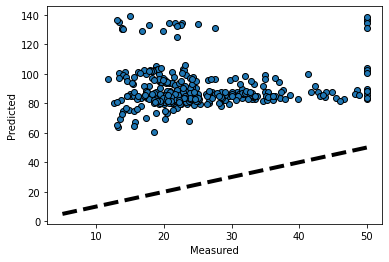

In [25]:
fig, ax = plt.subplots()
ax.scatter(y_train, y_pred_, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()